In [1]:
from commonfunctions import *
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean
from skimage.metrics import structural_similarity as ssim
import os
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [140]:
def video_to_frames(video_path, output_folder, start_frame=0, end_frame=None):
    """
    Segment a video into frames and save them as images without altering resolution,
    processing frames only within a specified range.

    Args:
        video_path (str): Path to the input video file.
        output_folder (str): Directory where extracted frames will be saved.
        start_frame (int): Frame index to start processing from (default is 0).
        end_frame (int): Frame index to stop processing at (default is None, which means process until the end).
    """
    # Check if the output folder exists, create if not
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    
    # Check if video opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return
    
    # Get the total number of frames in the video
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video: {total_frames}")
    
    # Validate the end frame
    if end_frame is None or end_frame > total_frames:
        end_frame = total_frames
    
    # Ensure the start frame is valid
    if start_frame >= total_frames:
        print(f"Error: Start frame {start_frame} exceeds total frames {total_frames}.")
        return
    
    # Ensure the start frame is before the end frame
    if start_frame >= end_frame:
        print(f"Error: Start frame {start_frame} is not less than end frame {end_frame}.")
        return
    
    # Set the starting frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    # Frame counter
    frame_count = start_frame
    
    while frame_count < end_frame:
        # Read a frame from the video
        ret, frame = cap.read()
        
        # Break the loop if there are no more frames
        if not ret:
            break
        
        # Construct the output file path
        frame_filename = os.path.join(output_folder, f"frame_{frame_count:04d}.png")
        
        # Save the frame as an image (PNG format preserves resolution)
        cv2.imwrite(frame_filename, frame)
        
        # Print progress
        print(f"Saved: {frame_filename}")
        
        # Increment the frame counter
        frame_count += 1
    
    # Release the video capture object
    cap.release()
    print("Video segmentation complete!")

# Example usage
video_path = "input_video.mp4"  # Replace with your video file path
output_folder = "output_frames"  # Replace with desired output folder path
start_frame = 6000  # Start processing after the first 732 frames
end_frame = 6400  # Stop processing after frame 1500

#video_to_frames(video_path, output_folder, start_frame, end_frame)


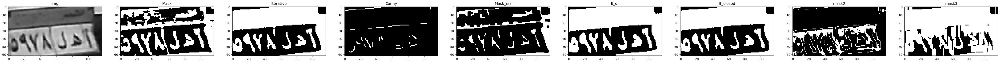

In [142]:
def adaptiveThreshold(frame):
    # only works on grayscale images represented from 0 to 1 as float, works best with sudden changes such as text
    height, width = np.shape(frame)
    threshold = 15
    window_size = width // 8
    mask = frame.copy()
    integral = frame.copy()
    # calculate the integral of the input image
    for i in range(width):
        sum = 0
        for j in range(height):
            sum += frame[j, i]
            if i == 0:
                integral[j, i] = sum
            else:
                integral[j, i] = integral[j, i - 1] + sum
    i = 0
    j = 0
    for i in range(width):
        for j in range(height):
            x1 = max(0, i - window_size // 2)
            x2 = min (width - 1, i + window_size // 2)
            y1 = max(0, j - window_size // 2)
            y2 = min (height - 1, j + window_size // 2)
            count = (x2 - x1) * (y2 - y1)
            sum = integral[y2, x2]
            if y1 > 0:
                sum -= integral[y1 - 1, x2]
            if x1 > 0:
                sum -= integral[y2, x1 - 1]
            if x1 > 0 and y1 > 0:
                sum += integral[y1 - 1, x1 - 1]
            if (frame[j, i] * count) <= (sum * (100 - threshold) / 100):
                mask[j, i] = 255
            else:
                mask[j, i] = 0
    return mask

img = rgba2rgb(io.imread("./Tests/أهل٥٩٧٨.png"))

img_g = rgb2gray(img)

mask =  adaptiveThreshold(img_g)

img_it = iterativeThreshold(img_g)

import numpy as np

f1 = np.array([[0, 0, 1, 0, 0], 
               [0, 0, 1, 0, 0], 
               [0, 0, 1, 0, 0],
               [0, 0, 0, 0, 0], 
               [0, 0, 0, 0, 0]])


img_canny = canny((img_g * 255), sigma=1, low_threshold=240, high_threshold=250)

mask_err = binary_erosion(mask, np.ones((3, 3)))

it_dil = binary_dilation(img_it, np.ones([3,1]))

it_closed = binary_erosion(it_dil, np.ones([3,1]))

mask2 = ((img_g > 0.4) & (img_g < 0.5)) 

mask2_closed = binary_erosion(mask2, np.ones([2,2]))

mask3 = binary_dilation(mask2_closed, np.ones([8,1]))

mask3 = np.logical_or(mask3,img_it)

show_images([img_g,mask,img_it,img_canny,mask_err,it_dil,it_closed,mask2,mask3],["Img","Mask","Iterative","Canny","Mask_err","It_dil","It_closed","mask2","mask3"])

In [ ]:
img = rgba2rgb(io.imread("./4_2.png"))

img_g = rgb2gray(img)

def seg(img):
    img = (img).astype("uint8")
    imgHist = np.zeros(256)
    for x in range(np.shape(img)[0]):
        for y in range(np.shape(img)[1]):
            imgHist[img[x, y]] += 1

    sum = 0
    for x in range(256):
        sum += (imgHist[x] * x)

    mean = round(sum / (np.shape(img)[0] * np.shape(img)[1]))

    sat = False    
    while(not sat):
        sum1 = 1
        count1 = 1
        sum2 = 1
        count2 = 1
        for x in range(mean):
            sum1 += (imgHist[x] * x)
            count1 += imgHist[x]
        for x in range(mean,256):
            sum2 += (imgHist[x] * x)
            count2 += imgHist[x]
        mean1 = sum1/(count1)
        mean2 = sum2/(count2)
        if math.isnan(mean1):
            print("ERRROR mean1", mean1)
            mean1 = mean2
        if math.isnan(mean2):
            print("ERRROR mean2", mean2)
            mean2 = mean1
        mean3 = round((mean1+mean2)/2)
        if (mean3 == mean):
            sat = True
        mean = mean3

    for x in range(np.shape(img)[0]):
        for y in range(np.shape(img)[1]):
            if(img[x,y] <= mean):
                img[x,y] = 0
            else:
                img[x,y] = 1
    return img

def local_thres(img):
    img = np.copy((img).astype("uint8"))

    x = np.shape(img)[0]
    y = np.shape(img)[1]

    q1 = img[0:round(x/2),0:round(y/2)]
    q2 = img[0:round(x/2),round(y/2):y]
    q3 = img[round(x/2):x,0:round(y/2)]
    q4 = img[round(x/2):x,round(y/2):y]

    q1_s = seg(np.copy(q1))
    q2_s = seg(np.copy(q2))
    q3_s = seg(np.copy(q3))
    q4_s = seg(np.copy(q4))

    return q1_s, q2_s, q3_s, q4_s

def join_quads(quad, sub_quads):
    img = np.zeros(np.shape(quad))
    x = np.shape(img)[0]
    y = np.shape(img)[1]

    img[0:round(x/2),0:round(y/2)] = sub_quads[0]
    img[0:round(x/2),round(y/2):y] = sub_quads[1]
    img[round(x/2):x,0:round(y/2)] = sub_quads[2]
    img[round(x/2):x,round(y/2):y] = sub_quads[3]

    return img

quad = local_thres(img_g * 256)

final = join_quads(img_g,quad)

x = img_g > (0.65 * img.max())

x_err = binary_dilation(x,np.ones([3,1]))

#show_images([img_g,final,x,x_err],["original","Final","X","X_err"])


In [3]:
def getHistogram(img):
    # works for grayscale images represented from 0 to 255
    hist = np.zeros(256)
    for i in range(np.shape(img)[0]):
        for j in range(np.shape(img)[1]):
            hist[img[i, j]] += 1
    return hist

def iterativeThreshold(image):
    # only works on grayscale images
    img = (image.copy()*255).astype('uint8') % 255
    hist = getHistogram(img)
    sum = 0
    weighted_sum = 0
    for i in range(256):
        sum += hist[i]
        weighted_sum += hist[i] * i
    Tinit = int(weighted_sum // sum)
    while(True):
        sum1 = 0
        weighted_sum1 = 0
        for j in range(Tinit):
            sum1 += hist[j]
            weighted_sum1 += hist[j] * j
        T1 = int(weighted_sum1 // sum1)

        sum2 = 0
        weighted_sum2 = 0
        for k in range(Tinit,256):
            sum2 += hist[k]
            weighted_sum2 += hist[k] * k
        T2 = int(weighted_sum2 // sum2)

        Told = Tinit
        Tinit = int((T1 + T2) // 2)

        if (Tinit == Told):
            break
    binary_mask = img <= Tinit
    return binary_mask

In [5]:
def refine_binary_half(image):
    binary_image = iterativeThreshold(image)

    #show_images([binary_image,image],["image given to refine binary","image"])
    freeze1 = False
    freeze2 = False
    strike1=False
    strike2=False
    index1 = 0
    index2 = 0
    index3 = 0
    index4 = 0

    #print(binary_image[:,0])
    #print(binary_image[:,1])
    #print(binary_image[:,2])
    # Correctly interpret dimensions
    height, width = np.shape(binary_image)
    
    for i in range(5):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if binary_image[j, i] == 1:
                counter1 += 1
            if binary_image[height - 1 - j, i] == 1:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if binary_image[j, width - 1 - i] == 1:
                counter2 += 1
            if binary_image[height - 1 - j, width - 1 - i] == 1:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            if strike1:       
                index1 += 2
                strike1=False
            else:
                index1 += 1
        elif strike1:
            freeze1 = True
        else:
            strike1=True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            if strike2:       
                index2 += 2
                strike2=False
            else:
                index2 += 1
        elif strike2:
            freeze2 = True
        else:
            strike2=True

    freeze1 = False
    freeze2 = False
    image = image[:, index1:width - index2]
    binary_image = binary_image[:, index1:width - index2]
    width -= (index1+index2)
        
    for i in range(3):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(7):
            # Top and bottom pixels of the left column
            if binary_image[i, j] == 1:
                counter1 += 1
            if binary_image[i, width - 1 - j] == 1:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if binary_image[height - 1 - i, j] == 1:
                counter2 += 1
            if binary_image[height - 1 - i, width - 1 - j] == 1:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            index3 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            index4 += 1
        else:
            freeze2 = True
            

    print("After")    
    #print(binary_image[:,index1])
    image = image[index3:height - index4:,:]
    binary_image=binary_image[index3:height - index4:,:]
    
    #show_images([binary_image],["image out of refine binary"])
    # Return the cropped image
    return binary_image,image

In [7]:
def extract_half(img_it_dil,image_n):
    # # Find contours
    contours = find_contours(img_it_dil, 0.)
    bounding_boxes = []
    for contour in contours:
        Ymin = np.min(contour[:,0])
        Ymax = np.max(contour[:,0])
        Xmin = np.min(contour[:,1])
        Xmax = np.max(contour[:,1])
        aspect_ratio = (Xmax-Xmin)/(Ymax-Ymin)
        if 1 <= aspect_ratio <= 3 and (Xmax-Xmin) > 40 and (Ymax-Ymin) > 25:
            print(Xmin, Xmax, Ymin, Ymax)
            bounding_boxes.append([Xmin, Xmax, Ymin, Ymax])
    
    
    # #When provided with the correct format of the list of bounding_boxes, this section will set all pixels inside boxes in img_with_boxes
    img_with_boxes = np.zeros_like(img_it_dil)
    for box in bounding_boxes:
        [Xmin, Xmax, Ymin, Ymax] = box
        rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=img_it_dil.shape)
        img_with_boxes[rr, cc] = 1 #set color white
        return image_n[int(Ymin+2):int(Ymax-2),int(Xmin):int(Xmax)]
    return image_n[2:int(np.shape(image_n)[0]-4),:]

import numpy as np

def refine_half(image):
    freeze1 = False
    freeze2 = False
    index1 = 0
    index2 = 0
    index3 = 0
    index4 = 0
    
    # Correctly interpret dimensions
    height, width = np.shape(image)
    
    
    print("top")
    print(image[0,:])
    print(image[1,:])
    print(image[2,:])
    '''
    print("right")
    print(image[:,width-1])
    print(image[:,width-2])
    print(image[:,width-3])
    '''
    
    
    #show_images([image],["Img1 giben to basic refine"])
    
    for i in range(3):
        counter1 = 0
        counter2 = 0
        print("top")
        print(image[i,:])
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if image[i, j] < 0.2:
                counter1 += 1
            if image[i, width - 1 - j] < 0.2:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            
            if image[height - 1 - i, j] < 0.2:
                counter2 += 1
            if image[height - 1 - i, width - 1 - j] < 0.2:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 3 and not freeze1:
            index3 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 3 and not freeze2:
            index4 += 1
        else:
            freeze2 = True
            
            
    freeze1 = False
    freeze2 = False
    image=image[index3:height - index4,:]
    height -= (index3+index4)
    
    for i in range(15):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if image[j, i] < 0.2:
                counter1 += 1
            if image[height - 1 - j, i] < 0.2:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if image[j, width - 1 - i] < 0.2:
                counter2 += 1
            if image[height - 1 - j, width - 1 - i] < 0.3:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            index1 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            index2 += 1
        else:
            freeze2 = True
    image=image[:, index1:width - index2]
    #show_images([image],["Img1 out of basic refine"])


    print("After")
    print(image[:,0])
    # Return the cropped image
    return image

def split_plate(img):

    img_g = rgb2gray(img)

    img_it = iterativeThreshold(img_g)

    img_it_dil = binary_dilation(img_it, np.ones([3,1]))

    #c = extract_half(img_it_dil,img_g)
    
    # Crop 40% from the top
    height, width = img_g.shape
    cropped_img = img_g[int(height * 0.4):, :]
    
    # Split the cropped image into two parts vertically
    image1 = cropped_img[:, :int(width * 0.5)]  # Left half
    image2 = cropped_img[:, int(width * 0.5):]  # Right half

    img_it = iterativeThreshold(image1)
    
    img_it_dil = binary_dilation(img_it, np.ones([3,1]))
    
    #image1 = extract_half(img_it_dil,image1)
    #show_images([image1],['1'])
    
    image1 = refine_half(image1)
    #show_images([image1],['11'])
    image1_it,image1 = refine_binary_half(image1)
    
    img_it = iterativeThreshold(image2)
    
    img_it_dil = binary_dilation(img_it, np.ones([3,1]))
    
    #image2 = extract_half(img_it_dil,image2)
    #show_images([image2],['2'])
    
    image2 = refine_half(image2)
    #show_images([image2],['22'])
    image2_it,image2 = refine_binary_half(image2)
    print("to horizonatal")
    #show_images([image1_it,image2_it],['1','2'])

    return image1,image1_it,image2,image2_it

In [9]:
def fix_tilt(img):

    img_g = rgb2gray(img)
    
    # Use Canny edge detection
    edges = canny(img_g * 255, 1, 70, 110)
    
    #show_images([img_g,edges],["Img","canny"])
    # Convert edges to uint8 (HoughLines requires this format)
    edges_uint8 = (edges * 255).astype(np.uint8)
    
    # Perform the Hough Line Transform
    lines = cv2.HoughLines(edges_uint8, 1, np.pi / 180, 40)
    
    # Extract angles of the detected lines
    angles = []
    if lines is not None:
        for line in lines:
            rho, theta = line[0]
            angle = np.rad2deg(theta) - 90  # Convert from radians to degrees
            angles.append(angle)
    else:
        print("No lines detected")
        return img
    # Calculate the median angle to reduce noise
    tilt_angle = np.median(angles)
    print(f"Tilt angle: {tilt_angle:.2f} degrees")
    
    # Get the center of the image
    (h, w) = img_g.shape[:2]
    center = (w // 2, h // 2)
    
    # Create the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, tilt_angle, 1.0)
    
    # Apply the rotation
    corrected_image = cv2.warpAffine(img, rotation_matrix, (w, h), borderValue=(0.5,0.5,0.5))
    
    #show_images([img,corrected_image],["Img","corrected"])

    return corrected_image


In [11]:
def horizontal_segmentation(image, min_width=1, max_width=20, min_height=4):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """
    print("welcome to horizontal seg")
    binary_image = iterativeThreshold(image)

    #show_images([image,binary_image],["image","binary"])
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)

            #filtering
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image[:,start:end]) > min_height * (end - start)):
        
                # Extract potential digit
                digit_region = image[:, start:end]
                digit_region = iterativeThreshold(digit_region)
                
                digit_regions.append((start, end, digit_region))
            
            in_digit = False
    
    return digit_regions

def refine_segmentation(digit_regions, max_digits=4, min_separation=1):
    """
    Refine segmentation by merging or filtering regions
    
    Args:
        digit_regions (list): List of detected digit regions
        max_digits (int): Maximum number of expected digits
        min_separation (int): Minimum separation between digits
    
    Returns:
        list: Refined list of digit regions
    """
    # Sort regions from left to right
    sorted_regions = sorted(digit_regions, key=lambda x: x[0])
    
    # Merge closely connected regions
    refined_regions = []
    i = 0
    while i < len(sorted_regions):
        current = sorted_regions[i]
        
        # Look ahead to see if next region is close
        if i + 1 < len(sorted_regions):
            next_region = sorted_regions[i + 1]
            
            # If regions are close, merge them
            if next_region[0] - current[1] < min_separation:
                # Merge the two regions
                merged_region = (
                    current[0], 
                    next_region[1], 
                    np.hstack((current[2], next_region[2]))
                )
                refined_regions.append(merged_region)
                i += 2
                continue
        
        refined_regions.append(current)
        i += 1

    # Limit to max expected digits
    return refined_regions[:max_digits]

def pad_and_center_digit(digit, target_size=40, pad_value=0):
    """
    Pad and center a digit image to a target size
    
    Args:
        digit (numpy.ndarray): Input digit image
        target_size (int): Desired size of the padded image
        pad_value (int): Value to use for padding (0 for black)
    
    Returns:
        numpy.ndarray: Padded and centered digit image
    """
    # Ensure the input is a numpy array of uint8
    if not isinstance(digit, np.ndarray):
        digit = np.array(digit)
    
    # Convert to grayscale if it's a color image
    if len(digit.shape) > 2:
        digit = digit.mean(axis=2).astype(np.uint8)
    
    # Get current digit dimensions
    h, w = digit.shape
    
    # Determine scaling factor if larger than target size
    if h > target_size or w > target_size:
        # Calculate scale factor to fit within target size while maintaining aspect ratio
        scale_h = target_size / h
        scale_w = target_size / w
        scale = min(scale_h, scale_w)
        
        # Calculate new dimensions
        new_h = int(h * scale)
        new_w = int(w * scale)
        
        # Resize the digit
        from skimage.transform import resize
        digit = resize(digit, (new_h, new_w), mode='constant', cval=pad_value)
        digit = (digit * 255).astype(np.uint8)
        h, w = digit.shape
    
    # Create a blank image with pad_value
    padded = np.full((target_size, target_size), pad_value, dtype=np.uint8)
    
    # Calculate centering offsets
    start_y = (target_size - h) // 2
    start_x = (target_size - w) // 2
    
    # Place the resized (or original) digit in the center
    padded[start_y:start_y+h, start_x:start_x+w] = digit
    
    return padded

def visualize_segmentation(original, digit_regions, padded_digits):
    """
    Visualize the segmentation process
    
    Args:
        original (numpy.ndarray): Original grayscale image
        binary (numpy.ndarray): Binary image
        digit_regions (list): List of detected digit regions
        padded_digits (list): List of padded digit images
    """
    # Visualization of original and binary images
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 1, 1)
    plt.title('Original Image')
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    '''
    plt.subplot(1, 2, 2)
    plt.title('Binary Image')
    plt.imshow(binary, cmap='gray')
    plt.axis('off')
    '''
    
    plt.tight_layout()
    plt.show()
    
    # Visualize original and padded digits
    plt.figure(figsize=(15, 3))
    
    # Original digits
    plt.subplot(2, len(digit_regions), 1)
    plt.title('Original Digits')
    for i, (start, end, digit) in enumerate(digit_regions, 1):
        plt.subplot(2, len(digit_regions), i)
        plt.imshow(digit, cmap='gray')
        plt.axis('off')
    
    # Padded digits
    plt.subplot(2, len(padded_digits), len(digit_regions) + 1)
    plt.title('Padded Digits')
    for i, digit in enumerate(padded_digits, 1):
        plt.subplot(2, len(padded_digits), len(digit_regions) + i)
        plt.imshow(digit, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def resize(img):
    
    # Step 0: Ensure the image is binary and of the correct type
    img = (img > 0).astype(np.uint8)  # Ensure binary mask of type uint8
    
    # Step 1: Check if the input image has non-zero pixels
    if np.count_nonzero(img) == 0:
        # If empty, return a blank 40x40 binary image
        return np.zeros((40, 40), dtype=np.uint8)

    max_dimension = 30  # Limit the maximum dimension of the image
    scale = max_dimension / max(img.shape[:2])
    if scale < 1:  # Only shrink large images
        img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    
    # Step 1: Find the bounding box of the digit
    x, y, w, h = cv2.boundingRect(img)

    # Step 2: Crop the digit using the bounding box
    cropped_digit = img[y:y+h, x:x+w]
    
    # Step 3: Compute the scaling factor
    target_size = 32
    scale = min(target_size / w, target_size / h)
    
    # Step 4: Resize the cropped digit while maintaining the aspect ratio
    new_width = int(w * scale)
    new_height = int(h * scale)
    resized_digit = cv2.resize(cropped_digit, (new_width, new_height), interpolation=cv2.INTER_AREA)
    
    # Step 5: Create a 40x40 canvas and center the resized digit
    padded_digit = np.zeros((target_size, target_size), dtype=np.uint8)
    
    # Compute padding offsets
    pad_top = (target_size - new_height) // 2
    pad_bottom = target_size - new_height - pad_top
    pad_left = (target_size - new_width) // 2
    pad_right = target_size - new_width - pad_left
    
    # Place the resized digit in the center
    padded_digit[pad_top:pad_top+new_height, pad_left:pad_left+new_width] = resized_digit
    
    return pad_and_center_digit(padded_digit) * 255

#img = rgba2rgb(io.imread("./Tests/5_1.png"))

#img_g = rgb2gray(img)

#img_it = iterativeThreshold(img_g)

def prepare_half(image_n):  
    
    #img_it = iterativeThreshold(image_n)
    
    #img_it = binary_dilation(img_it, np.ones([2,1]))
        
    digit_regions = horizontal_segmentation(image_n,2,20,3)
        
    # Refine segmentation
    refined_regions = refine_segmentation(digit_regions)
    
    # Pad and center digits
    padded_digits = [
        resize(region[2]) 
        for region in refined_regions
    ]
    # Visualize segmentation
    visualize_segmentation(image_n, refined_regions,padded_digits)
    return padded_digits

In [13]:
def compare_images(image1,image2,hith_thresh,hitv_thresh,ratio):

    linesh = 0
    linesv = 0
    linesh_max = 0
    linesv_max = 0
    for i in range(40):
        hitsh = 0
        hitsv = 0
        counth1 = 0
        countv1 = 0
        counth2 = 0
        countv2 = 0
        for j in range(40):
            if (image1[i][j] == image2[i][j] and image1[i][j] == 255):
                hitsh += 1
            if (image1[j][i] == image2[j][i] and image1[j][i] == 255):
                hitsv += 1
            if image1[i][j] == 255:
                counth1 += 1
            if image1[j][i] == 255:
                countv1 += 1
            if image2[i][j] == 255:
                counth2 += 1
            if image2[j][i] == 255:
                countv2 += 1
        if hitsh>(max(counth2,counth1)*hith_thresh):
            linesh += 1
        if hitsv>(max(countv2,countv1)*hitv_thresh):
            linesv += 1
        if counth1 + counth2 > 0:
            linesh_max += 1
        if countv1 + countv2 > 0:
            linesv_max += 1


    return (ratio * linesh/linesh_max) + (linesv/linesv_max)
        

In [15]:
def compare_binary_images(image1, image2, current_half):
    """
    Multiple methods to compare binary images
    
    Args:
        image1 (numpy.ndarray): First binary image
        image2 (numpy.ndarray): Second binary image
    
    Returns:
        dict: Comparison metrics
    """
    # Ensure images are binary and same size
    assert image1.shape == image2.shape, "Images must be the same size"

    #old = np.copy(image1)
    #intersection = np.logical_and(image1, image2)
    #dil = binary_dilation(image1,np.ones([3,3]))
    #image1 = (np.logical_and(dil, image2)*255).astype('uint8')
    #image1 = (np.logical_and(intersection2, image1) * 255).astype('uint8')
    
    #intersection = np.logical_and(intersection3, image2)
    #dil = binary_dilation(intersection,np.ones([4,4]))
    #intersection2 = np.logical_and(dil, image2)
    #image1 = ((np.logical_and(intersection2, image1)) * 255).astype('uint8')
    #new = np.copy(image1)

    image3 = np.copy(image1)
    for i in range(40):
        for j in range(40):
            if image2[i][j] == 255:
                image3[i][j] = 100
    #show_images([image3],['image3'])
    
    # 1. Pixel-wise Accuracy (Accuracy Score)
    pixel_accuracy = np.mean(image1 == image2)
    
    # 2. Euclidean Distance
    euclidean_distance = euclidean(image1.ravel(), image2.ravel())
    
    # 3. Structural Similarity Index (SSIM)
    ssim_score = ssim(image1, image2)
    
    # 4. Normalized Cross-Correlation
    norm_cross_corr = np.corrcoef(image1.ravel(), image2.ravel())[0, 1]
    
    # 5. Hamming Distance
    hamming_distance = np.sum(image1 != image2) / image1.size

    # 6. Countour matching
    # Find contours for both images
    contours1, _ = cv2.findContours(image1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(image2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Compare shapes using cv2.matchShapes (Hu Moments)
    similarity = cv2.matchShapes(contours1[0], contours2[0], cv2.CONTOURS_MATCH_I1, 0.0)

    # 7. IoU
    intersection = np.logical_and(image1, image2).sum()
    union = np.logical_or(image1, image2).sum()
    iou = intersection / union

    # 8. Template matching
    result = cv2.matchTemplate(image1, image2, cv2.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

    # 9. Fourier difference
    fft1 = np.fft.fft2(image1)
    fft2 = np.fft.fft2(image2)
    similarity_fourier = np.sum(np.abs(fft1 - fft2)) / np.sum(np.abs(fft1 + fft2))

    # 10. Dice
    dice = 2 * intersection / (image1.sum() + image2.sum())
    
    #11. HU
    # Compute Hu Moments
    moments1 = cv2.moments(image1)
    moments2 = cv2.moments(image2)
    
    hu1 = cv2.HuMoments(moments1).flatten()
    hu2 = cv2.HuMoments(moments2).flatten()
    
    # Compare using log-scale difference
    hu = np.sum(np.abs(np.log(np.abs(hu1) + 1e-10) - np.log(np.abs(hu2) + 1e-10)))

    #12. Custom
    if current_half == 1:
        custom = compare_images(image1,image2,0.65,0.45,1)
    else:
        custom = compare_images(image1,image2,0.65,0.45,1)
        #0.65,0.65,2
    
    
    return {
        'pixel_accuracy': pixel_accuracy,
        'euclidean_distance': euclidean_distance,
        'ssim_score': ssim_score,
        'normalized_cross_correlation': norm_cross_corr,
        'hamming_distance': hamming_distance,
        'countour_matching' : similarity,
        'IoU' : iou,
        'template_matching' : max_val,
        'fourier_difference' : similarity_fourier,
        'dice' : dice,
        'hu' : hu,
        'custom' : custom
    }

def recommend_best_match(reference_images, test_image, current_half):
    """
    Compare test image against multiple reference images
    
    Args:
        reference_images (dict): Dictionary of reference images
        test_image (numpy.ndarray): Image to match
    
    Returns:
        str: Best matching digit
    """
    # Store comparison results
    comparison_results = {}
    
    for digit, ref_images in reference_images.items():
        # Perform comparison
        weighted_score = 0
        for ref in ref_images:
            
            metrics = compare_binary_images(test_image, ref, current_half)
            
            # Use a weighted score (you can adjust weights)
            weighted_score += (
                0 * metrics['pixel_accuracy'] + 
                0 * (1 - metrics['euclidean_distance']) + 
                0 * metrics['ssim_score'] +
                0 * metrics['normalized_cross_correlation'] +
                0 * (1 - metrics['hamming_distance']) + 
                -0 * metrics['countour_matching'] + 
                0 * metrics['IoU'] + 
                0 * metrics['template_matching'] + 
                -0 * metrics['fourier_difference'] + 
                0 * metrics['dice'] + 
                -0 * metrics['hu'] +
                1 * metrics['custom']
            )
            
        comparison_results[digit] = weighted_score
    
    # Find the best match
    best_match = max(comparison_results, key=comparison_results.get)
    
    return best_match, comparison_results

def visualize_comparison(images, titles):
    """
    Visualize a set of binary images
    
    Args:
        images (list): List of binary images
        titles (list): List of titles for each image
    """
    plt.figure(figsize=(12, 4))
    
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        plt.title(title)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example of preparing reference images
def prepare_reference_images():
    """
    Helper function to prepare reference binary images
    
    Returns:
        dict: Dictionary of reference digit and letter images
    """
    reference_digits = {}
    reference_letters = {}
    
    # Load and preprocess reference images for each digit
    
    # Define the string of characters
    characters = '١٢٣٤٥٦٧٨٩'
    
    # Iterate through each character in the string
    for digit in characters:
        # Path to the folder corresponding to the character
        folder_path = f'./Reference_Numbers/{digit}'
        
        # Initialize a list to hold processed images for this character
        processed_images = []
        
        # Iterate through all .jpg files in the folder
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg'):  # Check if the file is a .jpg image
                # Full path to the image
                file_path = os.path.join(folder_path, file_name)
                
                # Load and process the image
                img = io.imread(file_path)
                img_g = rgb2gray(img)           # Convert to grayscale
                img_it = iterativeThreshold(img_g)  # Apply iterative thresholding
                processed_images.append(resize(img_it))  # Resize and add to the list
        
        # Store the list of processed images in the dictionary
        reference_digits[digit] = processed_images


    # Load and preprocess reference images for each letter
    
    # Define the string of characters
    characters = 'أبجدرسصطعفقكلمنهوي'
    
    # Iterate through each character in the string
    for letter in characters:
        # Path to the folder corresponding to the character
        folder_path = f'./Reference_Letters/{letter}'
        
        # Initialize a list to hold processed images for this character
        processed_images = []
        
        # Iterate through all .jpg files in the folder
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg'):  # Check if the file is a .jpg image
                # Full path to the image
                file_path = os.path.join(folder_path, file_name)
                
                # Load and process the image
                img = io.imread(file_path)
                img_g = rgb2gray(img)           # Convert to grayscale
                img_it = iterativeThreshold(img_g)  # Apply iterative thresholding
                processed_images.append(resize(img_it))  # Resize and add to the list
        
        # Store the list of processed images in the dictionary
        reference_letters[letter] = processed_images
    
    return reference_digits,reference_letters

def test_half(current_half,padded_digits):

    # Simulate reference images (replace with your actual reference images)
    reference_digits,reference_letters = prepare_reference_images()
    
    # Your test image

    answer = []
    
    for i  in range(len(padded_digits)):
        test_image = padded_digits[i]
        if current_half == 1:
            #show_images([test_image,reference_digits['١'],reference_digits['٢'],reference_digits['٣'],reference_digits['٤'],reference_digits['٥'],reference_digits['٦'],reference_digits['٧'],reference_digits['٨'],reference_digits['٩']],["Test_iamge","1","2","3","4","5","6","7","8","9"])
        
            # Find best match
            best_digit, results = recommend_best_match(reference_digits, test_image, current_half)
    
        else:
            #show_images([test_image,reference_letters['أ'],reference_letters['ب'],reference_letters['ج'],reference_letters['د'],reference_letters['ر'],reference_letters['س'],reference_letters['ص'],reference_letters['ط'],reference_letters['ع']],["Test_image","أ","ب","ج","د","ر","س","ص","ط","ع"])
            #show_images([reference_letters['ف'],reference_letters['ق'],reference_letters['ك'],reference_letters['ل'],reference_letters['م'],reference_letters['ن'],reference_letters['ه'],reference_letters['و'],reference_letters['ي']],["ف","ق","ك","ل","م","ن","ه","و","ي"])
            # Find best match
            best_digit, results = recommend_best_match(reference_letters, test_image, current_half)
            
        print(f"Best match: {best_digit}")
        print("Full comparison results:", results)
        
        sorted_results = sorted(results.items(), key=lambda x: x[1], reverse=True)
    
        # Get the first two values
        first_two_values = [value for _, value in sorted_results[:2]]
    
        # Calculate and print the confidence difference
        if current_half == 1:
            print("Confidence : ", (first_two_values[0] - first_two_values[1]) / 2)
        else:
            print("Confidence : ", (first_two_values[0] - first_two_values[1]) / 2)

        answer.append(best_digit)

    return answer

# Visualize comparison
#visualize_comparison(test_image, reference_images['0'])

# Compare images
#comparison = compare_binary_images(test_image, reference_images['0'])

# Print comparison metrics
#for metric, value in comparison.items():
   # print(f"{metric}: {value}")




Tilt angle: -2.00 degrees


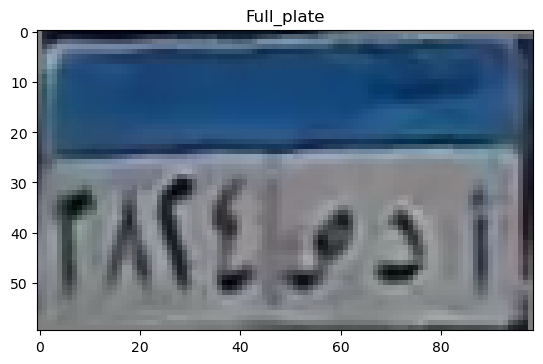

top
[0.24422396 0.35940813 0.40752417 0.33133878 0.25555377 0.23623124
 0.23544353 0.22456944 0.21532044 0.20111637 0.19526696 0.18191087
 0.19410547 0.19999675 0.19037868 0.18766223 0.18567968 0.17800389
 0.16945006 0.16774681 0.17287645 0.18097572 0.19418618 0.20226384
 0.19860142 0.19074306 0.18167564 0.17545    0.17800794 0.19331417
 0.22595942 0.25505716 0.28718032 0.31429147 0.33124147 0.3597987
 0.37242732 0.36419375 0.34065142 0.32836588 0.31562078 0.31733264
 0.3125877  0.32207376 0.31720626 0.26761604 0.21794539 0.20238549
 0.20696193]
[0.2089898  0.32627549 0.37363303 0.35744205 0.34443243 0.30273882
 0.28267608 0.27920718 0.27366566 0.2629483  0.26179025 0.26171244
 0.25474096 0.26314553 0.2845265  0.31219528 0.33178658 0.35633468
 0.3929845  0.43638217 0.43980588 0.47269158 0.49595021 0.49069359
 0.48567015 0.47774543 0.45990668 0.46162373 0.47003564 0.4772306
 0.51542705 0.50976868 0.53670835 0.55782802 0.56954867 0.5958722
 0.6129601  0.6131101  0.60922654 0.60791478 0.6

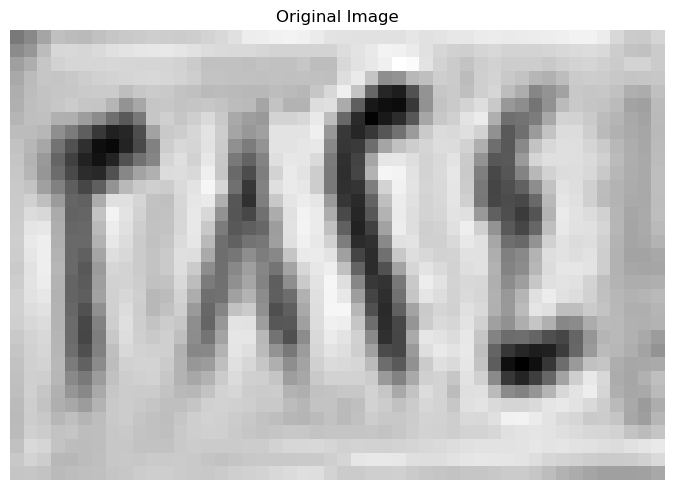

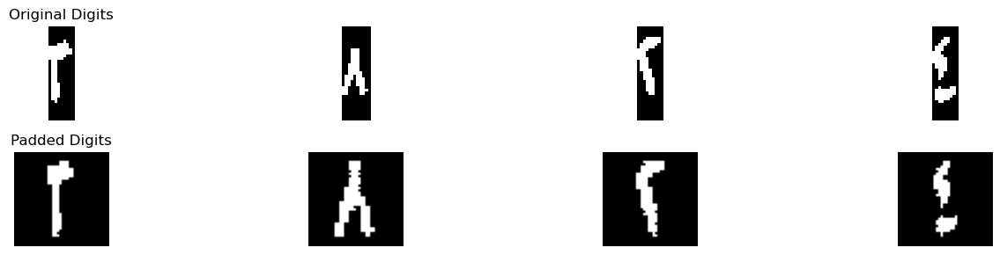

Best match: ٢
Full comparison results: {'١': 0.3352272727272727, '٢': 4.53620337995338, '٣': 4.461977554179566, '٤': 1.7889423076923077, '٥': 2.1161681777974346, '٦': 1.5880952380952382, '٧': 0.7363970588235295, '٨': 0.7166666666666667, '٩': 0.7439196832579185}
Confidence :  0.03711291288690699
Best match: ٨
Full comparison results: {'١': 2.584558823529412, '٢': 1.2977941176470589, '٣': 1.003966718266254, '٤': 2.14889705882353, '٥': 1.2134426138876602, '٦': 0.34411764705882353, '٧': 0.9419117647058823, '٨': 5.51609477124183, '٩': 3.1875}
Confidence :  1.1642973856209151
Best match: ٢
Full comparison results: {'١': 2.010416666666667, '٢': 6.542467948717949, '٣': 3.3989938080495357, '٤': 2.5386446886446885, '٥': 1.7099181777974348, '٦': 0.7648809523809523, '٧': 2.1794117647058826, '٨': 0.8861111111111111, '٩': 1.6990321769733534}
Confidence :  1.5717370703342066
Best match: ٤
Full comparison results: {'١': 2.6187500000000004, '٢': 2.0751019813519815, '٣': 1.6640866873065017, '٤': 4.06053

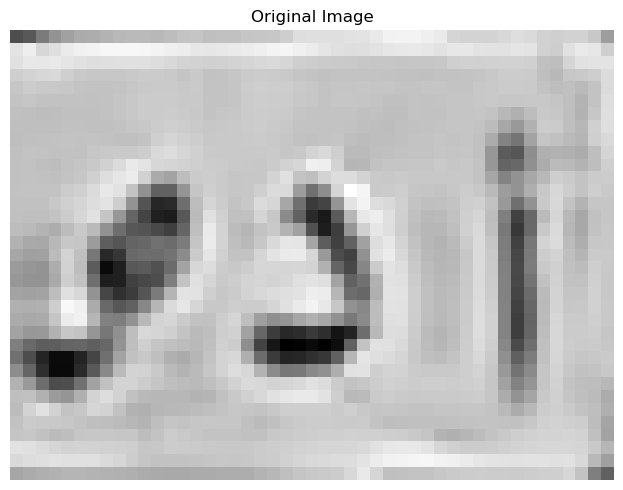

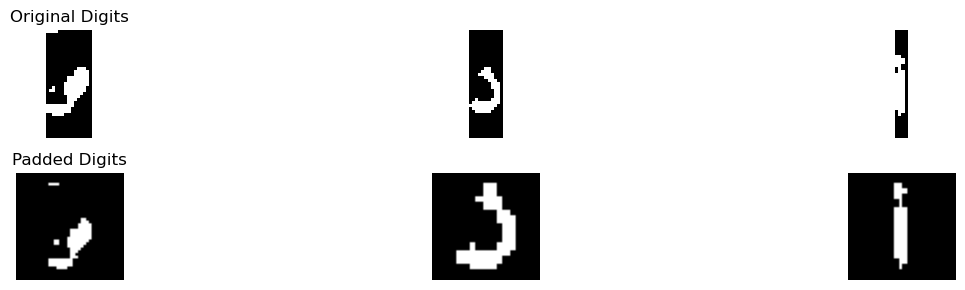

Best match: ل
Full comparison results: {'أ': 0.7095569150908416, 'ب': 0.8054542440318302, 'ج': 0.303919220945083, 'د': 0.6708049535603715, 'ر': 2.0292390411936885, 'س': 0.42410714285714285, 'ص': 0.6358294930875575, 'ط': 2.0074950592885377, 'ع': 0.19583333333333336, 'ف': 0.8397719208415303, 'ق': 1.4234100112473744, 'ك': 0.6401515151515151, 'ل': 2.095788997031132, 'م': 0.0, 'ن': 0.8893413978494624, 'ه': 0.28635752688172045, 'و': 1.3991402116402116, 'ي': 1.5478539576365662}
Confidence :  0.033274977918721804
Best match: د
Full comparison results: {'أ': 0.3181818181818182, 'ب': 0.034482758620689655, 'ج': 2.5568959522763874, 'د': 5.93324074074074, 'ر': 2.75588677252283, 'س': 1.7633928571428572, 'ص': 1.1160984848484847, 'ط': 3.06937582345191, 'ع': 1.2130681818181817, 'ف': 4.310711279461279, 'ق': 3.5474537037037037, 'ك': 2.2982954545454546, 'ل': 2.65625, 'م': 1.5738636363636362, 'ن': 3.830568181818182, 'ه': 3.2952956989247313, 'و': 3.5694444444444446, 'ي': 2.855509526705179}
Confidence :  0.8

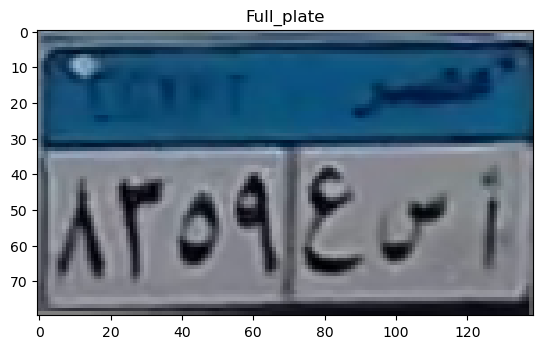

top
[0.46434907 0.27846564 0.1251151  0.08698031 0.11813764 0.11840966
 0.11356286 0.11629381 0.10464649 0.11704462 0.13616877 0.12759647
 0.10332564 0.08980531 0.08556538 0.08637859 0.08841099 0.09451565
 0.09986054 0.1084052  0.11274053 0.1145359  0.11410771 0.1092272
 0.10775713 0.10737417 0.11835911 0.12860018 0.13682016 0.14241578
 0.14558276 0.13870544 0.16129851 0.14325659 0.15135392 0.18757431
 0.19255967 0.19418403 0.19082407 0.18595349 0.19264735 0.20626725
 0.20752254 0.21017208 0.20997272 0.20803891 0.20316029 0.19780285
 0.1837705  0.18038991 0.19541549 0.19617414 0.19930622 0.19245912
 0.17997752 0.18085364 0.16236281 0.16401183 0.18669589 0.21466392
 0.23764903 0.26039262 0.25957278 0.25502744 0.19675072 0.23768346
 0.24149727 0.17527447 0.13606365]
[0.51699449 0.38935039 0.26188947 0.30437556 0.30958869 0.26835877
 0.27091397 0.27728624 0.2697836  0.28999137 0.29848817 0.29475333
 0.29524353 0.29869233 0.30636926 0.30626119 0.31419508 0.3107726
 0.32088979 0.33917824 0.

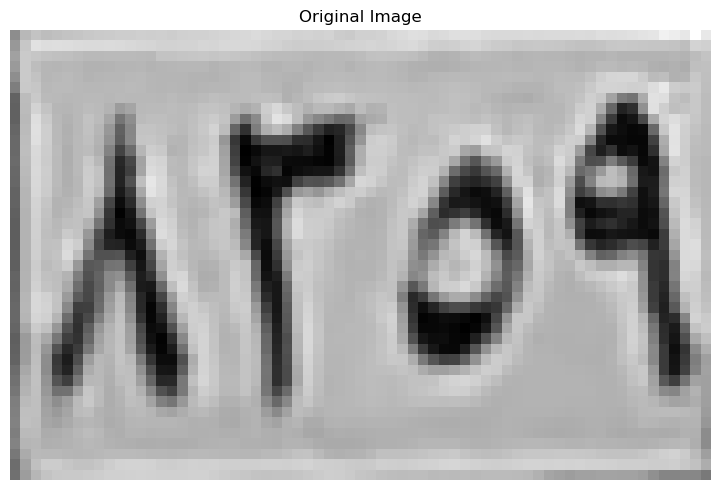

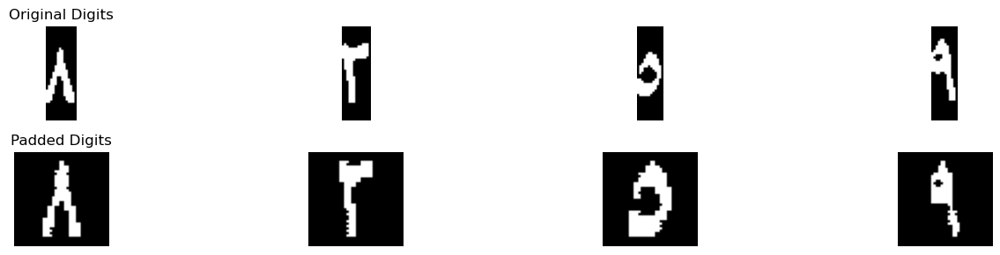

Best match: ٨
Full comparison results: {'١': 3.4375, '٢': 0.78125, '٣': 0.6776315789473684, '٤': 1.65625, '٥': 1.0672130694383017, '٦': 0.85, '٧': 0.8316176470588236, '٨': 6.103472222222223, '٩': 3.097017973856209}
Confidence :  1.3329861111111114
Best match: ٣
Full comparison results: {'١': 0.09375, '٢': 3.4821428571428577, '٣': 5.442724458204335, '٤': 1.9541666666666668, '٥': 1.5358110349402918, '٦': 2.030059523809524, '٧': 1.4757352941176471, '٨': 0.4305555555555555, '٩': 0.7720880018674137}
Confidence :  0.9802908005307387
Best match: ٥
Full comparison results: {'١': 0.8333333333333333, '٢': 1.4861111111111112, '٣': 1.2134502923976607, '٤': 2.739583333333333, '٥': 7.344585421888054, '٦': 1.4513888888888888, '٧': 0.6013888888888889, '٨': 1.3256944444444443, '٩': 0.7812499999999999}
Confidence :  2.3025010442773604
Best match: ٩
Full comparison results: {'١': 4.302083333333333, '٢': 2.6354166666666665, '٣': 1.546923374613003, '٤': 2.9408653846153845, '٥': 1.006592768686422, '٦': 0.79

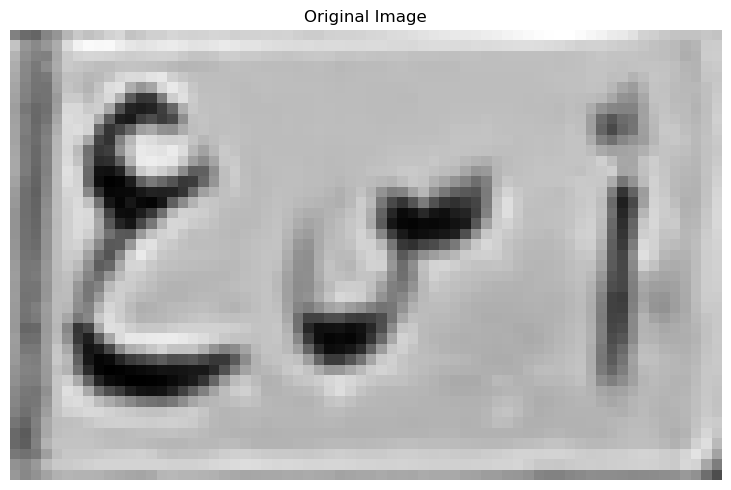

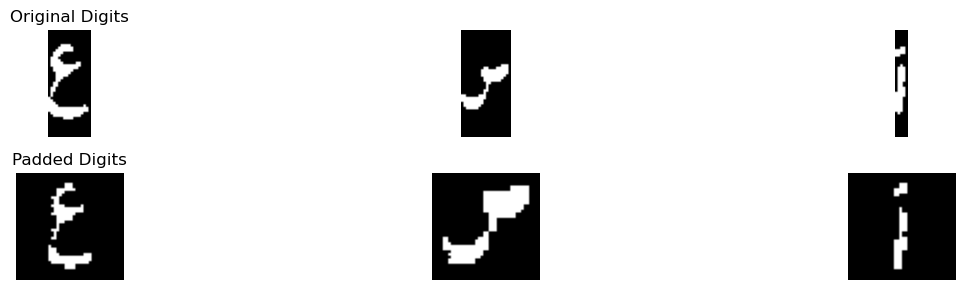

Best match: ع
Full comparison results: {'أ': 0.28125, 'ب': 0.16458333333333333, 'ج': 1.9891764435242696, 'د': 1.8562643201884688, 'ر': 0.4514392803598201, 'س': 0.2901785714285714, 'ص': 0.3806547619047619, 'ط': 1.2213438735177866, 'ع': 4.368969298245615, 'ف': 1.1980210944026732, 'ق': 1.2190389167362852, 'ك': 2.434659090909091, 'ل': 1.4540312177502581, 'م': 1.7897727272727273, 'ن': 2.602321428571429, 'ه': 0.7008736559139784, 'و': 1.1499669312169312, 'ي': 0.9065078037904125}
Confidence :  0.8833239348370929
Best match: س
Full comparison results: {'أ': 0.34375, 'ب': 0.6875, 'ج': 0.28125, 'د': 2.03125, 'ر': 0.5, 'س': 5.621192528735632, 'ص': 3.845545977011494, 'ط': 0.53125, 'ع': 0.3125, 'ف': 1.40625, 'ق': 0.84375, 'ك': 0.71875, 'ل': 0.5625, 'م': 1.34375, 'ن': 0.8125, 'ه': 2.5214080459770116, 'و': 0.96875, 'ي': 1.0625}
Confidence :  0.887823275862069
Best match: أ
Full comparison results: {'أ': 3.2494136240103986, 'ب': 0.12823275862068967, 'ج': 0.48162525879917184, 'د': 0.6241433817014312, 'ر

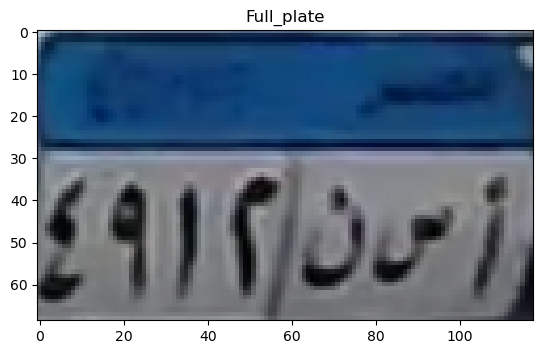

top
[0.29990039 0.16463255 0.12659333 0.12326    0.10588431 0.08288275
 0.07137804 0.07166078 0.07783725 0.08401373 0.0949451  0.1019549
 0.1095302  0.11710549 0.12383255 0.12580471 0.12383255 0.12775412
 0.13084235 0.12858745 0.13084235 0.13673608 0.14374588 0.14291255
 0.14206431 0.14458706 0.1448698  0.13814275 0.13027686 0.12466588
 0.11485059 0.10867412 0.11176235 0.11259569 0.11651725 0.12269373
 0.12352706 0.12661529 0.12970353 0.12970353 0.12970353 0.12970353
 0.12970353 0.12661529 0.12661529 0.12578196 0.12578196 0.12186039
 0.11485059 0.10784078 0.09999765 0.09018235 0.08345529 0.0806498
 0.08765961 0.09158118 0.09158118 0.09241451 0.08120039]
[0.35196706 0.27552275 0.2679851  0.2772498  0.27361098 0.26379569
 0.25735137 0.25680078 0.24924039 0.24139725 0.23300353 0.22741529
 0.22655922 0.23076353 0.23578627 0.23745294 0.23856902 0.23940235
 0.23548078 0.22847098 0.22766039 0.22991529 0.24084667 0.25569961
 0.26102784 0.26663882 0.27559804 0.26970431 0.24531882 0.23383686
 0.

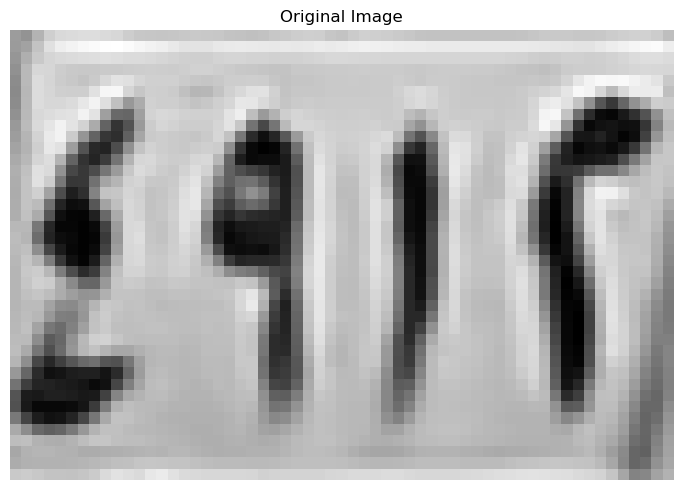

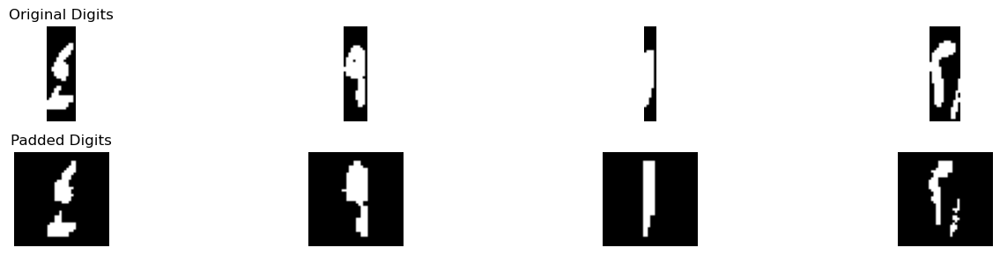

Best match: ٤
Full comparison results: {'١': 2.0729166666666665, '٢': 0.5576923076923077, '٣': 0.9942917956656346, '٤': 2.631364468864469, '٥': 2.3896782397169396, '٦': 0.7145833333333332, '٧': 0.5852941176470589, '٨': 1.8152777777777778, '٩': 1.1711287078934138}
Confidence :  0.12084311457376473
Best match: ١
Full comparison results: {'١': 3.883522727272727, '٢': 3.0450174825174825, '٣': 1.4140866873065017, '٤': 2.0963827838827838, '٥': 2.4421531770602978, '٦': 2.0205357142857143, '٧': 0.4852941176470588, '٨': 2.5305555555555554, '٩': 3.442873303167421}
Confidence :  0.22032471205265303
Best match: ١
Full comparison results: {'١': 3.4499999999999997, '٢': 1.679341491841492, '٣': 1.34171826625387, '٤': 1.9218406593406594, '٥': 1.0191333112192245, '٦': 0.14285714285714285, '٧': 0.775, '٨': 2.152083333333333, '٩': 1.2093231523378583}
Confidence :  0.6489583333333333
Best match: ٢
Full comparison results: {'١': 1.1177884615384615, '٢': 3.7668269230769234, '٣': 2.491582817337461, '٤': 2.32

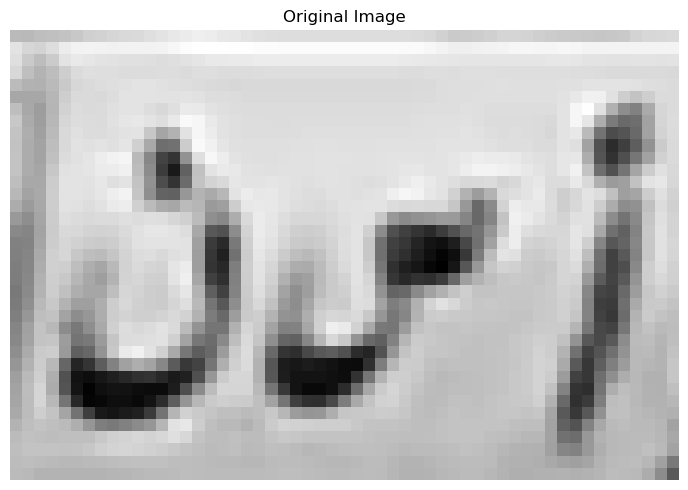

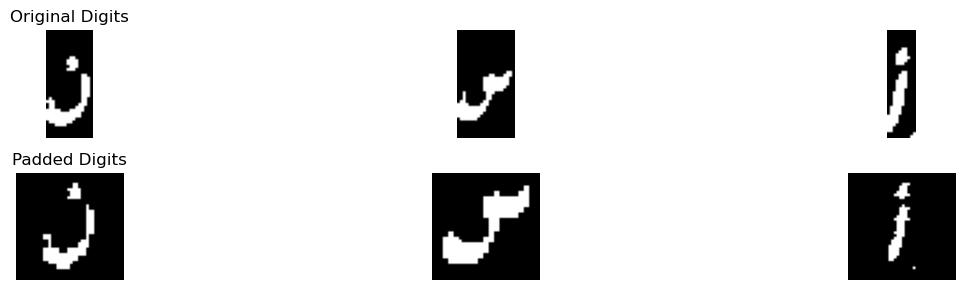

Best match: ل
Full comparison results: {'أ': 0.20002122241086587, 'ب': 0.3326425729442971, 'ج': 0.9969326244354849, 'د': 3.633841706539075, 'ر': 2.838640548146979, 'س': 1.71875, 'ص': 1.4955357142857142, 'ط': 1.1713109354413702, 'ع': 1.0595606960950765, 'ف': 2.4566279610316117, 'ق': 2.9226381365600376, 'ك': 0.7964015151515151, 'ل': 3.6769913695529146, 'م': 0.3569078947368421, 'ن': 3.5918179521384106, 'ه': 1.1445564516129032, 'و': 1.9080760817815148, 'ي': 2.0707090154315555}
Confidence :  0.021574831506919745
Best match: س
Full comparison results: {'أ': 0.1875, 'ب': 0.71875, 'ج': 0.5625, 'د': 2.0, 'ر': 0.46875, 'س': 6.163074712643677, 'ص': 4.261494252873563, 'ط': 0.375, 'ع': 0.3125, 'ف': 1.46875, 'ق': 0.875, 'ك': 0.40625, 'ل': 0.53125, 'م': 1.125, 'ن': 0.96875, 'ه': 2.4170258620689653, 'و': 0.71875, 'ي': 1.34375}
Confidence :  0.9507902298850572
Best match: أ
Full comparison results: {'أ': 2.3778087951475047, 'ب': 0.09375, 'ج': 0.09109730848861283, 'د': 0.38770510835913313, 'ر': 0.04, 'س

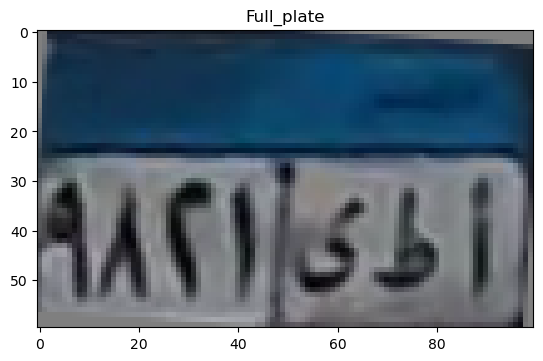

top
[0.26778512 0.17178347 0.15730798 0.11850645 0.09617603 0.09383521
 0.08839897 0.07711806 0.08040221 0.08102278 0.07681682 0.07643573
 0.10219881 0.11814866 0.13054096 0.13979216 0.12911891 0.11795864
 0.10271433 0.08917378 0.07021346 0.06763468 0.07487736 0.08412278
 0.09117098 0.09369393 0.07774137 0.07167183 0.07559765 0.08136708
 0.09664608 0.10474006 0.10786457 0.10913242 0.10944532 0.10493968
 0.09510534 0.09501437 0.0934962  0.09479718 0.09898494 0.10227229
 0.10278938 0.10449619 0.11527381 0.1194271  0.1109603  0.10308843
 0.09967394 0.0965388 ]
[0.25873407 0.1877801  0.19081916 0.19347029 0.2016846  0.21084788
 0.22915599 0.24330627 0.27816308 0.30095042 0.28339811 0.28521093
 0.3382873  0.35565396 0.36310434 0.3721559  0.36184284 0.35630529
 0.33913707 0.31714463 0.29050519 0.28976964 0.26750842 0.27331708
 0.27060585 0.2716255  0.27646385 0.27874766 0.26969496 0.23536229
 0.21948142 0.21280495 0.21293828 0.21331443 0.22166347 0.20881615
 0.20370282 0.22816142 0.2868667  

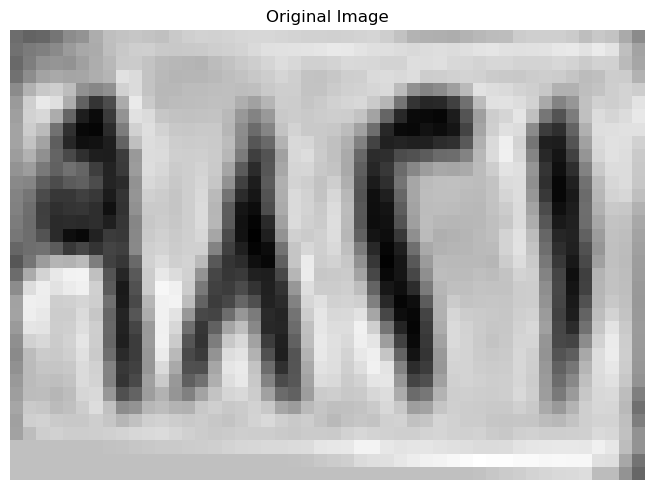

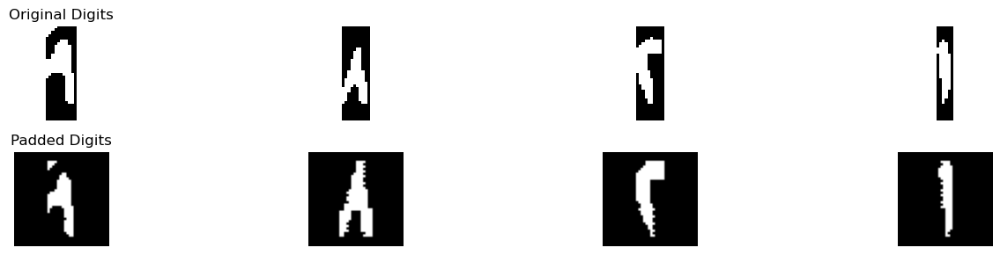

Best match: ٨
Full comparison results: {'١': 3.7073863636363633, '٢': 0.5885052447552448, '٣': 0.5427631578947368, '٤': 0.4375, '٥': 0.6351172047766475, '٦': 1.2458333333333333, '٧': 1.0183823529411764, '٨': 3.89375, '٩': 3.2912738813474105}
Confidence :  0.09318181818181825
Best match: ٨
Full comparison results: {'١': 2.678571428571429, '٢': 0.888392857142857, '٣': 0.625, '٤': 1.1738095238095236, '٥': 1.5068415524104375, '٦': 1.2461309523809523, '٧': 1.0231617647058824, '٨': 5.282638888888889, '٩': 2.330094537815126}
Confidence :  1.3020337301587301
Best match: ٢
Full comparison results: {'١': 0.78125, '٢': 7.038461538461538, '٣': 4.889609133126935, '٤': 3.4282051282051285, '٥': 2.5318996019460416, '٦': 1.005059523809524, '٧': 2.187132352941177, '٨': 0.6243055555555556, '٩': 1.5467885872297638}
Confidence :  1.0744262026673015
Best match: ١
Full comparison results: {'١': 5.458333333333334, '٢': 2.2053467365967365, '٣': 1.236455108359133, '٤': 1.2105540293040293, '٥': 1.144441987321244

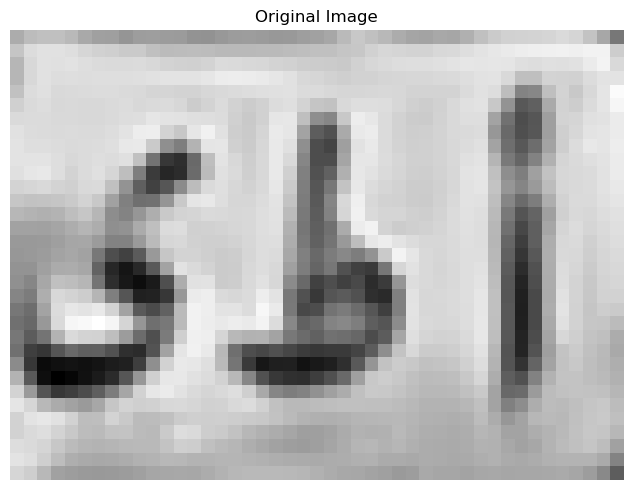

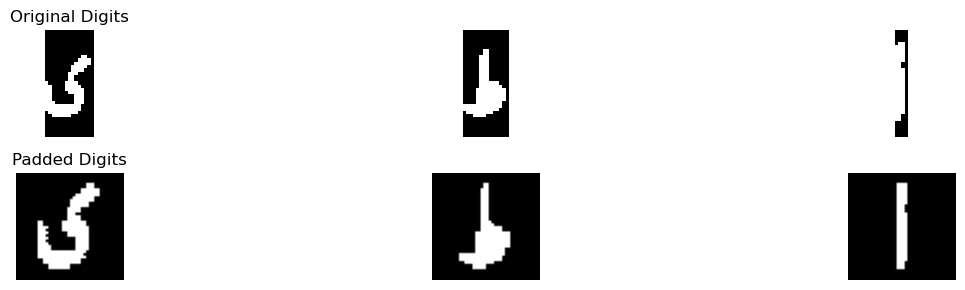

Best match: ي
Full comparison results: {'أ': 0.6154891304347825, 'ب': 0.4816810344827586, 'ج': 1.8866243961352658, 'د': 3.115996376811594, 'ر': 2.266461769115442, 'س': 1.9508928571428572, 'ص': 1.823822463768116, 'ط': 1.9180253623188406, 'ع': 0.9959239130434782, 'ف': 2.1663863008971704, 'ق': 2.0082528180354267, 'ك': 1.9814311594202898, 'ل': 2.5203804347826084, 'م': 0.26766304347826086, 'ن': 2.282554347826087, 'ه': 1.3820564516129032, 'و': 2.871880032206119, 'ي': 3.693464325529543}
Confidence :  0.2887339743589745
Best match: ط
Full comparison results: {'أ': 1.799342105263158, 'ب': 0.43758289124668437, 'ج': 1.3092616050997057, 'د': 2.445525872762715, 'ر': 1.9827593721936025, 'س': 0.9866071428571428, 'ص': 1.0958333333333332, 'ط': 5.172719038208168, 'ع': 0.4625, 'ف': 2.4706296992481205, 'ق': 1.3611650654413812, 'ك': 1.4924242424242427, 'ل': 1.5634868421052632, 'م': 0.1293361244019139, 'ن': 1.653251879699248, 'ه': 1.6298387096774194, 'و': 1.7764376218323588, 'ي': 2.4384787742768292}
Confide

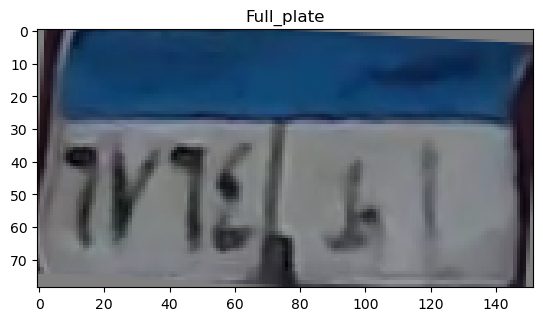

top
[0.23741443 0.08057197 0.0669181  0.1754374  0.35493895 0.42343873
 0.39081732 0.38389346 0.43671047 0.47821608 0.48248998 0.49045093
 0.50292134 0.51611407 0.5100318  0.50786225 0.50789648 0.50628926
 0.50244117 0.49714471 0.49046011 0.4842101  0.47969161 0.47704382
 0.47643872 0.48146488 0.49029637 0.49213157 0.50494435 0.52190968
 0.52794828 0.52890417 0.53206871 0.53840301 0.54549937 0.55330804
 0.5615668  0.56919322 0.57378609 0.57174725 0.56247183 0.55292832
 0.54520187 0.54033706 0.53739493 0.53461398 0.53167229 0.52851989
 0.53089085 0.53690207 0.53949315 0.53719203 0.52756603 0.52019952
 0.51236197 0.50063162 0.4948199  0.49809662 0.50546497 0.5093515
 0.51166412 0.51849623 0.52273463 0.52650369 0.53259284 0.5348983
 0.53426708 0.53588087 0.54038131 0.54196213 0.52823179 0.46724901
 0.38334105 0.33787071 0.30838235 0.35237745]
[0.21024745 0.07280111 0.07101322 0.20465002 0.38235889 0.41443521
 0.37661862 0.39382931 0.44253094 0.47207817 0.47752231 0.47178532
 0.47069246 0.

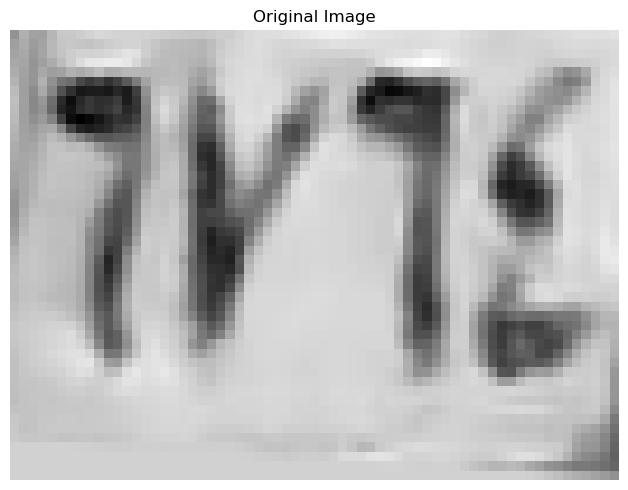

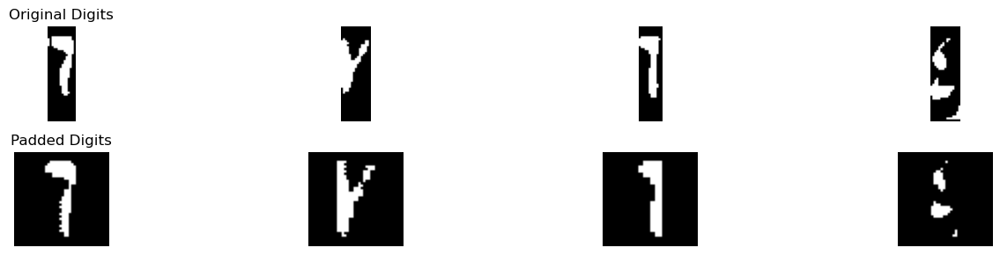

Best match: ٦
Full comparison results: {'١': 2.6466346153846154, '٢': 3.3173076923076925, '٣': 1.8619388544891642, '٤': 0.26785714285714285, '٥': 2.0629929603420316, '٦': 4.3625, '٧': 1.7360294117647062, '٨': 0.4791666666666667, '٩': 1.5594676973353447}
Confidence :  0.5225961538461537
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 1.25, '٣': 1.5046439628482973, '٤': 0.96875, '٥': 0.8418104083738758, '٦': 0.09375, '٧': 2.4488970588235297, '٨': 0.7486111111111111, '٩': 0.7738970588235294}
Confidence :  0.4721265479876162
Best match: ٦
Full comparison results: {'١': 2.4, '٢': 2.2550990675990676, '٣': 0.5238970588235294, '٤': 0.0625, '٥': 2.1254929603420316, '٦': 4.694047619047619, '٧': 0.5992647058823529, '٨': 0.26805555555555555, '٩': 1.3207642031171445}
Confidence :  1.1470238095238094
Best match: ١
Full comparison results: {'١': 0.7897727272727274, '٢': 0.17424242424242425, '٣': 0.6801470588235294, '٤': 0.5714285714285714, '٥': 0.058823529411764705, '٦': 0.05, '٧': 0.417647058

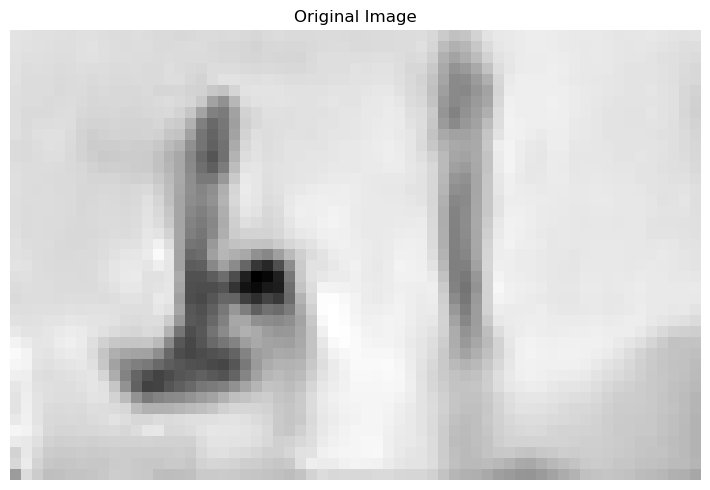

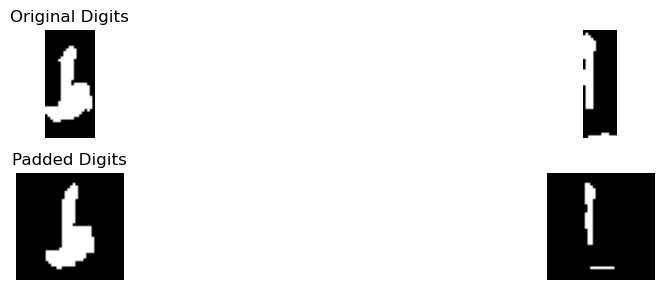

Best match: ط
Full comparison results: {'أ': 1.027777777777778, 'ب': 0.1739058355437666, 'ج': 1.1947391879457097, 'د': 2.6256000797448165, 'ر': 1.9103870981176079, 'س': 1.1473214285714286, 'ص': 1.3663690476190475, 'ط': 3.893857048748353, 'ع': 0.9463815789473684, 'ف': 2.625965956558062, 'ق': 2.01583298524088, 'ك': 1.3636363636363638, 'ل': 2.1095394736842104, 'م': 0.20170454545454547, 'ن': 2.132361111111111, 'ه': 1.6256720430107527, 'و': 2.187830687830688, 'ي': 2.7814659977703458}
Confidence :  0.5561955254890036
Best match: ع
Full comparison results: {'أ': 0.3039772727272727, 'ب': 0.06451612903225806, 'ج': 0.3166424100417789, 'د': 0.05263157894736842, 'ر': 0.0625, 'س': 0.0, 'ص': 0.0, 'ط': 0.03125, 'ع': 0.5871143375680581, 'ف': 0.0, 'ق': 0.08095238095238094, 'ك': 0.19886363636363635, 'ل': 0.0625, 'م': 0.21164118139924593, 'ن': 0.2538690476190476, 'ه': 0.1614247311827957, 'و': 0.03125, 'ي': 0.03125}
Confidence :  0.1352359637631396
[['٦', '٧', '٦', '١'], ['ط', 'ع']]
Tilt angle: -1.00 degr

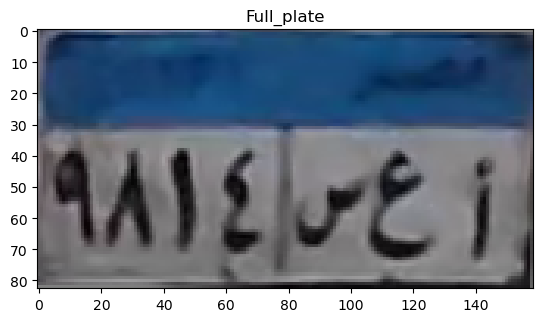

top
[0.41529687 0.35938573 0.3700275  0.41248575 0.45979495 0.51571308
 0.52652533 0.51192941 0.48936461 0.4837085  0.47854406 0.45410815
 0.45279657 0.46719928 0.50007931 0.50118617 0.48782744 0.47311846
 0.46040591 0.44975974 0.45819641 0.47828319 0.47762    0.4850235
 0.50646368 0.51677848 0.52566186 0.52717841 0.52941493 0.52692794
 0.52558132 0.52337544 0.52172103 0.52181294 0.51997471 0.52072532
 0.51740118 0.52058745 0.5240035  0.52778721 0.53186196 0.53916895
 0.54600105 0.5521599  0.55309882 0.5555138  0.55458078 0.5534227
 0.5518173  0.55478912 0.55644353 0.56012    0.56437858 0.56672233
 0.56897417 0.57298765 0.57347784 0.57384549 0.57384549 0.57352841
 0.56892691 0.55737975 0.55342799 0.56011228 0.55062863 0.54315314
 0.53163353 0.55104147 0.57571529 0.58695456 0.59337897 0.59691757
 0.59408363 0.60145189 0.60901929 0.59747824 0.57543167 0.51161426
 0.44438081]
[0.43196926 0.37944422 0.41432167 0.46392338 0.50148466 0.54027066
 0.54962586 0.5337098  0.51324412 0.53568591 0.

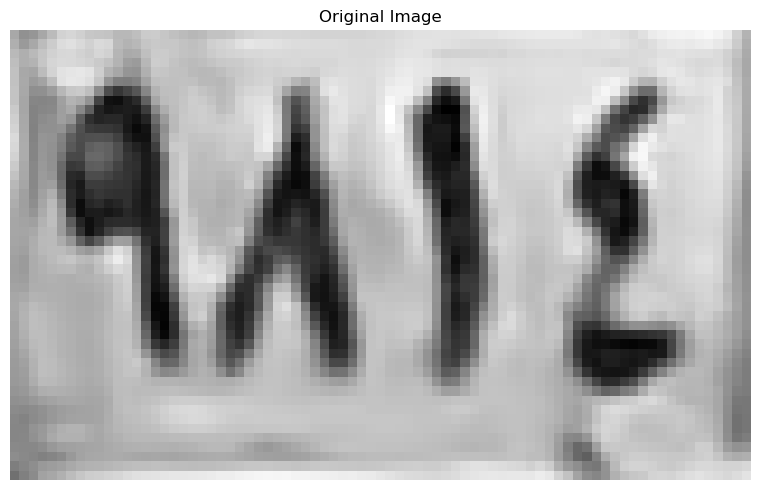

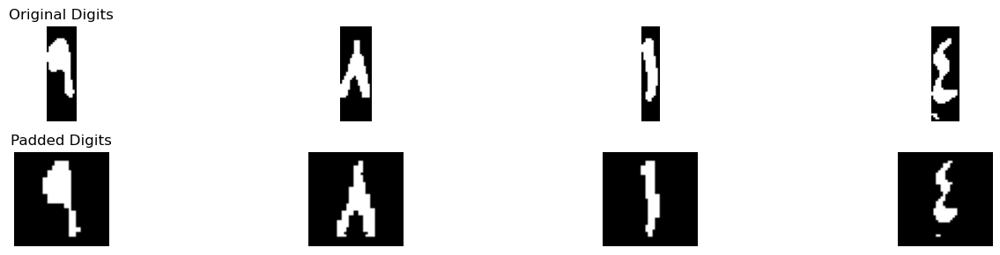

Best match: ٩
Full comparison results: {'١': 2.125, '٢': 2.625, '٣': 2.033378482972136, '٤': 2.46875, '٥': 2.9610238832375053, '٦': 1.63125, '٧': 1.3783088235294119, '٨': 2.7583333333333333, '٩': 5.58578431372549}
Confidence :  1.3123802152439925
Best match: ٨
Full comparison results: {'١': 2.03125, '٢': 0.8125, '٣': 0.7401315789473684, '٤': 1.15625, '٥': 1.3427548651039363, '٦': 1.3125, '٧': 0.9419117647058824, '٨': 5.120833333333333, '٩': 2.265522875816994}
Confidence :  1.4276552287581694
Best match: ١
Full comparison results: {'١': 5.50625, '٢': 1.9714452214452214, '٣': 1.0115131578947367, '٤': 1.5818223443223443, '٥': 1.2381919873212444, '٦': 0.7047619047619047, '٧': 1.3441176470588236, '٨': 2.1381944444444443, '٩': 1.879383484162896}
Confidence :  1.6840277777777777
Best match: ١
Full comparison results: {'١': 2.25, '٢': 1.9200903263403264, '٣': 1.2755417956656347, '٤': 1.3008699633699634, '٥': 0.8580274214949137, '٦': 0.0, '٧': 0.7088235294117647, '٨': 1.7597222222222224, '٩': 0

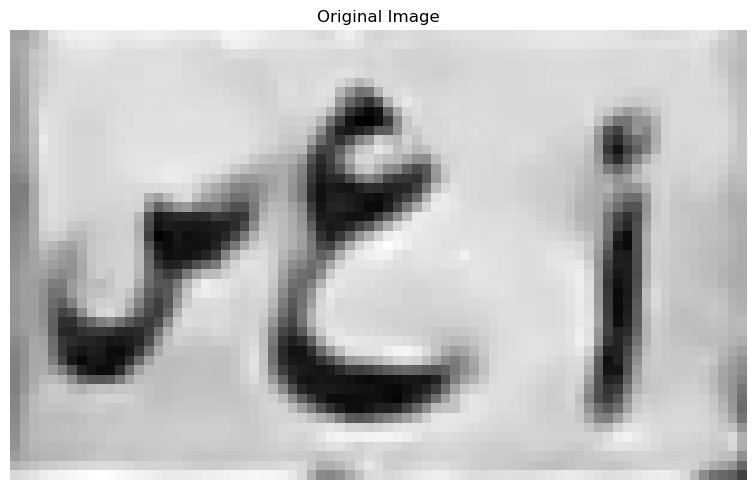

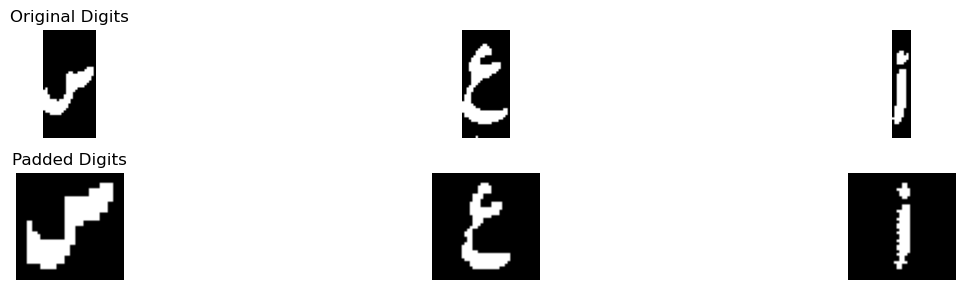

Best match: س
Full comparison results: {'أ': 0.4375, 'ب': 0.875, 'ج': 0.46875, 'د': 1.75, 'ر': 0.5625, 'س': 5.28125, 'ص': 4.875, 'ط': 0.6875, 'ع': 0.375, 'ف': 1.34375, 'ق': 0.78125, 'ك': 1.0625, 'ل': 0.4375, 'م': 1.25, 'ن': 0.90625, 'ه': 2.4375, 'و': 1.34375, 'ي': 1.1875}
Confidence :  0.203125
Best match: ع
Full comparison results: {'أ': 0.35416666666666663, 'ب': 0.25008289124668437, 'ج': 2.4999281113411547, 'د': 3.342881446039341, 'ر': 0.8780940779610196, 'س': 0.5535714285714286, 'ص': 0.3494047619047619, 'ط': 2.2849143610013174, 'ع': 4.064400584795322, 'ف': 2.2103609718741297, 'ق': 1.349679754942913, 'ك': 2.121212121212121, 'ل': 1.1648391812865497, 'م': 2.13415404040404, 'ن': 2.9538690476190474, 'ه': 0.9893817204301075, 'و': 1.4057539682539681, 'ي': 1.4030564845782236}
Confidence :  0.3607595693779908
Best match: أ
Full comparison results: {'أ': 2.6357969987002248, 'ب': 0.38146551724137934, 'ج': 0.36108954451345754, 'د': 0.30014705882352943, 'ر': 0.0, 'س': 0.1919642857142857, 'ص': 0.

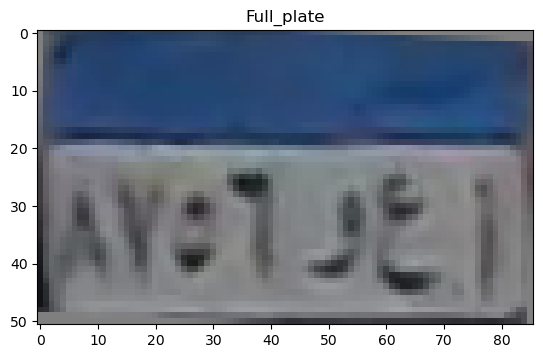

top
[0.33581446 0.35363168 0.42019265 0.47013042 0.52144032 0.56322667
 0.56884584 0.5711024  0.56861275 0.57300881 0.57883407 0.5801449
 0.57068953 0.566245   0.54303993 0.54423676 0.55089046 0.53301637
 0.50253879 0.53039142 0.58883648 0.62693306 0.60952159 0.57880946
 0.56274569 0.53086412 0.53744392 0.54896113 0.52730779 0.51505529
 0.51438127 0.51137882 0.51318137 0.49465436 0.48672892 0.4892648
 0.48540451 0.48424029 0.47731627 0.46509201 0.4736398  0.4806251
 0.4767648 ]
[0.31897509 0.38475931 0.4832056  0.53654597 0.5437595  0.53773647
 0.54622525 0.55113897 0.55671112 0.56746863 0.57444977 0.57671843
 0.57680615 0.57729812 0.5826095  0.58966167 0.5953005  0.5662676
 0.54436206 0.5747401  0.59434794 0.60772876 0.61510468 0.61876583
 0.61242718 0.60965922 0.6281321  0.62528558 0.6229301  0.61867912
 0.60924154 0.60407613 0.60138721 0.60004217 0.6033435  0.60945434
 0.63120968 0.64175132 0.63964759 0.62307032 0.59482026 0.58268282
 0.61478616]
[0.29386544 0.3916435  0.48674391 0.

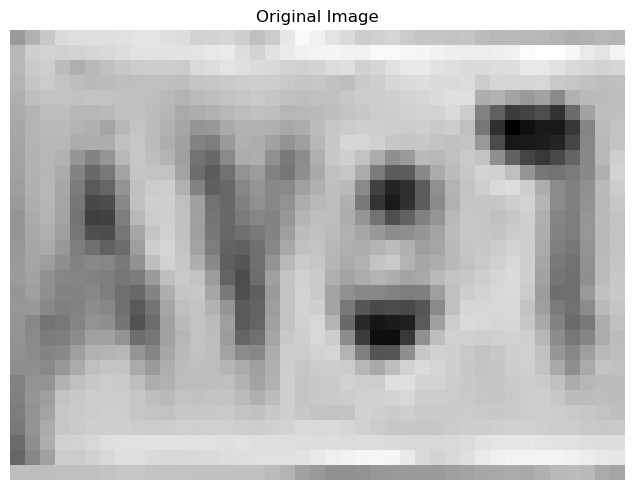

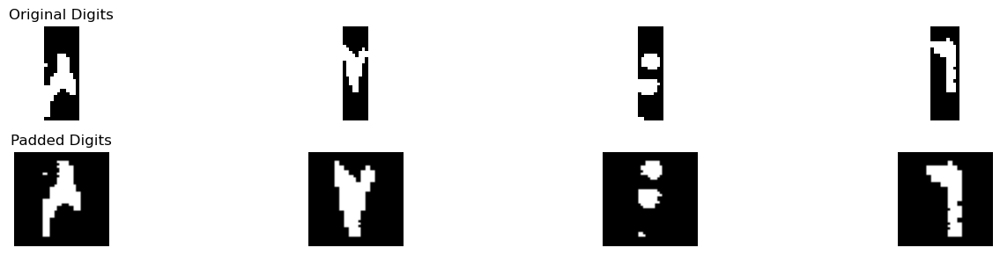

Best match: ٨
Full comparison results: {'١': 1.34375, '٢': 1.59375, '٣': 0.90421826625387, '٤': 1.03125, '٥': 2.671177023440955, '٦': 0.99375, '٧': 1.1996323529411765, '٨': 3.5791666666666666, '٩': 2.636437908496732}
Confidence :  0.45399482161285576
Best match: ٧
Full comparison results: {'١': 0.7647058823529412, '٢': 1.0588235294117647, '٣': 2.772155572755418, '٤': 1.834558823529412, '٥': 2.1097643004570252, '٦': 1.0621323529411766, '٧': 4.079411764705882, '٨': 1.4068218954248366, '٩': 1.9381127450980393}
Confidence :  0.6536280959752321
Best match: ٢
Full comparison results: {'١': 1.63125, '٢': 3.653190559440559, '٣': 1.654702012383901, '٤': 1.427015390523455, '٥': 1.0967261904761905, '٦': 0.5898809523809524, '٧': 0.7389705882352942, '٨': 2.0069444444444446, '٩': 2.5885809451985926}
Confidence :  0.5323048071209833
Best match: ٦
Full comparison results: {'١': 2.4375, '٢': 1.2874999999999999, '٣': 2.0243808049535605, '٤': 0.125, '٥': 2.5835222246793452, '٦': 5.50625, '٧': 0.481617647

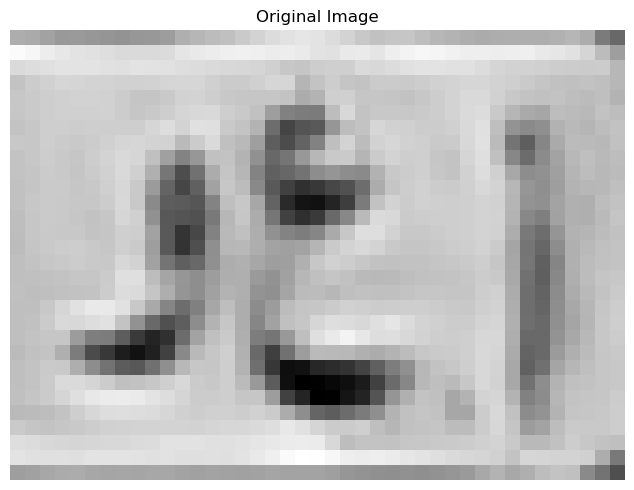

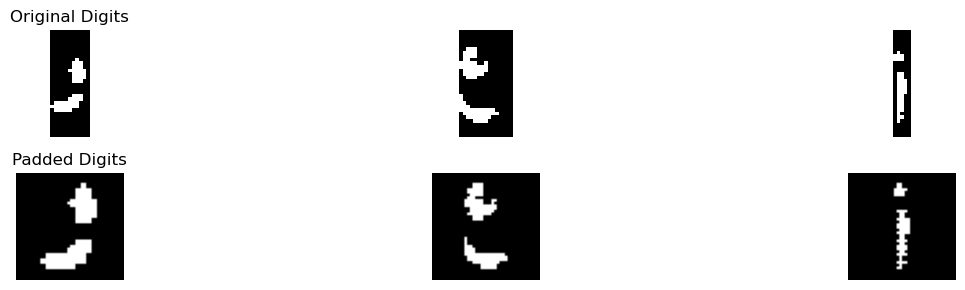

Best match: و
Full comparison results: {'أ': 0.047619047619047616, 'ب': 0.23168103448275862, 'ج': 0.968782002048131, 'د': 3.7259182021682022, 'ر': 4.0762864103662455, 'س': 2.549107142857143, 'ص': 1.1470238095238094, 'ط': 2.7025040906965874, 'ع': 1.0837633237174393, 'ف': 2.8689782812766684, 'ق': 2.920132047071702, 'ك': 1.6723484848484846, 'ل': 3.396405677655678, 'م': 0.4431818181818182, 'ن': 2.5800595238095236, 'ه': 2.317271505376344, 'و': 4.151061621966795, 'ي': 2.482670409300844}
Confidence :  0.03738760580027467
Best match: ع
Full comparison results: {'أ': 0.15625, 'ب': 0.5898541114058355, 'ج': 2.0399557165861513, 'د': 2.3721886303697453, 'ر': 1.0748500253841333, 'س': 0.39285714285714285, 'ص': 0.09583333333333333, 'ط': 1.1710391963109354, 'ع': 4.243858444187392, 'ف': 1.2214348034063653, 'ق': 0.7533580254399439, 'ك': 1.6212121212121209, 'ل': 1.6569927363658015, 'م': 1.5426136363636362, 'ن': 2.262202380952381, 'ه': 0.7301075268817204, 'و': 1.0074575807334427, 'ي': 1.3835818468970642}
C

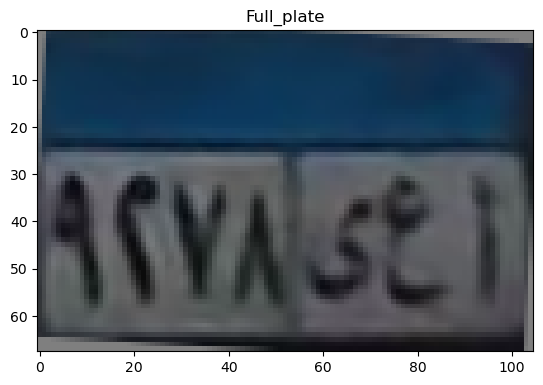

top
[0.35957199 0.31773836 0.3698666  0.39578529 0.40701707 0.41954909
 0.42701612 0.43123327 0.43306749 0.43092105 0.42942348 0.43243714
 0.44095464 0.44732944 0.45237767 0.45137246 0.44819843 0.44678532
 0.4439794  0.43720618 0.42990571 0.42242365 0.41887564 0.42052803
 0.42382824 0.42410859 0.42577631 0.43170799 0.44326043 0.44796388
 0.44898247 0.45222246 0.45890616 0.46460915 0.46734389 0.47179526
 0.47308216 0.46414021 0.45869168 0.45296493 0.45003193 0.44961359
 0.45111963 0.45248843 0.45171004 0.45029105 0.44805635 0.44429643
 0.44085163 0.4447521  0.42896277 0.36101084]
[0.34066223 0.34000803 0.40067173 0.39963871 0.3977261  0.41023159
 0.4127188  0.41874957 0.42077042 0.4108578  0.40316649 0.41253092
 0.42524773 0.43073981 0.43477834 0.43523648 0.43404617 0.4342283
 0.42941757 0.42240012 0.41671748 0.41406016 0.41666646 0.42541628
 0.43364249 0.42665638 0.41937372 0.418657   0.4190737  0.42220027
 0.42669355 0.43045509 0.43286482 0.43551647 0.43500158 0.43812352
 0.44157897 0

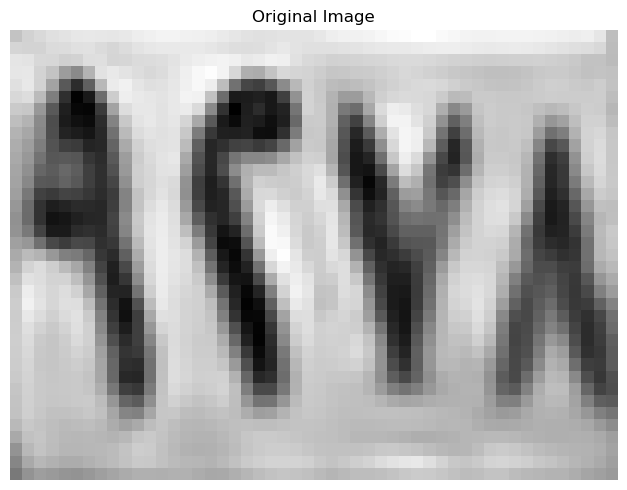

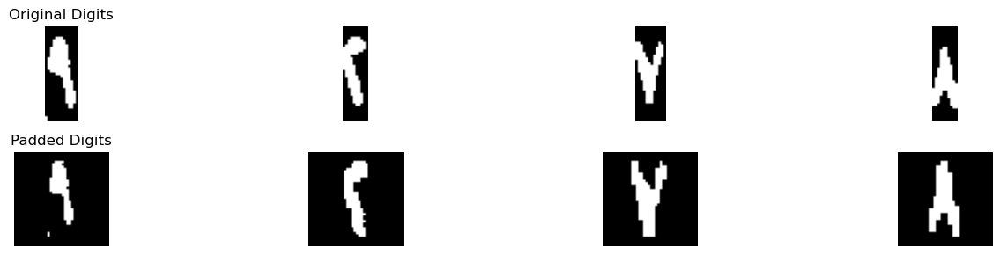

Best match: ١
Full comparison results: {'١': 5.275568181818182, '٢': 1.2065850815850816, '٣': 1.1041021671826625, '٤': 1.2273809523809522, '٥': 1.2576938670204922, '٦': 1.3744047619047617, '٧': 0.4227941176470588, '٨': 2.922222222222222, '٩': 4.07044997486174}
Confidence :  0.602559103478221
Best match: ٢
Full comparison results: {'١': 2.04375, '٢': 6.4683857808857805, '٣': 3.0724651702786376, '٤': 2.6911630036630036, '٥': 2.6398302742149493, '٦': 0.7773809523809523, '٧': 2.319485294117647, '٨': 0.9979166666666667, '٩': 1.5107937405731522}
Confidence :  1.6979603053035714
Best match: ٧
Full comparison results: {'١': 0.5333333333333333, '٢': 2.2624999999999997, '٣': 2.878095975232198, '٤': 2.475, '٥': 0.9419090004422822, '٦': 1.1645833333333333, '٧': 4.141911764705883, '٨': 1.5486111111111112, '٩': 1.4323120915032679}
Confidence :  0.6319078947368424
Best match: ٨
Full comparison results: {'١': 3.730769230769231, '٢': 2.0024038461538463, '٣': 1.171923374613003, '٤': 2.4984661172161173, 

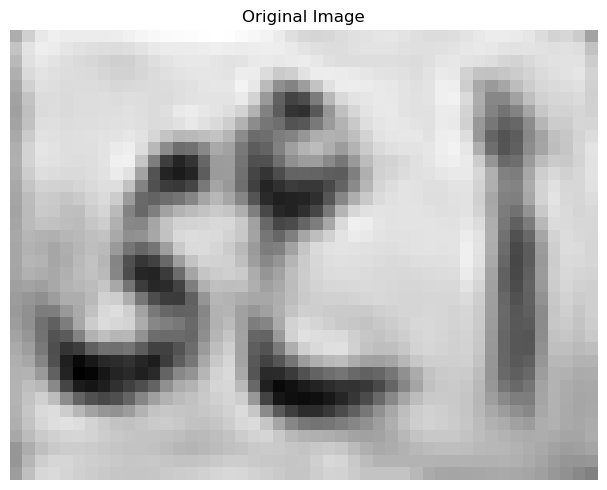

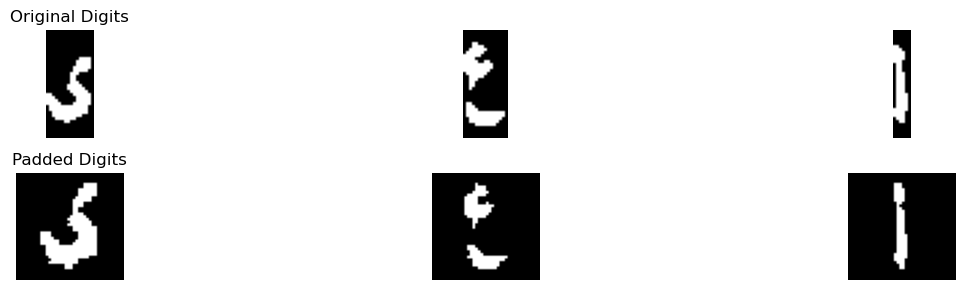

Best match: ي
Full comparison results: {'أ': 0.4895833333333333, 'ب': 0.41594827586206895, 'ج': 0.7971230158730158, 'د': 2.8842598605098604, 'ر': 2.0082940672520886, 'س': 1.34375, 'ص': 1.7080357142857143, 'ط': 0.8992094861660078, 'ع': 0.8214285714285714, 'ف': 2.9730489417989423, 'ق': 1.8129960317460316, 'ك': 0.6505681818181818, 'ل': 1.8333333333333335, 'م': 0.29843073593073594, 'ن': 2.1049404761904764, 'ه': 1.9924059139784946, 'و': 2.611276455026455, 'ي': 3.3779542920847265}
Confidence :  0.2024526751428921
Best match: ع
Full comparison results: {'أ': 0.3125, 'ب': 0.33547192749778953, 'ج': 2.212858352569747, 'د': 1.8004171928862331, 'ر': 0.7096601699150424, 'س': 0.16964285714285715, 'ص': 0.03125, 'ط': 1.256134716732543, 'ع': 4.4723196406027474, 'ف': 1.3305297854852185, 'ق': 0.8091461292119186, 'ك': 1.3437500000000002, 'ل': 1.683095677542272, 'م': 1.6051136363636362, 'ن': 2.4509523809523808, 'ه': 0.6373655913978494, 'و': 1.0715277777777779, 'ي': 0.6247236157562245}
Confidence :  1.01068

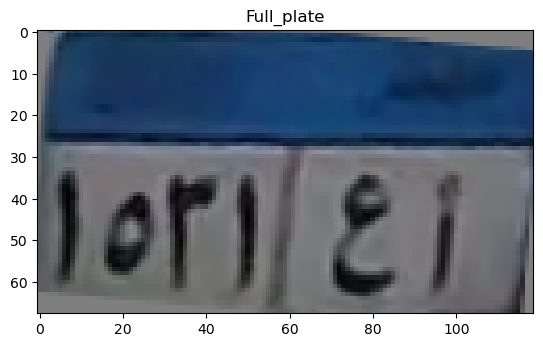

top
[0.41778627 0.34328287 0.33541588 0.34121489 0.33724275 0.35414999
 0.38938882 0.38256423 0.36496545 0.36079955 0.36561113 0.36532134
 0.37074681 0.3898249  0.39500353 0.39148176 0.37954179 0.36793384
 0.35917998 0.36048417 0.37812835 0.37279456 0.3509624  0.3431897
 0.33375537 0.31109862 0.29215667 0.29079365 0.29411856 0.30803324
 0.31042294 0.30648912 0.29642784 0.27612804 0.25576696 0.24273614
 0.24908945 0.22140419 0.22509041 0.3005089  0.30382061 0.24931366
 0.21981438 0.2099099  0.22085063 0.23866407 0.25066142 0.24029482
 0.2406051  0.28188037 0.30801966 0.28419943 0.2553289  0.23983873
 0.23202149 0.22252011 0.18646389 0.16597147 0.14943689]
[0.41347637 0.34241766 0.36289922 0.41199883 0.42948855 0.46386467
 0.48799229 0.4934139  0.49623362 0.50772616 0.5240206  0.53647543
 0.54844814 0.55670889 0.54982528 0.54136997 0.53388384 0.51858819
 0.51010167 0.5130051  0.51901186 0.52503919 0.52854529 0.53333782
 0.53748784 0.53612211 0.51638796 0.50483841 0.49961928 0.49667227
 0

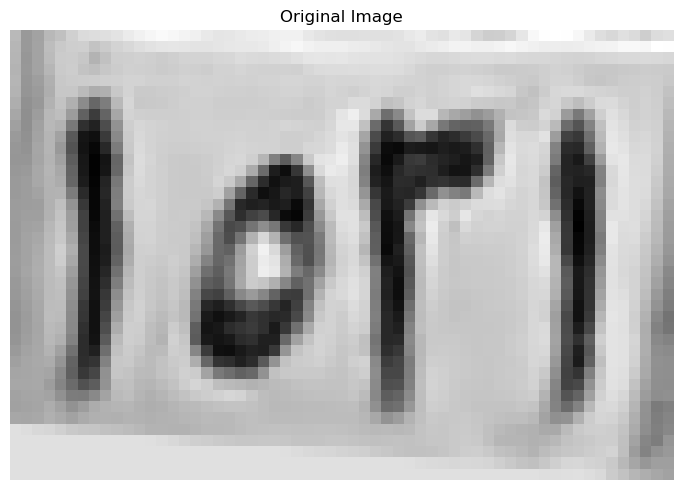

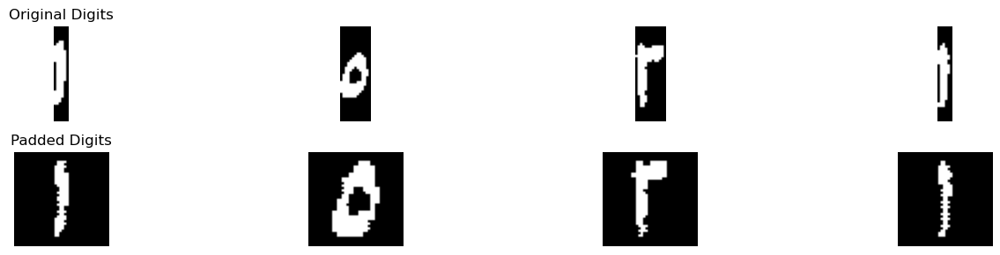

Best match: ١
Full comparison results: {'١': 4.78125, '٢': 1.6016899766899768, '٣': 1.12296826625387, '٤': 1.7655906593406594, '٥': 1.2573851909184728, '٦': 0.3220238095238095, '٧': 0.8275735294117648, '٨': 2.189583333333333, '٩': 1.316962041226747}
Confidence :  1.2958333333333334
Best match: ٥
Full comparison results: {'١': 0.7, '٢': 1.2624999999999997, '٣': 1.2437500000000001, '٤': 2.38125, '٥': 6.75654761904762, '٦': 1.4124999999999999, '٧': 0.85, '٨': 1.375, '٩': 0.525}
Confidence :  2.18764880952381
Best match: ٣
Full comparison results: {'١': 0.3333333333333333, '٢': 3.65625, '٣': 4.284829721362229, '٤': 1.9729166666666667, '٥': 1.9386932404540762, '٦': 1.9145833333333333, '٧': 1.4632352941176472, '٨': 0.5305555555555556, '٩': 0.5627859477124183}
Confidence :  0.3142898606811144
Best match: ١
Full comparison results: {'١': 4.760416666666666, '٢': 1.8800990675990676, '٣': 1.4490131578947367, '٤': 1.4478937728937729, '٥': 1.1323851909184726, '٦': 0.2193452380952381, '٧': 0.4650735

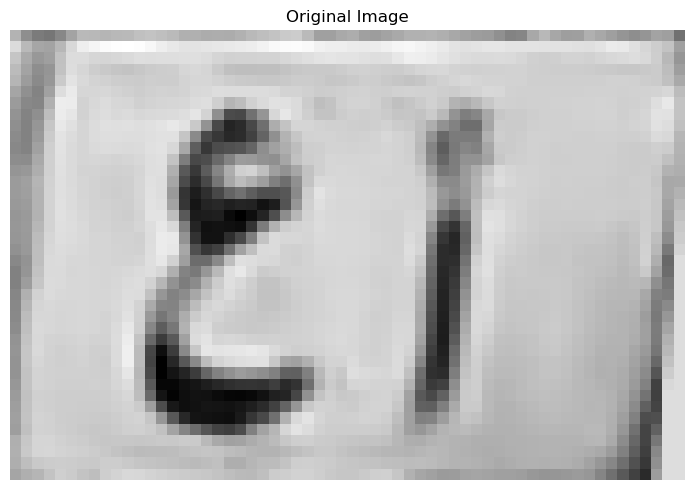

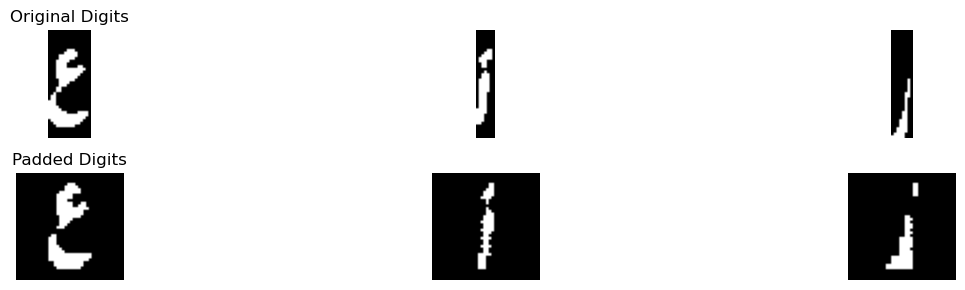

Best match: د
Full comparison results: {'أ': 0.90625, 'ب': 0.034482758620689655, 'ج': 2.884841557395905, 'د': 3.254462217635592, 'ر': 0.6077336331834083, 'س': 0.5223214285714286, 'ص': 0.46369047619047615, 'ط': 1.7161972990777339, 'ع': 3.1233552631578947, 'ف': 2.1030527708159283, 'ق': 1.6297232215844268, 'ك': 1.1647727272727273, 'ل': 1.1280572755417957, 'م': 3.002840909090909, 'ن': 2.655595238095238, 'ه': 1.3643817204301074, 'و': 1.876917989417989, 'ي': 1.1555811036789296}
Confidence :  0.06555347723884863
Best match: أ
Full comparison results: {'أ': 2.9479868250029537, 'ب': 0.1939655172413793, 'ج': 0.5892497699562916, 'د': 0.5554753286216134, 'ر': 0.487410134218605, 'س': 0.2901785714285714, 'ص': 0.8422619047619048, 'ط': 0.5394433465085638, 'ع': 0.15263157894736842, 'ف': 0.5534582985240879, 'ق': 0.7946693009405232, 'ك': 0.2850378787878788, 'ل': 0.5655572755417957, 'م': 0.13636363636363635, 'ن': 0.674345238095238, 'ه': 0.4124327956989247, 'و': 0.7501322751322751, 'ي': 0.7058608058608059}

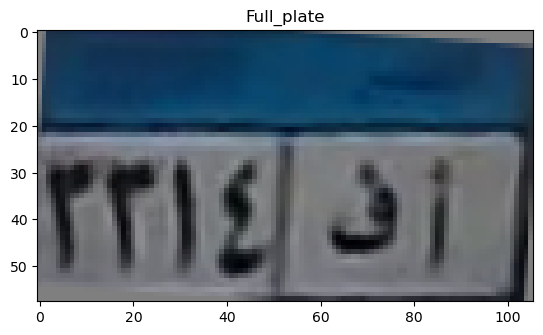

top
[0.48447752 0.51890868 0.55716101 0.54832803 0.55442462 0.56158968
 0.56306908 0.56764633 0.57247152 0.5832663  0.60051912 0.5969188
 0.58933761 0.58605726 0.58283802 0.57790942 0.57014797 0.56891576
 0.57262446 0.56976794 0.56760244 0.57055373 0.57131752 0.56782973
 0.58389692 0.60059915 0.5953117  0.58956283 0.58287085 0.58235666
 0.5908923  0.58889576 0.57986707 0.5813673  0.58871122 0.5991286
 0.60233291 0.60067456 0.60102452 0.60484078 0.59708095 0.58171494
 0.57179507 0.55880796 0.5452602  0.53698571 0.53763305 0.53906809
 0.54513349 0.54811245 0.51379393 0.45328563 0.41038792]
[0.49914471 0.53446448 0.54388586 0.50940602 0.5221235  0.52600038
 0.51811437 0.51340294 0.51236975 0.51016201 0.51544608 0.52761826
 0.53100371 0.53349725 0.53878643 0.5434741  0.54628769 0.54548285
 0.54280129 0.54470172 0.55014155 0.54867308 0.54558525 0.55050898
 0.56304883 0.57465599 0.58300871 0.58694696 0.58933289 0.58368012
 0.57117037 0.56361807 0.56863504 0.57203202 0.5761052  0.58511118
 0.

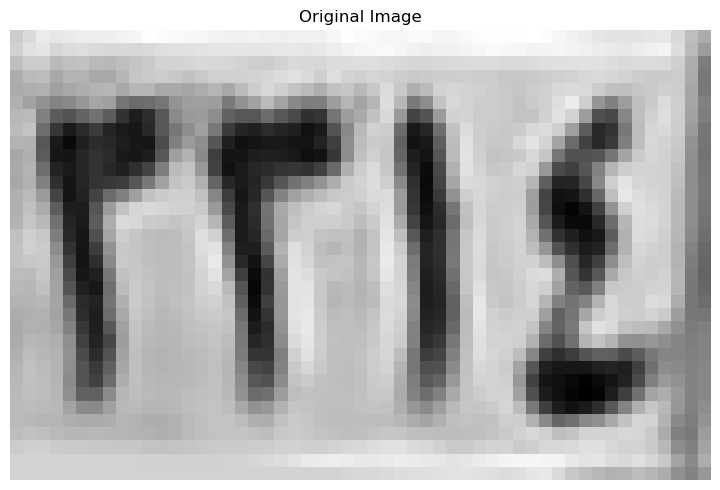

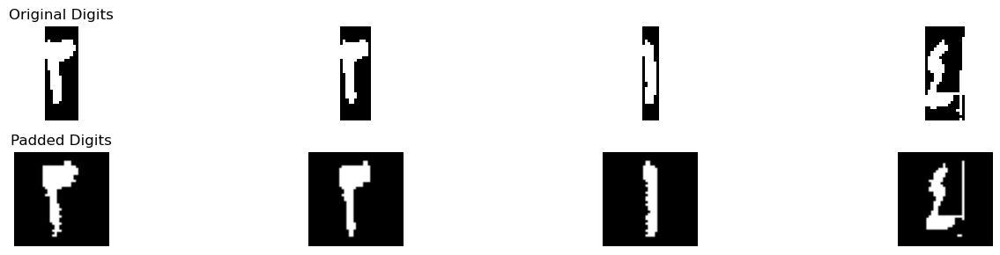

Best match: ٣
Full comparison results: {'١': 0.7333333333333333, '٢': 3.2624999999999997, '٣': 5.089106037151703, '٤': 2.185416666666667, '٥': 3.0533733230134152, '٦': 1.66875, '٧': 1.9786764705882354, '٨': 1.0034722222222223, '٩': 1.760049019607843}
Confidence :  0.9133030185758517
Best match: ٣
Full comparison results: {'١': 0.5384615384615385, '٢': 4.194711538461538, '٣': 5.368711300309598, '٤': 2.4490613553113554, '٥': 2.104811661506708, '٦': 1.7285714285714284, '٧': 1.7397058823529412, '٨': 0.9659722222222221, '٩': 1.7733942936148819}
Confidence :  0.5869998809240298
Best match: ١
Full comparison results: {'١': 5.454166666666667, '٢': 2.3680069930069934, '٣': 0.8240131578947368, '٤': 1.4880723443223443, '٥': 1.2787667698658411, '٦': 0.7458333333333332, '٧': 1.1691176470588236, '٨': 1.7527777777777778, '٩': 1.1996449220713925}
Confidence :  1.5430798368298366
Best match: ٤
Full comparison results: {'١': 0.90625, '٢': 1.875, '٣': 1.4708784829721362, '٤': 3.28125, '٥': 2.629109538552

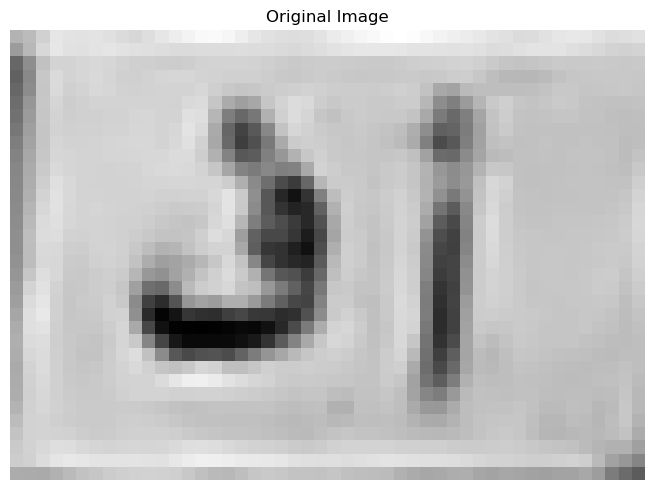

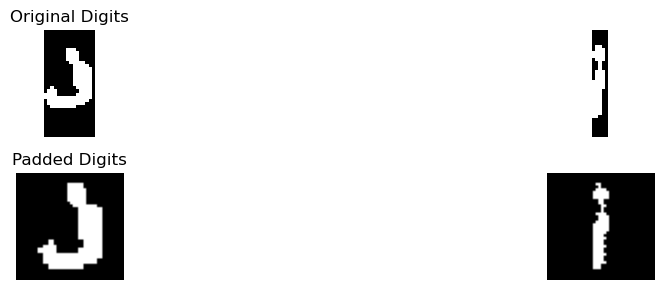

Best match: ف
Full comparison results: {'أ': 0.07291666666666666, 'ب': 0.06896551724137931, 'ج': 1.962962962962963, 'د': 4.50962962962963, 'ر': 2.632945402298851, 'س': 1.59375, 'ص': 1.1624999999999999, 'ط': 2.5625, 'ع': 1.395833333333333, 'ف': 4.994212962962963, 'ق': 3.782407407407407, 'ك': 2.427083333333333, 'ل': 2.2604166666666665, 'م': 1.21875, 'ن': 3.254583333333333, 'ه': 3.5443548387096775, 'و': 3.5868055555555554, 'ي': 2.7384615384615385}
Confidence :  0.24229166666666657
Best match: أ
Full comparison results: {'أ': 2.5269001831501834, 'ب': 0.37823275862068967, 'ج': 0.6024844720496894, 'د': 1.0219829356516663, 'ر': 0.03125, 'س': 0.0625, 'ص': 0.6029761904761904, 'ط': 0.8584074440052701, 'ع': 0.09375, 'ف': 0.5391865079365079, 'ق': 0.21275062656641602, 'ك': 0.07670454545454546, 'ل': 0.0, 'م': 0.29545454545454547, 'ن': 0.3125, 'ه': 0.7311155913978494, 'و': 0.6741071428571428, 'ي': 0.5157432844932844}
Confidence :  0.7524586237492585
[['٣', '٣', '١', '٤'], ['ف', 'أ']]
Tilt angle: -3.0

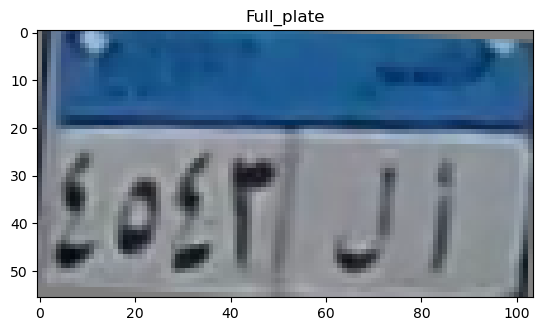

top
[0.21286706 0.38480314 0.55030559 0.51635951 0.56377745 0.621005
 0.64422059 0.67162824 0.68352402 0.67360039 0.65730137 0.64470946
 0.63632686 0.63174549 0.64918049 0.66312958 0.66619486 0.66998759
 0.66223956 0.65356539 0.65613221 0.66121071 0.66184135 0.67147998
 0.67861835 0.68117097 0.67900621 0.68018074 0.68184965 0.68078498
 0.67933388 0.68117634 0.67648326 0.67319431 0.66675438 0.66848732
 0.66734276 0.66833401 0.66535224 0.66628362 0.66739422 0.66928607
 0.66208188 0.66783757 0.67186395 0.67416064 0.67837157 0.67960116
 0.68386772 0.69066098 0.68059051 0.65375228]
[0.2005464  0.41200934 0.55300822 0.52454326 0.56619819 0.59883797
 0.62251113 0.63430461 0.63860177 0.63211951 0.62304391 0.62000762
 0.61859172 0.6158807  0.6127746  0.61474246 0.61472592 0.61675698
 0.60965189 0.60103211 0.59871134 0.5962527  0.59807316 0.6039222
 0.61148838 0.61064183 0.60727801 0.60497141 0.6097355  0.62286586
 0.62970165 0.63547657 0.64167556 0.64107412 0.62766154 0.61112325
 0.60852422 0.6

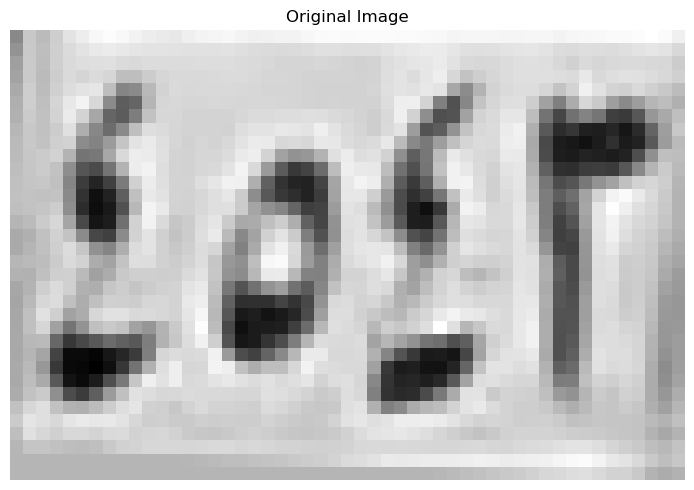

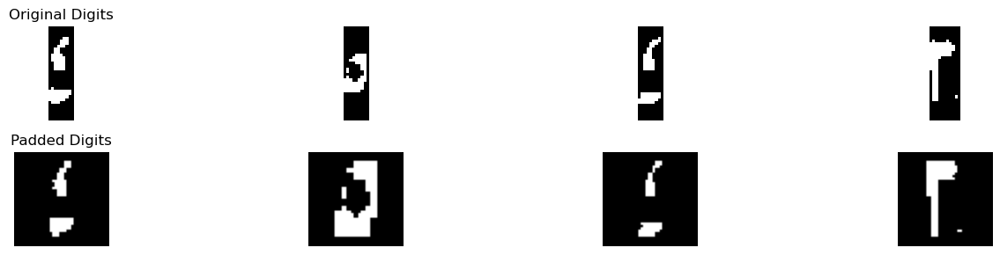

Best match: ١
Full comparison results: {'١': 2.8937500000000003, '٢': 0.7331002331002331, '٣': 0.7713815789473684, '٤': 2.6684324412146996, '٥': 1.6660677428866282, '٦': 0.07142857142857142, '٧': 0.0625, '٨': 1.9201388888888888, '٩': 0.9633949423441833}
Confidence :  0.11265877939265034
Best match: ٥
Full comparison results: {'١': 0.4444444444444444, '٢': 1.46875, '٣': 0.9217836257309941, '٤': 2.291666666666667, '٥': 6.421966374269006, '٦': 1.7444444444444445, '٧': 0.9722222222222221, '٨': 1.0680555555555555, '٩': 0.53125}
Confidence :  2.0651498538011697
Best match: ٤
Full comparison results: {'١': 2.375, '٢': 0.6421911421911423, '٣': 0.25, '٤': 2.626330792863051, '٥': 1.044343395252838, '٦': 0.0, '٧': 0.03125, '٨': 1.338888888888889, '٩': 0.910573172610649}
Confidence :  0.12566539643152552
Best match: ٣
Full comparison results: {'١': 0.7333333333333334, '٢': 1.98125, '٣': 2.818111455108359, '٤': 1.2104166666666667, '٥': 1.722127008698216, '٦': 2.3666666666666663, '٧': 0.915441176470

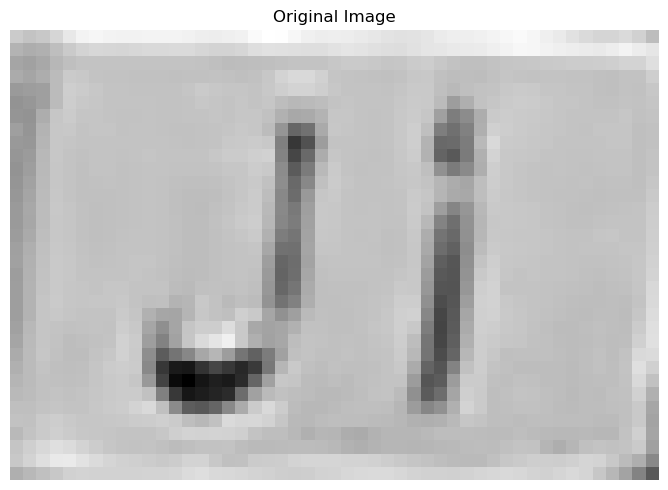

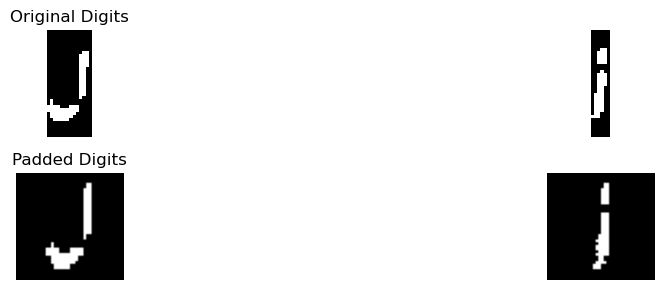

Best match: ل
Full comparison results: {'أ': 0.1488970588235294, 'ب': 0.19598164627363737, 'ج': 0.21718409586056645, 'د': 1.8034063579299773, 'ر': 3.0370987247972656, 'س': 1.2410714285714286, 'ص': 1.1937499999999999, 'ط': 0.9150609354413701, 'ع': 0.82296826625387, 'ف': 1.5706366610971874, 'ق': 2.282072115773304, 'ك': 0.5113636363636364, 'ل': 5.169318635773494, 'م': 0.2540106951871658, 'ن': 3.319765406162465, 'ه': 0.7280241935483871, 'و': 1.9938044662309367, 'ي': 2.170217855815682}
Confidence :  0.9247766148055145
Best match: أ
Full comparison results: {'أ': 2.516535212099728, 'ب': 0.38146551724137934, 'ج': 0.5915789625028756, 'د': 0.4527702202624803, 'ر': 0.4868407760405512, 'س': 0.19642857142857142, 'ص': 0.15833333333333333, 'ط': 0.21574440052700922, 'ع': 0.0, 'ف': 0.44598475355054296, 'ق': 0.26639027002991345, 'ك': 0.0, 'ل': 0.058823529411764705, 'م': 0.0, 'ن': 0.10250000000000001, 'ه': 0.6030241935483871, 'و': 0.50489417989418, 'ي': 0.36395757020757014}
Confidence :  0.9567555092756

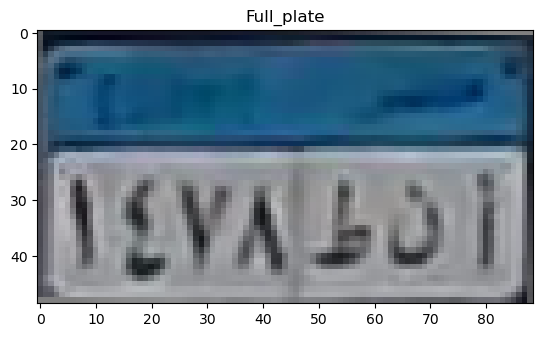

top
[0.32275027 0.36224093 0.29652335 0.27861429 0.27341335 0.2673717
 0.25898417 0.25296723 0.26065642 0.25973282 0.25678093 0.25737245
 0.26048598 0.2678898  0.2788135  0.28389294 0.29027083 0.29602265
 0.29151358 0.28015733 0.29051809 0.29693517 0.29943211 0.29578627
 0.29705235 0.29383686 0.29027988 0.28996431 0.28673287 0.28029478
 0.27944    0.28395287 0.28177309 0.28222762 0.28419912 0.2822902
 0.2853386  0.28253529 0.27306838 0.26231471 0.26013412 0.25988169
 0.26044848 0.26311392]
[0.31587683 0.35978917 0.22298518 0.15515816 0.18565225 0.12835846
 0.12596374 0.13762214 0.14559356 0.14897344 0.14654747 0.15236167
 0.15762672 0.17019728 0.1809723  0.19511314 0.20503522 0.20192009
 0.19776896 0.19834358 0.20114544 0.20565077 0.21207132 0.21292917
 0.21826028 0.21798951 0.21732814 0.21542692 0.21184921 0.21082335
 0.21132901 0.2140873  0.2097169  0.2101204  0.20919867 0.20567755
 0.20065826 0.1945623  0.1852955  0.17330963 0.17379548 0.17820142
 0.1772802  0.17233784]
[0.31299381 

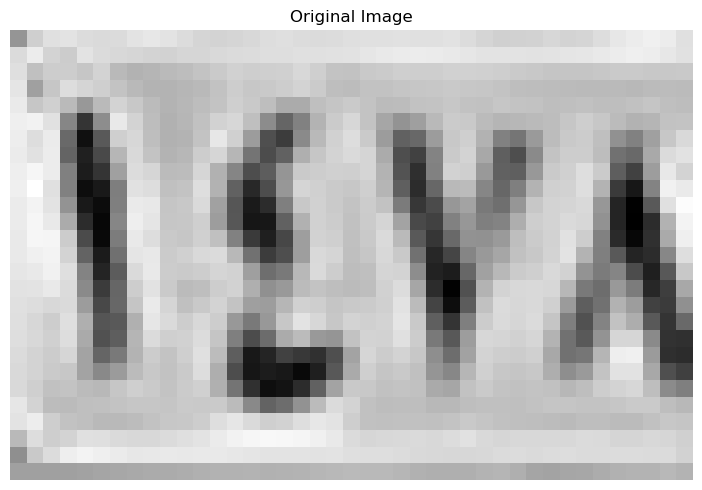

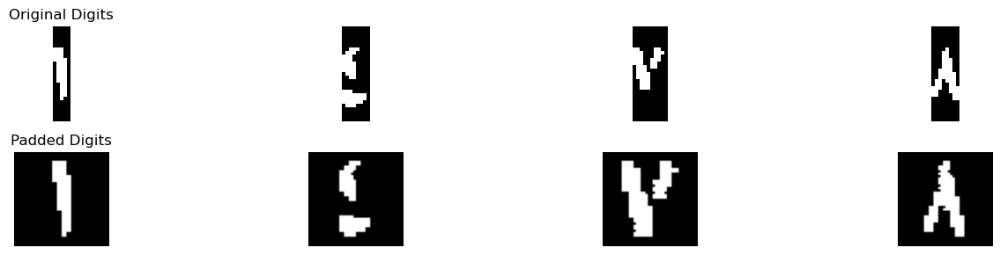

Best match: ١
Full comparison results: {'١': 6.58125, '٢': 2.312354312354312, '٣': 0.9078947368421053, '٤': 1.6220009157509159, '٥': 1.6438983488132093, '٦': 1.7202380952380953, '٧': 1.1966911764705883, '٨': 2.3076388888888886, '٩': 2.6886626445449973}
Confidence :  1.9462936777275013
Best match: ٤
Full comparison results: {'١': 0.6778846153846154, '٢': 2.300480769230769, '٣': 1.8208204334365325, '٤': 5.337510339123242, '٥': 3.0042615730502726, '٦': 0.0, '٧': 0.8529411764705883, '٨': 0.36180555555555555, '٩': 1.3214499302616}
Confidence :  1.1666243830364849
Best match: ٥
Full comparison results: {'١': 0.0, '٢': 0.625, '٣': 0.41666666666666663, '٤': 1.46875, '٥': 2.3125, '٦': 0.5625, '٧': 2.0625, '٨': 0.5520833333333334, '٩': 0.40625}
Confidence :  0.125
Best match: ٨
Full comparison results: {'١': 2.9761029411764706, '٢': 0.917279411764706, '٣': 0.758513931888545, '٤': 1.4209558823529413, '٥': 1.7205836281881173, '٦': 1.1849264705882354, '٧': 0.7268382352941177, '٨': 6.892075163398694

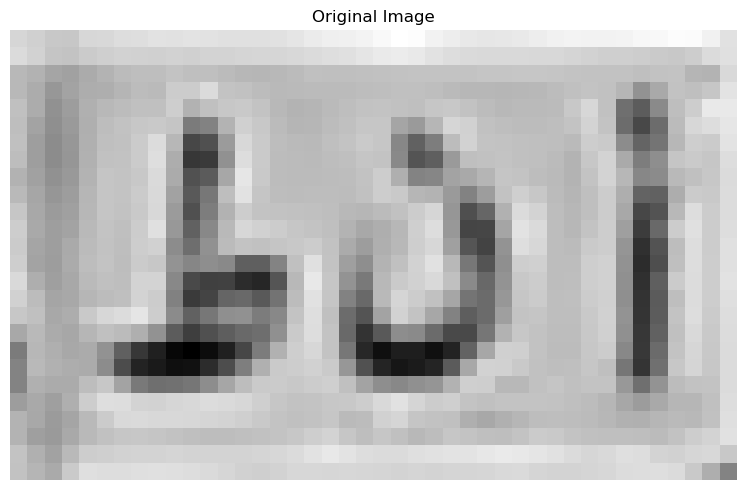

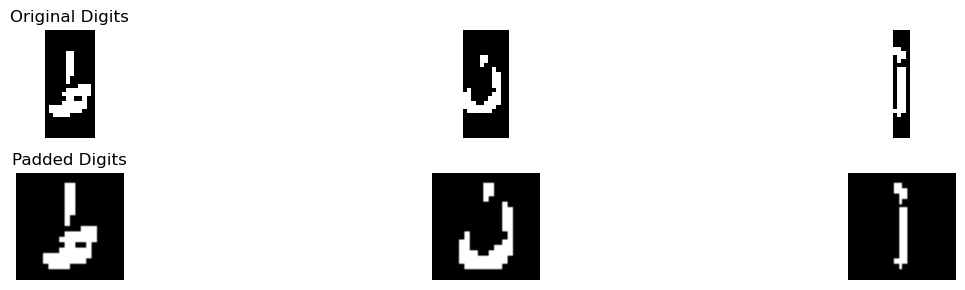

Best match: ط
Full comparison results: {'أ': 1.025, 'ب': 0.3718501326259947, 'ج': 1.3474177593742813, 'د': 3.1912710437710436, 'ر': 2.724989112586564, 'س': 1.5044642857142856, 'ص': 1.1470238095238094, 'ط': 6.000823451910408, 'ع': 0.7875000000000001, 'ف': 3.118849206349206, 'ق': 2.3479166666666664, 'ك': 1.575757575757576, 'ل': 2.3874999999999997, 'م': 0.6818181818181818, 'ن': 2.7509523809523806, 'ه': 1.2434139784946237, 'و': 2.512863756613757, 'ي': 2.922972408026756}
Confidence :  1.4047762040696823
Best match: ن
Full comparison results: {'أ': 0.2375, 'ب': 0.18037135278514588, 'ج': 1.9922374626178974, 'د': 4.264078282828283, 'ر': 2.6349262868565715, 'س': 1.0580357142857144, 'ص': 0.8458333333333332, 'ط': 2.4892127799736494, 'ع': 1.7125, 'ف': 3.000396825396826, 'ق': 3.1654100529100533, 'ك': 2.263257575757576, 'ل': 2.43125, 'م': 0.7068181818181819, 'ن': 4.826666666666666, 'ه': 1.1122983870967742, 'و': 2.5617724867724867, 'ي': 1.8710632664437012}
Confidence :  0.2812941919191916
Best match:

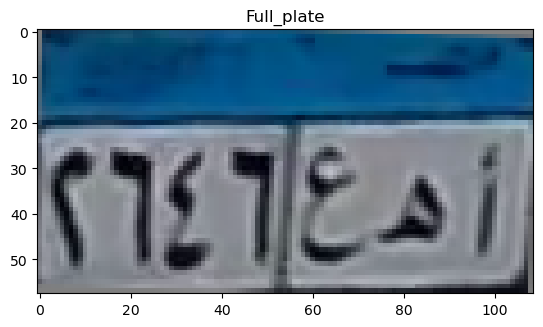

top
[0.4140739  0.54816837 0.63077627 0.63190694 0.6252057  0.62328475
 0.62496271 0.62588722 0.62754672 0.63368654 0.63285704 0.62922412
 0.6227651  0.61474385 0.60672693 0.60324799 0.61067808 0.62640187
 0.63932004 0.65390179 0.65884983 0.65843525 0.65302799 0.64921387
 0.6488158  0.6509492  0.6494704  0.64809233 0.63118684 0.62665279
 0.6259682  0.62278066 0.61272388 0.59836147 0.61169801 0.62224822
 0.63071186 0.63081263 0.6175299  0.59088222 0.59283544 0.58073493
 0.55063373 0.53784147 0.54714754 0.55207248 0.54869472 0.54311108
 0.53614754 0.51956876 0.50314199 0.4972355  0.49997233 0.52905895]
[0.46600415 0.63065302 0.65247404 0.60840413 0.57776115 0.57164314
 0.59034493 0.62567324 0.6507096  0.63478411 0.61815001 0.59865118
 0.57684511 0.56354854 0.56939873 0.57788525 0.58933745 0.59663678
 0.61433592 0.63426928 0.63297328 0.61949317 0.5841799  0.57997877
 0.57240979 0.56624815 0.55473367 0.53940471 0.53818225 0.54600939
 0.55996703 0.57125814 0.58494375 0.57334897 0.56776618 0

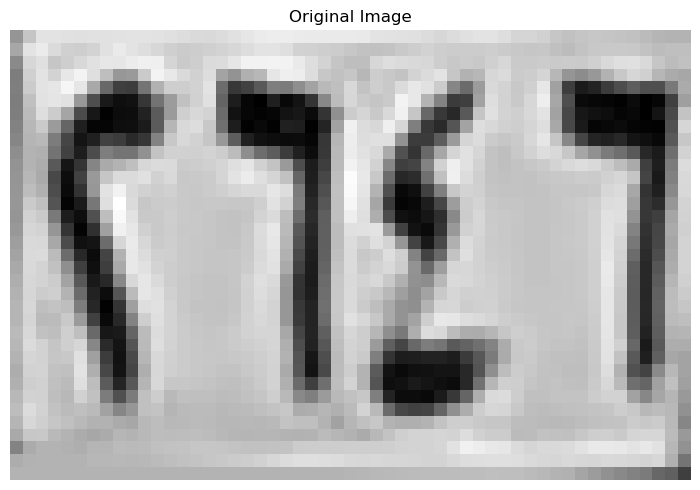

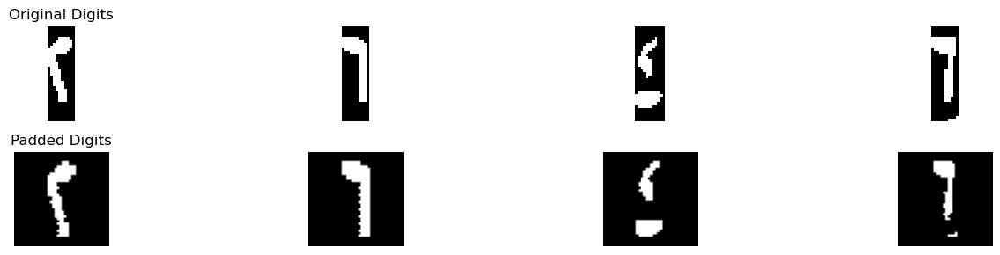

Best match: ٢
Full comparison results: {'١': 0.0625, '٢': 7.205128205128206, '٣': 4.899477554179566, '٤': 3.3121336996336996, '٥': 2.3442429603420316, '٦': 0.5955357142857143, '٧': 1.919485294117647, '٨': 0.6298611111111111, '٩': 1.2586726998491704}
Confidence :  1.15282532547432
Best match: ٦
Full comparison results: {'١': 2.1875, '٢': 1.237179487179487, '٣': 1.3056308049535603, '٤': 0.13392857142857142, '٥': 2.9282166814094057, '٦': 6.3654761904761905, '٧': 0.2389705882352941, '٨': 0.7708333333333334, '٩': 2.8515742835595774}
Confidence :  1.7186297545333924
Best match: ٤
Full comparison results: {'١': 1.9005681818181819, '٢': 1.0815850815850816, '٣': 1.4140866873065017, '٤': 4.984071103627555, '٥': 2.816761573050273, '٦': 0.0, '٧': 0.14375, '٨': 1.7784722222222222, '٩': 0.8394030068603123}
Confidence :  1.0836547652886408
Best match: ١
Full comparison results: {'١': 3.6, '٢': 2.0948426573426575, '٣': 0.7603521671826625, '٤': 0.22767857142857142, '٥': 1.4491053000147427, '٦': 2.08839

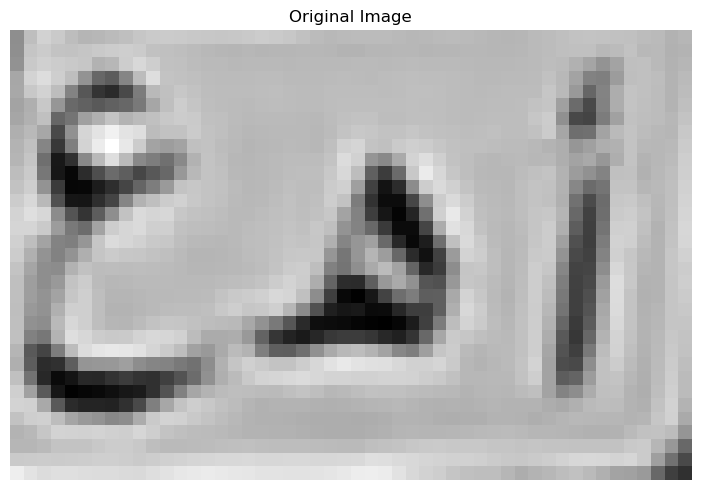

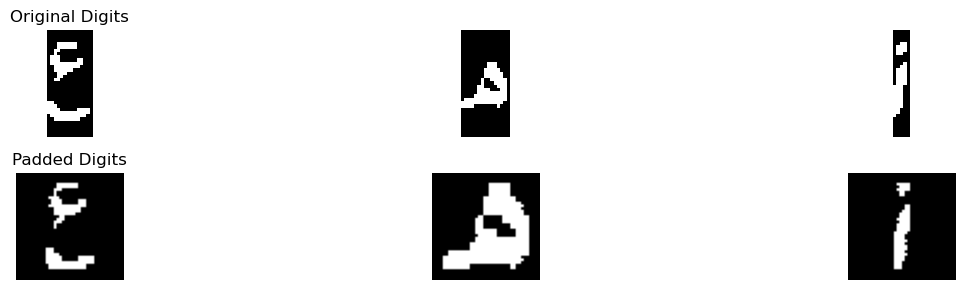

Best match: ع
Full comparison results: {'أ': 0.0, 'ب': 0.07692307692307693, 'ج': 1.314606337704164, 'د': 1.4631525784157362, 'ر': 0.46092203898050976, 'س': 0.4419642857142857, 'ص': 0.3678571428571429, 'ط': 0.7488059947299077, 'ع': 4.914744050987684, 'ف': 0.7365622277018712, 'ق': 0.8702159724392029, 'ك': 1.7007575757575757, 'ل': 0.7274780701754385, 'م': 1.8686868686868685, 'ن': 1.0745833333333334, 'ه': 0.5134408602150538, 'و': 0.6340277777777777, 'ي': 0.5609415644741732}
Confidence :  1.5230285911504078
Best match: ه
Full comparison results: {'أ': 0.46875, 'ب': 0.125, 'ج': 0.75, 'د': 2.5625, 'ر': 1.375, 'س': 2.28125, 'ص': 1.4375, 'ط': 1.40625, 'ع': 0.15625, 'ف': 2.3125, 'ق': 0.8125, 'ك': 1.40625, 'ل': 0.78125, 'م': 0.34375, 'ن': 0.75, 'ه': 5.40625, 'و': 1.53125, 'ي': 1.34375}
Confidence :  1.421875
Best match: أ
Full comparison results: {'أ': 2.3172227637953444, 'ب': 0.32219827586206895, 'ج': 0.39233954451345754, 'د': 0.46028570013864134, 'ر': 0.07886904761904762, 'س': 0.258928571428571

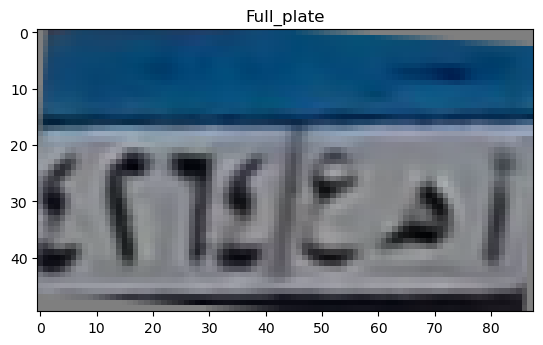

top
[0.54607749 0.55558    0.56703354 0.58647451 0.58714099 0.57088349
 0.55597354 0.55027165 0.53717351 0.51596429 0.50299641 0.50235434
 0.51336153 0.54700912 0.59490942 0.63268488 0.6391394  0.63948788
 0.63966663 0.63589069 0.62753043 0.6053396  0.59740947 0.60271058
 0.59788381 0.58991847 0.58607725 0.58259399 0.59137486 0.60045471
 0.57144419 0.52795618 0.52137443 0.52758766 0.52664309 0.5279313
 0.53812006 0.54983713 0.54676035 0.5345567  0.52570621 0.52330769
 0.52893369 0.51215833]
[0.5665229  0.56166973 0.57936849 0.61644411 0.6051253  0.54087826
 0.51222468 0.54018143 0.54863819 0.5265661  0.52366066 0.53769179
 0.57141572 0.61774323 0.60240707 0.51579412 0.43273095 0.41594251
 0.47514693 0.54234188 0.57658953 0.57110402 0.55974405 0.53670939
 0.50068839 0.48939821 0.5108454  0.54644703 0.56581576 0.55589944
 0.52218686 0.51272657 0.52656361 0.52836654 0.52570627 0.5309795
 0.5462116  0.55602225 0.53270213 0.50845316 0.51162515 0.51062694
 0.50152625 0.48602612]
[0.58526917 

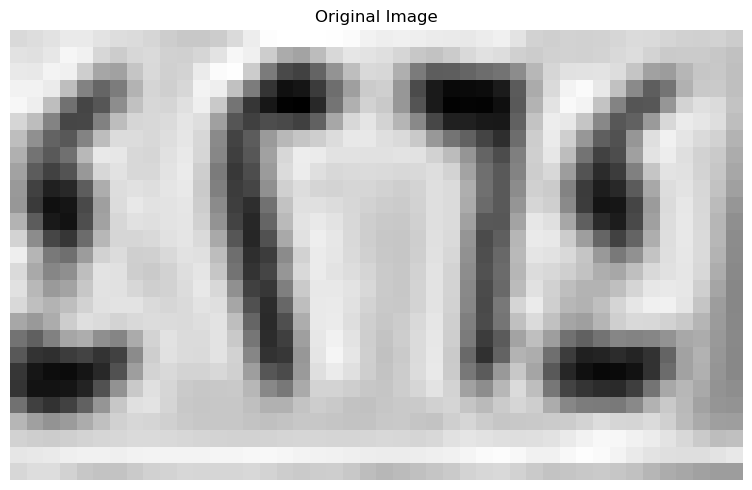

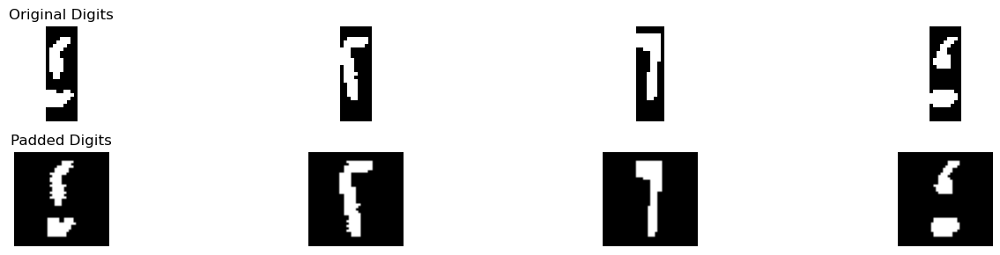

Best match: ٤
Full comparison results: {'١': 1.7395833333333333, '٢': 2.5088141025641026, '٣': 2.0218653250773992, '٤': 5.130755199101973, '٥': 3.2286598850066337, '٦': 0.14285714285714285, '٧': 0.49522058823529413, '٨': 1.4854166666666666, '٩': 1.2959244595274009}
Confidence :  0.9510476570476696
Best match: ٢
Full comparison results: {'١': 0.07142857142857142, '٢': 5.745535714285714, '٣': 3.844814241486068, '٤': 3.975297619047619, '٥': 1.89672250479139, '٦': 0.9883928571428571, '٧': 2.4658088235294118, '٨': 0.39375, '٩': 0.9344070961718021}
Confidence :  0.8851190476190478
Best match: ٢
Full comparison results: {'١': 3.0511363636363638, '٢': 3.278263403263403, '٣': 2.0905572755417956, '٤': 0.6168040293040293, '٥': 2.416067742886628, '٦': 2.997916666666667, '٧': 1.7632352941176472, '٨': 0.4361111111111111, '٩': 1.8900515334338863}
Confidence :  0.11356351981351964
Best match: ٤
Full comparison results: {'١': 2.875, '٢': 1.044871794871795, '٣': 0.9025735294117647, '٤': 3.58713739217771

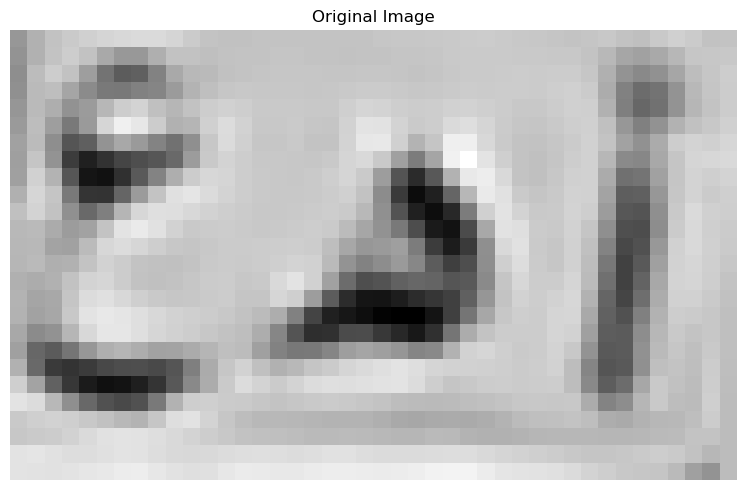

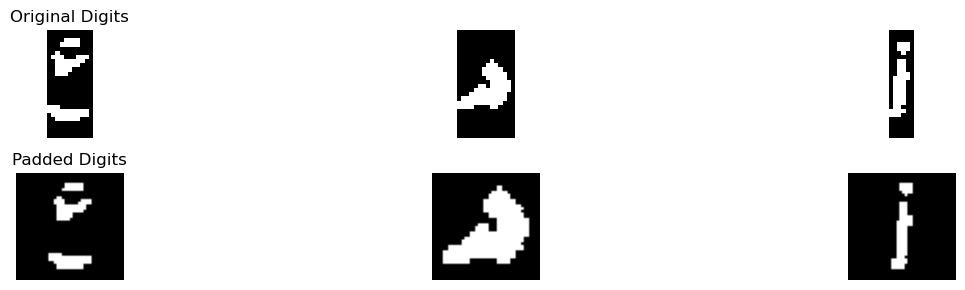

Best match: ع
Full comparison results: {'أ': 0.03125, 'ب': 0.10096153846153846, 'ج': 2.275103519668737, 'د': 2.891164725280353, 'ر': 0.9011824841547481, 'س': 0.32589285714285715, 'ص': 0.30178571428571427, 'ط': 1.3221659972799524, 'ع': 3.9170769666100735, 'ف': 1.3314727230262036, 'ق': 1.2579817374978666, 'ك': 2.0520833333333335, 'ل': 1.3783668730650156, 'م': 1.9289772727272727, 'ن': 1.9945833333333334, 'ه': 0.5092741935483871, 'و': 1.3679985404123336, 'ي': 1.0162253808992938}
Confidence :  0.5129561206648603
Best match: ه
Full comparison results: {'أ': 0.4375, 'ب': 0.4375, 'ج': 0.46875, 'د': 2.3125, 'ر': 1.0, 'س': 2.5724137931034483, 'ص': 1.7629310344827585, 'ط': 0.5, 'ع': 0.25, 'ف': 2.375, 'ق': 0.75, 'ك': 0.78125, 'ل': 0.625, 'م': 0.4375, 'ن': 0.9375, 'ه': 6.2298850574712645, 'و': 1.53125, 'ي': 1.1875}
Confidence :  1.828735632183908
Best match: أ
Full comparison results: {'أ': 2.3413461538461537, 'ب': 0.41594827586206895, 'ج': 0.3316511387163561, 'د': 0.36285216718266255, 'ر': 0.54991

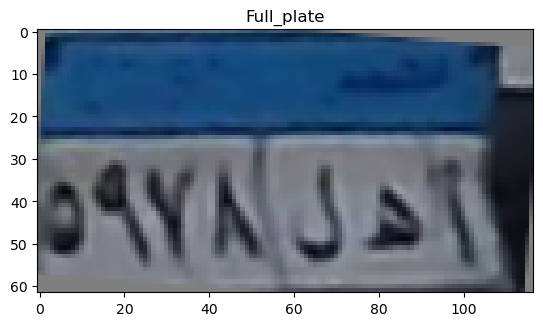

top
[0.33618217 0.18204578 0.13839965 0.14107548 0.15501652 0.15662515
 0.14304649 0.13016942 0.12977405 0.14433786 0.15299748 0.15185183
 0.14885639 0.16401277 0.18318282 0.18398232 0.17216314 0.16976243
 0.16236818 0.14991936 0.12831485 0.12290784 0.12203168 0.12871951
 0.1470504  0.14997473 0.14194374 0.14422849 0.14823821 0.14366856
 0.1249693  0.11300393 0.12463671 0.14316313 0.16715537 0.18130547
 0.17720877 0.18848803 0.21997224 0.21972471 0.21948163 0.20487517
 0.18622094 0.17167634 0.16975355 0.16200349 0.16863969 0.1749888
 0.17880682 0.17522019 0.17204159 0.17747451 0.18266559 0.17455223
 0.18294937 0.19676999 0.20738713 0.20491242]
[0.3614763  0.25519583 0.23233043 0.25776032 0.27395123 0.27959265
 0.26356448 0.26437887 0.28626956 0.31203143 0.31626822 0.30991272
 0.27586263 0.28999863 0.31507605 0.32163749 0.31234448 0.31412706
 0.30592538 0.30304864 0.28758517 0.28577319 0.29373397 0.29654629
 0.29622988 0.29041751 0.29634521 0.30101909 0.31511401 0.30717725
 0.30231898 0

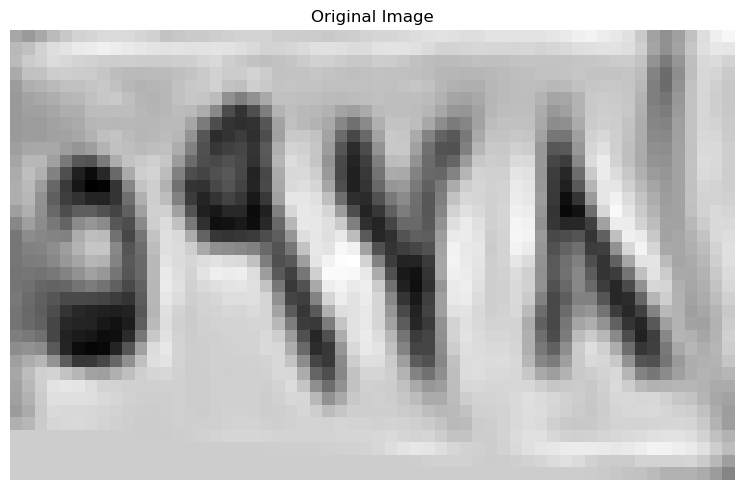

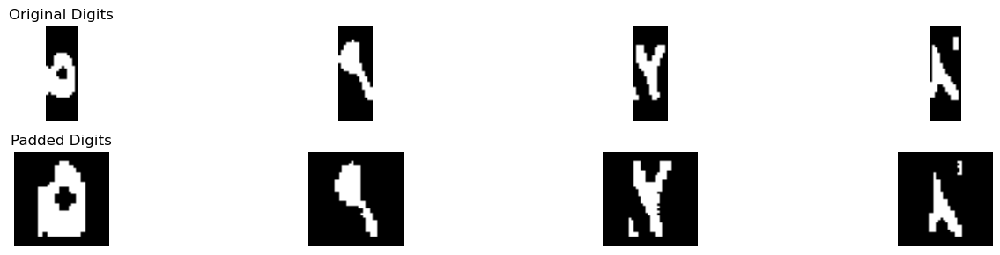

Best match: ٥
Full comparison results: {'١': 0.7499999999999999, '٢': 1.6437499999999998, '٣': 1.15, '٤': 1.80625, '٥': 6.562797619047619, '٦': 1.4124999999999999, '٧': 1.0, '٨': 1.13125, '٩': 0.79375}
Confidence :  2.37827380952381
Best match: ٩
Full comparison results: {'١': 1.8819444444444442, '٢': 2.0243055555555554, '٣': 1.9274488304093564, '٤': 2.295138888888889, '٥': 0.8908469089390142, '٦': 0.8986111111111111, '٧': 1.2048611111111112, '٨': 3.448611111111111, '٩': 5.114583333333334}
Confidence :  0.8329861111111114
Best match: ٧
Full comparison results: {'١': 1.5277777777777777, '٢': 2.618055555555556, '٣': 2.8307748538011697, '٤': 1.3854166666666665, '٥': 1.4340538847117794, '٦': 1.28125, '٧': 3.0326388888888887, '٨': 2.1131944444444444, '٩': 2.163194444444444}
Confidence :  0.1009320175438595
Best match: ٢
Full comparison results: {'١': 0.2857142857142857, '٢': 3.6741071428571432, '٣': 1.687983746130031, '٤': 1.6375, '٥': 0.5397224679345423, '٦': 0.13392857142857142, '٧': 2.16

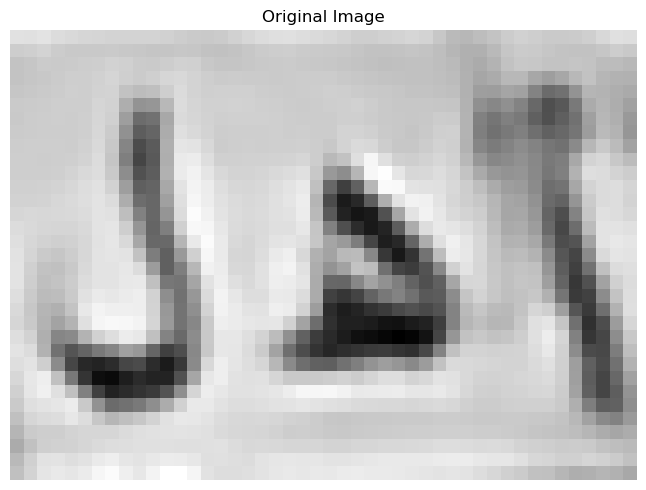

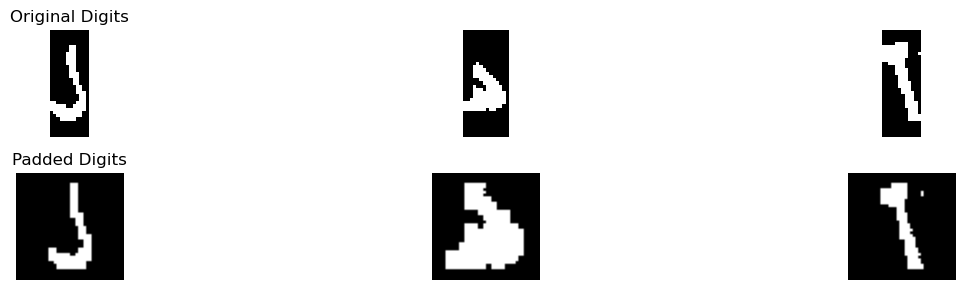

Best match: ن
Full comparison results: {'أ': 0.125, 'ب': 0.21162135278514588, 'ج': 1.8470281228433403, 'د': 2.9109388518831243, 'ر': 1.9256524416363248, 'س': 1.3125, 'ص': 0.8145833333333332, 'ط': 2.02346837944664, 'ع': 1.6194078947368422, 'ف': 2.806356168198273, 'ق': 2.571614800891117, 'ك': 0.8759469696969697, 'ل': 2.9700077399380804, 'م': 0.7301136363636364, 'ن': 3.1150595238095233, 'ه': 0.9570564516129032, 'و': 2.2729828042328037, 'ي': 2.7780030657748047}
Confidence :  0.07252589193572145
Best match: ه
Full comparison results: {'أ': 0.5765086206896551, 'ب': 0.728448275862069, 'ج': 1.6821120689655173, 'د': 2.380387931034483, 'ر': 0.5948275862068966, 'س': 1.1163793103448276, 'ص': 1.064080459770115, 'ط': 1.3997844827586208, 'ع': 0.49461206896551724, 'ف': 2.956896551724138, 'ق': 1.1497844827586208, 'ك': 1.2898706896551724, 'ل': 0.3448275862068966, 'م': 0.8383620689655173, 'ن': 0.8114224137931035, 'ه': 4.3125, 'و': 1.8976293103448278, 'ي': 1.451867816091954}
Confidence :  0.67780172413793

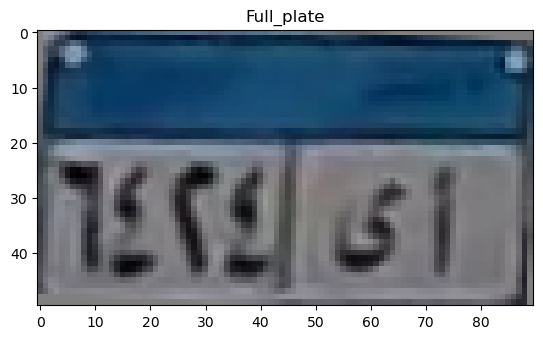

top
[0.32888344 0.3191155  0.31397637 0.35848139 0.42588579 0.46039059
 0.49050668 0.52604928 0.51946093 0.52252083 0.51462025 0.49637055
 0.48929985 0.47553362 0.46124096 0.44484237 0.43303553 0.44594791
 0.44463798 0.44299368 0.4193329  0.38991348 0.38430686 0.37431253
 0.38040551 0.39685021 0.39610745 0.40029836 0.41415852 0.41084649
 0.40048403 0.40019814 0.39460488 0.38508868 0.36617616 0.36143805
 0.37606357 0.37080071 0.36030917 0.35141614 0.32961793 0.31511631
 0.33587686 0.35447088 0.30849118]
[0.31290456 0.32617199 0.41479613 0.5269675  0.59841385 0.60009544
 0.60958738 0.62152059 0.60611344 0.59315728 0.58680941 0.57740236
 0.57439842 0.57724524 0.58242331 0.59138044 0.59187999 0.59367196
 0.59929805 0.60114151 0.5978663  0.59498519 0.5994227  0.60932894
 0.61711444 0.61760209 0.61620549 0.60244936 0.59273735 0.58508278
 0.580417   0.57973824 0.57702044 0.56933049 0.5620618  0.55745712
 0.55179656 0.54870975 0.55249225 0.55681517 0.54879127 0.53120794
 0.52592952 0.52021047 

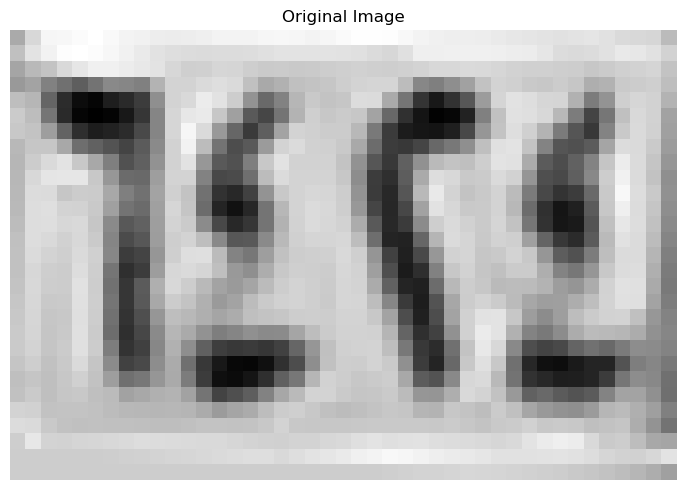

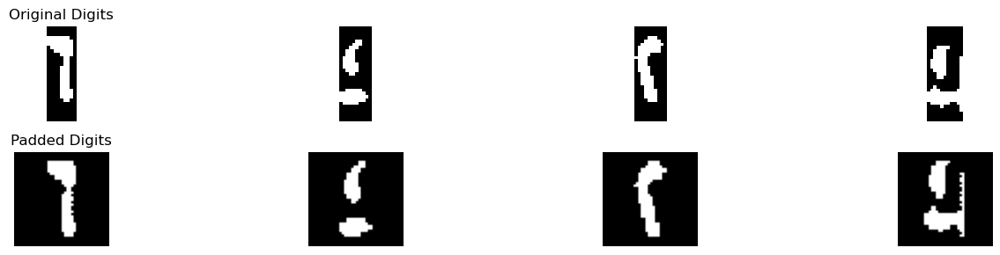

Best match: ٦
Full comparison results: {'١': 3.1562500000000004, '٢': 2.0761217948717947, '٣': 1.0238970588235294, '٤': 0.19642857142857142, '٥': 2.2832310555801265, '٦': 4.796428571428571, '٧': 0.7356617647058824, '٨': 0.6409722222222222, '٩': 1.8279600301659125}
Confidence :  0.8200892857142852
Best match: ٤
Full comparison results: {'١': 2.236607142857143, '٢': 1.5223214285714284, '٣': 1.8067917956656347, '٤': 5.329723502304148, '٥': 2.6753925254312256, '٦': 0.14285714285714285, '٧': 0.4051470588235294, '٨': 2.1972222222222224, '٩': 1.2046276844070962}
Confidence :  1.3271654884364612
Best match: ٢
Full comparison results: {'١': 0.6160714285714285, '٢': 6.138392857142858, '٣': 4.211493808049536, '٤': 2.744047619047619, '٥': 2.7710222246793452, '٦': 0.8169642857142857, '٧': 2.2356617647058825, '٨': 0.8486111111111111, '٩': 0.7210259103641457}
Confidence :  0.963449524546661
Best match: ٥
Full comparison results: {'١': 0.8308823529411765, '٢': 1.4779411764705883, '٣': 1.61309984520123

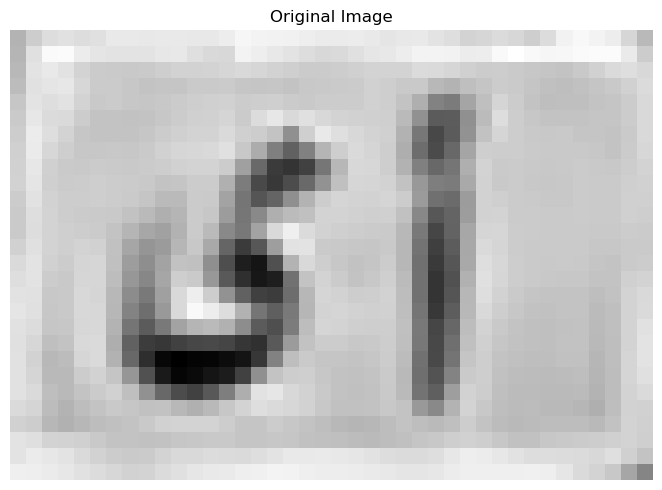

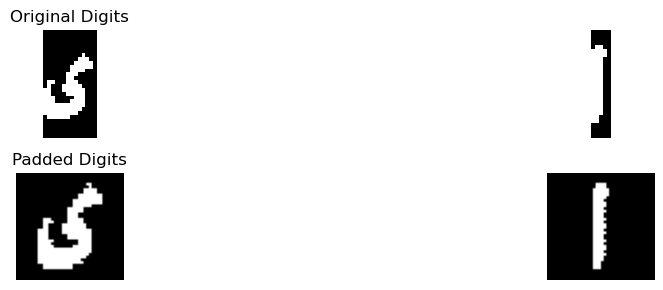

Best match: د
Full comparison results: {'أ': 0.6458333333333334, 'ب': 0.7349137931034483, 'ج': 1.7430555555555554, 'د': 3.3924537037037035, 'ر': 1.9353304597701149, 'س': 2.290178571428571, 'ص': 2.0354166666666664, 'ط': 2.09375, 'ع': 0.6458333333333333, 'ف': 2.6532738095238098, 'ق': 1.5289351851851851, 'ك': 2.020833333333333, 'ل': 2.0, 'م': 0.20833333333333331, 'ن': 1.7816666666666667, 'ه': 1.5685483870967742, 'و': 2.7569444444444446, 'ي': 3.0225961538461537}
Confidence :  0.1849287749287749
Best match: أ
Full comparison results: {'أ': 2.4956501831501834, 'ب': 0.09375, 'ج': 0.4983178053830227, 'د': 0.8668681917211329, 'ر': 0.03125, 'س': 0.03125, 'ص': 0.3181547619047619, 'ط': 1.1065958498023714, 'ع': 0.21875, 'ف': 0.41666666666666663, 'ق': 0.11513157894736842, 'ك': 0.09090909090909091, 'ل': 0.0, 'م': 0.8382867132867133, 'ن': 0.5, 'ه': 0.6383736559139785, 'و': 0.7425595238095237, 'ي': 0.31547619047619047}
Confidence :  0.694527166673906
[['٦', '٤', '٢', '٥'], ['د', 'أ']]
Tilt angle: -1.00

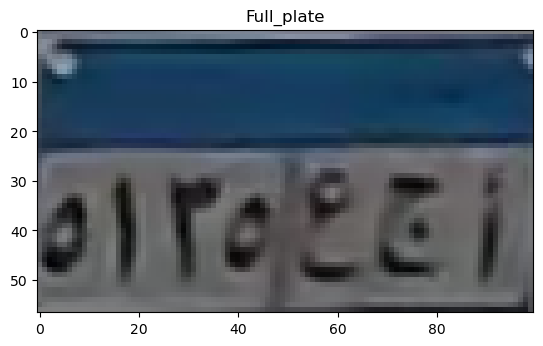

top
[0.21922158 0.18826402 0.18385282 0.18327052 0.17872936 0.17507528
 0.1734035  0.17602001 0.17547893 0.17430664 0.18169643 0.18466825
 0.1901146  0.19096067 0.18721407 0.17231169 0.16898119 0.17274328
 0.17437433 0.17820631 0.17465239 0.17440196 0.17048039 0.16667604
 0.16594075 0.16605797 0.17291538 0.18039087 0.18746275 0.19540624
 0.19584965 0.19495797 0.19337058 0.19441642 0.19716936 0.19901301
 0.19548578 0.19866436 0.19444879 0.18783877 0.16598944 0.15207258
 0.15470147 0.1674457  0.17349301 0.17814988 0.17552377 0.17210842
 0.16778243 0.16052906]
[0.21245931 0.17731579 0.17019216 0.16675167 0.15932    0.1522233
 0.14796059 0.14883835 0.15351589 0.1580502  0.17866525 0.19654974
 0.20271932 0.2025199  0.20375368 0.20750799 0.20619045 0.20249797
 0.20255098 0.19813922 0.19836134 0.19372745 0.19372745 0.18813615
 0.1880902  0.1820087  0.17674675 0.17814841 0.17491618 0.18080689
 0.17858629 0.18488322 0.18342409 0.18930297 0.19238614 0.17469118
 0.16870113 0.15424765 0.14998494 0

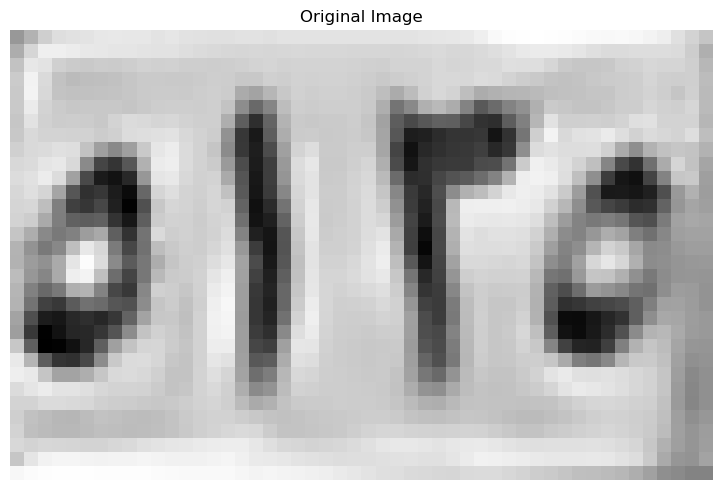

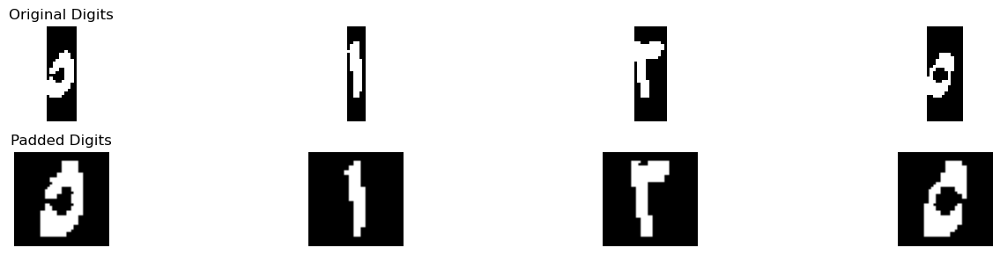

Best match: ٥
Full comparison results: {'١': 0.8888888888888888, '٢': 0.9583333333333333, '٣': 0.8795687134502925, '٤': 2.670138888888889, '٥': 6.624347326649959, '٦': 1.4756944444444446, '٧': 0.5888888888888888, '٨': 1.3916666666666666, '٩': 0.6493055555555556}
Confidence :  1.977104218880535
Best match: ١
Full comparison results: {'١': 5.293055555555555, '٢': 2.5987762237762237, '٣': 0.9276315789473684, '٤': 2.158447802197802, '٥': 0.8665597818074597, '٦': 0.7833333333333332, '٧': 1.555514705882353, '٨': 2.7555555555555555, '٩': 2.4946266968325794}
Confidence :  1.2687499999999998
Best match: ٣
Full comparison results: {'١': 0.0625, '٢': 3.46875, '٣': 5.460429566563468, '٤': 2.65625, '٥': 2.3422112265959014, '٦': 1.60625, '٧': 2.302573529411765, '٨': 0.4305555555555555, '٩': 0.6832107843137255}
Confidence :  0.9958397832817338
Best match: ٥
Full comparison results: {'١': 0.38888888888888884, '٢': 0.9583333333333333, '٣': 0.6220760233918128, '٤': 2.1631944444444446, '٥': 6.42885860484

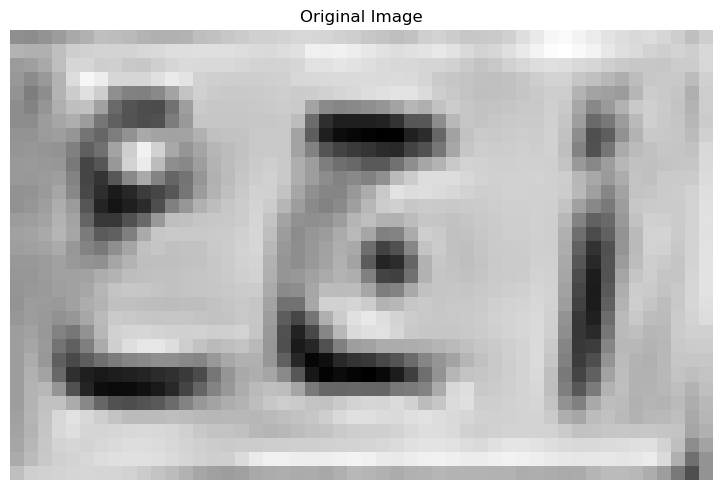

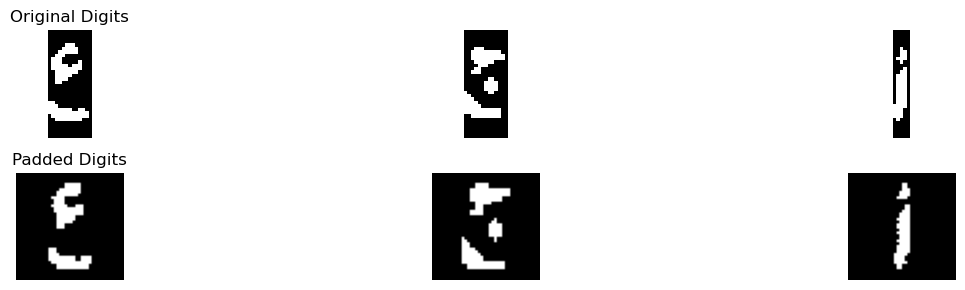

Best match: ع
Full comparison results: {'أ': 0.5625, 'ب': 0.038461538461538464, 'ج': 2.702805095468139, 'د': 2.749260692581126, 'ر': 0.4401449275362319, 'س': 0.4107142857142857, 'ص': 0.3678571428571428, 'ط': 1.365818511198946, 'ع': 4.211206039291778, 'ف': 1.7279152181529092, 'ق': 1.5322558394586525, 'ك': 2.322916666666667, 'ل': 1.1043808049535604, 'م': 2.1761363636363638, 'ن': 2.0079761904761906, 'ه': 0.7654569892473118, 'و': 1.263988095238095, 'ي': 1.0352773132664437}
Confidence :  0.7309726733553259
Best match: ج
Full comparison results: {'أ': 0.2534722222222222, 'ب': 0.4175232095490716, 'ج': 4.167954633154492, 'د': 2.916646065922382, 'ر': 0.3417741935483871, 'س': 0.7589285714285714, 'ص': 0.7607142857142857, 'ط': 1.011257384504229, 'ع': 2.1935637143935103, 'ف': 2.070915135059872, 'ق': 1.9771755778334725, 'ك': 1.0606060606060606, 'ل': 0.794867713638936, 'م': 1.5811237373737375, 'ن': 1.94593253968254, 'ه': 1.0518817204301074, 'و': 0.6760912698412698, 'ي': 1.5658282237086583}
Confidence

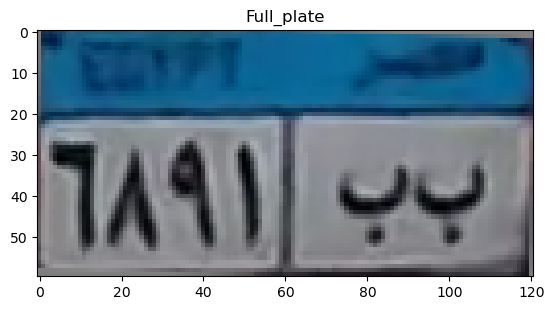

top
[0.36300804 0.5246052  0.61313494 0.61143299 0.58062909 0.5431867
 0.55481975 0.5704843  0.58917926 0.5970384  0.59200373 0.58049355
 0.56540201 0.55658875 0.55830309 0.55641741 0.55752309 0.5582594
 0.54691847 0.5381502  0.54493799 0.56431195 0.56965328 0.57438083
 0.57245539 0.57316382 0.58115167 0.58457081 0.58801858 0.58604013
 0.5858674  0.58303208 0.5847602  0.5837338  0.5841468  0.58303912
 0.58390588 0.57867605 0.56806884 0.55971267 0.55598439 0.55207512
 0.55065569 0.55475342 0.55980091 0.56141702 0.56842529 0.58351266
 0.59543728 0.6032651  0.60656626 0.61008189 0.6064552  0.59753593
 0.58952429 0.58354114 0.57500847 0.60705397 0.65181424 0.52106225]
[0.37109705 0.56218831 0.63680517 0.60957873 0.59075071 0.63561588
 0.65091875 0.64782249 0.64452694 0.64462312 0.64004819 0.63219162
 0.63074607 0.59571656 0.549127   0.55030158 0.5620987  0.55748982
 0.54980875 0.54871347 0.54189668 0.54182775 0.54976662 0.55877781
 0.56606181 0.57412099 0.57601256 0.57497089 0.57490196 0.5

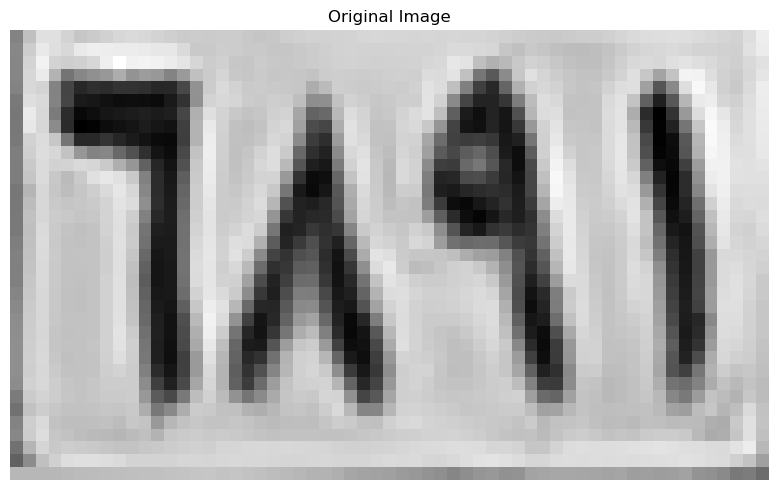

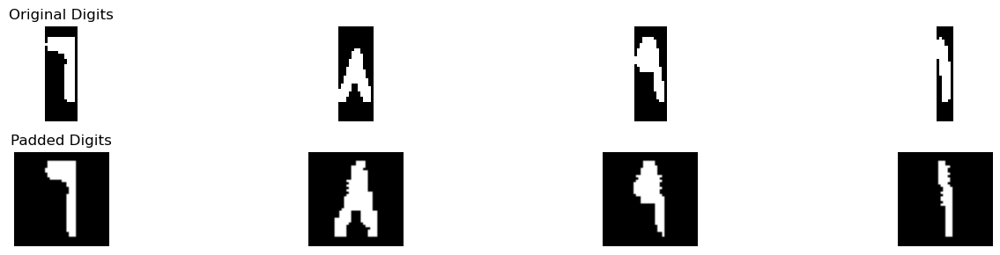

Best match: ٦
Full comparison results: {'١': 1.6177884615384617, '٢': 1.0745192307692308, '٣': 1.827012383900929, '٤': 0.0, '٥': 2.5048052115583075, '٦': 7.3812500000000005, '٧': 0.3014705882352941, '٨': 0.4847222222222222, '٩': 2.802036199095023}
Confidence :  2.2896069004524886
Best match: ٨
Full comparison results: {'١': 1.6944444444444446, '٢': 1.1388888888888888, '٣': 0.8558114035087718, '٤': 1.5902777777777777, '٥': 3.0164734753550544, '٦': 1.1583333333333332, '٧': 0.7819444444444446, '٨': 5.1090277777777775, '٩': 2.1041666666666665}
Confidence :  1.0462771512113616
Best match: ٩
Full comparison results: {'١': 2.776442307692308, '٢': 2.637019230769231, '٣': 1.8458784829721362, '٤': 2.6572115384615387, '٥': 2.6314545555064135, '٦': 2.6407738095238096, '٧': 0.8143382352941178, '٨': 2.9138888888888888, '٩': 5.133562719959779}
Confidence :  1.1098369155354453
Best match: ١
Full comparison results: {'١': 6.620833333333334, '٢': 2.4473339160839163, '٣': 1.173955108359133, '٤': 1.313232

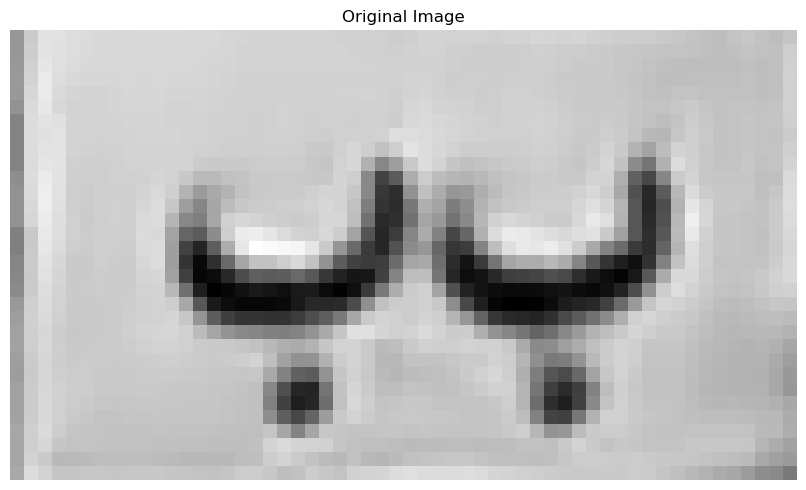

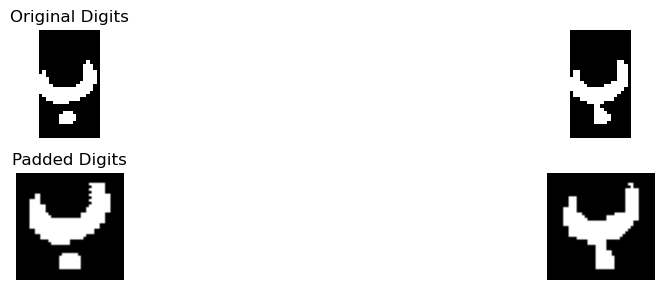

Best match: ب
Full comparison results: {'أ': 0.43125, 'ب': 4.72485632183908, 'ج': 0.9259408602150538, 'د': 0.33124999999999993, 'ر': 0.6499999999999999, 'س': 0.6625, 'ص': 2.291666666666667, 'ط': 0.8645833333333333, 'ع': 0.354382183908046, 'ف': 1.1333333333333333, 'ق': 1.1979166666666667, 'ك': 1.3875, 'ل': 0.34892473118279566, 'م': 0.26666666666666666, 'ن': 0.6833333333333332, 'ه': 0.84375, 'و': 1.1479166666666667, 'ي': 1.6624999999999999}
Confidence :  1.2165948275862064
Best match: ب
Full comparison results: {'أ': 0.5535714285714286, 'ب': 5.067426108374384, 'ج': 0.8839285714285715, 'د': 0.5669642857142857, 'ر': 0.47598522167487683, 'س': 0.3839285714285714, 'ص': 1.6279761904761905, 'ط': 0.8214285714285714, 'ع': 0.09375, 'ف': 1.1428571428571428, 'ق': 1.0357142857142856, 'ك': 0.5357142857142857, 'ل': 0.13839285714285715, 'م': 0.24999999999999997, 'ن': 0.4241071428571428, 'ه': 0.9375, 'و': 1.0669642857142858, 'ي': 0.9077380952380952}
Confidence :  1.7197249589490968
[['٦', '٨', '٩', '١'],

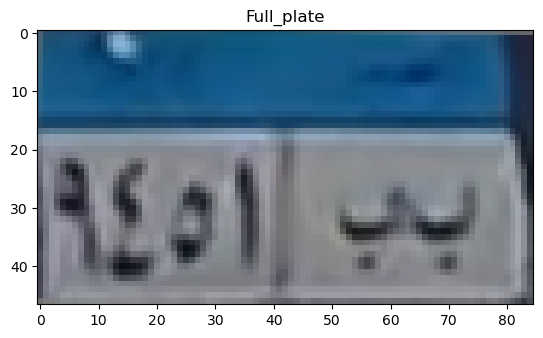

top
[0.54080985 0.59654769 0.60746547 0.6048849  0.60685975 0.60860462
 0.59884159 0.59504266 0.591363   0.59073106 0.59292499 0.59454521
 0.59538697 0.59752171 0.60023798 0.5987143  0.59672277 0.59155681
 0.59391715 0.59498002 0.59825358 0.60306363 0.60996388 0.61464222
 0.62316365 0.63108348 0.63803635 0.63936069 0.64525797 0.65328719
 0.66072387 0.66833091 0.67007043 0.67581681 0.67929836 0.67956932
 0.68165319 0.68531871 0.69769349 0.64652637 0.58867678 0.54424685]
[0.53178216 0.59399333 0.60376911 0.60036637 0.59838072 0.59641725
 0.58919296 0.58406767 0.57960709 0.57619173 0.57744652 0.58557281
 0.58412642 0.58837412 0.58849667 0.58686302 0.57800777 0.57042216
 0.56996446 0.57086979 0.57807458 0.57730635 0.58292362 0.58323586
 0.58670689 0.59330899 0.59949943 0.60311803 0.60403657 0.59500018
 0.58770108 0.58239588 0.58769613 0.5960508  0.60536745 0.60266071
 0.58565137 0.57251852 0.60887642 0.60241539 0.55924397 0.51467222]
[0.47610226 0.54705531 0.56735265 0.55625107 0.54946114 

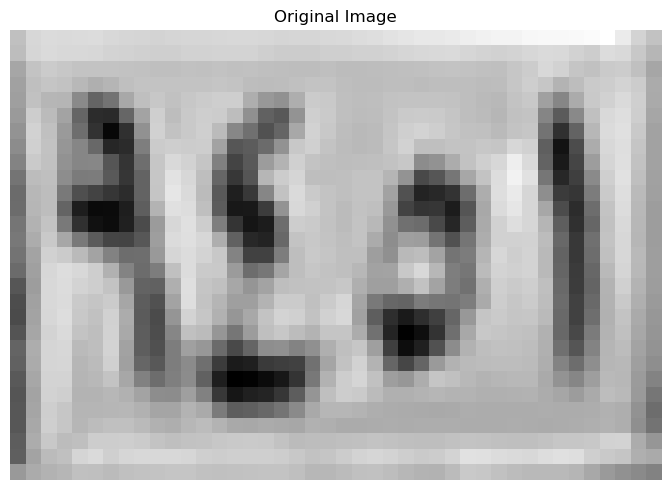

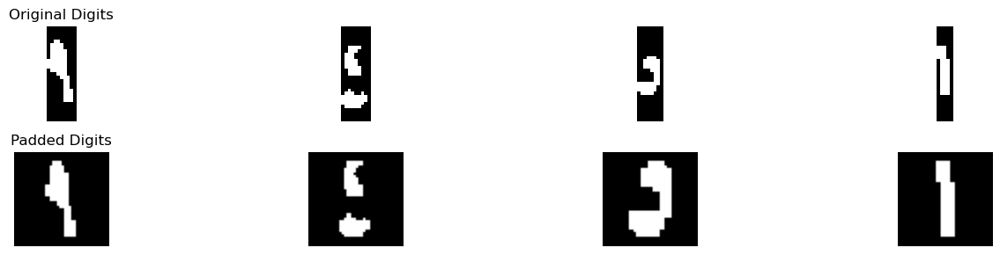

Best match: ٩
Full comparison results: {'١': 3.7884615384615383, '٢': 2.512019230769231, '٣': 1.6308049535603715, '٤': 3.2543956043956044, '٥': 1.3450998820580864, '٦': 0.8398809523809524, '٧': 1.1143382352941176, '٨': 2.7965277777777775, '٩': 4.938631221719456}
Confidence :  0.5750848416289589
Best match: ٤
Full comparison results: {'١': 2.387019230769231, '٢': 1.6802884615384617, '٣': 1.4281153250773992, '٤': 5.113736263736264, '٥': 3.170688670204924, '٦': 0.0, '٧': 0.42904411764705885, '٨': 1.7041666666666666, '٩': 1.6551993626234613}
Confidence :  0.97152379676567
Best match: ٥
Full comparison results: {'١': 0.611111111111111, '٢': 1.8923611111111112, '٣': 1.5433114035087718, '٤': 2.194444444444444, '٥': 7.163977652464495, '٦': 1.9131944444444446, '٧': 0.7055555555555555, '٨': 1.1611111111111112, '٩': 0.6631944444444444}
Confidence :  2.4847666040100256
Best match: ١
Full comparison results: {'١': 5.66875, '٢': 2.41368006993007, '٣': 0.8766447368421053, '٤': 1.7782509157509159, '٥'

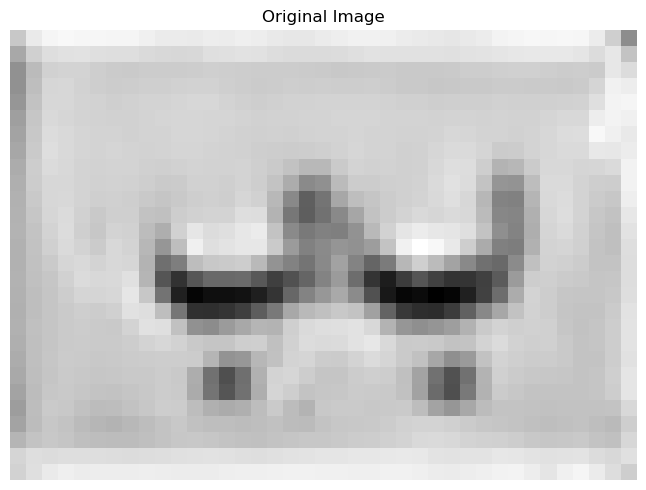

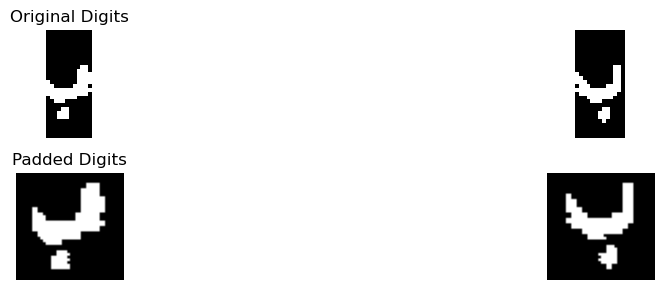

Best match: ب
Full comparison results: {'أ': 0.27314814814814814, 'ب': 2.9489303959131545, 'ج': 0.2962962962962963, 'د': 0.6445265830346476, 'ر': 1.315932311621967, 'س': 0.9821428571428572, 'ص': 2.0733796296296294, 'ط': 0.35300925925925924, 'ع': 0.09375, 'ف': 0.9345238095238095, 'ق': 0.7900462962962962, 'ك': 1.1388888888888888, 'ل': 0.5228494623655914, 'م': 0.6296296296296295, 'ن': 0.5439814814814814, 'ه': 1.125, 'و': 1.568287037037037, 'ي': 1.3974537037037036}
Confidence :  0.43777538314176256
Best match: ب
Full comparison results: {'أ': 0.28, 'ب': 3.8502404737457576, 'ج': 0.6370370370370371, 'د': 0.5911111111111111, 'ر': 0.9401293103448276, 'س': 0.2901785714285714, 'ص': 1.2991666666666666, 'ط': 0.08, 'ع': 0.0, 'ف': 1.2365079365079366, 'ق': 1.2192592592592593, 'ك': 1.215, 'ل': 0.2, 'م': 0.39125000000000004, 'ن': 0.4, 'ه': 0.5, 'و': 1.4939351851851852, 'ي': 1.2588141025641024}
Confidence :  1.1781526442802863
[['٩', '٤', '٥', '١'], ['ب', 'ب']]
Tilt angle: -1.50 degrees


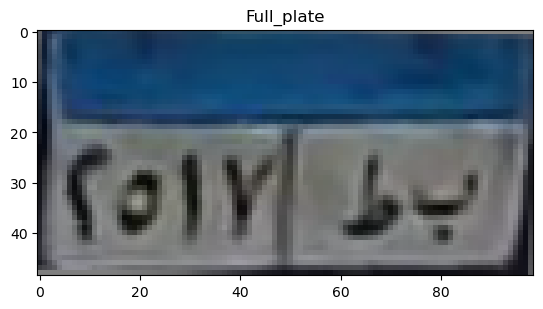

top
[0.11950457 0.03157373 0.20222283 0.43309516 0.48500115 0.46038089
 0.46237652 0.47368957 0.47408612 0.48115954 0.47375703 0.47339971
 0.45726115 0.43695336 0.4137779  0.41012581 0.42375969 0.41857215
 0.41216714 0.41362203 0.41682765 0.40177998 0.38742527 0.37172814
 0.35904782 0.36003975 0.36794346 0.37022613 0.38007789 0.37305291
 0.36030039 0.34499228 0.34612951 0.34837274 0.35845816 0.35940083
 0.36699662 0.38714235 0.40133142 0.41264691 0.44622586 0.42395069
 0.40514176 0.42997674 0.4705626  0.47279438 0.50070027 0.5005575
 0.44506361]
[0.10253599 0.03590891 0.20392208 0.43329743 0.49735573 0.49573868
 0.5021136  0.5244617  0.54270498 0.55378299 0.54858618 0.54296634
 0.53299996 0.52356281 0.51266662 0.51015771 0.50344263 0.48692187
 0.46628211 0.46418688 0.46500938 0.47695993 0.47757722 0.47475911
 0.47294225 0.47087511 0.4753877  0.48080436 0.49204039 0.49840429
 0.49994755 0.49487019 0.49503522 0.4941206  0.49518837 0.49919605
 0.50307409 0.5119352  0.51911623 0.531681   0

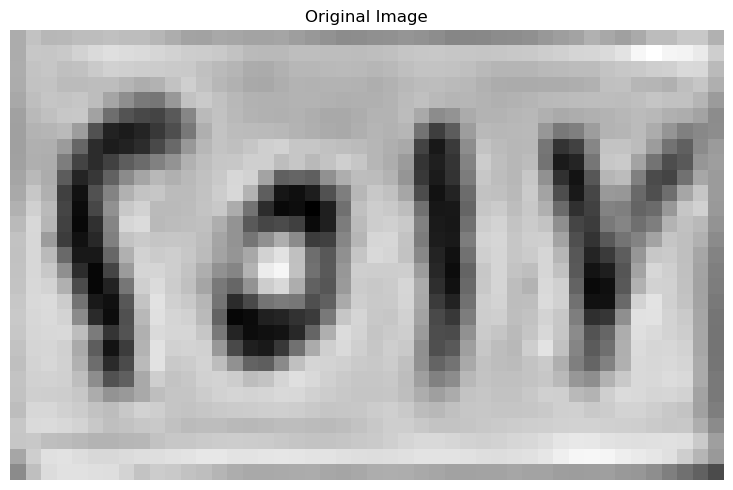

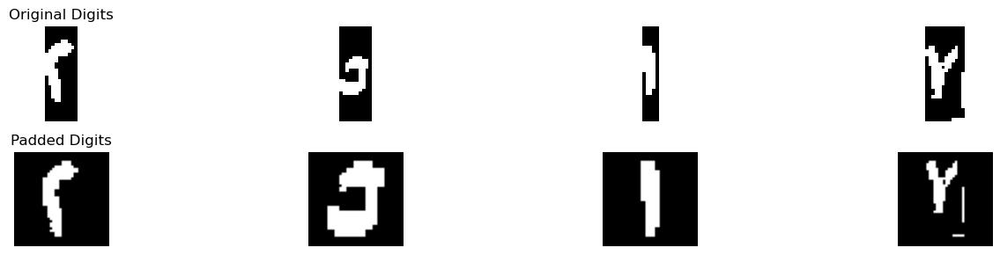

Best match: ٣
Full comparison results: {'١': 0.0, '٢': 3.15, '٣': 3.3932856037151704, '٤': 2.416666666666667, '٥': 2.559625165855816, '٦': 1.2145833333333333, '٧': 1.6330882352941178, '٨': 0.40555555555555556, '٩': 0.9598039215686274}
Confidence :  0.12164280185758525
Best match: ٥
Full comparison results: {'١': 0.4583333333333333, '٢': 1.1458333333333335, '٣': 1.2916666666666665, '٤': 1.7291666666666667, '٥': 6.729166666666668, '٦': 1.4583333333333335, '٧': 0.75, '٨': 0.7083333333333334, '٩': 0.3645833333333333}
Confidence :  2.5000000000000004
Best match: ١
Full comparison results: {'١': 3.94375, '٢': 3.4581148018648022, '٣': 1.3630998452012384, '٤': 2.1323946886446885, '٥': 2.263498820580864, '٦': 0.9333333333333333, '٧': 1.774264705882353, '٨': 2.158333333333333, '٩': 2.3625565610859725}
Confidence :  0.24281759906759892
Best match: ٣
Full comparison results: {'١': 0.90625, '٢': 3.09375, '٣': 3.2415828173374615, '٤': 1.78125, '٥': 0.4468247825445968, '٦': 1.09375, '٧': 1.1393382352

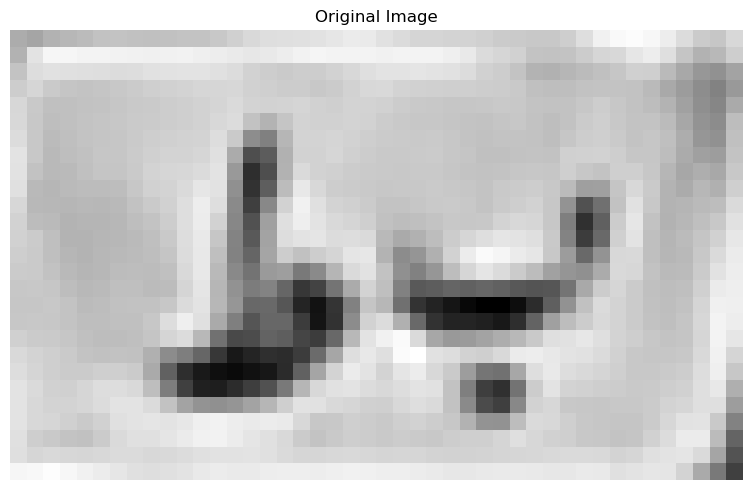

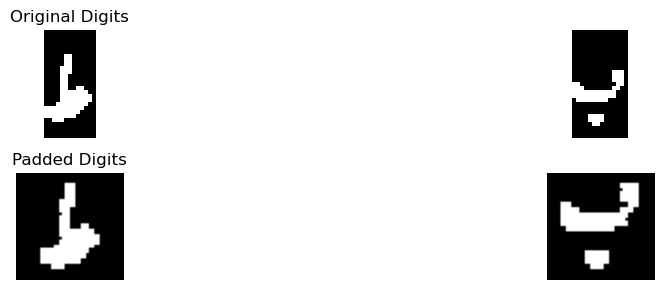

Best match: ط
Full comparison results: {'أ': 0.9488636363636364, 'ب': 0.4103116710875332, 'ج': 1.450766725223247, 'د': 3.1707281144781145, 'ر': 1.4842631525146517, 'س': 1.7410714285714286, 'ص': 1.2553030303030304, 'ط': 5.07999835309618, 'ع': 0.8323863636363635, 'ف': 2.8937439874939876, 'ق': 1.6683501683501685, 'ك': 1.8674242424242424, 'ل': 1.5284090909090908, 'م': 0.47727272727272735, 'ن': 2.1407954545454544, 'ه': 2.6411290322580645, 'و': 1.4054082491582491, 'ي': 2.5515563241106722}
Confidence :  0.9546351193090326
Best match: ب
Full comparison results: {'أ': 0.4073275862068966, 'ب': 3.35381317277869, 'ج': 0.5177032019704433, 'د': 0.48350464190981435, 'ر': 0.7262931034482758, 'س': 0.7004310344827587, 'ص': 2.406110956618465, 'ط': 0.27586206896551724, 'ع': 0.6529477196885428, 'ف': 0.27586206896551724, 'ق': 0.7363074712643678, 'ك': 1.4601293103448274, 'ل': 0.39588859416445626, 'م': 0.4730603448275862, 'ن': 0.4224137931034483, 'ه': 0.375, 'و': 1.228448275862069, 'ي': 1.6514367816091953}
Co

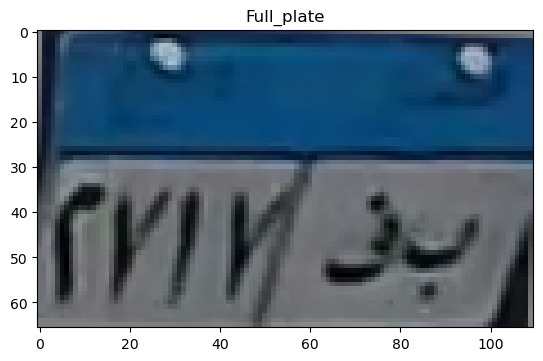

top
[0.16710664 0.08550824 0.165967   0.26501265 0.2324649  0.18317025
 0.17850249 0.17611931 0.17203567 0.17192591 0.17744249 0.18047599
 0.17926506 0.17943547 0.18148997 0.18185283 0.18117192 0.184116
 0.19219009 0.19643025 0.19368331 0.19675956 0.19618217 0.1964785
 0.19620988 0.19328961 0.18969845 0.19685633 0.2005112  0.20267611
 0.19804973 0.193084   0.19030107 0.19693805 0.20379069 0.20948118
 0.2159533  0.21545544 0.20773868 0.204809   0.21652775 0.2192851
 0.21441377 0.21033442 0.21050074 0.20738356 0.20886449 0.21288984
 0.21529044 0.21476086 0.20922471 0.20256646 0.19419999 0.19364896
 0.19267967]
[0.15369115 0.09767078 0.18399723 0.26639279 0.21616119 0.1223601
 0.09687177 0.08272135 0.07659529 0.08039687 0.08296585 0.0870144
 0.10076004 0.10424878 0.10831042 0.1051871  0.11254985 0.10855607
 0.0979315  0.09738254 0.09660766 0.09583092 0.09395894 0.09079676
 0.09343253 0.09092061 0.08802687 0.09421648 0.10151275 0.10746671
 0.10899332 0.09970517 0.09051995 0.09684089 0.1003

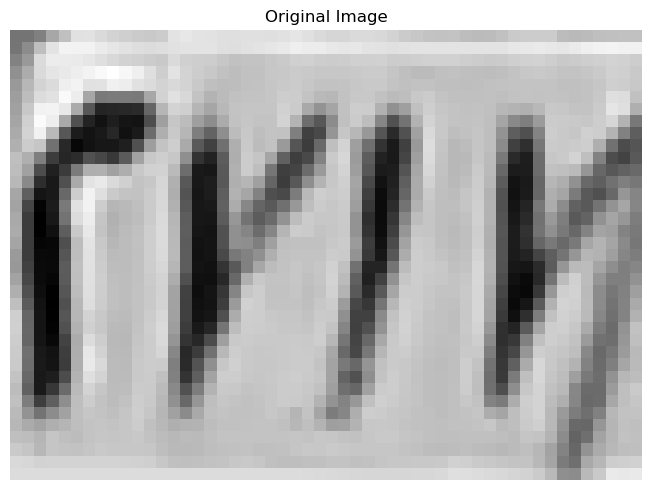

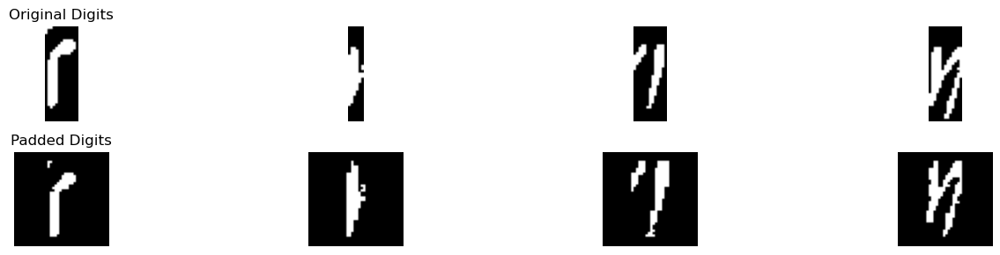

Best match: ٢
Full comparison results: {'١': 0.3125, '٢': 1.439102564102564, '٣': 1.4104102167182662, '٤': 1.4307692307692308, '٥': 0.23277863777089783, '٦': 0.5830357142857143, '٧': 1.143014705882353, '٨': 0.89375, '٩': 0.5793740573152337}
Confidence :  0.004166666666666652
Best match: ١
Full comparison results: {'١': 3.0125, '٢': 1.8079108391608392, '٣': 1.5255417956656347, '٤': 1.9451923076923077, '٥': 0.7527642636001768, '٦': 0.0, '٧': 1.3400735294117647, '٨': 2.6902777777777778, '٩': 0.7710847159376573}
Confidence :  0.1611111111111112
Best match: ٦
Full comparison results: {'١': 1.15625, '٢': 1.09375, '٣': 1.375483746130031, '٤': 0.25, '٥': 1.4662667698658411, '٦': 3.4125, '٧': 2.529044117647059, '٨': 0.3736111111111111, '٩': 1.473651960784314}
Confidence :  0.4417279411764705
Best match: ٢
Full comparison results: {'١': 0.29374999999999996, '٢': 1.9041666666666666, '٣': 1.2541602167182662, '٤': 0.9437499999999999, '٥': 1.6567429603420316, '٦': 1.1729166666666666, '٧': 1.51985294

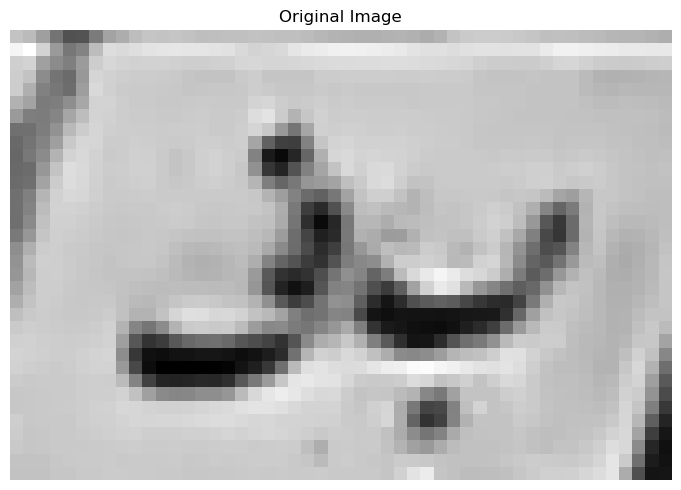

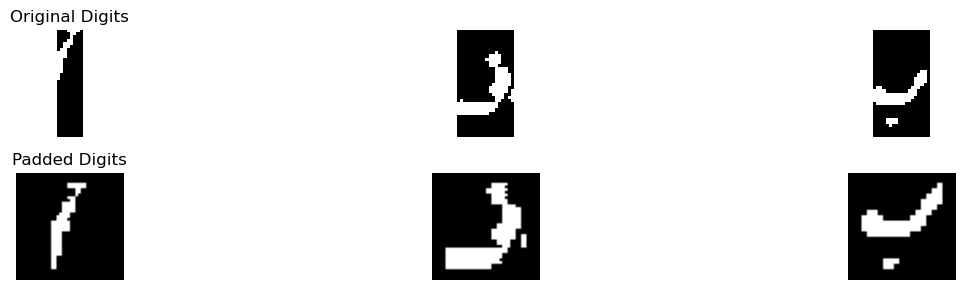

Best match: م
Full comparison results: {'أ': 0.3245192307692308, 'ب': 0.10096153846153846, 'ج': 0.047619047619047616, 'د': 0.07125000000000001, 'ر': 0.0, 'س': 0.1919642857142857, 'ص': 0.3181547619047619, 'ط': 0.125, 'ع': 0.1875, 'ف': 0.09375, 'ق': 0.0, 'ك': 0.25757575757575757, 'ل': 0.0625, 'م': 2.064498001998002, 'ن': 0.0, 'ه': 0.6373655913978494, 'و': 0.16458333333333333, 'ي': 0.045454545454545456}
Confidence :  0.7135662053000764
Best match: ف
Full comparison results: {'أ': 0.06666666666666667, 'ب': 0.5729166666666666, 'ج': 1.4749999999999999, 'د': 4.0249999999999995, 'ر': 3.247916666666667, 'س': 2.5895833333333336, 'ص': 1.9791666666666667, 'ط': 2.310416666666667, 'ع': 0.9208333333333333, 'ف': 4.139583333333333, 'ق': 3.0229166666666667, 'ك': 1.8, 'ل': 2.252083333333333, 'م': 0.13125, 'ن': 2.475, 'ه': 3.1875, 'و': 3.33125, 'ي': 2.8583333333333334}
Confidence :  0.05729166666666696
Best match: ب
Full comparison results: {'أ': 0.03125, 'ب': 4.535300443490099, 'ج': 0.0, 'د': 0.166666666

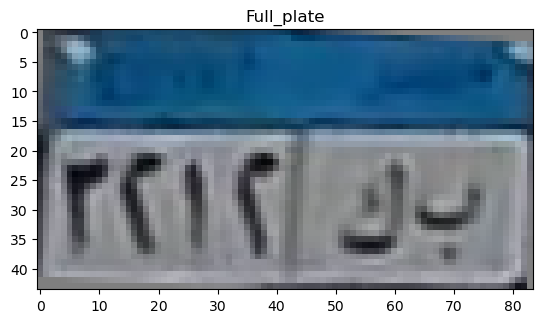

top
[0.21985723 0.24150917 0.32235583 0.4019451  0.51188689 0.56639933
 0.55955871 0.56642909 0.56730229 0.57226446 0.54101058 0.52310275
 0.51145499 0.52979533 0.50626407 0.47758572 0.49560436 0.47270803
 0.45319799 0.44669852 0.49585593 0.47568146 0.4714583  0.45769451
 0.46461    0.46911083 0.46768554 0.46730235 0.47472137 0.47525402
 0.51245618 0.47339652 0.44710098 0.44521897 0.45987451 0.45760078
 0.44557608 0.46430069 0.47152735 0.45039662 0.48333912 0.49563735]
[0.13395081 0.22971943 0.40458382 0.50131233 0.64417243 0.69185931
 0.65385452 0.6735737  0.66851387 0.66344013 0.65843702 0.65580632
 0.653559   0.66853733 0.6777573  0.67507804 0.66018527 0.65851248
 0.68322152 0.69164797 0.70380339 0.7162663  0.72315968 0.72924118
 0.7197043  0.70003025 0.67939372 0.66892031 0.66364268 0.65500164
 0.66866775 0.64627536 0.6327744  0.62939752 0.6271352  0.63496201
 0.64950712 0.66961467 0.68915429 0.70843219 0.72571451 0.70614527]
[0.10192276 0.19888956 0.45010963 0.57319463 0.62635362 

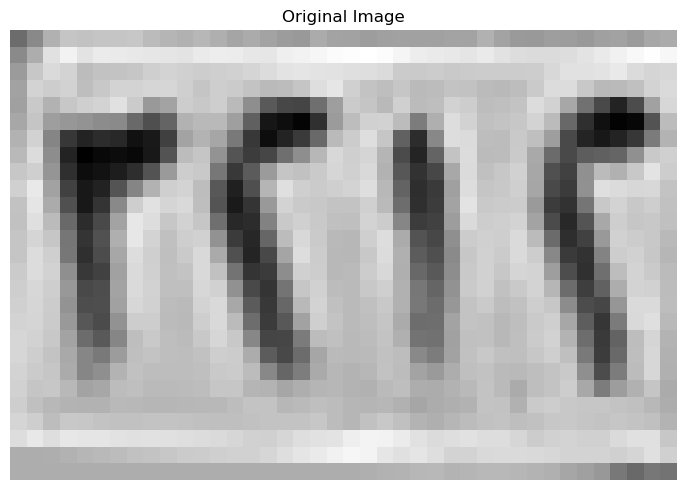

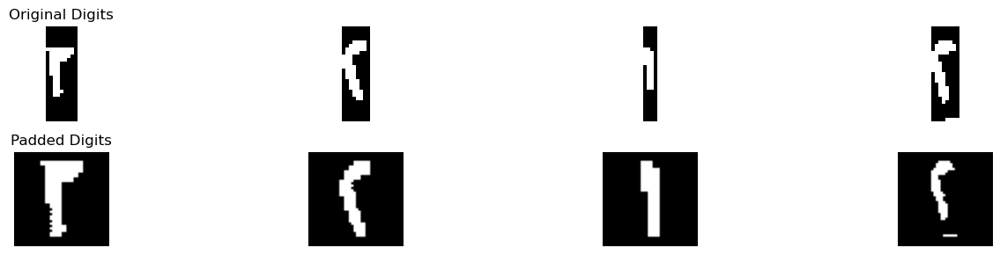

Best match: ٣
Full comparison results: {'١': 0.2222222222222222, '٢': 3.2256944444444446, '٣': 4.876827485380117, '٤': 2.8333333333333335, '٥': 2.536053675856307, '٦': 1.5180555555555555, '٧': 1.917361111111111, '٨': 0.5347222222222222, '٩': 1.0416666666666665}
Confidence :  0.8255665204678362
Best match: ٢
Full comparison results: {'١': 0.5889423076923077, '٢': 6.6706730769230775, '٣': 3.6880804953560373, '٤': 3.4460622710622713, '٥': 2.526343432109686, '٦': 0.45535714285714285, '٧': 2.3772058823529414, '٨': 0.7611111111111111, '٩': 1.3850710155857213}
Confidence :  1.49129629078352
Best match: ١
Full comparison results: {'١': 4.70625, '٢': 2.7169289044289044, '٣': 1.2854102167182662, '٤': 0.7328754578754579, '٥': 2.1236178681999114, '٦': 1.8547619047619046, '٧': 1.1029411764705883, '٨': 1.5145833333333334, '٩': 2.0123963046757165}
Confidence :  0.9946605477855477
Best match: ٢
Full comparison results: {'١': 0.27840909090909094, '٢': 5.9216200466200455, '٣': 3.5412151702786376, '٤': 2

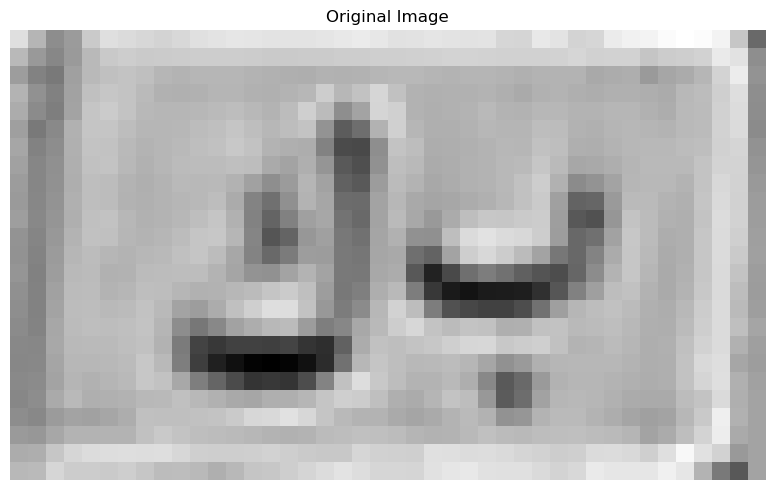

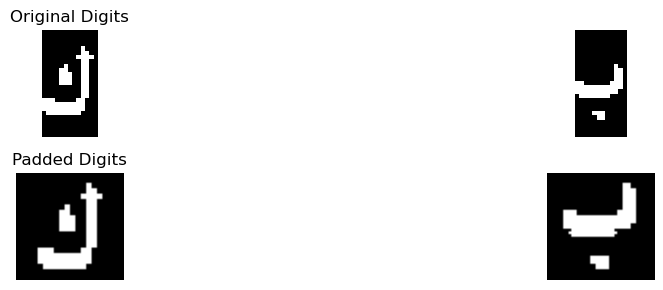

Best match: ك
Full comparison results: {'أ': 0.375, 'ب': 0.7742042440318302, 'ج': 1.2835648148148149, 'د': 2.7693518518518516, 'ر': 3.2773419540229884, 'س': 1.375, 'ص': 1.6916666666666669, 'ط': 3.1979166666666665, 'ع': 1.53125, 'ف': 2.7372685185185186, 'ق': 1.5532407407407407, 'ك': 4.645833333333334, 'ل': 1.8854166666666667, 'م': 0.041666666666666664, 'ن': 2.7091666666666665, 'ه': 1.3508064516129032, 'و': 3.1689814814814814, 'ي': 2.686378205128205}
Confidence :  0.6842456896551727
Best match: ب
Full comparison results: {'أ': 0.4699074074074074, 'ب': 5.2221405940802486, 'ج': 0.8032407407407407, 'د': 0.2534722222222222, 'ر': 0.7071360153256705, 'س': 0.4776785714285714, 'ص': 2.001388888888889, 'ط': 0.18518518518518517, 'ع': 0.39206242532855434, 'ف': 0.6926256613756614, 'ق': 0.7037037037037037, 'ك': 1.8078703703703702, 'ل': 0.03571428571428571, 'م': 0.43287037037037035, 'ن': 0.3900462962962963, 'ه': 0.46875, 'و': 1.067839008363202, 'ي': 1.1747685185185184}
Confidence :  1.6103758525956797


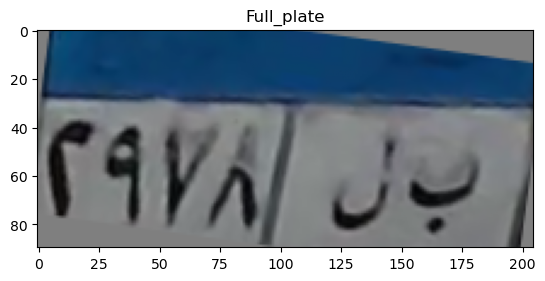

top
[0.42461265 0.36778894 0.3991649  0.47329751 0.50053235 0.50314317
 0.51365172 0.51057436 0.50568617 0.51355675 0.53916602 0.57029164
 0.58699412 0.58540892 0.57742958 0.56931749 0.56140469 0.54751146
 0.54312208 0.54664775 0.54859737 0.54877494 0.55043776 0.55286574
 0.55165882 0.54822745 0.54306771 0.53499449 0.52969388 0.53022857
 0.53325558 0.5384133  0.54237922 0.54617824 0.55258908 0.55946577
 0.56216183 0.56433596 0.56248863 0.56155243 0.56321243 0.56320094
 0.55888109 0.55571424 0.55144784 0.54875176 0.54833395 0.54649495
 0.5448302  0.54434691 0.54197354 0.54132529 0.5415949  0.5360802
 0.52278746 0.5039264  0.48657039 0.48363943 0.48685007 0.49737397
 0.51052541 0.52229601 0.53500266 0.54337214 0.54791513 0.55211973
 0.55327216 0.55017952 0.54800522 0.54370579 0.53928745 0.53869747
 0.53500132 0.53519441 0.53960631 0.54386771 0.55002159 0.54916605
 0.55043548 0.55259309 0.55062015 0.54875961 0.55103147 0.55651054
 0.56303338 0.56633841 0.56678673 0.56342689 0.56309376 0.5

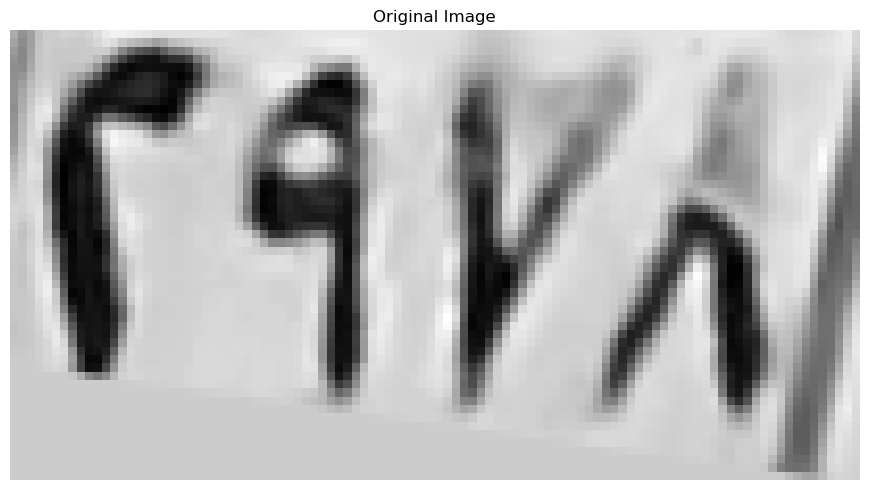

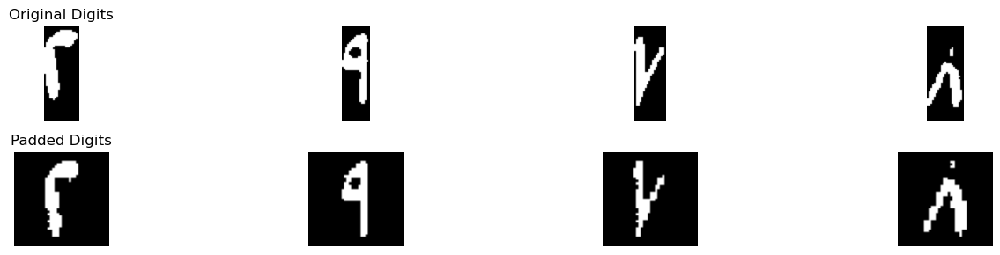

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 4.633928571428571, '٣': 3.6322561919504643, '٤': 2.417857142857143, '٥': 2.5348757924222323, '٦': 1.7919642857142857, '٧': 1.5757352941176472, '٨': 0.35, '٩': 0.6982084500466854}
Confidence :  0.5008361897390534
Best match: ٩
Full comparison results: {'١': 2.670454545454545, '٢': 2.16368006993007, '٣': 1.1431888544891642, '٤': 0.7105540293040293, '٥': 1.3553553000147427, '٦': 2.3842261904761903, '٧': 0.9944852941176471, '٨': 1.7173611111111111, '٩': 4.258562719959778}
Confidence :  0.7940540872526167
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 1.3293269230769231, '٣': 0.6702786377708978, '٤': 0.8583104395604395, '٥': 0.4810555801267875, '٦': 0.2193452380952381, '٧': 2.1573529411764705, '٨': 0.3375, '٩': 0.20192307692307693}
Confidence :  0.4140130090497737
Best match: ٨
Full comparison results: {'١': 0.6493055555555556, '٢': 0.16666666666666666, '٣': 0.16666666666666666, '٤': 0.03125, '٥': 0.8813700918964076, '٦': 0.8111

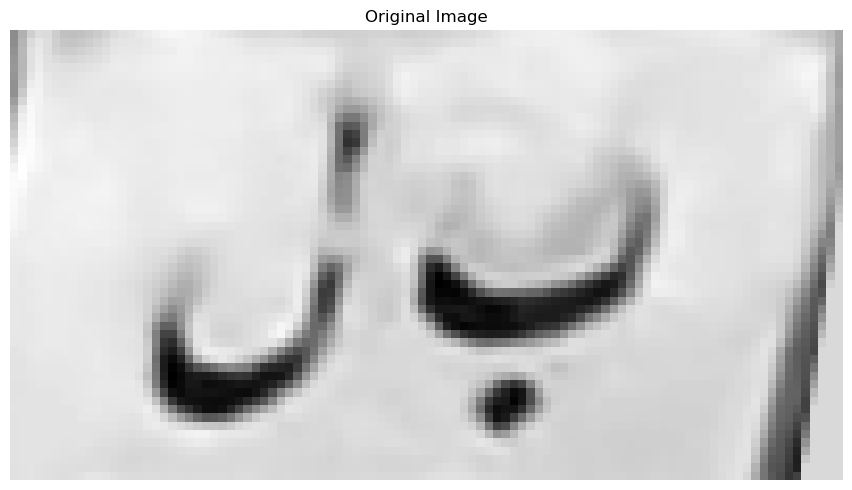

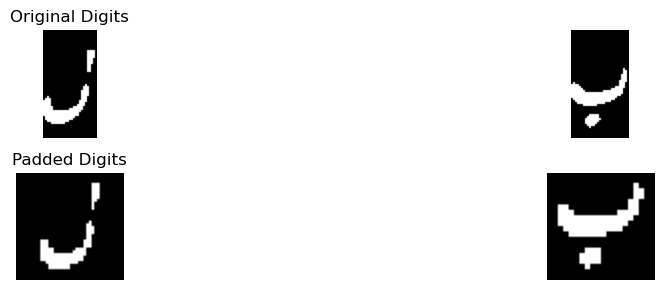

Best match: ل
Full comparison results: {'أ': 0.045454545454545456, 'ب': 0.20838859416445624, 'ج': 0.8830724428550516, 'د': 2.463463804713805, 'ر': 3.2549305379777644, 'س': 1.8125, 'ص': 1.5712121212121213, 'ط': 2.3360742518351216, 'ع': 1.166098484848485, 'ف': 1.7821218133718133, 'ق': 2.4641203703703707, 'ك': 1.9431818181818181, 'ل': 4.480925324675325, 'م': 0.13636363636363635, 'ن': 3.4380681818181817, 'ه': 0.5092741935483871, 'و': 2.3043981481481484, 'ي': 2.754591633238197}
Confidence :  0.5214285714285716
Best match: ب
Full comparison results: {'أ': 0.21875, 'ب': 4.287664203612479, 'ج': 0.16517857142857142, 'د': 0.125, 'ر': 0.28125, 'س': 0.875, 'ص': 2.0625, 'ط': 0.125, 'ع': 0.18951612903225806, 'ف': 0.09375, 'ق': 0.5044642857142857, 'ك': 0.59375, 'ل': 0.1294642857142857, 'م': 0.3125, 'ن': 0.1875, 'ه': 0.625, 'و': 0.282258064516129, 'ي': 0.4375}
Confidence :  1.1125821018062396
[['٢', '٩', '٧', '٨'], ['ل', 'ب']]
Tilt angle: -5.00 degrees


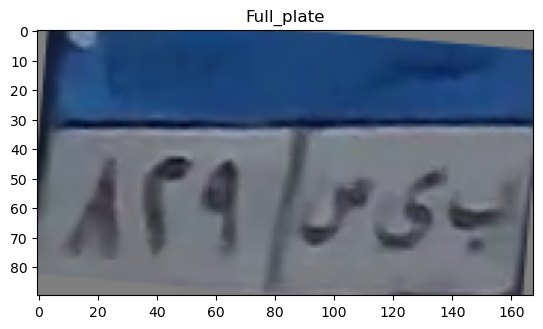

top
[0.28161927 0.09392809 0.11900094 0.1893579  0.29635026 0.37991836
 0.42280638 0.45039686 0.46414114 0.4763776  0.47714255 0.46604897
 0.47442839 0.49264651 0.49657284 0.49137218 0.48875433 0.48900922
 0.48804482 0.48619713 0.48515547 0.48762942 0.49251836 0.49965431
 0.50621069 0.50743618 0.50401207 0.49319333 0.48677286 0.48065969
 0.47853434 0.48325941 0.48846559 0.49451176 0.50003167 0.50434474
 0.50376893 0.50060426 0.49299268 0.49458385 0.50614941 0.51042331
 0.50430505 0.50012306 0.50271191 0.50764451 0.51403238 0.51922539
 0.52056884 0.51779157 0.51472784 0.51676618 0.51616147 0.51147941
 0.51181862 0.52223748 0.53446393 0.53762176 0.53526926 0.53471233
 0.53427603 0.53495875 0.54467355 0.55662039 0.56591218 0.57431624
 0.57249026 0.57201308 0.57563977 0.57032803 0.55639358 0.5371202
 0.52247559 0.51395843 0.52296316 0.54001311 0.54483882 0.54416482
 0.53731558 0.53372192 0.5363302  0.54430646 0.54840987 0.55229417]
[0.24111176 0.09328941 0.12720594 0.21271877 0.32562273 0.

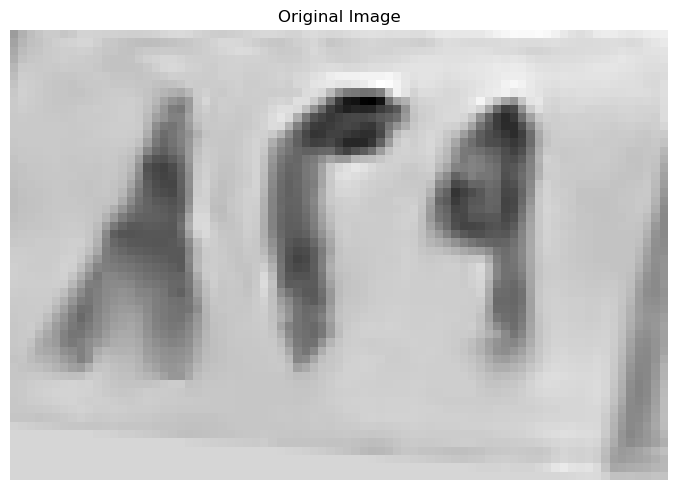

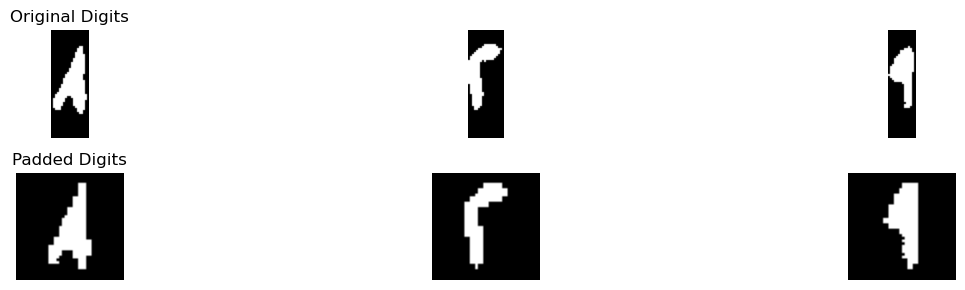

Best match: ٨
Full comparison results: {'١': 1.3125, '٢': 0.875, '٣': 0.5, '٤': 0.5, '٥': 1.7630335028748338, '٦': 1.525, '٧': 1.4522058823529413, '٨': 3.3444444444444446, '٩': 0.8259803921568627}
Confidence :  0.7907054707848054
Best match: ٣
Full comparison results: {'١': 0.25, '٢': 2.8125, '٣': 3.298374613003096, '٤': 1.84375, '٥': 2.849347633790358, '٦': 1.66875, '٧': 1.519485294117647, '٨': 0.5791666666666666, '٩': 1.0957924836601307}
Confidence :  0.2245134896063692
Best match: ٩
Full comparison results: {'١': 2.605769230769231, '٢': 3.0, '٣': 1.361455108359133, '٤': 1.0873168498168497, '٥': 2.413091552410438, '٦': 2.3827380952380954, '٧': 0.7242647058823529, '٨': 2.0479166666666666, '٩': 3.3256190296631476}
Confidence :  0.1628095148315738
In horizontal_segmentation_1
0 29
31 83
In sub_horizontal_segmentation
0 23
24 52
In refine_segmentation_1


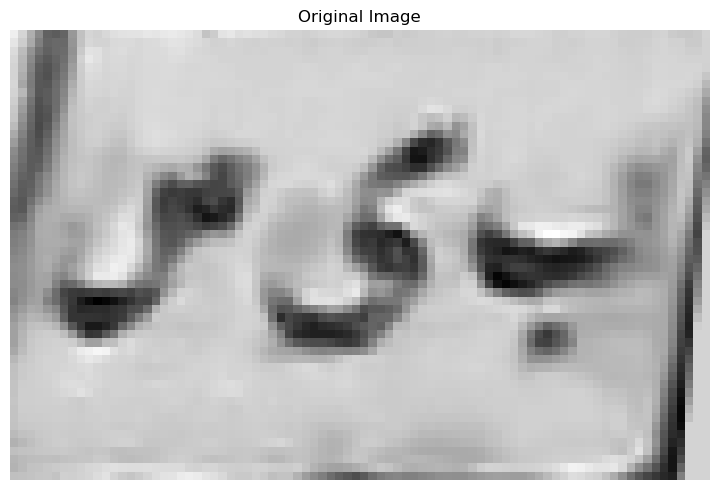

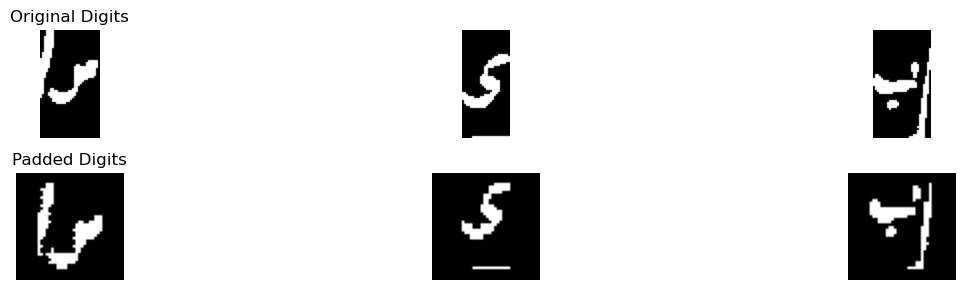

Best match: ر
Full comparison results: {'أ': 0.07291666666666666, 'ب': 1.204575596816976, 'ج': 0.6678240740740742, 'د': 0.9749537037037037, 'ر': 2.1133620689655173, 'س': 0.9910714285714286, 'ص': 0.8312499999999999, 'ط': 1.4166666666666667, 'ع': 0.6458333333333334, 'ف': 1.2698412698412698, 'ق': 1.9120370370370372, 'ك': 0.625, 'ل': 2.0208333333333335, 'م': 0.041666666666666664, 'ن': 1.6516666666666668, 'ه': 0.22076612903225806, 'و': 1.384259259259259, 'ي': 2.0149038461538464}
Confidence :  0.04626436781609189
Best match: ب
Full comparison results: {'أ': 0.24305555555555555, 'ب': 1.355572747814127, 'ج': 0.6854201867320308, 'د': 0.28125, 'ر': 0.0625, 'س': 0.44743663594470046, 'ص': 0.9141203703703702, 'ط': 0.09375, 'ع': 0.08680555555555555, 'ف': 0.43804824561403505, 'ق': 0.3082062795878585, 'ك': 0.3513257575757576, 'ل': 0.05263157894736842, 'م': 0.8838383838383838, 'ن': 0.09375, 'ه': 0.28736559139784945, 'و': 0.5396825396825397, 'ي': 0.3779240988480119}
Confidence :  0.22072618872187844
Bes

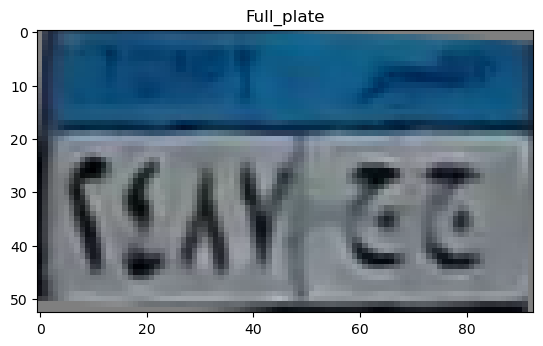

top
[0.1273233  0.15137    0.32246069 0.43858814 0.53786816 0.55135392
 0.53126491 0.52083255 0.52235553 0.52660194 0.53261992 0.54131333
 0.55072218 0.56230844 0.56476719 0.56520757 0.55346969 0.54099131
 0.54064779 0.55095455 0.58317629 0.60404674 0.60800265 0.61065125
 0.61561147 0.61380746 0.5990592  0.59745373 0.58170245 0.56764892
 0.56259966 0.56076338 0.55873735 0.56458775 0.57549676 0.58338147
 0.59083113 0.59455005 0.594505   0.59327471 0.59392843 0.59450377
 0.59420485 0.5951673  0.59617725 0.59082559]
[0.10900744 0.13894527 0.31681292 0.43985279 0.54563426 0.54167965
 0.51094591 0.50102912 0.5248058  0.54854023 0.56437469 0.59340938
 0.56637776 0.58416064 0.56432108 0.53312292 0.49343776 0.47186885
 0.48259955 0.4897725  0.5296286  0.55309488 0.54428667 0.53080627
 0.52287888 0.5209181  0.51051216 0.49364941 0.49357655 0.50015937
 0.50963097 0.50625817 0.49974077 0.49978551 0.50886462 0.51642766
 0.52470802 0.53194846 0.53875619 0.54379074 0.54756617 0.54506678
 0.54294553 

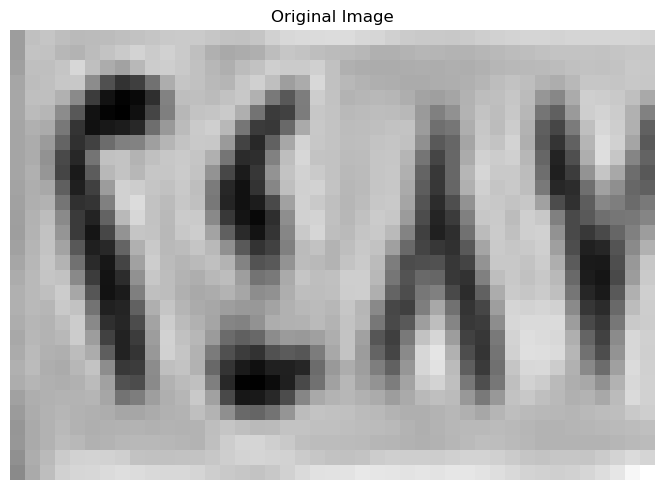

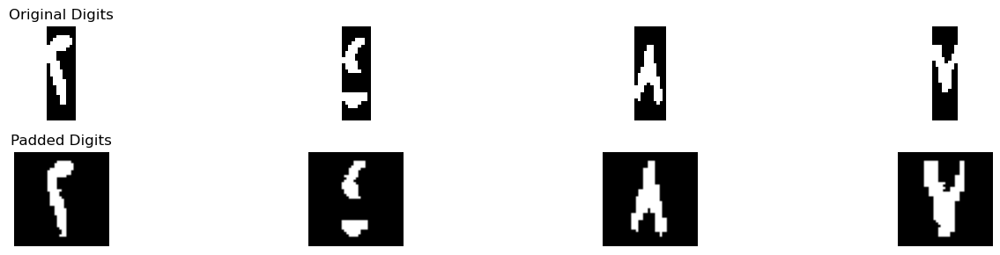

Best match: ٢
Full comparison results: {'١': 0.6392045454545455, '٢': 7.6611305361305355, '٣': 4.385448916408668, '٤': 2.7756868131868133, '٥': 2.043799756744803, '٦': 0.7330357142857142, '٧': 2.5595588235294118, '٨': 0.5430555555555555, '٩': 1.4837543991955757}
Confidence :  1.6378408098609336
Best match: ٤
Full comparison results: {'١': 1.747159090909091, '٢': 2.4813519813519815, '٣': 1.65421826625387, '٤': 4.968780278860924, '٥': 2.754261573050273, '٦': 0.0, '٧': 0.4051470588235294, '٨': 1.4534722222222223, '٩': 1.2303080247814593}
Confidence :  1.1072593529053256
Best match: ٨
Full comparison results: {'١': 3.25, '٢': 1.1604166666666667, '٣': 0.9568498452012384, '٤': 2.1604166666666664, '٥': 1.17468763821318, '٦': 0.7666666666666666, '٧': 1.0893382352941177, '٨': 6.217361111111111, '٩': 3.4696486928104577}
Confidence :  1.3738562091503266
Best match: ٧
Full comparison results: {'١': 0.823529411764706, '٢': 2.1801470588235294, '٣': 2.2445820433436534, '٤': 1.9761029411764706, '٥': 1

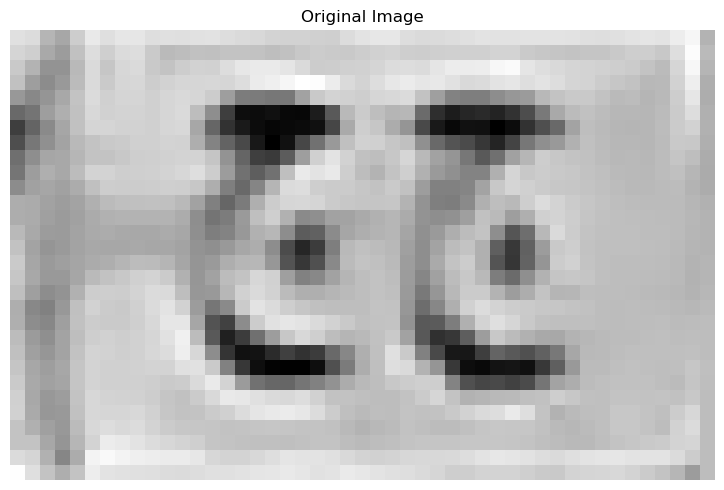

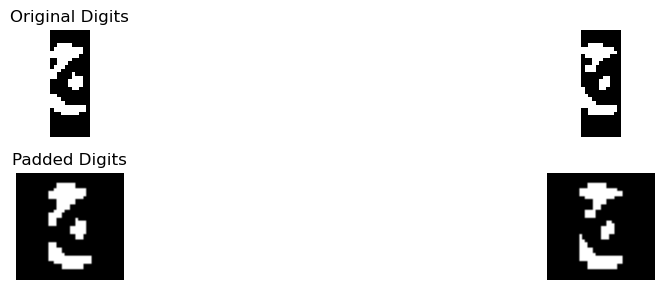

Best match: ج
Full comparison results: {'أ': 0.25, 'ب': 0.6105341404979893, 'ج': 4.82718244692298, 'د': 2.3697026487619968, 'ر': 0.32125000000000004, 'س': 0.19642857142857142, 'ص': 0.17261904761904762, 'ط': 1.1103837285902505, 'ع': 2.4017508488964348, 'ف': 1.9701075605680867, 'ق': 1.8121124944978932, 'ك': 0.9602272727272728, 'ل': 0.6437131728752622, 'م': 2.1022727272727275, 'ن': 1.6168452380952383, 'ه': 0.6707661290322581, 'و': 1.2959656084656084, 'ي': 1.4598546079524342}
Confidence :  1.2127157990132726
Best match: ج
Full comparison results: {'أ': 0.6875, 'ب': 0.440815649867374, 'ج': 4.719022713105813, 'د': 2.519744464771555, 'ر': 0.32225806451612904, 'س': 0.3526785714285714, 'ص': 0.15625, 'ط': 1.3956659866547663, 'ع': 2.3455008488964344, 'ف': 1.949718045112782, 'ق': 2.0581749512670564, 'ك': 1.571969696969697, 'ل': 0.87649181064616, 'م': 1.3863636363636362, 'ن': 1.8632142857142857, 'ه': 0.7353494623655914, 'و': 1.0816798941798942, 'ي': 1.260976402824229}
Confidence :  1.09963912416712

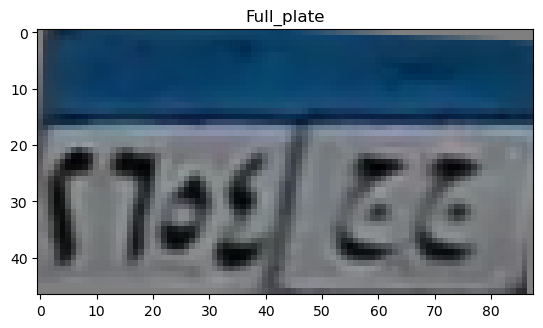

top
[0.3145447  0.35574779 0.49191029 0.56449    0.57923731 0.58150699
 0.58950695 0.58229293 0.57613729 0.55811493 0.54495625 0.55364349
 0.55851667 0.55553189 0.55153136 0.5584646  0.57626783 0.58970107
 0.5968738  0.59214798 0.59121803 0.59517882 0.59489363 0.58462096
 0.57177269 0.56882127 0.56403453 0.56210214 0.562018   0.56552455
 0.56845735 0.56996395 0.56779975 0.56295042 0.56147251 0.56775803
 0.56578562 0.56364926 0.56516439 0.57736027 0.5909268  0.59352445
 0.57901657 0.57675841]
[0.3435216  0.391152   0.51252176 0.5575151  0.55327306 0.55363418
 0.55939608 0.55466884 0.55454614 0.54940928 0.53576575 0.53967339
 0.53011777 0.52578892 0.53550409 0.53898613 0.53710118 0.53701721
 0.54257832 0.53037652 0.5171246  0.53241616 0.53464741 0.51419767
 0.49917673 0.49144353 0.49465205 0.49327468 0.49639275 0.49976738
 0.49866771 0.49892402 0.49779661 0.49610526 0.49605799 0.49619491
 0.49848133 0.50848396 0.5250954  0.53541424 0.53976898 0.53792462
 0.53892627 0.55698601]
[0.3434205

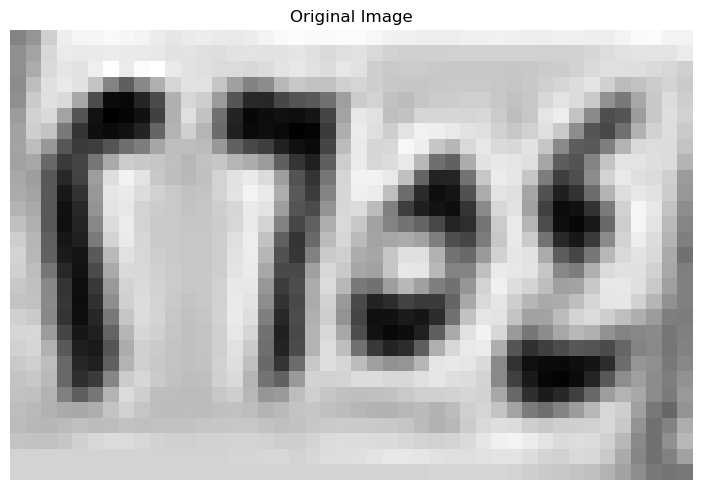

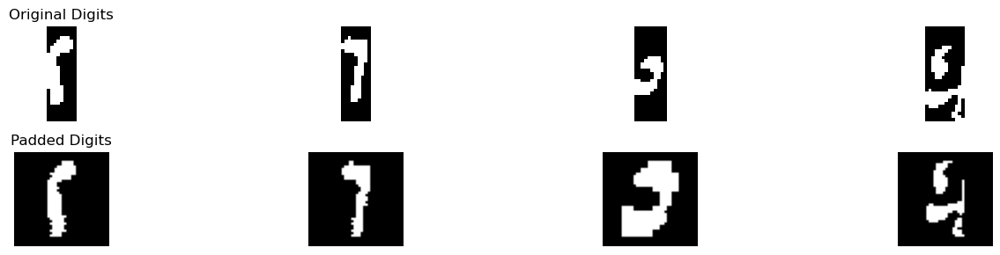

Best match: ٢
Full comparison results: {'١': 0.125, '٢': 5.545673076923077, '٣': 3.7432275541795663, '٤': 3.1338598901098904, '٥': 2.626285382574082, '٦': 0.7247023809523809, '٧': 1.711764705882353, '٨': 0.6618055555555555, '٩': 0.5868055555555556}
Confidence :  0.9012227613717552
Best match: ٦
Full comparison results: {'١': 3.2812500000000004, '٢': 2.161858974358974, '٣': 1.611455108359133, '٤': 0.6078754578754579, '٥': 2.8279660548429897, '٦': 4.002380952380952, '٧': 1.898529411764706, '٨': 0.6541666666666667, '٩': 1.331180869783811}
Confidence :  0.36056547619047596
Best match: ٥
Full comparison results: {'١': 0.4583333333333333, '٢': 1.3020833333333335, '٣': 1.3125, '٤': 1.5833333333333335, '٥': 6.260416666666668, '٦': 1.5729166666666665, '٧': 0.6666666666666666, '٨': 0.9479166666666666, '٩': 0.47916666666666663}
Confidence :  2.338541666666667
Best match: ٨
Full comparison results: {'١': 1.375, '٢': 1.8125, '٣': 1.421923374613003, '٤': 1.71875, '٥': 1.49047250479139, '٦': 0.28125,

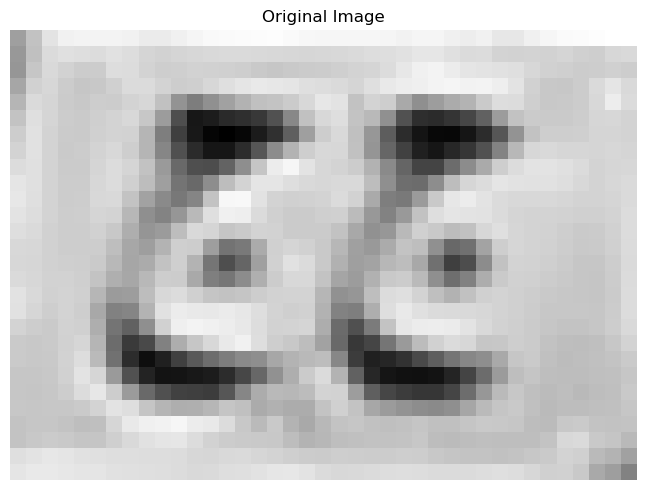

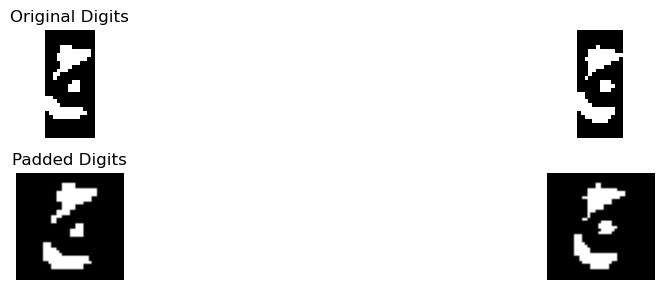

Best match: ج
Full comparison results: {'أ': 0.4625, 'ب': 0.2781001326259947, 'ج': 4.394284851621808, 'د': 3.6710942760942764, 'ر': 0.9833255693581782, 'س': 0.8035714285714286, 'ص': 0.9211309523809523, 'ط': 1.8798583662714097, 'ع': 2.327822580645161, 'ف': 2.539351851851852, 'ق': 2.542769670592251, 'ك': 2.09375, 'ل': 1.6750000000000003, 'م': 1.9772727272727273, 'ن': 2.539702380952381, 'ه': 1.3059811827956989, 'و': 1.502148404164533, 'ي': 2.0767697881828315}
Confidence :  0.3615952877637656
Best match: ج
Full comparison results: {'أ': 0.5575657894736842, 'ب': 0.5305868700265253, 'ج': 3.8159714654994974, 'د': 3.203788986354776, 'ر': 0.4497282608695652, 'س': 0.7366071428571428, 'ص': 0.7586309523809524, 'ط': 1.285655467720685, 'ع': 1.706578947368421, 'ف': 2.099771999443052, 'ق': 2.0440371762740184, 'ك': 1.1515151515151516, 'ل': 1.2039473684210527, 'م': 1.5907595693779903, 'ن': 2.2537155388471177, 'ه': 1.1435483870967742, 'و': 1.5263767056530213, 'ي': 2.2043929325822917}
Confidence :  0.3060

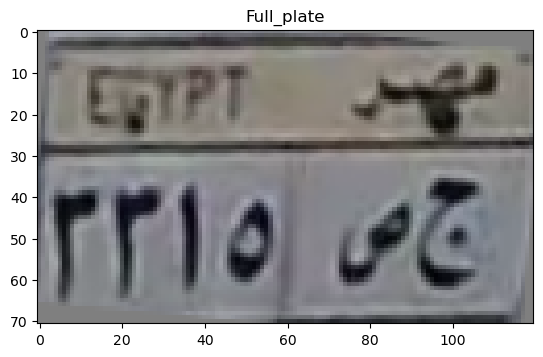

top
[0.33992475 0.20383672 0.21431147 0.23970173 0.25298279 0.26867475
 0.27865718 0.26861167 0.27447082 0.28578714 0.28345953 0.27679021
 0.28223694 0.27903534 0.27311652 0.2764659  0.27491975 0.28292032
 0.28359009 0.2840232  0.28766232 0.28377058 0.26787722 0.24187039
 0.2147154  0.18150252 0.16232352 0.18475719 0.20578658 0.22699582
 0.23744991 0.23696261 0.23861992 0.24740039 0.25356291 0.25514751
 0.25064137 0.23642907 0.22506973 0.21240012 0.20051569 0.203329
 0.20994067 0.21753266 0.22007467 0.21715797 0.2148352  0.21022229
 0.19845547 0.17826941 0.18757059 0.20323118 0.21049952 0.2210376
 0.21438141 0.20196844 0.18840127 0.17720639 0.16802665 0.13793222]
[0.3147047  0.19919452 0.20759026 0.20719973 0.20173654 0.19971458
 0.19932355 0.19992031 0.19802224 0.19217008 0.1975763  0.21054026
 0.23183986 0.2407112  0.24193411 0.2479621  0.25785512 0.2691083
 0.28773682 0.29403335 0.29067949 0.2960049  0.28503334 0.26612657
 0.27389999 0.29467961 0.29862938 0.29711271 0.30052803 0.309

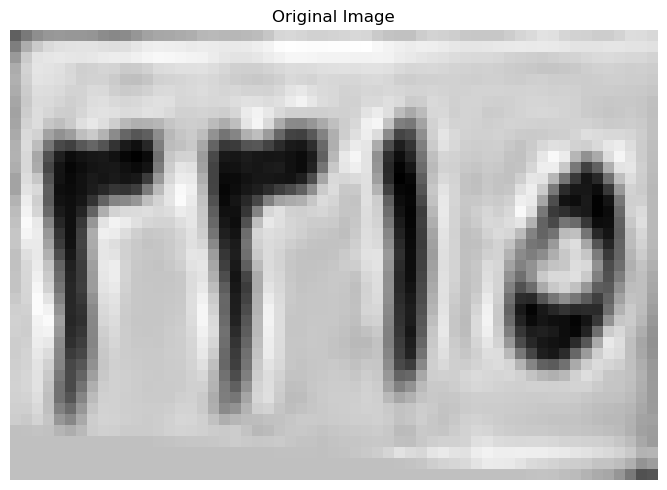

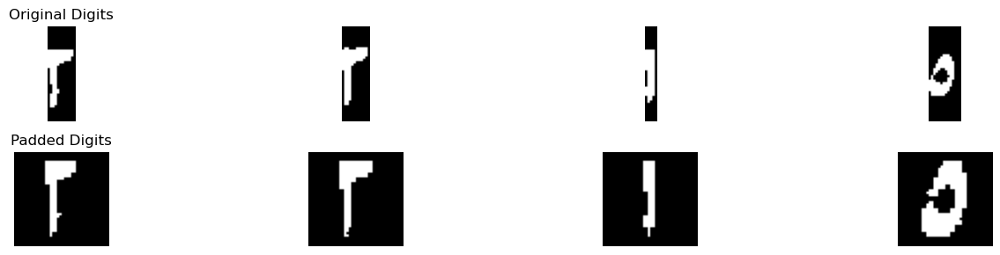

Best match: ٣
Full comparison results: {'١': 0.46153846153846156, '٢': 3.8846153846153846, '٣': 4.228521671826625, '٤': 1.4530906593406594, '٥': 1.747360128261831, '٦': 2.5714285714285716, '٧': 0.7753676470588236, '٨': 0.5916666666666667, '٩': 1.1341283308195071}
Confidence :  0.1719531436056203
Best match: ٣
Full comparison results: {'١': 0.6428571428571428, '٢': 3.4955357142857144, '٣': 4.496226780185759, '٤': 1.655357142857143, '٥': 1.821373286156568, '٦': 2.4598214285714284, '٧': 0.9830882352941177, '٨': 0.548611111111111, '٩': 1.2431139122315593}
Confidence :  0.5003455329500222
Best match: ١
Full comparison results: {'١': 4.6625, '٢': 1.7522581585081585, '٣': 1.31046826625387, '٤': 1.5193223443223443, '٥': 1.3725167698658411, '٦': 0.14285714285714285, '٧': 0.46875, '٨': 1.9152777777777776, '٩': 1.2306906737053795}
Confidence :  1.373611111111111
Best match: ٥
Full comparison results: {'١': 0.8947368421052632, '٢': 1.6661184210526316, '٣': 1.300986842105263, '٤': 2.424342105263157

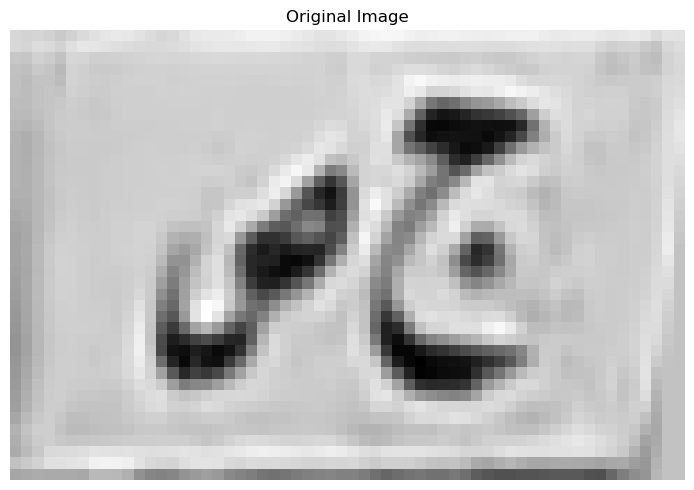

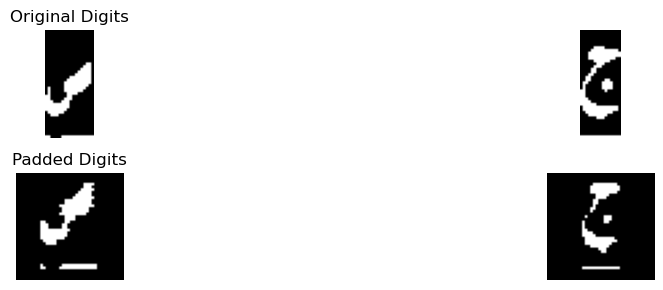

Best match: م
Full comparison results: {'أ': 0.14136904761904762, 'ب': 1.0909538019451812, 'ج': 0.1423611111111111, 'د': 0.9369059644059644, 'ر': 0.5508181623473977, 'س': 0.9955357142857143, 'ص': 0.8312499999999999, 'ط': 0.15806159420289853, 'ع': 0.8112684729064038, 'ف': 0.09523809523809523, 'ق': 0.14285714285714285, 'ك': 0.8314393939393939, 'ل': 0.37898425499231947, 'م': 2.5044642857142856, 'ن': 0.3169642857142857, 'ه': 1.0374327956989247, 'و': 0.8898809523809523, 'ي': 0.5196946169772256}
Confidence :  0.7067552418845522
Best match: م
Full comparison results: {'أ': 0.45535714285714285, 'ب': 0.3366213527851459, 'ج': 0.8982137755367068, 'د': 0.7527659984780728, 'ر': 0.23761520737327188, 'س': 0.18850806451612903, 'ص': 0.0, 'ط': 0.5576615559522291, 'ع': 0.26875, 'ف': 0.5756143831801726, 'ق': 0.28103766360345306, 'ك': 0.125, 'ل': 0.0, 'م': 1.6440484918307496, 'ن': 0.574047619047619, 'ه': 1.022513440860215, 'و': 0.22440476190476188, 'ي': 0.0625}
Confidence :  0.3107675254852673
[['٣', '٣', 

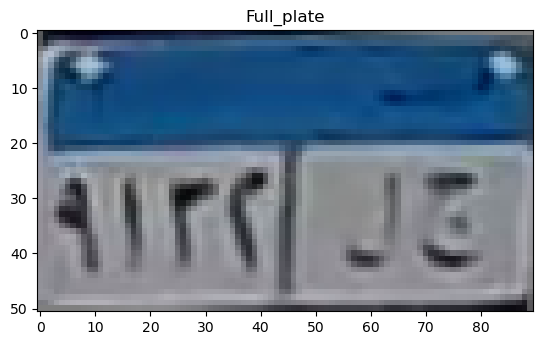

top
[0.58158807 0.50928756 0.30652353 0.21912232 0.23759583 0.21852703
 0.20548869 0.19633574 0.19550404 0.19783402 0.20474294 0.20670451
 0.21904706 0.22527637 0.22252044 0.21728147 0.21011235 0.21157299
 0.2252511  0.2442998  0.24840191 0.26738627 0.25288238 0.25266255
 0.25248015 0.25159703 0.25188667 0.25431235 0.25831784 0.26372532
 0.27660828 0.28566157 0.29069483 0.29929853 0.31042127 0.31918353
 0.32004137 0.30309897 0.30159775 0.30688037 0.32276108 0.33131346
 0.33866924 0.34948725 0.30968333]
[0.59112966 0.51815552 0.34167517 0.25825501 0.27686317 0.32188379
 0.3228464  0.32252471 0.32949042 0.347895   0.35483138 0.37278414
 0.36660975 0.36053345 0.36018835 0.35789855 0.36367142 0.37553319
 0.37955394 0.3861907  0.39073926 0.38735937 0.38544843 0.38458693
 0.39823526 0.39610463 0.39638549 0.40409178 0.4157573  0.42636196
 0.4456949  0.46028495 0.46493912 0.47164622 0.48813713 0.50128889
 0.50928701 0.47072647 0.46758315 0.46613812 0.46871377 0.47024524
 0.46729417 0.45600524 

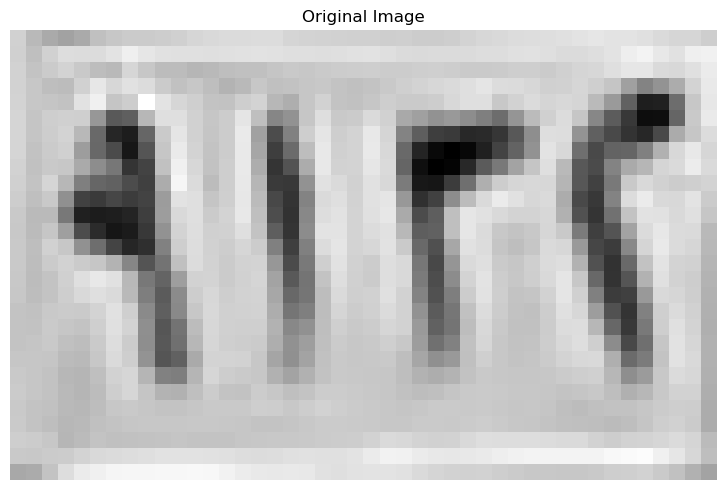

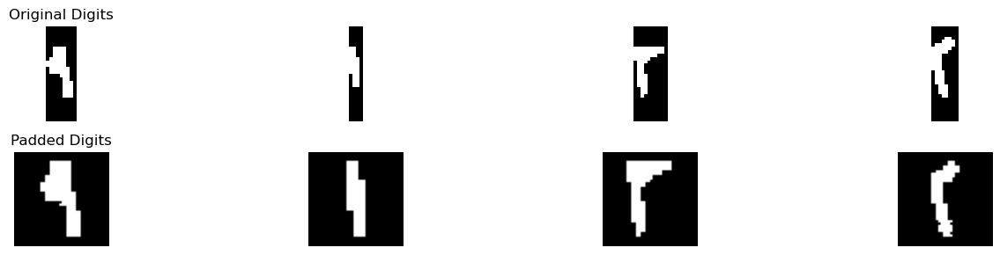

Best match: ٩
Full comparison results: {'١': 1.8933823529411764, '٢': 2.75735294117647, '٣': 1.9322755417956659, '٤': 2.1525735294117645, '٥': 3.3170748562582926, '٦': 2.497426470588236, '٧': 1.0397058823529413, '٨': 2.9669117647058822, '٩': 5.057598039215686}
Confidence :  0.8702615914786969
Best match: ١
Full comparison results: {'١': 4.3875, '٢': 2.6908508158508155, '٣': 1.328173374613003, '٤': 2.1234661172161173, '٥': 1.1111602535751142, '٦': 0.6833333333333332, '٧': 1.4654411764705884, '٨': 2.5381944444444446, '٩': 2.4529600301659125}
Confidence :  0.8483245920745923
Best match: ٣
Full comparison results: {'١': 0.5263157894736842, '٢': 1.394736842105263, '٣': 2.990131578947368, '٤': 1.2286184210526316, '٥': 1.8214285714285716, '٦': 1.800986842105263, '٧': 1.3013157894736842, '٨': 0.5131578947368421, '٩': 0.662828947368421}
Confidence :  0.5843515037593983
Best match: ٢
Full comparison results: {'١': 0.20833333333333331, '٢': 6.044871794871795, '٣': 3.8994775541795663, '٤': 3.00469

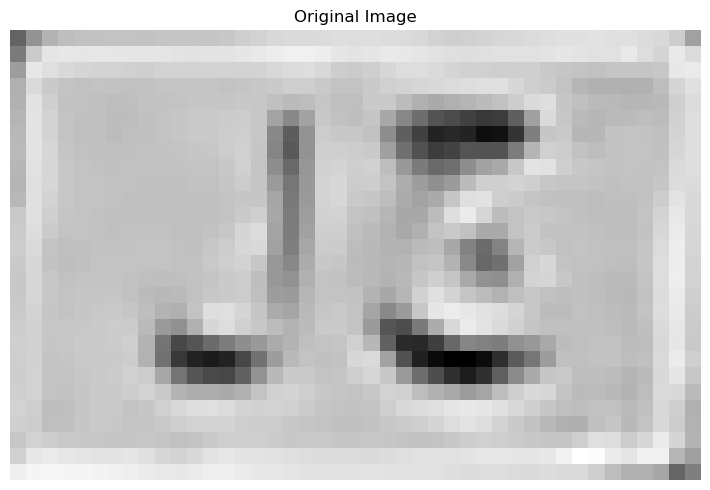

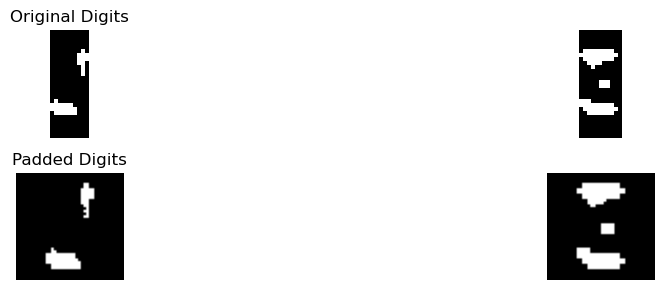

Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 0.22844827586206895, 'ج': 0.557532493673798, 'د': 2.1116038242840305, 'ر': 3.4462856933865176, 'س': 1.4330357142857144, 'ص': 1.286904761904762, 'ط': 2.217228125306848, 'ع': 1.9245537117884317, 'ف': 1.5010428737614647, 'ق': 2.613882799579261, 'ك': 1.5928030303030303, 'ل': 4.346110066833751, 'م': 0.6919191919191919, 'ن': 3.0051984126984124, 'ه': 0.5415322580645161, 'و': 2.435823754789272, 'ي': 2.3936733556298773}
Confidence :  0.4499121867236169
Best match: ج
Full comparison results: {'أ': 0.5, 'ب': 0.440815649867374, 'ج': 5.057769726247987, 'د': 2.8206917862838914, 'ر': 0.6051295986622074, 'س': 0.48214285714285715, 'ص': 0.36160714285714285, 'ط': 1.089697490512708, 'ع': 1.5636259667987173, 'ف': 2.498558504235499, 'ق': 2.6505232789828974, 'ك': 1.3418560606060606, 'ل': 1.0446950710108605, 'م': 0.6534090909090908, 'ن': 2.24593253968254, 'ه': 0.8300403225806452, 'و': 1.2989748677248678, 'ي': 1.721160963666223}
Confidence :  1.11853896998

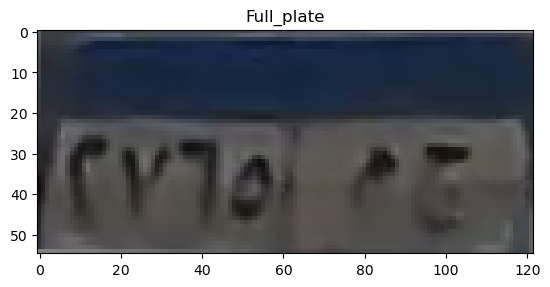

top
[0.20658897 0.20177157 0.20632605 0.20646627 0.2100202  0.24791465
 0.29379011 0.32789968 0.32945559 0.31143322 0.30036934 0.28947397
 0.28295589 0.28107135 0.2723088  0.27171137 0.26913784 0.26713876
 0.26549201 0.27304026 0.28370203 0.28836049 0.30187551 0.31888302
 0.33028391 0.33393002 0.32948316 0.32321979 0.32472914 0.32514275
 0.31615071 0.30779983 0.30369843 0.30472018 0.29568449 0.29195469
 0.27972979 0.27420714 0.2726223  0.2629364  0.25114811 0.24416763
 0.23916607 0.23328789 0.23411923 0.22616197 0.22256745 0.22256745
 0.22028115 0.21758507 0.21176782 0.2122044  0.20559824 0.20284472
 0.19854784 0.19450373 0.20094521 0.19781255 0.19981163 0.2051045
 0.20560172]
[0.21715882 0.20496635 0.20921727 0.20246941 0.20933216 0.24671962
 0.37165069 0.37254985 0.36534248 0.36593495 0.36836295 0.35272534
 0.33706475 0.32946218 0.32637446 0.32500167 0.32346382 0.32676346
 0.32799069 0.32940388 0.32742778 0.32836518 0.32941598 0.32469029
 0.33173686 0.34207564 0.34589652 0.34810643 0

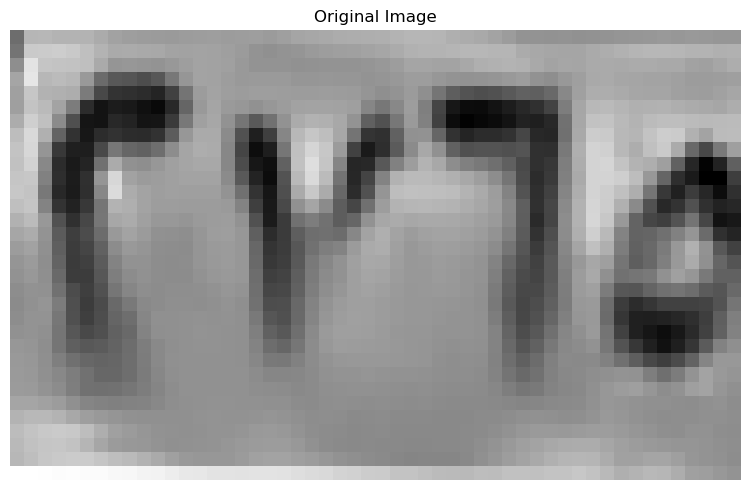

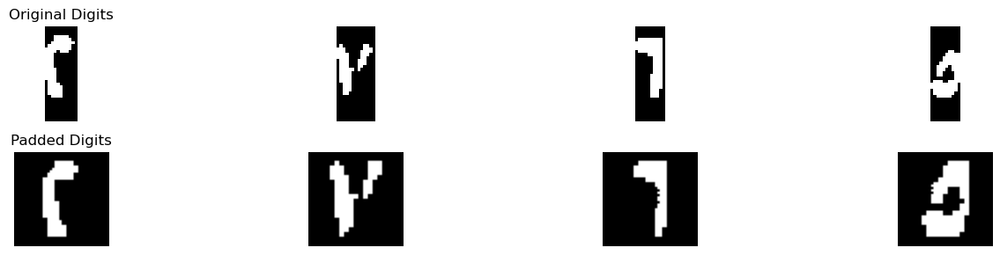

Best match: ٥
Full comparison results: {'١': 0.06666666666666667, '٢': 3.595833333333333, '٣': 3.173374613003096, '٤': 3.370833333333333, '٥': 3.8531162464985993, '٦': 1.5062499999999999, '٧': 1.168014705882353, '٨': 0.5423611111111111, '٩': 0.6763888888888889}
Confidence :  0.12864145658263304
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 0.6363636363636364, '٣': 0.53125, '٤': 0.6221590909090909, '٥': 1.5568181818181819, '٦': 0.18181818181818182, '٧': 2.7585227272727275, '٨': 0.45738636363636365, '٩': 0.23295454545454547}
Confidence :  0.6008522727272728
Best match: ٦
Full comparison results: {'١': 1.7901785714285712, '٢': 1.0357142857142856, '٣': 1.6707623839009287, '٤': 0.0, '٥': 2.8997908373875867, '٦': 6.6416666666666675, '٧': 0.4227941176470588, '٨': 0.5416666666666666, '٩': 2.6039915966386555}
Confidence :  1.8709379146395404
Best match: ٥
Full comparison results: {'١': 0.8, '٢': 0.7000000000000001, '٣': 1.1875, '٤': 2.2937499999999997, '٥': 5.577083333333333, '٦': 1.24

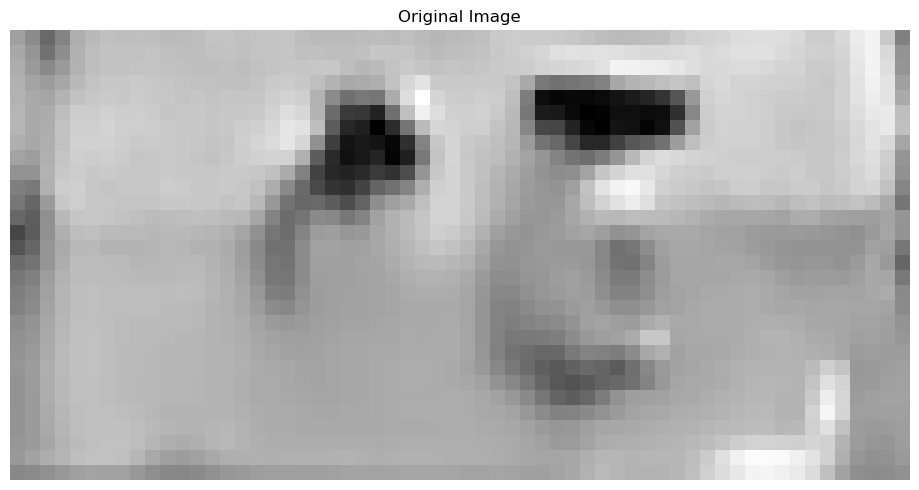

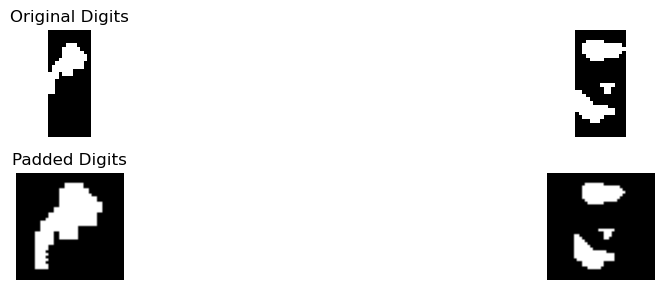

Best match: م
Full comparison results: {'أ': 0.51125, 'ب': 0.7252155172413793, 'ج': 1.3347222222222221, 'د': 1.194398148148148, 'ر': 0.28, 'س': 2.0982142857142856, 'ص': 1.5608333333333333, 'ط': 0.4, 'ع': 0.15125, 'ف': 0.5367526455026455, 'ق': 0.8076851851851851, 'ك': 0.24, 'ل': 0.32, 'م': 2.9774999999999996, 'ن': 0.7025, 'ه': 2.25, 'و': 2.026435185185185, 'ي': 0.5302564102564102}
Confidence :  0.3637499999999998
Best match: ج
Full comparison results: {'أ': 0.47368421052631576, 'ب': 0.10344827586206896, 'ج': 4.338316352475391, 'د': 2.7318759968102073, 'ر': 0.9551566416040099, 'س': 0.9866071428571428, 'ص': 0.6116071428571428, 'ط': 1.0711114067092329, 'ع': 1.3926715871219266, 'ف': 1.807504873294347, 'ق': 2.080017022843848, 'ك': 0.615530303030303, 'ل': 1.1468821510297482, 'م': 1.0677332535885167, 'ن': 2.140097117794486, 'ه': 0.9811827956989247, 'و': 0.9535849592619541, 'ي': 1.5594767173354682}
Confidence :  0.8032201778325918
[['٥', '٧', '٦', '٥'], ['م', 'ج']]
Tilt angle: -3.00 degrees


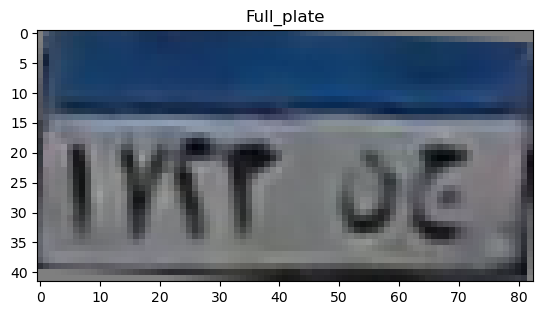

top
[0.26041368 0.35547573 0.47848705 0.50500718 0.46644005 0.46960978
 0.48896314 0.51654188 0.53722931 0.55549938 0.55703181 0.5607619
 0.5557259  0.5280119  0.5140055  0.50541941 0.53446353 0.54089214
 0.5256053  0.50720763 0.49047739 0.47863364 0.4758851  0.49206895
 0.52342396 0.56902128 0.58455809 0.58791316 0.58750498 0.57632966
 0.56492092 0.57202697 0.56686077 0.54223997 0.53700392 0.54814039
 0.5621923  0.57335476 0.58700659 0.56459131 0.55346537]
[0.27108632 0.48610065 0.55300886 0.4942849  0.44094955 0.45488704
 0.47174743 0.49144047 0.50652519 0.50605658 0.49774321 0.47549805
 0.48017664 0.5060485  0.46585164 0.43429172 0.49624846 0.50751057
 0.48807542 0.46835016 0.45257385 0.43829184 0.44524784 0.47320444
 0.45569645 0.44036556 0.39695564 0.38451395 0.45399738 0.52711319
 0.54978475 0.53373083 0.54981539 0.53287289 0.52176569 0.51162792
 0.51735369 0.52014168 0.54706417 0.51687238 0.49161445]
[0.21758728 0.46345686 0.5401332  0.52406431 0.48986548 0.46607412
 0.44529517 

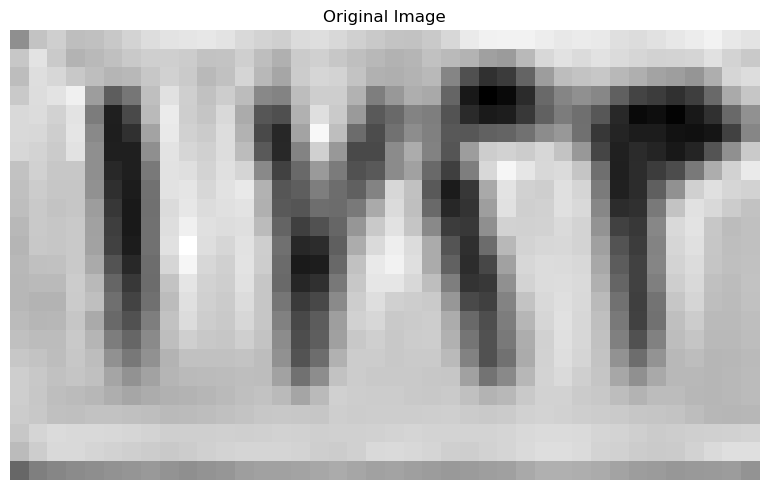

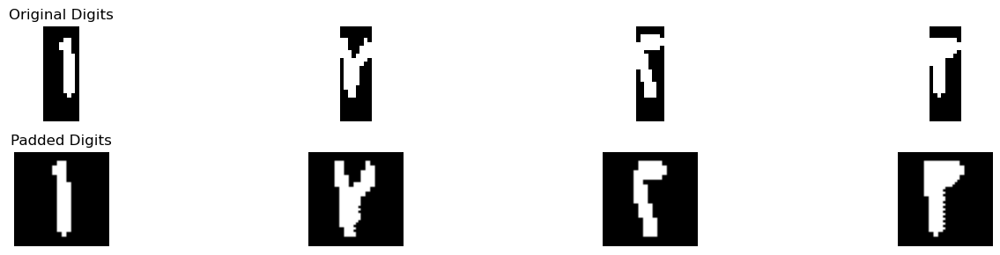

Best match: ١
Full comparison results: {'١': 5.2875, '٢': 2.479020979020979, '٣': 0.7615131578947368, '٤': 1.7157509157509157, '٥': 1.6616034571723426, '٦': 1.2452380952380953, '٧': 1.586764705882353, '٨': 2.3208333333333333, '٩': 1.8244406737053798}
Confidence :  1.4042395104895102
Best match: ٧
Full comparison results: {'١': 0.5882352941176471, '٢': 1.1764705882352942, '٣': 1.8925116099071206, '٤': 1.8382352941176472, '٥': 1.435016769865841, '٦': 0.5930147058823529, '٧': 3.9562500000000003, '٨': 1.413766339869281, '٩': 1.1548202614379086}
Confidence :  1.0318691950464398
Best match: ٢
Full comparison results: {'١': 0.07142857142857142, '٢': 6.080357142857142, '٣': 4.6848877708978325, '٤': 3.672023809523809, '٥': 2.771330900781365, '٦': 1.3077380952380953, '٧': 2.94375, '٨': 0.2625, '٩': 1.1039332399626516}
Confidence :  0.6977346859796549
Best match: ٣
Full comparison results: {'١': 0.5294117647058824, '٢': 2.1911764705882355, '٣': 4.089783281733746, '٤': 2.150735294117647, '٥': 3.18

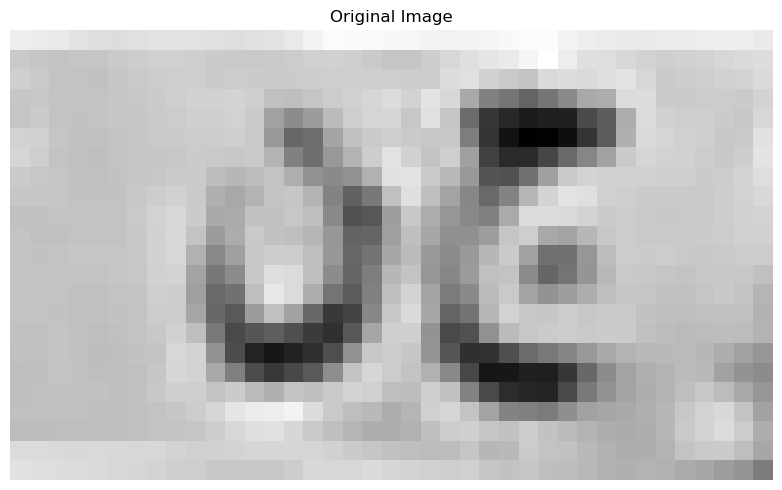

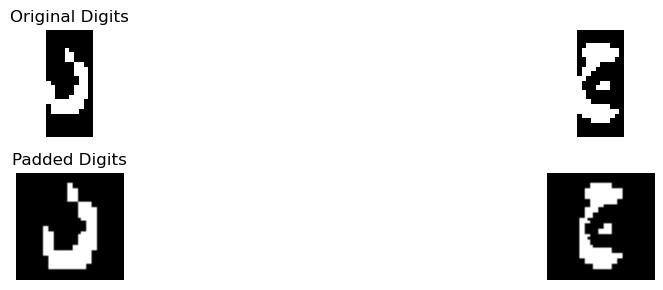

Best match: د
Full comparison results: {'أ': 0.2875, 'ب': 0.23814655172413793, 'ج': 1.8349105705083966, 'د': 4.923274410774411, 'ر': 2.4308831298636395, 'س': 1.2544642857142856, 'ص': 0.6711309523809523, 'ط': 2.2838850461133067, 'ع': 1.4125, 'ف': 3.922123015873016, 'ق': 3.297023809523809, 'ك': 1.3210227272727273, 'ل': 2.6125, 'م': 0.4943181818181819, 'ن': 4.140297619047619, 'ه': 1.9632392473118279, 'و': 3.306415343915344, 'ي': 2.08082497212932}
Confidence :  0.3914883958633961
Best match: ج
Full comparison results: {'أ': 0.78125, 'ب': 0.3943965517241379, 'ج': 4.066885208189556, 'د': 2.746507059761704, 'ر': 0.49847826086956526, 'س': 0.16964285714285715, 'ص': 0.0, 'ط': 1.0791337285902505, 'ع': 1.2595394736842105, 'ف': 1.7776559454191032, 'ق': 1.0996745335561124, 'ك': 0.38636363636363635, 'ل': 0.8014705882352942, 'م': 2.2130681818181817, 'ن': 1.4864880952380952, 'ه': 1.2071236559139784, 'و': 1.4014550264550265, 'ي': 1.4230490523968786}
Confidence :  0.6601890742139263
[['١', '٧', '٢', '٣']

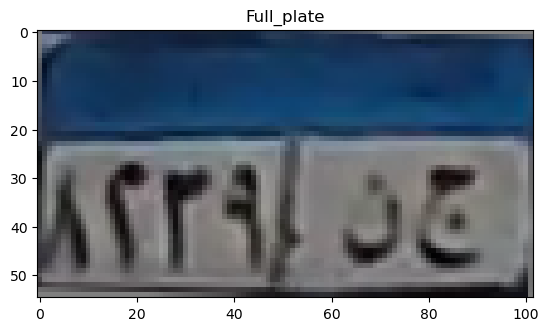

top
[0.2574685  0.20723838 0.20712581 0.20345502 0.1995009  0.19260664
 0.19734279 0.19272736 0.19286807 0.18914454 0.19872937 0.20641118
 0.21191738 0.20927943 0.20738589 0.1997851  0.19005696 0.17352707
 0.14860809 0.13278775 0.13605363 0.14093342 0.14239651 0.15034705
 0.17299145 0.19668348 0.25510647 0.27076949 0.28142936 0.29116737
 0.2781024  0.28403243 0.30373853 0.31407272 0.31861852 0.32822713
 0.33856919 0.35505353 0.38380276 0.38588993 0.37804066 0.33926922
 0.30634949 0.30409765 0.30880466 0.31588392 0.32850263 0.34174176
 0.35043125 0.34294044 0.38858081]
[0.19701717 0.22385426 0.28006409 0.35344461 0.39467164 0.38843105
 0.40412804 0.40666152 0.41994814 0.42794304 0.44758304 0.46145537
 0.46905799 0.46818767 0.46063559 0.45861353 0.46211463 0.4649476
 0.46142431 0.460015   0.46490779 0.47222441 0.47338863 0.47090335
 0.48300643 0.50602284 0.52528001 0.53400509 0.54564865 0.5496695
 0.54990501 0.54295652 0.54897131 0.55055887 0.54892815 0.55091608
 0.55590191 0.5617     0.

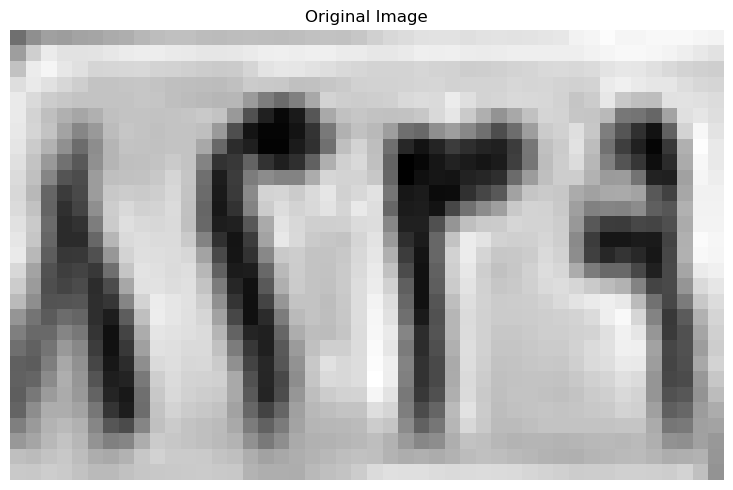

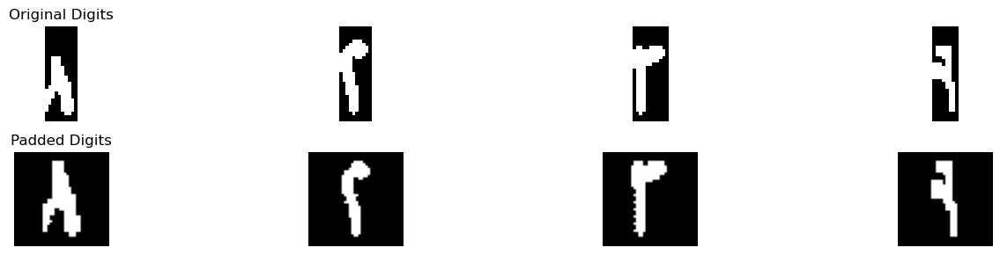

Best match: ٨
Full comparison results: {'١': 3.0625, '٢': 1.28125, '٣': 1.1755998452012384, '٤': 1.8125, '٥': 1.6435113519091848, '٦': 1.30625, '٧': 0.6529411764705882, '٨': 6.230555555555556, '٩': 3.2228349673202614}
Confidence :  1.5038602941176473
Best match: ٢
Full comparison results: {'١': 0.41666666666666663, '٢': 7.086538461538462, '٣': 4.746904024767802, '٤': 3.138026556776557, '٥': 2.247668804363851, '٦': 0.7080357142857142, '٧': 2.405882352941177, '٨': 0.6055555555555555, '٩': 1.1475615887380592}
Confidence :  1.16981721838533
Best match: ٣
Full comparison results: {'١': 0.5333333333333333, '٢': 2.94375, '٣': 4.058726780185759, '٤': 1.6520833333333333, '٥': 2.3259942134748632, '٦': 2.214583333333333, '٧': 1.2080882352941176, '٨': 0.6416666666666667, '٩': 1.0923202614379084}
Confidence :  0.5574883900928793
Best match: ٩
Full comparison results: {'١': 4.596590909090908, '٢': 3.4957022144522147, '٣': 1.1916602167182662, '٤': 2.0279532967032967, '٥': 1.0824856258292792, '٦': 0.9

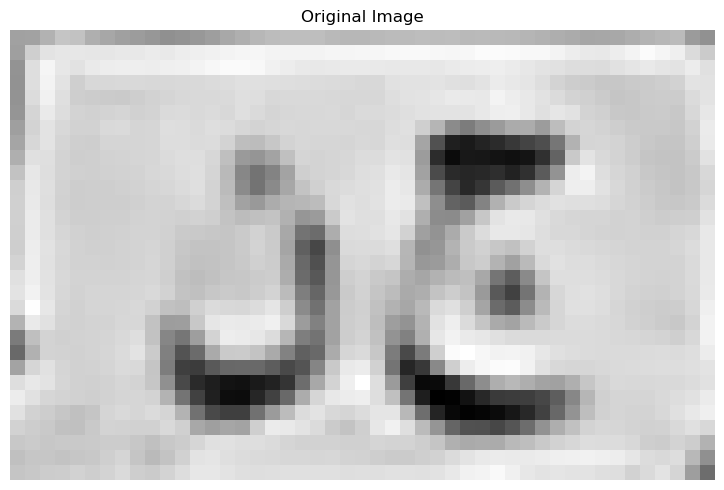

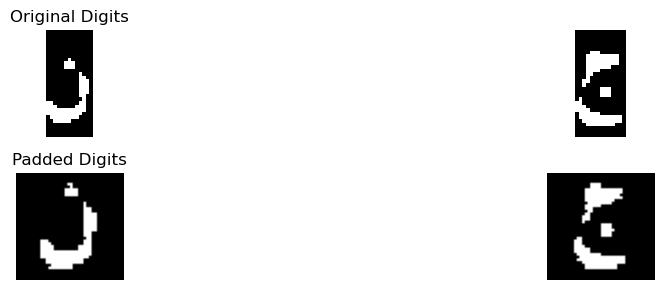

Best match: ن
Full comparison results: {'أ': 0.09375, 'ب': 0.4368368700265252, 'ج': 1.5505521048999311, 'د': 4.627298581048581, 'ر': 3.0585831191547084, 'س': 1.5982142857142856, 'ص': 1.3827380952380952, 'ط': 2.2687885162990353, 'ع': 1.6491071428571429, 'ف': 3.1202050264550265, 'ق': 3.6998933265062295, 'ك': 1.2793560606060606, 'ل': 3.767261904761905, 'م': 0.2805735930735931, 'ن': 4.940510752688172, 'ه': 1.4611559139784946, 'و': 2.8339093701996925, 'ي': 2.429288103201147}
Confidence :  0.1566060858197953
Best match: ج
Full comparison results: {'أ': 0.3157894736842105, 'ب': 0.548988726790451, 'ج': 4.781564039930744, 'د': 3.096498316498317, 'ر': 0.5668163615560641, 'س': 0.4464285714285714, 'ص': 0.5675595238095238, 'ط': 1.4663619894598157, 'ع': 2.3901315789473685, 'ف': 2.255639097744361, 'ق': 1.8880604288499026, 'ك': 1.8219696969696968, 'ل': 1.2351973684210524, 'م': 1.5053827751196172, 'ن': 1.9885839598997492, 'ه': 1.0155241935483872, 'و': 1.037733221943748, 'ي': 1.642763524614211}
Confiden

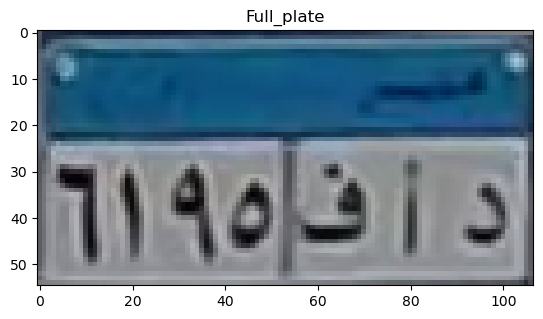

top
[0.44208387 0.43330699 0.27246403 0.18358159 0.14479169 0.15789038
 0.17891125 0.18094183 0.18545546 0.18617902 0.18707659 0.19270242
 0.19387087 0.20025936 0.20238252 0.20827216 0.21198373 0.22252879
 0.23114691 0.24128331 0.24177674 0.23576571 0.23413351 0.22597321
 0.22034422 0.20924169 0.21357656 0.21147143 0.20941767 0.2051664
 0.19609748 0.1966949  0.1922525  0.19779401 0.19262398 0.17523462
 0.1748037  0.18339557 0.18397431 0.18433165 0.18020605 0.18587039
 0.18564381 0.19318824 0.19532901 0.20462512 0.20138064 0.18186589
 0.1732749  0.15836027 0.15950104 0.16093668 0.17262263]
[0.44222785 0.45864409 0.31351434 0.25005169 0.23238536 0.21212534
 0.25675315 0.27462022 0.27685237 0.28837945 0.29067239 0.29865366
 0.31621348 0.31368811 0.32493199 0.2875286  0.25055886 0.28327682
 0.30609324 0.29810601 0.28696993 0.2793477  0.26756624 0.26000452
 0.25393706 0.25365066 0.25420741 0.25836937 0.26094414 0.26273123
 0.27520926 0.28043501 0.29507461 0.29216266 0.30491551 0.31007464
 0

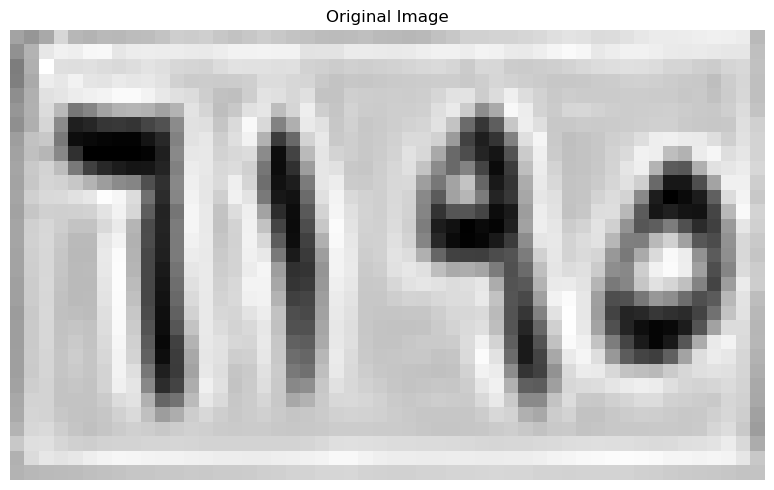

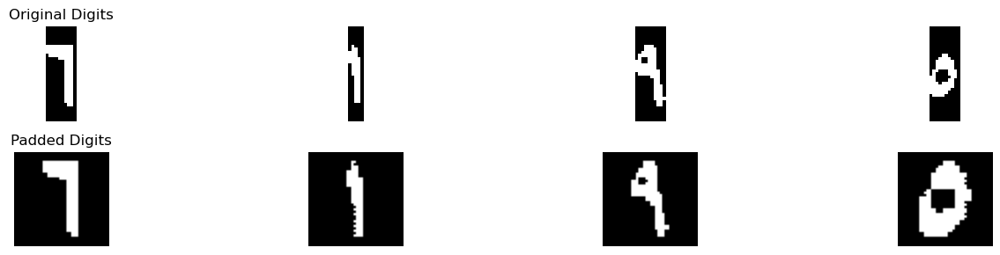

Best match: ٦
Full comparison results: {'١': 1.2666666666666666, '٢': 0.5041666666666667, '٣': 1.7884094427244581, '٤': 0.0, '٥': 2.1121001031991744, '٦': 6.241666666666667, '٧': 0.3639705882352941, '٨': 0.5590277777777778, '٩': 2.3799019607843137}
Confidence :  1.9308823529411767
Best match: ١
Full comparison results: {'١': 6.289285714285715, '٢': 1.9594259906759905, '٣': 1.21875, '٤': 1.4880723443223443, '٥': 1.0585286746277458, '٦': 0.6398809523809523, '٧': 1.0441176470588236, '٨': 2.43125, '٩': 1.2929864253393666}
Confidence :  1.9290178571428573
Best match: ٩
Full comparison results: {'١': 2.75, '٢': 2.53125, '٣': 1.578173374613003, '٤': 1.71875, '٥': 1.9251483488132093, '٦': 2.65, '٧': 0.8705882352941177, '٨': 2.576388888888889, '٩': 5.731413398692811}
Confidence :  1.4907066993464055
Best match: ٥
Full comparison results: {'١': 0.7727272727272727, '٢': 1.7017045454545456, '٣': 1.335227272727273, '٤': 2.002840909090909, '٥': 7.5369318181818175, '٦': 1.5937500000000002, '٧': 0.727

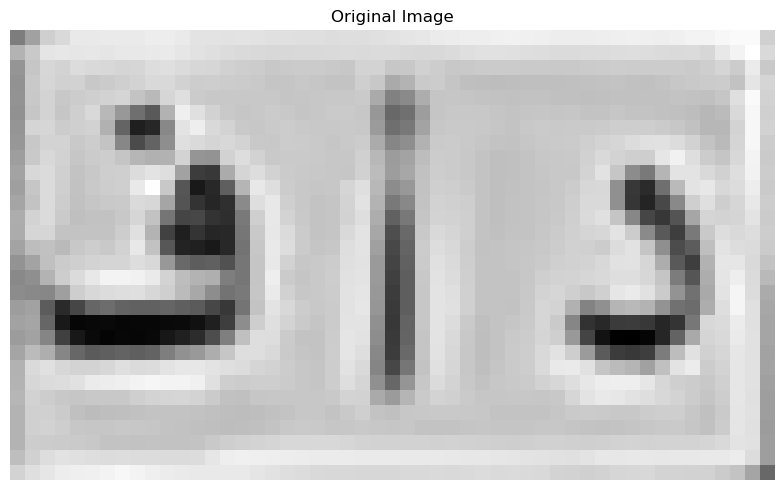

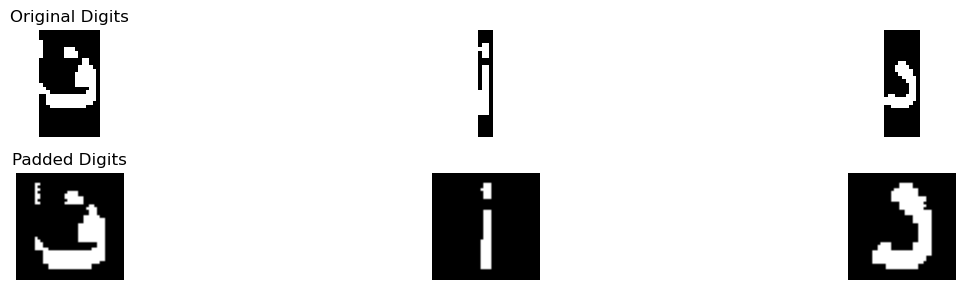

Best match: ف
Full comparison results: {'أ': 0.0, 'ب': 0.3150696286472149, 'ج': 2.0112179487179485, 'د': 4.256143162393163, 'ر': 2.6333720159151195, 'س': 1.5044642857142856, 'ص': 1.1368589743589743, 'ط': 2.9831730769230766, 'ع': 1.0216346153846154, 'ف': 4.641051078551079, 'ق': 2.9353632478632474, 'ك': 2.4951923076923075, 'ل': 1.8485576923076923, 'م': 0.25721153846153844, 'ن': 3.2115384615384617, 'ه': 3.21875, 'و': 2.299145299145299, 'ي': 2.7004807692307695}
Confidence :  0.19245395807895793
Best match: أ
Full comparison results: {'أ': 4.084476443097133, 'ب': 0.572198275862069, 'ج': 0.7894956291695422, 'د': 0.5841672790860097, 'ر': 0.1655800671093025, 'س': 0.1294642857142857, 'ص': 0.48720238095238094, 'ط': 0.8526197534349707, 'ع': 0.08388157894736842, 'ف': 0.45177179058758, 'ق': 0.10025062656641603, 'ك': 0.0, 'ل': 0.0, 'م': 0.125, 'ن': 0.48022657450076806, 'ه': 0.25309139784946233, 'و': 0.5511904761904762, 'ي': 0.4649191086691086}
Confidence :  1.615928344831081
Best match: د
Full compa

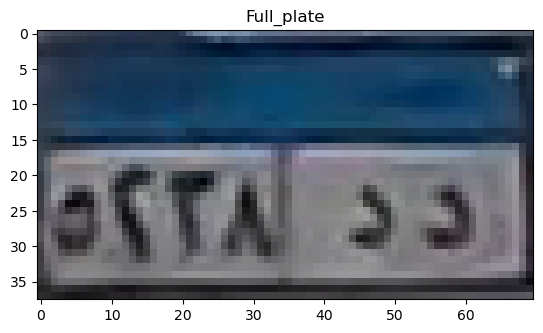

top
[0.22841922 0.2048898  0.15030824 0.11501412 0.12907843 0.11731373
 0.11708353 0.11316196 0.10197765 0.09580118 0.13924392 0.13532235
 0.1355902  0.13166863 0.13166863 0.13951176 0.15295804 0.16080118
 0.17737333 0.1695302  0.15100863 0.1549302  0.12579765 0.1039349
 0.11095961 0.12497922 0.12806745 0.12806745 0.13452667 0.1423698
 0.14207922 0.14600078 0.16560863 0.17345176 0.17737333]
[0.25106275 0.22753333 0.22020314 0.22020314 0.23001059 0.23393216
 0.25973137 0.27541765 0.29591137 0.31159765 0.31358471 0.30574157
 0.32396549 0.3474949  0.35562078 0.35169922 0.34944431 0.35336588
 0.36064353 0.36848667 0.37377725 0.37377725 0.34100588 0.42728039
 0.44299647 0.4390749  0.39177098 0.39961412 0.41896902 0.45818471
 0.38645765 0.39037922 0.38334667 0.30883686 0.26482863]
[0.27459216 0.30596471 0.40843843 0.50255608 0.52412824 0.53197137
 0.56169216 0.58914314 0.61355843 0.61748    0.60770235 0.61946706
 0.64161255 0.64161255 0.64581686 0.64973843 0.65532667 0.6631698
 0.67829059 0.

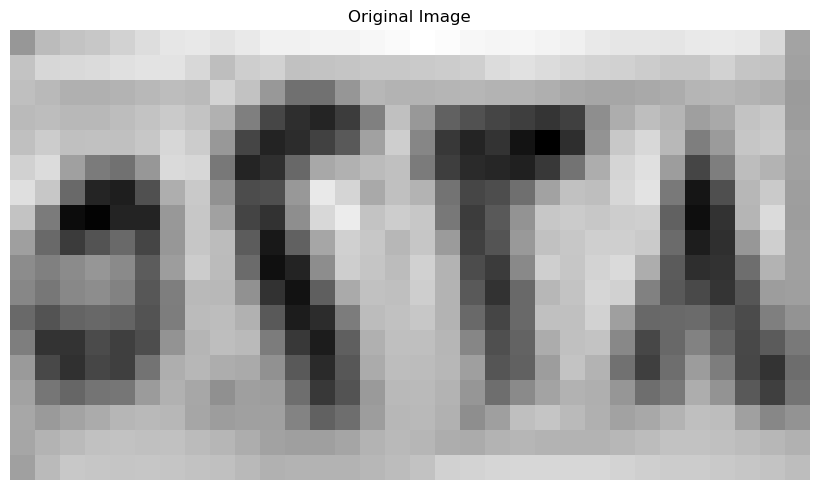

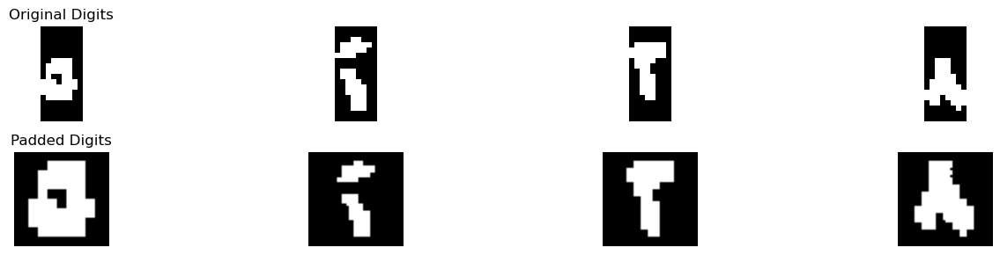

Best match: ٥
Full comparison results: {'١': 0.5357142857142857, '٢': 0.8125, '٣': 1.2633928571428572, '٤': 1.0, '٥': 4.321428571428571, '٦': 1.5714285714285716, '٧': 0.6785714285714285, '٨': 0.39285714285714285, '٩': 0.3526785714285714}
Confidence :  1.3749999999999998
Best match: ٢
Full comparison results: {'١': 0.6875, '٢': 3.875, '٣': 3.308920278637771, '٤': 1.375, '٥': 2.914671789768539, '٦': 2.03125, '٧': 1.6893382352941178, '٨': 0.7854166666666667, '٩': 1.5161356209150327}
Confidence :  0.2830398606811144
Best match: ٣
Full comparison results: {'١': 0.9500000000000001, '٢': 2.6375, '٣': 3.69375, '٤': 2.4, '٥': 2.217559523809524, '٦': 1.6875, '٧': 2.74375, '٨': 0.7937500000000001, '٩': 1.58125}
Confidence :  0.4750000000000001
Best match: ٥
Full comparison results: {'١': 1.37375, '٢': 1.73125, '٣': 1.46, '٤': 0.9600000000000001, '٥': 3.26625, '٦': 1.4337500000000003, '٧': 0.51125, '٨': 2.66375, '٩': 2.75625}
Confidence :  0.2549999999999999
In horizontal_segmentation_1
0 2
8 14
1

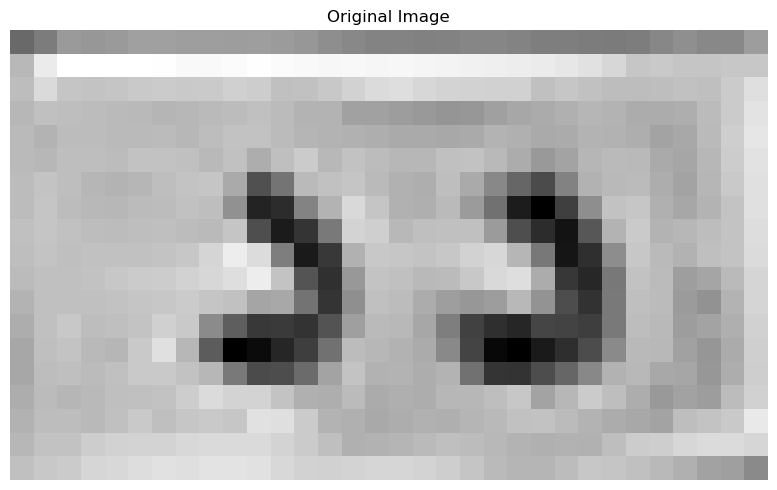

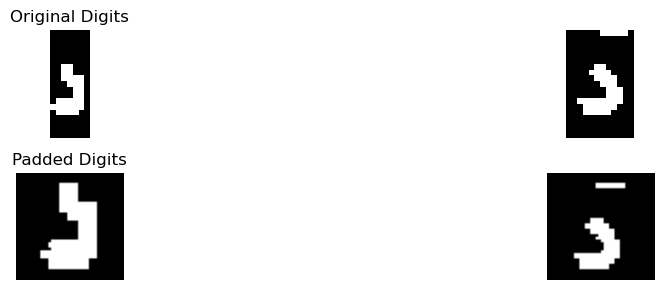

Best match: د
Full comparison results: {'أ': 0.7752976190476191, 'ب': 0.0, 'ج': 1.9634230503795722, 'د': 4.9276196488696495, 'ر': 1.4216363246947952, 'س': 1.625, 'ص': 1.0589285714285714, 'ط': 2.5539361001317524, 'ع': 1.068452380952381, 'ف': 4.553902116402115, 'ق': 2.630621693121693, 'ك': 1.696969696969697, 'ل': 1.7380952380952381, 'م': 1.6707251082251084, 'ن': 3.0125595238095237, 'ه': 4.624327956989247, 'و': 2.9432870370370368, 'ي': 1.843453376333811}
Confidence :  0.15164584594020125
Best match: ط
Full comparison results: {'أ': 0.769100169779287, 'ب': 0.6171253315649867, 'ج': 2.1789247137083088, 'د': 2.165278442317916, 'ر': 2.3336251751943577, 'س': 0.7366071428571428, 'ص': 0.731547619047619, 'ط': 3.142152503293808, 'ع': 1.2696115288220553, 'ف': 1.9650967135580886, 'ق': 1.989060201486289, 'ك': 1.9090909090909092, 'ل': 2.0806085043988274, 'م': 0.0, 'ن': 1.6056606233325248, 'ه': 0.7331317204301075, 'و': 2.127607886202963, 'ي': 2.4730848489494313}
Confidence :  0.33453382717218827
[['٥', 

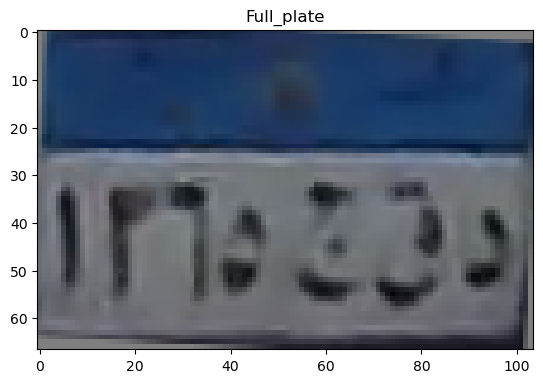

top
[0.38291278 0.35531813 0.3880832  0.4322937  0.46457883 0.48086801
 0.49418124 0.48714343 0.49855996 0.51640049 0.51779098 0.50719556
 0.50333969 0.51457733 0.52740039 0.52401498 0.52949904 0.53906553
 0.54657165 0.54112588 0.52487282 0.52363201 0.51236685 0.49339062
 0.49611306 0.50787722 0.50874252 0.51491984 0.53545731 0.56697195
 0.58894767 0.5816462  0.56109721 0.55101549 0.53329465 0.53146907
 0.53088229 0.52563456 0.51384561 0.49695301 0.48390595 0.48977968
 0.507233   0.51919263 0.52014528 0.51197676 0.50292505 0.4971737
 0.48416231 0.47067679 0.46226118 0.45976819]
[0.40636824 0.40371157 0.45732196 0.50629912 0.53072181 0.5386074
 0.53863804 0.52638314 0.51578637 0.50882275 0.49415495 0.48025833
 0.47174118 0.47541765 0.48686853 0.50338152 0.52262782 0.5353047
 0.54535444 0.55069142 0.54661355 0.53464659 0.53524187 0.53958156
 0.55251531 0.55181739 0.5386045  0.53319987 0.52847515 0.52522887
 0.53353777 0.53179    0.52840086 0.5367998  0.54046197 0.53684051
 0.53502143 0.5

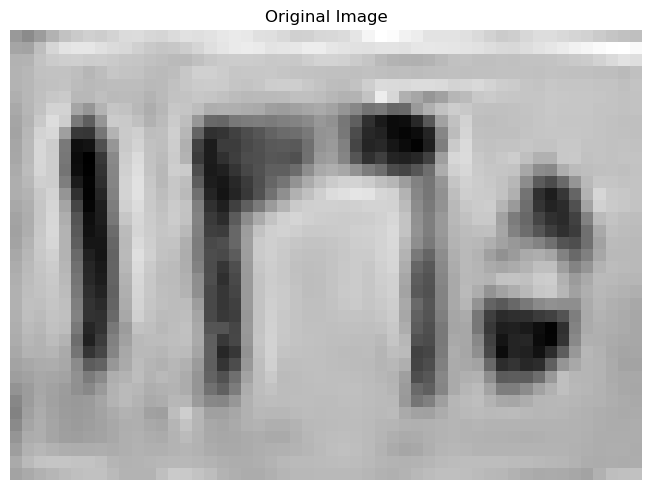

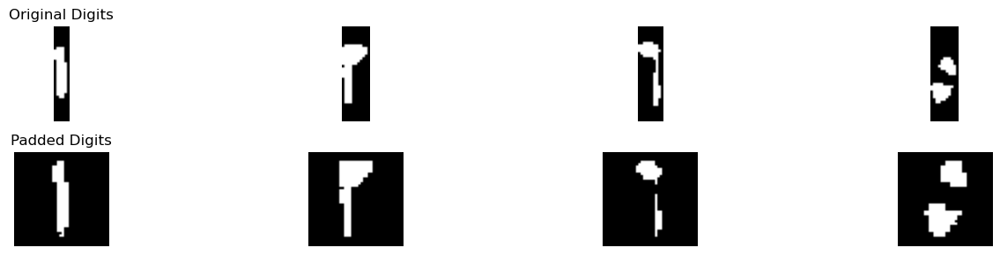

Best match: ١
Full comparison results: {'١': 5.358928571428571, '٢': 1.9189248251748252, '٣': 0.8552631578947368, '٤': 1.6443223443223443, '٥': 0.745236252395695, '٦': 1.0142857142857142, '٧': 1.5779411764705884, '٨': 2.0340277777777778, '٩': 1.143555178481649}
Confidence :  1.6624503968253965
Best match: ٣
Full comparison results: {'١': 0.888392857142857, '٢': 2.7321428571428577, '٣': 4.246226780185759, '٤': 1.762202380952381, '٥': 2.595035382574082, '٦': 2.2264880952380954, '٧': 1.036764705882353, '٨': 1.0590277777777777, '٩': 1.6804971988795518}
Confidence :  0.7570419615214505
Best match: ٦
Full comparison results: {'١': 3.0056818181818183, '٢': 1.3332604895104896, '٣': 0.6843072755417956, '٤': 0.0, '٥': 1.7035695857290285, '٦': 3.4038690476190476, '٧': 0.11764705882352941, '٨': 0.9881944444444444, '٩': 2.907946832579186}
Confidence :  0.19909361471861464
Best match: ٥
Full comparison results: {'١': 0.05555555555555555, '٢': 1.7847222222222219, '٣': 1.5548245614035088, '٤': 1.70138

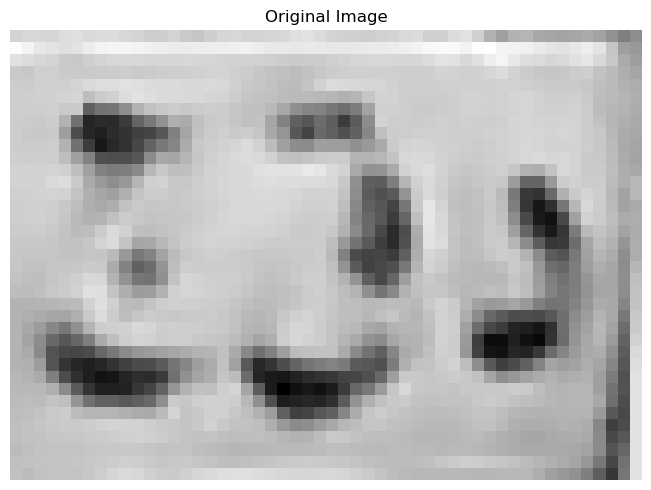

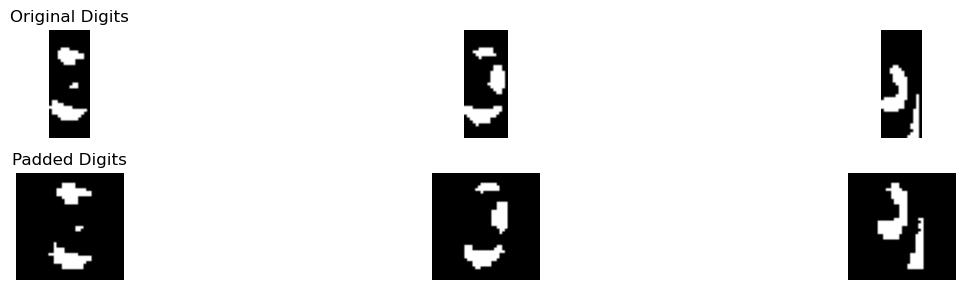

Best match: ج
Full comparison results: {'أ': 0.4155913978494623, 'ب': 0.4071995949915861, 'ج': 3.530189918776875, 'د': 2.844455402841626, 'ر': 0.44540890269151134, 'س': 0.48214285714285715, 'ص': 0.3991071428571429, 'ط': 1.160262744501875, 'ع': 1.8994761479616729, 'ف': 1.8643803729754493, 'ق': 1.9386890164479298, 'ك': 1.168560606060606, 'ل': 0.8291021671826625, 'م': 1.5255681818181819, 'ن': 2.612083333333333, 'ه': 0.344758064516129, 'و': 1.0090529012247589, 'ي': 1.231203698708958}
Confidence :  0.34286725796762463
Best match: د
Full comparison results: {'أ': 0.1875, 'ب': 0.20689655172413793, 'ج': 1.1727970340226712, 'د': 3.606108404552677, 'ر': 1.6894512565145998, 'س': 1.3794642857142856, 'ص': 1.3208333333333333, 'ط': 0.8535689999574992, 'ع': 1.1020826259196377, 'ف': 3.184521002326605, 'ق': 3.5516969784097734, 'ك': 0.17045454545454544, 'ل': 2.3307159442724457, 'م': 0.44886363636363635, 'ن': 3.350426267281106, 'ه': 1.0518145161290322, 'و': 2.294403393541325, 'ي': 1.7017349498327758}
Conf

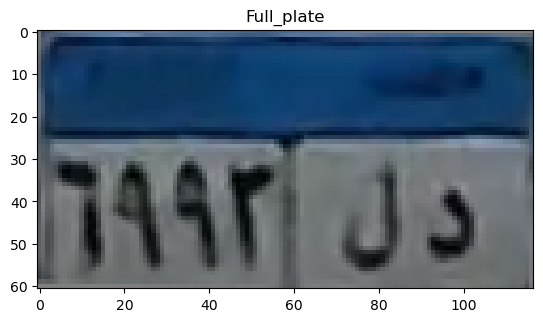

top
[0.34754639 0.24213725 0.15342517 0.1301601  0.10551491 0.08502402
 0.07846661 0.07200892 0.06724375 0.06606852 0.06719614 0.07037963
 0.07301585 0.0802733  0.08853485 0.09136326 0.09352617 0.08791862
 0.08411806 0.07684287 0.06840664 0.07080477 0.07457668 0.07841595
 0.081044   0.0856913  0.08538153 0.08683713 0.08840116 0.08699338
 0.09126307 0.09510933 0.10241053 0.1222077  0.12066404 0.11153264
 0.09969796 0.09136072 0.08575697 0.0838199  0.07953531 0.07693548
 0.07979451 0.08590592 0.09167219 0.09432389 0.08889607 0.09333555
 0.10668668 0.13254302 0.15623634 0.15090163 0.14808224 0.14800181
 0.15014944 0.14928283 0.15392946 0.16586097]
[0.34361297 0.28855137 0.23487417 0.21074941 0.1906514  0.16662304
 0.16920729 0.16454641 0.16117382 0.1605044  0.1563251  0.15308838
 0.15062745 0.14768485 0.14672056 0.15662745 0.1604525  0.15704235
 0.15701784 0.15547373 0.15155216 0.159371   0.17227289 0.18322748
 0.1951776  0.19527529 0.19471833 0.19883863 0.19492292 0.19238588
 0.19992724 

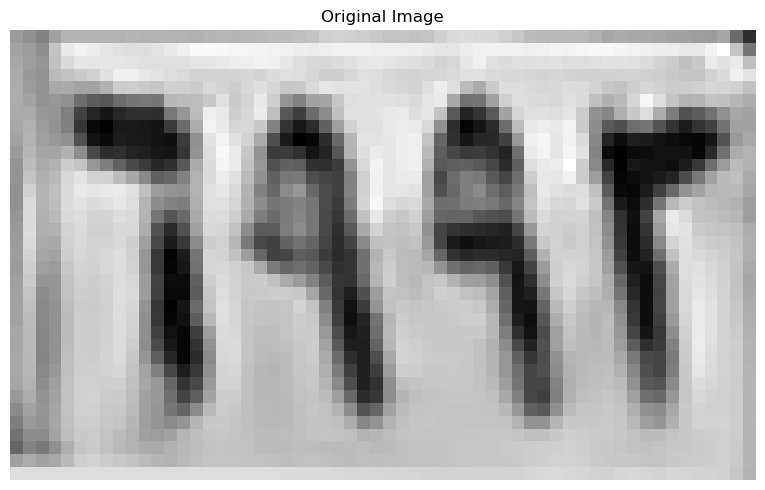

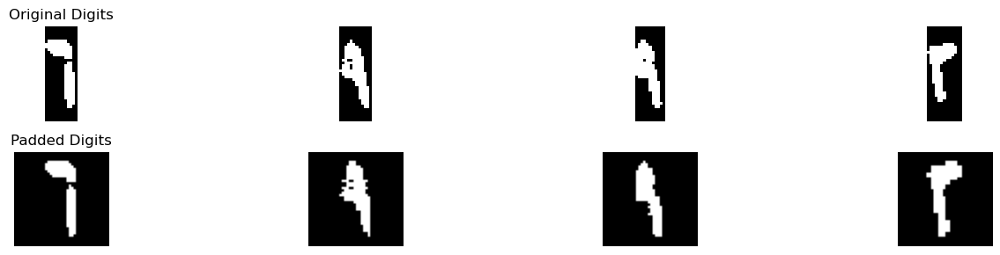

Best match: ٦
Full comparison results: {'١': 1.5408653846153846, '٢': 0.6706730769230769, '٣': 0.9655572755417956, '٤': 0.0, '٥': 1.9465253206545776, '٦': 7.026488095238095, '٧': 0.1764705882352941, '٨': 0.6458333333333333, '٩': 2.4054172951231774}
Confidence :  2.310535400057459
Best match: ٩
Full comparison results: {'١': 3.8822115384615388, '٢': 2.175480769230769, '٣': 1.1291602167182662, '٤': 1.7931089743589745, '٥': 1.6256496019460416, '٦': 2.6988095238095235, '٧': 0.6305147058823529, '٨': 3.4756944444444446, '٩': 4.982576043237808}
Confidence :  0.5501822523881346
Best match: ١
Full comparison results: {'١': 4.528409090909091, '٢': 3.197625291375291, '٣': 2.064628482972136, '٤': 2.937431318681319, '٥': 0.9709521966681409, '٦': 1.3375, '٧': 1.2544117647058823, '٨': 2.6083333333333334, '٩': 4.373318878833585}
Confidence :  0.077545106037753
Best match: ٣
Full comparison results: {'١': 0.03125, '٢': 5.2125, '٣': 5.5911377708978325, '٤': 2.50625, '٥': 2.1552548651039363, '٦': 1.40625

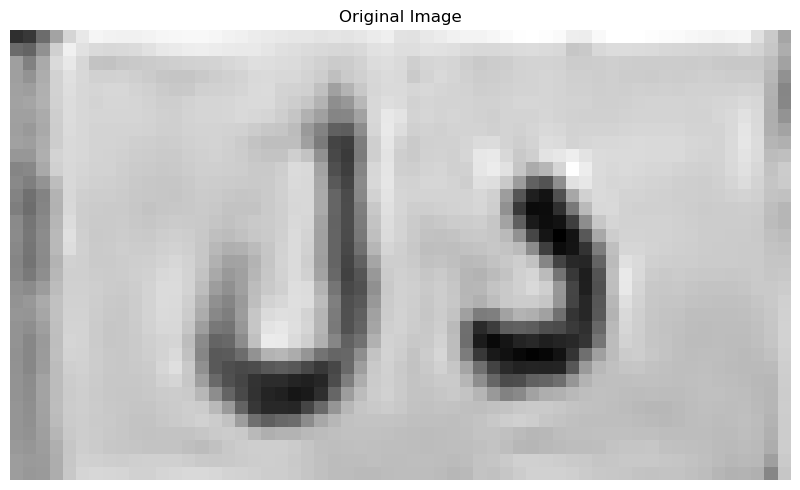

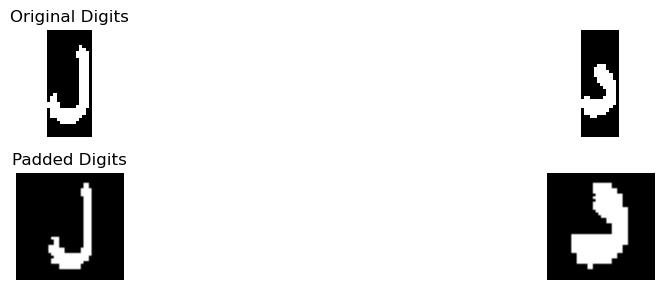

Best match: ل
Full comparison results: {'أ': 0.125, 'ب': 0.5618368700265253, 'ج': 0.6640139751552795, 'د': 2.357500807872325, 'ر': 3.0876381452131074, 'س': 0.6651785714285714, 'ص': 0.8735119047619048, 'ط': 1.5095932147562583, 'ع': 1.7986842105263157, 'ف': 1.653865566694514, 'ق': 1.8188405040378723, 'ك': 0.6922348484848485, 'ل': 5.220433436532508, 'م': 0.3125, 'ن': 3.915178571428571, 'ه': 0.8602150537634409, 'و': 2.1350859788359786, 'ي': 2.2399340393905613}
Confidence :  0.6526274325519683
Best match: د
Full comparison results: {'أ': 0.6979166666666666, 'ب': 0.09375, 'ج': 1.6542299286864504, 'د': 4.826032347282347, 'ر': 1.2981580638252301, 'س': 2.169642857142857, 'ص': 1.2874999999999999, 'ط': 1.5569416996047434, 'ع': 0.8348214285714285, 'ف': 3.4642857142857144, 'ق': 1.9976851851851851, 'ك': 0.6089015151515151, 'ل': 1.4211309523809523, 'م': 2.423160173160173, 'ن': 2.553809523809524, 'ه': 4.213978494623656, 'و': 3.0381944444444446, 'ي': 1.8500527552157986}
Confidence :  0.3060269263293458

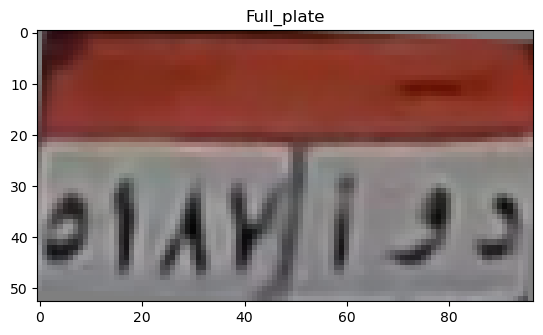

top
[0.27998976 0.333786   0.40763343 0.42311872 0.41527611 0.40886075
 0.40713994 0.39494492 0.38117236 0.37452364 0.36775042 0.36787148
 0.37456843 0.38062471 0.39145638 0.39778412 0.40961222 0.4114993
 0.40374748 0.3986262  0.39378975 0.39636271 0.40643666 0.39922218
 0.3891053  0.38096565 0.35542986 0.3288052  0.31219096 0.29181392
 0.28254898 0.28155354 0.28853651 0.29395296 0.29919142 0.2940008
 0.28552681 0.28396104 0.28261518 0.28396812 0.26749254 0.25589018
 0.25751703 0.26915984 0.25107419 0.23610836 0.23504784 0.2274531 ]
[0.36367707 0.47972166 0.56264942 0.57627701 0.56910579 0.56069978
 0.55371785 0.54759208 0.53570086 0.53324338 0.54169549 0.5392339
 0.5386444  0.54435382 0.5531633  0.54988702 0.55035393 0.54983689
 0.54433022 0.54430853 0.54082508 0.54174305 0.54574994 0.54296703
 0.54196381 0.53833096 0.52721602 0.51189989 0.51534078 0.51475137
 0.51036393 0.51097348 0.50067916 0.49657241 0.50011224 0.4854412
 0.46714233 0.45867435 0.44945684 0.4607229  0.4482202  0.436

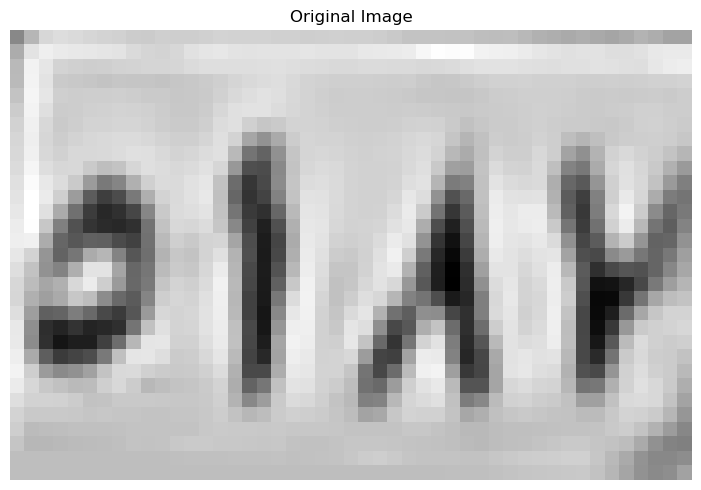

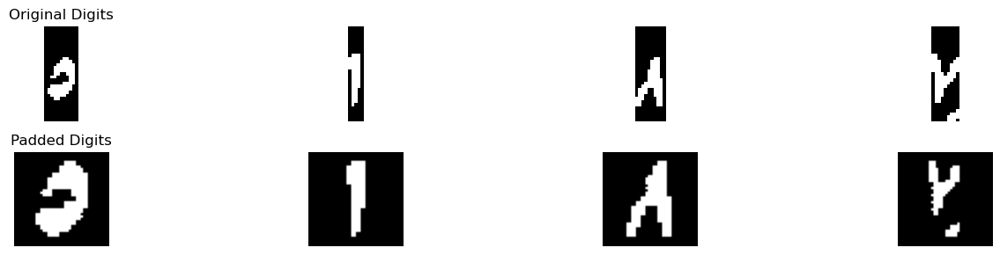

Best match: ٥
Full comparison results: {'١': 0.5909090909090908, '٢': 0.9744318181818181, '٣': 1.0880681818181819, '٤': 1.7130681818181819, '٥': 6.278409090909092, '٦': 1.3437500000000002, '٧': 0.8636363636363636, '٨': 1.0454545454545454, '٩': 0.4715909090909091}
Confidence :  2.282670454545455
Best match: ١
Full comparison results: {'١': 4.44375, '٢': 3.517846736596736, '٣': 1.6365131578947367, '٤': 1.1532509157509159, '٥': 2.376985662686127, '٦': 1.6764880952380952, '٧': 1.2926470588235295, '٨': 1.7902777777777776, '٩': 0.9981303418803419}
Confidence :  0.4629516317016318
Best match: ٨
Full comparison results: {'١': 0.9572368421052632, '٢': 0.0, '٣': 0.21052631578947367, '٤': 0.3569078947368421, '٥': 2.1848370927318292, '٦': 1.2957236842105262, '٧': 0.7128289473684211, '٨': 4.116447368421053, '٩': 1.524671052631579}
Confidence :  0.9658051378446117
Best match: ٢
Full comparison results: {'١': 0.40384615384615385, '٢': 2.829326923076923, '٣': 2.4145704334365323, '٤': 1.571322226160935

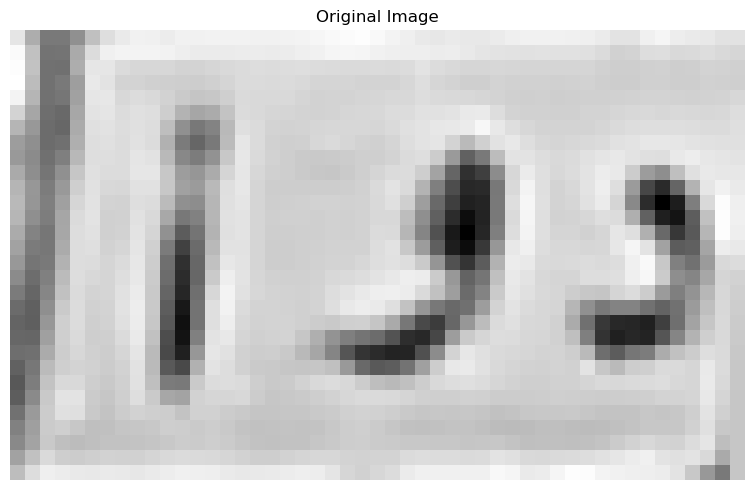

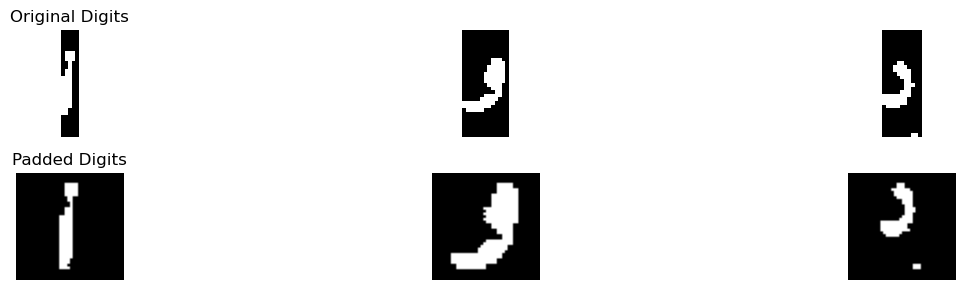

Best match: أ
Full comparison results: {'أ': 1.9639423076923075, 'ب': 0.15625, 'ج': 0.20930383022774326, 'د': 0.37272058823529414, 'ر': 0.0625, 'س': 0.0, 'ص': 0.2720238095238095, 'ط': 1.04590744400527, 'ع': 0.25, 'ف': 0.21875, 'ق': 0.10555555555555556, 'ك': 0.23674242424242423, 'ل': 0.0, 'م': 0.6938061938061939, 'ن': 0.3125, 'ه': 0.6404569892473118, 'و': 0.580654761904762, 'ي': 0.26785714285714285}
Confidence :  0.45901743184351873
Best match: و
Full comparison results: {'أ': 0.32, 'ب': 0.49610411140583555, 'ج': 0.46375, 'د': 3.9810185185185185, 'ر': 4.007758620689655, 'س': 3.6294642857142856, 'ص': 2.700833333333333, 'ط': 2.715, 'ع': 0.6675, 'ف': 3.4305489417989414, 'ق': 2.6618055555555555, 'ك': 2.2199999999999998, 'ل': 2.4112500000000003, 'م': 0.08, 'ن': 1.94375, 'ه': 2.9375, 'و': 4.6527314814814815, 'ي': 3.6041025641025644}
Confidence :  0.3224864303959132
Best match: م
Full comparison results: {'أ': 0.37916666666666665, 'ب': 1.0001657824933687, 'ج': 0.6572133080285254, 'د': 1.179947

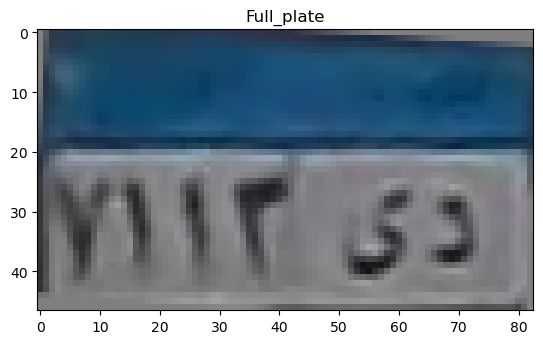

top
[0.28364441 0.24158343 0.24776275 0.23362696 0.21765074 0.18570353
 0.16108387 0.16631804 0.17437148 0.16851211 0.1612664  0.16410495
 0.17419956 0.18078762 0.19109914 0.19478256 0.18930824 0.18550061
 0.1881901  0.1934469  0.19962012 0.19136863 0.18050349 0.1722849
 0.16577877 0.18150844 0.17732542 0.16303488 0.16986999 0.17297032
 0.16712079 0.16172353 0.17929442 0.19132395 0.19494765 0.200331
 0.20677846 0.21582028 0.22164135 0.22028471 0.21351594]
[0.25800938 0.22974192 0.2353077  0.22379406 0.24682303 0.26120831
 0.22286157 0.20797545 0.20649078 0.20900227 0.19896262 0.18348984
 0.17374115 0.17238048 0.1859681  0.20016847 0.21668961 0.24436914
 0.2502536  0.24604726 0.24336688 0.24624678 0.2463004  0.23963281
 0.20946794 0.24126941 0.25009294 0.24205108 0.26640841 0.21276347
 0.21380347 0.23571756 0.24672819 0.25020285 0.24450294 0.2339857
 0.21408354 0.20241232 0.18701493 0.17250095 0.16479192]
[0.22589278 0.25360765 0.30856498 0.35842711 0.42991914 0.50540858
 0.49304196 0.4

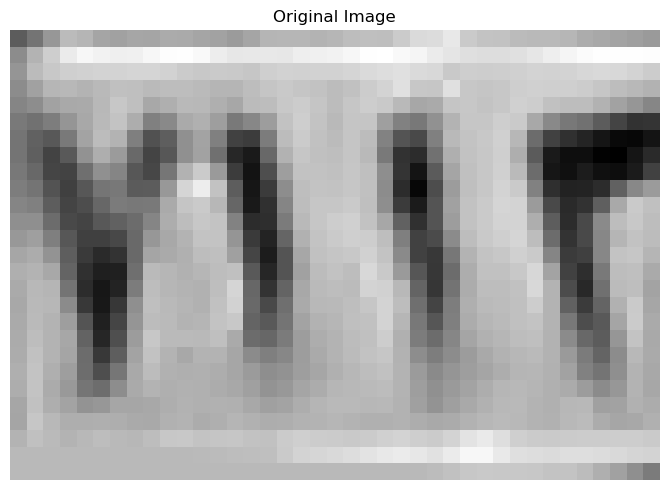

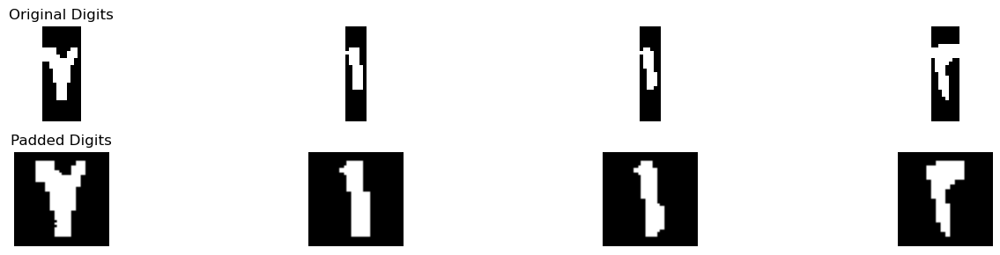

Best match: ٧
Full comparison results: {'١': 0.8095238095238094, '٢': 1.4717261904761905, '٣': 2.517857142857143, '٤': 1.3794642857142858, '٥': 2.419642857142857, '٦': 1.5684523809523807, '٧': 2.9434523809523814, '٨': 1.232142857142857, '٩': 1.9404761904761902}
Confidence :  0.2127976190476193
Best match: ٢
Full comparison results: {'١': 3.0, '٢': 3.197115384615384, '٣': 1.34171826625387, '٤': 1.2470009157509159, '٥': 2.3801184947663274, '٦': 2.654166666666667, '٧': 0.6566176470588236, '٨': 2.375, '٩': 2.349139014580191}
Confidence :  0.09855769230769207
Best match: ١
Full comparison results: {'١': 3.4519230769230766, '٢': 2.5913461538461537, '٣': 1.34171826625387, '٤': 2.2172161172161173, '٥': 1.6291740380362671, '٦': 1.182440476190476, '٧': 0.8128676470588236, '٨': 2.780555555555556, '٩': 2.7647844394167924}
Confidence :  0.3356837606837604
Best match: ٣
Full comparison results: {'١': 0.71875, '٢': 5.3125, '٣': 5.91515092879257, '٤': 2.78125, '٥': 2.4409737579242226, '٦': 1.75, '٧': 

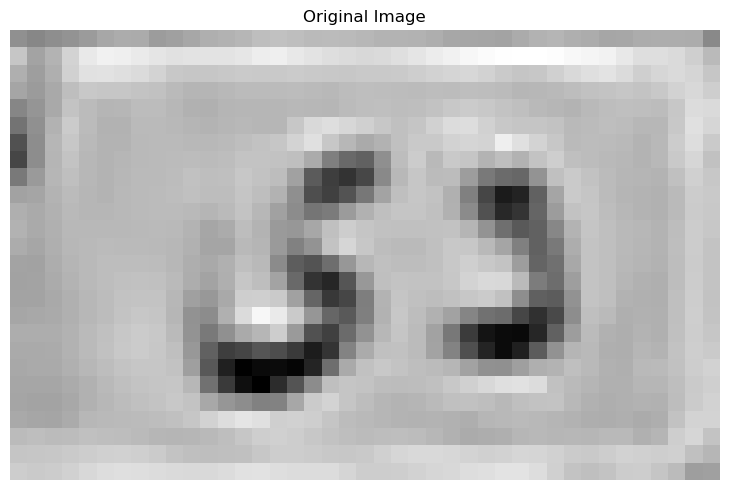

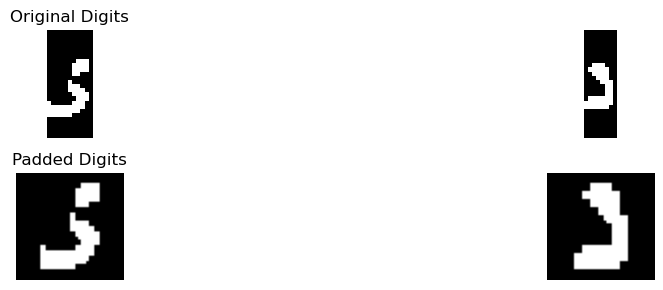

Best match: ي
Full comparison results: {'أ': 0.3885630498533725, 'ب': 0.3943965517241379, 'ج': 1.8149843750737862, 'د': 3.741026936026936, 'ر': 3.681233474172005, 'س': 1.6339285714285714, 'ص': 1.8708333333333333, 'ط': 2.6305006587615285, 'ع': 1.0568181818181817, 'ف': 3.869212962962963, 'ق': 3.334069865319865, 'ك': 2.4299242424242427, 'ل': 2.810227272727273, 'م': 0.16761363636363635, 'ن': 2.4570454545454545, 'ه': 1.4872983870967742, 'و': 3.893202861952862, 'ي': 4.648445964390915}
Confidence :  0.37762155121902663
Best match: د
Full comparison results: {'أ': 0.68125, 'ب': 0.0, 'ج': 3.4674286864504253, 'د': 4.981885521885522, 'ر': 1.704548529306775, 'س': 1.3482142857142856, 'ص': 0.8919642857142858, 'ط': 2.684123847167325, 'ع': 1.2, 'ف': 4.268320105820107, 'ق': 2.622883597883598, 'ك': 1.3068181818181817, 'ل': 1.59375, 'م': 1.6102272727272726, 'ن': 2.7825595238095238, 'ه': 3.7420698924731184, 'و': 3.2048611111111116, 'ي': 1.7297798216276477}
Confidence :  0.3567827080327075
[['٧', '٢', '١',

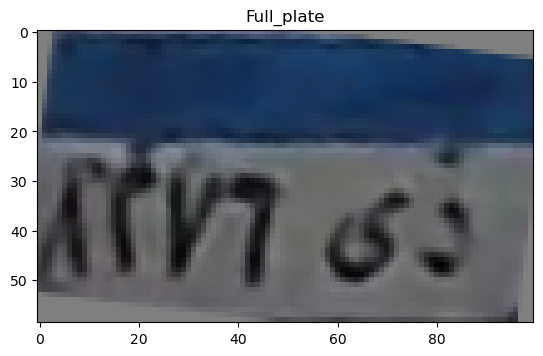

top
[0.45288665 0.4446227  0.47627851 0.49921929 0.48750852 0.4790966
 0.49254718 0.51012735 0.51875197 0.52172344 0.51084792 0.50414592
 0.50048211 0.49767078 0.49472816 0.50858796 0.50591392 0.44308936
 0.31953088 0.21129407 0.16798824 0.16936827 0.19578895 0.25558123
 0.33048526 0.39107722 0.44064671 0.4298172  0.41309203 0.40501335
 0.41523371 0.42521761 0.41724608 0.44360333 0.47815936 0.4762442
 0.46686036 0.45401547 0.43779951 0.41746241 0.38572117 0.37954483
 0.39846093 0.39505556 0.36796586 0.36466493 0.37219584 0.36327662
 0.3338858  0.33362607]
[0.43152702 0.41897176 0.44398317 0.4677112  0.4731376  0.46957389
 0.47434651 0.4868132  0.49411218 0.49866463 0.50221161 0.50502977
 0.50622007 0.5077398  0.51028787 0.54209797 0.55522108 0.47566199
 0.33392808 0.22559953 0.17238041 0.18222234 0.25744453 0.35728477
 0.44196826 0.49422855 0.53012362 0.54778579 0.53313367 0.47723836
 0.42839305 0.41622615 0.42381732 0.43307181 0.45095118 0.47525123
 0.48810005 0.49189792 0.49380569 0.

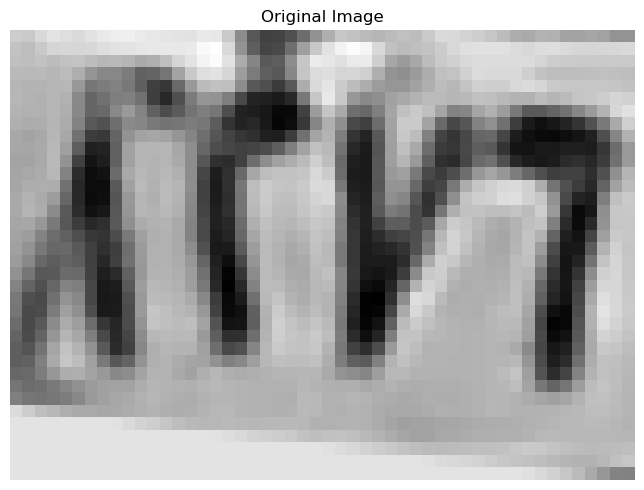

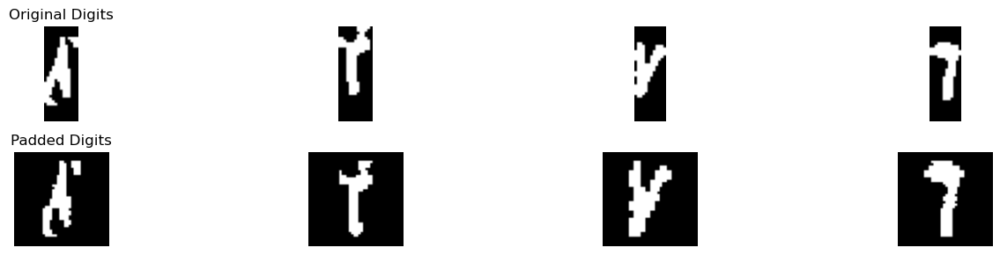

Best match: ٨
Full comparison results: {'١': 2.8125, '٢': 1.3125, '٣': 2.060952012383901, '٤': 1.125, '٥': 1.3491034571723424, '٦': 0.25, '٧': 1.6786764705882353, '٨': 4.520833333333333, '٩': 2.1403186274509802}
Confidence :  0.8541666666666665
Best match: ٣
Full comparison results: {'١': 0.7321428571428571, '٢': 2.508928571428571, '٣': 3.182275541795666, '٤': 1.7267857142857144, '٥': 1.8930460342031548, '٦': 0.6773809523809523, '٧': 2.2948529411764707, '٨': 0.7173611111111111, '٩': 0.2361111111111111}
Confidence :  0.33667348518354734
Best match: ٧
Full comparison results: {'١': 0.5555555555555556, '٢': 0.7222222222222221, '٣': 1.3870614035087718, '٤': 1.1631944444444444, '٥': 1.333359440267335, '٦': 0.3347222222222222, '٧': 3.547222222222222, '٨': 1.4930555555555554, '٩': 1.3472222222222223}
Confidence :  1.0270833333333333
Best match: ٦
Full comparison results: {'١': 1.7113970588235294, '٢': 2.204044117647059, '٣': 2.8164667182662537, '٤': 0.8584558823529411, '٥': 2.7215234778121777

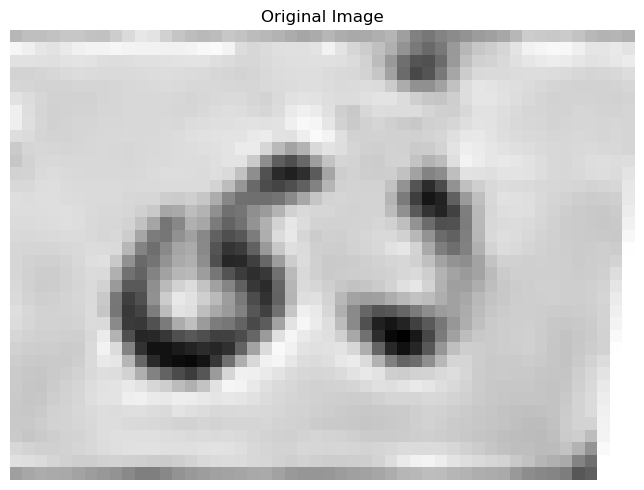

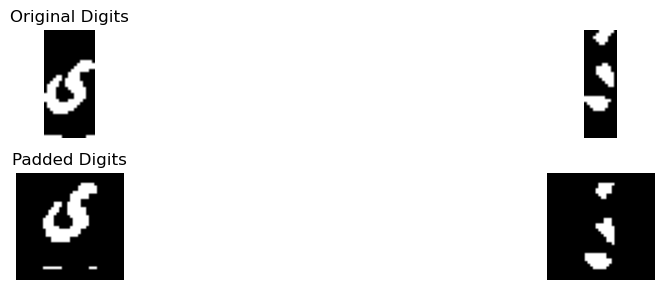

Best match: م
Full comparison results: {'أ': 0.1, 'ب': 1.3729971018764124, 'ج': 0.8695220841959973, 'د': 0.3325, 'ر': 0.09375, 'س': 0.5803571428571428, 'ص': 0.9913690476190475, 'ط': 0.0, 'ع': 0.17946428571428572, 'ف': 0.45625000000000004, 'ق': 0.6515873015873016, 'ك': 0.041666666666666664, 'ل': 0.3, 'م': 2.131176686217009, 'ن': 0.09761904761904762, 'ه': 1.0788978494623656, 'و': 1.0880621693121693, 'ي': 0.8386078595317725}
Confidence :  0.37908979217029826
Best match: ي
Full comparison results: {'أ': 0.793005485893417, 'ب': 0.9592506631299734, 'ج': 1.7898047504025765, 'د': 1.4244847708080506, 'ر': 1.1564458842007568, 'س': 0.7008928571428572, 'ص': 0.5261904761904762, 'ط': 1.0646821475625823, 'ع': 0.5735501949317738, 'ف': 1.6580513784461153, 'ق': 1.6951545530492897, 'ك': 0.3409090909090909, 'ل': 1.7409093178867472, 'م': 0.3125, 'ن': 1.9411194316436253, 'ه': 0.0, 'و': 1.5655753968253967, 'ي': 2.19345459647879}
Confidence :  0.1261675824175823
[['٨', '٣', '٧', '٦'], ['م', 'ي']]
Tilt angle: 

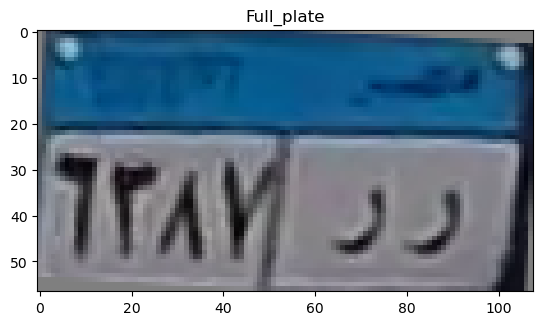

top
[0.37764081 0.31308228 0.28240413 0.32664911 0.32893082 0.36532137
 0.43295311 0.47337897 0.46009006 0.4300073  0.40794267 0.38801567
 0.36669314 0.3713255  0.39858923 0.40119442 0.40309532 0.42143607
 0.42650207 0.4159094  0.42573985 0.40946598 0.39873489 0.40825385
 0.41786439 0.41696343 0.41428278 0.40832356 0.39511031 0.37046718
 0.34764697 0.33034913 0.31165189 0.30039087 0.28127959 0.29857555
 0.34944578 0.34869563 0.33891216 0.35398836 0.36608564 0.36759873
 0.36754221 0.36633969 0.35625238 0.3383024  0.32120206 0.29537485
 0.26158196 0.2306077  0.21519716 0.20400745 0.18234265 0.13179118]
[0.36289491 0.34174783 0.36728034 0.50808672 0.61202475 0.64870521
 0.64746555 0.64440455 0.62184424 0.59217619 0.58156469 0.58004881
 0.57651363 0.53345538 0.61120716 0.63998195 0.63977811 0.64694453
 0.65431436 0.65446558 0.65371727 0.65917234 0.65108559 0.63427294
 0.62244936 0.61847373 0.61807784 0.61722    0.61483029 0.61293078
 0.60671142 0.59800324 0.58455108 0.57805093 0.57189371 0

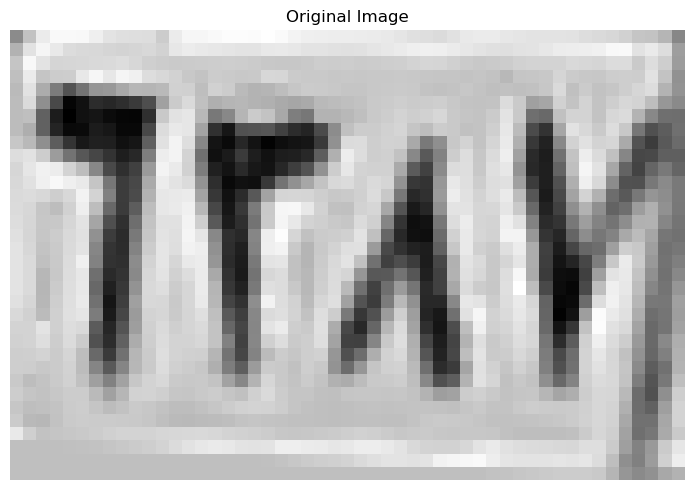

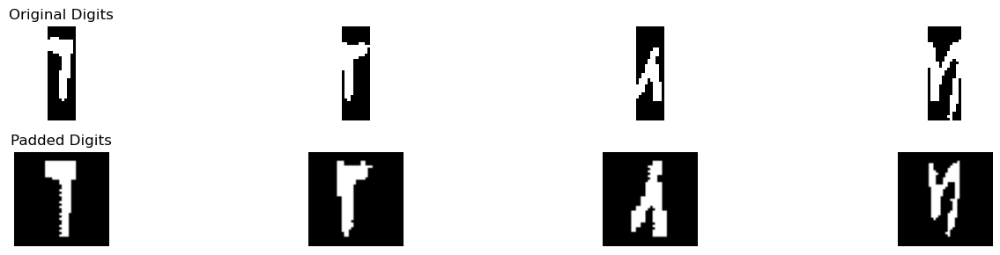

Best match: ٦
Full comparison results: {'١': 3.5889423076923075, '٢': 3.286057692307692, '٣': 2.869775541795666, '٤': 0.6793040293040293, '٥': 2.0615048651039363, '٦': 3.9190476190476193, '٧': 1.6397058823529413, '٨': 0.9715277777777778, '٩': 2.2402746354952234}
Confidence :  0.16505265567765592
Best match: ٣
Full comparison results: {'١': 0.6, '٢': 3.129166666666667, '٣': 3.579624613003096, '٤': 2.30625, '٥': 1.9863122880731239, '٦': 1.6395833333333332, '٧': 1.293014705882353, '٨': 0.5986111111111111, '٩': 1.0205882352941176}
Confidence :  0.22522897316821466
Best match: ٨
Full comparison results: {'١': 1.99375, '٢': 0.9604166666666667, '٣': 0.5, '٤': 0.86875, '٥': 1.781590925844022, '٦': 1.0999999999999999, '٧': 0.886764705882353, '٨': 4.627777777777777, '٩': 1.7180964052287582}
Confidence :  1.3170138888888887
Best match: ٢
Full comparison results: {'١': 0.8846153846153846, '٢': 2.6875, '٣': 1.6958204334365325, '٤': 0.8410485347985348, '٥': 1.9409737579242223, '٦': 2.061904761904762

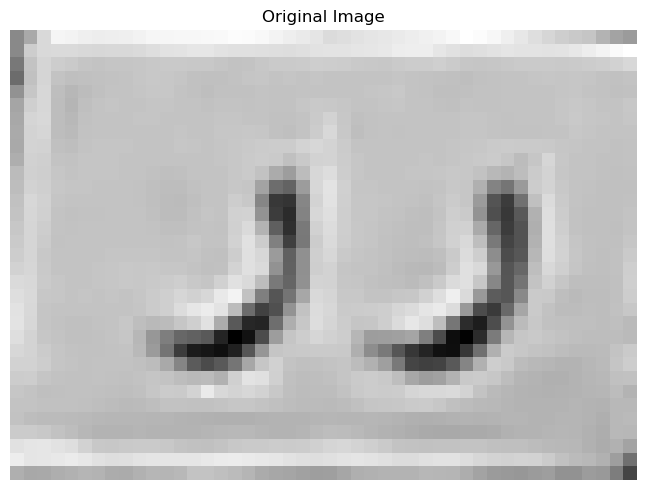

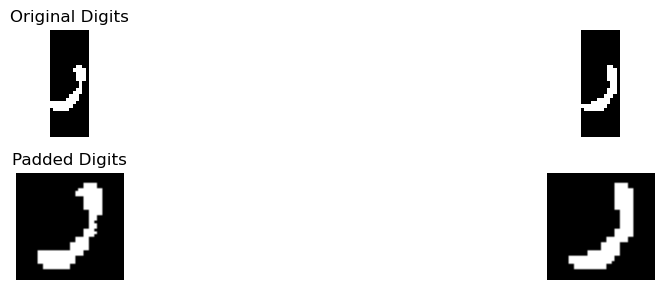

Best match: ر
Full comparison results: {'أ': 0.08333333333333333, 'ب': 0.3013925729442971, 'ج': 0.4340277777777778, 'د': 3.3203240740740743, 'ر': 4.397241379310345, 'س': 2.705357142857143, 'ص': 2.125, 'ط': 2.4583333333333335, 'ع': 0.6041666666666666, 'ف': 2.4983465608465605, 'ق': 2.564814814814815, 'ك': 2.0, 'ل': 2.666666666666667, 'م': 0.041666666666666664, 'ن': 2.42625, 'ه': 1.3497983870967742, 'و': 3.331018518518518, 'ي': 3.224679487179487}
Confidence :  0.5331114303959135
Best match: ر
Full comparison results: {'أ': 0.041666666666666664, 'ب': 0.5578580901856763, 'ج': 0.6354166666666666, 'د': 3.2153703703703704, 'ر': 5.292255747126436, 'س': 1.7008928571428572, 'ص': 1.6708333333333334, 'ط': 3.4687499999999996, 'ع': 1.03125, 'ف': 3.156911375661376, 'ق': 2.4305555555555554, 'ك': 2.729166666666666, 'ل': 2.8125, 'م': 0.0, 'ن': 3.0720833333333335, 'ه': 0.9112903225806451, 'و': 3.8518518518518516, 'ي': 3.28301282051282}
Confidence :  0.7202019476372923
[['٦', '٣', '٨', '٢'], ['ر', 'ر']]
Ti

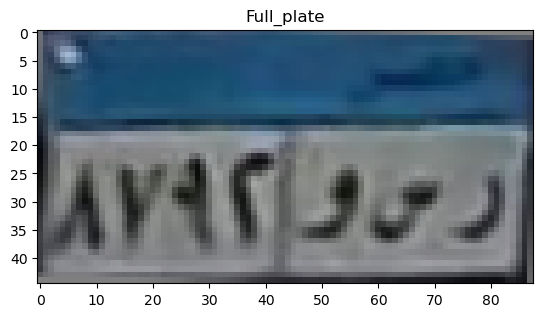

top
[0.123289   0.23540949 0.38679227 0.37981324 0.47898049 0.49228324
 0.48490072 0.47206575 0.46789646 0.4666027  0.4799898  0.49717684
 0.51192544 0.54257033 0.56152916 0.56248029 0.55683125 0.55961816
 0.56133798 0.5619823  0.56905258 0.56962936 0.57110868 0.57748542
 0.5722906  0.55723092 0.5452748  0.54692569 0.56022222 0.57232609
 0.57414863 0.5785939  0.58352688 0.58290289 0.58317939 0.5844185
 0.58767974 0.59405907 0.59975519 0.59234149 0.58413499 0.58329668
 0.56750377 0.51833355]
[0.08575185 0.20685922 0.38420474 0.46490718 0.58040205 0.60428551
 0.60342587 0.60423232 0.59981008 0.59129315 0.58265553 0.57150263
 0.57490822 0.60653431 0.61712931 0.62656585 0.61769243 0.60838521
 0.59743401 0.59376734 0.59289299 0.5913068  0.59297467 0.6019117
 0.61340288 0.61413006 0.60805724 0.60061911 0.59748694 0.58966915
 0.57917992 0.57008823 0.57176769 0.57125107 0.57198585 0.58004013
 0.5979492  0.61333327 0.62216548 0.62580068 0.63661326 0.63259997
 0.61963275 0.55600127]
[0.0609114  

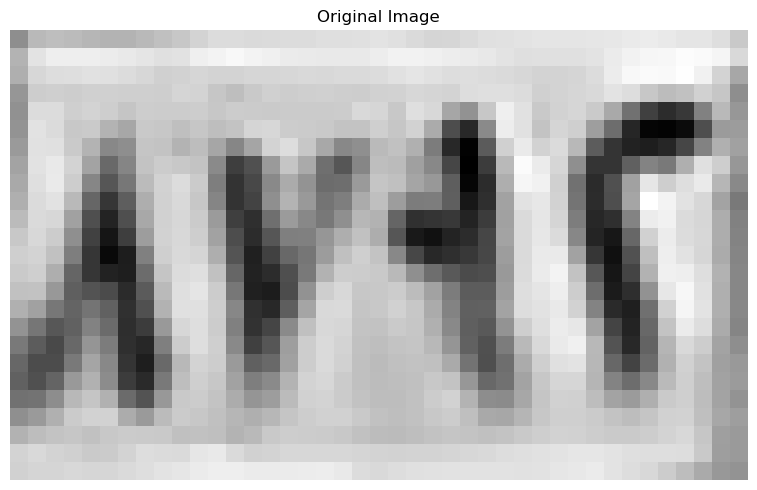

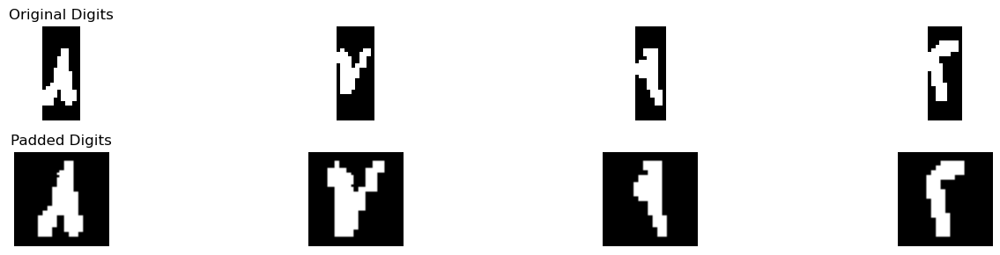

Best match: ٨
Full comparison results: {'١': 1.649671052631579, '٢': 1.03125, '٣': 0.8421052631578947, '٤': 1.345394736842105, '٥': 3.4654605263157894, '٦': 1.1457236842105263, '٧': 0.8013157894736842, '٨': 3.8555921052631583, '٩': 1.5641447368421053}
Confidence :  0.19506578947368447
Best match: ٧
Full comparison results: {'١': 0.33333333333333337, '٢': 0.7083333333333333, '٣': 1.1145833333333335, '٤': 1.1770833333333335, '٥': 1.9895833333333333, '٦': 0.32291666666666663, '٧': 2.3645833333333335, '٨': 1.0729166666666665, '٩': 0.8333333333333333}
Confidence :  0.1875000000000001
Best match: ٩
Full comparison results: {'١': 2.674107142857143, '٢': 3.3303571428571432, '٣': 1.828173374613003, '٤': 1.4898809523809524, '٥': 2.0597080937638212, '٦': 2.2773809523809523, '٧': 1.243014705882353, '٨': 2.8381944444444445, '٩': 4.121235994397759}
Confidence :  0.395439425770308
Best match: ٢
Full comparison results: {'١': 0.1875, '٢': 4.78125, '٣': 4.626064241486068, '٤': 3.25, '٥': 2.867905056759

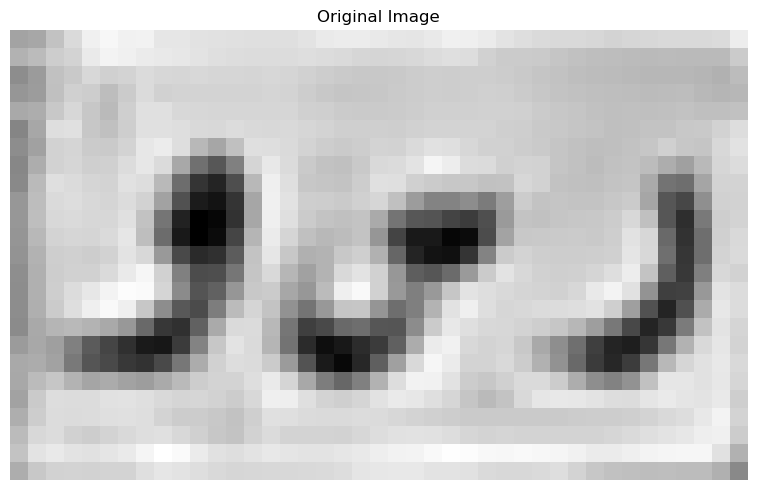

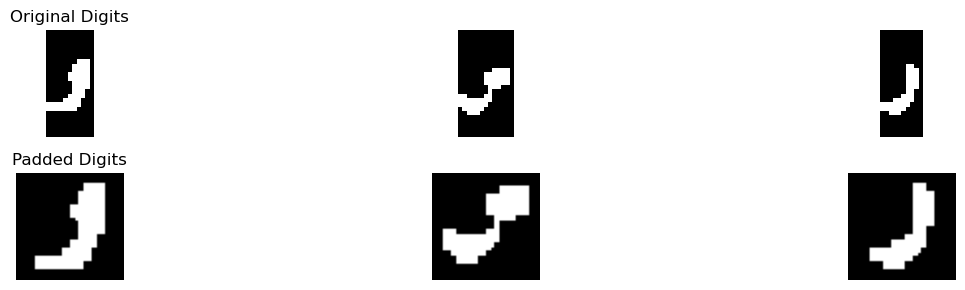

Best match: و
Full comparison results: {'أ': 0.2692307692307693, 'ب': 0.5305868700265253, 'ج': 0.7279202279202279, 'د': 3.3338675213675213, 'ر': 3.858670424403183, 'س': 2.78125, 'ص': 2.106730769230769, 'ط': 2.7836538461538463, 'ع': 0.889423076923077, 'ف': 3.688263125763126, 'ق': 2.4339387464387467, 'ك': 2.2019230769230766, 'ل': 2.0048076923076925, 'م': 0.0, 'ن': 1.9447115384615383, 'ه': 2.90625, 'و': 4.368055555555555, 'ي': 3.3205128205128203}
Confidence :  0.25469256557618625
Best match: س
Full comparison results: {'أ': 0.28125, 'ب': 0.75, 'ج': 0.71875, 'د': 1.78125, 'ر': 0.75, 'س': 5.010775862068965, 'ص': 4.013577586206897, 'ط': 0.09375, 'ع': 0.28125, 'ف': 1.28125, 'ق': 0.5625, 'ك': 0.5625, 'ل': 0.5, 'م': 0.9375, 'ن': 0.875, 'ه': 2.8899425287356326, 'و': 0.96875, 'ي': 1.1875}
Confidence :  0.49859913793103416
Best match: د
Full comparison results: {'أ': 0.24999999999999997, 'ب': 0.5963196286472148, 'ج': 0.5949074074074074, 'د': 3.8423148148148143, 'ر': 3.6696408045977016, 'س': 3.1160

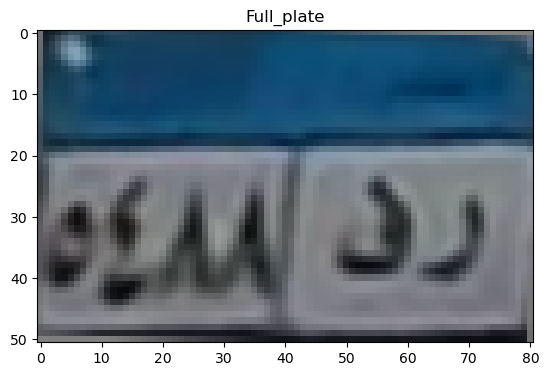

top
[0.30808665 0.33390606 0.41004553 0.44991194 0.45522483 0.48664044
 0.51418724 0.52680694 0.53018946 0.53928409 0.538313   0.54655347
 0.55992792 0.55156716 0.54483409 0.55579667 0.558313   0.56348157
 0.5665156  0.56712225 0.57327696 0.5761717  0.57537545 0.573653
 0.57908449 0.57843416 0.57732104 0.57889135 0.58652509 0.59255208
 0.60481406 0.60032895 0.58259028 0.57976211 0.57463931 0.57994077
 0.58665909 0.59326031 0.59488799 0.58349173]
[0.3076169  0.38799441 0.5118276  0.55635324 0.56000658 0.55616281
 0.55735722 0.56470229 0.56610583 0.56849664 0.5694191  0.57656784
 0.5767832  0.57641889 0.58065139 0.58631184 0.59107438 0.59930993
 0.60044852 0.58832875 0.58267287 0.57877587 0.57649127 0.56729892
 0.56444404 0.5603062  0.56106909 0.57017199 0.58462737 0.58855687
 0.59241433 0.59143981 0.58487835 0.58208078 0.56930973 0.55537605
 0.54401295 0.54315339 0.56010579 0.56532179]
[0.28287489 0.33662614 0.49530076 0.55555584 0.5597804  0.52378209
 0.50629484 0.49711164 0.49636964 0

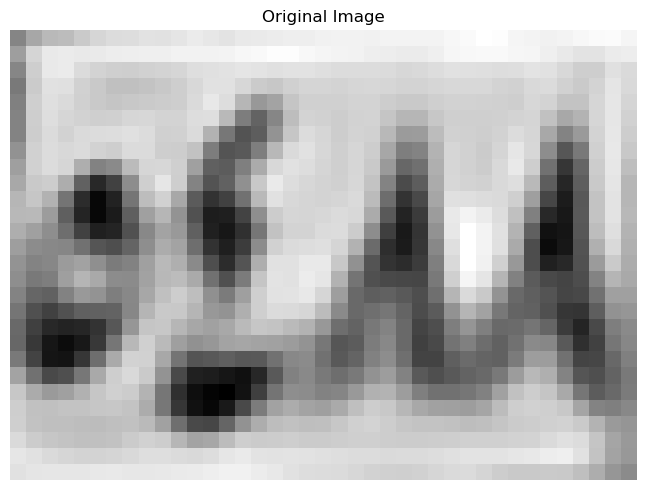

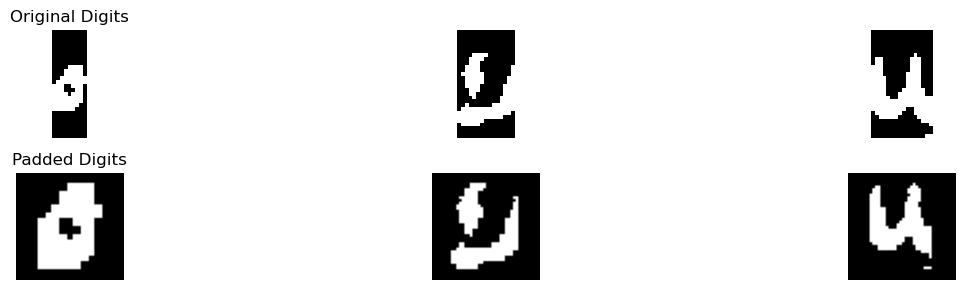

Best match: ٥
Full comparison results: {'١': 0.5416666666666666, '٢': 1.2708333333333333, '٣': 1.427083333333333, '٤': 1.5729166666666667, '٥': 6.052083333333332, '٦': 1.6458333333333335, '٧': 0.5, '٨': 0.7499999999999999, '٩': 0.7395833333333334}
Confidence :  2.203124999999999
Best match: ٥
Full comparison results: {'١': 0.28, '٢': 0.36000000000000004, '٣': 0.32, '٤': 0.8, '٥': 2.5725, '٦': 0.11125000000000002, '٧': 0.39125, '٨': 0.7512500000000001, '٩': 0.89875}
Confidence :  0.8368749999999998
Best match: ٥
Full comparison results: {'١': 0.4347826086956522, '٢': 0.30434782608695654, '٣': 0.0, '٤': 0.0, '٥': 1.8206521739130435, '٦': 0.8695652173913043, '٧': 1.0747282608695652, '٨': 1.1929347826086958, '٩': 0.7894021739130435}
Confidence :  0.31385869565217384
In horizontal_segmentation_1
0 3
9 21
22 33
39 40
In refine_segmentation_1


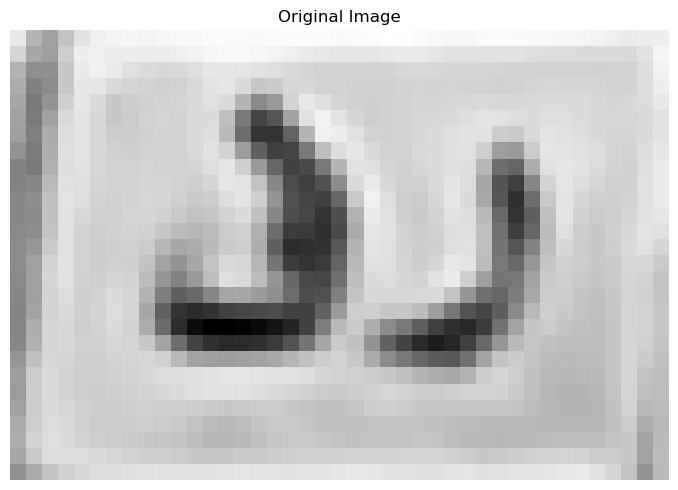

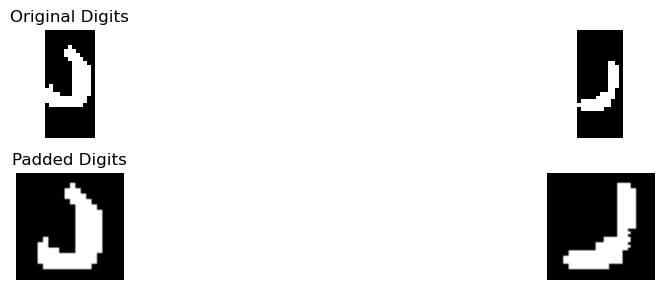

Best match: ف
Full comparison results: {'أ': 0.07291666666666666, 'ب': 0.06896551724137931, 'ج': 2.142361111111111, 'د': 4.867407407407407, 'ر': 2.474310344827586, 'س': 2.147321428571429, 'ص': 1.3645833333333333, 'ط': 2.96875, 'ع': 1.2916666666666665, 'ف': 5.317956349206349, 'ق': 3.3391203703703707, 'ك': 2.4583333333333335, 'ل': 2.1979166666666665, 'م': 1.1875, 'ن': 3.3675, 'ه': 3.7006048387096775, 'و': 3.524305555555556, 'ي': 2.9415064102564097}
Confidence :  0.22527447089947072
Best match: ر
Full comparison results: {'أ': 0.07407407407407407, 'ب': 0.6936861430395913, 'ج': 0.6597222222222222, 'د': 3.8090277777777777, 'ر': 4.307471264367816, 'س': 2.272321428571429, 'ص': 2.012962962962963, 'ط': 3.458333333333333, 'ع': 0.8310185185185185, 'ف': 3.6764219576719572, 'ق': 1.8506944444444444, 'ك': 2.5555555555555554, 'ل': 2.0706018518518516, 'م': 0.037037037037037035, 'ن': 2.7534722222222223, 'ه': 2.15625, 'و': 2.7951388888888893, 'ي': 2.8446759259259258}
Confidence :  0.24922174329501923
[['

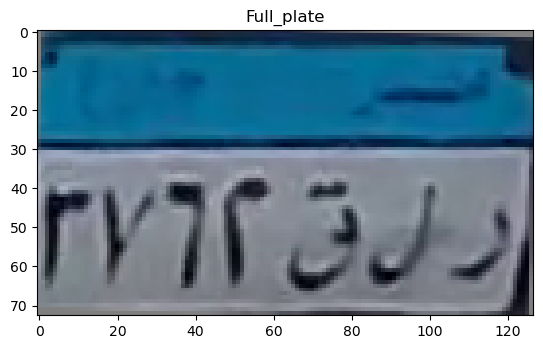

top
[0.18748376 0.09890634 0.09203521 0.07947389 0.06862882 0.06559416
 0.06167154 0.06849854 0.07118656 0.08129142 0.08533463 0.08982418
 0.0917989  0.09864814 0.10843459 0.11814866 0.12562389 0.13961734
 0.14985812 0.14619045 0.13823151 0.13589453 0.13603301 0.14092423
 0.14053329 0.14290094 0.14033518 0.13801073 0.12930289 0.1251182
 0.11971438 0.11095793 0.10230587 0.09877097 0.08612866 0.07712667
 0.07582791 0.08494637 0.09228394 0.09628598 0.09762804 0.09787232
 0.10262229 0.10841274 0.11363472 0.11103199 0.10604149 0.10373891
 0.13060538 0.130655   0.1226044  0.12409392 0.12780287 0.1345221
 0.14086879 0.14376866 0.14267836 0.13944536 0.13142902 0.12889669
 0.10805608 0.08302085 0.06451594]
[0.31943074 0.27625722 0.25761334 0.23838978 0.22058691 0.20892602
 0.1987035  0.19834347 0.19458036 0.19156737 0.19372156 0.20096133
 0.16963545 0.19382048 0.23972284 0.26442805 0.22545679 0.24561936
 0.27316331 0.28901043 0.2623361  0.25970254 0.26595757 0.27351958
 0.28431922 0.2905539  0.

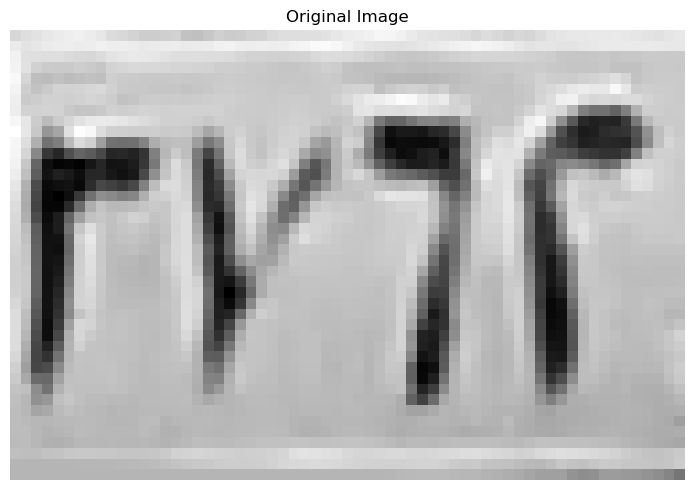

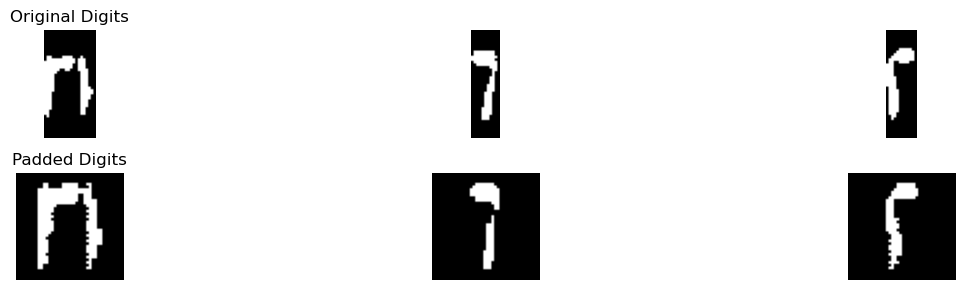

Best match: ٦
Full comparison results: {'١': 0.625, '٢': 0.48958333333333326, '٣': 1.75, '٤': 0.0, '٥': 1.21875, '٦': 2.21875, '٧': 0.5416666666666666, '٨': 0.3645833333333333, '٩': 0.9583333333333334}
Confidence :  0.234375
Best match: ٢
Full comparison results: {'١': 2.971590909090909, '٢': 3.681672494172494, '٣': 1.5843653250773995, '٤': 0.6257326007326007, '٥': 2.097610754828247, '٦': 2.6529761904761906, '٧': 1.4194852941176472, '٨': 0.35486111111111107, '٩': 1.5292232277526396}
Confidence :  0.35504079254079235
Best match: ٢
Full comparison results: {'١': 0.0, '٢': 5.8373397435897445, '٣': 3.0421826625387, '٤': 2.1509844322344325, '٥': 2.028766769865841, '٦': 0.9467261904761904, '٧': 1.0591911764705881, '٨': 0.3125, '٩': 0.45886752136752135}
Confidence :  1.3975785405255223
In horizontal_segmentation_1
1 20
22 39
43 58
In refine_segmentation_1


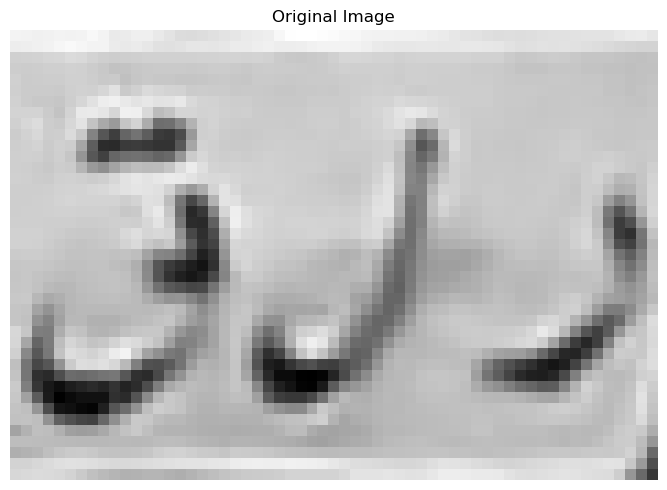

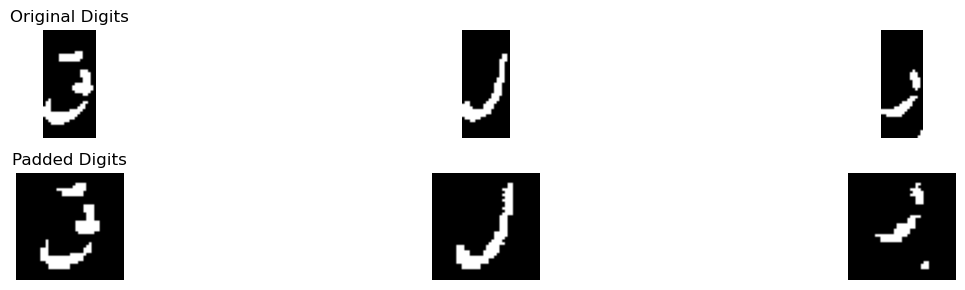

Best match: ق
Full comparison results: {'أ': 0.045454545454545456, 'ب': 0.6075099469496021, 'ج': 2.115071796742554, 'د': 3.4546801346801344, 'ر': 2.976201103993458, 'س': 1.4375, 'ص': 1.3723484848484848, 'ط': 2.011847485348235, 'ع': 1.3445896173718754, 'ف': 3.5061642733013705, 'ق': 5.13491541828583, 'ك': 1.3248106060606062, 'ل': 3.3493944824589987, 'م': 0.5113636363636364, 'ن': 3.363062072336266, 'ه': 1.1799731182795699, 'و': 3.3426869267386508, 'ي': 2.9725632157697373}
Confidence :  0.8143755724922299
Best match: ل
Full comparison results: {'أ': 0.047619047619047616, 'ب': 0.1979442970822281, 'ج': 0.23329307568438, 'د': 1.9948039923039922, 'ر': 3.4255248268722784, 'س': 2.1607142857142856, 'ص': 1.957142857142857, 'ط': 1.7932723978919631, 'ع': 0.3958333333333333, 'ف': 1.8541666666666665, 'ق': 2.382109788359788, 'ك': 2.0719696969696972, 'ل': 3.427083333333333, 'م': 0.13636363636363635, 'ن': 2.088214285714286, 'ه': 0.9268145161290322, 'و': 2.349206349206349, 'ي': 2.2831651138716356}
Confide

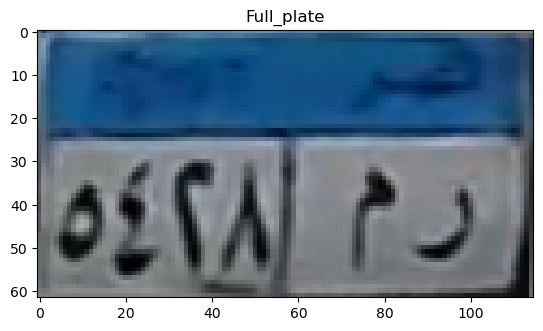

top
[0.35018722 0.38146638 0.28620381 0.21403567 0.21767484 0.20618628
 0.17260456 0.17442629 0.21961921 0.26666701 0.29259859 0.27725075
 0.23979471 0.19908303 0.17823977 0.16631731 0.15754136 0.15396478
 0.13647439 0.11427675 0.10442802 0.10733194 0.11142241 0.11960959
 0.1260756  0.12922576 0.13891242 0.14500885 0.15011736 0.15551275
 0.16296815 0.16935981 0.19399429 0.19869315 0.19521561 0.19899239
 0.21854985 0.22418092 0.22030685 0.21926711 0.2077103  0.20035668
 0.20887908 0.2124005  0.20905302 0.20316588 0.20017139 0.20025423
 0.20626661 0.20149766 0.19606822 0.18148919 0.16076934 0.13380026
 0.13494342 0.11500996 0.07561819]
[0.34253534 0.38948719 0.30827314 0.2828044  0.33140845 0.36316252
 0.34926148 0.34675393 0.36856733 0.38930147 0.4040249  0.41575057
 0.4176689  0.40667051 0.39312907 0.38137629 0.36828623 0.36402904
 0.35300343 0.33822235 0.30876655 0.32072501 0.31745777 0.31755342
 0.31945745 0.32783628 0.33363064 0.34407538 0.36243904 0.37915666
 0.38585776 0.38599455 

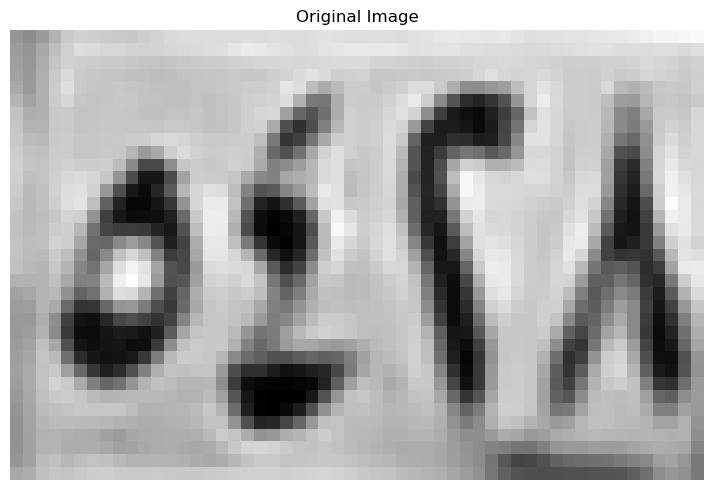

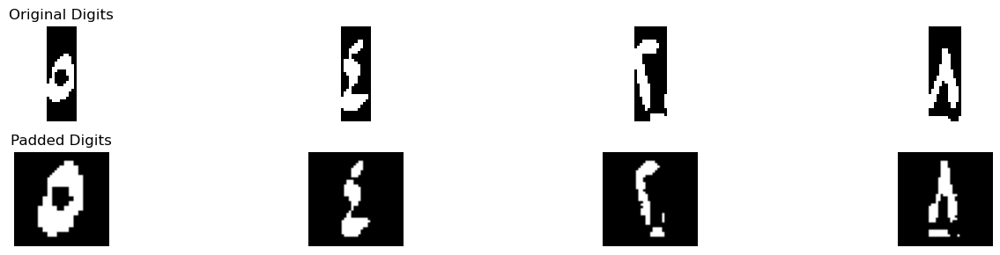

Best match: ٥
Full comparison results: {'١': 0.7894736842105262, '٢': 1.5098684210526316, '٣': 1.394736842105263, '٤': 1.835526315789474, '٥': 7.056390977443609, '٦': 1.4697368421052632, '٧': 1.144736842105263, '٨': 1.4200657894736843, '٩': 0.6299342105263157}
Confidence :  2.6104323308270674
Best match: ٤
Full comparison results: {'١': 1.2916666666666665, '٢': 1.1971153846153846, '٣': 1.21671826625387, '٤': 5.260325091575091, '٥': 2.5027734778121773, '٦': 0.14285714285714285, '٧': 0.3650735294117647, '٨': 1.8291666666666668, '٩': 0.9304769984917043}
Confidence :  1.378775806881457
Best match: ٢
Full comparison results: {'١': 0.3020833333333333, '٢': 5.616185897435898, '٣': 3.0963622291021675, '٤': 3.030448717948718, '٥': 1.3717243476337904, '٦': 0.5059523809523809, '٧': 1.0404411764705883, '٨': 0.3875, '٩': 1.598337732528909}
Confidence :  1.2599118341668651
Best match: ٨
Full comparison results: {'١': 3.699519230769231, '٢': 0.24759615384615385, '٣': 0.5526315789473684, '٤': 2.309935

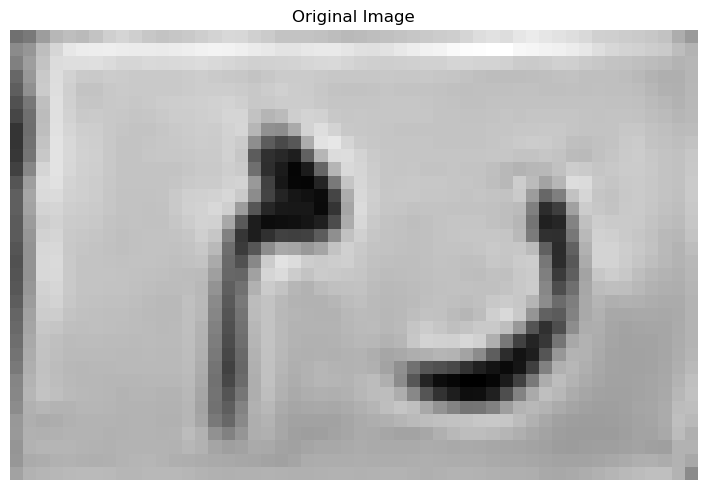

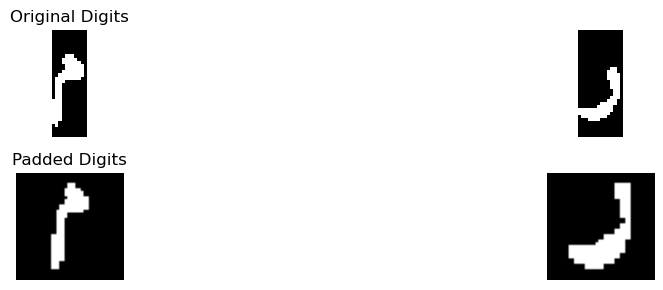

Best match: م
Full comparison results: {'أ': 0.2589285714285714, 'ب': 0.125, 'ج': 0.4621362433862434, 'د': 1.8231921771898554, 'ر': 0.04, 'س': 1.0535714285714286, 'ص': 0.4133928571428571, 'ط': 0.3283514492753623, 'ع': 0.7417763157894737, 'ف': 0.8957202032859926, 'ق': 0.2137426900584795, 'ك': 0.16761363636363635, 'ل': 0.3479102167182663, 'م': 4.614448051948052, 'ن': 1.0120833333333332, 'ه': 2.0268145161290323, 'و': 0.48928571428571427, 'ي': 0.19497863247863248}
Confidence :  1.29381676790951
Best match: د
Full comparison results: {'أ': 0.2921195652173913, 'ب': 0.4224137931034483, 'ج': 1.0236010466988728, 'د': 4.107920692431562, 'ر': 3.9553954272863567, 'س': 2.450892857142857, 'ص': 1.7076992753623188, 'ط': 3.148097826086956, 'ع': 1.2201086956521738, 'ف': 3.58584224752703, 'ق': 2.0072966988727856, 'ك': 2.6222826086956523, 'ل': 2.8179347826086953, 'م': 0.13043478260869565, 'ن': 3.4716847826086954, 'ه': 2.163306451612903, 'و': 2.6023047504025767, 'ي': 3.1597895763656636}
Confidence :  0.076

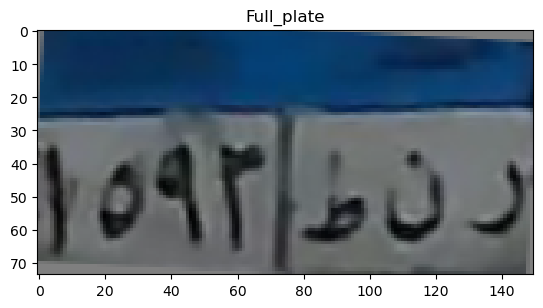

top
[0.50251679 0.50218555 0.49506327 0.49172121 0.48930824 0.48755777
 0.4870058  0.48496741 0.4809086  0.47853952 0.4769485  0.4772
 0.47618571 0.47522504 0.47652562 0.47589737 0.47276907 0.47055203
 0.47138442 0.47253198 0.47439244 0.47680557 0.48328692 0.48883437
 0.49053872 0.48399888 0.47588037 0.46873533 0.46529652 0.46128794
 0.45917926 0.45923947 0.45917732 0.4597571  0.46030714 0.45774342
 0.44916266 0.43338142 0.40424338 0.37250906 0.35936049 0.36049286
 0.36344906 0.36875934 0.37198992 0.37243    0.3721849  0.36903542
 0.3676352  0.3662135  0.36382071 0.3623001  0.36211715 0.36988735
 0.38454921 0.40046881 0.41115373 0.43848182 0.45913969 0.45187203
 0.44571373 0.4517059  0.4615001  0.46383216 0.45425482 0.44482879
 0.44631127 0.45602058 0.46173455 0.46819705 0.49395691 0.50521884
 0.43292618 0.31013542 0.23250134]
[0.45634816 0.44290793 0.44292645 0.44617017 0.45237101 0.45726898
 0.46531403 0.47189798 0.474019   0.47468978 0.47564904 0.4763673
 0.47605269 0.47554962 0.475

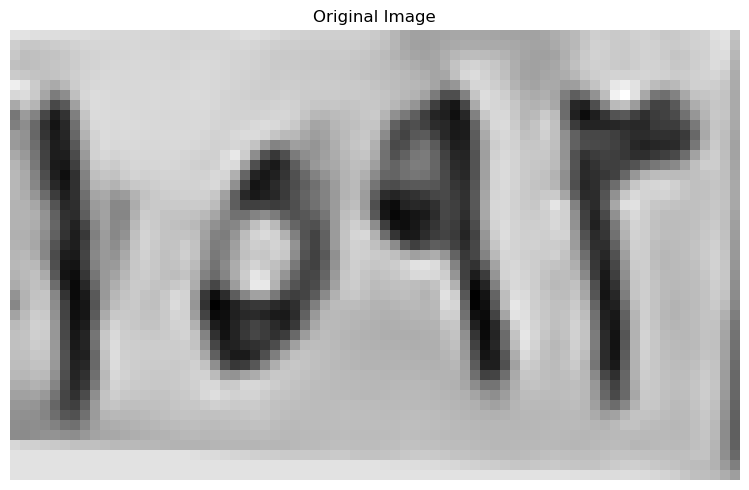

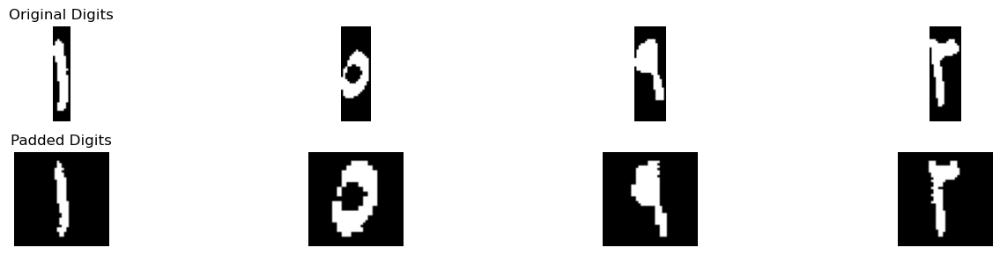

Best match: ١
Full comparison results: {'١': 5.516666666666666, '٢': 1.8379953379953378, '٣': 0.9802631578947368, '٤': 1.2291437728937729, '٥': 0.7941913607548282, '٦': 0.5050595238095238, '٧': 1.2628676470588236, '٨': 2.1020833333333333, '٩': 1.0462543991955757}
Confidence :  1.7072916666666662
Best match: ٥
Full comparison results: {'١': 0.6842105263157895, '٢': 1.8338815789473684, '٣': 1.3503289473684212, '٤': 1.7730263157894737, '٥': 7.681390977443609, '٦': 1.8759868421052632, '٧': 1.1233552631578947, '٨': 1.004934210526316, '٩': 0.6611842105263157}
Confidence :  2.902702067669173
Best match: ٩
Full comparison results: {'١': 2.28125, '٢': 2.5187500000000003, '٣': 2.064628482972136, '٤': 2.3979166666666667, '٥': 2.694498194014448, '٦': 2.2041666666666666, '٧': 1.1867647058823532, '٨': 3.16875, '٩': 5.477941176470589}
Confidence :  1.1545955882352943
Best match: ٣
Full comparison results: {'١': 0.0625, '٢': 4.689903846153847, '٣': 4.9348877708978325, '٤': 1.9895375457875457, '٥': 1.8

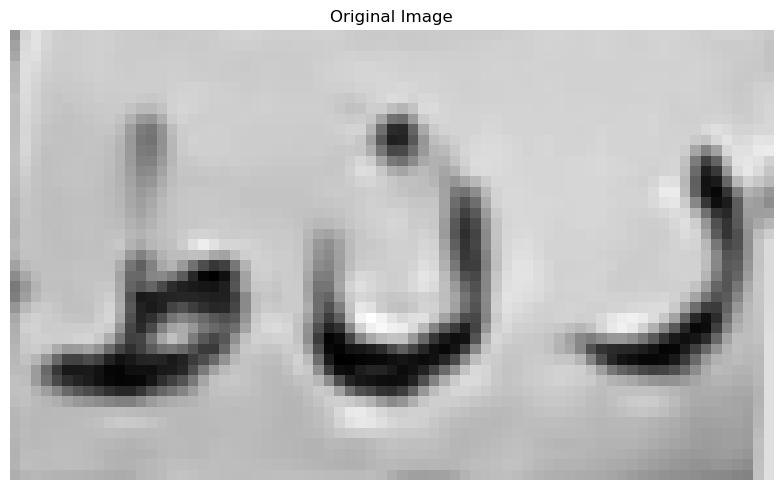

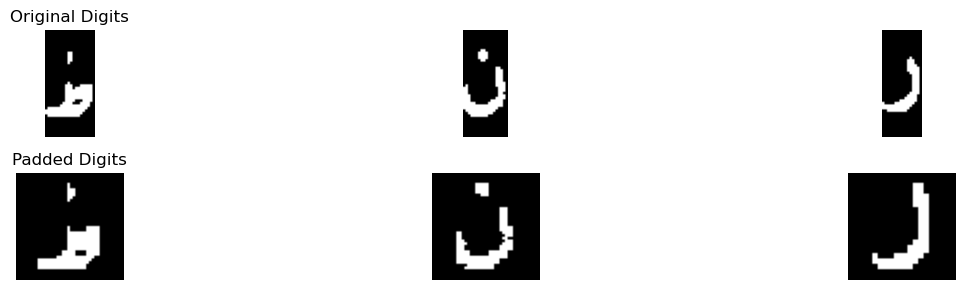

Best match: ط
Full comparison results: {'أ': 0.6032608695652174, 'ب': 0.3502984084880637, 'ج': 1.1856093282723716, 'د': 2.5119851566152405, 'ر': 3.259497751124438, 'س': 0.8125, 'ص': 0.6504528985507246, 'ط': 6.026521739130436, 'ع': 0.6155642656782208, 'ف': 3.0712370229375843, 'ق': 1.8731796400187002, 'ك': 1.8546195652173914, 'ل': 1.8382713884992987, 'م': 0.0, 'ن': 2.213089060308555, 'ه': 0.7883064516129032, 'و': 2.230525362318841, 'ي': 2.356226849354479}
Confidence :  1.383511994002999
Best match: ن
Full comparison results: {'أ': 0.14338517665130568, 'ب': 0.2636770557029178, 'ج': 2.057978203358638, 'د': 3.984565897065897, 'ر': 2.7375896872992076, 'س': 1.03125, 'ص': 0.9749999999999999, 'ط': 3.3529615062598572, 'ع': 2.7, 'ف': 3.1309150452295613, 'ق': 3.377837220662582, 'ك': 2.065340909090909, 'ل': 4.654905913978495, 'م': 0.5932088744588744, 'ن': 5.383362135176651, 'ه': 1.1435483870967742, 'و': 2.6612423195084487, 'ي': 2.323718944099379}
Confidence :  0.3642281105990781
Best match: ر
Full 

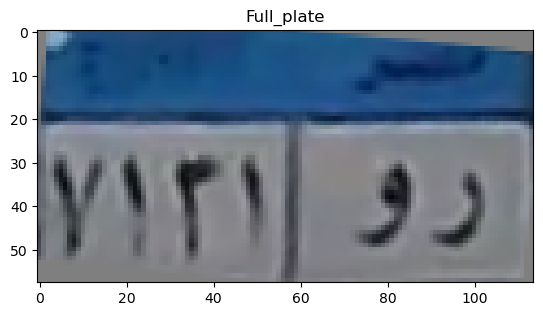

top
[0.45838509 0.49793875 0.59374101 0.63955653 0.62500411 0.60557918
 0.59700554 0.58906994 0.58254087 0.57985461 0.57660578 0.57927691
 0.58566513 0.5896392  0.59505276 0.60009284 0.60438086 0.60016644
 0.59593434 0.59376868 0.59193036 0.5914661  0.60067927 0.61143989
 0.60685135 0.59524647 0.59259132 0.59265468 0.59096321 0.59263292
 0.59995805 0.60621689 0.61005611 0.61519753 0.62709801 0.63635688
 0.6344257  0.62617165 0.6186218  0.60903711 0.60668358 0.60571441
 0.60566589 0.60737995 0.60649409 0.60447906 0.60449658 0.60757766
 0.60635519 0.60338578 0.59479172 0.58482883 0.58198697 0.58689879
 0.59045811 0.59172946 0.55427745]
[0.46615104 0.49987552 0.56690299 0.58759461 0.57301669 0.56289814
 0.56266427 0.55933635 0.55074079 0.54526257 0.53858579 0.53610815
 0.5386276  0.54328814 0.55075369 0.5567866  0.56547418 0.57020113
 0.57047163 0.57160053 0.5713553  0.56910293 0.56888149 0.56942221
 0.56954907 0.5706795  0.56162537 0.55562506 0.55226644 0.5537725
 0.55448261 0.55634291 0

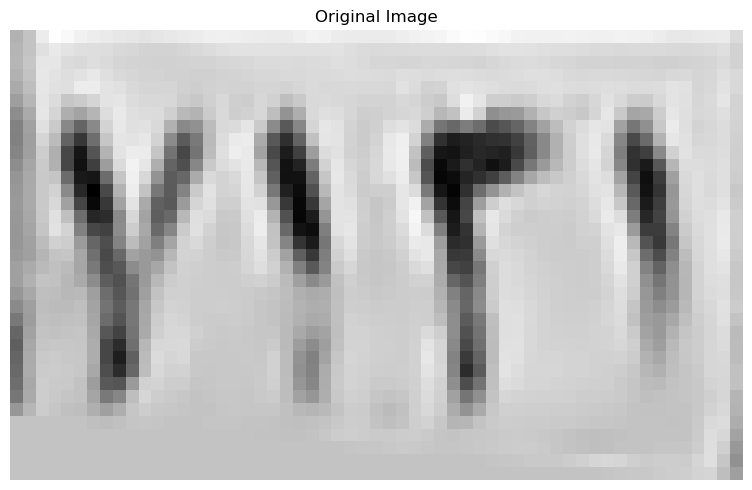

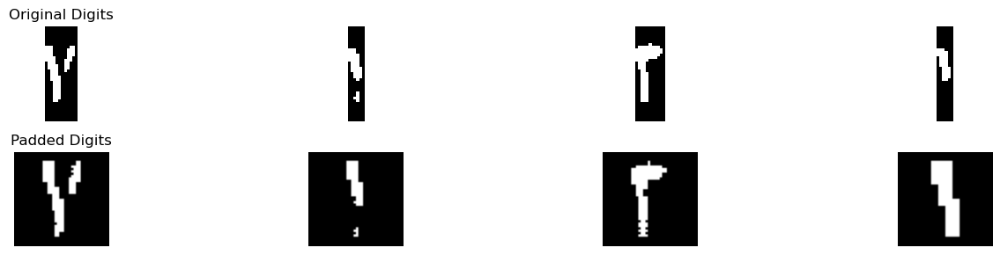

Best match: ٧
Full comparison results: {'١': 0.0, '٢': 3.0625, '٣': 3.3953173374613, '٤': 1.40625, '٥': 0.5811495650891936, '٦': 0.6375, '٧': 4.109191176470588, '٨': 0.30625, '٩': 0.946078431372549}
Confidence :  0.3569369195046441
Best match: ١
Full comparison results: {'١': 5.352678571428571, '٢': 0.24475524475524477, '٣': 0.5703366873065016, '٤': 1.225002954035212, '٥': 0.8255933952528378, '٦': 0.7833333333333333, '٧': 0.3551470588235294, '٨': 2.3555555555555556, '٩': 2.639768728004022}
Confidence :  1.3564549217122746
Best match: ٣
Full comparison results: {'١': 0.06666666666666667, '٢': 3.6062499999999997, '٣': 4.306211300309597, '٤': 2.083333333333333, '٥': 1.9863122880731239, '٦': 1.8062499999999997, '٧': 1.500735294117647, '٨': 0.5173611111111112, '٩': 0.7380718954248366}
Confidence :  0.3499806501547986
Best match: ١
Full comparison results: {'١': 4.114583333333333, '٢': 4.0681089743589745, '٣': 2.08968653250774, '٤': 1.5646978021978022, '٥': 2.2195562435500515, '٦': 2.7616071

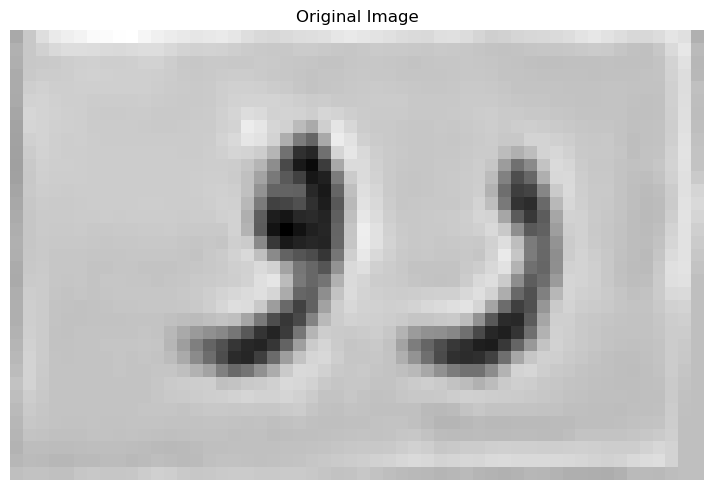

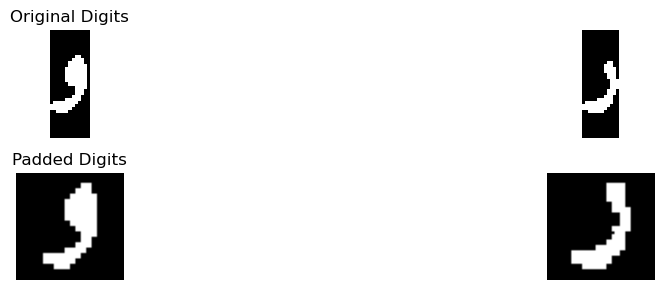

Best match: و
Full comparison results: {'أ': 0.53125, 'ب': 0.09375, 'ج': 0.6221014492753624, 'د': 3.528177609427609, 'ر': 3.2565486006996505, 'س': 3.209821428571429, 'ص': 2.7455357142857144, 'ط': 2.3736001317523057, 'ع': 0.75, 'ف': 2.5386904761904763, 'ق': 2.9111111111111105, 'ك': 1.930871212121212, 'ل': 2.61875, 'م': 0.8494318181818181, 'ن': 2.1333333333333333, 'ه': 2.7901881720430106, 'و': 5.19103835978836, 'ي': 3.2979375696766997}
Confidence :  0.8314303751803753
Best match: د
Full comparison results: {'أ': 0.045454545454545456, 'ب': 0.5546253315649867, 'ج': 1.321278912311521, 'د': 4.417950336700337, 'ر': 4.290993253373313, 'س': 2.361607142857143, 'ص': 1.7132575757575759, 'ط': 2.3369153491436103, 'ع': 1.1960227272727273, 'ف': 3.180209836459836, 'ق': 3.095959595959596, 'ك': 1.9545454545454546, 'ل': 3.431818181818182, 'م': 0.07670454545454546, 'ن': 3.6, 'ه': 2.189247311827957, 'و': 3.8398569023569027, 'ي': 3.3457864599168947}
Confidence :  0.06347854166351219
[['٧', '١', '٣', '١'], ['

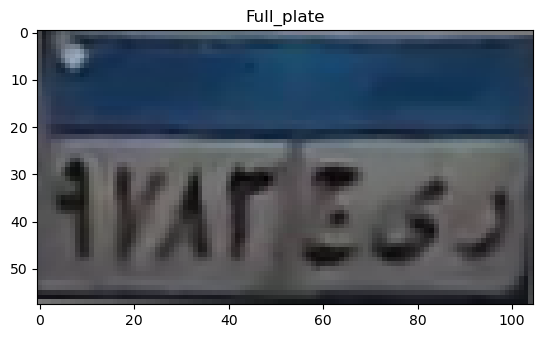

top
[0.32901124 0.31554303 0.29728029 0.33566834 0.33985297 0.3745852
 0.408066   0.4257097  0.43755866 0.43545618 0.43653614 0.44266359
 0.44840042 0.44670005 0.44299294 0.4347745  0.43005107 0.43930904
 0.44910461 0.46244653 0.47278661 0.47429166 0.46912162 0.46890333
 0.47104794 0.46961182 0.47018001 0.469534   0.47057365 0.46395843
 0.45404366 0.44597301 0.43305175 0.42509373 0.40775304 0.40135751
 0.39631309 0.39221382 0.3974961  0.39148631 0.39773631 0.39998431
 0.41205804 0.41451392 0.41681484 0.4018173  0.38587249 0.38102368
 0.35432714 0.35574412 0.3598048  0.36769376]
[0.33404138 0.32042717 0.31257177 0.37305979 0.38089583 0.41686811
 0.44196509 0.46523773 0.46977588 0.45947049 0.45359385 0.4463738
 0.45082047 0.45630288 0.45791804 0.44958854 0.44744273 0.45120831
 0.46189281 0.47475801 0.48087781 0.48066403 0.47341066 0.47881882
 0.48590996 0.4958162  0.50157238 0.50827093 0.51374722 0.50979969
 0.51121106 0.50092189 0.49811467 0.49306428 0.50271276 0.51068735
 0.51795735 0.

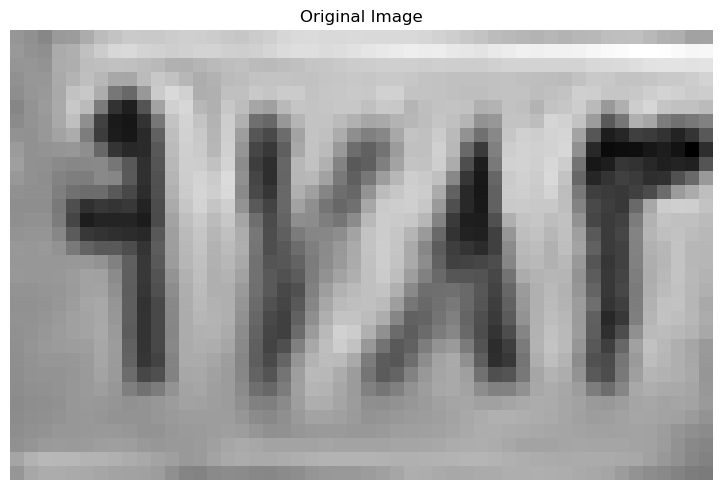

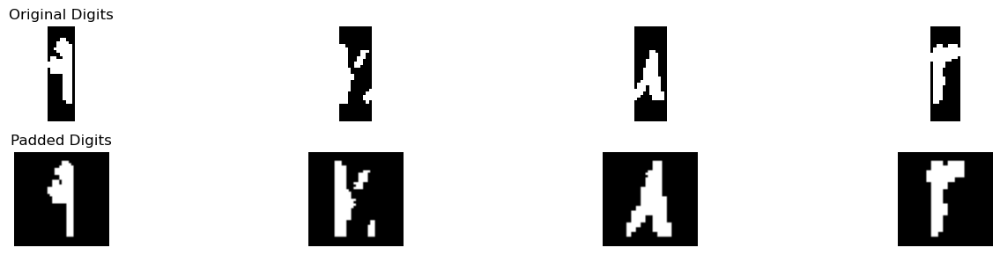

Best match: ٩
Full comparison results: {'١': 3.704545454545454, '٢': 2.1220134032634035, '٣': 0.7927631578947368, '٤': 1.3593406593406594, '٥': 1.716266769865841, '٦': 1.9026785714285714, '٧': 0.8419117647058824, '٨': 2.540972222222222, '٩': 4.161010558069382}
Confidence :  0.2282325517619639
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 0.5055147058823529, '٣': 0.693498452012384, '٤': 0.5055147058823529, '٥': 1.0311071797139908, '٦': 0.30772058823529413, '٧': 1.4283088235294117, '٨': 1.2998774509803923, '٩': 0.6791258169934642}
Confidence :  0.06421568627450969
Best match: ٨
Full comparison results: {'١': 1.680921052631579, '٢': 1.1365131578947367, '٣': 0.894736842105263, '٤': 0.881578947368421, '٥': 2.401942355889724, '٦': 1.1457236842105263, '٧': 0.8013157894736842, '٨': 4.319736842105263, '٩': 1.731907894736842}
Confidence :  0.9588972431077694
Best match: ٣
Full comparison results: {'١': 0.8125, '٢': 3.34375, '٣': 4.94640092879257, '٤': 2.125, '٥': 2.3091644552557864, '٦'

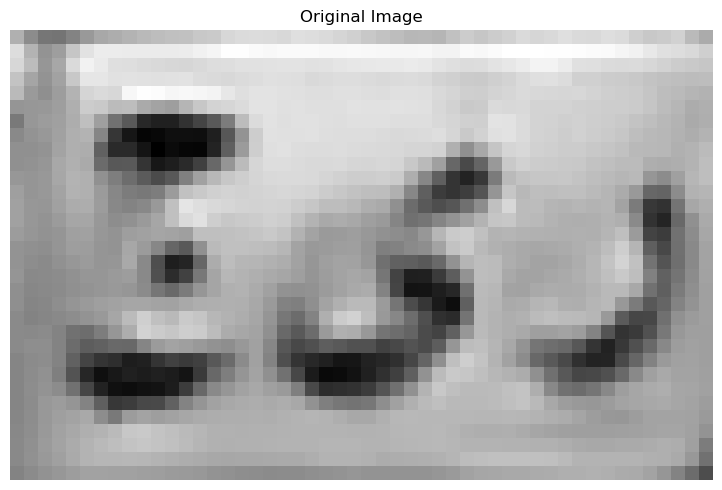

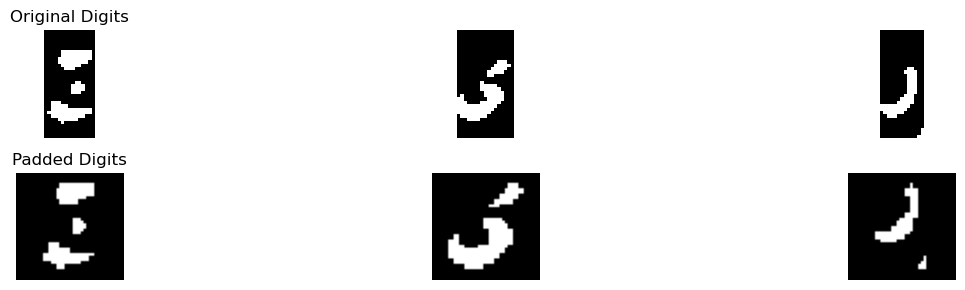

Best match: ج
Full comparison results: {'أ': 0.3157894736842105, 'ب': 0.13469827586206895, 'ج': 4.170242559902172, 'د': 3.2683702878757326, 'ر': 0.8888512369754973, 'س': 0.9866071428571428, 'ص': 0.9184523809523809, 'ط': 1.1201096105987411, 'ع': 1.0475887298892392, 'ف': 2.676417746876151, 'ق': 2.0876865934301825, 'ك': 0.6742424242424242, 'ل': 1.4057017543859647, 'م': 0.9696471291866029, 'ن': 2.133859649122807, 'ه': 1.4663306451612903, 'و': 1.6282094124199389, 'ي': 2.1467170799476847}
Confidence :  0.4509361360132196
Best match: ي
Full comparison results: {'أ': 0.2857142857142857, 'ب': 0.489378078817734, 'ج': 1.15625, 'د': 3.0937500000000004, 'ر': 2.522167487684729, 'س': 2.991071428571429, 'ص': 2.9110119047619047, 'ط': 2.044642857142857, 'ع': 0.7163018433179724, 'ف': 3.5982142857142856, 'ق': 2.2276785714285716, 'ك': 2.2589285714285716, 'ل': 2.21875, 'م': 0.07142857142857142, 'ن': 1.9508928571428572, 'ه': 1.8125, 'و': 2.6919642857142856, 'ي': 4.281509216589862}
Confidence :  0.34164746543

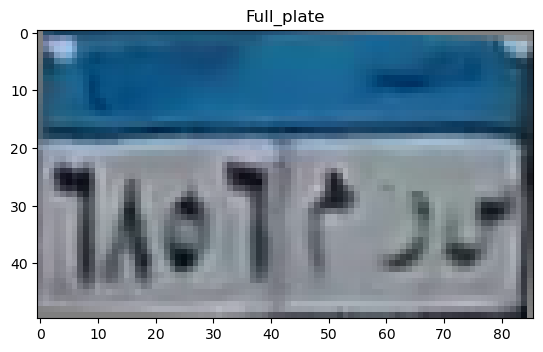

top
[0.58053819 0.62694255 0.66858471 0.67732245 0.68630208 0.70653925
 0.69745382 0.69978132 0.69762906 0.68927275 0.67791547 0.67443141
 0.67998154 0.68597047 0.69375559 0.69536951 0.69556875 0.70096211
 0.69912555 0.69746681 0.69595941 0.69358593 0.68792962 0.68222775
 0.66811655 0.66229634 0.63197591 0.62700583 0.6416051  0.65069123
 0.65931951 0.66184501 0.66683635 0.67551471 0.67131198 0.67899964
 0.68722568 0.65698032 0.66340379 0.70888975 0.68557147 0.58937289
 0.52659237]
[0.48909008 0.61616026 0.63345151 0.62605755 0.63196474 0.65515614
 0.68220922 0.69884824 0.69568244 0.68080765 0.68334416 0.67025886
 0.66528684 0.66106783 0.6489275  0.6307157  0.61035398 0.60651127
 0.60550459 0.59697711 0.5931052  0.59229536 0.59586807 0.59487797
 0.58741969 0.58623455 0.57230717 0.57060913 0.58566734 0.59979877
 0.6191079  0.63520778 0.6609492  0.67639804 0.68428398 0.68696146
 0.690749   0.69804449 0.68845309 0.68451826 0.69272332 0.61845273
 0.51754745]
[0.47526862 0.60630395 0.6533800

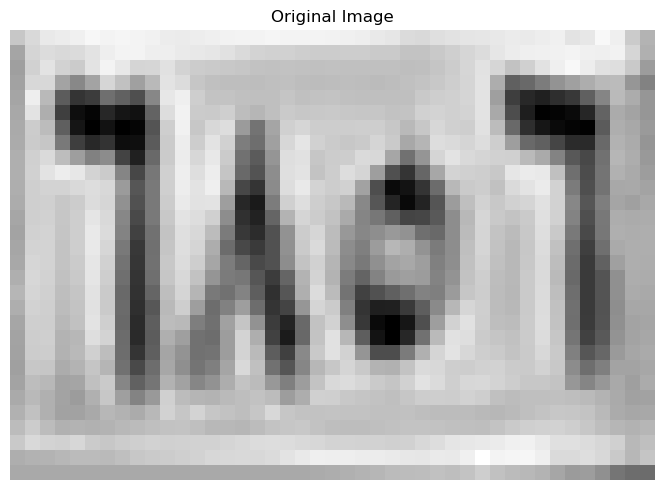

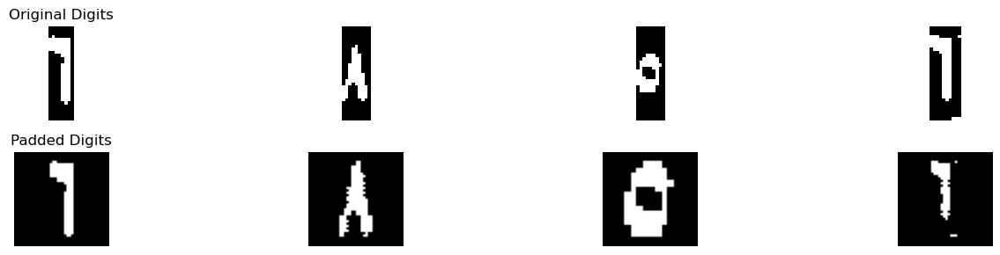

Best match: ٦
Full comparison results: {'١': 3.7874999999999996, '٢': 1.8124271561771559, '٣': 0.6353521671826625, '٤': 0.0625, '٥': 2.035110754828247, '٦': 5.375, '٧': 0.35661764705882354, '٨': 0.9895833333333334, '٩': 2.585360105580694}
Confidence :  0.7937500000000002
Best match: ٨
Full comparison results: {'١': 3.03125, '٢': 1.0714285714285714, '٣': 0.7927631578947368, '٤': 1.7047619047619047, '٥': 1.1171955624355006, '٦': 1.1032738095238095, '٧': 1.043014705882353, '٨': 5.120138888888889, '٩': 2.765610410830999}
Confidence :  1.0444444444444443
Best match: ٥
Full comparison results: {'١': 0.8571428571428571, '٢': 1.7336309523809523, '٣': 1.4791666666666667, '٤': 2.227678571428571, '٥': 7.063988095238095, '٦': 1.6874999999999998, '٧': 0.9360119047619047, '٨': 0.5238095238095237, '٩': 0.5372023809523809}
Confidence :  2.418154761904762
Best match: ١
Full comparison results: {'١': 3.8267045454545454, '٢': 2.0815850815850814, '٣': 1.142705108359133, '٤': 0.9293040293040293, '٥': 0.565

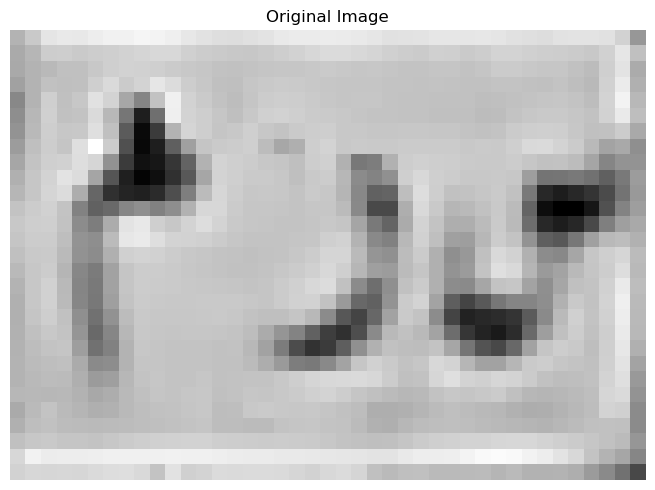

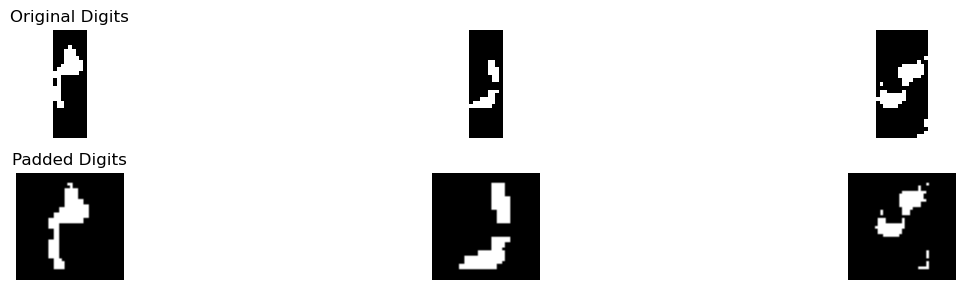

Best match: م
Full comparison results: {'أ': 0.25416666666666665, 'ب': 0.0, 'ج': 0.3255621693121693, 'د': 1.1630390853842867, 'ر': 0.09375, 'س': 1.15625, 'ص': 0.8300595238095239, 'ط': 0.26041666666666663, 'ع': 1.3470394736842106, 'ف': 0.42939814814814814, 'ق': 0.16666666666666666, 'ك': 0.29924242424242425, 'ل': 0.23277863777089783, 'م': 4.027083333333334, 'ن': 0.4619047619047619, 'ه': 1.5216397849462366, 'و': 1.3104166666666666, 'ي': 0.36729797979797985}
Confidence :  1.2527217741935486
Best match: و
Full comparison results: {'أ': 0.0, 'ب': 0.2941810344827586, 'ج': 1.0813783401741066, 'د': 3.254355839092681, 'ر': 3.822285445623054, 'س': 1.1919642857142856, 'ص': 1.0538690476190475, 'ط': 2.2870314293000127, 'ع': 1.381718604461345, 'ف': 2.428532408530286, 'ق': 2.963595031485524, 'ك': 1.543560606060606, 'ل': 3.60453216374269, 'م': 0.12215909090909091, 'ن': 3.1761121553884712, 'ه': 1.2685483870967742, 'و': 3.8235207271051195, 'ي': 2.5193041131256235}
Confidence :  0.0006176407410327656
Best

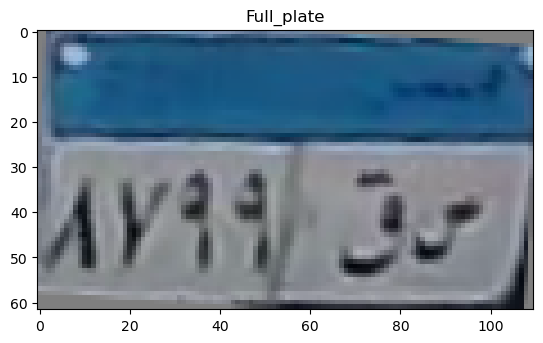

top
[0.46821891 0.57668777 0.57391495 0.5180146  0.45779172 0.42196047
 0.45001189 0.50428759 0.50950228 0.52516967 0.53749363 0.53468792
 0.5330071  0.51616485 0.50151892 0.48487578 0.46628083 0.39922737
 0.3620146  0.3594245  0.36158055 0.35783806 0.37063374 0.38040396
 0.37800813 0.36998332 0.3505892  0.35041353 0.37572864 0.41795728
 0.4176398  0.41737884 0.41886255 0.38844895 0.3519285  0.36397881
 0.39378733 0.38840599 0.3770258  0.36796316 0.35956713 0.35120902
 0.35523016 0.34708831 0.33441214 0.32501578 0.3322485  0.32155321
 0.30058667 0.28216806 0.26594429 0.23635151 0.21055178 0.18143346
 0.16348235]
[0.47472241 0.56497184 0.57337537 0.58334243 0.60554484 0.60027473
 0.60878603 0.63164956 0.64532444 0.65292602 0.65674336 0.66000026
 0.66779333 0.66630392 0.66297946 0.65874446 0.65558902 0.62991031
 0.61658336 0.61315216 0.6007951  0.60936329 0.63203159 0.64458553
 0.65360023 0.66159353 0.67023388 0.67240004 0.66724326 0.66685684
 0.65480583 0.64691941 0.63902588 0.6054075  

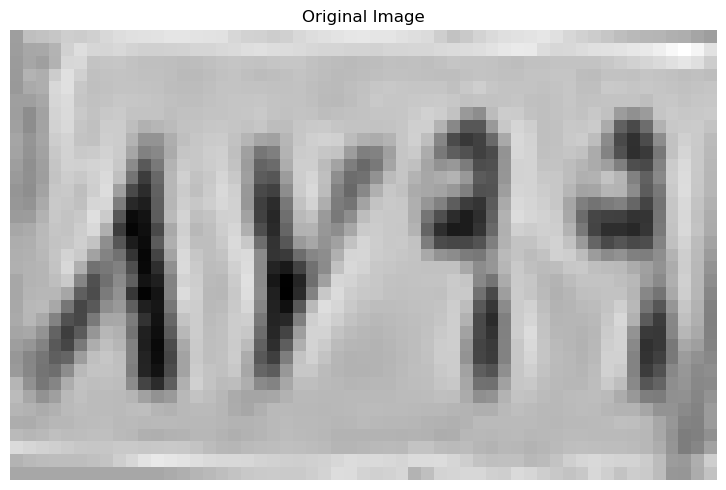

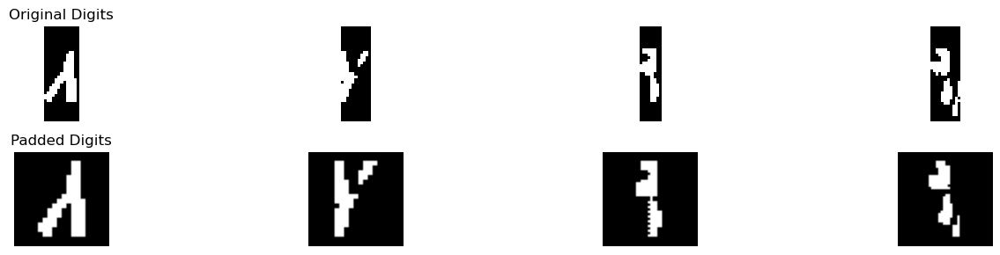

Best match: ٥
Full comparison results: {'١': 0.0, '٢': 0.35, '٣': 0.05, '٤': 0.2, '٥': 1.8017857142857143, '٦': 1.3250000000000002, '٧': 1.0625, '٨': 1.35, '٩': 0.58125}
Confidence :  0.22589285714285712
Best match: ٣
Full comparison results: {'١': 0.0, '٢': 1.0138888888888888, '٣': 1.7984283625730995, '٤': 0.9097222222222222, '٥': 0.8634085213032581, '٦': 0.37777777777777777, '٧': 1.79375, '٨': 0.36666666666666664, '٩': 0.21180555555555555}
Confidence :  0.002339181286549752
Best match: ٢
Full comparison results: {'١': 3.4204545454545454, '٢': 3.758522727272727, '٣': 1.1891447368421053, '٤': 1.4437271062271062, '٥': 1.5372991301783872, '٦': 0.8836309523809524, '٧': 1.1544117647058825, '٨': 2.3048611111111112, '٩': 3.2662456008044245}
Confidence :  0.16903409090909083
Best match: ١
Full comparison results: {'١': 2.769230769230769, '٢': 2.637019230769231, '٣': 2.1620549535603715, '٤': 1.3043040293040293, '٥': 1.2787667698658411, '٦': 0.4803571428571428, '٧': 1.418014705882353, '٨': 1.70

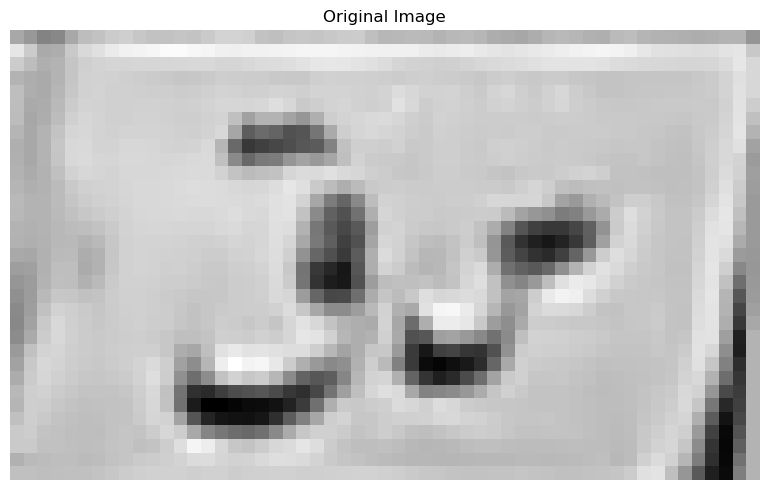

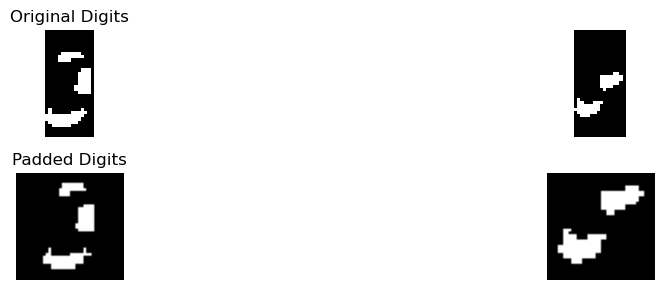

Best match: ق
Full comparison results: {'أ': 0.08388157894736842, 'ب': 0.5338196286472148, 'ج': 2.4139447350259706, 'د': 3.5932220484194164, 'ر': 2.812567950805097, 'س': 1.3035714285714286, 'ص': 1.35625, 'ط': 2.6009120439780107, 'ع': 1.9580607351247976, 'ف': 3.8590031867302663, 'ق': 5.4951874124920455, 'ك': 1.5227272727272727, 'ل': 3.5092377463645086, 'م': 0.4959629186602871, 'ن': 3.6218197712021993, 'ه': 1.2413978494623656, 'و': 3.4555881751870716, 'ي': 2.4510788886933055}
Confidence :  0.8180921128808896
Best match: س
Full comparison results: {'أ': 0.03125, 'ب': 0.28125, 'ج': 0.53125, 'د': 1.25, 'ر': 0.21875, 'س': 3.260344827586207, 'ص': 2.577227011494253, 'ط': 0.03125, 'ع': 0.28125, 'ف': 0.71875, 'ق': 0.25, 'ك': 0.25, 'ل': 0.28125, 'م': 1.375, 'ن': 0.53125, 'ه': 1.743462643678161, 'و': 0.09375, 'ي': 0.6875}
Confidence :  0.3415589080459771
[['٥', '٣', '٢', '١'], ['ق', 'س']]
Tilt angle: -3.00 degrees


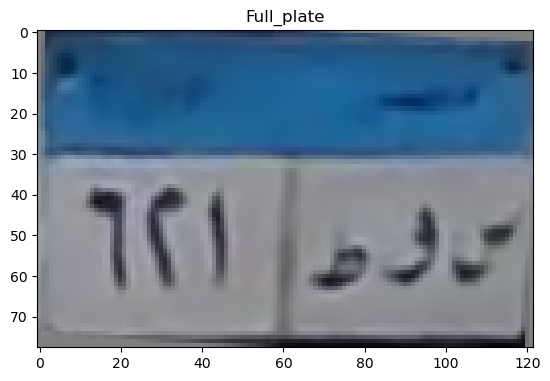

top
[0.54903789 0.50521582 0.43131884 0.41860549 0.44955178 0.49477996
 0.52710881 0.55735552 0.55727634 0.53170529 0.52611848 0.52151118
 0.51348758 0.51366374 0.51233818 0.50481993 0.48013498 0.46282739
 0.46818845 0.48461529 0.47022479 0.43609418 0.41605827 0.40596745
 0.40279458 0.40668549 0.416721   0.43530045 0.43996009 0.43424503
 0.43024659 0.42933167 0.45310841 0.4736072  0.48710119 0.49457672
 0.49088003 0.48628985 0.48388492 0.48554636 0.49209907 0.49408118
 0.49958898 0.50767894 0.50363076 0.496046   0.49005187 0.49580036
 0.5040879  0.51331547 0.51823994 0.50933727 0.4983069  0.49267988
 0.4831092  0.47331451 0.47078968 0.4564343  0.43650403 0.42011064
 0.39119904]
[0.56292903 0.54182952 0.49845379 0.51347156 0.55472761 0.59005398
 0.61896282 0.64406522 0.65139513 0.64799651 0.64884031 0.6448275
 0.63443763 0.63123445 0.63570933 0.64034027 0.62987362 0.61907638
 0.62969129 0.65049557 0.64584174 0.61970631 0.60154315 0.59917083
 0.59596943 0.60112287 0.60624317 0.61946468 0

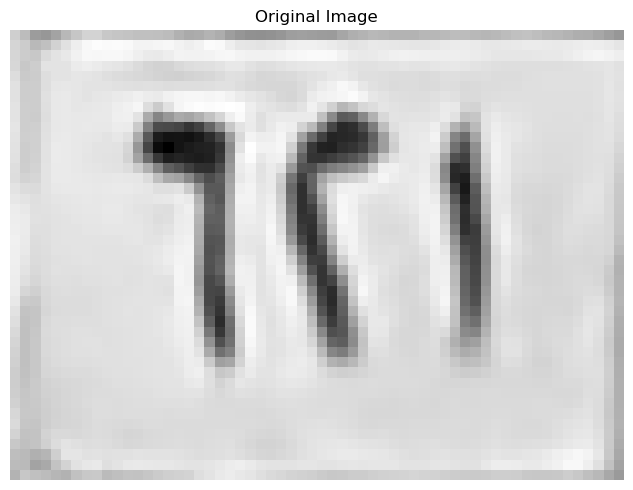

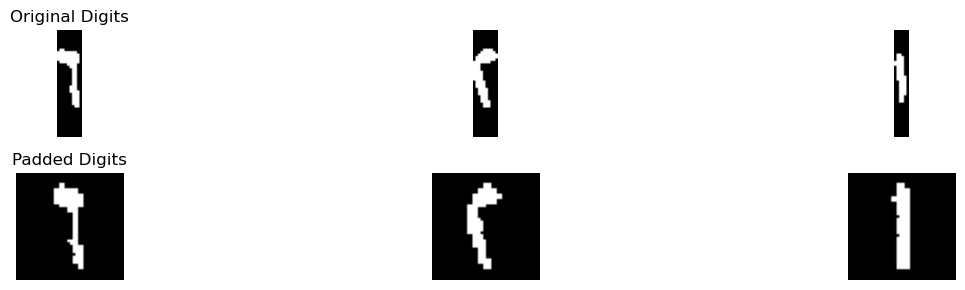

Best match: ١
Full comparison results: {'١': 3.5113636363636367, '٢': 1.3953234265734267, '٣': 1.5593072755417956, '٤': 0.0625, '٥': 2.0499917072091995, '٦': 3.357440476190476, '٧': 0.4264705882352941, '٨': 1.3076388888888888, '٩': 2.5479040975364504}
Confidence :  0.07696158008658038
Best match: ٢
Full comparison results: {'١': 0.15625, '٢': 5.399038461538462, '٣': 3.4380804953560373, '٤': 3.1256639194139195, '٥': 2.420771598112929, '٦': 0.9154761904761904, '٧': 1.3716911764705881, '٨': 0.6868055555555556, '٩': 1.1855517848164907}
Confidence :  0.9804789830912122
Best match: ١
Full comparison results: {'١': 3.8732142857142855, '٢': 2.16368006993007, '٣': 0.7615131578947368, '٤': 1.4880723443223443, '٥': 1.1522786746277458, '٦': 0.44613095238095235, '٧': 1.2503676470588236, '٨': 1.5729166666666665, '٩': 0.8314636752136753}
Confidence :  0.8547671078921077
In horizontal_segmentation_1
0 1
7 20
25 38
41 56
58 60
In refine_segmentation_1


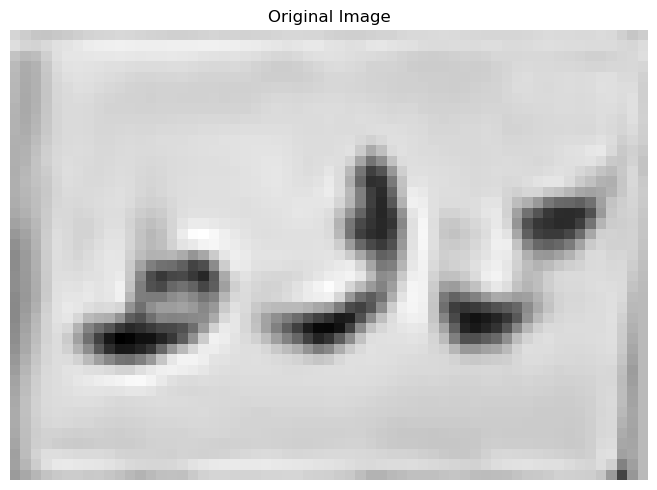

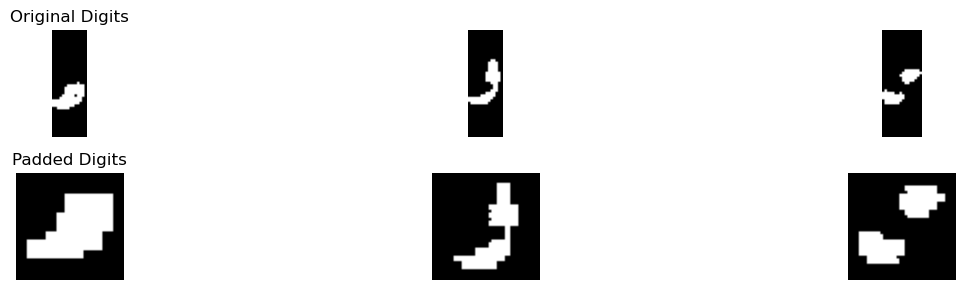

Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.8782327586206897, 'ج': 0.46875, 'د': 1.96875, 'ر': 0.75, 'س': 2.893462643678161, 'ص': 2.6550925925925926, 'ط': 0.625, 'ع': 0.25, 'ف': 1.78125, 'ق': 0.75, 'ك': 0.65625, 'ل': 0.59375, 'م': 0.46875, 'ن': 0.90625, 'ه': 3.6713567323481118, 'و': 1.34375, 'ي': 1.375}
Confidence :  0.3889470443349754
Best match: و
Full comparison results: {'أ': 0.16666666666666666, 'ب': 0.7141080901856763, 'ج': 0.8333333333333333, 'د': 3.3669907407407407, 'ر': 4.457456896551724, 'س': 2.5625, 'ص': 1.5395833333333333, 'ط': 2.697916666666667, 'ع': 1.2291666666666667, 'ف': 3.235119047619048, 'ق': 2.7754629629629632, 'ك': 1.7708333333333333, 'ل': 2.7604166666666665, 'م': 0.041666666666666664, 'ن': 2.6170833333333334, 'ه': 2.352822580645161, 'و': 4.962962962962963, 'ي': 2.7123397435897436}
Confidence :  0.25275303320561937
Best match: س
Full comparison results: {'أ': 0.0625, 'ب': 0.40625, 'ج': 0.59375, 'د': 2.09375, 'ر': 0.6875, 'س': 5.007543103448276, 'ص'

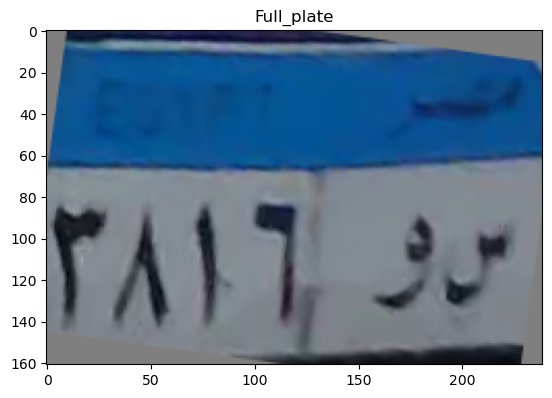

top
[0.5        0.22614105 0.23404637 0.24936994 0.2400756  0.23477505
 0.22875651 0.22282308 0.2285986  0.23286279 0.23277381 0.22579265
 0.20336308 0.19161668 0.18461034 0.19335088 0.20631498 0.21808578
 0.2244735  0.23450456 0.24244831 0.25275241 0.2568304  0.26285113
 0.26984479 0.27215712 0.26985115 0.26386603 0.25655446 0.25440286
 0.25592336 0.2541706  0.24108982 0.22705479 0.23634958 0.2568574
 0.27540619 0.29440733 0.30064909 0.30306955 0.27964625 0.25268078
 0.24635809 0.2486269  0.25644312 0.2641368  0.27491043 0.28311601
 0.28648792 0.28333218 0.27804308 0.27091441 0.26195056 0.26311282
 0.26969738 0.27489609 0.27861929 0.2764652  0.27477658 0.27539167
 0.27545645 0.27403619 0.27245906 0.2690835  0.2665975  0.26665869
 0.26972498 0.27583207 0.28202245 0.28697475 0.29227911 0.29355713
 0.29387381 0.29011004 0.28406379 0.28154928 0.27603808 0.27983765
 0.29036034 0.29198647 0.29174489 0.28983561 0.29047736 0.29011081
 0.29040208 0.29058377 0.28983567 0.28278012 0.2791588  0.2

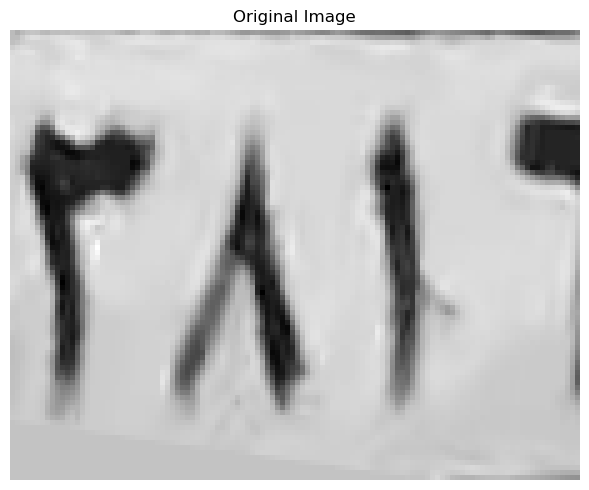

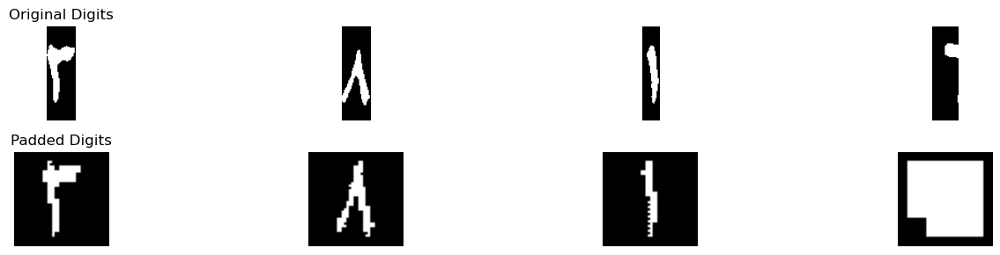

Best match: ٣
Full comparison results: {'١': 0.0625, '٢': 2.75, '٣': 5.581753095975232, '٤': 1.78125, '٥': 1.8108690844758957, '٦': 1.89375, '٧': 1.7286764705882351, '٨': 0.42361111111111105, '٩': 1.1055964052287583}
Confidence :  1.415876547987616
Best match: ٨
Full comparison results: {'١': 2.28125, '٢': 0.125, '٣': 0.5452786377708978, '٤': 0.875, '٥': 0.6137356258292791, '٦': 0.99375, '٧': 0.8143382352941178, '٨': 4.964583333333334, '٩': 2.4940767973856204}
Confidence :  1.2352532679738566
Best match: ١
Full comparison results: {'١': 4.571428571428571, '٢': 1.5700029137529135, '٣': 0.9552051083591331, '٤': 1.2730540293040293, '٥': 0.7928553000147427, '٦': 0.26428571428571423, '٧': 1.0503676470588235, '٨': 1.770138888888889, '٩': 1.4974390397184514}
Confidence :  1.4006448412698411
Best match: ٥
Full comparison results: {'١': 0.5625, '٢': 0.9375, '٣': 0.625, '٤': 0.9375, '٥': 2.25, '٦': 0.71875, '٧': 0.53125, '٨': 0.34375, '٩': 0.34375}
Confidence :  0.65625
In horizontal_segmentatio

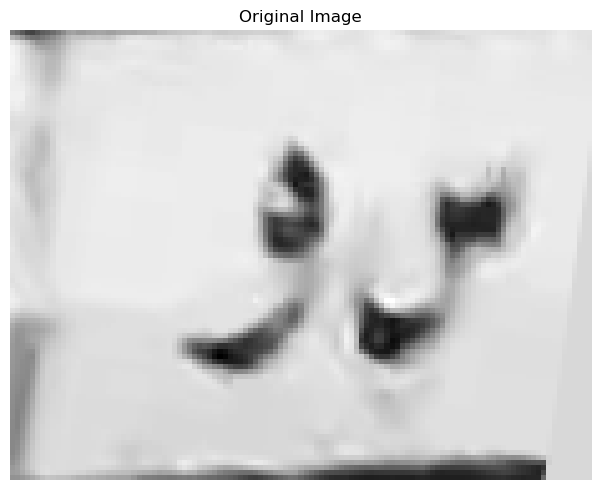

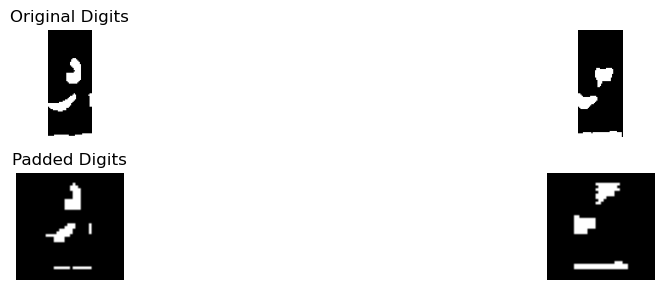

Best match: م
Full comparison results: {'أ': 0.09375, 'ب': 0.6876657824933687, 'ج': 0.37257549805503765, 'د': 0.5607008683324473, 'ر': 0.0, 'س': 0.125, 'ص': 0.17678571428571427, 'ط': 0.03125, 'ع': 0.18889705882352942, 'ف': 0.13541666666666666, 'ق': 0.08125, 'ك': 0.2537878787878788, 'ل': 0.058823529411764705, 'م': 1.1722981714680007, 'ن': 0.03125, 'ه': 0.4153225806451613, 'و': 0.03125, 'ي': 0.0625}
Confidence :  0.242316194487316
Best match: م
Full comparison results: {'أ': 0.19576612903225807, 'ب': 0.8022214854111406, 'ج': 0.8650060386473428, 'د': 0.7720117845117845, 'ر': 0.18146551724137933, 'س': 0.0, 'ص': 0.0, 'ط': 0.4520280444193488, 'ع': 0.23225806451612904, 'ف': 0.7493695596518177, 'ق': 0.32857142857142857, 'ك': 0.43126306165099265, 'ل': 0.05, 'م': 1.3113636363636363, 'ن': 0.8489880952380953, 'ه': 0.15625, 'و': 0.22083333333333333, 'ي': 0.125}
Confidence :  0.22317879885814673
[['٣', '٨', '١', '٥'], ['م', 'م']]
Tilt angle: -2.50 degrees


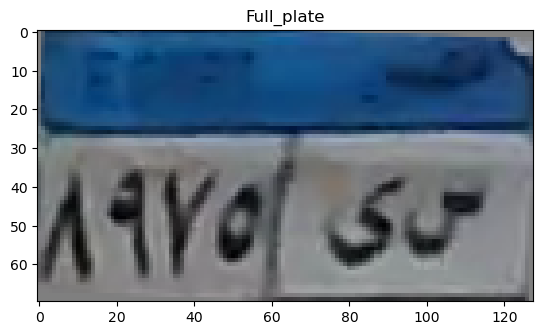

top
[0.46457853 0.45053245 0.41484946 0.44761931 0.51941882 0.54130716
 0.53151789 0.54162314 0.55345765 0.53925926 0.53195294 0.53492235
 0.53180676 0.5238376  0.52434706 0.53353824 0.54407745 0.55532
 0.57863451 0.59453225 0.61396534 0.61872279 0.62654517 0.62274291
 0.62260667 0.60923825 0.58757645 0.58643522 0.58405467 0.58624378
 0.59557784 0.60447588 0.61165836 0.59276539 0.59997081 0.62159885
 0.63756864 0.63700124 0.6348114  0.63262433 0.63203703 0.63577513
 0.63457965 0.63519929 0.63087331 0.63204544 0.62935612 0.62325625
 0.61650803 0.60069002 0.59133723 0.58438411 0.5856793  0.58752392
 0.58826255 0.59130558 0.59397292 0.5959187  0.59820828 0.60535442
 0.61335841 0.62457946 0.61680881 0.5272886 ]
[0.5061526  0.46307271 0.43053422 0.48398229 0.54594738 0.56445152
 0.53817111 0.5349394  0.54924808 0.55521098 0.55555816 0.54633771
 0.53675882 0.53262149 0.53492631 0.54503429 0.55855719 0.56111967
 0.57728647 0.57986    0.59303249 0.59995651 0.60124863 0.60530822
 0.61083078 0.6

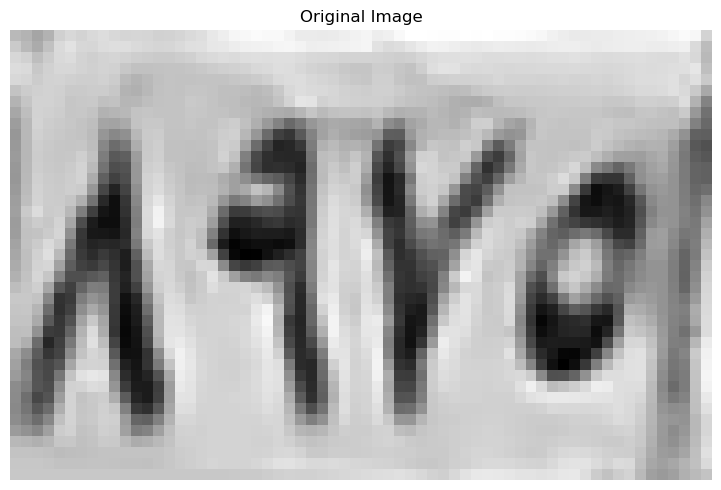

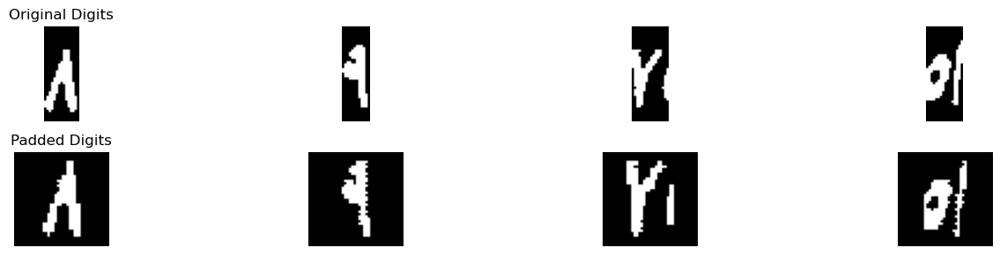

Best match: ٨
Full comparison results: {'١': 1.125, '٢': 0.0625, '٣': 0.0625, '٤': 0.71875, '٥': 1.2490048651039363, '٦': 1.46875, '٧': 0.8044117647058824, '٨': 3.4319444444444445, '٩': 1.4187091503267975}
Confidence :  0.9815972222222222
Best match: ٩
Full comparison results: {'١': 3.1145833333333335, '٢': 2.0841346153846154, '٣': 0.71875, '٤': 1.6271978021978022, '٥': 1.5287667698658411, '٦': 1.7955357142857142, '٧': 0.693014705882353, '٨': 2.5652777777777778, '٩': 4.016119909502263}
Confidence :  0.45076828808446456
Best match: ٨
Full comparison results: {'١': 0.35, '٢': 0.8999999999999999, '٣': 1.0625000000000002, '٤': 0.875, '٥': 1.0809523809523809, '٦': 0.45, '٧': 0.7625, '٨': 1.33125, '٩': 1.13125}
Confidence :  0.09999999999999998
Best match: ٨
Full comparison results: {'١': 0.5555555555555556, '٢': 0.7222222222222221, '٣': 0.6920687134502923, '٤': 1.5381944444444444, '٥': 1.833672723475355, '٦': 0.30486111111111114, '٧': 1.1590277777777778, '٨': 2.3722222222222222, '٩': 1.2604

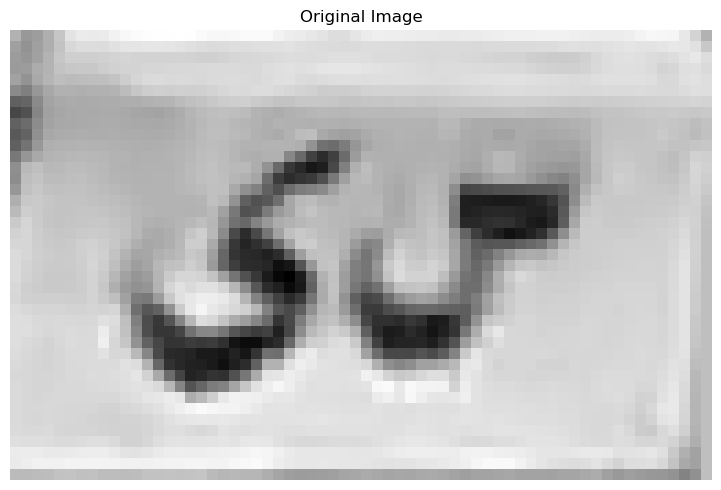

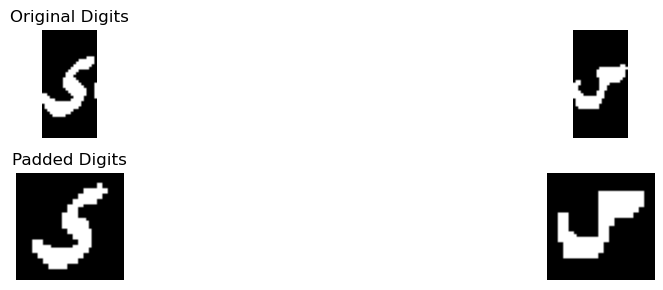

Best match: ي
Full comparison results: {'أ': 0.5357142857142857, 'ب': 0.489378078817734, 'ج': 1.3839285714285716, 'د': 3.1160714285714284, 'ر': 1.9670566502463056, 'س': 2.866071428571429, 'ص': 3.1273809523809524, 'ط': 1.8482142857142856, 'ع': 0.9375, 'ف': 2.6071428571428568, 'ق': 1.5535714285714286, 'ك': 2.116071428571429, 'ل': 1.8482142857142856, 'م': 0.03571428571428571, 'ن': 1.5803571428571428, 'ه': 1.90625, 'و': 2.71875, 'ي': 3.381845238095238}
Confidence :  0.1272321428571428
Best match: س
Full comparison results: {'أ': 0.34375, 'ب': 0.71875, 'ج': 0.40625, 'د': 1.375, 'ر': 0.3125, 'س': 4.909626436781609, 'ص': 3.8717592592592593, 'ط': 0.15625, 'ع': 0.1875, 'ف': 0.625, 'ق': 0.40625, 'ك': 0.25, 'ل': 0.34375, 'م': 1.09375, 'ن': 0.71875, 'ه': 1.9625923645320198, 'و': 0.875, 'ي': 0.71875}
Confidence :  0.518933588761175
[['٨', '٩', '٨', '٨'], ['ي', 'س']]
Tilt angle: 1.50 degrees


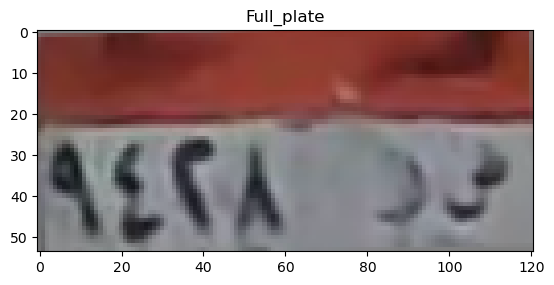

top
[0.29013442 0.28764641 0.30185722 0.30560629 0.30373045 0.29312467
 0.28701282 0.28687966 0.2760808  0.27092158 0.27215905 0.26994734
 0.2673013  0.26593686 0.26492782 0.26481307 0.26448294 0.26061672
 0.25233111 0.23792614 0.22979463 0.22296691 0.21136794 0.20427206
 0.20322415 0.20493318 0.20770816 0.21067684 0.22153608 0.23274692
 0.23948538 0.24430386 0.24599925 0.24467366 0.24267051 0.24205245
 0.23766624 0.23425215 0.23040803 0.23377472 0.23527716 0.23255964
 0.22971303 0.2367894  0.24750192 0.27016532 0.29917799 0.32417777
 0.34312136 0.35355476 0.34508657 0.33428569 0.33045702 0.34976337
 0.37554392 0.39054204 0.39540185 0.38705191 0.37890941 0.37877133]
[0.27632479 0.29651564 0.33921238 0.34818974 0.33006473 0.31315656
 0.29911833 0.29736892 0.28627659 0.27976677 0.27788373 0.26931582
 0.26097775 0.25372026 0.23856175 0.22199598 0.20742462 0.20014843
 0.19767859 0.19774381 0.20125856 0.21198646 0.22139616 0.24049922
 0.25421401 0.26603263 0.27679601 0.28088434 0.29117339 0

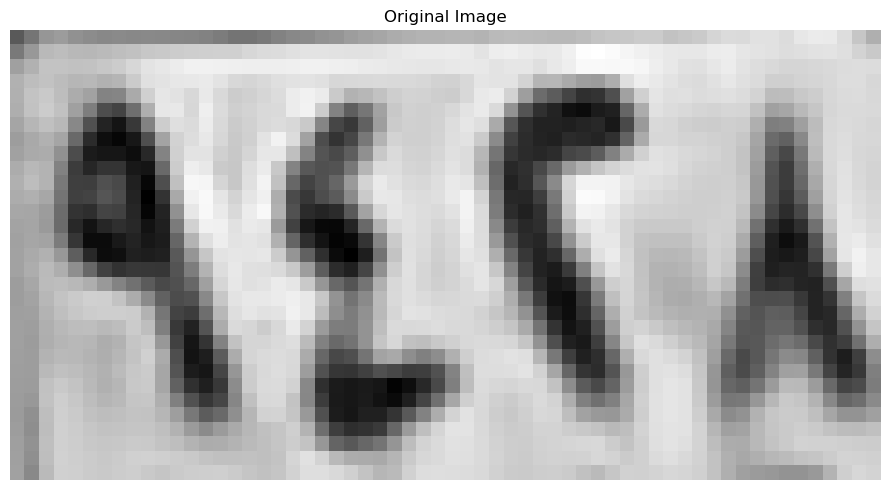

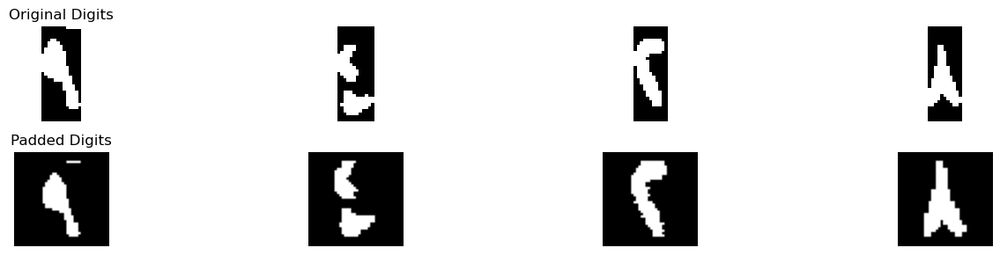

Best match: ٩
Full comparison results: {'١': 2.28125, '٢': 1.90625, '٣': 1.359423374613003, '٤': 2.25, '٥': 0.19047619047619047, '٦': 0.5, '٧': 1.8334558823529412, '٨': 2.459027777777778, '٩': 3.4761029411764706}
Confidence :  0.5085375816993463
Best match: ٤
Full comparison results: {'١': 0.11764705882352941, '٢': 1.3511029411764706, '٣': 0.9862616099071209, '٤': 4.115808823529411, '٥': 2.818949948400413, '٦': 0.18125, '٧': 1.758823529411765, '٨': 0.3908496732026144, '٩': 1.5951665612481554}
Confidence :  0.6484294375644992
Best match: ٢
Full comparison results: {'١': 1.0979166666666667, '٢': 4.910416666666666, '٣': 3.7291989164086687, '٤': 2.8583333333333334, '٥': 2.6299618531623175, '٦': 1.8083333333333333, '٧': 2.7312499999999997, '٨': 0.6118055555555556, '٩': 2.0875408496732026}
Confidence :  0.5906088751289988
Best match: ٨
Full comparison results: {'١': 2.9548611111111107, '٢': 1.4444444444444446, '٣': 1.106359649122807, '٤': 2.4652777777777777, '٥': 2.360458437761069, '٦': 0.22

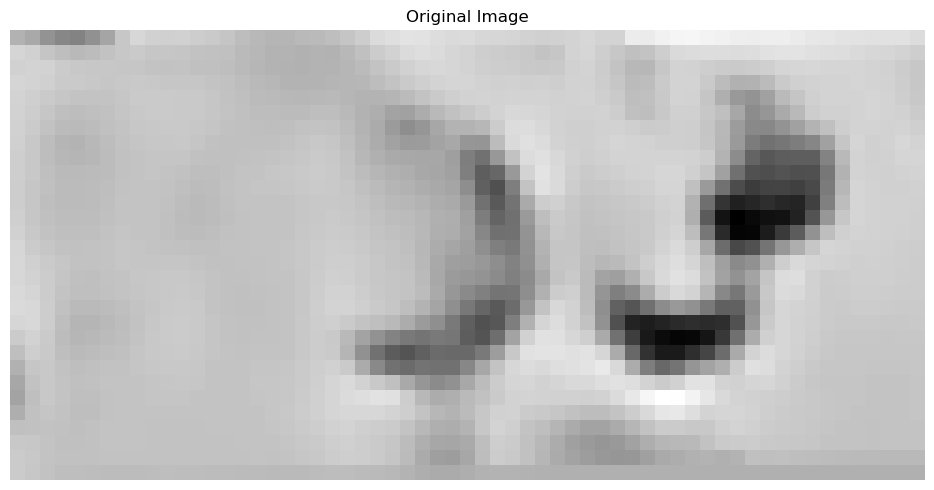

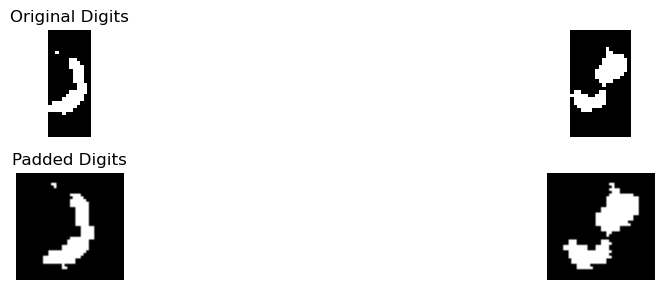

Best match: د
Full comparison results: {'أ': 0.24177631578947367, 'ب': 0.25721153846153844, 'ج': 0.3813352826510721, 'د': 3.4135964912280703, 'ر': 1.931644595935115, 'س': 2.2544642857142856, 'ص': 1.2229166666666667, 'ط': 2.215538537549407, 'ع': 0.5229166666666667, 'ف': 2.8803432191590086, 'ق': 2.2051709133945976, 'ك': 0.6884469696969696, 'ل': 2.4602398132427843, 'م': 0.1534090909090909, 'ن': 1.8541353383458645, 'ه': 1.910013440860215, 'و': 2.3701354079643555, 'ي': 2.0296158980226484}
Confidence :  0.26662663603453085
Best match: س
Full comparison results: {'أ': 0.2857142857142857, 'ب': 0.625307881773399, 'ج': 0.9831509216589862, 'د': 2.807603686635945, 'ر': 1.9321120689655173, 'س': 4.977678571428571, 'ص': 4.920238095238095, 'ط': 1.2589285714285716, 'ع': 0.5531394009216589, 'ف': 2.299107142857143, 'ق': 2.094902073732719, 'ك': 1.7142857142857142, 'ل': 1.845766129032258, 'م': 0.4955357142857143, 'ن': 1.5937499999999998, 'ه': 2.375, 'و': 3.0452188940092166, 'ي': 2.255357142857143}
Confiden

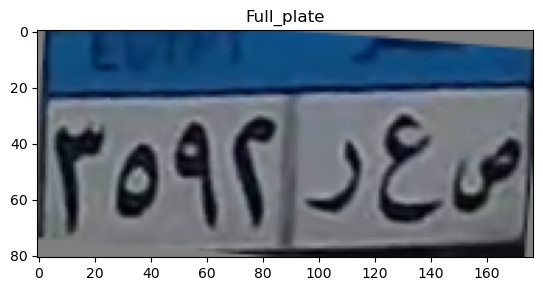

top
[0.41148151 0.22704827 0.1469177  0.32406473 0.49780437 0.52133566
 0.49697178 0.50368047 0.54810257 0.57891161 0.56181723 0.52714784
 0.52008667 0.52335001 0.52860083 0.53430903 0.53876512 0.50566512
 0.47037912 0.48679223 0.52601409 0.5369563  0.51909496 0.50849402
 0.50481947 0.50288958 0.50012431 0.4970738  0.49570642 0.4961139
 0.49936757 0.50236849 0.50304098 0.50172442 0.50012324 0.50273626
 0.50478654 0.50347441 0.50228779 0.50247837 0.50227157 0.50277376
 0.5023302  0.50000176 0.50049196 0.50529292 0.50746849 0.50621765
 0.50198971 0.50223961 0.51713412 0.53821129 0.55878306 0.58949026
 0.54431533 0.43822013 0.45399944 0.5383989  0.57123515 0.5516355
 0.53469479 0.51430509 0.49309676 0.48825373 0.48846053 0.49129198
 0.49458229 0.49250564 0.48749699 0.48126613 0.47986042 0.49950656
 0.54710919 0.58254884 0.55869007 0.46761913 0.30675518 0.14665074
 0.06109514 0.04819596 0.04606021 0.06381563 0.12064563 0.22968789
 0.36471147 0.49494172 0.53869922 0.48512341]
[0.40338844 0.

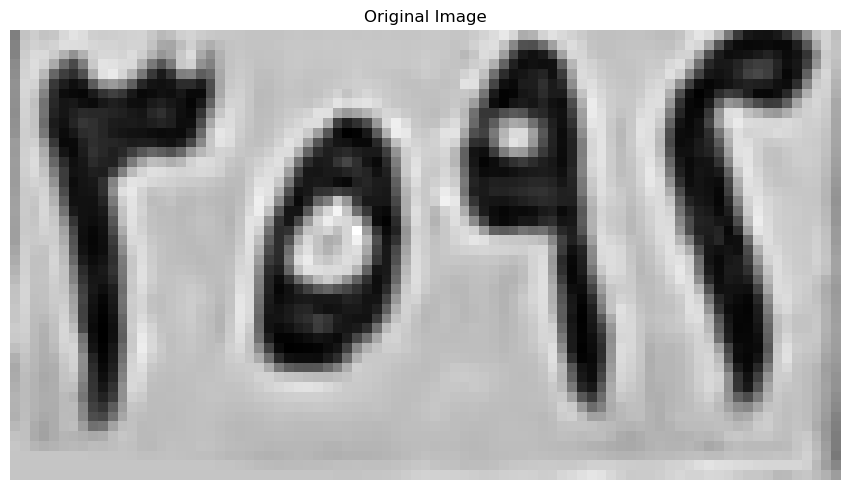

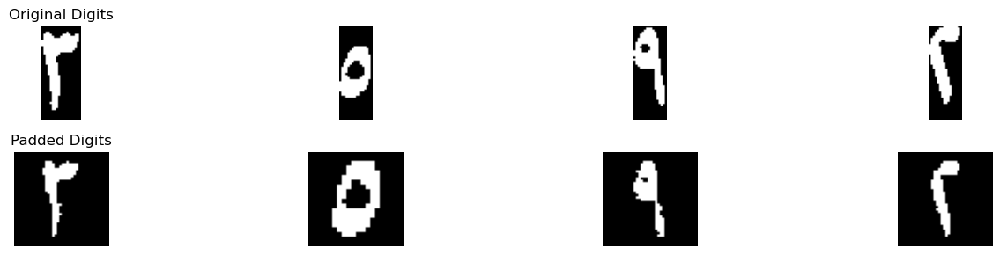

Best match: ٣
Full comparison results: {'١': 0.0, '٢': 3.93125, '٣': 5.2614164086687305, '٤': 1.9729166666666667, '٥': 1.7284756007666224, '٦': 2.1479166666666667, '٧': 1.3919117647058823, '٨': 0.3125, '٩': 0.9668300653594771}
Confidence :  0.6650832043343653
Best match: ٥
Full comparison results: {'١': 0.45, '٢': 1.75, '٣': 1.5499999999999998, '٤': 2.3499999999999996, '٥': 7.00654761904762, '٦': 1.8187499999999999, '٧': 1.08125, '٨': 0.75, '٩': 0.39375}
Confidence :  2.32827380952381
Best match: ٩
Full comparison results: {'١': 3.3052884615384617, '٢': 2.9471153846153846, '٣': 1.6994969040247678, '٤': 2.954555860805861, '٥': 1.7312997567448032, '٦': 1.1970238095238095, '٧': 0.886764705882353, '٨': 3.0375, '٩': 5.77262443438914}
Confidence :  1.2336679864253393
Best match: ٢
Full comparison results: {'١': 0.6145833333333334, '٢': 7.384615384615385, '٣': 4.357875386996904, '٤': 3.0569368131868133, '٥': 1.9173116615067078, '٦': 0.6080357142857142, '٧': 2.0606617647058822, '٨': 0.59166666

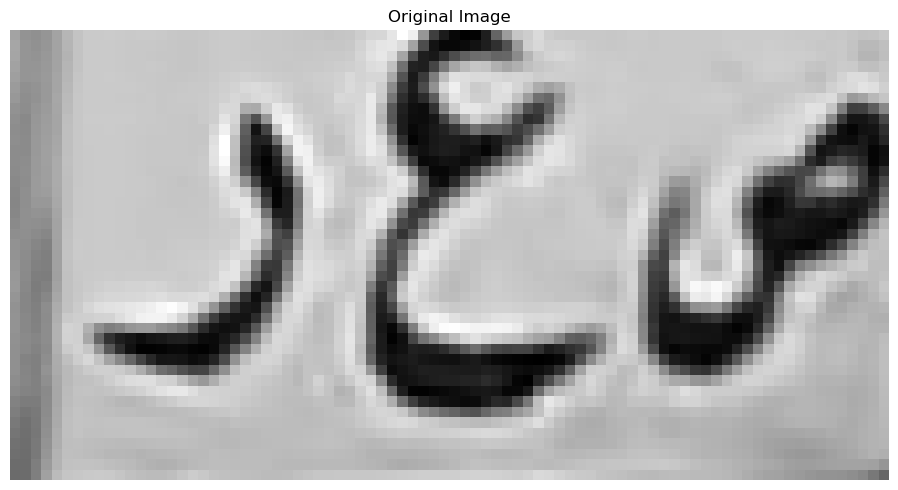

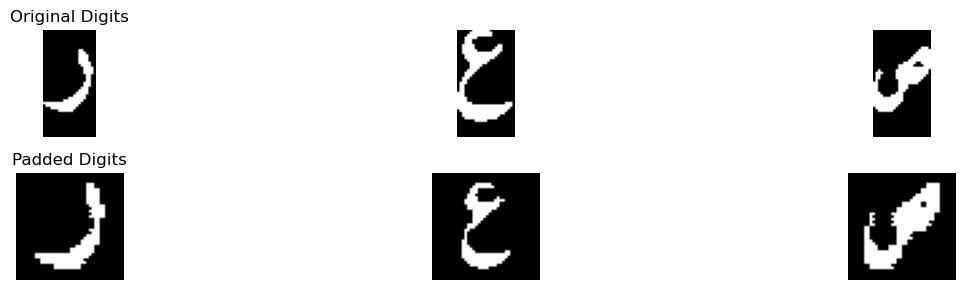

Best match: ر
Full comparison results: {'أ': 0.0, 'ب': 0.5370523872679045, 'ج': 0.662037037037037, 'د': 3.0598290598290596, 'ر': 5.345988063660478, 'س': 1.8214285714285714, 'ص': 1.271153846153846, 'ط': 3.1490384615384617, 'ع': 1.346153846153846, 'ف': 2.5195996133496132, 'ق': 2.1521545584045585, 'ك': 3.418269230769231, 'ل': 2.987980769230769, 'م': 0.0, 'ن': 3.1105769230769234, 'ه': 1.125, 'و': 3.9320690883190883, 'ي': 2.7548076923076925}
Confidence :  0.7069594876706948
Best match: ع
Full comparison results: {'أ': 0.0625, 'ب': 0.034482758620689655, 'ج': 2.21770042558086, 'د': 2.8150035442140706, 'ر': 0.8813268365817092, 'س': 0.39285714285714285, 'ص': 0.25148809523809523, 'ط': 1.3478260869565217, 'ع': 4.384247076023392, 'ف': 0.7276785714285714, 'ق': 1.114310080757449, 'ك': 1.4119318181818183, 'ل': 1.0849780701754386, 'م': 1.6543560606060606, 'ن': 2.1070238095238096, 'ه': 0.5374327956989247, 'و': 1.214781746031746, 'ي': 1.5465045522110739}
Confidence :  0.7846217659046608
Best match: ص
Fu

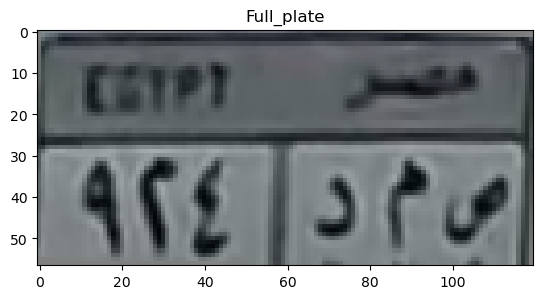

top
[0.27108752 0.31300642 0.40570277 0.43117647 0.42676471 0.41932072
 0.41176176 0.40768583 0.40981106 0.41111543 0.41248415 0.41541489
 0.4168063  0.42096234 0.43040237 0.42902269 0.41713565 0.41434
 0.41728118 0.41916537 0.42549196 0.42739147 0.42635746 0.42291843
 0.41421745 0.40396929 0.39960348 0.39840863 0.40046132 0.40049196
 0.39689208 0.39845458 0.39853118 0.39286999 0.39354104 0.39056549
 0.38739453 0.39007529 0.39190587 0.38780814 0.39228118 0.4007294
 0.40527137 0.40563902 0.4006911  0.39914392 0.40184    0.40406041
 0.40482229 0.40355569 0.40600667 0.40600667 0.41053715 0.41599441
 0.4140298  0.41237922 0.41139882 0.40637431 0.39879159 0.39670659]
[0.25347887 0.31174899 0.41973398 0.44714319 0.44860364 0.44126323
 0.43512738 0.42468773 0.42304864 0.42525835 0.42577574 0.42413028
 0.42592854 0.4314624  0.43552949 0.43470612 0.42250866 0.41360471
 0.4176067  0.42640342 0.42625023 0.41956365 0.42048277 0.42117594
 0.41623951 0.41165541 0.41346684 0.4145851  0.41532039 0.416

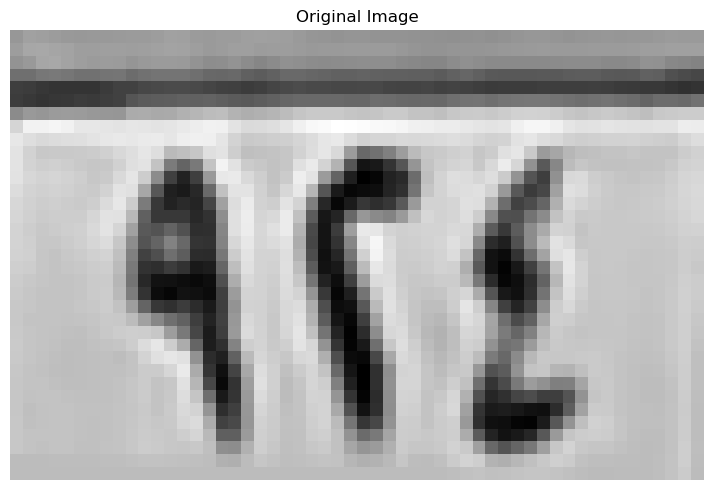

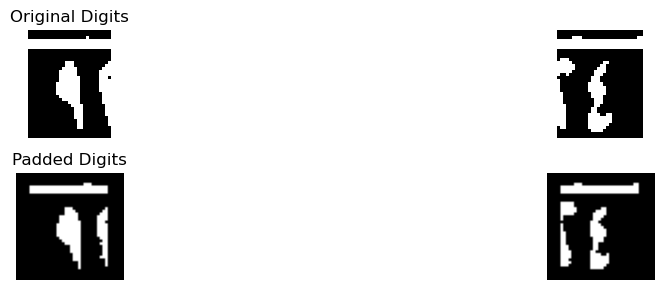

Best match: ٢
Full comparison results: {'١': 1.0463362068965516, '٢': 1.363146551724138, '٣': 1.1002155172413792, '٤': 0.5172413793103449, '٥': 0.4137931034482758, '٦': 0.7489224137931034, '٧': 0.9148706896551724, '٨': 1.115301724137931, '٩': 1.0969827586206897}
Confidence :  0.12392241379310343
Best match: ٣
Full comparison results: {'١': 0.06896551724137931, '٢': 1.3092672413793103, '٣': 1.3092672413793105, '٤': 1.1810344827586208, '٥': 0.5140086206896551, '٦': 0.4482758620689655, '٧': 0.7015086206896551, '٨': 0.26939655172413796, '٩': 0.0}
Confidence :  1.1102230246251565e-16
In horizontal_segmentation_1
0 56
In sub_horizontal_segmentation
0 56
In refine_segmentation_1


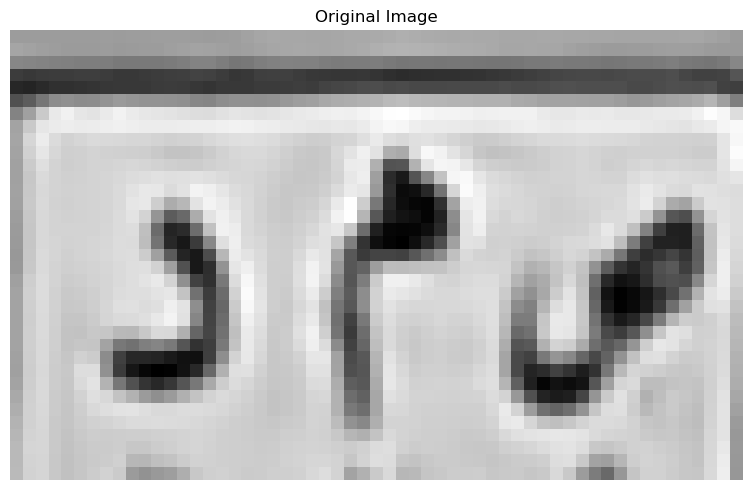

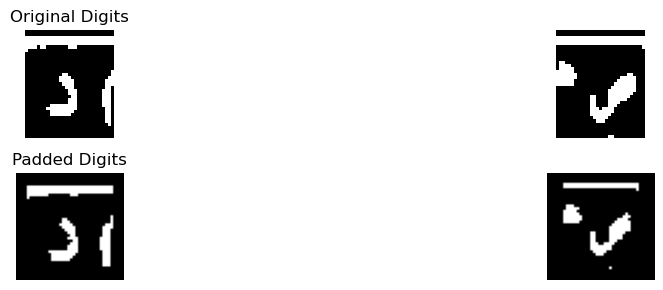

Best match: د
Full comparison results: {'أ': 0.40826612903225806, 'ب': 0.28125, 'ج': 0.75, 'د': 0.84375, 'ر': 0.0625, 'س': 0.4083333333333333, 'ص': 0.71875, 'ط': 0.375, 'ع': 0.125, 'ف': 0.84375, 'ق': 0.5, 'ك': 0.03125, 'ل': 0.125, 'م': 0.0, 'ن': 0.6270833333333333, 'ه': 0.84375, 'و': 0.03125, 'ي': 0.46875}
Confidence :  0.0
Best match: ب
Full comparison results: {'أ': 0.09576612903225806, 'ب': 1.0749841093278247, 'ج': 0.09821428571428571, 'د': 0.17410714285714285, 'ر': 0.10714285714285714, 'س': 0.2232142857142857, 'ص': 0.48429487179487174, 'ط': 0.03571428571428571, 'ع': 0.0, 'ف': 0.4951036866359447, 'ق': 0.9385481222522378, 'ك': 0.07142857142857142, 'ل': 0.10714285714285714, 'م': 0.0, 'ن': 0.25, 'ه': 0.28125, 'و': 0.20636520737327188, 'ي': 0.412797619047619}
Confidence :  0.06821799353779345
[['٢', '٣'], ['د', 'ب']]
Tilt angle: -0.50 degrees


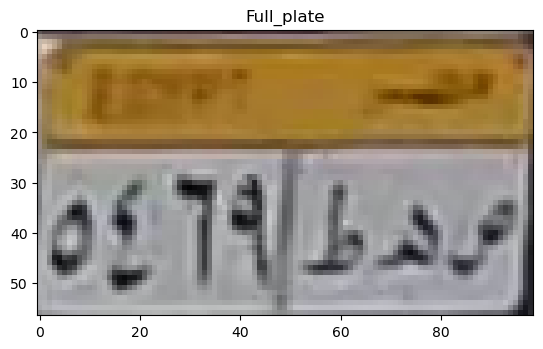

top
[0.54378603 0.45654713 0.37024504 0.35646893 0.36808576 0.37109752
 0.36495946 0.36097331 0.3624498  0.36621353 0.36889347 0.37486442
 0.38343191 0.38930826 0.38578355 0.38276578 0.38447381 0.38165518
 0.38147902 0.38852559 0.38595206 0.38576824 0.38209176 0.38588478
 0.38219157 0.38615309 0.38543782 0.38042262 0.37482684 0.37025723
 0.36728766 0.36078956 0.35980692 0.36565098 0.36589608 0.36528799
 0.36157098 0.36413219 0.36050392 0.36161287 0.36170314 0.36390902
 0.36735571 0.37126196 0.37751196 0.34214125 0.33632017 0.32563543
 0.31783059]
[0.54811933 0.46716327 0.39659091 0.36949973 0.3589615  0.34178465
 0.33336189 0.32750248 0.32646166 0.31871062 0.32367868 0.33202388
 0.33612315 0.34516074 0.34686529 0.3521349  0.3442873  0.34425283
 0.34425283 0.33647799 0.33644735 0.33624553 0.33338975 0.32807799
 0.32682302 0.33540441 0.33141311 0.33558867 0.34023075 0.34614221
 0.34132344 0.34811318 0.34512282 0.33900492 0.33862512 0.3415444
 0.33831493 0.3269886  0.32382398 0.32527496 0

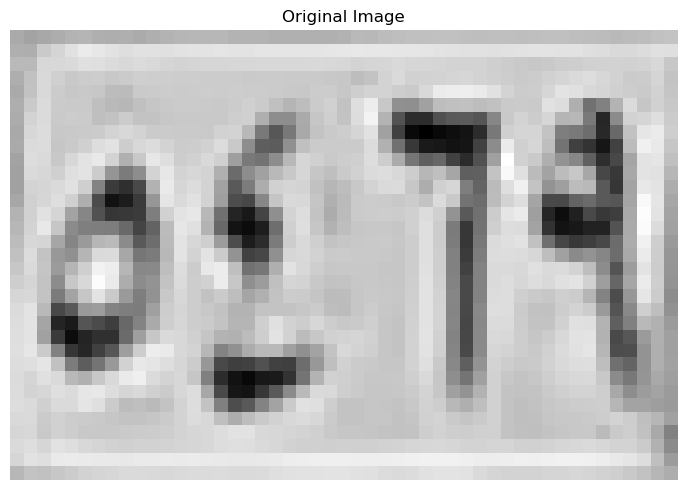

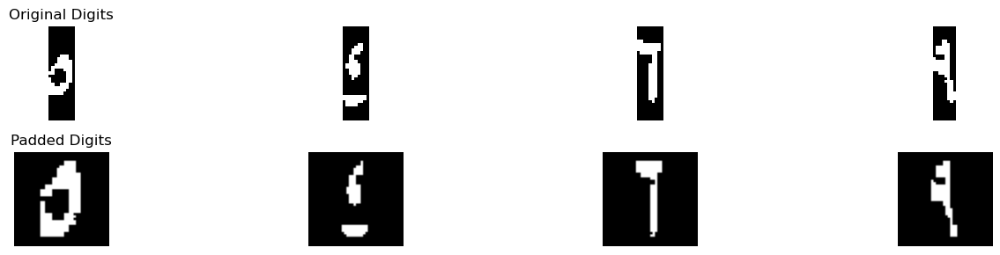

Best match: ٥
Full comparison results: {'١': 1.1764705882352942, '٢': 1.1746323529411766, '٣': 0.7633513931888545, '٤': 2.784926470588235, '٥': 7.033521303258145, '٦': 1.5750000000000002, '٧': 0.574264705882353, '٨': 1.5366830065359478, '٩': 1.3558006535947713}
Confidence :  2.1242974163349553
Best match: ٤
Full comparison results: {'١': 2.6306818181818183, '٢': 0.9895104895104895, '٣': 1.1953366873065017, '٤': 3.377383167907362, '٥': 1.782751916556096, '٦': 0.21428571428571427, '٧': 0.20625, '٨': 2.06875, '٩': 1.004257792860734}
Confidence :  0.37335067486277174
Best match: ١
Full comparison results: {'١': 3.775568181818182, '٢': 2.991841491841491, '٣': 1.4030572755417956, '٤': 0.45535714285714285, '٥': 1.2943433952528378, '٦': 3.050595238095238, '٧': 0.6691176470588236, '٨': 0.4548611111111111, '٩': 1.8385809451985922}
Confidence :  0.362486471861472
Best match: ٩
Full comparison results: {'١': 3.6761363636363638, '٢': 3.0477855477855478, '٣': 1.1192917956656347, '٤': 2.9047161172161

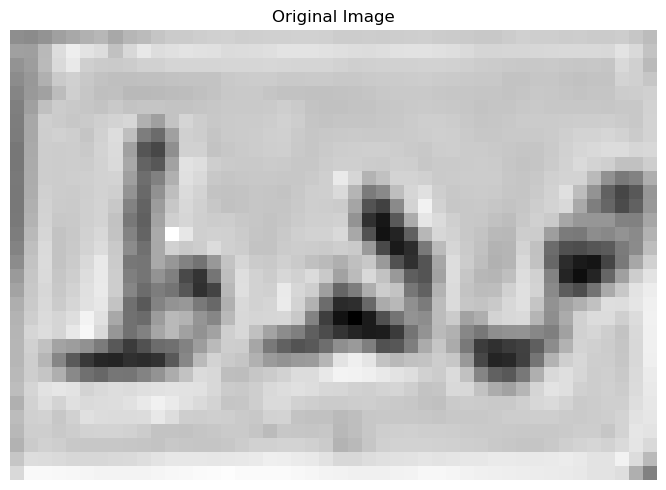

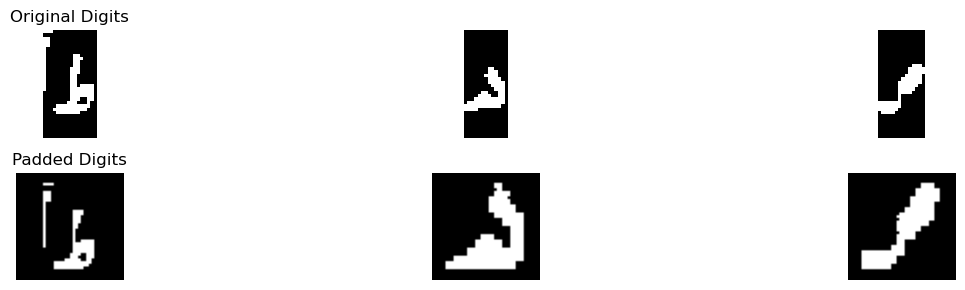

Best match: ر
Full comparison results: {'أ': 0.15789473684210525, 'ب': 0.1939655172413793, 'ج': 0.49288302277432705, 'د': 0.8019005847953216, 'ر': 2.4498253880578504, 'س': 0.34375, 'ص': 0.09583333333333333, 'ط': 1.5634881422924898, 'ع': 0.857279286926995, 'ف': 0.885225215817321, 'ق': 1.265464007240323, 'ك': 0.6259469696969697, 'ل': 1.9996710526315788, 'م': 0.0, 'ن': 0.8856077694235589, 'ه': 0.2561827956989247, 'و': 1.8497981063770539, 'ي': 1.4169648095992489}
Confidence :  0.2250771677131358
Best match: ه
Full comparison results: {'أ': 0.4482758620689655, 'ب': 0.32219827586206895, 'ج': 0.8232758620689655, 'د': 3.9030172413793105, 'ر': 2.762931034482759, 'س': 2.091594827586207, 'ص': 1.1966954022988505, 'ط': 2.459051724137931, 'ع': 0.43534482758620685, 'ف': 3.699353448275862, 'ق': 1.259698275862069, 'ك': 1.9795258620689655, 'ل': 1.3599137931034482, 'م': 0.16594827586206895, 'ن': 1.5323275862068966, 'ه': 5.3125, 'و': 2.6939655172413794, 'ي': 1.6492816091954021}
Confidence :  0.70474137931

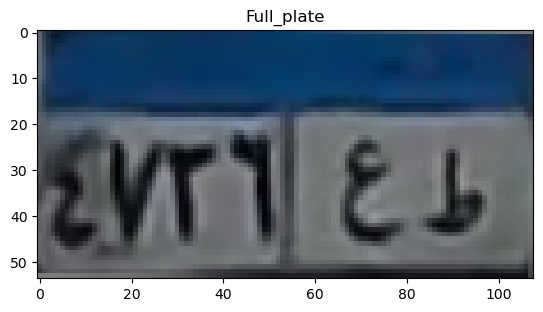

top
[0.35499678 0.36820308 0.38704025 0.42468139 0.41946976 0.41311228
 0.40751544 0.40717422 0.42422317 0.40413706 0.36579931 0.35078936
 0.3657926  0.3897656  0.41154961 0.43672434 0.48250277 0.51538111
 0.49106283 0.48272499 0.48562006 0.47891584 0.4686081  0.47164386
 0.48272689 0.5032965  0.51163283 0.51251042 0.51236395 0.50115965
 0.49373871 0.49036204 0.49620581 0.49855914 0.49262167 0.483995
 0.47649846 0.47552762 0.47169868 0.47121063 0.49232579 0.51313955
 0.49022882 0.48170659 0.52503722 0.55125062 0.54483803 0.52380756
 0.48681631 0.45605766 0.45618954 0.43008238 0.40727577 0.32351142]
[0.34692123 0.36077397 0.37241269 0.38577046 0.38032674 0.37890984
 0.35446428 0.34188584 0.3606902  0.32297328 0.27675737 0.26162256
 0.29470727 0.33835881 0.38339199 0.42559063 0.47973598 0.51373358
 0.49665159 0.48354723 0.48345527 0.47472782 0.461602   0.46554389
 0.48441379 0.50458392 0.51642185 0.50891961 0.50296132 0.49396889
 0.48839426 0.48584754 0.48995009 0.49642106 0.49027999 0.4

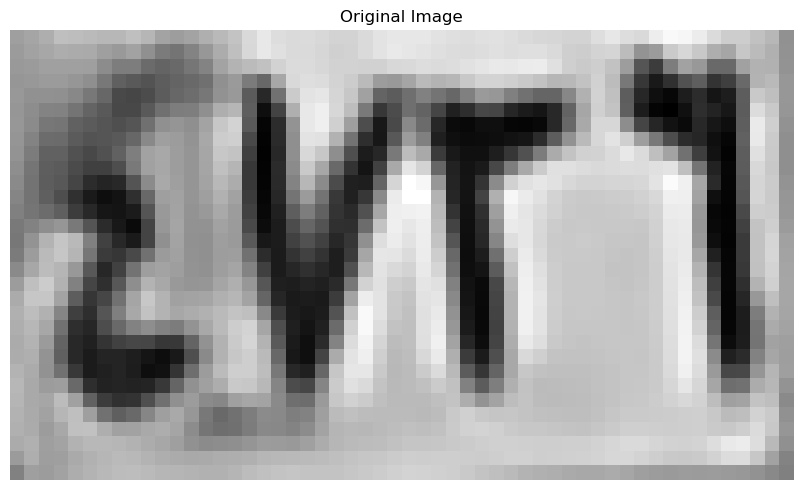

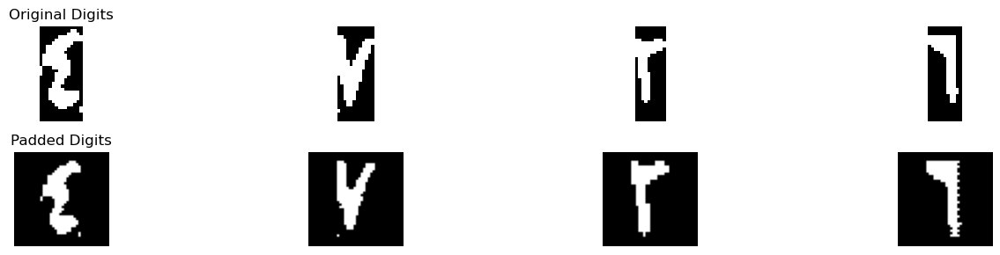

Best match: ٢
Full comparison results: {'١': 1.1286764705882353, '٢': 3.525735294117647, '٣': 3.084655572755418, '٤': 3.141544117647059, '٥': 3.0496968524251806, '٦': 0.7830882352941176, '٧': 1.3147058823529412, '٨': 1.4468954248366013, '٩': 2.353962418300654}
Confidence :  0.19209558823529416
Best match: ٧
Full comparison results: {'١': 0.5, '٢': 1.6875, '٣': 3.0208010835913313, '٤': 1.4375, '٥': 0.4284240011794191, '٦': 0.20625, '٧': 3.1742647058823525, '٨': 1.3833333333333333, '٩': 2.029207516339869}
Confidence :  0.07673181114551064
Best match: ٣
Full comparison results: {'١': 0.0, '٢': 3.5, '٣': 5.169311145510836, '٤': 1.5625, '٥': 1.8691489753796255, '٦': 1.625, '٧': 1.961029411764706, '٨': 0.3125, '٩': 0.5371732026143791}
Confidence :  0.8346555727554179
Best match: ٦
Full comparison results: {'١': 2.84375, '٢': 0.79375, '٣': 2.157217492260062, '٤': 0.12916666666666665, '٥': 2.5275228512457613, '٦': 5.5249999999999995, '٧': 0.3639705882352941, '٨': 1.1083333333333334, '٩': 2.790

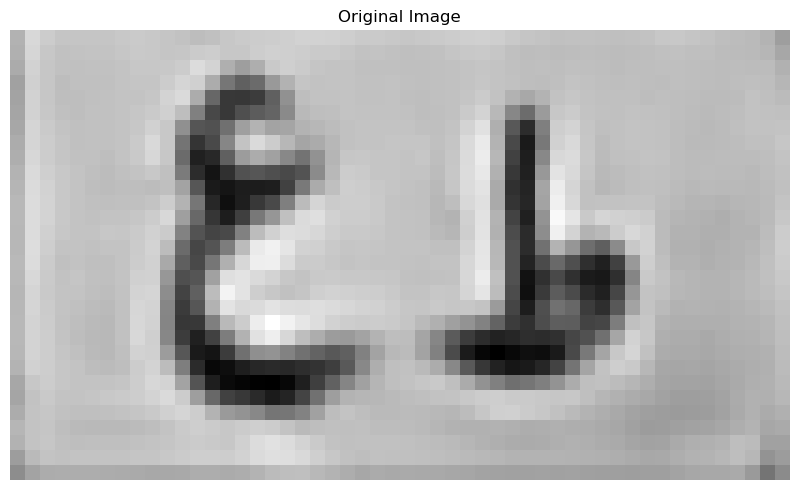

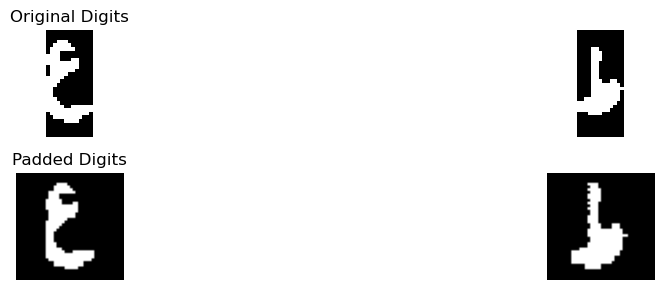

Best match: ع
Full comparison results: {'أ': 0.22916666666666666, 'ب': 0.2356598143236074, 'ج': 2.3678255118472507, 'د': 2.6152981570086835, 'ر': 0.9158095952023988, 'س': 0.23660714285714285, 'ص': 0.11011904761904762, 'ط': 1.7007164031620556, 'ع': 4.379641812865497, 'ف': 1.4521024784182677, 'ق': 0.9161758563074353, 'ك': 1.7784090909090913, 'ل': 1.1238669590643275, 'م': 1.4848484848484849, 'ن': 2.58281746031746, 'ه': 0.5426075268817204, 'و': 1.2495039682539681, 'ي': 1.268192586399108}
Confidence :  0.8821718279284068
Best match: ط
Full comparison results: {'أ': 0.6339285714285714, 'ب': 0.6315484084880637, 'ج': 1.538647342995169, 'د': 2.987194564694565, 'ر': 1.6285328764189333, 'س': 1.3928571428571428, 'ص': 1.1419642857142858, 'ط': 3.6260293148880107, 'ع': 1.1011904761904763, 'ف': 3.1469907407407405, 'ق': 1.5629960317460316, 'ك': 1.4990530303030303, 'ل': 1.4985119047619047, 'م': 0.31479978354978355, 'ن': 1.729404761904762, 'ه': 2.6421370967741935, 'و': 1.3034060846560847, 'ي': 2.35668597

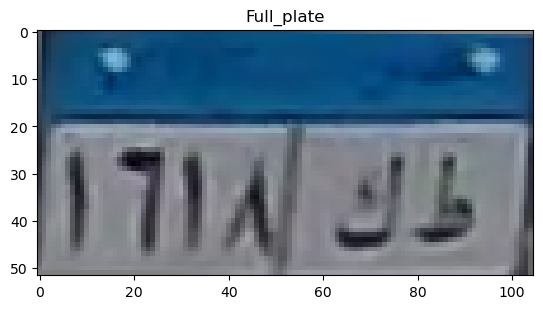

top
[0.22991049 0.28912115 0.31722    0.38586355 0.44010255 0.52485624
 0.56858559 0.57820996 0.59137017 0.60241115 0.60703683 0.6119546
 0.61049289 0.59715335 0.5931251  0.57912595 0.5921004  0.60838606
 0.61174751 0.59773665 0.58172657 0.56084393 0.55546018 0.56561897
 0.5988449  0.5169391  0.51741082 0.53999275 0.50470091 0.50781399
 0.51456049 0.50976071 0.50103461 0.49241167 0.48062774 0.46906996
 0.46971021 0.48912499 0.48823735 0.47820777 0.47538316 0.48585131
 0.5053024  0.52529553 0.5173206  0.50976654 0.51279069 0.50775809
 0.47135815 0.53248541 0.5443207  0.51925096]
[0.22149548 0.28090647 0.35178238 0.48798644 0.59111882 0.64507675
 0.62380501 0.63316323 0.65273576 0.6601168  0.64907174 0.64731032
 0.6570264  0.65494875 0.64557608 0.63476037 0.6111652  0.62287091
 0.62493706 0.61863422 0.61441404 0.62095971 0.62582512 0.63181319
 0.64117922 0.62434865 0.63138931 0.647336   0.63580108 0.60780478
 0.60559321 0.60699716 0.61254392 0.61622652 0.6205188  0.62476127
 0.63201125 0

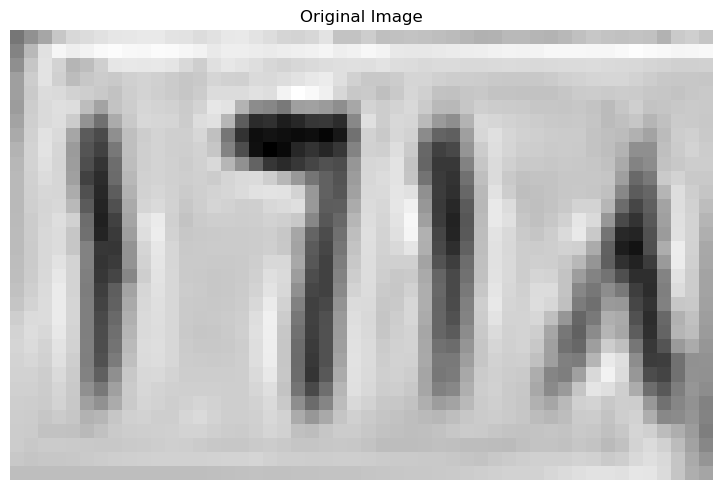

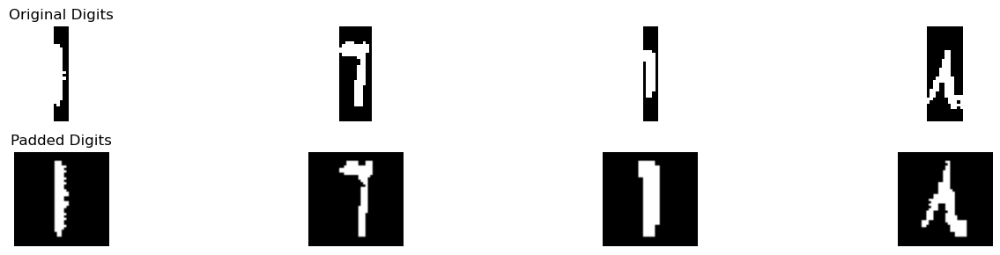

Best match: ١
Full comparison results: {'١': 3.2416666666666667, '٢': 2.3956876456876457, '٣': 1.56046826625387, '٤': 1.9843406593406594, '٥': 0.8780729397021967, '٦': 0.0, '٧': 1.18125, '٨': 2.2527777777777778, '٩': 0.8066239316239316}
Confidence :  0.4229895104895105
Best match: ٦
Full comparison results: {'١': 2.486607142857143, '٢': 1.7678571428571428, '٣': 1.4832623839009287, '٤': 0.0625, '٥': 1.4896800825593395, '٦': 5.463392857142857, '٧': 1.1084558823529413, '٨': 0.2791666666666667, '٩': 1.3707107843137256}
Confidence :  1.488392857142857
Best match: ١
Full comparison results: {'١': 3.471527777777778, '٢': 2.66768648018648, '٣': 1.09171826625387, '٤': 1.6271978021978022, '٥': 2.3584282397169396, '٦': 1.6577380952380953, '٧': 1.3628676470588235, '٨': 1.9840277777777775, '٩': 1.7483817244846658}
Confidence :  0.40192064879564904
Best match: ٨
Full comparison results: {'١': 2.044407894736842, '٢': 0.5263157894736842, '٣': 0.631578947368421, '٤': 0.4917763157894737, '٥': 0.44227756

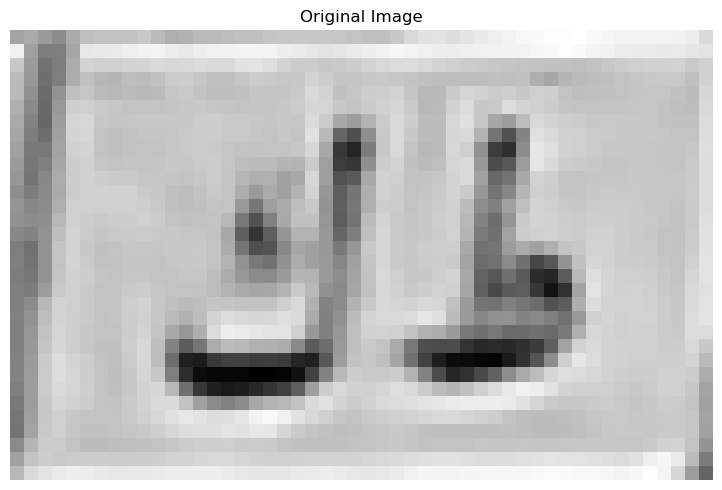

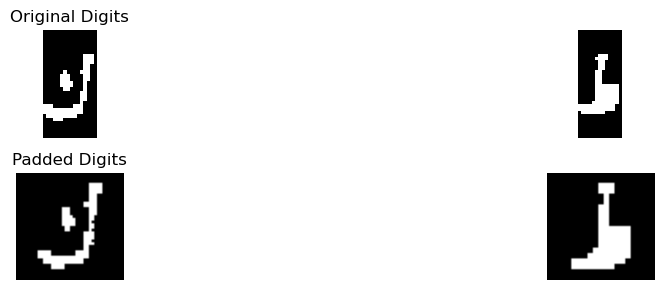

Best match: ك
Full comparison results: {'أ': 0.09375, 'ب': 0.2252155172413793, 'ج': 0.44328703703703703, 'د': 1.7477314814814815, 'ر': 2.871192528735632, 'س': 1.3035714285714286, 'ص': 1.6270833333333334, 'ط': 2.375, 'ع': 1.1145833333333333, 'ف': 1.7810846560846563, 'ق': 1.599537037037037, 'ك': 3.854166666666667, 'ل': 2.5625, 'م': 0.041666666666666664, 'ن': 2.1308333333333334, 'ه': 0.8800403225806451, 'و': 2.646990740740741, 'ي': 2.3834935897435896}
Confidence :  0.4914870689655175
Best match: ط
Full comparison results: {'أ': 0.7357954545454546, 'ب': 0.16594827586206895, 'ج': 1.5310715854194117, 'د': 2.6419865319865323, 'ر': 3.006894336922448, 'س': 1.0044642857142856, 'ص': 1.1948863636363636, 'ط': 4.54487812911726, 'ع': 0.7556818181818181, 'ف': 3.9483826358826355, 'ق': 2.2510521885521886, 'ك': 1.9119318181818181, 'ل': 1.7500000000000002, 'م': 0.1875, 'ن': 2.103636363636364, 'ه': 1.281989247311828, 'و': 2.934659090909091, 'ي': 2.8490061568865914}
Confidence :  0.2982477466173121
[['١', '

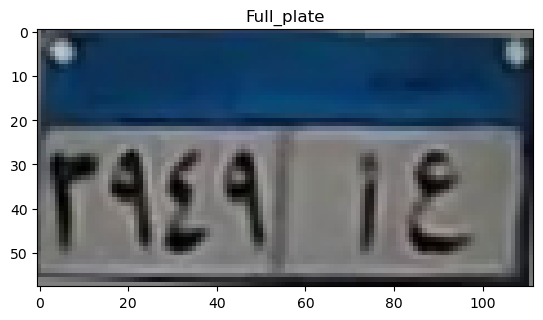

top
[0.30461296 0.26342854 0.36430338 0.47349376 0.5013611  0.49568362
 0.50631961 0.50541262 0.50352402 0.50516054 0.50745485 0.51074401
 0.52175676 0.52259656 0.5228381  0.52770575 0.53183396 0.54016789
 0.5528633  0.55922583 0.55206922 0.5479837  0.55007615 0.55026318
 0.55296044 0.55610221 0.56116164 0.57268931 0.58059729 0.58267306
 0.58135686 0.58720858 0.58910043 0.58142718 0.57834021 0.57319142
 0.56768044 0.56638592 0.56037216 0.55355379 0.55136875 0.55140996
 0.5501551  0.57039723 0.56852037 0.55901056 0.55160707 0.544844
 0.55214069 0.55396223 0.57687775 0.58009711 0.56387659 0.53963226
 0.47973355 0.43416937]
[0.28975877 0.30116733 0.43932603 0.52057377 0.5326867  0.53089032
 0.51209559 0.50112362 0.50340227 0.50506812 0.51055247 0.51495621
 0.52638569 0.53486108 0.5333351  0.51915956 0.50843119 0.50846795
 0.5092224  0.51620229 0.51674637 0.52135115 0.52250771 0.5214354
 0.51487137 0.50119188 0.49544712 0.52695569 0.56333001 0.57037632
 0.54770568 0.54792086 0.54557736 0.5

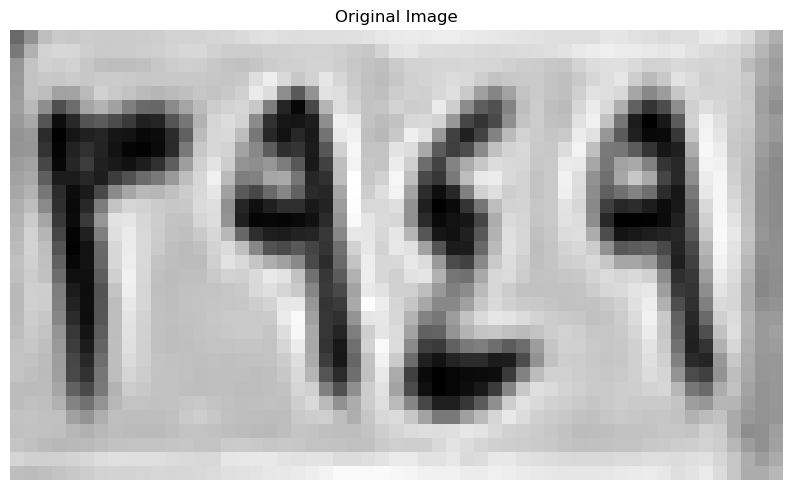

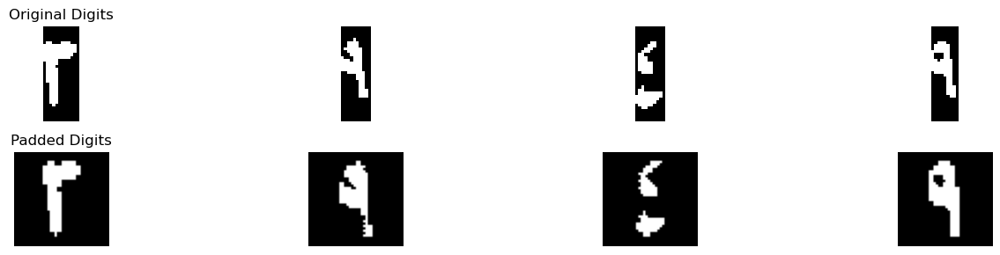

Best match: ٣
Full comparison results: {'١': 0.1875, '٢': 3.875, '٣': 5.575561145510836, '٤': 2.1875, '٥': 1.9052548651039363, '٦': 1.6875, '٧': 2.3875, '٨': 0.5986111111111111, '٩': 0.7420343137254902}
Confidence :  0.8502805727554179
Best match: ٩
Full comparison results: {'١': 2.34375, '٢': 2.522321428571429, '٣': 1.65218653250774, '٤': 1.7000000000000002, '٥': 1.9560896727111896, '٦': 1.9169642857142857, '٧': 1.168014705882353, '٨': 2.509722222222222, '٩': 5.1243872549019605}
Confidence :  1.3010329131652658
Best match: ٤
Full comparison results: {'١': 1.9895833333333335, '٢': 1.4342948717948718, '٣': 0.9140866873065016, '٤': 4.036378205128205, '٥': 2.297568369453044, '٦': 0.0, '٧': 0.2838235294117647, '٨': 1.6104166666666666, '٩': 1.145044721776221}
Confidence :  0.8694049178375804
Best match: ٩
Full comparison results: {'١': 2.25, '٢': 3.026442307692308, '٣': 2.060952012383901, '٤': 1.8762591575091574, '٥': 2.4423098186643077, '٦': 2.748809523809524, '٧': 1.4496323529411765, '٨':

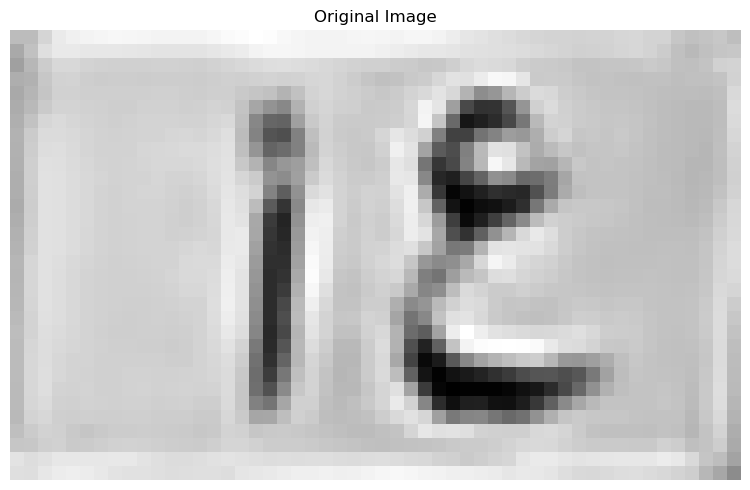

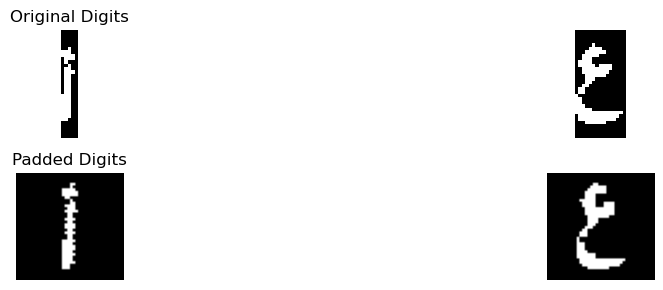

Best match: أ
Full comparison results: {'أ': 2.7144001831501825, 'ب': 0.28448275862068967, 'ج': 0.5626293995859213, 'د': 1.0056139699367252, 'ر': 0.07886904761904762, 'س': 0.1294642857142857, 'ص': 0.5241071428571429, 'ط': 0.8517786561264822, 'ع': 0.0625, 'ف': 0.7062360763018656, 'ق': 0.21538220551378445, 'ك': 0.045454545454545456, 'ل': 0.0, 'م': 0.4661276223776224, 'ن': 0.602797619047619, 'ه': 0.7008736559139785, 'و': 0.5821428571428571, 'ي': 0.4113095238095238}
Confidence :  0.8543931066067286
Best match: ع
Full comparison results: {'أ': 0.29166666666666663, 'ب': 0.0, 'ج': 2.068409247757074, 'د': 2.7612925305688463, 'ر': 0.38375000000000004, 'س': 0.7589285714285714, 'ص': 0.5133928571428571, 'ط': 0.9486989459815546, 'ع': 4.749232456140351, 'ف': 1.3820488721804511, 'ق': 1.2657981759955446, 'ك': 1.3456439393939394, 'ل': 0.966922514619883, 'م': 2.578914141414141, 'ن': 2.13218253968254, 'ه': 0.8894489247311828, 'و': 1.1036706349206349, 'ي': 0.8249860646599777}
Confidence :  0.9939699627857

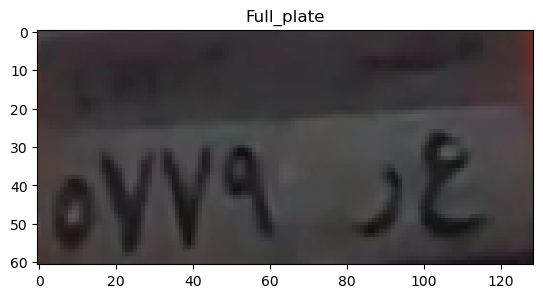

top
[0.22481529 0.22509804 0.22288078 0.21139882 0.21365373 0.21282039
 0.21229255 0.21509804 0.21566353 0.21566353 0.2195851  0.22742824
 0.22940039 0.22547882 0.22155725 0.22155725 0.21511294 0.22295608
 0.23079922 0.23079922 0.22687765 0.22687765 0.22799373 0.22799373
 0.22687765 0.22687765 0.22212275 0.21316353 0.20532039 0.20532039
 0.20532039 0.20532039 0.20532039 0.20924196 0.22100667 0.23277137
 0.24258667 0.24762431 0.25323529 0.25406863 0.25406863 0.25715686
 0.2579902  0.26191176 0.265      0.26583333 0.27172706 0.27564863
 0.27593137 0.27481529 0.27593137 0.2720098  0.27089373 0.26780549
 0.27089373 0.27481529 0.27873686 0.28265843 0.27759804 0.2697549
 0.26666667 0.2627451  0.25490196 0.25882353]
[0.23265843 0.2318251  0.23072392 0.22288078 0.22149686 0.22149686
 0.21901961 0.21930235 0.2195851  0.22350667 0.22742824 0.23527137
 0.23724353 0.23724353 0.23724353 0.22940039 0.22295608 0.23472078
 0.23864235 0.23864235 0.23472078 0.23472078 0.23864235 0.24648549
 0.24536941 0

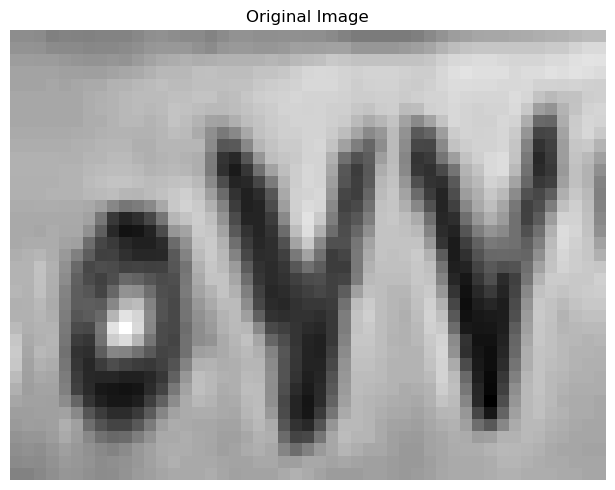

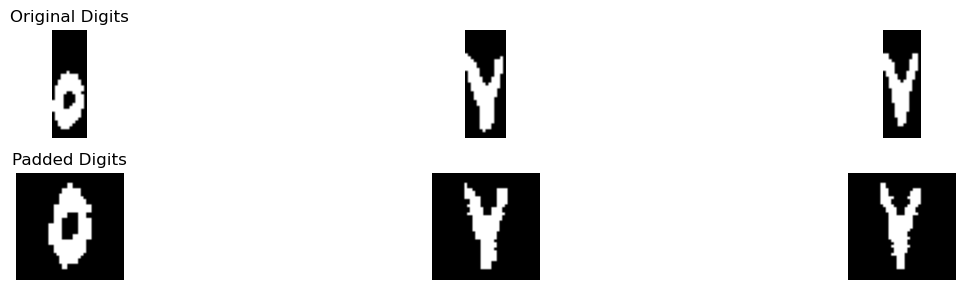

Best match: ٥
Full comparison results: {'١': 1.1875, '٢': 2.375, '٣': 1.5744969040247678, '٤': 1.9375, '٥': 4.944774620374465, '٦': 1.4625, '٧': 1.0694852941176471, '٨': 2.002083333333333, '٩': 0.8991013071895425}
Confidence :  1.2848873101872327
Best match: ٧
Full comparison results: {'١': 0.875, '٢': 2.71875, '٣': 2.7990518575851393, '٤': 1.65625, '٥': 1.1245485036119711, '٦': 1.5625, '٧': 4.414705882352941, '٨': 1.5145833333333334, '٩': 1.7730800653594772}
Confidence :  0.8078270123839006
Best match: ٧
Full comparison results: {'١': 0.8270833333333334, '٢': 2.5124999999999997, '٣': 2.9479489164086687, '٤': 1.9270833333333335, '٥': 0.4332798909037299, '٦': 1.0979166666666667, '٧': 4.778308823529412, '٨': 1.8763888888888889, '٩': 1.3850898692810458}
Confidence :  0.9151799535603715
In horizontal_segmentation_1
18 31
35 44
In refine_segmentation_1


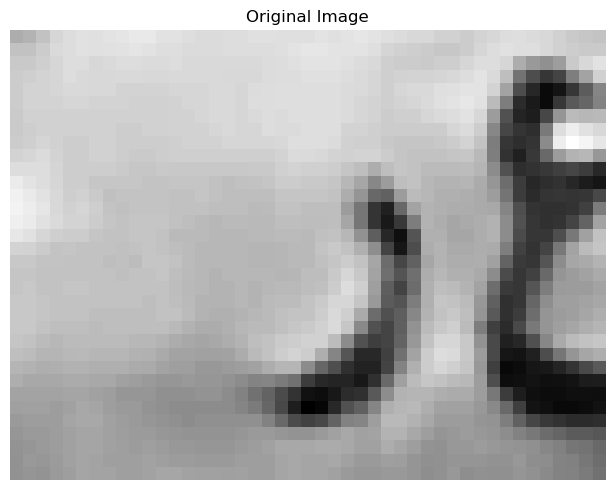

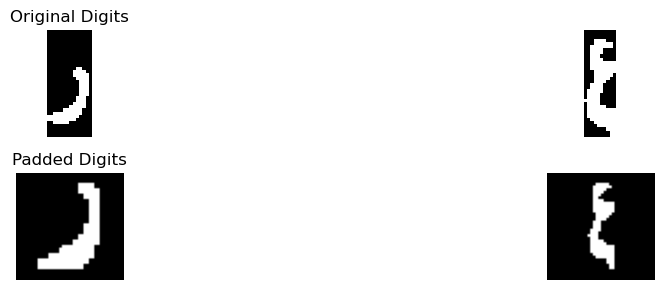

Best match: ر
Full comparison results: {'أ': 0.08695652173913043, 'ب': 0.5891080901856763, 'ج': 1.2704307568438002, 'د': 3.8639271336553946, 'ر': 5.078896176911544, 'س': 1.4107142857142856, 'ص': 1.0608695652173914, 'ط': 3.5375905797101446, 'ع': 1.0828804347826086, 'ف': 4.01424114331723, 'ق': 2.3409319645732687, 'ك': 2.832427536231884, 'ل': 2.8845108695652173, 'م': 0.0, 'ن': 3.4609782608695654, 'ه': 1.1310483870967742, 'و': 3.8682568438003218, 'ي': 3.0715997770345593}
Confidence :  0.5323275167971571
Best match: أ
Full comparison results: {'أ': 1.5995192307692307, 'ب': 0.38221153846153844, 'ج': 0.18484730848861283, 'د': 1.2915396482888744, 'ر': 0.4172910865995574, 'س': 0.3214285714285714, 'ص': 0.31607142857142856, 'ط': 1.1256175889328062, 'ع': 0.4677631578947368, 'ف': 0.9077293929267611, 'ق': 0.32910575048732943, 'ك': 0.0, 'ل': 0.0900735294117647, 'م': 0.8981643356643356, 'ن': 0.4288690476190476, 'ه': 1.3663978494623656, 'و': 1.2672619047619047, 'ي': 0.26092032967032963}
Confidence :  0

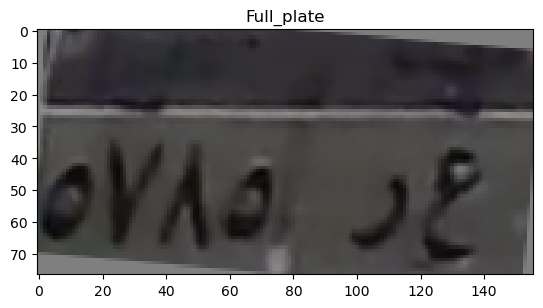

top
[0.50414464 0.40360623 0.30277908 0.29983674 0.31703525 0.32224619
 0.32066908 0.320011   0.32125899 0.32111685 0.32046319 0.31929821
 0.31591337 0.31292797 0.31000759 0.30862186 0.3100046  0.31077202
 0.31043088 0.3077295  0.29827539 0.29186275 0.28703708 0.28199697
 0.28184676 0.28018294 0.27822216 0.27828343 0.27834471 0.28030549
 0.28511477 0.28825279 0.28957561 0.29134348 0.29330355 0.29877593
 0.30395745 0.30751137 0.31658766 0.32912679 0.32201283 0.29950477
 0.2981332  0.30930473 0.31380733 0.31181792 0.31038359 0.31181249
 0.31371497 0.31510274 0.31556514 0.31377345 0.3142249  0.3138066
 0.30949054 0.30727585 0.30699054 0.30414127 0.29844275 0.29360206
 0.2873085  0.27979301 0.2759162  0.27441085 0.27406865 0.27773196
 0.279777   0.27993784 0.28562752 0.28447866 0.28173012 0.27386346
 0.26813664 0.26427988 0.26132691 0.26198914 0.26276509 0.26050912]
[0.50503201 0.38062127 0.2778619  0.28153098 0.31687158 0.33319197
 0.32740063 0.3212937  0.32317512 0.32463312 0.32452825 0.

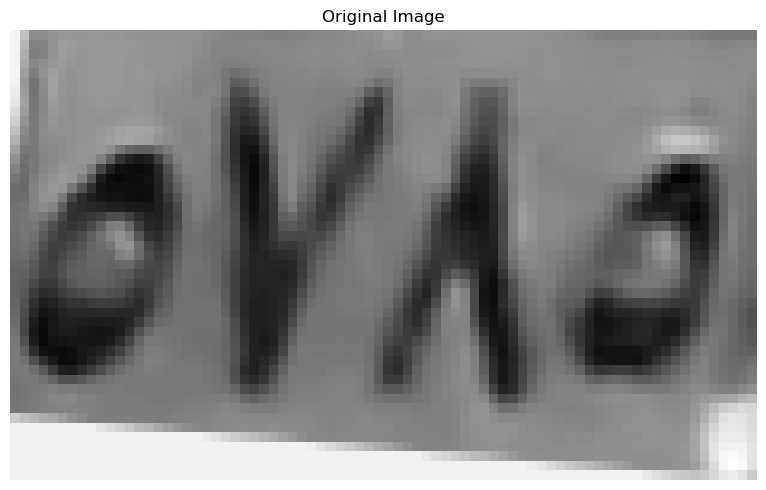

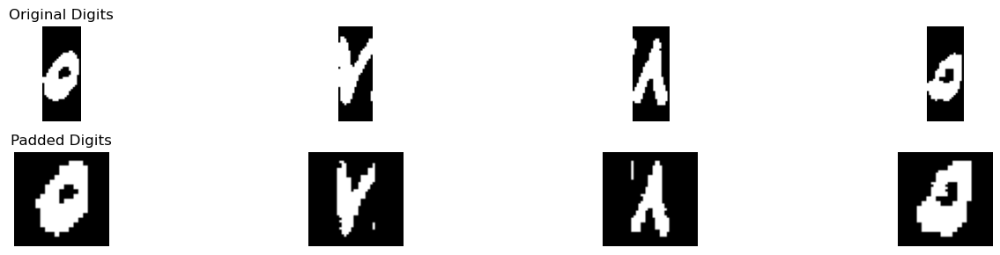

Best match: ٥
Full comparison results: {'١': 0.8181818181818182, '٢': 1.2272727272727273, '٣': 1.1278409090909092, '٤': 1.8664772727272727, '٥': 5.25, '٦': 1.215909090909091, '٧': 1.1363636363636362, '٨': 1.5454545454545454, '٩': 0.4857954545454546}
Confidence :  1.6917613636363638
Best match: ٧
Full comparison results: {'١': 0.25, '٢': 0.9375, '٣': 1.3343653250773992, '٤': 1.1875, '٥': 1.310408373875866, '٦': 0.19375, '٧': 4.0805147058823525, '٨': 1.284722222222222, '٩': 1.1345996732026145}
Confidence :  1.3730746904024766
Best match: ٨
Full comparison results: {'١': 1.90625, '٢': 0.5, '٣': 0.5177051083591331, '٤': 0.53125, '٥': 1.1484455624355006, '٦': 1.36875, '٧': 0.9069852941176471, '٨': 4.528472222222222, '٩': 1.7794117647058825}
Confidence :  1.311111111111111
Best match: ٥
Full comparison results: {'١': 0.7391304347826086, '٢': 0.8695652173913044, '٣': 1.294836956521739, '٤': 1.8668478260869565, '٥': 5.539402173913043, '٦': 1.4375, '٧': 0.9565217391304347, '٨': 1.43478260869565

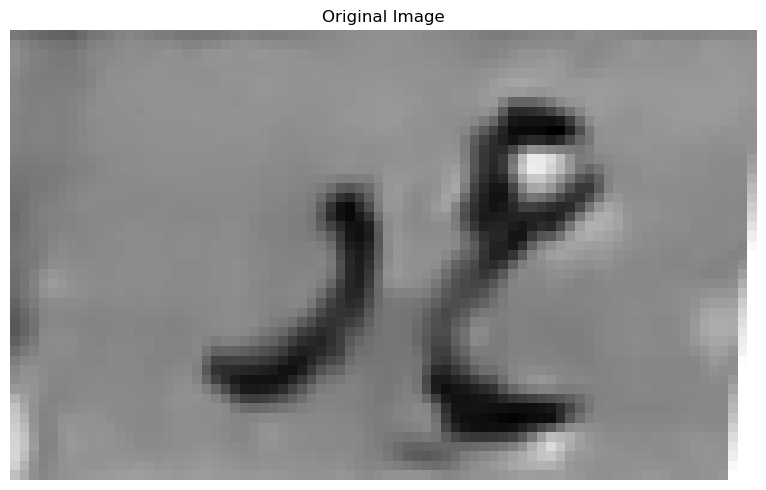

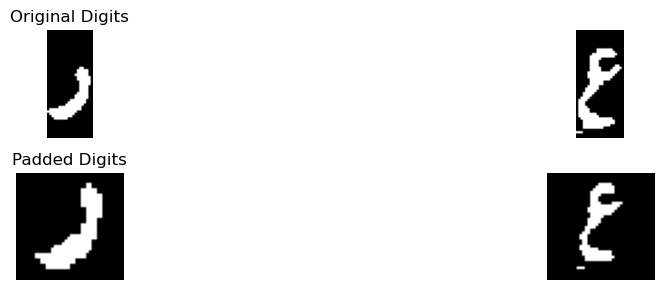

Best match: ر
Full comparison results: {'أ': 0.32, 'ب': 0.4608753315649867, 'ج': 0.5953240740740742, 'د': 3.7822685185185185, 'ر': 4.291422413793104, 'س': 2.580357142857143, 'ص': 2.2354166666666666, 'ط': 3.605, 'ع': 0.6275000000000001, 'ف': 3.2930489417989417, 'ق': 2.2756944444444445, 'ك': 2.1174999999999997, 'ل': 2.47, 'م': 0.12, 'ن': 2.59, 'ه': 2.34375, 'و': 3.3608333333333333, 'ي': 2.66775641025641}
Confidence :  0.25457694763729255
Best match: م
Full comparison results: {'أ': 0.2665441176470588, 'ب': 0.09576612903225806, 'ج': 0.666316949485108, 'د': 1.6878505384078137, 'ر': 0.15773809523809523, 'س': 0.4955357142857143, 'ص': 0.2869047619047619, 'ط': 0.401268115942029, 'ع': 0.7743808049535603, 'ف': 1.1345290309106097, 'ق': 0.7460839598997493, 'ك': 0.0, 'ل': 0.43014705882352944, 'م': 3.3391193720890118, 'ن': 1.0391176470588235, 'ه': 1.0901209677419355, 'و': 1.2495623249299719, 'ي': 0.30790133779264217}
Confidence :  0.825634416840599
[['٥', '٧', '٨', '٥'], ['ر', 'م']]
Tilt angle: -7.0

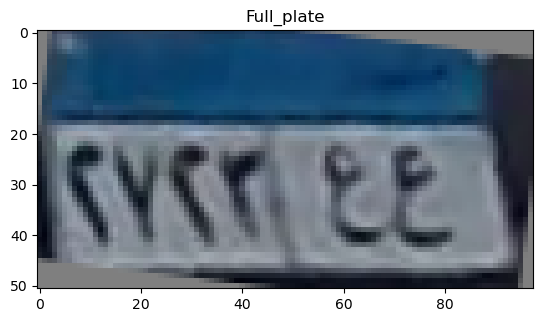

top
[0.26372118 0.29776621 0.38544017 0.47536463 0.56872743 0.6046681
 0.62234656 0.62788219 0.63223892 0.6306726  0.64732343 0.65933296
 0.6477356  0.63084287 0.6086557  0.58613868 0.5783771  0.57015177
 0.56843327 0.5689347  0.577358   0.58336203 0.59318538 0.60602205
 0.58600161 0.55340737 0.5416625  0.56072854 0.602942   0.63307858
 0.65847628 0.67902959 0.65958857 0.63490824 0.62129056 0.61929623
 0.60278471 0.59758096 0.59010033 0.57532557 0.59641991 0.62474275
 0.60296828 0.56421982 0.50624907 0.47585861 0.50599461 0.55162311
 0.58514019]
[0.20765324 0.30721309 0.34775817 0.45050259 0.60452093 0.59413966
 0.60725998 0.59353129 0.56421455 0.5451012  0.55841712 0.58927598
 0.61130995 0.61066228 0.57888134 0.52815221 0.5189204  0.52593234
 0.5254985  0.53231779 0.53665505 0.53683349 0.53462046 0.53296521
 0.53108172 0.53637752 0.51104597 0.52278466 0.56244211 0.5764816
 0.58458451 0.59011828 0.5677155  0.52399175 0.52045274 0.54002572
 0.5543135  0.55395349 0.55057806 0.54198227 0.

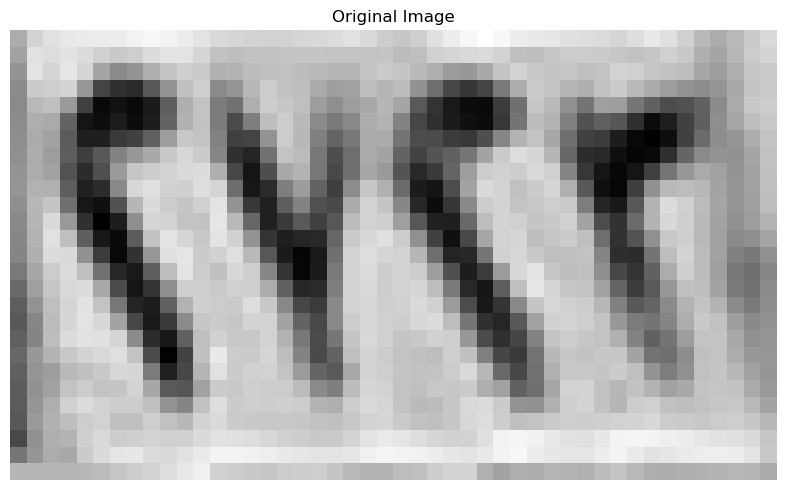

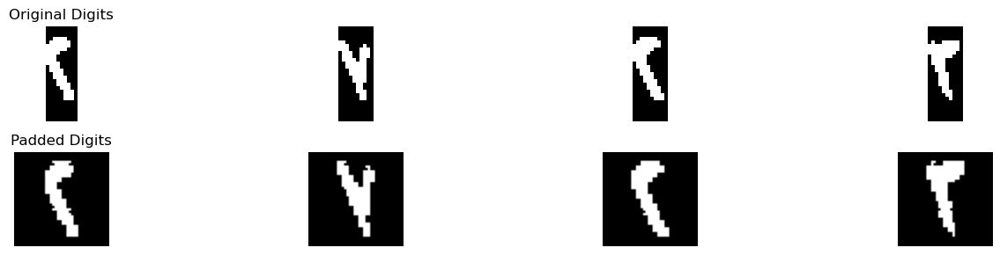

Best match: ٢
Full comparison results: {'١': 1.6428571428571428, '٢': 5.763392857142857, '٣': 3.3187886996904026, '٤': 3.0202380952380956, '٥': 2.6513434321096856, '٦': 1.3854166666666667, '٧': 2.3095588235294118, '٨': 0.9597222222222223, '٩': 3.0252100840336134}
Confidence :  1.222302078726227
Best match: ٧
Full comparison results: {'١': 2.28125, '٢': 1.71875, '٣': 2.307275541795666, '٤': 0.53125, '٥': 1.5311071797139908, '٦': 2.26875, '٧': 2.6290441176470587, '٨': 2.048611111111111, '٩': 2.5845588235294117}
Confidence :  0.022242647058823506
Best match: ٢
Full comparison results: {'١': 1.53125, '٢': 4.8125, '٣': 3.6802438080495357, '٤': 2.75, '٥': 2.345887697184137, '٦': 1.2625, '٧': 2.3261029411764707, '٨': 1.1659722222222222, '٩': 2.8506944444444446}
Confidence :  0.5661280959752322
Best match: ٣
Full comparison results: {'١': 1.75, '٢': 4.9375, '٣': 5.7687693498452015, '٤': 2.5, '٥': 2.2997567448031844, '٦': 1.90625, '٧': 3.0253676470588236, '٨': 1.2958333333333334, '٩': 1.8727532

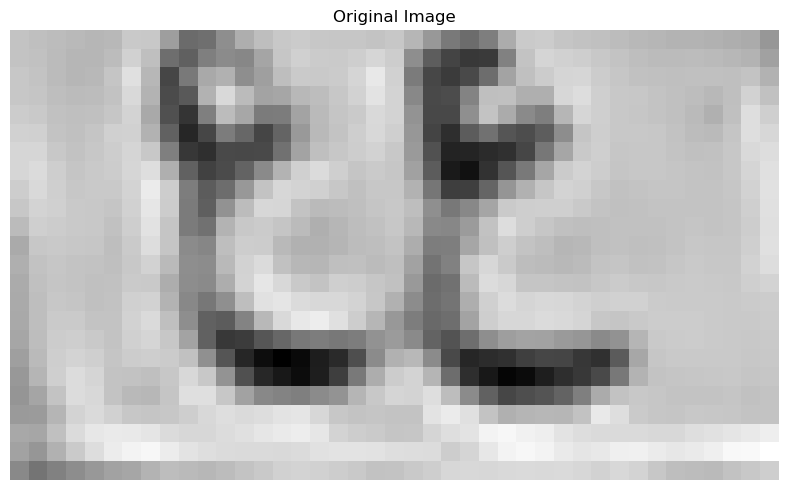

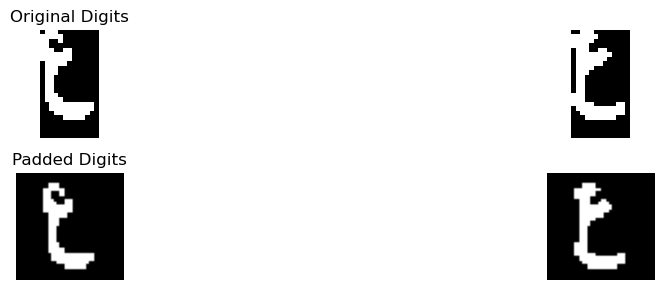

Best match: ع
Full comparison results: {'أ': 0.05263157894736842, 'ب': 0.503315649867374, 'ج': 2.0457790763139734, 'د': 1.6523238968633704, 'ر': 1.372584905855343, 'س': 0.26339285714285715, 'ص': 0.09375, 'ط': 1.632616930171278, 'ع': 3.6013157894736847, 'ف': 1.0889985380116958, 'ق': 0.6339807852965748, 'ك': 2.106060606060606, 'ل': 1.7401315789473684, 'م': 1.7033492822966507, 'ن': 2.227490601503759, 'ه': 0.48111559139784943, 'و': 0.8069827346143135, 'ي': 0.8117709616851494}
Confidence :  0.6869125939849627
Best match: ع
Full comparison results: {'أ': 0.10526315789473684, 'ب': 0.1778846153846154, 'ج': 2.6076177006525976, 'د': 1.7721850079744816, 'ر': 0.8825557240176903, 'س': 0.33035714285714285, 'ص': 0.09375, 'ط': 1.0972908432147561, 'ع': 4.881907894736842, 'ف': 1.0873450988582567, 'ق': 1.0902081592871067, 'ك': 2.5568181818181817, 'ل': 1.1914473684210527, 'م': 1.7027511961722488, 'ن': 2.0447023809523808, 'ه': 0.4165994623655914, 'و': 0.8476573377889166, 'ي': 0.7724593674822509}
Confidence

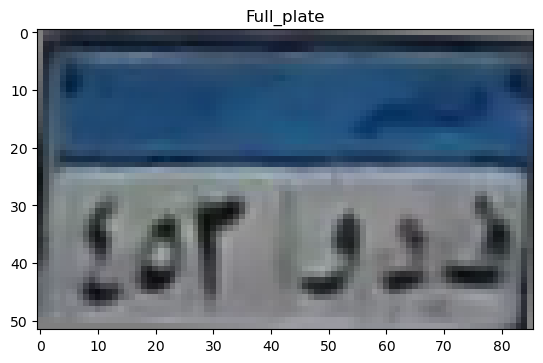

top
[0.16288902 0.26907183 0.39443902 0.3410637  0.30623967 0.3115504
 0.31021819 0.31369452 0.30828852 0.2997339  0.28977229 0.29415458
 0.2996911  0.30218987 0.30644871 0.30382282 0.30805235 0.31629593
 0.32520147 0.33473575 0.3402051  0.33861917 0.3347     0.32203108
 0.31764471 0.3177526  0.31807451 0.31903892 0.32009569 0.31893147
 0.3181349  0.3168175  0.31519373 0.31678686 0.31286529 0.30346039
 0.29656725 0.29886853 0.30203554 0.30902804 0.31145078 0.31639299
 0.32441294]
[0.14081159 0.26155525 0.39092051 0.30450162 0.22599804 0.25032511
 0.26914014 0.27633178 0.26804317 0.25429471 0.24813662 0.2714914
 0.28806768 0.28674252 0.28694047 0.28726216 0.2827738  0.28555571
 0.28723523 0.28131468 0.27284463 0.26460024 0.26763227 0.26382867
 0.26188733 0.26625495 0.26636098 0.27260963 0.28174452 0.28406122
 0.28412178 0.28479884 0.28450392 0.28391306 0.27687361 0.26636748
 0.25395353 0.25471444 0.2629598  0.27544515 0.28238704 0.28722544
 0.29760255]
[0.15305332 0.27261291 0.38421463 

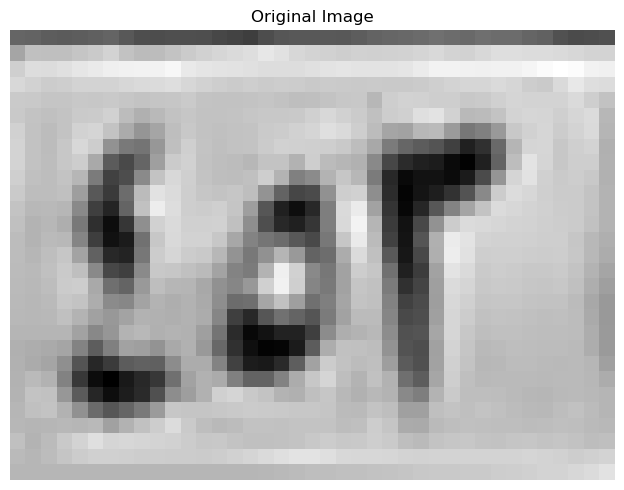

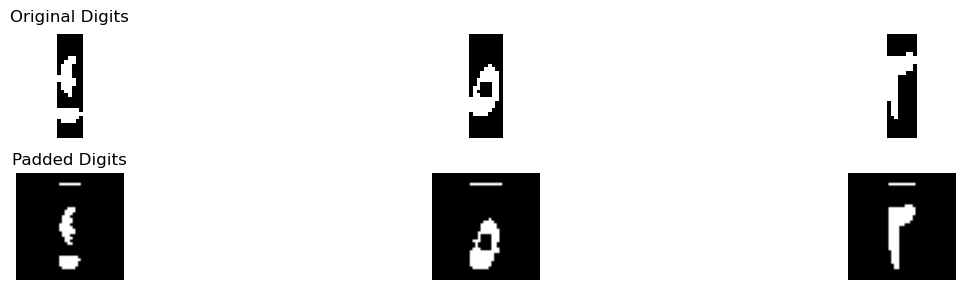

Best match: ٤
Full comparison results: {'١': 0.75625, '٢': 1.6173513986013985, '٣': 1.2088815789473684, '٤': 2.157698954271535, '٥': 0.09375, '٦': 0.0, '٧': 0.7102941176470589, '٨': 0.37531362007168456, '٩': 0.03125}
Confidence :  0.27017377783506824
Best match: ٤
Full comparison results: {'١': 1.5104166666666663, '٢': 0.08333333333333333, '٣': 0.058823529411764705, '٤': 2.5513049450549454, '٥': 1.0530277900633938, '٦': 0.4205357142857143, '٧': 1.2169117647058825, '٨': 0.9638888888888888, '٩': 0.7155291603821017}
Confidence :  0.5204441391941396
Best match: ٨
Full comparison results: {'١': 0.6625, '٢': 1.5692744755244756, '٣': 1.031733746130031, '٤': 1.5612637362637363, '٥': 0.20520510835913314, '٦': 0.03125, '٧': 1.0716911764705883, '٨': 1.7551075268817202, '٩': 1.4824817747611867}
Confidence :  0.0929165256786223
In horizontal_segmentation_1
0 38
In sub_horizontal_segmentation
3 13
17 24
27 38
In refine_segmentation_1


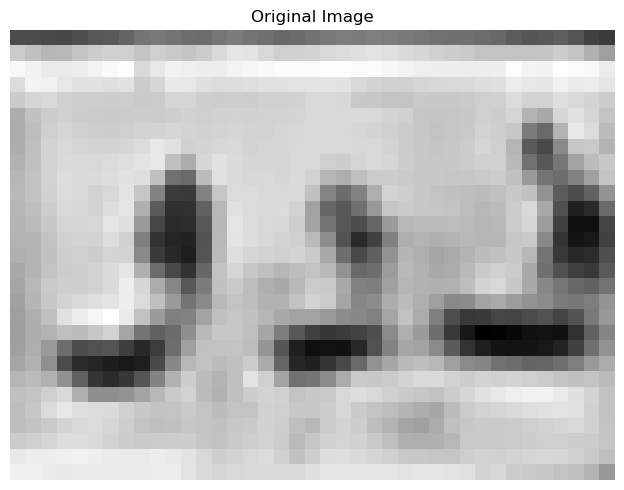

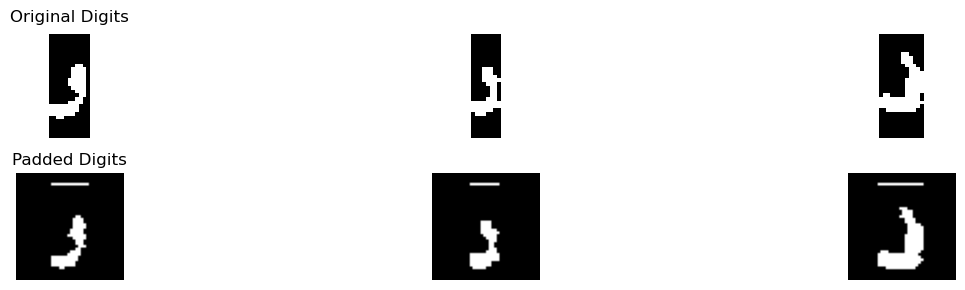

Best match: ل
Full comparison results: {'أ': 0.2476190476190476, 'ب': 0.628315649867374, 'ج': 0.8567316540142627, 'د': 0.8577392344497607, 'ر': 2.0823888948382954, 'س': 0.8705357142857143, 'ص': 0.6071428571428571, 'ط': 1.078722002635046, 'ع': 0.6689125831820932, 'ف': 1.338659147869674, 'ق': 2.246031482736008, 'ك': 0.6818181818181818, 'ل': 2.5001377014229327, 'م': 0.0, 'ن': 1.866008064516129, 'ه': 0.1603494623655914, 'و': 1.9800925925925925, 'ي': 2.1298784996365643}
Confidence :  0.12705310934346237
Best match: ي
Full comparison results: {'أ': 1.0882967607105538, 'ب': 0.7525696286472148, 'ج': 1.321716126063952, 'د': 1.1608694400141768, 'ر': 1.6448276655323133, 'س': 0.5758928571428572, 'ص': 0.5738095238095238, 'ط': 1.4996294466403162, 'ع': 0.567300194931774, 'ف': 1.3027753074442379, 'ق': 1.377526887915624, 'ك': 1.0085227272727273, 'ل': 1.8637384495394083, 'م': 0.0, 'ن': 1.835952380952381, 'ه': 0.19059139784946236, 'و': 1.3830847840928486, 'ي': 2.340666971916972}
Confidence :  0.238464261

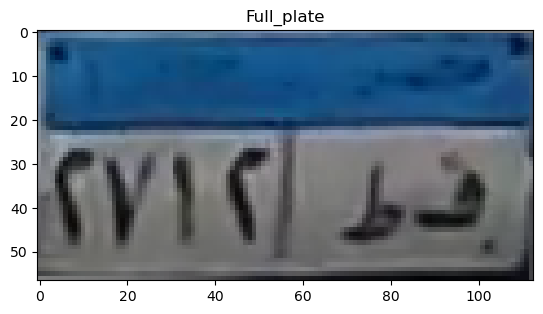

top
[0.54452406 0.43707041 0.2967336  0.21305993 0.18782151 0.18272044
 0.1732767  0.16268667 0.17181475 0.17389183 0.1759998  0.17129042
 0.16728843 0.16796245 0.16877532 0.17540059 0.18402798 0.19831779
 0.20798343 0.17746749 0.22397561 0.25197194 0.25227601 0.25133315
 0.25786766 0.25984176 0.27432629 0.26937608 0.26708664 0.26248782
 0.26768084 0.26325759 0.27175107 0.27129857 0.25756165 0.25171853
 0.24289417 0.25016039 0.24931021 0.25726824 0.24856412 0.23678853
 0.23853555 0.22885095 0.22462224 0.21983364 0.22559846 0.23700977
 0.2536114  0.25563439 0.25065395 0.25812608 0.23426467 0.22252953
 0.21141016 0.20717885]
[0.55289879 0.48951385 0.4641457  0.48442911 0.47920965 0.48873391
 0.4696786  0.45630135 0.37893848 0.40489895 0.4153942  0.4089505
 0.41829532 0.42356941 0.42272835 0.41784116 0.42950547 0.44700891
 0.4266188  0.38740652 0.43536849 0.46698958 0.46405277 0.45720071
 0.4655206  0.46641966 0.47912013 0.4739449  0.47013474 0.46330991
 0.46992554 0.46336629 0.47992719 0

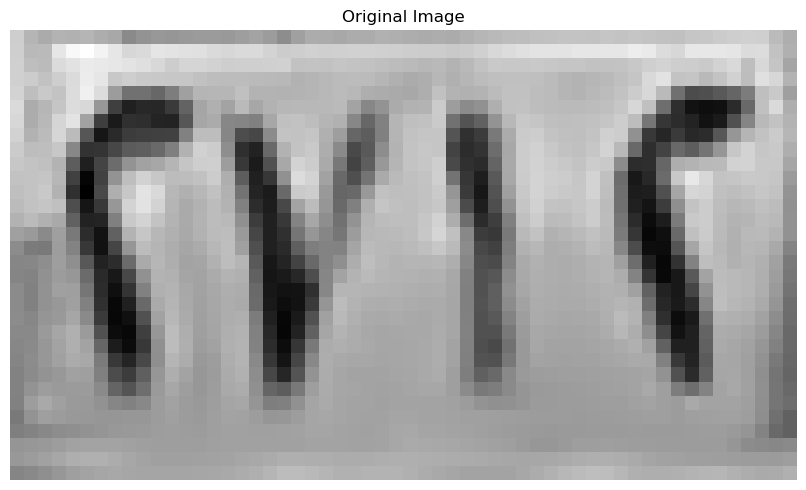

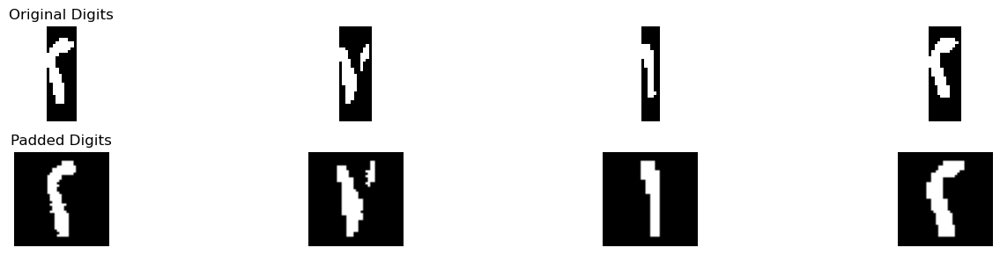

Best match: ٢
Full comparison results: {'١': 0.49999999999999994, '٢': 6.698717948717949, '٣': 3.7916989164086687, '٤': 3.3657051282051285, '٥': 2.227079647648533, '٦': 0.7419642857142857, '٧': 2.4246323529411766, '٨': 0.5305555555555556, '٩': 0.893555178481649}
Confidence :  1.45350951615464
Best match: ٧
Full comparison results: {'١': 0.1875, '٢': 2.0625, '٣': 2.873935758513932, '٤': 2.5625, '٥': 0.6175687380215245, '٦': 0.38125, '٧': 4.232720588235294, '٨': 1.036111111111111, '٩': 0.8390522875816995}
Confidence :  0.6793924148606809
Best match: ١
Full comparison results: {'١': 6.425, '٢': 1.8095862470862472, '٣': 0.6702786377708978, '٤': 0.7142857142857142, '٥': 2.1482106000294854, '٦': 2.4318452380952382, '٧': 0.8216911764705883, '٨': 1.9694444444444446, '٩': 2.518932252388135}
Confidence :  1.9530338738059325
Best match: ٢
Full comparison results: {'١': 0.28125, '٢': 4.46875, '٣': 3.545859133126935, '٤': 3.03125, '٥': 2.6541675880878666, '٦': 0.96875, '٧': 2.6099264705882357, '٨':

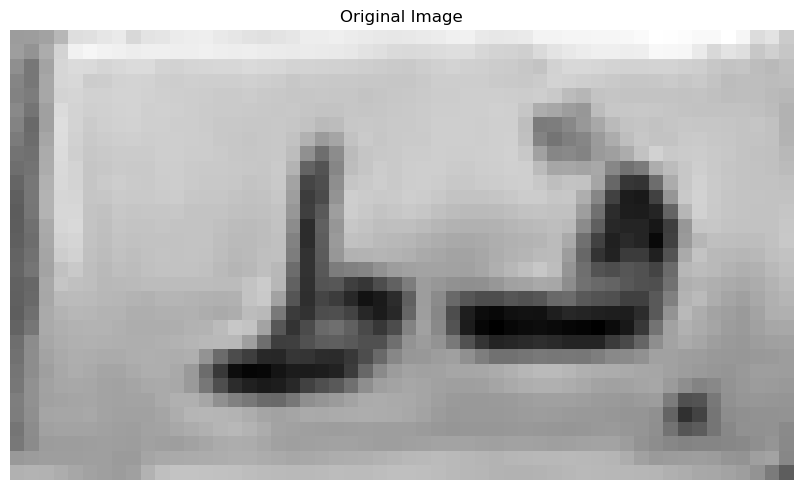

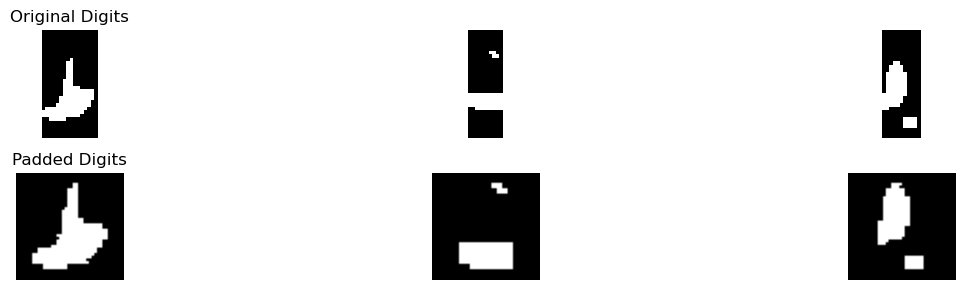

Best match: ط
Full comparison results: {'أ': 0.6294642857142858, 'ب': 0.26539408866995073, 'ج': 1.1919642857142856, 'د': 3.1383928571428577, 'ر': 1.439039408866995, 'س': 1.8839285714285714, 'ص': 1.817559523809524, 'ط': 3.7053571428571432, 'ع': 0.6205357142857142, 'ف': 3.2991071428571432, 'ق': 1.9732142857142856, 'ك': 1.8705357142857142, 'ل': 1.0625, 'م': 0.28125, 'ن': 1.5803571428571428, 'ه': 3.53125, 'و': 1.892857142857143, 'ي': 2.7345238095238096}
Confidence :  0.08705357142857162
Best match: د
Full comparison results: {'أ': 0.15000000000000002, 'ب': 0.4224137931034483, 'ج': 1.587211781776999, 'د': 4.030538720538721, 'ر': 2.884272587732108, 'س': 1.5982142857142856, 'ص': 1.3663690476190475, 'ط': 2.220273386034256, 'ع': 1.6203926033722298, 'ف': 3.1800861921829666, 'ق': 1.9029100529100527, 'ك': 1.8390151515151514, 'ل': 2.7984447004608297, 'م': 0.19545454545454544, 'ن': 3.3204569892473117, 'ه': 1.8288978494623656, 'و': 1.187811828975622, 'ي': 1.911494407882907}
Confidence :  0.3550408656

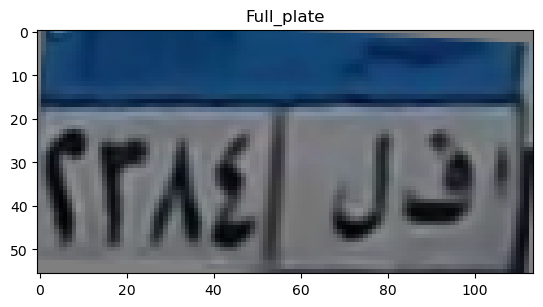

top
[0.43523015 0.48038265 0.53759205 0.55140651 0.53918631 0.52052297
 0.50172846 0.46695548 0.44530118 0.46005428 0.49389598 0.51033887
 0.50968878 0.49758841 0.48411917 0.4776708  0.46975003 0.46931493
 0.48424359 0.49636905 0.49541757 0.49137124 0.48531651 0.48083203
 0.47425657 0.46533051 0.45714058 0.45533111 0.45943762 0.46301905
 0.46406689 0.46500861 0.46381798 0.46058202 0.46161076 0.46401141
 0.46727828 0.47046764 0.46946401 0.4656325  0.46382713 0.46417001
 0.46735424 0.47541794 0.49167173 0.5056317  0.5022633  0.48945572
 0.48183249 0.48083099 0.48766823 0.51133623 0.52284438 0.45648336
 0.33248308 0.26057437 0.30912402]
[0.44883544 0.50470904 0.55917461 0.57403832 0.53589063 0.4395877
 0.32534851 0.21981931 0.16248078 0.22180601 0.34701233 0.45629726
 0.50270633 0.48878063 0.4763353  0.4721635  0.45375026 0.45646268
 0.48515278 0.50158685 0.491096   0.48247722 0.47895384 0.48175467
 0.49127006 0.48580216 0.47041848 0.46342941 0.46272098 0.45754066
 0.45226301 0.45715498 0

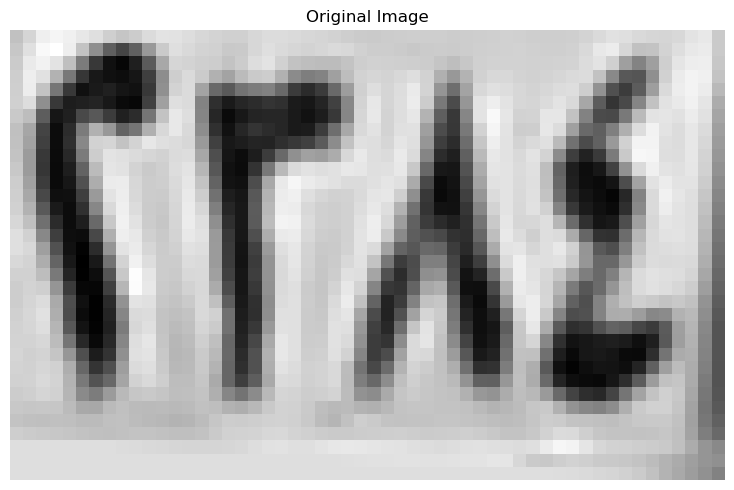

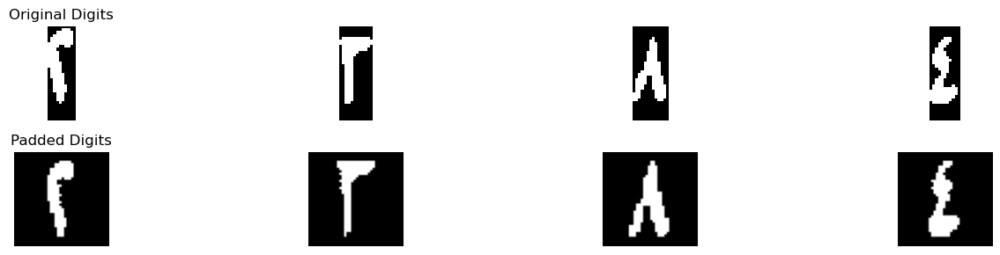

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 6.7808857808857805, '٣': 4.215654024767802, '٤': 3.2640567765567763, '٥': 2.4216239127229837, '٦': 0.7595238095238095, '٧': 2.0367647058823533, '٨': 0.6118055555555556, '٩': 1.2542577928607341}
Confidence :  1.2826158780589894
Best match: ٣
Full comparison results: {'١': 0.625, '٢': 3.1875, '٣': 4.357681888544891, '٤': 1.84375, '٥': 1.4173116615067078, '٦': 2.28125, '٧': 0.8966911764705883, '٨': 0.48611111111111105, '٩': 0.9575163398692811}
Confidence :  0.5850909442724457
Best match: ٨
Full comparison results: {'١': 2.647058823529412, '٢': 0.7647058823529412, '٣': 0.8173374613003097, '٤': 0.8419117647058824, '٥': 1.0520280480613298, '٦': 1.0136029411764707, '٧': 0.649264705882353, '٨': 6.0858251633986935, '٩': 2.401143790849673}
Confidence :  1.7193831699346407
Best match: ٤
Full comparison results: {'١': 1.6899038461538463, '٢': 2.2235576923076925, '٣': 1.5567917956656347, '٤': 5.671474358974359, '٥': 3.5035659000442285, '٦': 0.1

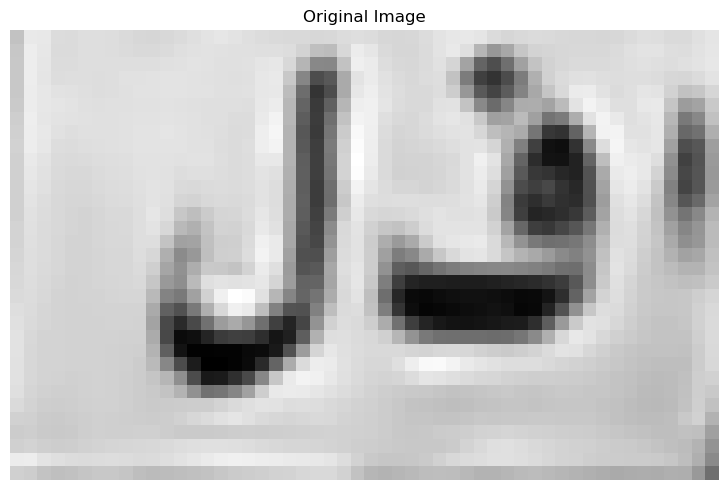

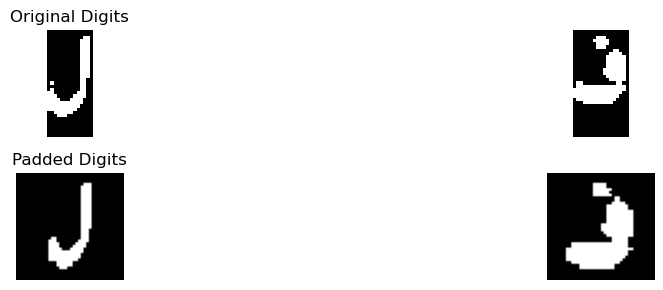

Best match: ل
Full comparison results: {'أ': 0.28125, 'ب': 0.2252155172413793, 'ج': 0.31828703703703703, 'د': 2.314920620028979, 'ر': 2.8088667273506105, 'س': 1.0580357142857144, 'ص': 1.1419642857142858, 'ط': 0.5496953227931489, 'ع': 0.6953947368421053, 'ف': 1.829452102478418, 'ق': 2.113866262879421, 'ك': 0.2537878787878788, 'ل': 3.542376160990712, 'م': 0.27840909090909094, 'ن': 2.7523214285714284, 'ه': 1.0810483870967742, 'و': 1.982473544973545, 'ي': 1.8441007060572279}
Confidence :  0.3667547168200507
Best match: ف
Full comparison results: {'أ': 0.6224999999999999, 'ب': 0.4576425729442971, 'ج': 2.275509259259259, 'د': 5.3677777777777775, 'ر': 1.9629310344827589, 'س': 2.263392857142857, 'ص': 1.87, 'ط': 3.05375, 'ع': 1.3050000000000002, 'ف': 5.608921957671957, 'ق': 3.4315277777777777, 'ك': 2.03375, 'ل': 1.8425, 'م': 0.8562500000000002, 'ن': 3.4975, 'ه': 4.5, 'و': 3.1915740740740737, 'ي': 2.4560897435897435}
Confidence :  0.1205720899470899
[['٢', '٣', '٨', '٤'], ['ل', 'ف']]
Tilt angle:

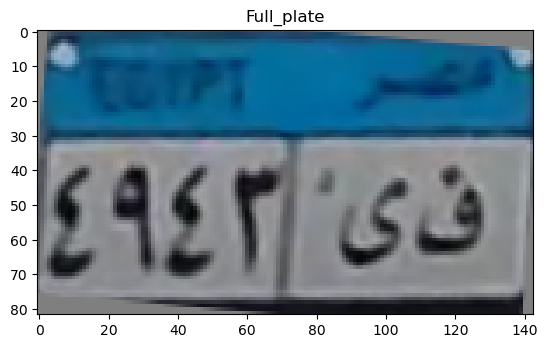

top
[0.44218439 0.33406647 0.25206129 0.28704556 0.4116186  0.48283909
 0.50137379 0.50790002 0.50013366 0.50104806 0.51627408 0.52006963
 0.52342969 0.54274308 0.56846081 0.57018028 0.56867056 0.56741061
 0.57532415 0.56771058 0.55609638 0.55526544 0.5533762  0.55592173
 0.55707369 0.55413707 0.55508489 0.55462942 0.55635179 0.555853
 0.55301499 0.55983848 0.57361815 0.59380489 0.60708212 0.61208473
 0.60919823 0.60610105 0.59063928 0.58045027 0.5847826  0.57952551
 0.56908611 0.55739359 0.55357639 0.55947985 0.56642367 0.58243968
 0.61128321 0.62619701 0.62314859 0.60607999 0.59268513 0.59069361
 0.596209   0.59584505 0.59904207 0.60274942 0.60760359 0.62157597
 0.63540912 0.60873261 0.58992465 0.5798286  0.57594303 0.57125714
 0.57361582 0.58140594 0.59266467 0.59210662 0.55928187]
[0.44825931 0.35912189 0.3049582  0.40254403 0.55650824 0.6264657
 0.63692714 0.63466634 0.63019867 0.62560754 0.62430326 0.61984498
 0.6188864  0.62612587 0.63814384 0.63986077 0.64003813 0.64380333
 0.6

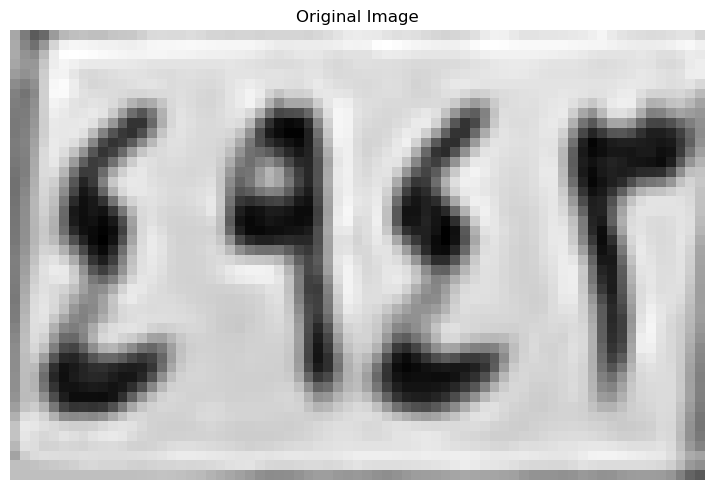

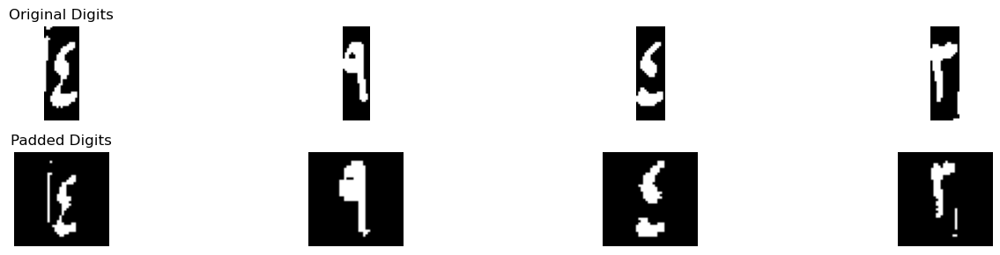

Best match: ٤
Full comparison results: {'١': 1.2916666666666665, '٢': 0.3205128205128205, '٣': 0.125, '٤': 1.2950778388278388, '٥': 0.3846334586466165, '٦': 0.15625, '٧': 0.9279411764705883, '٨': 0.6229166666666667, '٩': 0.6006158873805932}
Confidence :  0.00170558608058613
Best match: ٩
Full comparison results: {'١': 3.7451923076923075, '٢': 3.6322115384615383, '٣': 1.640673374613003, '٤': 2.3615384615384616, '٥': 2.6809486952675803, '٦': 1.5145833333333334, '٧': 1.1294117647058823, '٨': 1.942361111111111, '٩': 4.468435771744595}
Confidence :  0.36162173202614367
Best match: ٤
Full comparison results: {'١': 2.833333333333333, '٢': 0.4743589743589744, '٣': 0.9765866873065016, '٤': 3.2093436133758715, '٥': 2.2599743844906386, '٦': 0.2857142857142857, '٧': 0.2838235294117647, '٨': 2.1590277777777778, '٩': 1.379053544494721}
Confidence :  0.18800514002126922
Best match: ٢
Full comparison results: {'١': 0.42613636363636365, '٢': 3.7434440559440563, '٣': 3.079140866873065, '٤': 1.7707875457

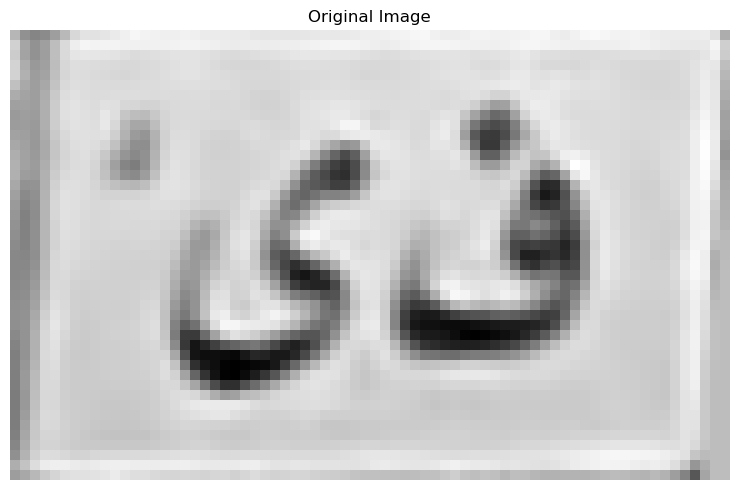

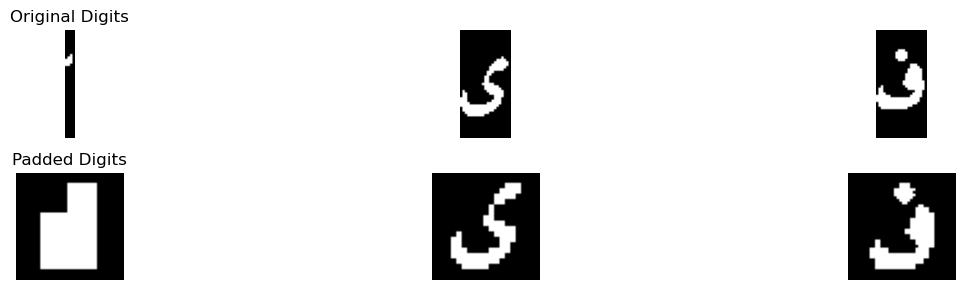

Best match: ه
Full comparison results: {'أ': 0.619047619047619, 'ب': 0.8782327586206897, 'ج': 1.741021106510237, 'د': 2.4963425925925926, 'ر': 1.0024803669593774, 'س': 0.7276785714285714, 'ص': 0.2869047619047619, 'ط': 1.2229907773386033, 'ع': 0.5505952380952381, 'ف': 2.222222222222222, 'ق': 0.7569444444444444, 'ك': 1.4119318181818183, 'ل': 0.6800595238095237, 'م': 1.0039231601731602, 'ن': 1.056547619047619, 'ه': 3.5048387096774194, 'و': 2.1825396825396823, 'ي': 1.1876751871317088}
Confidence :  0.5042480585424134
Best match: ي
Full comparison results: {'أ': 0.2091346153846154, 'ب': 0.5370523872679045, 'ج': 1.3732193732193732, 'د': 3.1030982905982905, 'ر': 2.974718169761273, 'س': 2.174107142857143, 'ص': 1.9793269230769233, 'ط': 2.375, 'ع': 0.9903846153846154, 'ف': 3.228886853886854, 'ق': 2.9103454415954415, 'ك': 2.1466346153846154, 'ل': 2.764423076923077, 'م': 0.07692307692307693, 'ن': 2.709134615384616, 'ه': 1.0, 'و': 3.340544871794872, 'ي': 4.797916666666667}
Confidence :  0.728685897

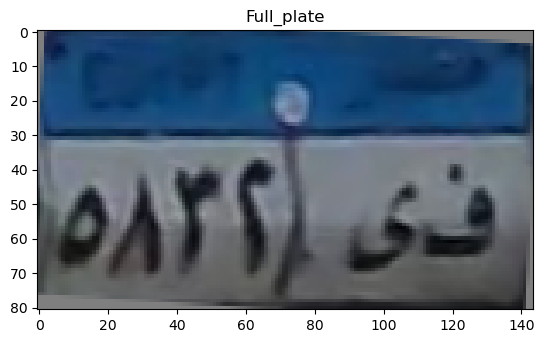

top
[0.43645732 0.39289194 0.4035275  0.44832283 0.50390116 0.54456217
 0.57213606 0.58023978 0.57692519 0.56152051 0.54714799 0.53708408
 0.53029855 0.52629285 0.51931615 0.51599721 0.5241877  0.53243488
 0.52777477 0.52146483 0.53095842 0.54940605 0.56058869 0.56781283
 0.56220636 0.55415862 0.54252707 0.52843834 0.51292519 0.49829505
 0.49169466 0.48611184 0.48436334 0.48544359 0.4900126  0.50084063
 0.52054139 0.54244365 0.55561175 0.56182959 0.5611823  0.55468632
 0.55169208 0.55364368 0.5583643  0.56012729 0.55107522 0.55043813
 0.56631805 0.57127064 0.56158846 0.55205909 0.54498642 0.54280569
 0.54410329 0.55062163 0.56064999 0.56017998 0.55736382 0.5496472
 0.54148422 0.54036531 0.54802224 0.55270148 0.54802963 0.53757705
 0.52491544 0.51699576 0.51303413 0.49644925 0.45639426 0.39254507]
[0.43917765 0.39711058 0.40804034 0.4628507  0.53049707 0.56213836
 0.56839961 0.5728744  0.57122837 0.57245024 0.57207042 0.56911698
 0.56638881 0.56738974 0.56910902 0.57071435 0.57214689 0.

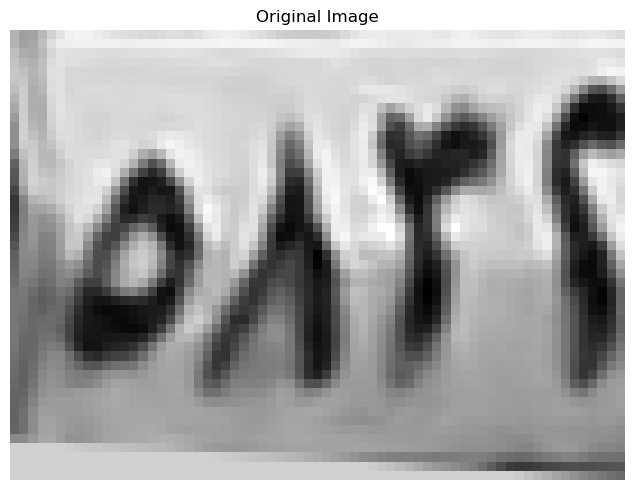

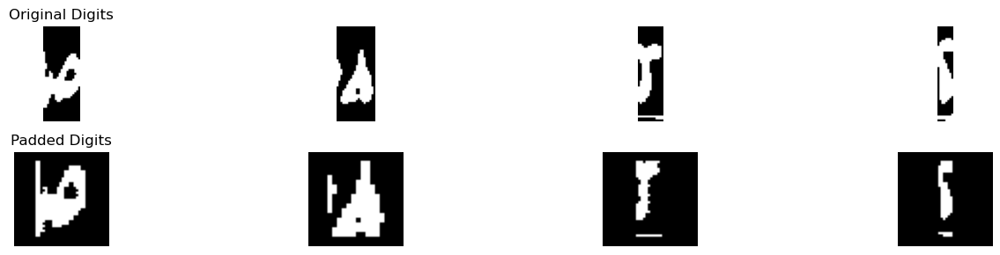

Best match: ٥
Full comparison results: {'١': 0.7619047619047619, '٢': 0.6666666666666666, '٣': 0.5238095238095237, '٤': 0.42857142857142855, '٥': 2.7886904761904763, '٦': 1.0788690476190474, '٧': 1.2857142857142856, '٨': 1.7142857142857144, '٩': 0.5386904761904762}
Confidence :  0.5372023809523809
Best match: ٥
Full comparison results: {'١': 0.6666666666666666, '٢': 0.45833333333333326, '٣': 0.41666666666666663, '٤': 1.1458333333333333, '٥': 3.5, '٦': 1.0520833333333335, '٧': 0.7500000000000001, '٨': 1.125, '٩': 0.3333333333333333}
Confidence :  1.1770833333333335
Best match: ٢
Full comparison results: {'١': 1.3125, '٢': 3.761873543123543, '٣': 2.454140866873065, '٤': 1.9325320512820512, '٥': 1.3262936753648829, '٦': 1.294345238095238, '٧': 0.7088235294117647, '٨': 0.8041666666666667, '٩': 1.7028343388637506}
Confidence :  0.653866338125239
Best match: ١
Full comparison results: {'١': 4.010416666666667, '٢': 2.0443618881118883, '٣': 0.9802631578947368, '٤': 1.4657509157509159, '٥': 0.7

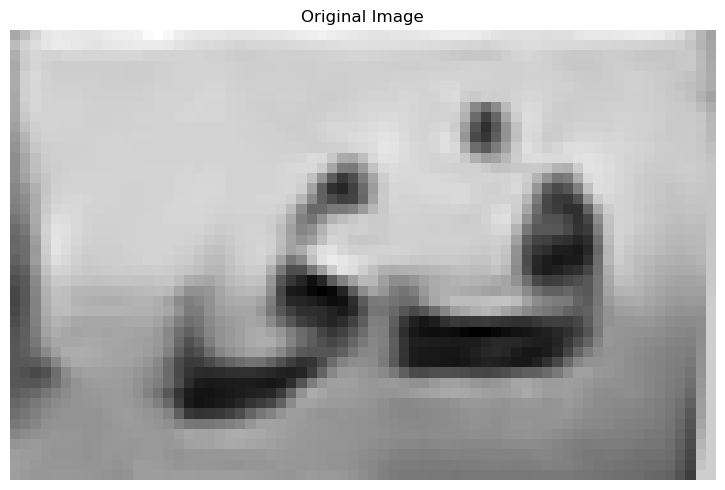

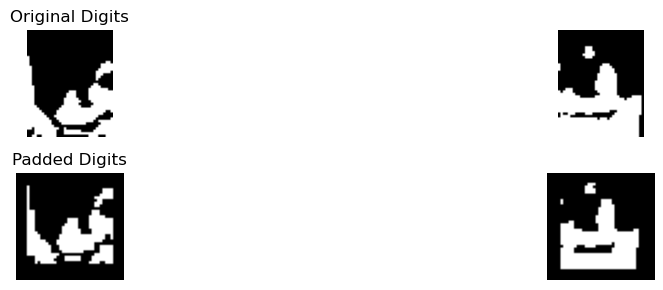

Best match: ه
Full comparison results: {'أ': 0.375, 'ب': 1.0032327586206897, 'ج': 0.53125, 'د': 1.21875, 'ر': 0.65625, 'س': 1.3125, 'ص': 1.6076149425287356, 'ط': 0.84375, 'ع': 0.21875, 'ف': 1.65625, 'ق': 0.59375, 'ك': 0.84375, 'ل': 0.5, 'م': 0.0625, 'ن': 0.8125, 'ه': 2.2119971264367817, 'و': 0.5, 'ي': 1.125}
Confidence :  0.27787356321839085
Best match: ف
Full comparison results: {'أ': 0.4482758620689655, 'ب': 0.33189655172413796, 'ج': 1.5258620689655173, 'د': 1.7920258620689657, 'ر': 0.5700431034482758, 'س': 0.6411637931034483, 'ص': 0.9850621060437523, 'ط': 1.5624281609195403, 'ع': 0.5948275862068966, 'ف': 2.706896551724138, 'ق': 1.2379310344827585, 'ك': 1.40625, 'ل': 0.3448275862068966, 'م': 0.3415948275862069, 'ن': 1.0528017241379308, 'ه': 2.15625, 'و': 0.6519396551724139, 'ي': 1.6132183908045976}
Confidence :  0.27532327586206895
[['٥', '٥', '٢', '١'], ['ه', 'ف']]
Tilt angle: -3.00 degrees


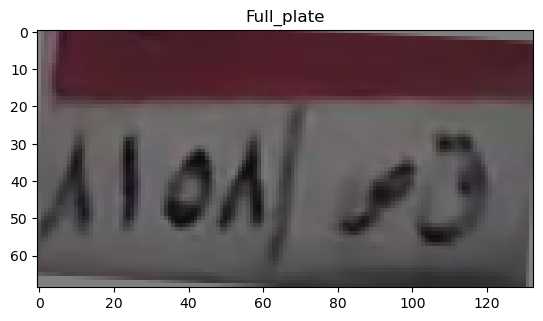

top
[0.41514423 0.38712874 0.39043616 0.39287437 0.39635157 0.39974464
 0.39898407 0.39894782 0.39875776 0.3814407  0.34506574 0.33232741
 0.35681513 0.38224709 0.39524693 0.40494337 0.41087819 0.41405425
 0.41751922 0.42144078 0.42266627 0.4236773  0.41550293 0.39634101
 0.37944419 0.36827626 0.37201811 0.39559021 0.42551083 0.43624638
 0.43405631 0.42996303 0.42607401 0.42288343 0.42278233 0.42361703
 0.42672332 0.43033949 0.43021397 0.42747045 0.42582767 0.42493378
 0.42332988 0.42117168 0.41992969 0.42037132 0.42042739 0.42218137
 0.42324897 0.42310875 0.42083065 0.4157104  0.41035676 0.40497607
 0.40408191 0.40306917 0.38625926 0.36221547 0.36258881 0.3861567
 0.4078367  0.41833864 0.42152007 0.42894961 0.4356898  0.41945206]
[0.41175305 0.39050238 0.39105336 0.39339163 0.39730769 0.39873007
 0.39875061 0.40192846 0.4025062  0.37579461 0.32045289 0.29110075
 0.32339976 0.37093733 0.39708593 0.40917167 0.41379841 0.41637903
 0.41672265 0.41984765 0.42346284 0.42818098 0.40835704 0.

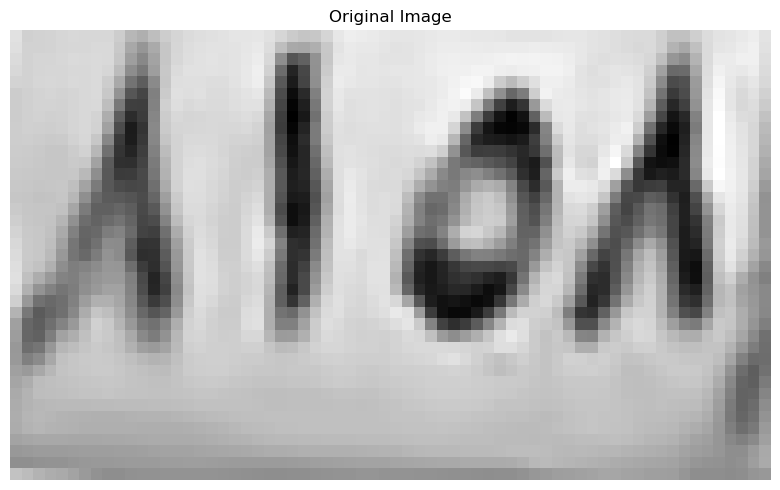

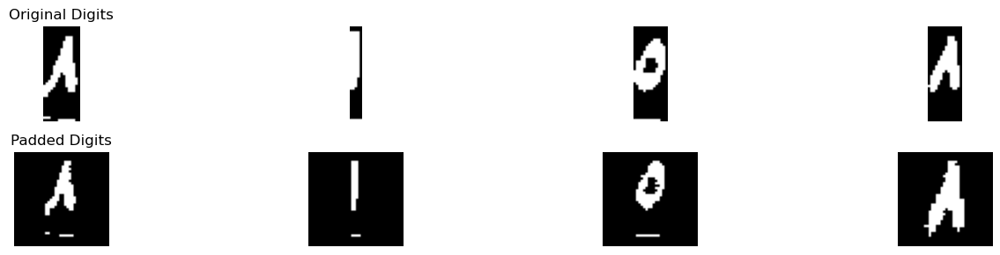

Best match: ٨
Full comparison results: {'١': 2.192307692307692, '٢': 0.3076923076923077, '٣': 0.42395510835913314, '٤': 0.39285714285714285, '٥': 0.5874981571575999, '٦': 0.9672619047619047, '٧': 0.5992647058823529, '٨': 3.182638888888889, '٩': 1.8087292609351433}
Confidence :  0.4951655982905985
Best match: ١
Full comparison results: {'١': 2.61875, '٢': 0.8749271561771561, '٣': 0.8865131578947368, '٤': 1.6671046023868605, '٥': 0.6864127229839303, '٦': 0.0, '٧': 0.03125, '٨': 1.5777777777777777, '٩': 1.0941270739064857}
Confidence :  0.4758226988065697
Best match: ٢
Full comparison results: {'١': 0.8333333333333334, '٢': 2.5793269230769234, '٣': 2.1687306501547985, '٤': 1.1868368190948837, '٥': 1.439388913460121, '٦': 1.7333333333333332, '٧': 1.6720588235294118, '٨': 1.4715277777777778, '٩': 1.6740667420814481}
Confidence :  0.20529813646106243
Best match: ٨
Full comparison results: {'١': 1.2389705882352942, '٢': 0.4117647058823529, '٣': 0.4643962848297214, '٤': 0.5992647058823529, '٥'

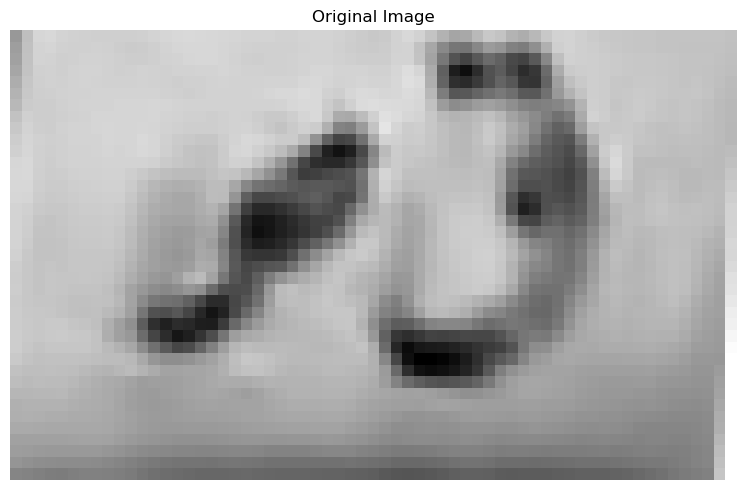

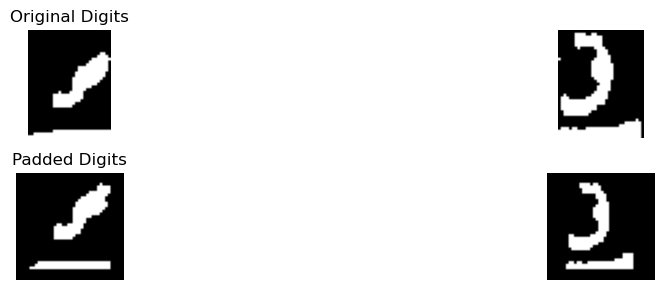

Best match: س
Full comparison results: {'أ': 0.06666666666666667, 'ب': 1.8808145095645095, 'ج': 0.32916666666666666, 'د': 0.7458333333333333, 'ر': 0.8229166666666666, 'س': 2.0145833333333334, 'ص': 1.9233477011494253, 'ط': 0.6291666666666667, 'ع': 0.1, 'ف': 1.1041666666666665, 'ق': 0.6291666666666667, 'ك': 1.25, 'ل': 0.16666666666666666, 'م': 0.4, 'ن': 0.13333333333333333, 'ه': 0.8125, 'و': 1.4729166666666669, 'ي': 1.1458333333333333}
Confidence :  0.04561781609195403
Best match: ع
Full comparison results: {'أ': 0.98, 'ب': 0.13469827586206895, 'ج': 0.9640740740740741, 'د': 0.9864351851851851, 'ر': 0.09375, 'س': 0.2232142857142857, 'ص': 1.0608333333333333, 'ط': 0.8237500000000002, 'ع': 1.344758064516129, 'ف': 0.8011111111111111, 'ق': 0.6876851851851852, 'ك': 1.1212499999999999, 'ل': 0.16, 'م': 0.36, 'ن': 0.65, 'ه': 0.59375, 'و': 0.5482870370370371, 'ي': 0.6373397435897437}
Confidence :  0.11175403225806457
[['٨', '١', '٢', '٨'], ['س', 'ع']]
Tilt angle: -2.00 degrees


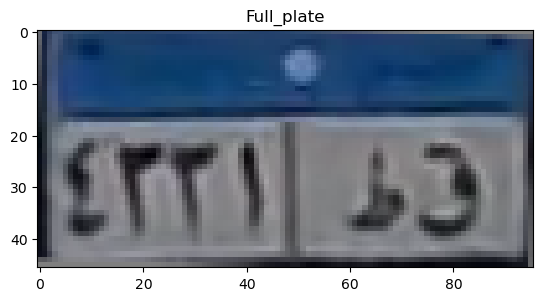

top
[0.1121595  0.16758536 0.34949237 0.39288464 0.41409491 0.46377549
 0.54698377 0.51940031 0.53227699 0.58011309 0.56195921 0.55845135
 0.56328939 0.56947118 0.56555502 0.56310824 0.56262    0.56793833
 0.60449246 0.6158655  0.61062766 0.59901381 0.57051527 0.55863855
 0.55551702 0.55382609 0.57374031 0.58056475 0.57625256 0.57772698
 0.56552082 0.56117922 0.56178237 0.56067765 0.56085792 0.56631778
 0.57256021 0.58113809 0.58145978 0.58594048 0.59316506 0.6055525
 0.61171059 0.61131996 0.59796689 0.60074612 0.54383623 0.43781102]
[0.09069627 0.16168203 0.3562899  0.42912123 0.46660591 0.51585529
 0.56113716 0.55497907 0.5545448  0.58528196 0.57751081 0.57187946
 0.56864647 0.57003598 0.56412299 0.5610899  0.56126299 0.55697662
 0.5551376  0.54809529 0.5394394  0.53726547 0.52931524 0.52961275
 0.53156092 0.53708174 0.54758796 0.54585971 0.54476006 0.53869813
 0.52992594 0.53368331 0.53307597 0.53729877 0.5434963  0.54855222
 0.54870744 0.54374681 0.53713798 0.55041272 0.56289275 0.

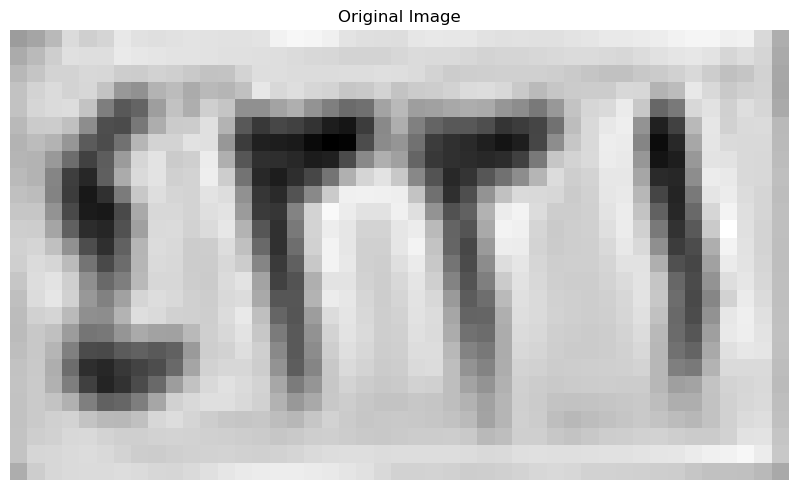

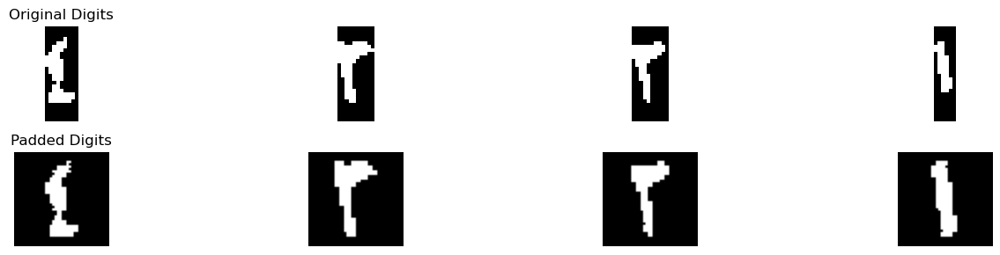

Best match: ٤
Full comparison results: {'١': 1.3660714285714286, '٢': 4.008928571428571, '٣': 2.3010835913312695, '٤': 4.489285714285714, '٥': 2.460166961521451, '٦': 0.17410714285714285, '٧': 1.6705882352941177, '٨': 1.4284722222222221, '٩': 1.5464227357609712}
Confidence :  0.24017857142857135
Best match: ٣
Full comparison results: {'١': 0.4444444444444444, '٢': 2.2534722222222223, '٣': 4.369883040935672, '٤': 2.1805555555555554, '٥': 2.328660192147034, '٦': 1.5243055555555554, '٧': 1.6868055555555557, '٨': 0.7333333333333333, '٩': 1.1805555555555556}
Confidence :  1.0206114243943192
Best match: ٣
Full comparison results: {'١': 0.25, '٢': 4.5625, '٣': 6.307856037151703, '٤': 2.0625, '٥': 1.9664188043638509, '٦': 1.58125, '٧': 2.6863970588235295, '٨': 0.4930555555555555, '٩': 1.0365604575163399}
Confidence :  0.8726780185758516
Best match: ١
Full comparison results: {'١': 3.6761363636363633, '٢': 2.8158508158508155, '٣': 1.578173374613003, '٤': 2.610508241758242, '٥': 0.94707356626861

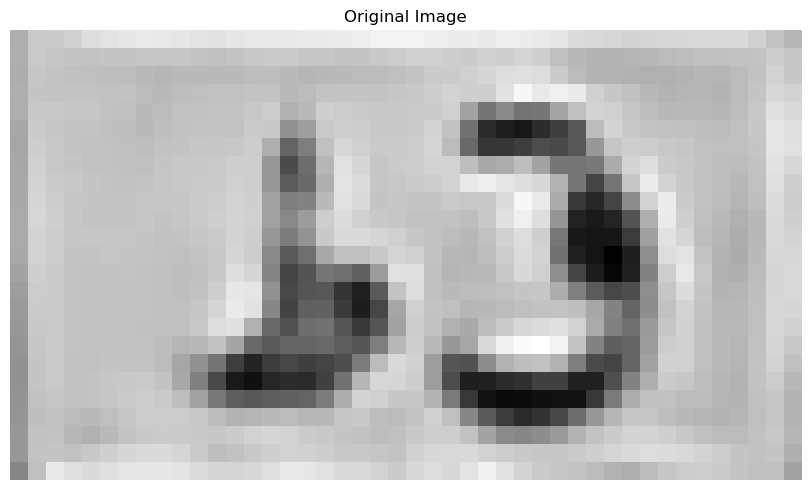

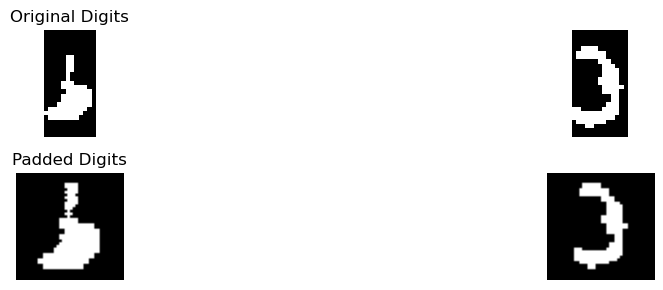

Best match: ط
Full comparison results: {'أ': 0.9959239130434782, 'ب': 0.30860411140583555, 'ج': 1.9441425120772946, 'د': 3.354446457326892, 'ر': 2.3370558470764617, 'س': 0.8928571428571428, 'ص': 1.2686594202898551, 'ط': 5.436141304347826, 'ع': 0.7364130434782609, 'ف': 3.219260409477801, 'ق': 2.2990640096618358, 'ك': 2.2803442028985508, 'ل': 1.5679347826086953, 'م': 0.4741847826086957, 'ن': 2.040271739130435, 'ه': 2.5756048387096775, 'و': 2.4135466988727856, 'ي': 2.7596920289855076}
Confidence :  1.040847423510467
Best match: د
Full comparison results: {'أ': 0.1, 'ب': 0.2364058355437666, 'ج': 3.042348171152519, 'د': 4.5870244107744105, 'ر': 1.2528234989648033, 'س': 1.4508928571428572, 'ص': 1.1788690476190475, 'ط': 1.267086627140975, 'ع': 1.55625, 'ف': 4.032374338624338, 'ق': 4.048578042328042, 'ك': 0.8484848484848485, 'ل': 1.85, 'م': 0.5551136363636363, 'ن': 3.0750595238095237, 'ه': 1.6871639784946235, 'و': 2.430191798941799, 'ي': 2.324059364548495}
Confidence :  0.26922318422318403
[['

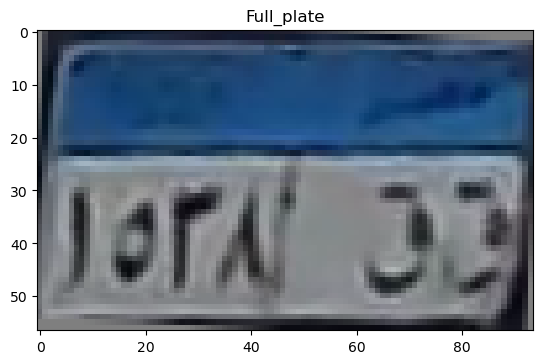

top
[0.15129205 0.16195109 0.31148148 0.32568662 0.25956135 0.18605594
 0.15646622 0.15063118 0.14648562 0.14694353 0.15172775 0.14570402
 0.14354843 0.14375725 0.14547241 0.14951417 0.15709578 0.16827894
 0.18021544 0.18986414 0.19717676 0.19875679 0.20375885 0.21262887
 0.21449648 0.21622316 0.21688569 0.21798863 0.22138935 0.22059681
 0.21366291 0.20510472 0.18579327 0.16125    0.15334231 0.15191353
 0.16078963 0.1748974  0.19749258 0.1899939  0.18035629 0.18092054
 0.18390312 0.18185377 0.17317822 0.15737613 0.16363347]
[0.12949538 0.21870326 0.32277792 0.30027365 0.25824522 0.20959638
 0.13561547 0.09858594 0.09741645 0.07774589 0.1302566  0.14786654
 0.15164038 0.15601262 0.1571435  0.17510633 0.21485744 0.23261254
 0.27794979 0.28716678 0.27465459 0.26580485 0.25766561 0.25733779
 0.25591938 0.22985153 0.1968075  0.18151289 0.14781598 0.18386137
 0.20978422 0.20953015 0.21211328 0.21896902 0.24646529 0.25910294
 0.2603551  0.29482069 0.32104618 0.30964912 0.28707559 0.2732398
 0

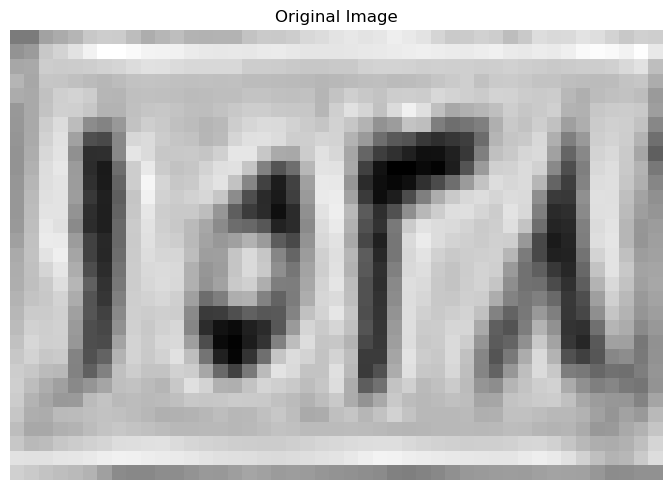

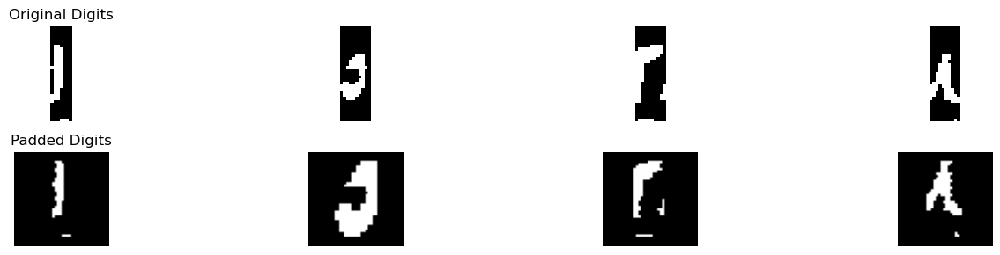

Best match: ١
Full comparison results: {'١': 3.275, '٢': 1.5155157342657344, '٣': 1.2302631578947367, '٤': 2.135096153846154, '٥': 0.27052926433731384, '٦': 0.0, '٧': 0.0625, '٨': 2.0215277777777776, '٩': 1.2891057063851183}
Confidence :  0.569951923076923
Best match: ٥
Full comparison results: {'١': 0.4444444444444444, '٢': 0.8888888888888888, '٣': 0.7828947368421052, '٤': 1.7638888888888888, '٥': 5.566494360902256, '٦': 1.4944444444444445, '٧': 0.9777777777777777, '٨': 1.13125, '٩': 0.36458333333333337}
Confidence :  1.9013027360066836
Best match: ٢
Full comparison results: {'١': 0.9086538461538461, '٢': 2.730769230769231, '٣': 2.0442143962848296, '٤': 1.2477335164835164, '٥': 1.7124152292495944, '٦': 2.0208333333333335, '٧': 0.5139705882352941, '٨': 0.5048611111111111, '٩': 2.0004399195575666}
Confidence :  0.3432774172422006
Best match: ٨
Full comparison results: {'١': 2.608333333333333, '٢': 1.2270833333333333, '٣': 1.2640286377708978, '٤': 1.4434811827956988, '٥': 0.8389862523956

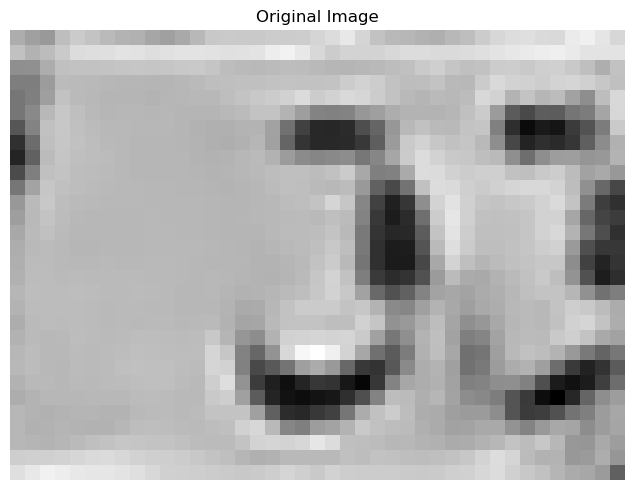

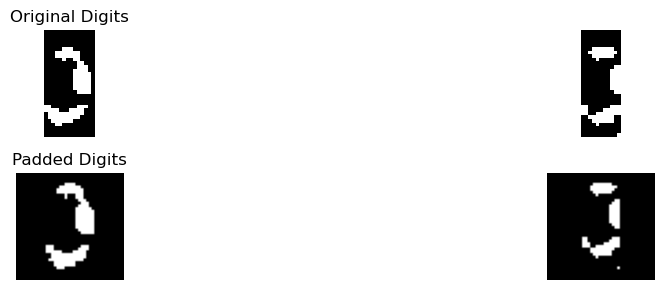

Best match: ق
Full comparison results: {'أ': 0.29166666666666663, 'ب': 0.2701425729442971, 'ج': 2.3201737424938322, 'د': 3.944619566593251, 'ر': 1.7603777575497965, 'س': 1.0223214285714286, 'ص': 1.3086309523809523, 'ط': 1.4006093544137024, 'ع': 1.582294951087396, 'ف': 3.5055217569012136, 'ق': 4.422669521024784, 'ك': 0.4138257575757575, 'ل': 2.740591060985798, 'م': 0.9636994949494949, 'ن': 3.606170634920635, 'ه': 1.1788978494623656, 'و': 2.57962962962963, 'ي': 2.0367196209587513}
Confidence :  0.23902497721576665
Best match: د
Full comparison results: {'أ': 0.03125, 'ب': 0.1280241935483871, 'ج': 0.21428571428571427, 'د': 1.4130098204564416, 'ر': 0.4922503840245776, 'س': 0.25547235023041476, 'ص': 0.22291666666666665, 'ط': 0.0625, 'ع': 0.06696428571428571, 'ف': 1.3601945612238482, 'ق': 0.7805476470034312, 'ك': 0.0, 'ل': 0.7077205882352942, 'م': 0.7118244658567239, 'ن': 1.0130875576036866, 'ه': 0.7623655913978494, 'و': 0.9467261904761904, 'ي': 0.0}
Confidence :  0.026407629616296724
[['١',

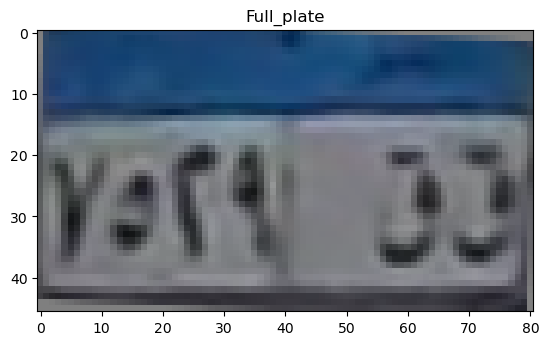

top
[0.3787989  0.47553012 0.53241944 0.52663086 0.5309318  0.49487312
 0.48159111 0.48142872 0.48863143 0.5017619  0.50644907 0.504827
 0.50692708 0.50601855 0.50229562 0.50171989 0.50130282 0.49902853
 0.49525465 0.49318215 0.49116947 0.4895698  0.5034904  0.52076391
 0.52016731 0.50433463 0.47929431 0.47013328 0.53149169 0.58768429
 0.55867913 0.54817983 0.55268387 0.53484647 0.51737993 0.52195488
 0.55133039 0.58007167 0.54727648 0.51503956]
[0.35657637 0.44551245 0.47686425 0.47060495 0.49366019 0.49269424
 0.49161865 0.48809629 0.47324906 0.468526   0.46521785 0.46827568
 0.48791687 0.48471278 0.47076693 0.47481604 0.48061707 0.47706573
 0.47561275 0.48135086 0.487604   0.49648539 0.50802697 0.50003649
 0.44990452 0.36363775 0.28443961 0.27395176 0.37599456 0.50412227
 0.53818104 0.54787664 0.53582915 0.45502411 0.36837667 0.36336305
 0.46222227 0.5493847  0.51816709 0.49432338]
[0.33612749 0.41446687 0.42013267 0.41470803 0.44814733 0.48335214
 0.50628365 0.51355501 0.48142615 0

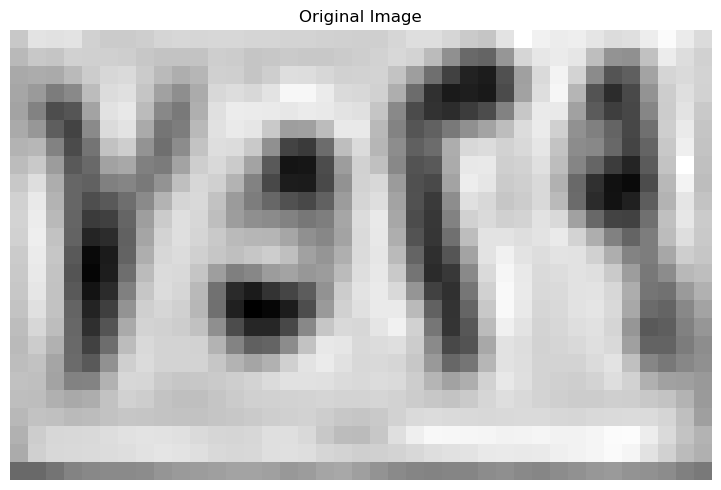

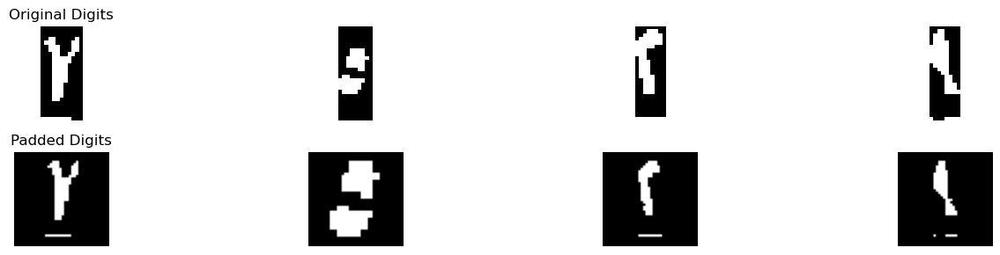

Best match: ١
Full comparison results: {'١': 2.513392857142857, '٢': 2.0669642857142856, '٣': 2.3948335913312695, '٤': 1.392261904761905, '٥': 0.3518953634085213, '٦': 0.48630952380952375, '٧': 1.050735294117647, '٨': 2.326388888888889, '٩': 1.907767273576097}
Confidence :  0.059279632905793855
Best match: ٥
Full comparison results: {'١': 0.8571428571428571, '٢': 1.607142857142857, '٣': 1.2455357142857144, '٤': 2.3229166666666665, '٥': 6.514880952380952, '٦': 1.9062499999999998, '٧': 0.7931547619047619, '٨': 1.3958333333333333, '٩': 0.994575652841782}
Confidence :  2.0959821428571423
Best match: ٢
Full comparison results: {'١': 1.6437500000000003, '٢': 4.168851981351981, '٣': 3.1037151702786376, '٤': 2.2857645043128914, '٥': 1.1458379404393337, '٦': 0.4074404761904762, '٧': 0.4176470588235294, '٨': 0.7548611111111111, '٩': 1.5946612619406737}
Confidence :  0.5325684055366717
Best match: ١
Full comparison results: {'١': 4.55625, '٢': 1.63243006993007, '٣': 1.4104102167182662, '٤': 1.499

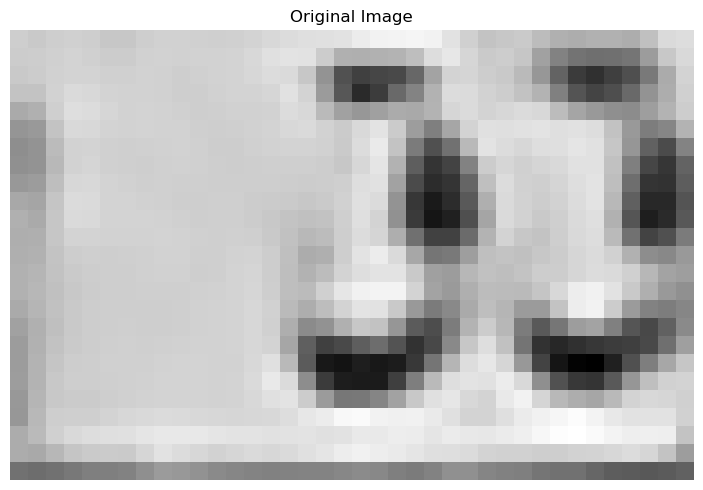

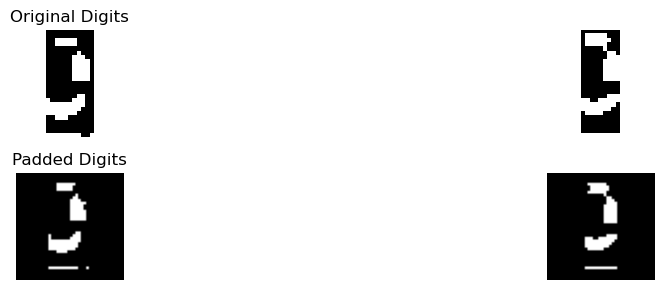

Best match: م
Full comparison results: {'أ': 0.39583333333333326, 'ب': 0.0, 'ج': 0.09375, 'د': 0.8987966719254752, 'ر': 0.03125, 'س': 0.8313652073732718, 'ص': 0.5892857142857143, 'ط': 0.35143280632411067, 'ع': 0.6113095238095237, 'ف': 0.9142909356725146, 'ق': 0.3170687134502924, 'ك': 0.125, 'ل': 0.13078703703703703, 'م': 1.1840847996089932, 'ن': 0.39553571428571427, 'ه': 0.8611559139784946, 'و': 0.2517857142857143, 'ي': 0.2662878787878788}
Confidence :  0.13489693196823926
Best match: د
Full comparison results: {'أ': 0.17708333333333331, 'ب': 0.03225806451612903, 'ج': 0.14136904761904762, 'د': 1.1250832313254913, 'ر': 0.03125, 'س': 0.7376152073732718, 'ص': 0.3514880952380952, 'ط': 0.5122070104976836, 'ع': 0.365022349936143, 'ف': 0.8460038986354775, 'ق': 0.4673193400167084, 'ك': 0.125, 'ل': 0.09375, 'م': 1.0960027875350455, 'ن': 0.6767857142857143, 'ه': 0.9237231182795699, 'و': 0.7026785714285714, 'ي': 0.2683712121212121}
Confidence :  0.01454022189522286
[['١', '٥', '٢', '١'], ['م', 'د

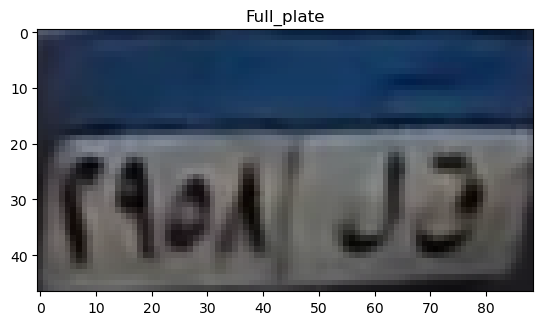

top
[0.15381922 0.14934706 0.14964471 0.14992745 0.13761216 0.1208098
 0.10737843 0.10290627 0.11775922 0.11440314 0.10684275 0.09983294
 0.11777412 0.1404702  0.16344902 0.20154863 0.23629216 0.24441804
 0.23629216 0.24104706 0.25281176 0.24608471 0.24299647 0.24580196
 0.2536451  0.26569255 0.27745725 0.28221216 0.28613373 0.28641647
 0.2847349  0.26904863 0.25897333 0.25785725 0.26232941 0.27492745
 0.28752549 0.2992902  0.30741608 0.31245373 0.3135698  0.30964824
 0.29676745 0.27043255]
[0.15073098 0.14597608 0.15300078 0.16813647 0.1958702  0.22752549
 0.28076078 0.31886039 0.33791765 0.33791765 0.32671843 0.34240471
 0.37377725 0.37294392 0.38304196 0.42506314 0.45279686 0.44915804
 0.43318902 0.44074941 0.46202392 0.46706157 0.47098314 0.47098314
 0.46706157 0.46314    0.45529686 0.44745373 0.43961059 0.43568902
 0.43148471 0.42335882 0.42029333 0.41525569 0.40095333 0.39394353
 0.3978651  0.41046314 0.41887176 0.43063647 0.43959569 0.44772157
 0.4438     0.43203529]
[0.14232235

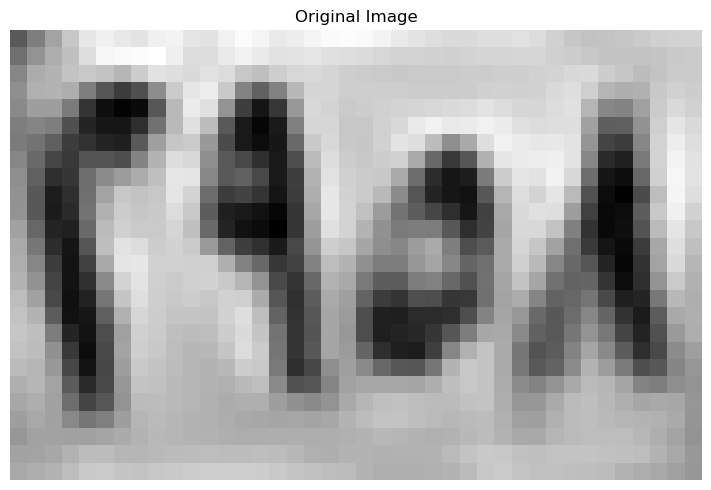

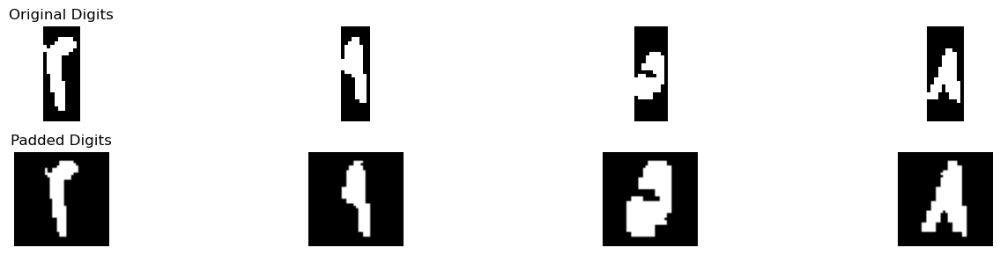

Best match: ٢
Full comparison results: {'١': 1.2857142857142856, '٢': 6.125, '٣': 4.590654024767802, '٤': 2.9538690476190474, '٥': 2.2211226595901516, '٦': 1.1577380952380953, '٧': 2.052941176470588, '٨': 1.5673611111111112, '٩': 1.013188608776844}
Confidence :  0.7671729876160991
Best match: ٩
Full comparison results: {'١': 3.2083333333333335, '٢': 2.362980769230769, '٣': 1.27921826625387, '٤': 2.2886446886446885, '٥': 1.7736022040395105, '٦': 1.8901785714285713, '٧': 0.7279411764705883, '٨': 3.1277777777777778, '٩': 4.113263574660634}
Confidence :  0.4524651206636501
Best match: ٥
Full comparison results: {'١': 0.5789473684210527, '٢': 1.5197368421052633, '٣': 1.394736842105263, '٤': 2.00328947368421, '٥': 6.977521929824562, '٦': 1.788486842105263, '٧': 1.0421052631578946, '٨': 1.4315789473684208, '٩': 0.4720394736842105}
Confidence :  2.4871162280701755
Best match: ٨
Full comparison results: {'١': 1.368421052631579, '٢': 1.03125, '٣': 0.8421052631578947, '٤': 0.7039473684210527, '٥'

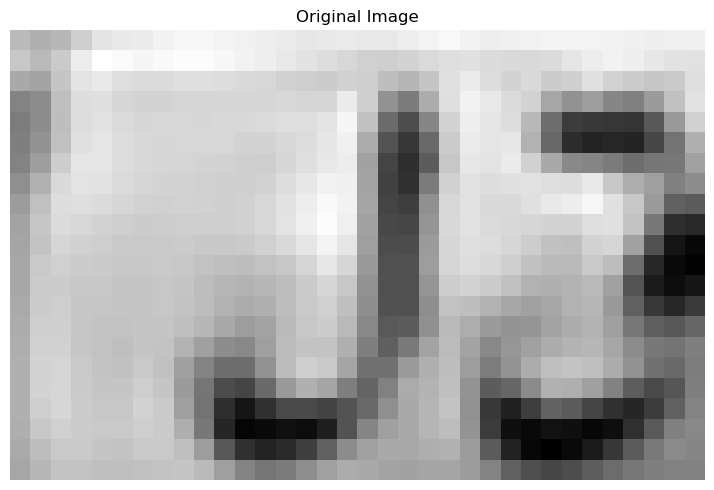

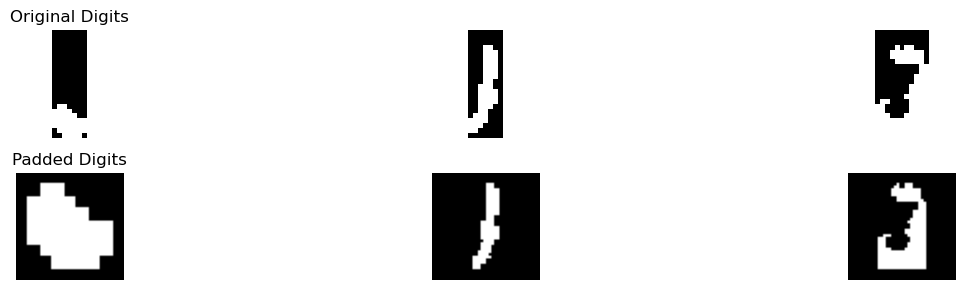

Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.875, 'ج': 1.4375, 'د': 1.53125, 'ر': 0.59375, 'س': 0.25, 'ص': 0.375, 'ط': 1.3125, 'ع': 0.6875, 'ف': 2.15625, 'ق': 0.90625, 'ك': 1.46875, 'ل': 0.5, 'م': 0.40625, 'ن': 0.90625, 'ه': 3.25, 'و': 1.15625, 'ي': 1.03125}
Confidence :  0.546875
Best match: أ
Full comparison results: {'أ': 1.4913461538461539, 'ب': 0.28771551724137934, 'ج': 0.924746951920865, 'د': 1.0204430137286176, 'ر': 0.7779902013279075, 'س': 0.7366071428571428, 'ص': 1.055952380952381, 'ط': 0.9897891963109354, 'ع': 0.1338815789473684, 'ف': 0.8721717488164855, 'ق': 0.9605123920913394, 'ك': 0.37594696969696967, 'ل': 0.9972329721362229, 'م': 1.007149100899101, 'ن': 0.7596428571428572, 'ه': 0.9811827956989247, 'و': 1.267063492063492, 'ي': 1.246207264957265}
Confidence :  0.11214133089133094
Best match: ف
Full comparison results: {'أ': 0.3090277777777778, 'ب': 0.13793103448275862, 'ج': 3.0078646192776626, 'د': 4.775588782562467, 'ر': 2.2618030270578995, 'س': 1.03125, 'ص

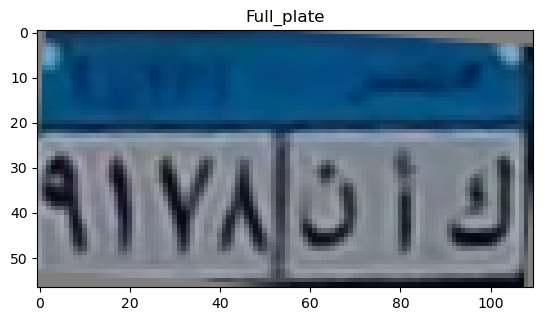

top
[0.2970496  0.25289495 0.29027696 0.30795748 0.29625428 0.28617373
 0.27042808 0.25204314 0.23168335 0.22254615 0.2088433  0.19866127
 0.17634377 0.18470949 0.22582309 0.2559407  0.26671095 0.26401171
 0.28316337 0.30452774 0.3109478  0.29846482 0.28204963 0.27334978
 0.28082155 0.27176412 0.26757251 0.26568548 0.27131353 0.28251295
 0.27863596 0.28199976 0.29056532 0.30010565 0.28919358 0.2762993
 0.26659152 0.25672581 0.23952955 0.24583721 0.26712392 0.2811998
 0.28926923 0.28361695 0.29429194 0.31877619 0.34174692 0.35462921
 0.36211196 0.36340433 0.36910022 0.32956017 0.24138454 0.16735362
 0.15556662]
[0.39763573 0.47574555 0.55750729 0.5862462  0.5793151  0.56199982
 0.54234403 0.51731578 0.50700988 0.51512316 0.51977205 0.53734824
 0.55545255 0.53401744 0.55488299 0.54379479 0.5162652  0.50749578
 0.51377922 0.53272874 0.54445339 0.54992159 0.54794612 0.55422572
 0.57040257 0.57815391 0.58540592 0.56862223 0.55371945 0.54380687
 0.54818446 0.54972815 0.55109332 0.55108615 0.

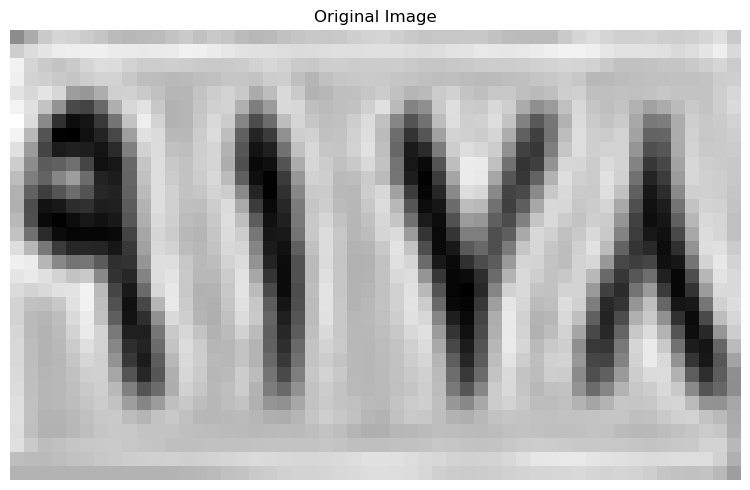

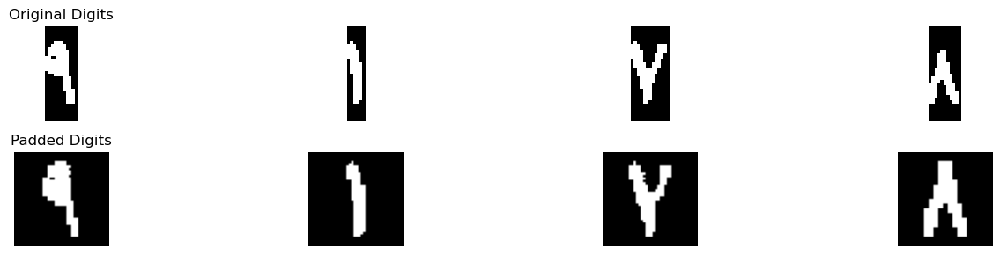

Best match: ٩
Full comparison results: {'١': 2.5, '٢': 2.6520833333333336, '٣': 2.0547600619195046, '٤': 2.5, '٥': 2.669748820580864, '٦': 2.2541666666666664, '٧': 1.2919117647058824, '٨': 2.8625, '٩': 5.909477124183007}
Confidence :  1.5234885620915035
Best match: ١
Full comparison results: {'١': 6.55, '٢': 1.7766608391608392, '٣': 0.6776315789473684, '٤': 1.4568223443223443, '٥': 1.3178534571723426, '٦': 1.2785714285714285, '٧': 1.4080882352941178, '٨': 2.6930555555555555, '٩': 1.9665189793866265}
Confidence :  1.9284722222222221
Best match: ٧
Full comparison results: {'١': 0.33333333333333337, '٢': 2.736111111111111, '٣': 2.995614035087719, '٤': 1.878472222222222, '٥': 1.3775584795321638, '٦': 0.7055555555555555, '٧': 5.431944444444444, '٨': 0.9527777777777778, '٩': 1.357638888888889}
Confidence :  1.2181652046783622
Best match: ٨
Full comparison results: {'١': 2.4722222222222223, '٢': 1.2638888888888888, '٣': 0.7690058479532162, '٤': 2.1180555555555554, '٥': 2.8140403091060984, '٦'

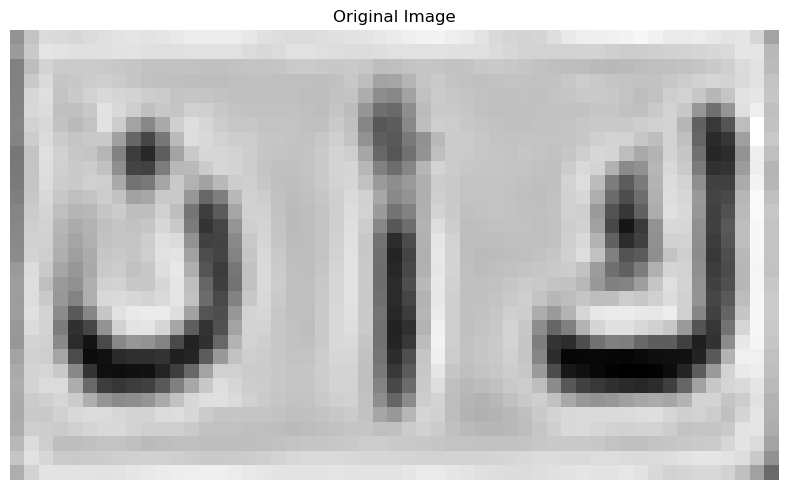

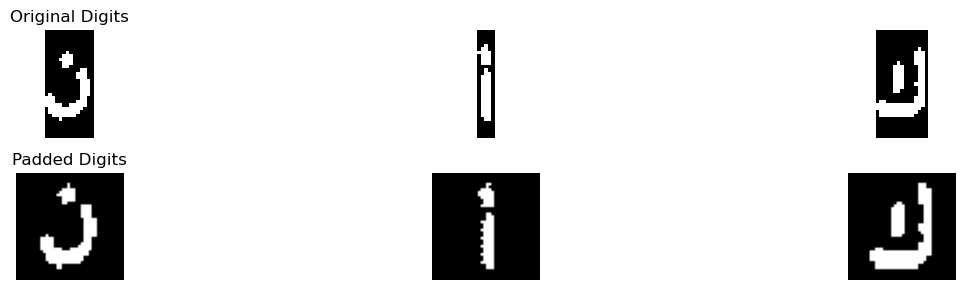

Best match: ن
Full comparison results: {'أ': 0.4419642857142857, 'ب': 0.39588859416445626, 'ج': 1.685961582700713, 'د': 4.441857864357864, 'ر': 2.0973498072392376, 'س': 1.3348214285714286, 'ص': 1.1101190476190474, 'ط': 1.783267457180501, 'ع': 1.1041666666666665, 'ف': 3.35978835978836, 'ق': 3.2073412698412698, 'ك': 0.7821969696969696, 'ل': 2.513392857142857, 'م': 0.9450757575757576, 'ن': 4.525416666666667, 'ه': 1.7111559139784946, 'و': 2.00843253968254, 'ي': 1.6596940197483674}
Confidence :  0.04177940115440126
Best match: أ
Full comparison results: {'أ': 2.9899895131749967, 'ب': 0.540948275862069, 'ج': 0.9234170117322291, 'د': 0.8857413531600837, 'ر': 0.06458333333333333, 'س': 0.09821428571428571, 'ص': 0.2663690476190476, 'ط': 0.47237318840579706, 'ع': 0.09375, 'ف': 0.6745422584238374, 'ق': 0.25050125313283206, 'ك': 0.12670454545454546, 'ل': 0.0, 'م': 0.3894230769230769, 'ن': 0.38761904761904764, 'ه': 0.5364247311827957, 'و': 0.6178571428571429, 'ي': 0.6115766178266178}
Confidence :  1

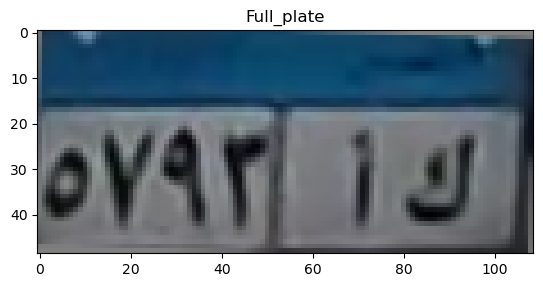

top
[0.36355421 0.42888397 0.45159539 0.48064577 0.47447765 0.47611725
 0.48159904 0.49725712 0.49751348 0.50763091 0.51550017 0.52074765
 0.51851155 0.50475126 0.49888322 0.49934054 0.52336913 0.53441568
 0.54094289 0.54644938 0.54490608 0.53553216 0.52686946 0.52281355
 0.51613104 0.5137201  0.51843542 0.52403696 0.53406117 0.54078663
 0.53600592 0.53151832 0.52616317 0.53685336 0.54819224 0.55620698
 0.5567336  0.55114808 0.54600118 0.53466216 0.52667156 0.52017152
 0.52141884 0.53066605 0.53818313 0.5387964  0.54180668 0.5419698
 0.53463026 0.56308924 0.57631603 0.48606513 0.36175008 0.31352303]
[0.38924999 0.45737627 0.44266852 0.46981171 0.46439053 0.46970242
 0.46046897 0.45777929 0.46525664 0.47557159 0.48510917 0.48703745
 0.47978884 0.47759245 0.47744392 0.47204442 0.49953014 0.50188543
 0.49329945 0.4880851  0.48561129 0.48950633 0.4954377  0.49377126
 0.47906936 0.47963765 0.48744838 0.49621763 0.51469419 0.53017275
 0.5286865  0.49954407 0.46828318 0.51580408 0.56353507 0.

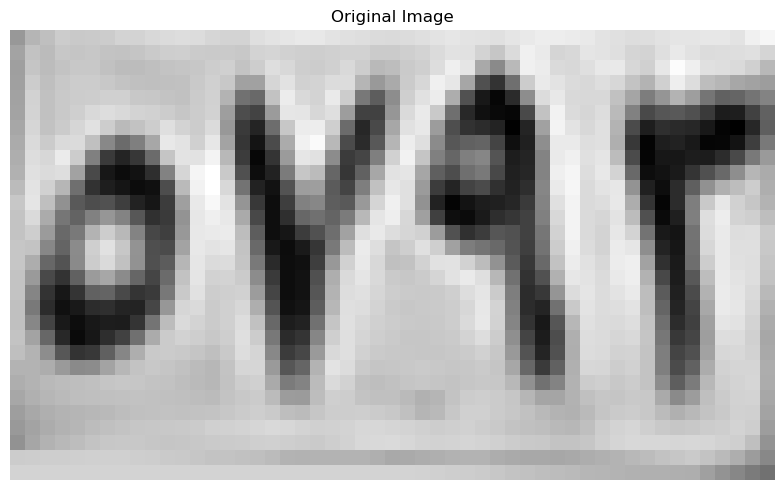

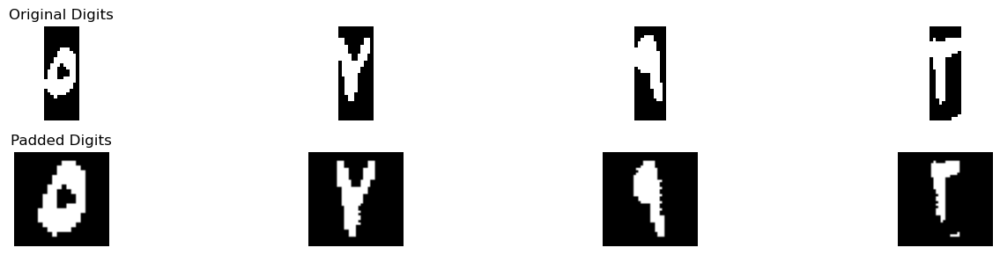

Best match: ٥
Full comparison results: {'١': 0.7999999999999999, '٢': 1.5999999999999999, '٣': 1.2125, '٤': 1.8125, '٥': 5.9279761904761905, '٦': 1.3812499999999999, '٧': 1.18125, '٨': 1.38125, '٩': 0.4125}
Confidence :  2.0577380952380953
Best match: ٧
Full comparison results: {'١': 0.5, '٢': 1.84375, '٣': 3.389609133126935, '٤': 1.8125, '٥': 1.2724227849034349, '٦': 0.5375, '٧': 4.8569852941176475, '٨': 1.4659722222222222, '٩': 1.5541258169934642}
Confidence :  0.7336880804953563
Best match: ٩
Full comparison results: {'١': 3.197115384615385, '٢': 3.658653846153846, '٣': 2.2698335913312695, '٤': 2.527449633699634, '٥': 2.8440126050420167, '٦': 1.7083333333333333, '٧': 1.2731617647058824, '٨': 2.795138888888889, '٩': 4.651253770739065}
Confidence :  0.49629996229260964
Best match: ٢
Full comparison results: {'١': 1.2708333333333333, '٢': 4.709935897435898, '٣': 4.5109326625387, '٤': 2.2618589743589745, '٥': 1.2863546734483269, '٦': 1.8595238095238096, '٧': 0.4125, '٨': 0.7041666666666

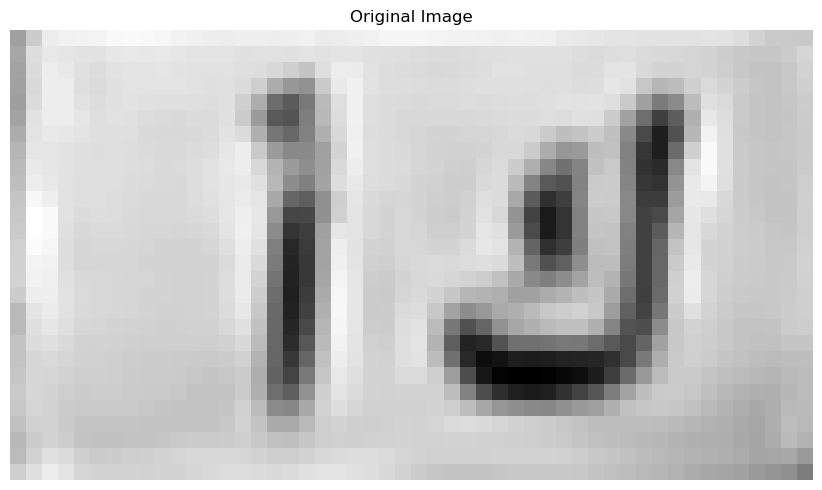

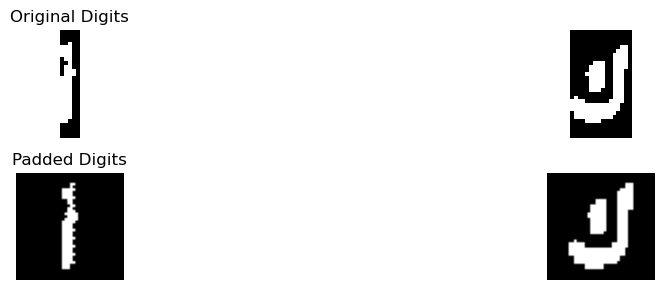

Best match: أ
Full comparison results: {'أ': 2.5894001831501834, 'ب': 0.31573275862068967, 'ج': 0.4715320910973085, 'د': 0.6949458986146293, 'ر': 0.03125, 'س': 0.09821428571428571, 'ص': 0.4616071428571429, 'ط': 0.9104907773386033, 'ع': 0.09375, 'ف': 0.6230680868838763, 'ق': 0.11513157894736842, 'ك': 0.1496212121212121, 'ل': 0.0, 'م': 0.1846590909090909, 'ن': 0.39375, 'ه': 0.5748655913978494, 'و': 0.6220238095238094, 'ي': 0.39520757020757014}
Confidence :  0.83945470290579
Best match: ك
Full comparison results: {'أ': 0.6145833333333334, 'ب': 0.5233753315649867, 'ج': 1.0891203703703702, 'د': 3.164027777777778, 'ر': 2.493778735632184, 'س': 1.7946428571428572, 'ص': 1.9833333333333334, 'ط': 2.03125, 'ع': 1.1979166666666667, 'ف': 2.392857142857143, 'ق': 1.4039351851851853, 'ك': 3.854166666666666, 'ل': 2.1145833333333335, 'م': 0.125, 'ن': 2.719583333333333, 'ه': 2.134072580645161, 'و': 2.6203703703703702, 'ي': 2.2810897435897433}
Confidence :  0.345069444444444
[['٥', '٧', '٩', '٢'], ['أ', 'ك

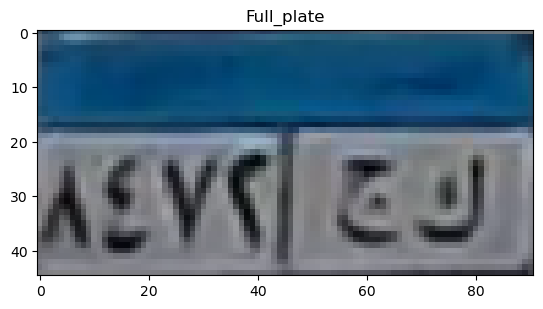

top
[0.35258779 0.30955718 0.3105352  0.35408273 0.34106536 0.31188853
 0.30717236 0.29391342 0.29214491 0.28388842 0.28493099 0.27788445
 0.27374152 0.2802213  0.27948858 0.28391566 0.28289189 0.2922531
 0.28810273 0.28828583 0.27532088 0.26314499 0.26532629 0.2606629
 0.26650187 0.2623929  0.26895741 0.26560875 0.27948743 0.28754089
 0.3016712  0.31047706 0.33158336 0.34376145 0.35303819 0.36313654
 0.35418468 0.34030369 0.34793163 0.34301614 0.33894744 0.322654
 0.31027075 0.28123189 0.28934409]
[0.50108728 0.5038529  0.52818059 0.57609348 0.53619134 0.50951083
 0.51524183 0.5102621  0.51777971 0.51720909 0.52652882 0.52358294
 0.51981456 0.52485439 0.52740494 0.53339452 0.53498    0.54466137
 0.54528478 0.54370001 0.53711931 0.53155039 0.53031455 0.52484
 0.52215324 0.51495053 0.51323484 0.51012363 0.51674127 0.5256031
 0.53780108 0.54618627 0.56466955 0.5710381  0.58315679 0.57926444
 0.58971143 0.60896744 0.60557436 0.59675083 0.58764722 0.56903684
 0.51905816 0.49835033 0.403128

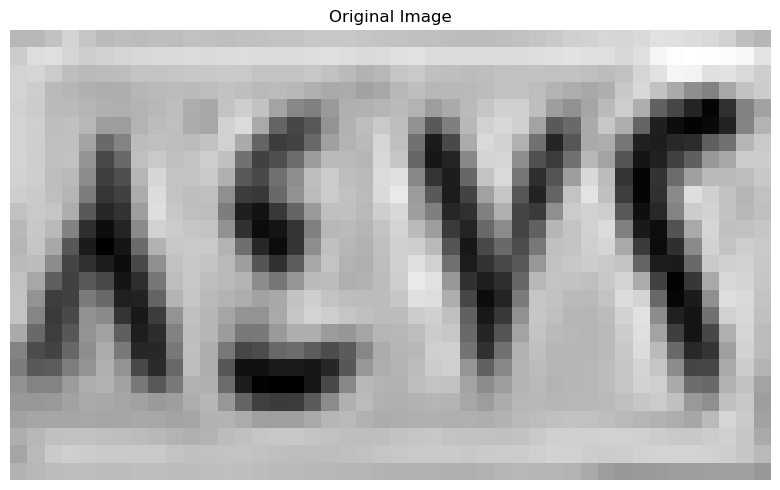

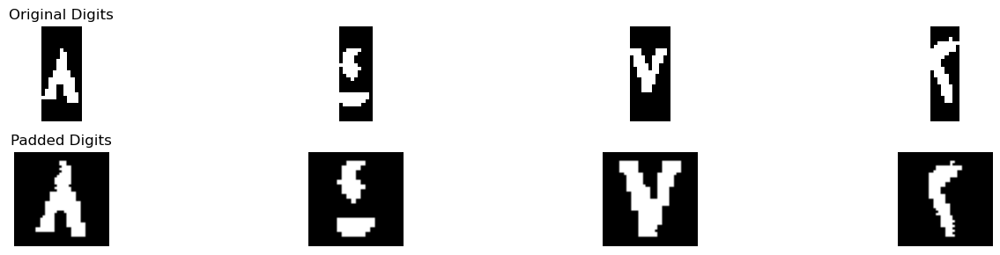

Best match: ٨
Full comparison results: {'١': 2.050595238095238, '٢': 0.8080357142857143, '٣': 0.6190476190476191, '٤': 1.2648809523809523, '٥': 1.5833333333333333, '٦': 1.2038690476190477, '٧': 0.7604166666666667, '٨': 5.415178571428571, '٩': 2.0863095238095237}
Confidence :  1.6644345238095237
Best match: ٤
Full comparison results: {'١': 1.6875, '٢': 2.1875, '٣': 1.935952012383901, '٤': 5.004905913978495, '٥': 4.209867499631431, '٦': 0.3125, '٧': 0.5139705882352941, '٨': 1.8868055555555556, '٩': 2.303513071895425}
Confidence :  0.3975192071735316
Best match: ٧
Full comparison results: {'١': 0.42307692307692313, '٢': 1.2692307692307692, '٣': 0.9615384615384616, '٤': 1.7884615384615385, '٥': 1.9038461538461542, '٦': 1.0024038461538463, '٧': 1.9591346153846156, '٨': 0.7019230769230769, '٩': 0.8725961538461539}
Confidence :  0.027644230769230727
Best match: ٢
Full comparison results: {'١': 0.7991071428571428, '٢': 6.200892857142857, '٣': 4.041698916408668, '٤': 2.850892857142857, '٥': 2.2

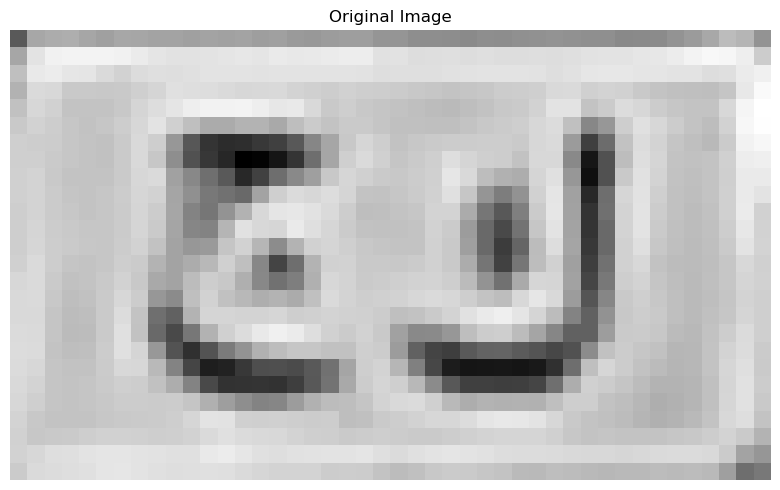

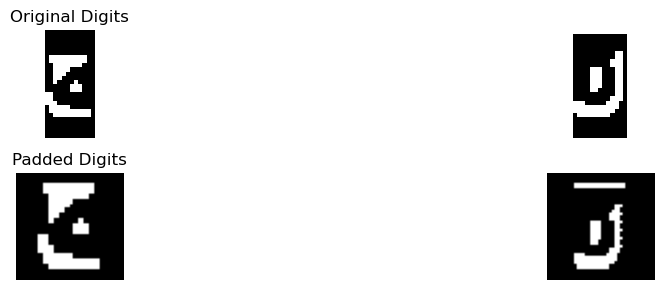

Best match: ج
Full comparison results: {'أ': 0.13043478260869565, 'ب': 0.4135444297082228, 'ج': 5.416666666666666, 'د': 1.7160527375201289, 'ر': 0.4707065217391304, 'س': 0.5892857142857143, 'ص': 0.36820652173913043, 'ط': 1.0751811594202898, 'ع': 1.778532608695652, 'ف': 2.1140010351966874, 'ق': 2.076187600644122, 'ك': 1.4451992753623188, 'ل': 0.4483695652173913, 'م': 1.25, 'ن': 1.56125, 'ه': 0.44254032258064513, 'و': 0.9509863123993558, 'ي': 1.3321070234113712}
Confidence :  1.6513328157349894
Best match: ل
Full comparison results: {'أ': 0.3157894736842105, 'ب': 0.4856598143236074, 'ج': 1.426781779327546, 'د': 2.345462741449584, 'ر': 2.081587011945155, 'س': 0.8258928571428572, 'ص': 0.6854166666666666, 'ط': 2.755011293054771, 'ع': 1.3183038415003026, 'ف': 2.244205944969952, 'ق': 3.2266969952380644, 'ك': 2.3892045454545454, 'ل': 3.378559862918946, 'م': 0.0, 'ن': 2.5603449147061204, 'ه': 0.8289650537634409, 'و': 2.282002890290242, 'ي': 1.7547666197265739}
Confidence :  0.07593143384044088


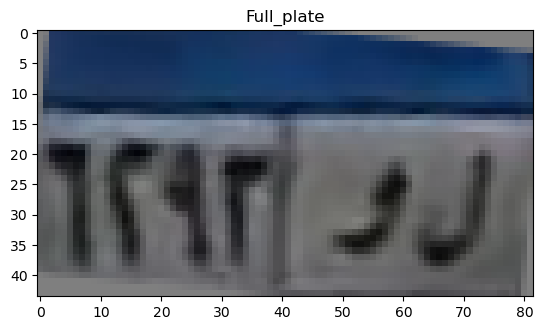

top
[0.46647412 0.46351588 0.45300167 0.47000561 0.48698438 0.49593468
 0.49973082 0.51539424 0.50707005 0.49097458 0.47863627 0.47385084
 0.46901548 0.46727781 0.47563669 0.49202429 0.51577113 0.53367567
 0.52492403 0.52115543 0.52447651 0.52479248 0.53210335 0.53331787
 0.5301703  0.52682543 0.5145644  0.49698062 0.49464749 0.50344979
 0.51599432 0.52513146 0.52161692 0.51627467 0.51249732 0.50106074
 0.50390265 0.50946594 0.48778732 0.42456954 0.33873913]
[0.45180911 0.4100766  0.30794683 0.30977757 0.32247809 0.3489435
 0.3822421  0.38673578 0.40878509 0.44888398 0.49125882 0.49891814
 0.46086667 0.40806325 0.33203674 0.29340431 0.31059564 0.3501884
 0.39245697 0.41375018 0.46315121 0.48510647 0.47016031 0.44993879
 0.42156819 0.41538424 0.4487546  0.47686902 0.48698363 0.50509093
 0.51925669 0.522389   0.51710304 0.50823272 0.50287096 0.49806353
 0.49324635 0.4932475  0.4818523  0.42887379 0.35753015]
[0.39214488 0.29374237 0.15202479 0.13738091 0.10881309 0.10239305
 0.14317572 0

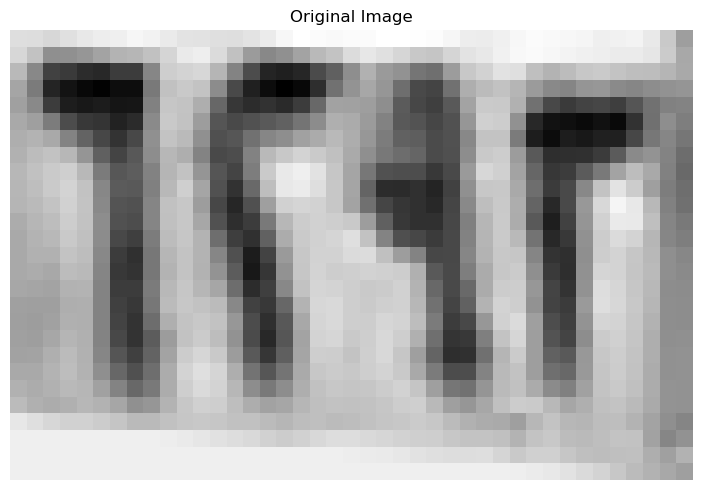

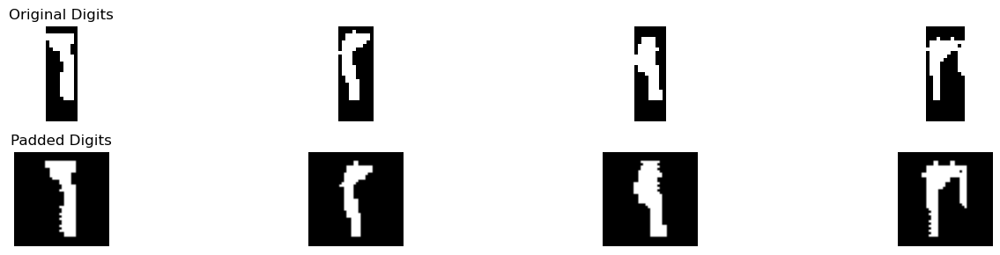

Best match: ٦
Full comparison results: {'١': 2.637019230769231, '٢': 2.199519230769231, '٣': 0.9765866873065016, '٤': 0.36160714285714285, '٥': 2.519142525431225, '٦': 4.762499999999999, '٧': 0.6305147058823529, '٨': 1.2333333333333334, '٩': 2.3755656108597285}
Confidence :  1.0627403846153842
Best match: ٢
Full comparison results: {'١': 0.6696428571428571, '٢': 6.004464285714286, '٣': 4.559404024767802, '٤': 2.5074404761904763, '٥': 1.9235036119711042, '٦': 1.063392857142857, '٧': 2.2481617647058822, '٨': 0.9055555555555556, '٩': 0.7701330532212884}
Confidence :  0.7225301304732419
Best match: ٢
Full comparison results: {'١': 2.446428571428571, '٢': 3.928571428571429, '٣': 1.8495549535603715, '٤': 2.3467261904761907, '٥': 2.6961429308565528, '٦': 1.8357142857142856, '٧': 1.2908088235294117, '٨': 2.1993055555555556, '٩': 3.67781279178338}
Confidence :  0.12537931839402439
Best match: ٣
Full comparison results: {'١': 0.7894736842105263, '٢': 1.1151315789473684, '٣': 2.601973684210526, '

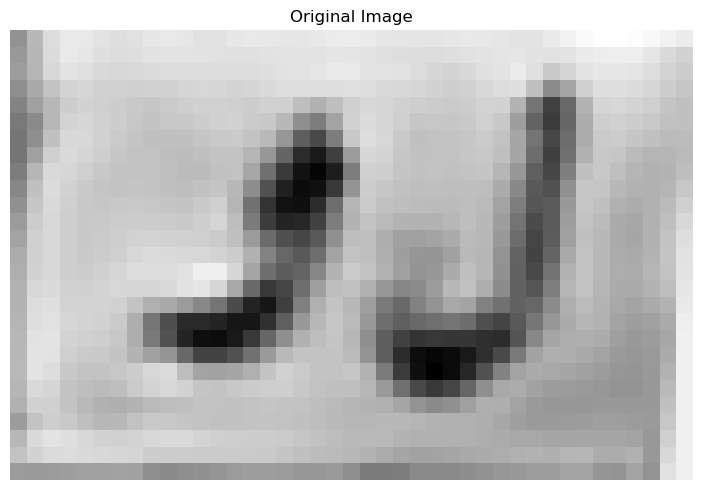

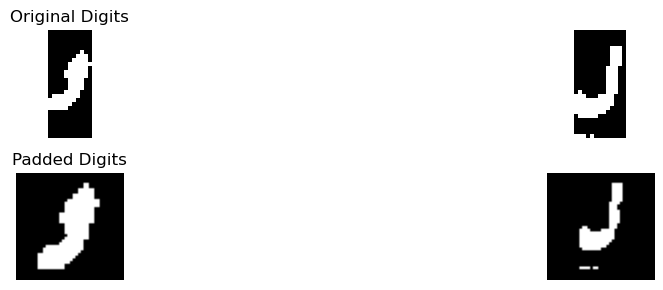

Best match: ص
Full comparison results: {'أ': 0.6521739130434784, 'ب': 0.1939655172413793, 'ج': 0.851147342995169, 'د': 2.975428743961353, 'ر': 1.4704891304347825, 'س': 3.0669642857142856, 'ص': 3.502173913043478, 'ط': 1.879981884057971, 'ع': 0.5652173913043478, 'ف': 2.46680900621118, 'ق': 1.8452596618357489, 'ك': 2.0009057971014492, 'ل': 1.5366847826086958, 'م': 1.0027173913043477, 'ن': 1.239836956521739, 'ه': 3.3256048387096775, 'و': 2.770531400966183, 'ي': 2.0957009476031216}
Confidence :  0.08828453716690032
Best match: ه
Full comparison results: {'أ': 0.09375, 'ب': 0.5864887267904509, 'ج': 0.28356481481481477, 'د': 0.5055280748663102, 'ر': 0.6352380952380953, 'س': 0.47868663594470046, 'ص': 0.7300595238095238, 'ط': 0.07291666666666666, 'ع': 0.0, 'ف': 0.5842644806460595, 'ق': 0.8707863408521304, 'ك': 0.08333333333333333, 'ل': 1.1691176470588236, 'م': 0.7443181818181819, 'ن': 0.2976190476190476, 'ه': 1.2381720430107528, 'و': 0.7943121693121693, 'ي': 0.6051282051282051}
Confidence :  0.

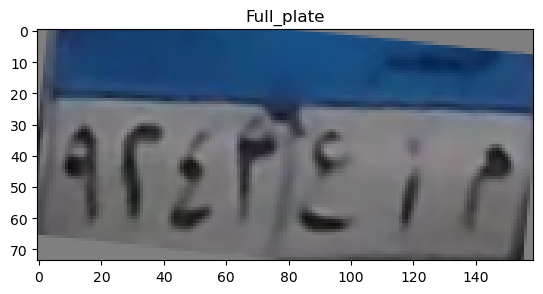

top
[0.29184817 0.23710172 0.36478289 0.39984408 0.38375181 0.39526809
 0.42694284 0.4493489  0.46117975 0.47152695 0.48024288 0.483735
 0.47447657 0.46195229 0.45914571 0.47453158 0.49695912 0.5042476
 0.49871444 0.48855543 0.4812722  0.48079874 0.48175218 0.48418333
 0.48663979 0.488709   0.49202647 0.49673695 0.50970417 0.53071854
 0.54274002 0.53991233 0.53306204 0.51393893 0.49173875 0.48397335
 0.48579184 0.48917466 0.50614917 0.52190955 0.51981358 0.51275169
 0.50824677 0.50434521 0.50232363 0.50261168 0.50296812 0.50237968
 0.50397014 0.50635009 0.50574029 0.50470187 0.50240105 0.49811398
 0.4918748  0.48288123 0.47211298 0.4661496  0.46821771 0.47675206
 0.48571592 0.48733468 0.48315248 0.47668427 0.46921474 0.46353304
 0.45639737 0.42723973 0.36277465 0.31443899 0.3131195  0.35476061
 0.41281569 0.4604665  0.43924089 0.35566048 0.30273668 0.28874647
 0.26257788]
[0.24566812 0.23297005 0.3761305  0.40709733 0.38071725 0.39069907
 0.42387536 0.44815378 0.4631105  0.47619203 0.4

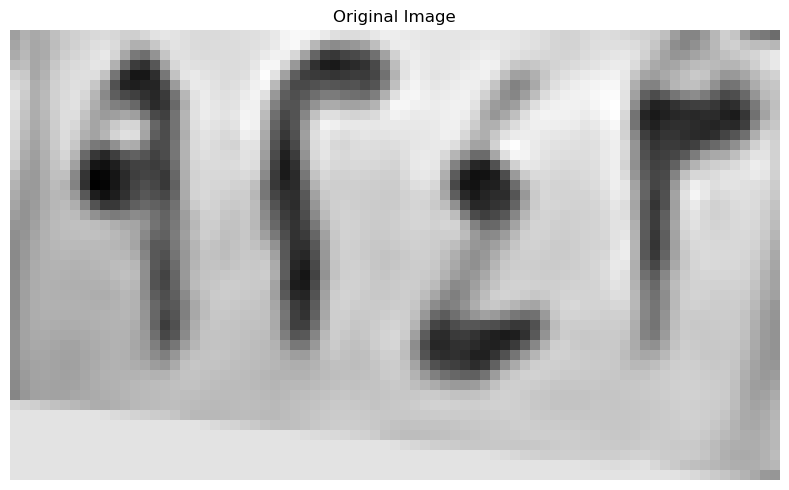

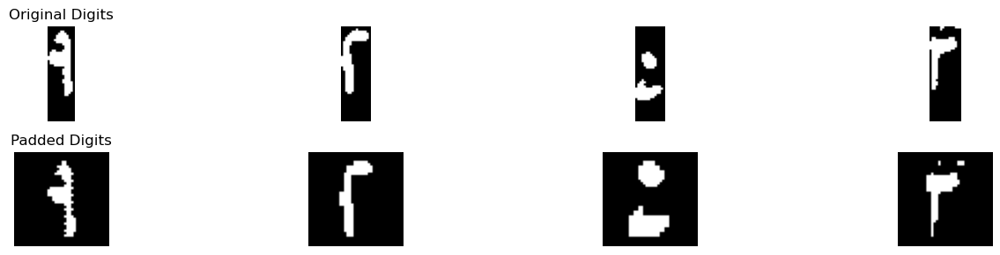

Best match: ٩
Full comparison results: {'١': 2.6666666666666665, '٢': 0.8910256410256411, '٣': 0.48645510835913314, '٤': 1.2824175824175823, '٥': 1.0030729397021967, '٦': 1.6797619047619048, '٧': 0.8658088235294118, '٨': 2.2333333333333334, '٩': 3.8901772247360484}
Confidence :  0.611755279034691
Best match: ٢
Full comparison results: {'١': 0.0, '٢': 3.758928571428571, '٣': 2.954624613003096, '٤': 1.8425595238095238, '٥': 1.7858110349402918, '٦': 1.4955357142857142, '٧': 0.8764705882352941, '٨': 0.3125, '٩': 0.33878968253968256}
Confidence :  0.4021519792127375
Best match: ٥
Full comparison results: {'١': 1.2536764705882353, '٢': 1.715073529411765, '٣': 1.3711300309597523, '٤': 2.5386029411764706, '٥': 5.830103752027126, '٦': 1.1033088235294117, '٧': 0.2801470588235294, '٨': 2.3388480392156863, '٩': 0.9507629664769133}
Confidence :  1.6457504054253278
Best match: ٩
Full comparison results: {'١': 0.8125, '٢': 0.875, '٣': 1.6744388544891642, '٤': 1.09375, '٥': 0.9608534203154946, '٦': 0.

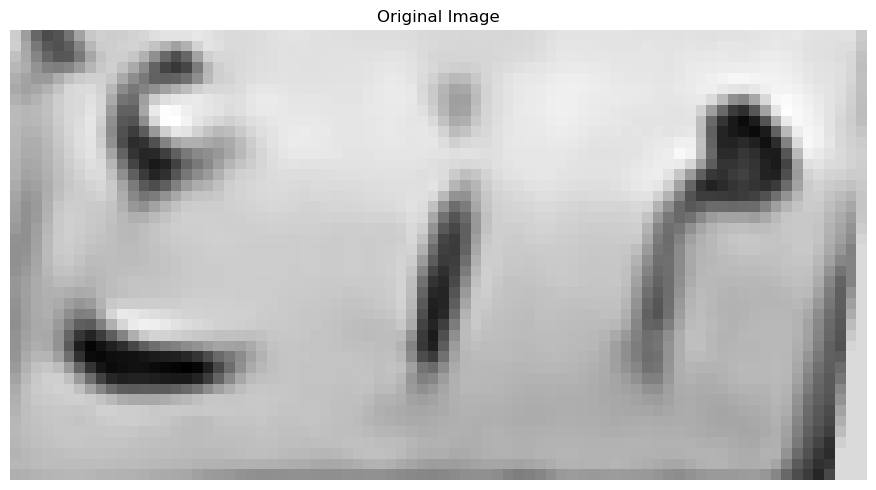

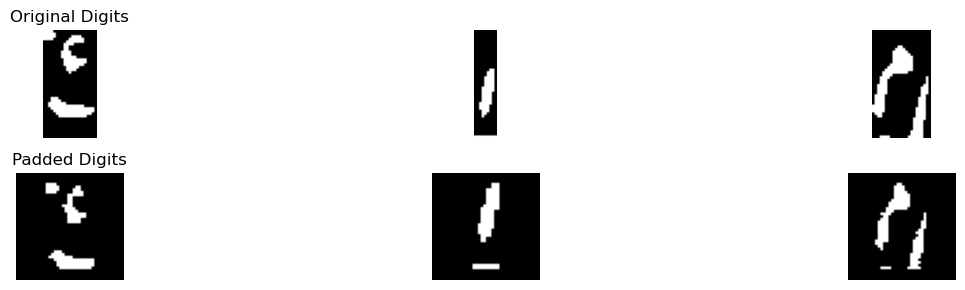

Best match: ق
Full comparison results: {'أ': 0.3472222222222222, 'ب': 0.0, 'ج': 2.036648838279273, 'د': 1.5616001067116627, 'ر': 1.1300112741248425, 'س': 0.6830357142857143, 'ص': 0.737797619047619, 'ط': 1.2429993306132858, 'ع': 1.9086202707755895, 'ف': 1.0866112975090054, 'ق': 2.2956624199387354, 'ك': 1.6327651515151516, 'ل': 1.313726798881261, 'م': 0.6925505050505051, 'ن': 1.7609920634920635, 'ه': 0.2561827956989247, 'و': 1.5590277777777777, 'ي': 1.2814938684503903}
Confidence :  0.12950679082973116
Best match: م
Full comparison results: {'أ': 1.3350961538461539, 'ب': 0.2741213527851459, 'ج': 1.1203818725557855, 'د': 0.7322881941186894, 'ر': 0.43219461697722567, 'س': 0.2544642857142857, 'ص': 0.7241071428571428, 'ط': 0.495018115942029, 'ع': 0.4464285714285714, 'ف': 0.2673611111111111, 'ق': 0.3269984707938428, 'ك': 0.48011363636363635, 'ل': 0.44522058823529415, 'م': 1.38626998001998, 'ن': 0.1875, 'ه': 0.3125, 'و': 0.9368716931216932, 'ي': 0.6886599511599512}
Confidence :  0.025586913086

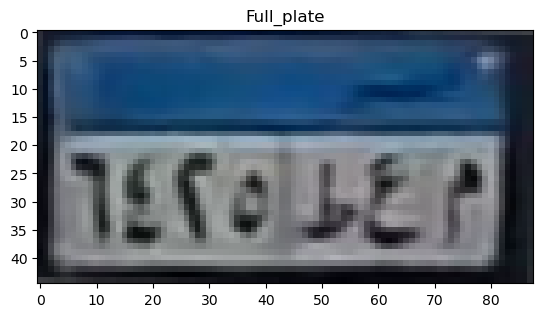

top
[0.10435338 0.06033263 0.17257157 0.35817524 0.3895591  0.36537947
 0.36559393 0.35217442 0.36330191 0.36694286 0.36265924 0.35726719
 0.36615965 0.37588347 0.37125195 0.37944193 0.38804411 0.39225482
 0.38162982 0.38934202 0.40276748 0.38287422 0.38547444 0.43615757
 0.45008494 0.4173244  0.39647192 0.38455379 0.36566558 0.37301957
 0.38736817 0.3877341  0.3769882  0.37540438 0.378566   0.38001199
 0.37184392 0.3719264  0.36860326 0.35375581 0.34301787 0.32344354
 0.29599256 0.26583784]
[0.10309548 0.06391352 0.17542126 0.37458783 0.45787928 0.48996257
 0.54181601 0.57578036 0.5925076  0.61222782 0.63473086 0.65022468
 0.66126803 0.66545728 0.66580964 0.66384642 0.66215924 0.65858365
 0.65557427 0.66098197 0.66730997 0.66814182 0.66558455 0.67218105
 0.6711034  0.67841343 0.6950035  0.68897127 0.68816235 0.68433228
 0.68410399 0.66748444 0.63423251 0.63415837 0.65291593 0.66519099
 0.67025455 0.67475416 0.67821816 0.67988807 0.67712806 0.65116517
 0.61602924 0.58385255]
[0.0907423

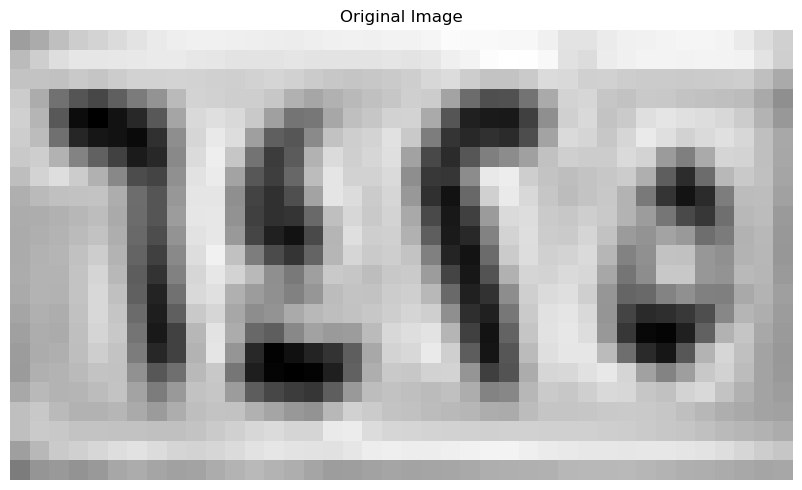

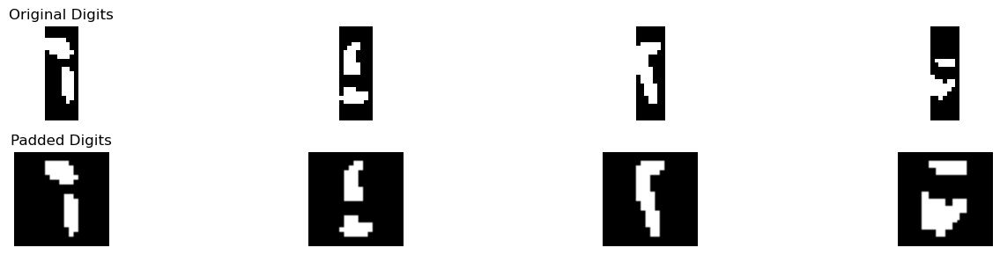

Best match: ٦
Full comparison results: {'١': 2.352678571428571, '٢': 1.2901785714285714, '٣': 1.8895123839009287, '٤': 0.0625, '٥': 3.0760863555948696, '٦': 5.928571428571429, '٧': 0.4227941176470588, '٨': 1.7916666666666665, '٩': 3.111227824463118}
Confidence :  1.4086718020541553
Best match: ٤
Full comparison results: {'١': 2.3080357142857144, '٢': 1.9017857142857144, '٣': 1.6057469040247678, '٤': 4.970247695852535, '٥': 3.0782747309450094, '٦': 0.35238095238095235, '٧': 0.6738970588235295, '٨': 2.3159722222222223, '٩': 2.3186547468449747}
Confidence :  0.9459864824537629
Best match: ٢
Full comparison results: {'١': 2.2604166666666665, '٢': 6.469551282051283, '٣': 3.1802438080495357, '٤': 3.5219551282051285, '٥': 2.3537243844906386, '٦': 1.2785714285714285, '٧': 2.6069852941176475, '٨': 1.0104166666666667, '٩': 2.4251036953242835}
Confidence :  1.4737980769230772
Best match: ٥
Full comparison results: {'١': 0.3684210526315789, '٢': 1.774671052631579, '٣': 1.299342105263158, '٤': 1.64

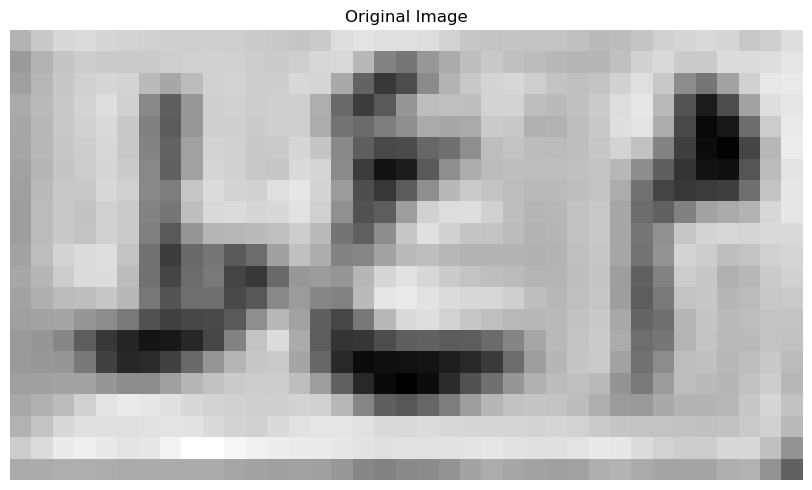

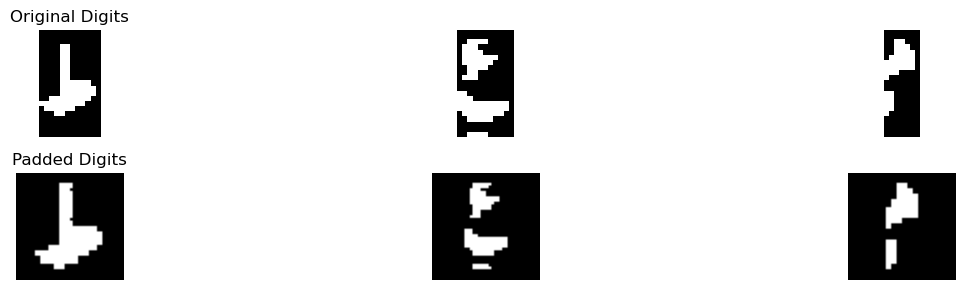

Best match: ط
Full comparison results: {'أ': 0.6537499999999999, 'ب': 0.2636770557029178, 'ج': 1.040324074074074, 'د': 2.9042592592592595, 'ر': 1.260948275862069, 'س': 1.6785714285714286, 'ص': 1.46375, 'ط': 4.1925, 'ع': 0.95375, 'ف': 2.6990476190476187, 'ق': 1.2626851851851852, 'ك': 1.4325, 'ل': 1.2062499999999998, 'م': 0.41875000000000007, 'ن': 1.85625, 'ه': 2.59375, 'و': 0.86375, 'ي': 2.1272115384615384}
Confidence :  0.6441203703703702
Best match: ه
Full comparison results: {'أ': 0.875, 'ب': 0.1627155172413793, 'ج': 1.2348004185311339, 'د': 1.4257399980194099, 'ر': 0.4373214285714285, 'س': 0.3839285714285714, 'ص': 0.0, 'ط': 0.8119235836627141, 'ع': 0.4993375576036867, 'ف': 0.6844106794764688, 'ق': 0.0625, 'ك': 0.10795454545454546, 'ل': 0.15625, 'م': 1.2471590909090908, 'ن': 0.40625, 'ه': 1.9320564516129033, 'و': 0.3413018433179723, 'ي': 0.1875}
Confidence :  0.2531582267967467
Best match: م
Full comparison results: {'أ': 0.36217948717948717, 'ب': 0.0, 'ج': 0.6886894094555385, 'د': 2

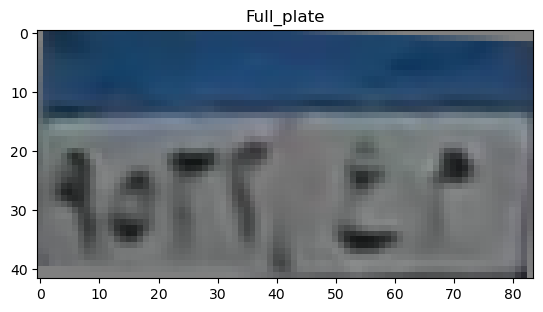

top
[0.44657512 0.45529801 0.52323545 0.55696119 0.57295577 0.56856259
 0.56442823 0.55966809 0.55186283 0.54236308 0.53777932 0.53185236
 0.5239667  0.52007133 0.5230125  0.52694369 0.52154434 0.51705691
 0.51310916 0.505898   0.5029891  0.50830811 0.51410163 0.51747647
 0.52029487 0.51754797 0.51456326 0.50798195 0.5041562  0.50612892
 0.50829348 0.51054638 0.5170552  0.52701891 0.52627729 0.52780338
 0.5331885  0.54866755 0.55332703 0.52824243 0.49202629 0.45207496]
[0.45919425 0.48847567 0.50405014 0.51557165 0.51833987 0.52158641
 0.51952451 0.5081733  0.502409   0.5017751  0.49776455 0.49207784
 0.48160417 0.47638807 0.47528392 0.47585263 0.47217162 0.4696273
 0.4659555  0.46290294 0.46166501 0.46742726 0.47746386 0.47947355
 0.48426032 0.48545001 0.4903356  0.49324512 0.49517431 0.49287161
 0.49034396 0.49016548 0.49438193 0.51800332 0.52672542 0.51311263
 0.51003117 0.53315738 0.54395458 0.5159061  0.47679621 0.44253428]
[0.44988255 0.48598879 0.45736414 0.46036192 0.46723522 0

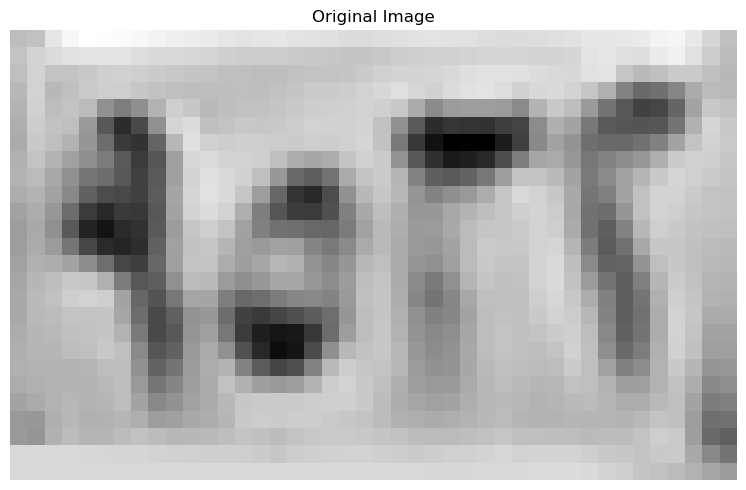

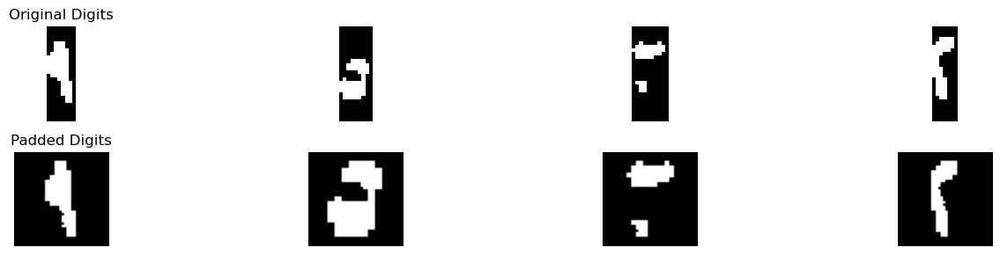

Best match: ٩
Full comparison results: {'١': 2.915865384615385, '٢': 3.3149038461538463, '٣': 1.80843653250774, '٤': 2.3965201465201464, '٥': 2.000497567448032, '٦': 1.3708333333333333, '٧': 1.4169117647058824, '٨': 3.0006944444444446, '٩': 4.435771744595274}
Confidence :  0.560433949220714
Best match: ٥
Full comparison results: {'١': 0.3913043478260869, '٢': 1.3994565217391304, '٣': 1.308423913043478, '٤': 1.767663043478261, '٥': 6.319293478260869, '٦': 1.7377717391304346, '٧': 0.9130434782608695, '٨': 0.6956521739130435, '٩': 0.2921195652173913}
Confidence :  2.275815217391304
Best match: ٣
Full comparison results: {'١': 0.75, '٢': 0.63125, '٣': 3.3812499999999996, '٤': 1.194758064516129, '٥': 1.7714285714285714, '٦': 1.44375, '٧': 1.49375, '٨': 0.7000000000000001, '٩': 0.8625}
Confidence :  0.8049107142857141
Best match: ٢
Full comparison results: {'١': 0.125, '٢': 5.777389277389277, '٣': 3.746904024767802, '٤': 2.8344551282051285, '٥': 2.485768649565089, '٦': 0.6845238095238095, '٧

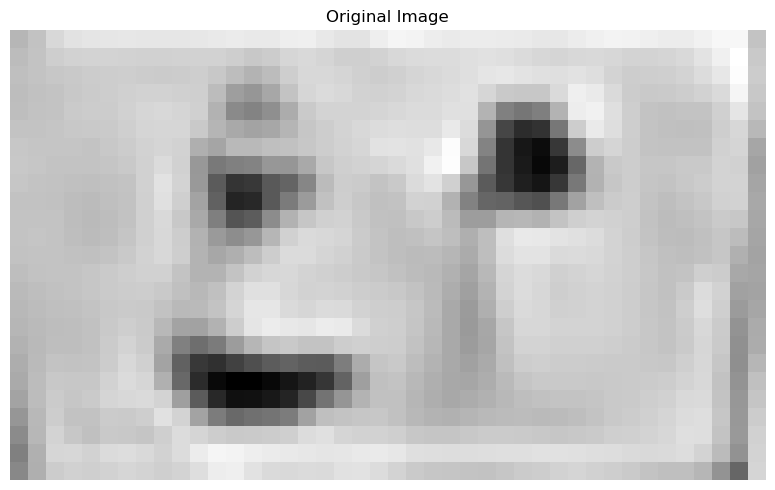

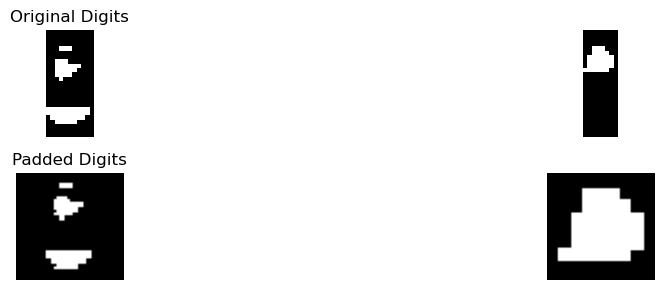

Best match: ع
Full comparison results: {'أ': 0.1764705882352941, 'ب': 0.2746068586585828, 'ج': 2.26257417218095, 'د': 3.4566347506110593, 'ر': 1.3196045231352578, 'س': 0.6875, 'ص': 0.46531084656084654, 'ط': 1.7349658931531302, 'ع': 3.761767613427331, 'ف': 1.7815228595682755, 'ق': 0.9904904285804115, 'ك': 1.6486742424242424, 'ل': 1.7778057275541796, 'م': 1.4055815508021392, 'ن': 2.838700980392157, 'ه': 1.2767473118279569, 'و': 1.3674904348712666, 'ي': 1.5902452619843923}
Confidence :  0.15256643140813586
Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.7004310344827587, 'ج': 1.21875, 'د': 1.59375, 'ر': 0.78125, 'س': 0.8833333333333333, 'ص': 0.53125, 'ط': 0.84375, 'ع': 0.21875, 'ف': 1.9375, 'ق': 0.875, 'ك': 0.71875, 'ل': 0.34375, 'م': 1.034274193548387, 'ن': 0.6875, 'ه': 4.854659277504105, 'و': 1.28125, 'ي': 0.84375}
Confidence :  1.4585796387520524
[['٩', '٥', '٣', '٢'], ['ع', 'ه']]
Tilt angle: -3.00 degrees


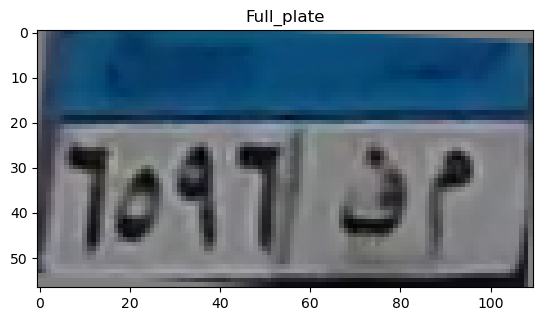

top
[0.32618441 0.23812946 0.22943353 0.25905123 0.34260647 0.43946353
 0.52260931 0.55365382 0.5822749  0.60473397 0.61268127 0.61864941
 0.62707333 0.62361088 0.62119775 0.62282392 0.61653451 0.58698706
 0.56640735 0.56897618 0.57103119 0.57437074 0.56934944 0.56707098
 0.57165952 0.5767828  0.58315233 0.58224571 0.58067972 0.58431015
 0.60097191 0.61260794 0.60953162 0.60026222 0.58772695 0.58449445
 0.58777778 0.5826583  0.56096126 0.55357488 0.54572485 0.54894789
 0.56296188 0.54409365 0.5347318  0.55270931 0.57045594 0.58253468
 0.59151752 0.59478039 0.59104418 0.58961189 0.58673368 0.58231015
 0.57640868]
[0.30970836 0.23943154 0.22624664 0.2668188  0.34973389 0.43852799
 0.47490762 0.48864591 0.54540128 0.57689246 0.5883621  0.57762748
 0.57040534 0.551697   0.53050876 0.52580443 0.52574604 0.50769784
 0.49587431 0.50127451 0.51083364 0.5187798  0.51393912 0.51024733
 0.51370934 0.51789898 0.52109246 0.51735259 0.5166608  0.52167498
 0.5440031  0.54574578 0.54266291 0.55190004 

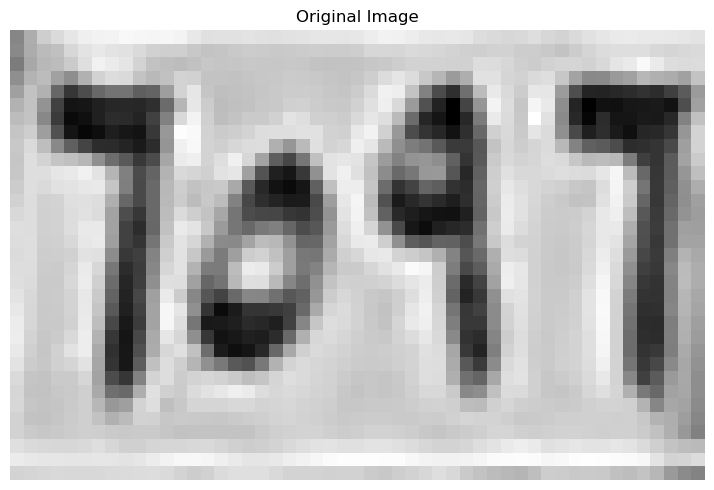

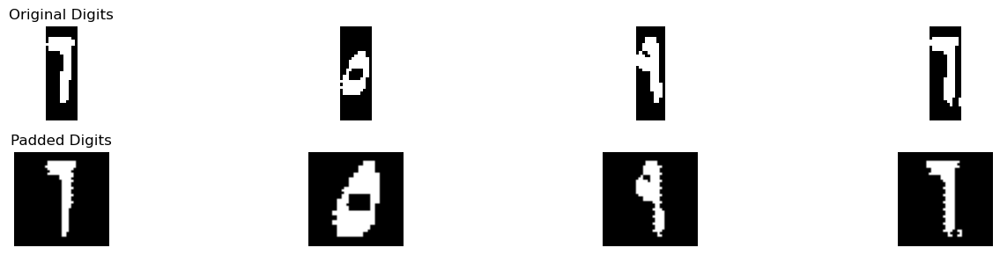

Best match: ٦
Full comparison results: {'١': 2.8341346153846154, '٢': 2.579326923076923, '٣': 1.2665441176470589, '٤': 0.29910714285714285, '٥': 1.5521800825593395, '٦': 3.637797619047619, '٧': 0.9393382352941178, '٨': 0.5472222222222222, '٩': 1.7436997234791354}
Confidence :  0.40183150183150174
Best match: ٥
Full comparison results: {'١': 0.5000000000000001, '٢': 0.6, '٣': 0.80625, '٤': 1.9375, '٥': 5.38422619047619, '٦': 1.19375, '٧': 1.0999999999999999, '٨': 1.23125, '٩': 0.44375}
Confidence :  1.7233630952380952
Best match: ٩
Full comparison results: {'١': 3.0312500000000004, '٢': 3.2644230769230766, '٣': 1.173955108359133, '٤': 1.7041208791208793, '٥': 2.0778739127229837, '٦': 2.0767857142857142, '٧': 0.7481617647058824, '٨': 2.713888888888889, '٩': 3.9985545500251383}
Confidence :  0.3670657365510308
Best match: ١
Full comparison results: {'١': 3.539583333333333, '٢': 2.0708333333333333, '٣': 1.1978521671826625, '٤': 0.65, '٥': 1.827873912722984, '٦': 3.4875000000000003, '٧': 0.

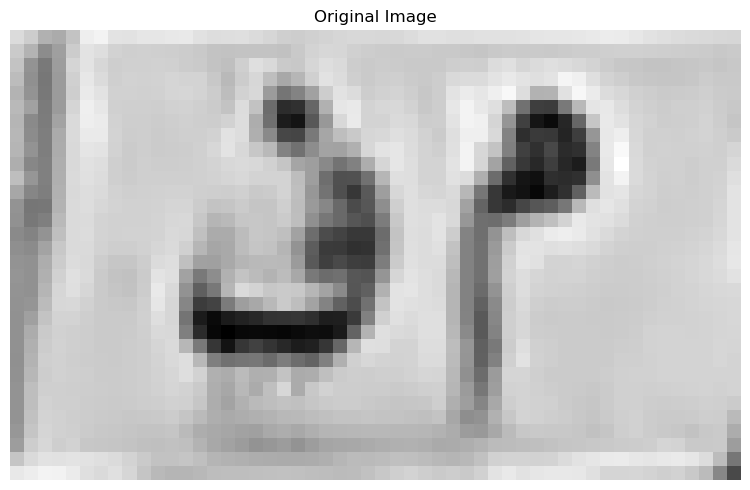

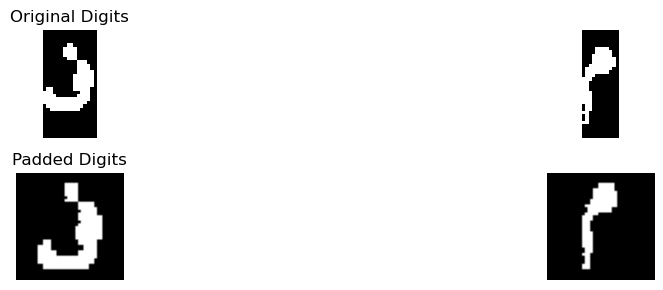

Best match: ف
Full comparison results: {'أ': 0.20833333333333331, 'ب': 0.24361737400530503, 'ج': 1.9953703703703702, 'د': 4.512453703703703, 'ر': 2.3116954022988505, 'س': 1.6071428571428572, 'ص': 1.4479166666666665, 'ط': 2.875, 'ع': 1.5, 'ف': 5.173445767195767, 'ق': 3.8356481481481484, 'ك': 2.5625, 'ل': 2.0833333333333335, 'م': 1.1979166666666667, 'ن': 3.6208333333333336, 'ه': 2.7631048387096775, 'و': 3.3472222222222223, 'ي': 2.7125000000000004}
Confidence :  0.33049603174603215
Best match: م
Full comparison results: {'أ': 0.10817307692307693, 'ب': 0.034482758620689655, 'ج': 0.8460576259489303, 'د': 1.6270128660182839, 'ر': 0.22023809523809523, 'س': 0.6116071428571428, 'ص': 0.22023809523809523, 'ط': 0.041666666666666664, 'ع': 0.7605263157894737, 'ف': 0.6871083959899749, 'ق': 0.2548611111111111, 'ك': 0.0, 'ل': 0.1801470588235294, 'م': 5.7397914585414584, 'ن': 0.5353571428571429, 'ه': 1.5862231182795699, 'و': 0.7014880952380953, 'ي': 0.0}
Confidence :  2.056389296261587
[['٦', '٥', '٩', 

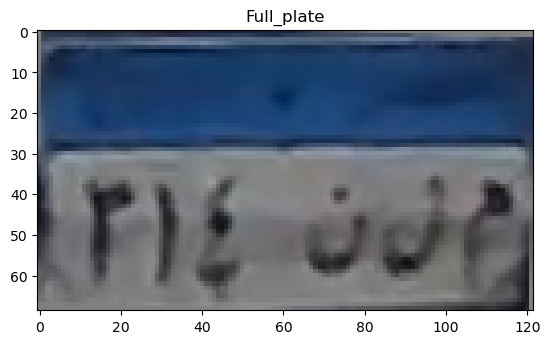

top
[0.43868321 0.34141877 0.25998093 0.20193881 0.20181569 0.20528093
 0.21380526 0.22519204 0.23184931 0.23649134 0.23812365 0.23431877
 0.23028029 0.22956749 0.23038147 0.23727797 0.25020257 0.23791523
 0.22400412 0.22465318 0.23033147 0.23454634 0.23622696 0.23658317
 0.23248942 0.22294682 0.21926743 0.21933424 0.22061982 0.22212432
 0.22107276 0.22238223 0.22454955 0.22587572 0.22596342 0.2264167
 0.22901819 0.23423678 0.23887661 0.24896392 0.25447863 0.26076539
 0.24595553 0.20626466 0.18111261 0.17881696 0.18003784 0.18089569
 0.18175353 0.18849373 0.19805255 0.20675353 0.21251333 0.2231751
 0.22697412 0.22783196 0.2263001  0.22212382 0.21796417 0.20401676
 0.19487417]
[0.42553166 0.33654129 0.24598091 0.21340481 0.17730588 0.15005706
 0.12653777 0.12336672 0.13705271 0.15579515 0.17383403 0.18663275
 0.1947746  0.19843115 0.20440848 0.20741103 0.21726211 0.20460892
 0.18297902 0.17124199 0.17646377 0.18866516 0.19915196 0.20865865
 0.20714304 0.20346657 0.20035689 0.19904566 0.

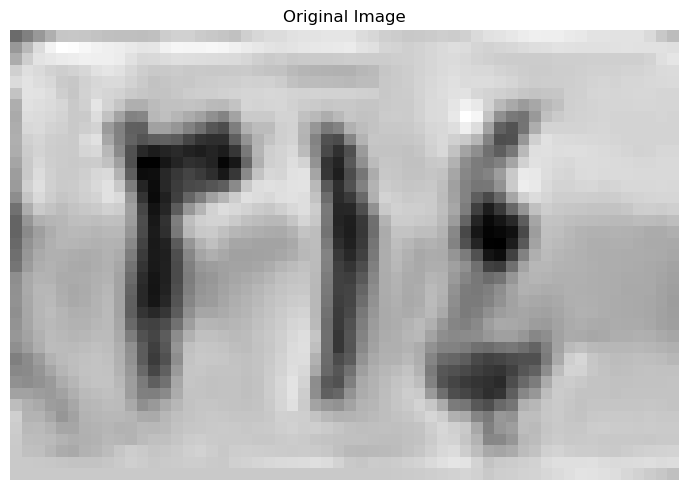

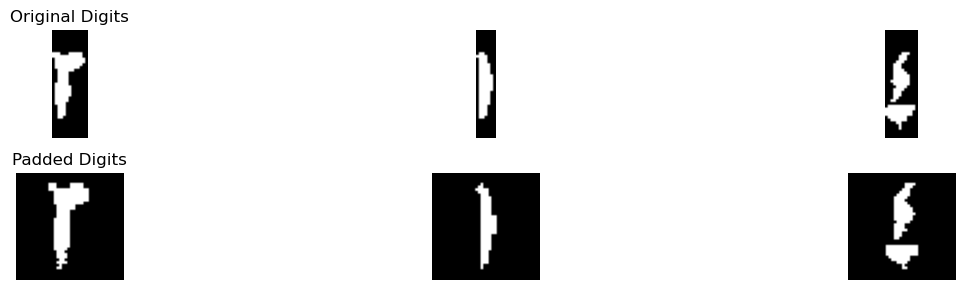

Best match: ٣
Full comparison results: {'١': 0.8499999999999999, '٢': 3.8416666666666663, '٣': 4.407314241486068, '٤': 2.3916666666666666, '٥': 2.4109031770602978, '٦': 1.7041666666666666, '٧': 1.7356617647058825, '٨': 1.0729166666666665, '٩': 1.1828022875816993}
Confidence :  0.2828237874097008
Best match: ١
Full comparison results: {'١': 3.64375, '٢': 2.296765734265734, '٣': 1.2927631578947367, '٤': 1.2380723443223443, '٥': 0.682736252395695, '٦': 0.42380952380952375, '٧': 1.4665441176470588, '٨': 2.670138888888889, '٩': 1.1565013826043238}
Confidence :  0.4868055555555555
Best match: ٤
Full comparison results: {'١': 2.8125, '٢': 1.7780448717948718, '٣': 1.52921826625387, '٤': 2.828413387687581, '٥': 2.0031650818222024, '٦': 0.35238095238095235, '٧': 0.5213235294117646, '٨': 2.0902777777777777, '٩': 1.132525766716943}
Confidence :  0.007956693843790497
In horizontal_segmentation_1
0 2
5 22
23 42
43 55
In refine_segmentation_1


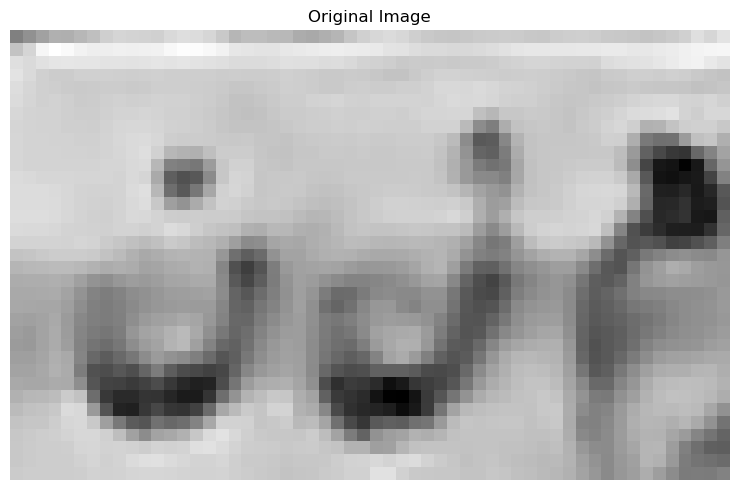

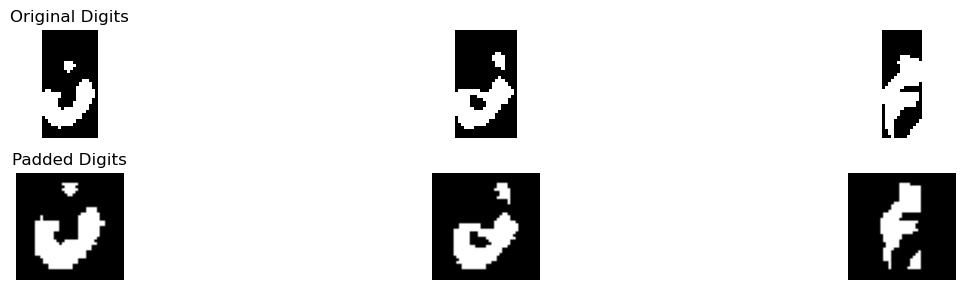

Best match: د
Full comparison results: {'أ': 0.5906379239040529, 'ب': 0.7572115384615384, 'ج': 1.6298967236467234, 'د': 3.7112713675213675, 'ر': 1.6475464190981433, 'س': 1.5178571428571428, 'ص': 0.5955128205128205, 'ط': 2.278727737779462, 'ع': 1.0155448717948719, 'ف': 3.3896081144065016, 'ق': 2.2177246639983013, 'ك': 0.49759615384615385, 'ل': 1.5036666962070186, 'م': 0.7283653846153846, 'ن': 3.1786703887510344, 'ه': 2.5, 'و': 2.4777364212848085, 'ي': 1.6357371794871793}
Confidence :  0.160831626557433
Best match: د
Full comparison results: {'أ': 0.2916666666666667, 'ب': 1.2133620689655173, 'ج': 1.5564142771804061, 'د': 2.9171296296296294, 'ر': 2.5972126436781604, 'س': 1.8883928571428572, 'ص': 1.1791666666666667, 'ط': 1.7101293103448278, 'ع': 0.9479166666666667, 'ف': 2.539021164021164, 'ق': 1.5954674432497011, 'ك': 0.90625, 'ل': 2.325431034482759, 'م': 0.3333333333333333, 'ن': 2.33375, 'ه': 1.3497983870967742, 'و': 2.0277777777777777, 'ي': 2.314516129032258}
Confidence :  0.159958492975

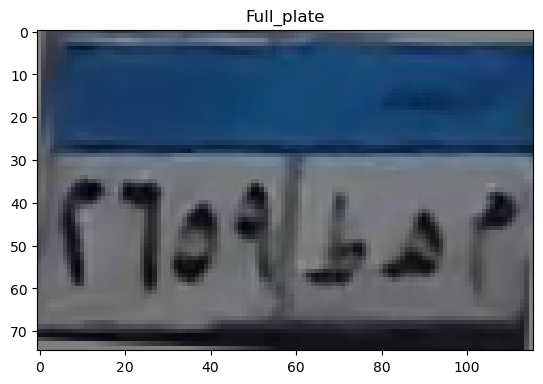

top
[0.35936191 0.37559529 0.33688206 0.32357936 0.36690911 0.41726273
 0.4618308  0.48183392 0.4800468  0.47670854 0.48352784 0.49734674
 0.51004824 0.5115386  0.50965271 0.50644051 0.50214615 0.49004565
 0.48469973 0.47991308 0.49203984 0.49881064 0.50254083 0.50097033
 0.49283059 0.4864546  0.48013394 0.47068273 0.46729496 0.46683612
 0.47244732 0.49380392 0.51345452 0.52065171 0.52203719 0.52537216
 0.52189301 0.51618071 0.50881413 0.50444044 0.50124037 0.50221387
 0.49990485 0.49677843 0.49737837 0.50245721 0.50670327 0.5132249
 0.52165015 0.5239556  0.52388772 0.52666199 0.52690999 0.52794197
 0.52061169 0.51951083 0.50004044 0.45900561]
[0.35876152 0.38020137 0.33738768 0.33118279 0.37323482 0.4207175
 0.45186025 0.46092915 0.45916918 0.46417569 0.48224147 0.49691059
 0.5018139  0.50249539 0.49582788 0.49029397 0.47989815 0.47315533
 0.46845964 0.46800471 0.47498413 0.47700466 0.48223208 0.48444302
 0.48193245 0.48214777 0.48510437 0.49317666 0.49634923 0.49259136
 0.48988624 0.

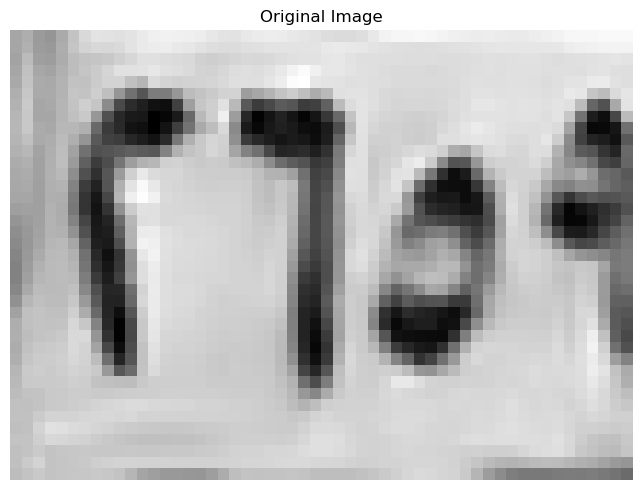

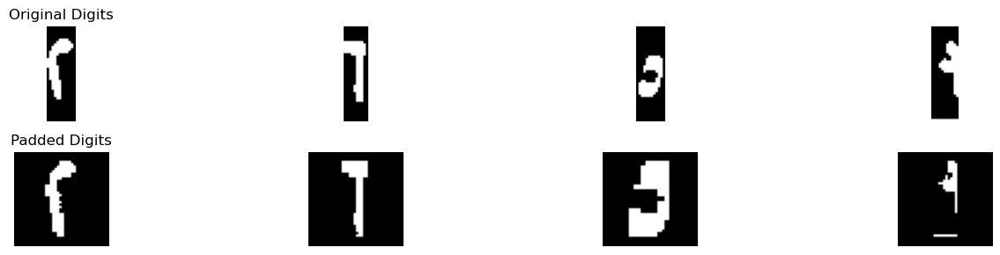

Best match: ٢
Full comparison results: {'١': 0.25, '٢': 5.38701923076923, '٣': 3.153154024767802, '٤': 3.1482829670329666, '٥': 2.2653739127229837, '٦': 0.6845238095238095, '٧': 1.5455882352941177, '٨': 0.5118055555555556, '٩': 1.0262380593262945}
Confidence :  1.116932603000714
Best match: ٢
Full comparison results: {'١': 3.0625000000000004, '٢': 3.9645250582750577, '٣': 1.5494388544891642, '٤': 0.39285714285714285, '٥': 1.6146800825593395, '٦': 3.1380952380952385, '٧': 1.0128676470588236, '٨': 0.5034722222222222, '٩': 1.754917672197084}
Confidence :  0.4132149100899096
Best match: ٥
Full comparison results: {'١': 1.1176470588235294, '٢': 1.8363970588235297, '٣': 1.707527089783282, '٤': 2.777573529411765, '٥': 7.064771303258145, '٦': 2.09375, '٧': 0.8058823529411765, '٨': 1.707312091503268, '٩': 0.9679330065359477}
Confidence :  2.14359888692319
Best match: ٥
Full comparison results: {'١': 0.4125, '٢': 0.24475524475524477, '٣': 0.656733746130031, '٤': 0.2610119047619047, '٥': 0.734031

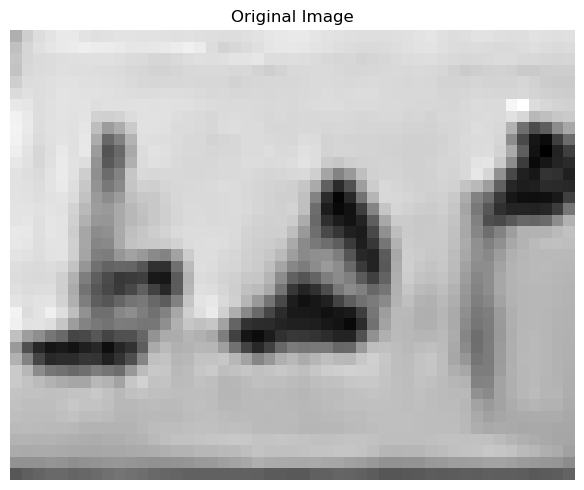

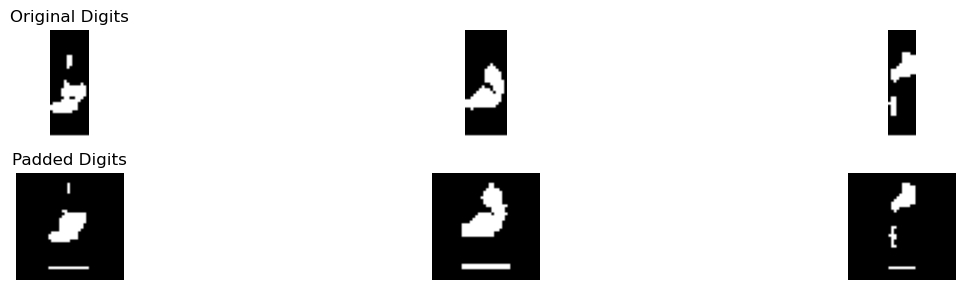

Best match: ص
Full comparison results: {'أ': 0.6, 'ب': 1.2800741723155515, 'ج': 0.2806806418219462, 'د': 0.03125, 'ر': 0.03225806451612903, 'س': 0.25, 'ص': 1.3530448717948715, 'ط': 0.4129439401178532, 'ع': 0.2275, 'ف': 0.37247492611456956, 'ق': 0.047619047619047616, 'ك': 0.8731060606060606, 'ل': 0.0, 'م': 0.0, 'ن': 0.06458333333333333, 'ه': 0.21875, 'و': 0.36428571428571427, 'ي': 0.42168317793317794}
Confidence :  0.03648534973966
Best match: و
Full comparison results: {'أ': 0.6979166666666667, 'ب': 1.623419364798675, 'ج': 1.2036749482401656, 'د': 1.077515537581327, 'ر': 0.125, 'س': 0.5401785714285714, 'ص': 0.9104166666666667, 'ط': 0.3559782608695652, 'ع': 0.23812724014336917, 'ف': 0.7556652046783625, 'ق': 0.781784321915901, 'ك': 1.168560606060606, 'ل': 0.2847222222222222, 'م': 1.308080808080808, 'ن': 0.24692460317460319, 'ه': 0.9145161290322581, 'و': 1.6676747311827955, 'ي': 0.47711352657004835}
Confidence :  0.022127683192060266
Best match: م
Full comparison results: {'أ': 0.09375, '

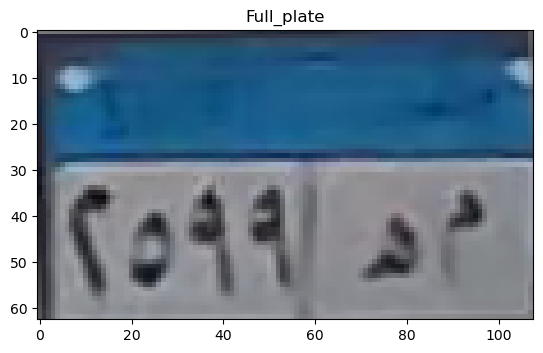

top
[0.14743529 0.20887745 0.28129792 0.30173735 0.32485324 0.35469556
 0.36195277 0.36613804 0.37207402 0.37051032 0.36625865 0.36269412
 0.36148625 0.36080556 0.36316392 0.36340946 0.36566439 0.36680113
 0.36680794 0.36500975 0.35885627 0.3585174  0.35292838 0.34818037
 0.34660787 0.34179387 0.34521294 0.35417083 0.36840794 0.37210632
 0.37206538 0.37448222 0.37008515 0.36475366 0.35640431 0.35637567
 0.35597627 0.35248256 0.35069529 0.35130944 0.35487686 0.35575082
 0.3627719  0.37298103 0.3761602  0.37297392 0.37010934 0.3691412
 0.36423388 0.35914194 0.37715456 0.38749417 0.39299161 0.38557263]
[0.145651   0.20681552 0.28505588 0.3057416  0.3142186  0.34436972
 0.34890963 0.36072233 0.37004784 0.36728047 0.36075388 0.34854622
 0.33573725 0.331955   0.32502134 0.32393051 0.31957978 0.32345462
 0.32189775 0.31647596 0.31458341 0.31272281 0.31784487 0.31591419
 0.31432371 0.31043422 0.31099245 0.31123652 0.31979239 0.32497106
 0.32176292 0.31676427 0.30512105 0.30040873 0.29924344 0.

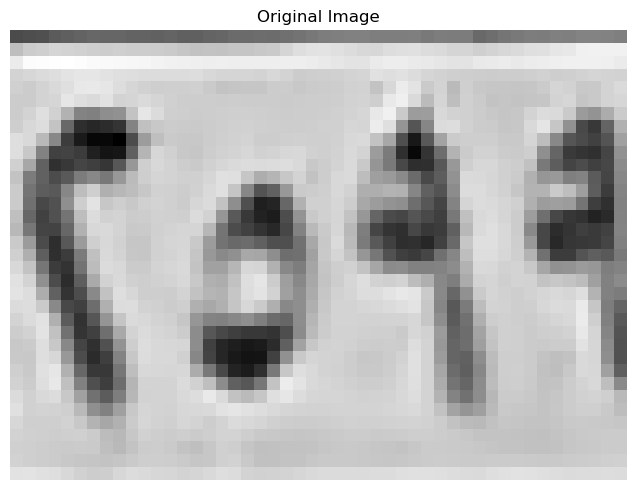

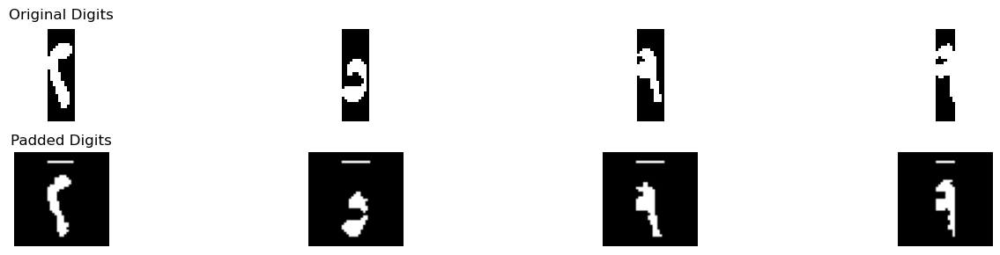

Best match: ٢
Full comparison results: {'١': 0.5, '٢': 2.5183566433566433, '٣': 1.765673374613003, '٤': 1.2734890109890111, '٥': 0.9896800825593395, '٦': 0.0625, '٧': 1.5694852941176471, '٨': 1.2335125448028674, '٩': 1.2434326294620413}
Confidence :  0.3763416343718201
Best match: ٤
Full comparison results: {'١': 1.4583333333333333, '٢': 0.25, '٣': 0.11513157894736842, '٤': 1.808793424317618, '٥': 0.3630952380952381, '٦': 0.29910714285714285, '٧': 1.3544117647058824, '٨': 0.7347222222222222, '٩': 0.8474736048265461}
Confidence :  0.17523004549214238
Best match: ٢
Full comparison results: {'١': 1.4166666666666667, '٢': 3.15224358974359, '٣': 1.09375, '٤': 1.3630723443223443, '٥': 0.3119563614919652, '٦': 0.39285714285714285, '٧': 1.7433823529411765, '٨': 1.570766129032258, '٩': 1.0424522373051783}
Confidence :  0.7044306184012067
Best match: ١
Full comparison results: {'١': 3.775, '٢': 0.3269230769230769, '٣': 0.28125, '٤': 0.09375, '٥': 0.3958379404393336, '٦': 0.799404761904762, '٧': 

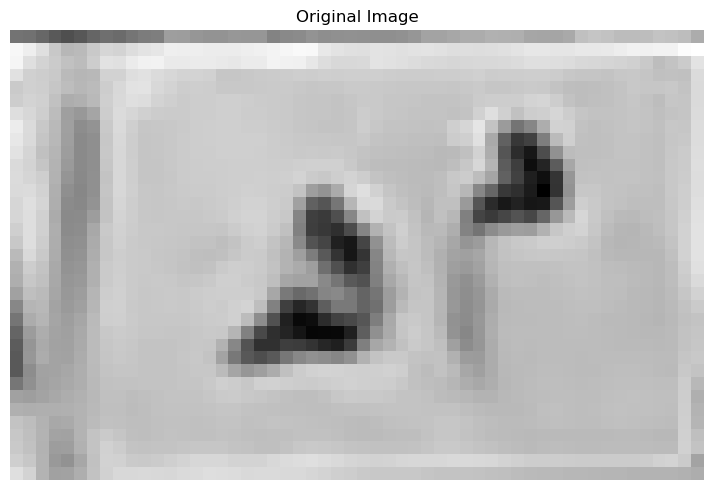

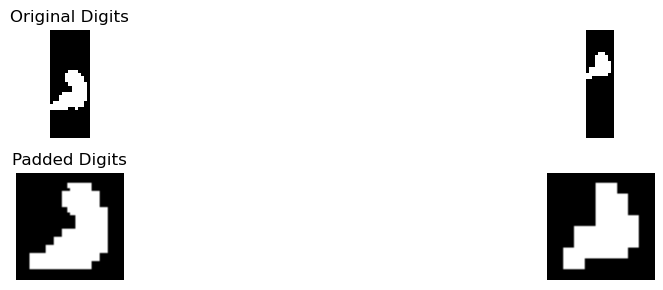

Best match: ه
Full comparison results: {'أ': 0.5484913793103449, 'ب': 0.0, 'ج': 1.8448275862068964, 'د': 3.5452586206896552, 'ر': 1.550646551724138, 'س': 2.341594827586207, 'ص': 1.3205459770114942, 'ط': 2.226293103448276, 'ع': 0.3566810344827586, 'ف': 3.7273706896551726, 'ق': 1.1400862068965516, 'ك': 1.8383620689655173, 'ل': 0.7586206896551724, 'م': 0.49461206896551724, 'ن': 1.1810344827586208, 'ه': 5.78125, 'و': 2.2047413793103448, 'ي': 1.7083333333333335}
Confidence :  1.0269396551724137
Best match: ه
Full comparison results: {'أ': 0.4955357142857142, 'ب': 0.6696428571428572, 'ج': 0.7142857142857143, 'د': 2.638392857142857, 'ر': 1.0149322660098523, 'س': 1.875, 'ص': 1.3785714285714286, 'ط': 0.8705357142857143, 'ع': 0.3125, 'ف': 2.3214285714285716, 'ق': 1.1875, 'ك': 0.7678571428571428, 'ل': 0.6696428571428571, 'م': 1.2098214285714284, 'ن': 0.8705357142857143, 'ه': 5.15625, 'و': 2.107142857142857, 'ي': 1.1282738095238094}
Confidence :  1.2589285714285714
[['٢', '٤', '٢', '١'], ['ه', 'ه'

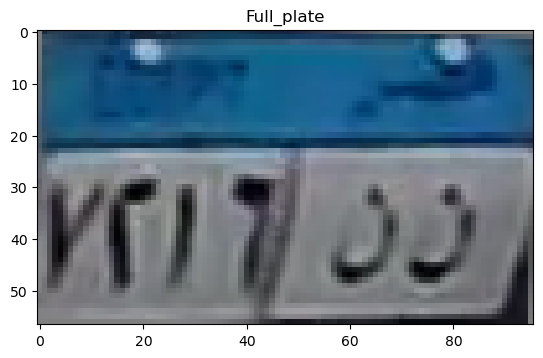

top
[0.33294331 0.23420488 0.18855502 0.17924475 0.18141382 0.18101647
 0.17972205 0.17615415 0.18688394 0.18951336 0.18581028 0.17320592
 0.1674814  0.16281288 0.16251335 0.1650656  0.16744765 0.15847093
 0.15022037 0.14429879 0.14113475 0.14472897 0.15334693 0.16421956
 0.16712334 0.16836419 0.16521411 0.15930384 0.14353934 0.13935153
 0.14878384 0.1672956  0.21176066 0.22481485 0.23264547 0.23583207
 0.24963094 0.24962235 0.24763509 0.22828851 0.21406467 0.20531902
 0.20742326 0.21551937 0.20028136 0.17076198 0.16824575 0.15272337]
[0.35782111 0.27604461 0.26145758 0.29306918 0.37080395 0.37574245
 0.38273975 0.38614895 0.40913905 0.42586958 0.43663722 0.43444758
 0.4365123  0.44296873 0.46358217 0.49658585 0.53900618 0.55444866
 0.56317017 0.57009073 0.56370366 0.55179725 0.53987904 0.53955502
 0.54239046 0.53970998 0.52826232 0.50834838 0.47731438 0.45400708
 0.44675614 0.44751358 0.47199852 0.47859496 0.48904412 0.49608536
 0.52391083 0.53994588 0.54713487 0.54613944 0.54415491 0

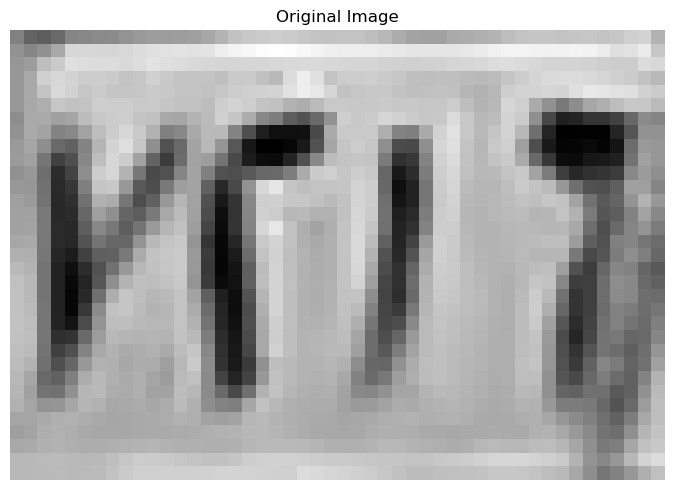

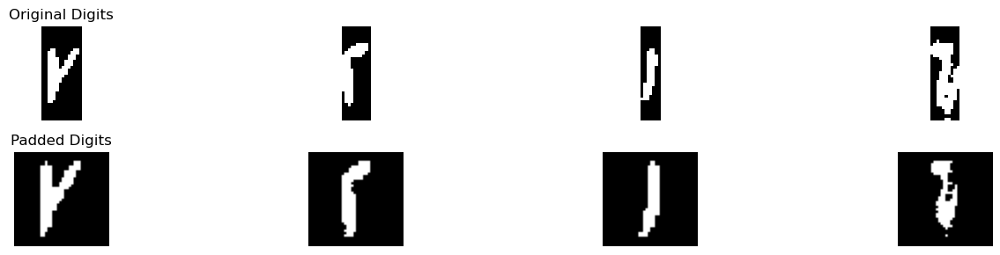

Best match: ٣
Full comparison results: {'١': 0.4117647058823529, '٢': 1.1764705882352942, '٣': 2.1655379256965945, '٤': 0.6654411764705883, '٥': 1.1738122880731239, '٦': 0.4529411764705883, '٧': 2.0268382352941177, '٨': 1.1852941176470588, '٩': 1.7851307189542487}
Confidence :  0.06934984520123844
Best match: ٢
Full comparison results: {'١': 0.125, '٢': 4.529647435897436, '٣': 3.3994775541795663, '٤': 2.7265796703296705, '٥': 2.1503989753796255, '٦': 0.9217261904761904, '٧': 1.5941176470588236, '٨': 0.50625, '٩': 0.47916666666666663}
Confidence :  0.5650849408589349
Best match: ١
Full comparison results: {'١': 3.1319444444444446, '٢': 1.3488490675990676, '٣': 0.6953366873065016, '٤': 0.7641254578754579, '٥': 1.6709282397169392, '٦': 0.7645833333333333, '٧': 1.4441176470588237, '٨': 1.4881944444444444, '٩': 1.0877953745600804}
Confidence :  0.7305081023637527
Best match: ٢
Full comparison results: {'١': 2.2244318181818183, '٢': 2.7133595571095572, '٣': 1.2068498452012384, '٤': 0.9880723

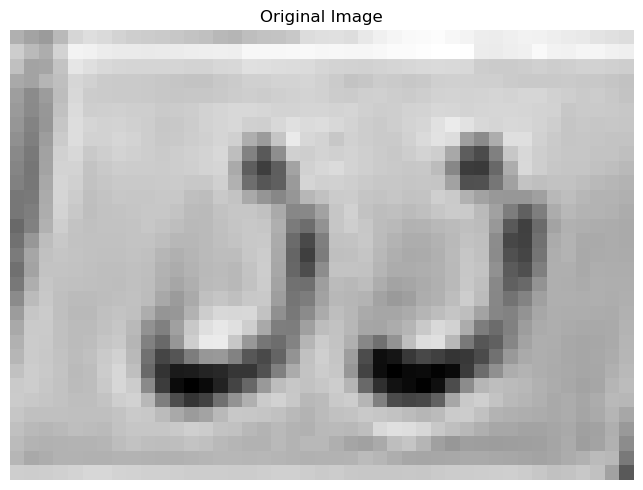

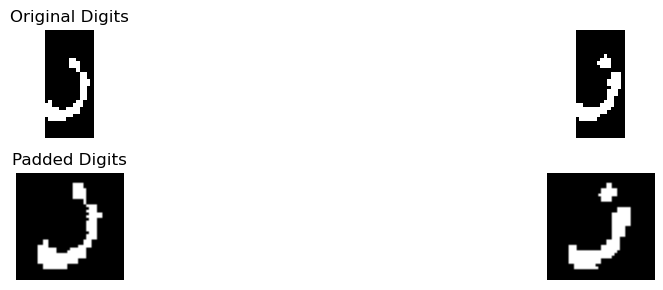

Best match: ر
Full comparison results: {'أ': 0.07291666666666666, 'ب': 0.15948275862068967, 'ج': 1.3576388888888888, 'د': 3.5528240740740737, 'ر': 3.836508620689655, 'س': 2.2544642857142856, 'ص': 1.6479166666666667, 'ط': 2.0, 'ع': 0.9166666666666666, 'ف': 2.907076719576719, 'ق': 3.3854166666666665, 'ك': 1.8333333333333335, 'ل': 3.010416666666666, 'م': 0.3541666666666667, 'ن': 3.391666666666667, 'ه': 1.5080645161290323, 'و': 3.387731481481481, 'ي': 2.651923076923077}
Confidence :  0.14184227330779065
Best match: د
Full comparison results: {'أ': 0.03225806451612903, 'ب': 0.3958885941644562, 'ج': 0.7898047504025765, 'د': 3.7570813204508853, 'ر': 2.9246926536731634, 'س': 2.763392857142857, 'ص': 1.9496376811594203, 'ط': 1.8169384057971016, 'ع': 0.4538043478260869, 'ف': 3.7180464187389153, 'ق': 3.0221845618409433, 'ك': 1.3546195652173914, 'ل': 2.526937237026648, 'م': 0.6657608695652173, 'ن': 2.4138148667601684, 'ه': 2.6058467741935485, 'و': 3.1746175523349436, 'ي': 2.3192586399108137}
Confid

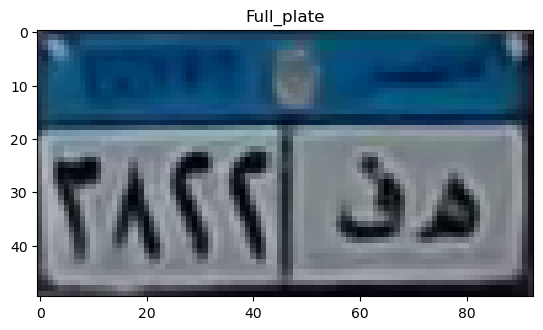

top
[0.45471797 0.66564619 0.67608725 0.64397069 0.62336407 0.61914072
 0.61021061 0.60363709 0.60563128 0.60615406 0.61085163 0.62002855
 0.64357759 0.6320155  0.66265417 0.66318159 0.66032249 0.65441363
 0.64987955 0.64783971 0.64474882 0.64290205 0.63549543 0.63452294
 0.6255312  0.62215839 0.62039675 0.62243413 0.62078814 0.62512791
 0.62565257 0.62326287 0.62842094 0.6328637  0.63570931 0.62983314
 0.6194814  0.60716287 0.58600803 0.58338324 0.60983114 0.60639706
 0.61672352 0.5889241  0.59177142 0.46370627]
[0.53030663 0.69286132 0.63664392 0.57100554 0.54401997 0.55333605
 0.54357865 0.54337409 0.54971327 0.55032722 0.5485412  0.55109418
 0.59600914 0.5692052  0.56966463 0.56472499 0.56835748 0.57602755
 0.56635892 0.55939083 0.5569137  0.55330149 0.54898813 0.54930461
 0.5488665  0.55027799 0.56860673 0.59374933 0.604358   0.59624396
 0.5909249  0.57362691 0.55473658 0.51473017 0.52090122 0.53152971
 0.54191716 0.56337354 0.58976701 0.61061691 0.61298977 0.61565728
 0.62388037 

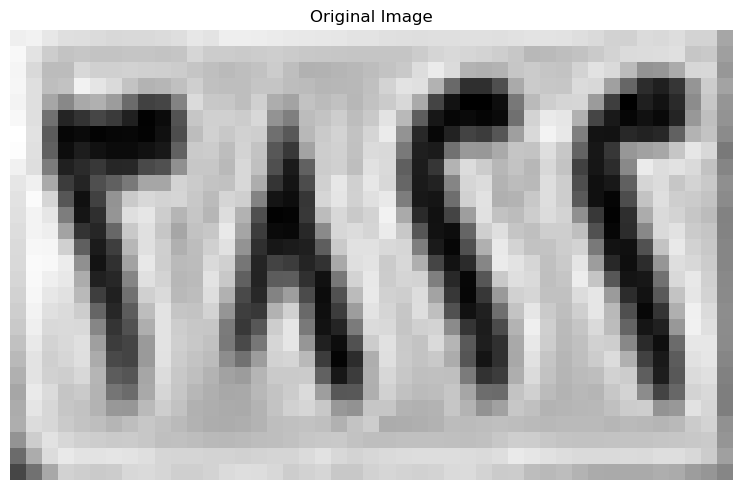

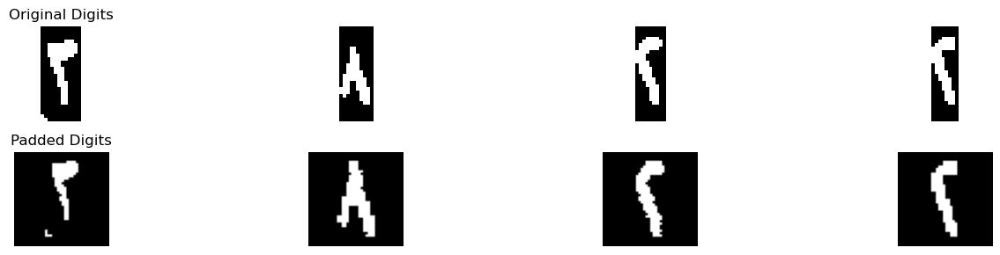

Best match: ١
Full comparison results: {'١': 3.6964285714285716, '٢': 2.035714285714286, '٣': 2.299922600619195, '٤': 0.749702380952381, '٥': 1.7446926138876604, '٦': 2.4005952380952382, '٧': 0.2977941176470588, '٨': 1.7555555555555555, '٩': 1.9021358543417368}
Confidence :  0.6479166666666667
Best match: ٨
Full comparison results: {'١': 3.5, '٢': 1.1875, '٣': 0.9880998452012384, '٤': 1.875, '٥': 0.776486252395695, '٦': 1.15, '٧': 0.949264705882353, '٨': 6.475, '٩': 3.6419526143790852}
Confidence :  1.4165236928104572
Best match: ٢
Full comparison results: {'١': 2.135416666666667, '٢': 6.657051282051282, '٣': 3.121420278637771, '٤': 3.1152701465201464, '٥': 2.135361381394663, '٦': 1.2211309523809524, '٧': 1.9933823529411765, '٨': 0.9229166666666666, '٩': 2.2561117395676216}
Confidence :  1.7678155017067554
Best match: ٢
Full comparison results: {'١': 1.7897727272727273, '٢': 6.778481934731934, '٣': 3.203657120743034, '٤': 3.075091575091575, '٥': 2.066360754828247, '٦': 0.81488095238095

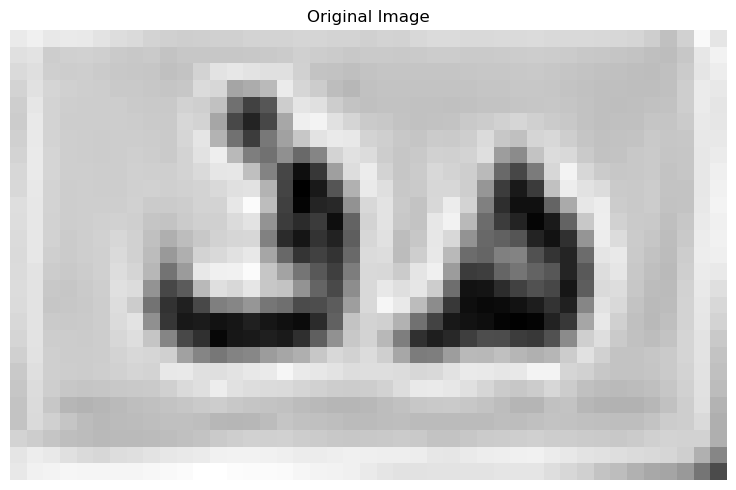

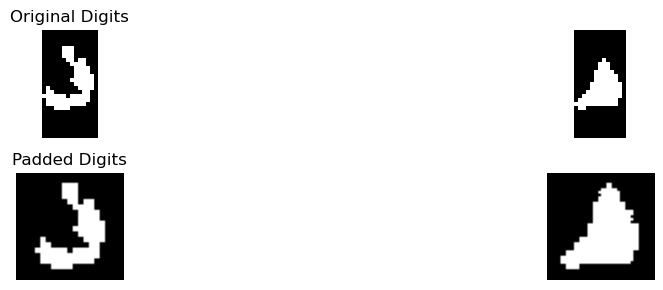

Best match: ف
Full comparison results: {'أ': 0.3798076923076923, 'ب': 0.06573275862068965, 'ج': 2.1112001424501425, 'د': 5.119123931623931, 'ر': 1.8751657824933687, 'س': 1.6071428571428572, 'ص': 1.516025641025641, 'ط': 2.6225961538461537, 'ع': 1.3004807692307692, 'ف': 5.302108770858771, 'ق': 3.1969373219373223, 'ك': 2.105769230769231, 'ل': 1.7836538461538463, 'م': 1.2403846153846154, 'ن': 3.5144230769230766, 'ه': 4.15625, 'و': 3.1164529914529915, 'ي': 2.6863782051282055}
Confidence :  0.09149241961742005
Best match: ه
Full comparison results: {'أ': 0.5140086206896551, 'ب': 0.38146551724137934, 'ج': 0.939655172413793, 'د': 3.012931034482759, 'ر': 0.9709051724137931, 'س': 1.9288793103448276, 'ص': 1.8279454022988506, 'ط': 1.1896551724137931, 'ع': 0.33836206896551724, 'ف': 2.9321120689655173, 'ق': 1.1907327586206897, 'ك': 1.271551724137931, 'ل': 0.6206896551724138, 'م': 1.3351293103448276, 'ن': 1.1594827586206897, 'ه': 5.65625, 'و': 1.9321120689655171, 'ي': 1.3872844827586206}
Confidence :

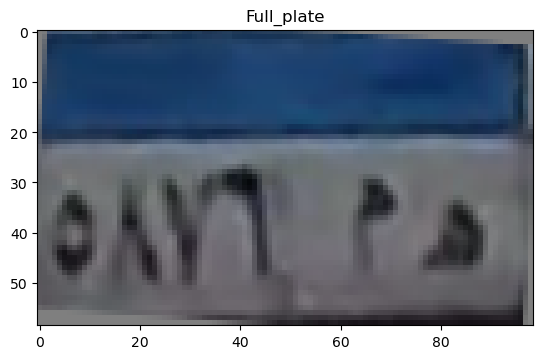

top
[0.40599555 0.3522265  0.37371935 0.41871284 0.44021385 0.44544016
 0.45431647 0.46509121 0.46999706 0.46317456 0.45441078 0.44951684
 0.46042456 0.47282271 0.47780537 0.48300645 0.48503823 0.48154604
 0.48532075 0.49631545 0.51823451 0.5191304  0.50181569 0.49575235
 0.49571353 0.50206015 0.50464353 0.5061075  0.50910627 0.50427567
 0.49698557 0.49163116 0.48354115 0.48360256 0.49688948 0.50277162
 0.49212717 0.48429139 0.48331818 0.49314891 0.50031848 0.4987152
 0.49301088 0.4893312  0.49186831 0.50079741 0.50412429 0.50487207
 0.50960585]
[0.42185813 0.41311485 0.44566331 0.47459191 0.48462084 0.48309853
 0.48593824 0.4864699  0.48484359 0.48132899 0.47567935 0.47194676
 0.47682728 0.48328642 0.48688285 0.49357761 0.49747659 0.50299503
 0.51240502 0.52277168 0.52206146 0.5086775  0.49618595 0.4850805
 0.47532512 0.4771317  0.48114451 0.48729127 0.49618577 0.50080401
 0.50006041 0.50052134 0.49492855 0.49047297 0.49457297 0.49666142
 0.49698489 0.4925736  0.48705775 0.48948954 0.

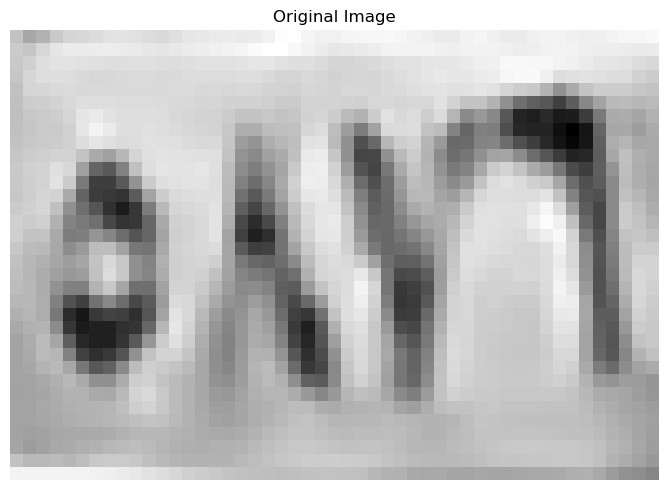

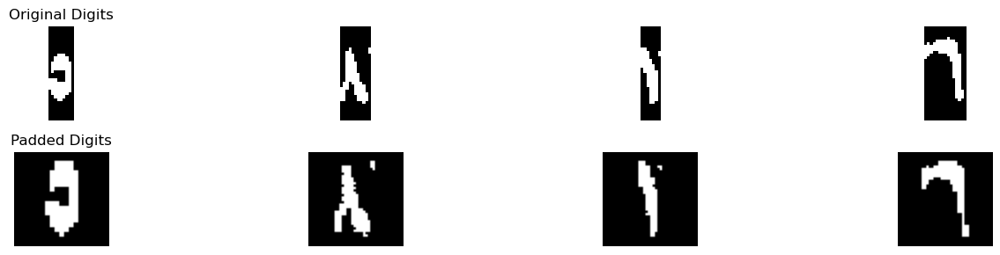

Best match: ٥
Full comparison results: {'١': 1.0714285714285714, '٢': 2.883928571428572, '٣': 1.8343653250773995, '٤': 2.092261904761905, '٥': 4.829159295297067, '٦': 2.270238095238095, '٧': 1.3433823529411764, '٨': 1.1347222222222222, '٩': 0.7976190476190476}
Confidence :  0.9726153619342472
Best match: ٢
Full comparison results: {'١': 0.7058823529411765, '٢': 3.505514705882353, '٣': 2.5878482972136223, '٤': 2.5955882352941178, '٥': 0.9327362523956951, '٦': 0.1488970588235294, '٧': 1.8827205882352942, '٨': 1.8529411764705883, '٩': 1.5861928104575163}
Confidence :  0.45496323529411753
Best match: ١
Full comparison results: {'١': 5.00625, '٢': 3.5942599067599073, '٣': 2.0193498452012384, '٤': 1.4077152014652015, '٥': 0.7767949284977148, '٦': 1.1851190476190476, '٧': 1.5279411764705884, '٨': 1.9006944444444442, '٩': 2.0290661136249373}
Confidence :  0.7059950466200462
Best match: ٦
Full comparison results: {'١': 0.7, '٢': 0.7375, '٣': 2.46875, '٤': 0.0, '٥': 2.2955357142857142, '٦': 3.46

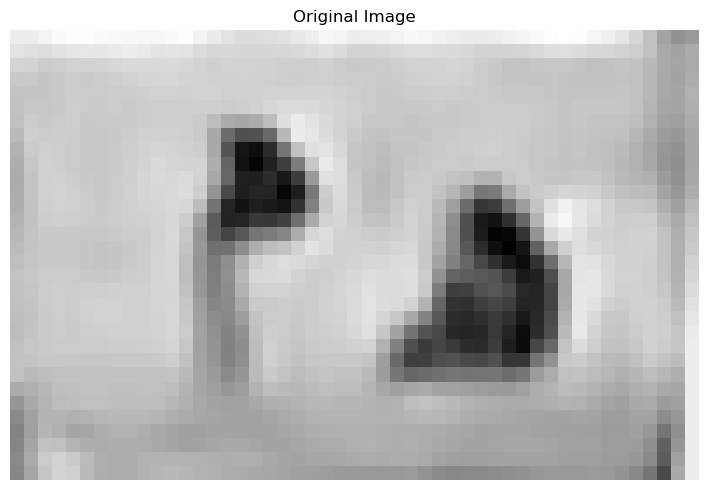

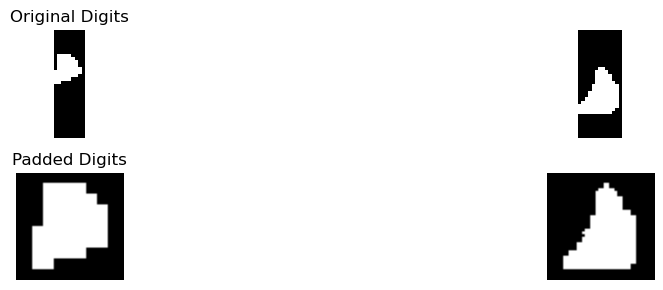

Best match: ه
Full comparison results: {'أ': 0.4285714285714285, 'ب': 0.625, 'ج': 1.799107142857143, 'د': 1.5714285714285714, 'ر': 0.9090209359605911, 'س': 0.9910714285714286, 'ص': 1.0011904761904762, 'ط': 0.5848214285714285, 'ع': 0.2767857142857143, 'ف': 1.6607142857142858, 'ق': 0.8705357142857142, 'ك': 0.7321428571428572, 'ل': 0.4196428571428571, 'م': 0.75, 'ن': 0.7276785714285714, 'ه': 3.0, 'و': 1.4910714285714286, 'ي': 0.8627976190476191}
Confidence :  0.6004464285714285
Best match: ه
Full comparison results: {'أ': 0.5127314814814814, 'ب': 0.47198275862068967, 'ج': 1.306712962962963, 'د': 3.5949074074074074, 'ر': 0.8770753512132822, 'س': 1.7767857142857144, 'ص': 1.4692129629629629, 'ط': 1.5509259259259258, 'ع': 0.24768518518518517, 'ف': 3.21031746031746, 'ق': 1.1134259259259258, 'ك': 1.7164351851851851, 'ل': 0.6666666666666666, 'م': 1.2962962962962963, 'ن': 1.0451388888888888, 'ه': 5.21875, 'و': 2.0266203703703702, 'ي': 1.2986111111111112}
Confidence :  0.8119212962962963
[['٥', '٢

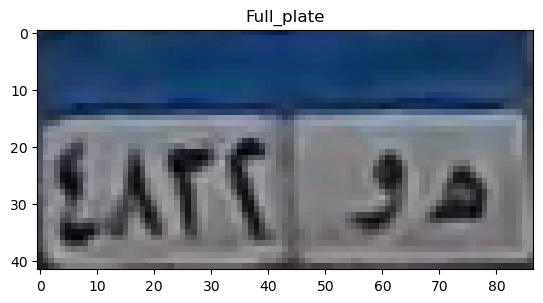

top
[0.25868275 0.28613373 0.33372824 0.39255176 0.51804196 0.56510078
 0.6051349  0.61689961 0.61438471 0.59869843 0.59172627 0.59172627
 0.59566275 0.60350588 0.61305333 0.62089647 0.62649961 0.62649961
 0.63266118 0.62873961 0.62817412 0.62817412 0.62392431 0.62784588
 0.62335098 0.61550784 0.60260431 0.59476118 0.59083961 0.5790749
 0.59868275 0.63005529 0.63789843 0.63005529 0.62529255 0.62137098
 0.60846745 0.59278118 0.60204588 0.59028118 0.53932353 0.49226471
 0.43736275]
[0.2849651  0.42222    0.51266902 0.54012    0.55663961 0.56840431
 0.57509373 0.57509373 0.5784498  0.58237137 0.58212627 0.57036157
 0.55804627 0.54236    0.53595333 0.53595333 0.54352863 0.55137176
 0.56032392 0.56032392 0.55555412 0.54771098 0.53648196 0.53648196
 0.53617647 0.5322549  0.52719451 0.52719451 0.51737922 0.51345765
 0.51599529 0.53168157 0.53981451 0.54765765 0.55328353 0.54936196
 0.56504824 0.58857765 0.57345686 0.54600588 0.52191098 0.49053843
 0.44123255]
[0.30065137 0.52418078 0.56757098

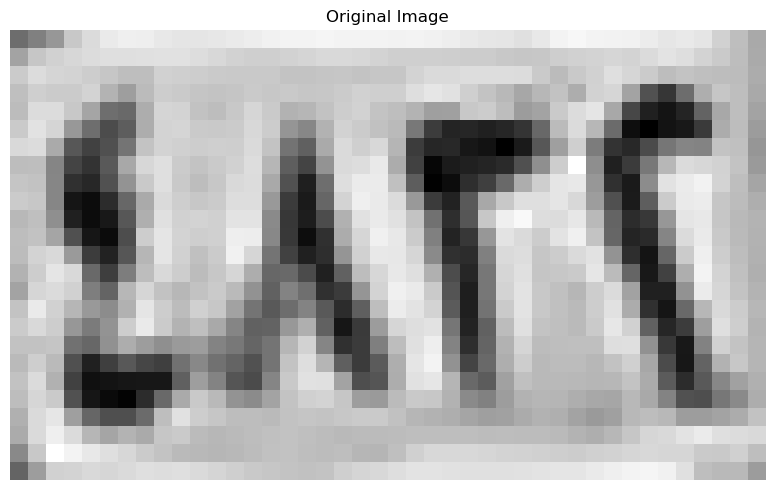

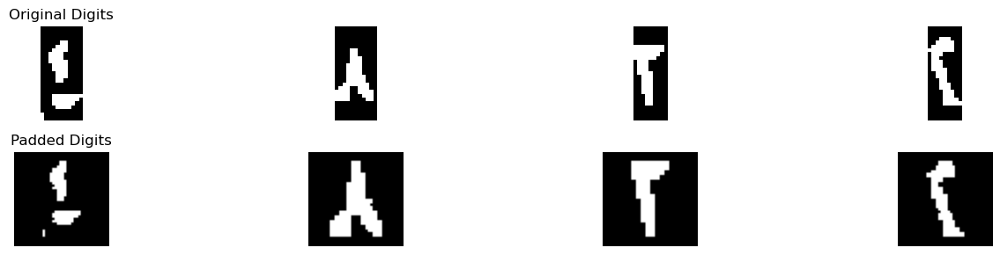

Best match: ١
Full comparison results: {'١': 3.9330357142857144, '٢': 1.5854166666666667, '٣': 1.2578366873065017, '٤': 2.0, '٥': 1.5678534571723426, '٦': 0.2125, '٧': 0.15625, '٨': 2.125694444444444, '٩': 1.8502872654438118}
Confidence :  0.9036706349206352
Best match: ٨
Full comparison results: {'١': 1.9602272727272727, '٢': 0.6846590909090909, '٣': 0.6818181818181818, '٤': 1.6051136363636365, '٥': 2.4488636363636367, '٦': 0.7755681818181819, '٧': 0.5511363636363635, '٨': 4.7727272727272725, '٩': 2.3380681818181817}
Confidence :  1.161931818181818
Best match: ٣
Full comparison results: {'١': 0.5625, '٢': 5.1875, '٣': 5.786474458204335, '٤': 3.1875, '٥': 2.0631496019460416, '٦': 1.49375, '٧': 3.0849264705882353, '٨': 0.7868055555555555, '٩': 1.2589869281045754}
Confidence :  0.2994872291021675
Best match: ٢
Full comparison results: {'١': 0.5625, '٢': 5.78125, '٣': 3.3635835913312695, '٤': 2.84375, '٥': 2.786520529264337, '٦': 0.725, '٧': 2.169485294117647, '٨': 0.5625, '٩': 2.02961601

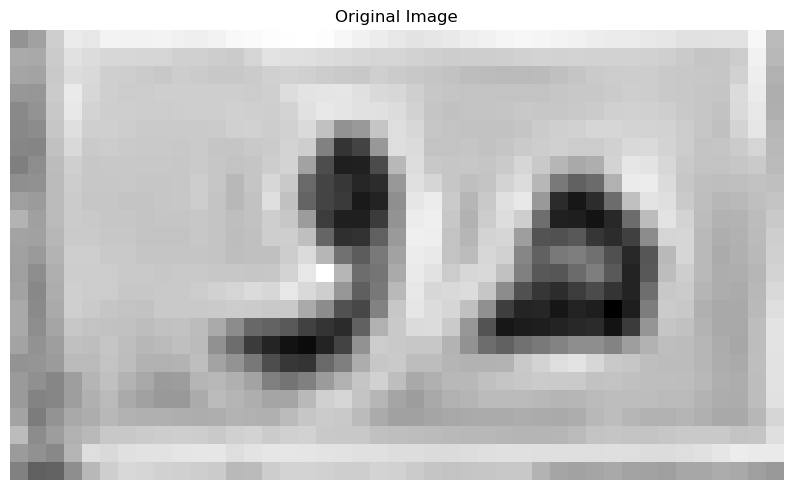

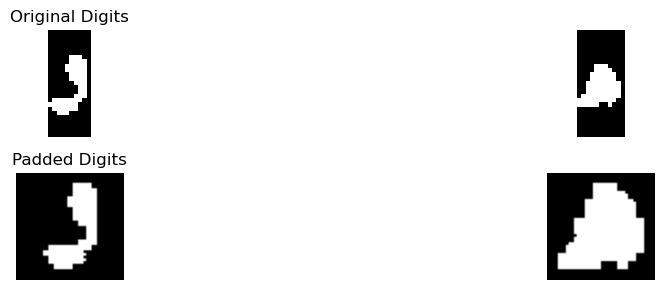

Best match: د
Full comparison results: {'أ': 0.23125, 'ب': 0.25969827586206895, 'ج': 1.2476046698872785, 'د': 4.671578282828283, 'ر': 3.0156265617191407, 'س': 2.227678571428571, 'ص': 1.3976190476190475, 'ط': 1.472743741765481, 'ع': 1.11875, 'ف': 3.372321428571429, 'ق': 2.329728835978836, 'ك': 1.4261363636363635, 'ل': 2.6374999999999997, 'م': 0.7818181818181819, 'ن': 2.8588095238095237, 'ه': 2.8423387096774198, 'و': 3.8410052910052914, 'ي': 2.5215928093645483}
Confidence :  0.4152864959114957
Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.65625, 'ج': 0.875, 'د': 1.9375, 'ر': 0.6875, 'س': 1.21875, 'ص': 0.65625, 'ط': 0.625, 'ع': 0.34375, 'ف': 1.96875, 'ق': 0.625, 'ك': 0.84375, 'ل': 0.40625, 'م': 1.15625, 'ن': 0.59375, 'ه': 4.3125, 'و': 1.5, 'ي': 0.59375}
Confidence :  1.171875
[['١', '٨', '٣', '٢'], ['د', 'ه']]
Tilt angle: -4.50 degrees


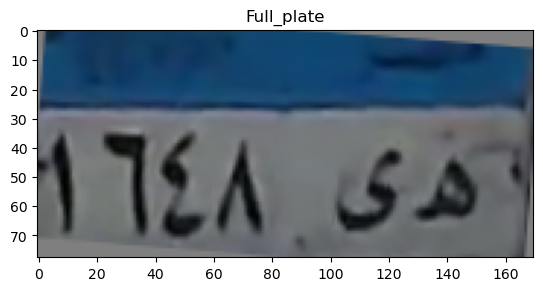

top
[0.47407187 0.47404431 0.47393766 0.46327625 0.45743743 0.45441989
 0.45117004 0.44482484 0.43746303 0.43370521 0.43597823 0.44052304
 0.44535893 0.44492789 0.4445397  0.44576431 0.44823101 0.45378592
 0.45943267 0.45931942 0.45789539 0.45836767 0.46111353 0.459797
 0.45554596 0.45646263 0.45684686 0.45816473 0.46342944 0.46757477
 0.46798167 0.4715293  0.47411548 0.4753563  0.4790143  0.48190621
 0.47626521 0.47159977 0.47160136 0.47294221 0.47264047 0.4723471
 0.4726104  0.47330225 0.47693382 0.47894762 0.47472842 0.46840078
 0.46933049 0.47726675 0.48033458 0.48121116 0.48549677 0.49603559
 0.50668829 0.50411475 0.49617324 0.48665054 0.47636129 0.47253211
 0.47232235 0.47464686 0.47470725 0.47051804 0.4664487  0.46484837
 0.46545392 0.46585762 0.46758909 0.47338495 0.47885962 0.47667208
 0.4745209  0.47450702 0.47748509 0.47667982 0.47583219 0.47654933
 0.47692803 0.47564224 0.47525    0.47173771 0.46353797 0.45881206
 0.46146562]
[0.4663847  0.47812945 0.46963566 0.45466198 0.4

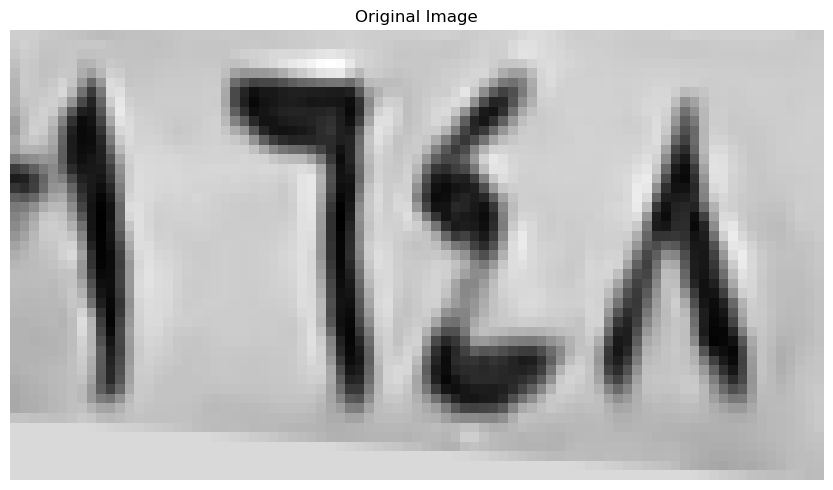

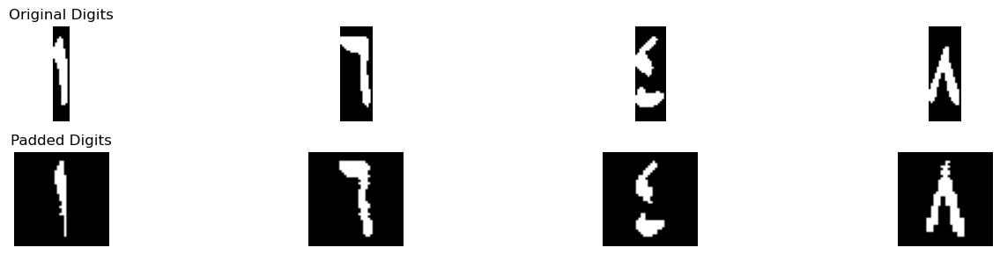

Best match: ١
Full comparison results: {'١': 5.6875, '٢': 0.7534965034965035, '٣': 0.9239551083591331, '٤': 1.0364468864468863, '٥': 0.6511775762936753, '٦': 0.5148809523809523, '٧': 0.1488970588235294, '٨': 2.3444444444444446, '٩': 1.3273001508295628}
Confidence :  1.6715277777777777
Best match: ٦
Full comparison results: {'١': 2.1339285714285716, '٢': 0.78125, '٣': 0.7603521671826625, '٤': 0.13392857142857142, '٥': 1.7724181777974348, '٦': 6.3291666666666675, '٧': 0.1801470588235294, '٨': 1.2125, '٩': 2.952322595704949}
Confidence :  1.6884220354808592
Best match: ٤
Full comparison results: {'١': 0.7708333333333333, '٢': 2.5360576923076925, '٣': 1.9807469040247678, '٤': 5.930837912087912, '٥': 2.872217307975822, '٦': 0.0, '٧': 0.6352941176470588, '٨': 1.0361111111111112, '٩': 1.0587449723479134}
Confidence :  1.529310302056045
Best match: ٨
Full comparison results: {'١': 2.75, '٢': 0.3125, '٣': 0.5551470588235294, '٤': 0.8125, '٥': 0.3330292643373139, '٦': 1.10625, '٧': 0.69926470588

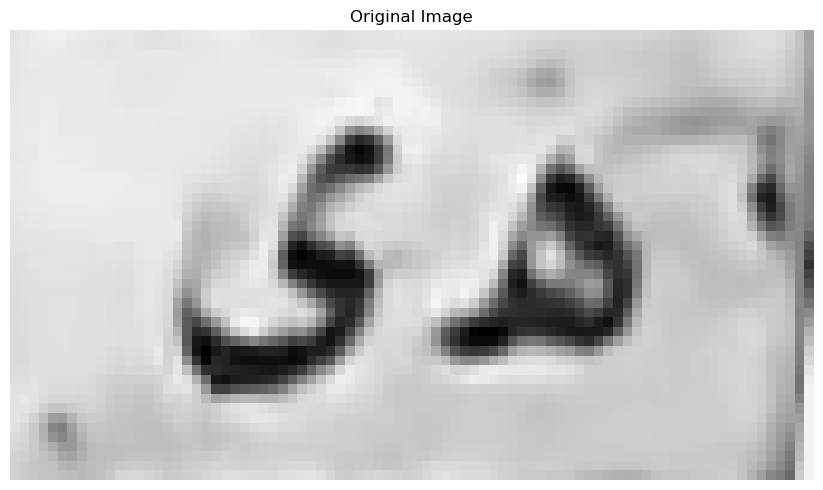

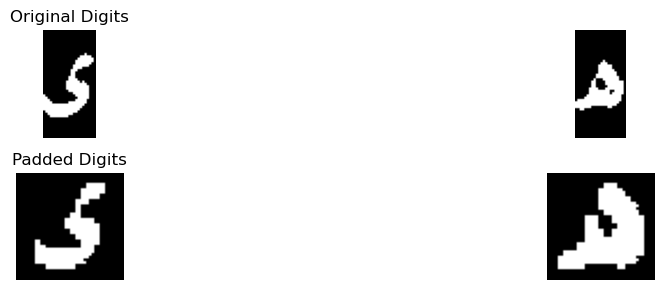

Best match: ي
Full comparison results: {'أ': 0.4230769230769231, 'ب': 0.5818965517241379, 'ج': 1.4058938746438745, 'د': 3.752225783475783, 'ر': 3.1686836870026522, 'س': 2.4642857142857144, 'ص': 2.627083333333333, 'ط': 2.615384615384615, 'ع': 0.8677884615384616, 'ف': 4.043294668294669, 'ق': 2.516114672364673, 'ك': 2.834134615384615, 'ل': 2.1466346153846154, 'م': 0.038461538461538464, 'ن': 2.2235576923076925, 'ه': 1.8125, 'و': 3.562232905982906, 'ي': 4.7570512820512825}
Confidence :  0.3568783068783068
Best match: ه
Full comparison results: {'أ': 0.4375, 'ب': 0.125, 'ج': 0.90625, 'د': 2.5, 'ر': 1.0625, 'س': 2.25, 'ص': 0.90625, 'ط': 1.0, 'ع': 0.21875, 'ف': 2.46875, 'ق': 0.84375, 'ك': 1.3125, 'ل': 0.59375, 'م': 0.78125, 'ن': 0.65625, 'ه': 5.46875, 'و': 1.5, 'ي': 1.0}
Confidence :  1.484375
[['١', '٦', '٤', '٨'], ['ي', 'ه']]
Tilt angle: -6.00 degrees


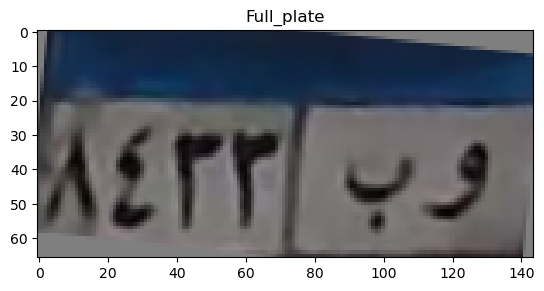

top
[0.27929085 0.20641108 0.22694077 0.25036194 0.34665357 0.44432616
 0.4748573  0.46142078 0.44587971 0.42288225 0.39027771 0.3651736
 0.35051092 0.35351273 0.36956038 0.37666773 0.38103432 0.39311519
 0.41289487 0.4348064  0.44516455 0.44367858 0.44027303 0.43902531
 0.44128181 0.44447555 0.44554314 0.44387826 0.44158005 0.43876137
 0.43373686 0.42748686 0.42001137 0.41137167 0.40371235 0.40273196
 0.4071667  0.41686339 0.42650647 0.43533    0.44225402 0.44335396
 0.439219   0.42618059 0.40639703 0.39345971 0.39575121 0.40689412
 0.41562192 0.41762772 0.41836913 0.42195016 0.4264283  0.42915438
 0.4287208  0.42399328 0.41224918 0.39560107 0.39129916 0.39545072
 0.39807601 0.39625532 0.39599571 0.40199687 0.40297501 0.40622261
 0.41322629 0.41539983 0.41267798 0.40637011 0.39550621 0.39957465]
[0.24536989 0.22140457 0.23535716 0.26245728 0.36047593 0.44508567
 0.46407575 0.4515949  0.42990357 0.40454086 0.37208069 0.35041243
 0.33046811 0.34046194 0.37139906 0.38390667 0.38950858 0.

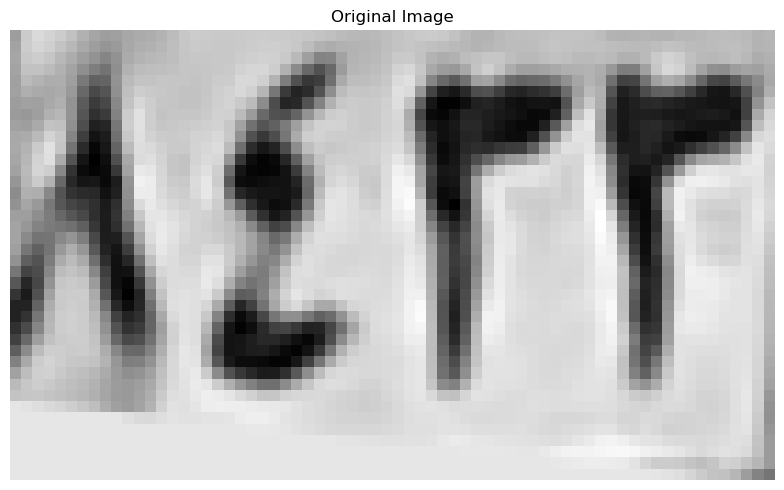

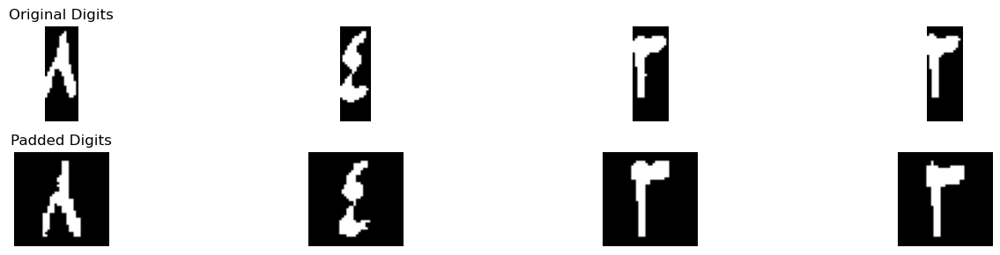

Best match: ٨
Full comparison results: {'١': 2.34375, '٢': 0.125, '٣': 0.3125, '٤': 0.625, '٥': 1.0633845643520565, '٦': 0.64375, '٧': 0.6341911764705883, '٨': 5.647222222222222, '٩': 2.368668300653595}
Confidence :  1.6392769607843136
Best match: ٤
Full comparison results: {'١': 1.766826923076923, '٢': 1.713942307692308, '٣': 1.625483746130031, '٤': 5.327586996336996, '٥': 2.9069917440660475, '٦': 0.0, '٧': 0.5400735294117647, '٨': 2.177777777777778, '٩': 1.3840026395173455}
Confidence :  1.2102976261354743
Best match: ٣
Full comparison results: {'١': 0.625, '٢': 2.875, '٣': 5.19156346749226, '٤': 1.71875, '٥': 1.8136932404540762, '٦': 2.50625, '٧': 1.6875000000000002, '٨': 0.5416666666666666, '٩': 0.9810049019607843}
Confidence :  1.1582817337461302
Best match: ٣
Full comparison results: {'١': 0.625, '٢': 2.4375, '٣': 4.69156346749226, '٤': 1.375, '٥': 1.7731184579094796, '٦': 1.88125, '٧': 2.247794117647059, '٨': 0.8152777777777778, '٩': 1.2026143790849675}
Confidence :  1.127031733

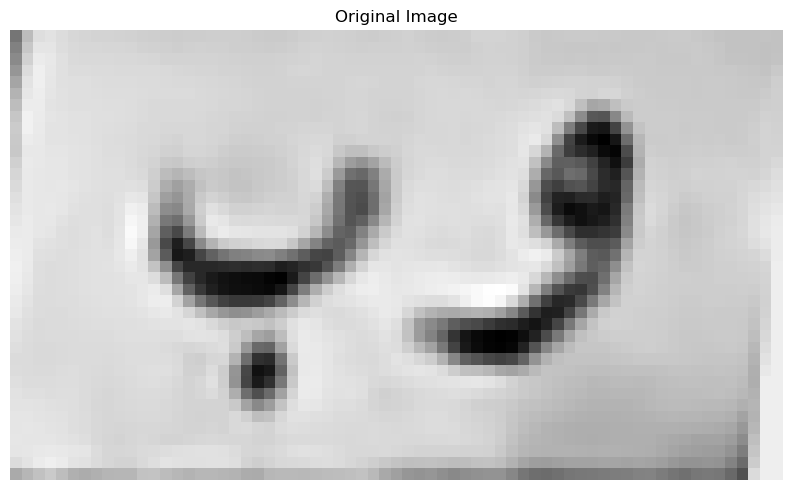

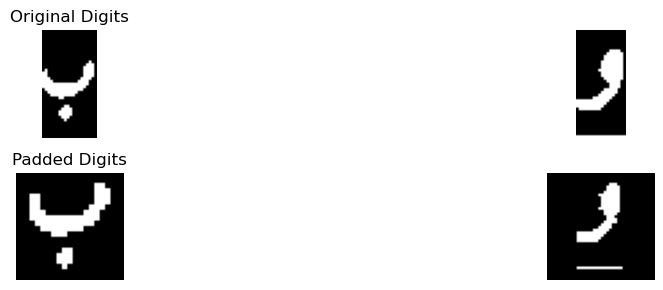

Best match: ب
Full comparison results: {'أ': 0.35624999999999996, 'ب': 3.502842775041051, 'ج': 0.03333333333333333, 'د': 0.16666666666666666, 'ر': 0.5270833333333333, 'س': 0.8854166666666666, 'ص': 1.9187500000000002, 'ط': 0.26666666666666666, 'ع': 0.09892473118279568, 'ف': 0.23333333333333334, 'ق': 0.39791666666666664, 'ك': 0.8333333333333335, 'ل': 0.0, 'م': 0.49374999999999997, 'ن': 0.16458333333333333, 'ه': 0.53125, 'و': 0.494758064516129, 'ي': 0.4979166666666667}
Confidence :  0.7920463875205255
Best match: م
Full comparison results: {'أ': 0.0, 'ب': 0.8569143579919443, 'ج': 0.8007559303914802, 'د': 0.772175678352149, 'ر': 0.39031162464985997, 'س': 0.7654089861751152, 'ص': 0.7023809523809523, 'ط': 0.03125, 'ع': 0.03125, 'ف': 0.43859649122807015, 'ق': 0.4872135439172644, 'ك': 0.2992424242424242, 'ل': 0.3915441176470588, 'م': 1.7912875194065898, 'ن': 0.0, 'ه': 0.8902553763440859, 'و': 1.0602338157485218, 'ي': 0.4247236157562244}
Confidence :  0.365526851829034
[['٨', '٤', '٣', '٣'], ['

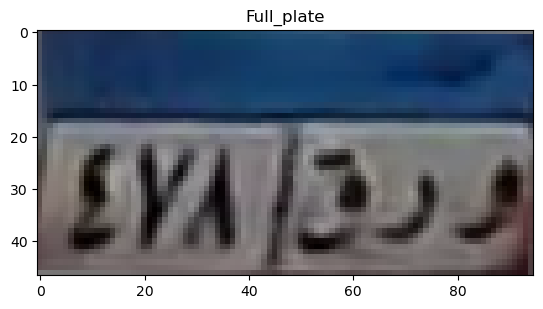

top
[0.36503912 0.36261439 0.36422528 0.47262879 0.53792814 0.53421267
 0.52418986 0.51489904 0.50594438 0.50479931 0.51584404 0.51590998
 0.51990294 0.51916695 0.52754564 0.52152931 0.50030246 0.48867757
 0.48212549 0.4869439  0.49695522 0.51164189 0.51769947 0.52486734
 0.53450672 0.54246956 0.54812593 0.54528468 0.54991503 0.53396339
 0.51434223 0.4995961  0.49092529 0.48866412 0.49075454 0.48556925
 0.47393569 0.48126175 0.48497176 0.48435971 0.47028632 0.46166194
 0.45654551 0.5101213  0.50250228 0.4831089  0.4456089 ]
[0.3784491  0.34622774 0.44530662 0.51948534 0.57335922 0.55755621
 0.54761488 0.54660381 0.52925093 0.52750246 0.53243523 0.54219134
 0.53946863 0.54209569 0.5437176  0.54366186 0.54480451 0.54294069
 0.54076647 0.54103755 0.54677342 0.55194802 0.55879358 0.57372854
 0.5810794  0.58647559 0.58383167 0.58710231 0.58225268 0.57782127
 0.57829885 0.57737233 0.57177284 0.55652244 0.55974657 0.56786691
 0.5645174  0.56663068 0.57056554 0.58331381 0.60688985 0.62241824
 

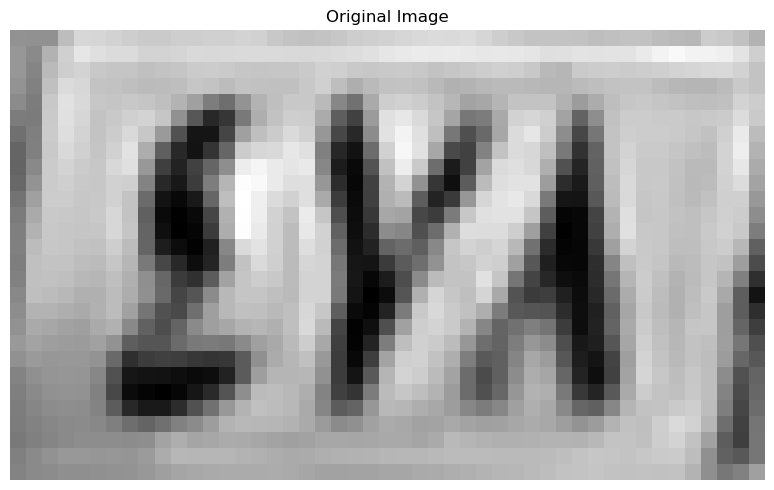

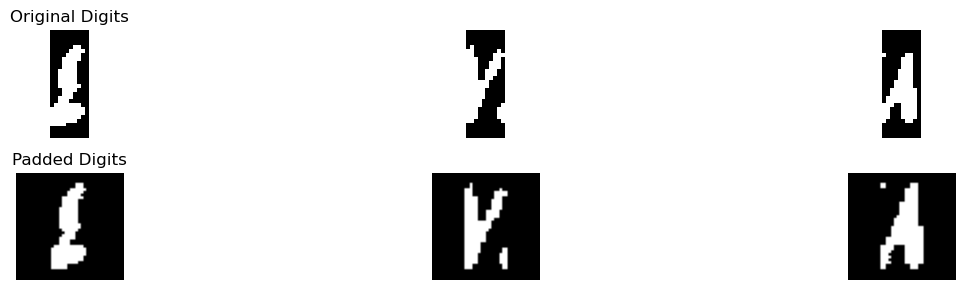

Best match: ٥
Full comparison results: {'١': 2.6346153846153846, '٢': 1.9447115384615388, '٣': 1.4281153250773992, '٤': 3.4724130036630036, '٥': 3.590271634969777, '٦': 0.6514880952380953, '٧': 0.9702205882352941, '٨': 2.8006944444444444, '٩': 1.4440987933634994}
Confidence :  0.05892931565338677
Best match: ٧
Full comparison results: {'١': 0.3125, '٢': 0.875, '٣': 0.7916021671826625, '٤': 0.8125, '٥': 1.6433547103051747, '٦': 0.2375, '٧': 3.010294117647059, '٨': 1.7708333333333333, '٩': 1.1791258169934642}
Confidence :  0.6197303921568628
Best match: ٨
Full comparison results: {'١': 1.4375, '٢': 0.9375, '٣': 0.625, '٤': 0.34375, '٥': 2.1518271782397167, '٦': 1.3375, '٧': 1.0933823529411766, '٨': 3.5791666666666666, '٩': 1.2977941176470589}
Confidence :  0.713669744213475
In horizontal_segmentation_1
0 17
In sub_horizontal_segmentation
0 2
3 16
18 30
33 44
In refine_segmentation_1


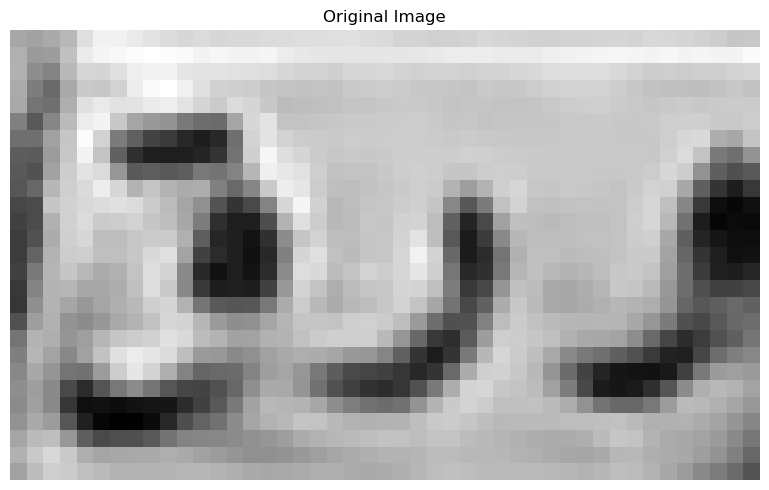

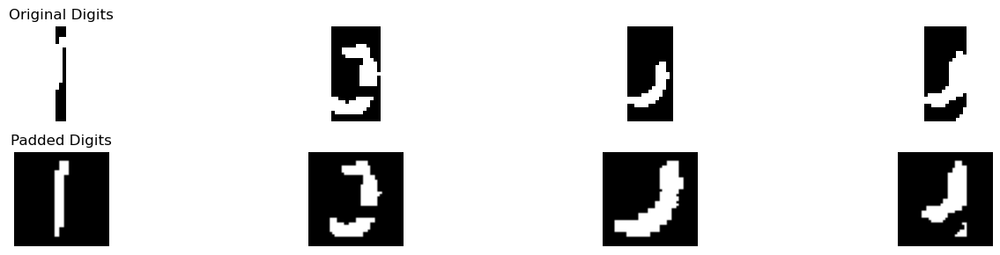

Best match: أ
Full comparison results: {'أ': 2.2630494505494503, 'ب': 0.0625, 'ج': 0.24055383022774326, 'د': 0.674233746130031, 'ر': 0.0, 'س': 0.0, 'ص': 0.3970238095238095, 'ط': 1.0128458498023714, 'ع': 0.15625, 'ف': 0.3333333333333333, 'ق': 0.13680555555555557, 'ك': 0.2159090909090909, 'ل': 0.0, 'م': 0.6688623876123876, 'ن': 0.28125, 'ه': 0.6686155913978494, 'و': 0.580654761904762, 'ي': 0.29910714285714285}
Confidence :  0.6251018003735395
Best match: ق
Full comparison results: {'أ': 0.13636363636363635, 'ب': 0.33910809018567634, 'ج': 3.5282169521299958, 'د': 4.930122053872054, 'ر': 2.6992134046613057, 'س': 1.5357142857142856, 'ص': 1.2140151515151514, 'ط': 2.6444334650856396, 'ع': 1.482733925274248, 'ف': 4.290670239258949, 'ق': 5.4576613839544885, 'ك': 1.9119318181818181, 'ل': 2.9691708754208754, 'م': 0.5085227272727273, 'ن': 3.136931818181818, 'ه': 1.9371639784946235, 'و': 3.5213804713804713, 'ي': 2.5786048190939495}
Confidence :  0.2637696650412171
Best match: ف
Full comparison resu

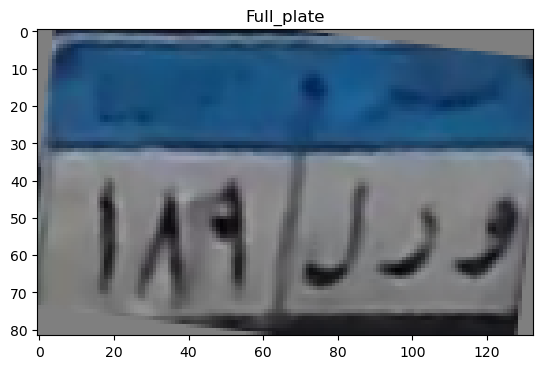

top
[0.45925623 0.43056123 0.44006534 0.35970755 0.31687951 0.31388478
 0.34505883 0.36691667 0.36082436 0.3842036  0.43226438 0.41243157
 0.39672833 0.40643823 0.39162243 0.36667046 0.37349847 0.39823201
 0.41214221 0.41298495 0.4175899  0.39978053 0.37871246 0.36590451
 0.35373897 0.35299004 0.36409436 0.39568254 0.43547603 0.47385811
 0.4876486  0.48817311 0.47763676 0.46358241 0.42381092 0.38762608
 0.35993782 0.34773168 0.34785136 0.34806323 0.34410437 0.32409529
 0.30128608 0.29400531 0.29899664 0.29591623 0.28522523 0.28248781
 0.31072913 0.34250834 0.32709435 0.31009885 0.2927729  0.27071737
 0.29797555 0.31094452 0.30684853 0.29329499 0.25632776 0.26367864
 0.27871365 0.28820762 0.29022165 0.28175539 0.27622245 0.26887992]
[0.43236925 0.42047632 0.44407871 0.42564338 0.44918176 0.48013886
 0.52040331 0.56488086 0.58856076 0.6164237  0.62501894 0.60305589
 0.58071377 0.57793038 0.56578471 0.55201019 0.55955614 0.58101002
 0.58003322 0.57010673 0.56740286 0.56370511 0.56352955 0

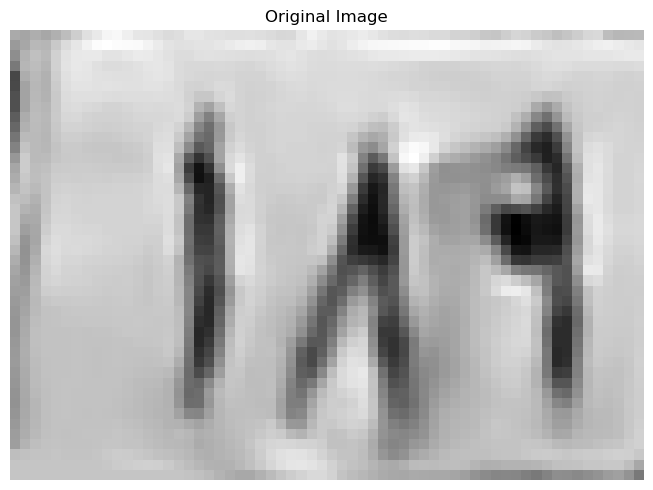

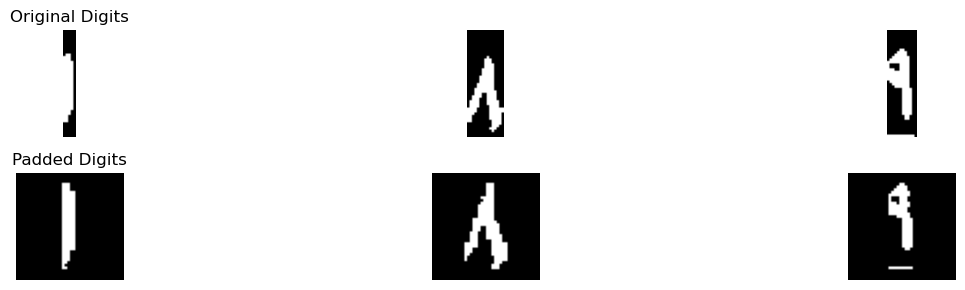

Best match: ١
Full comparison results: {'١': 4.1499999999999995, '٢': 1.926500582750583, '٣': 1.37296826625387, '٤': 1.7968406593406594, '٥': 0.853014890166593, '٦': 0.14285714285714285, '٧': 0.99375, '٨': 2.2215277777777778, '٩': 1.1780731523378583}
Confidence :  0.9642361111111108
Best match: ٨
Full comparison results: {'١': 2.75, '٢': 0.53125, '٣': 0.5588235294117647, '٤': 0.71875, '٥': 0.7963797361049683, '٦': 1.18125, '٧': 0.5540441176470589, '٨': 6.365972222222222, '٩': 3.1952614379084965}
Confidence :  1.5853553921568628
Best match: ١
Full comparison results: {'١': 5.407638888888888, '٢': 1.07641317016317, '٣': 0.9515286377708978, '٤': 1.027518315018315, '٥': 1.2731184579094794, '٦': 1.1113095238095239, '٧': 0.6066176470588236, '٨': 2.4104166666666664, '٩': 2.2822869532428354}
Confidence :  1.498611111111111
In horizontal_segmentation_1
0 21
24 40
45 65
In refine_segmentation_1


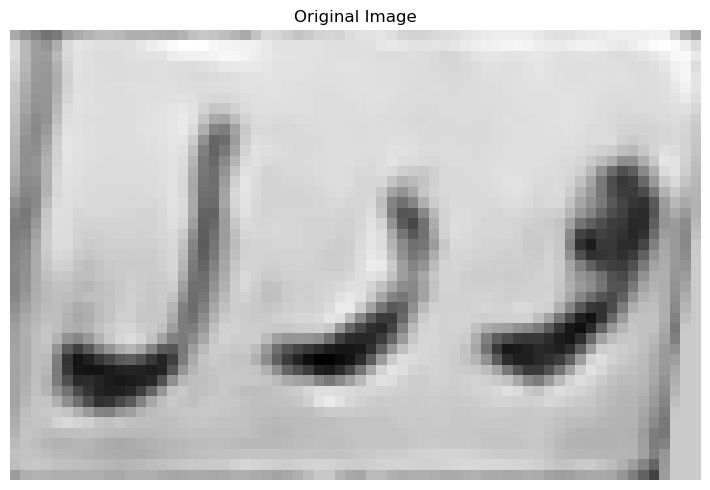

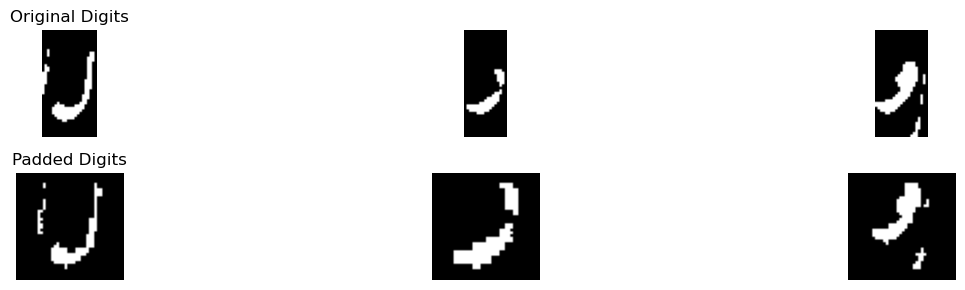

Best match: ل
Full comparison results: {'أ': 0.09090909090909091, 'ب': 0.7493368700265253, 'ج': 0.13722826086956522, 'د': 1.3269444444444447, 'ر': 1.879320339830085, 'س': 0.9241071428571428, 'ص': 0.9416666666666667, 'ط': 0.9479166666666666, 'ع': 0.41847826086956524, 'ف': 1.1631944444444446, 'ق': 1.1747685185185186, 'ك': 0.29166666666666663, 'ل': 2.7092391304347827, 'م': 0.09090909090909091, 'ن': 2.168257575757576, 'ه': 0.407258064516129, 'و': 1.1550925925925926, 'ي': 1.4440705128205127}
Confidence :  0.2704907773386034
Best match: ر
Full comparison results: {'أ': 0.16666666666666666, 'ب': 0.3574270557029178, 'ج': 0.27662037037037035, 'د': 2.8658333333333332, 'ر': 3.5796839080459772, 'س': 2.758928571428571, 'ص': 2.0270833333333336, 'ط': 2.439080459770115, 'ع': 0.35739942528735624, 'ف': 2.303571428571429, 'ق': 1.3796296296296295, 'ك': 2.458333333333333, 'ل': 1.6242816091954024, 'م': 0.11458333333333331, 'ن': 1.9016666666666666, 'ه': 1.5070564516129032, 'و': 1.8819444444444444, 'ي': 2.310

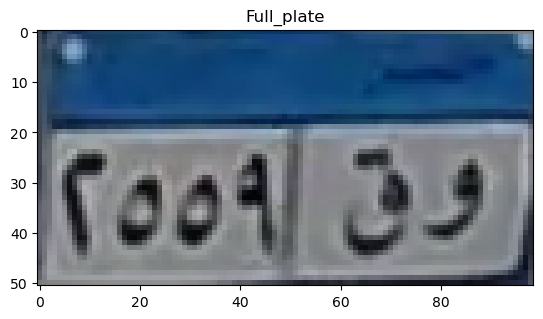

top
[0.26602682 0.35022847 0.32795467 0.36477223 0.45090012 0.48297285
 0.45514892 0.43984605 0.45534468 0.46802442 0.49474505 0.49703558
 0.49676545 0.49683944 0.51794645 0.51520529 0.51288583 0.52583773
 0.53605422 0.55648517 0.56086235 0.57238433 0.56925692 0.57301291
 0.57201972 0.57626521 0.58370786 0.58006791 0.58918431 0.59843712
 0.60798561 0.61433221 0.62756813 0.63814987 0.63867618 0.64557816
 0.64766032 0.64880199 0.64688392 0.64200101 0.6371961  0.63790354
 0.64424858 0.65579237 0.666187   0.6703385  0.65719466 0.67896146
 0.71935302]
[0.2675068  0.36885009 0.37660897 0.49106975 0.63431424 0.66275027
 0.6382949  0.62418645 0.62669104 0.62828853 0.63432998 0.63711496
 0.63863692 0.63986407 0.64415799 0.65141902 0.65475848 0.65359426
 0.64974929 0.65397257 0.65035196 0.65051446 0.6588908  0.67351108
 0.67286863 0.67651881 0.67215891 0.66862331 0.66408358 0.6637739
 0.65735517 0.65768152 0.65517162 0.65745275 0.66184706 0.65908971
 0.65260227 0.64062776 0.63757711 0.62968801 0

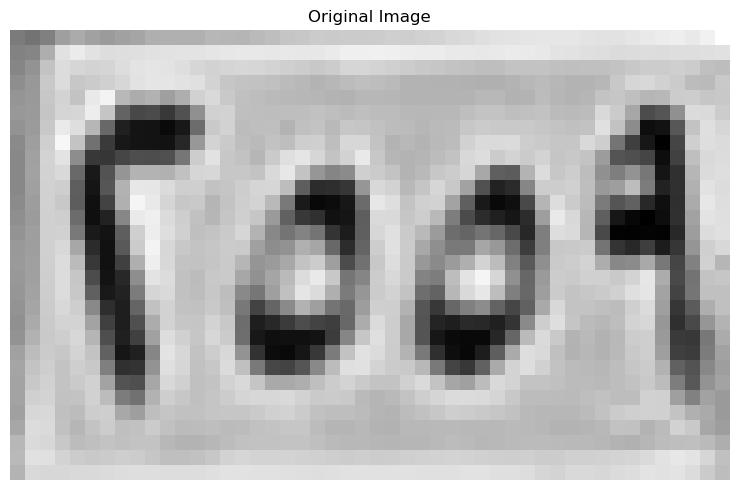

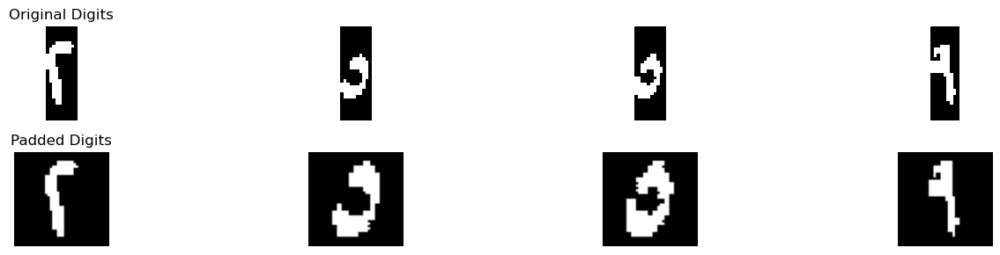

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 6.008928571428571, '٣': 3.639609133126935, '٤': 3.3949404761904765, '٥': 2.0138858174848884, '٦': 0.8407738095238095, '٧': 2.0356617647058823, '٨': 0.3125, '٩': 0.8406570961718021}
Confidence :  1.1846597191508181
Best match: ٥
Full comparison results: {'١': 0.25, '٢': 1.01875, '٣': 0.93125, '٤': 1.725, '٥': 7.0166666666666675, '٦': 1.36875, '٧': 0.48124999999999996, '٨': 1.58125, '٩': 0.4125}
Confidence :  2.645833333333334
Best match: ٥
Full comparison results: {'١': 0.5000000000000001, '٢': 0.95, '٣': 1.03125, '٤': 2.50625, '٥': 6.910416666666666, '٦': 1.4437499999999999, '٧': 0.65, '٨': 1.28125, '٩': 0.55625}
Confidence :  2.2020833333333334
Best match: ٩
Full comparison results: {'١': 3.8990384615384617, '٢': 3.074519230769231, '٣': 1.5432469040247678, '٤': 2.3474130036630036, '٥': 2.0942429603420316, '٦': 1.8470238095238096, '٧': 0.7705882352941176, '٨': 2.216666666666667, '٩': 4.611252513826043}
Confidence :  0.3561070261437

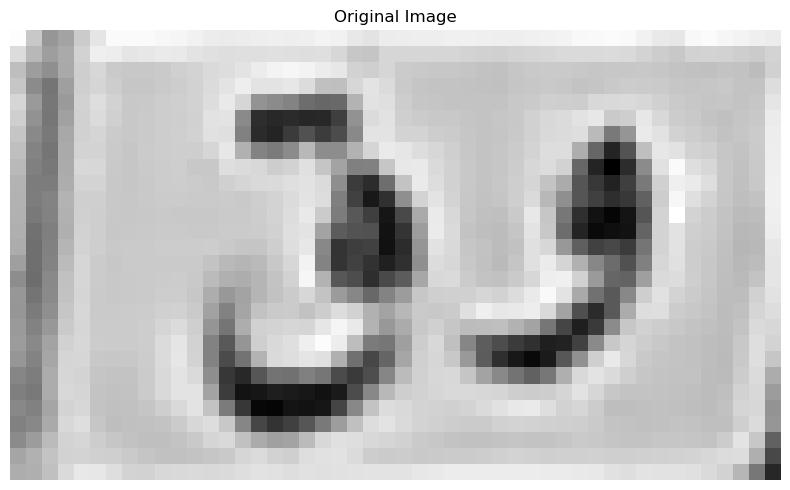

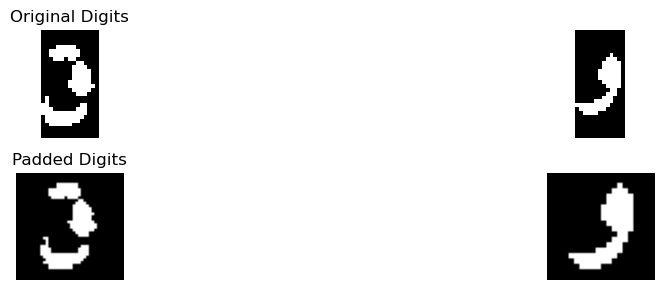

Best match: ق
Full comparison results: {'أ': 0.41220238095238093, 'ب': 0.5065484084880637, 'ج': 3.4947808833678398, 'د': 4.523340548340548, 'ر': 1.3816363246947951, 'س': 1.3571428571428572, 'ص': 1.6517857142857142, 'ط': 1.685729578392622, 'ع': 2.3705357142857144, 'ف': 3.5975529100529102, 'ق': 4.591435185185185, 'ك': 1.3768939393939394, 'ل': 2.050595238095238, 'م': 0.6989989177489178, 'ن': 2.9054166666666665, 'ه': 1.2716397849462366, 'و': 2.5459656084656084, 'ي': 2.729527990125816}
Confidence :  0.03404731842231845
Best match: و
Full comparison results: {'أ': 0.0, 'ب': 0.3951425729442971, 'ج': 0.5208333333333333, 'د': 3.649398148148148, 'ر': 4.42058908045977, 'س': 3.2767857142857144, 'ص': 2.3812499999999996, 'ط': 2.458333333333333, 'ع': 0.9270833333333333, 'ف': 3.318121693121693, 'ق': 2.909722222222222, 'ك': 2.0208333333333335, 'ل': 2.885416666666667, 'م': 0.125, 'ن': 2.4487500000000004, 'ه': 2.8235887096774195, 'و': 5.243055555555555, 'ي': 3.6171474358974356}
Confidence :  0.4112332375

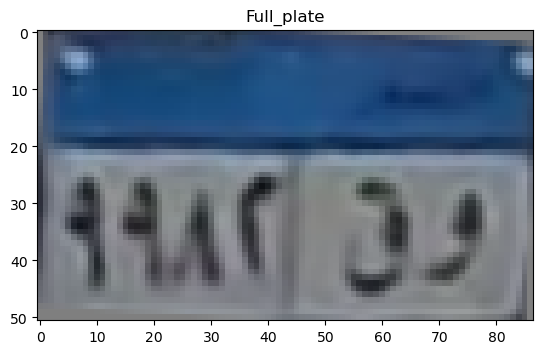

top
[0.32788182 0.37017658 0.38558379 0.3567524  0.34066091 0.33420831
 0.33078654 0.30895252 0.26542247 0.23706766 0.22861555 0.22131343
 0.21667916 0.21455512 0.2150637  0.21772557 0.21726348 0.21352282
 0.21830487 0.23903199 0.26348039 0.26573422 0.25484594 0.24784508
 0.2377964  0.22528623 0.22112249 0.21513941 0.22844187 0.23660376
 0.24107129 0.2402357  0.23513032 0.22725209 0.21968539 0.21473936
 0.21138233 0.21033449 0.2055854  0.19811144 0.18817679 0.17655919
 0.16007213]
[0.29476542 0.38829129 0.4484019  0.46191414 0.48414297 0.51937326
 0.54666784 0.54616113 0.51855037 0.50457828 0.51348522 0.50839024
 0.48651631 0.46605744 0.44832175 0.43868153 0.43002229 0.41910112
 0.41624921 0.43012674 0.45664905 0.47070937 0.47645711 0.48456382
 0.48095849 0.47071446 0.46010972 0.46171266 0.46282885 0.46530749
 0.46171716 0.45405359 0.43844365 0.41654505 0.39568538 0.37676379
 0.36122579 0.3539175  0.35726461 0.36236561 0.35682735 0.34686067
 0.32667583]
[0.26561598 0.3975125  0.4815017

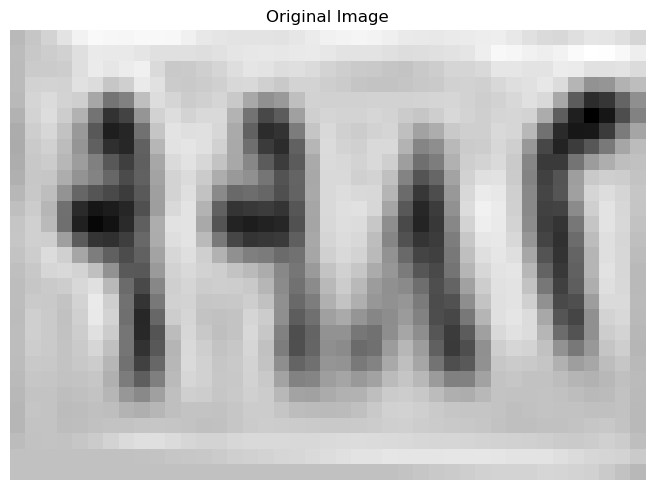

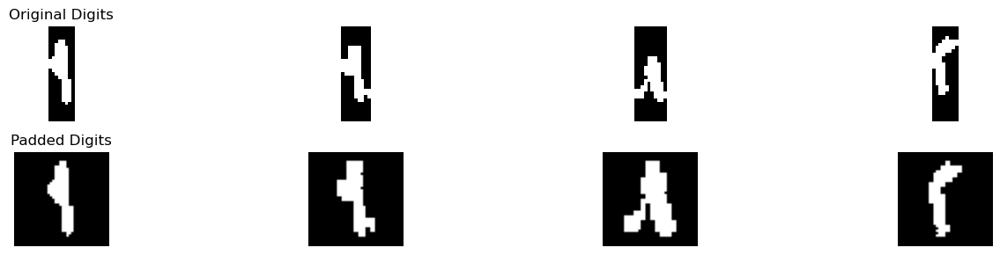

Best match: ١
Full comparison results: {'١': 4.625, '٢': 3.124271561771562, '٣': 1.2927631578947367, '٤': 2.8325549450549454, '٥': 1.2196345643520565, '٦': 0.9148809523809524, '٧': 0.7591911764705883, '٨': 2.9972222222222222, '٩': 3.224453242835596}
Confidence :  0.700273378582202
Best match: ٩
Full comparison results: {'١': 2.875, '٢': 3.53125, '٣': 1.546923374613003, '٤': 2.9375, '٥': 2.0681621332743623, '٦': 0.5625, '٧': 1.5544117647058824, '٨': 2.334027777777778, '٩': 4.0618872549019605}
Confidence :  0.2653186274509802
Best match: ٥
Full comparison results: {'١': 1.2755681818181819, '٢': 1.2698863636363635, '٣': 0.9147727272727273, '٤': 0.9460227272727273, '٥': 3.710227272727273, '٦': 1.2954545454545456, '٧': 0.42613636363636365, '٨': 3.0767045454545454, '٩': 1.5909090909090908}
Confidence :  0.31676136363636376
Best match: ٢
Full comparison results: {'١': 0.125, '٢': 4.34375, '٣': 3.8349458204334366, '٤': 2.9535714285714287, '٥': 2.468547287335987, '٦': 1.1583333333333334, '٧': 1

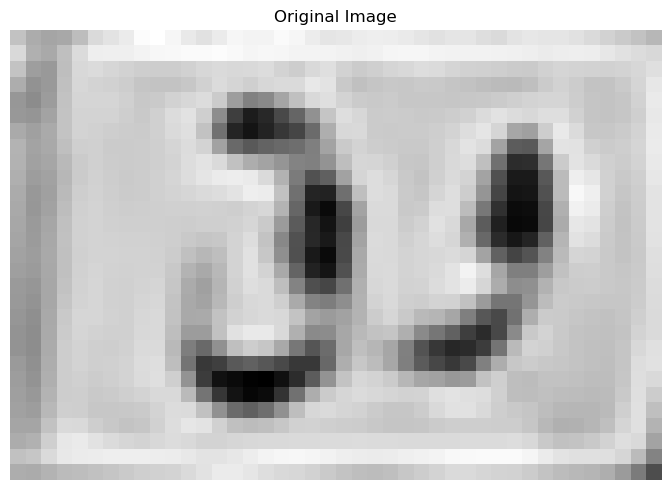

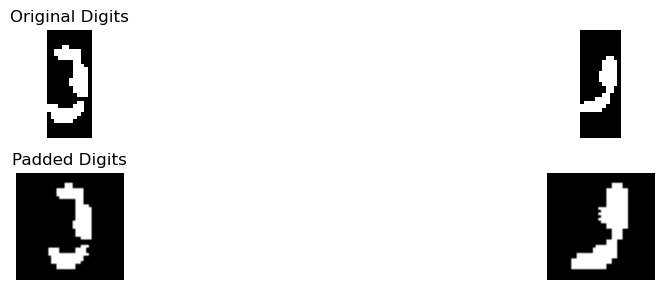

Best match: ق
Full comparison results: {'أ': 0.4375, 'ب': 0.3303437223695844, 'ج': 3.067329480101219, 'د': 4.287670148335783, 'ر': 1.8320965410152068, 'س': 0.9419642857142857, 'ص': 0.800297619047619, 'ط': 1.7908432147562585, 'ع': 1.6773026315789472, 'ف': 4.016934697855751, 'ق': 4.347782651072125, 'ك': 0.8522727272727273, 'ل': 2.630921052631579, 'م': 1.1363636363636362, 'ن': 3.5238095238095237, 'ه': 1.3028897849462366, 'و': 3.0876322751322753, 'ي': 2.8543826644370123}
Confidence :  0.030056251368170805
Best match: و
Full comparison results: {'أ': 0.3333333333333333, 'ب': 0.3599137931034483, 'ج': 0.7008928571428571, 'د': 3.5437433862433863, 'ر': 3.8377268508602844, 'س': 2.799107142857143, 'ص': 2.0800595238095236, 'ط': 2.6434041501976284, 'ع': 1.2157738095238095, 'ف': 3.087466931216931, 'ق': 3.201058201058201, 'ك': 2.402462121212121, 'ل': 2.8779761904761907, 'م': 0.21306818181818182, 'ن': 2.3819642857142855, 'ه': 2.406922043010753, 'و': 4.992063492063492, 'ي': 3.603039894887721}
Confidenc

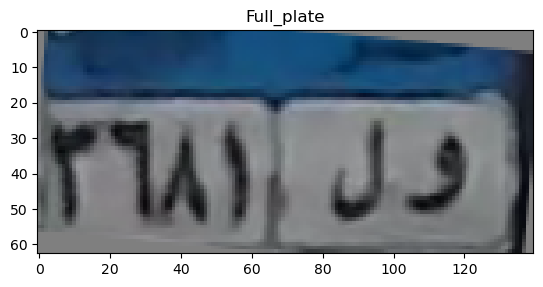

top
[0.45716059 0.3945352  0.36413931 0.37438811 0.39536832 0.42519257
 0.46918613 0.48625522 0.46618603 0.4731036  0.48244031 0.47984859
 0.46887413 0.46903123 0.48995572 0.47630868 0.46210065 0.4754202
 0.48277314 0.47122459 0.45144228 0.42392171 0.40005623 0.41908767
 0.47234646 0.52346837 0.5351506  0.52765213 0.5110227  0.48508662
 0.46056173 0.50106464 0.55005833 0.56225056 0.5616027  0.554491
 0.54076259 0.52654056 0.51964688 0.52128941 0.52591645 0.52307929
 0.51641142 0.51664634 0.52540732 0.53576008 0.53876711 0.52944639
 0.52261152 0.53193014 0.54207382 0.54626107 0.54337745 0.5181885
 0.4960198  0.50324028 0.51609328 0.52542588 0.53883304 0.55181549
 0.55503473 0.55207633 0.55260402 0.55333957 0.53275882 0.47917373
 0.43354854 0.43895608 0.48506191 0.53094404]
[0.47393342 0.39121992 0.35743239 0.36523591 0.37445772 0.37513475
 0.3598093  0.4567888  0.48699683 0.48299328 0.47933553 0.42684199
 0.36487387 0.34944758 0.38048734 0.36424909 0.33436627 0.33108809
 0.33559176 0.35

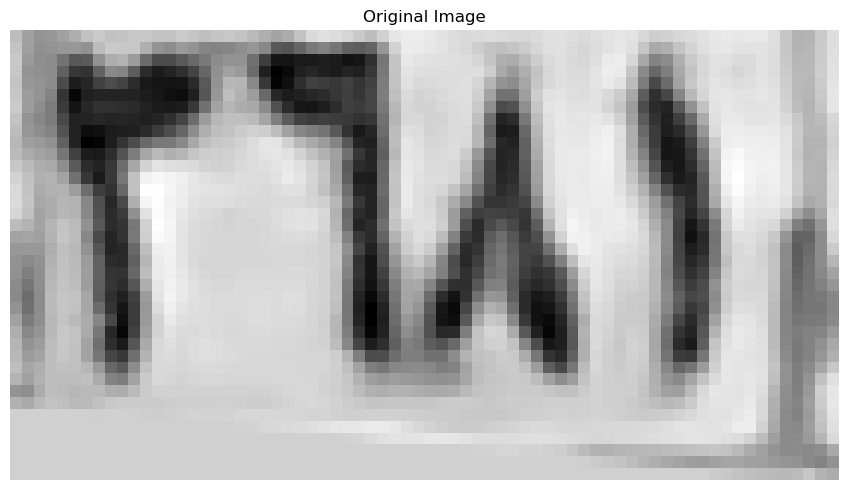

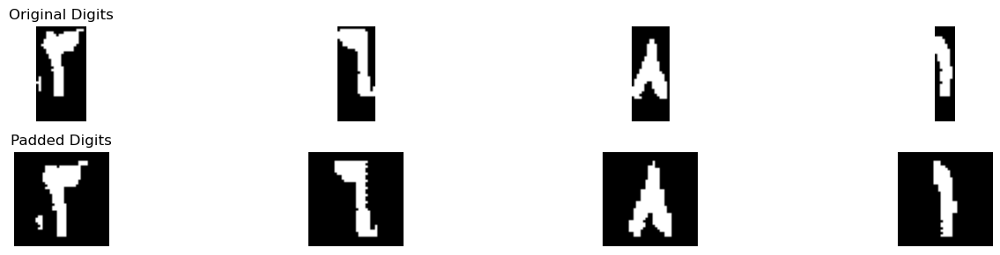

Best match: ٣
Full comparison results: {'١': 0.6818181818181819, '٢': 3.2727272727272725, '٣': 4.2727272727272725, '٤': 1.8551136363636365, '٥': 1.9517045454545456, '٦': 1.21875, '٧': 2.5710227272727275, '٨': 1.116477272727273, '٩': 1.1590909090909092}
Confidence :  0.5
Best match: ٦
Full comparison results: {'١': 2.7465277777777777, '٢': 1.2291666666666667, '٣': 2.4159356725146197, '٤': 0.2222222222222222, '٥': 2.427266081871345, '٦': 4.427777777777777, '٧': 0.8645833333333334, '٨': 1.2215277777777778, '٩': 2.5798611111111107}
Confidence :  0.8406249999999997
Best match: ٨
Full comparison results: {'١': 1.7847222222222225, '٢': 0.7777777777777778, '٣': 0.7719298245614035, '٤': 0.9895833333333333, '٥': 2.5305973266499584, '٦': 1.1256944444444446, '٧': 0.9743055555555555, '٨': 5.0465277777777775, '٩': 2.03125}
Confidence :  1.2579652255639096
Best match: ١
Full comparison results: {'١': 4.2625, '٢': 3.0161713286713283, '٣': 1.6130998452012384, '٤': 1.3541437728937729, '٥': 1.39554308565

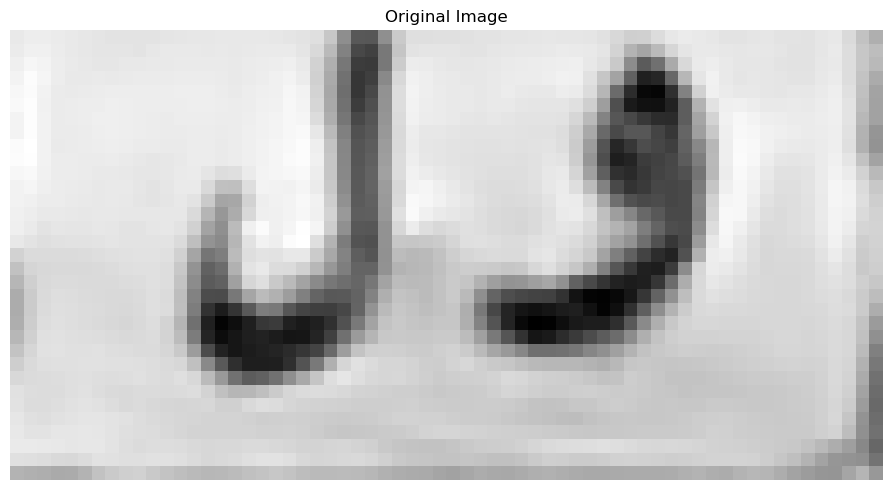

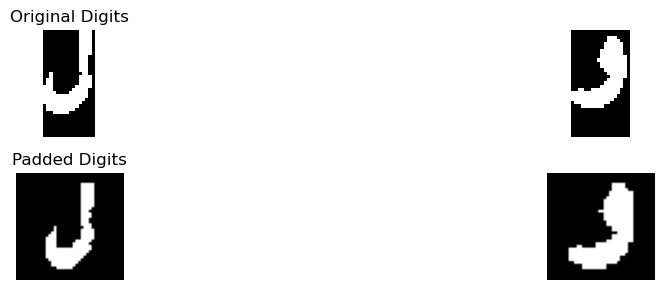

Best match: ل
Full comparison results: {'أ': 0.16666666666666666, 'ب': 0.3566810344827586, 'ج': 0.7210648148148149, 'د': 3.153677786638313, 'ر': 3.4600850170153024, 'س': 1.3705357142857144, 'ص': 1.0639880952380953, 'ط': 1.2910079051383399, 'ع': 1.0598318713450292, 'ف': 2.286462684489, 'ق': 2.489797410192147, 'ك': 0.5179924242424242, 'ل': 3.8343567251461987, 'م': 0.16666666666666666, 'ن': 3.2942261904761905, 'ه': 1.141465053763441, 'و': 2.6608796296296293, 'ي': 2.464234949832776}
Confidence :  0.1871358540654482
Best match: د
Full comparison results: {'أ': 0.16666666666666666, 'ب': 0.4224137931034483, 'ج': 1.0532407407407407, 'د': 4.641712962962963, 'ر': 3.465359195402299, 'س': 3.4017857142857144, 'ص': 2.191666666666667, 'ط': 2.34375, 'ع': 1.3125, 'ف': 4.202876984126984, 'ق': 2.7233796296296298, 'ك': 2.3541666666666665, 'ل': 3.010416666666666, 'م': 0.08333333333333333, 'ن': 2.9783333333333335, 'ه': 3.6370967741935485, 'و': 4.261574074074074, 'ي': 3.749358974358974}
Confidence :  0.19006

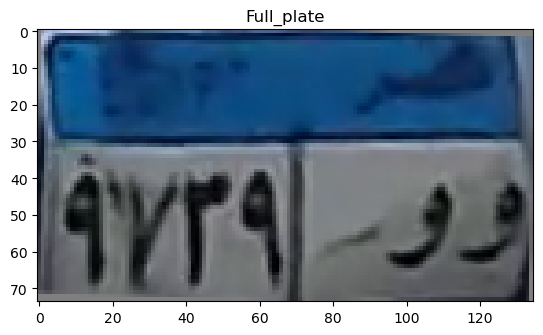

top
[0.15910935 0.09191684 0.35871423 0.51759078 0.45181155 0.31098167
 0.19109578 0.16617691 0.16396332 0.1529668  0.14762176 0.15488882
 0.16488509 0.17585837 0.17802049 0.17904706 0.17900789 0.17903569
 0.17280623 0.1620742  0.15087093 0.13965999 0.13500727 0.13238023
 0.14279853 0.14562345 0.13707221 0.12442744 0.14204596 0.13938862
 0.12982624 0.12307669 0.11892545 0.12559649 0.1315922  0.1357535
 0.14197708 0.14103154 0.13214816 0.12942082 0.12696806 0.12733049
 0.12557449 0.12356361 0.12329852 0.12348073 0.12410757 0.13001108
 0.13106653 0.13394161 0.13721084 0.1423257  0.1480237  0.15695539
 0.15694557 0.14837722 0.14907613 0.1222459  0.10675052 0.10796451
 0.10398131 0.10195166 0.09982092 0.09665418 0.10094721 0.10322521
 0.10653834]
[0.13612188 0.07768615 0.33484884 0.45416505 0.39794814 0.34534205
 0.31504686 0.32211813 0.36005088 0.36481115 0.36462227 0.36484947
 0.3613817  0.34664462 0.33542354 0.29255788 0.23393229 0.19524877
 0.17377307 0.15569377 0.14287512 0.13429558 0

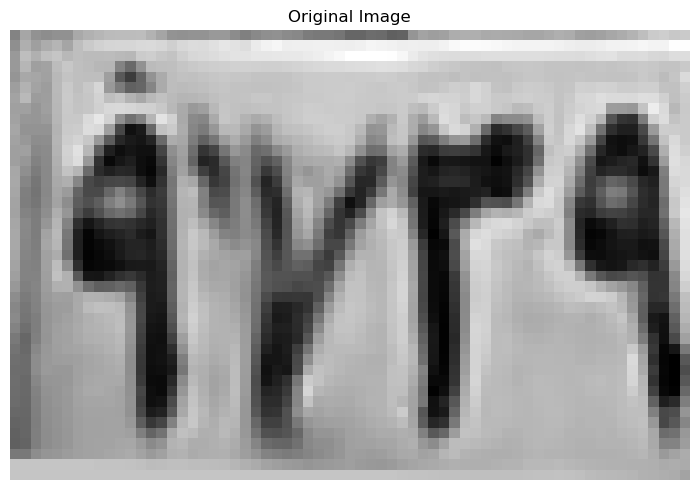

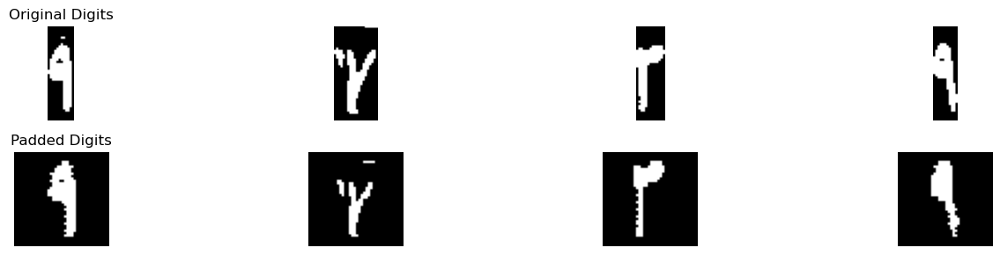

Best match: ٩
Full comparison results: {'١': 2.9479166666666674, '٢': 2.129807692307692, '٣': 0.9864551083591331, '٤': 1.7484661172161173, '٥': 2.2219150818222024, '٦': 2.780059523809524, '٧': 0.5716911764705883, '٨': 2.502083333333333, '٩': 3.6894010809451987}
Confidence :  0.37074220713926564
Best match: ٧
Full comparison results: {'١': 0.15625, '٢': 1.5625, '٣': 1.02921826625387, '٤': 1.28125, '٥': 0.16408668730650156, '٦': 0.0, '٧': 1.8680147058823529, '٨': 0.21805555555555556, '٩': 0.41625816993464054}
Confidence :  0.15275735294117643
Best match: ٣
Full comparison results: {'١': 0.8774038461538463, '٢': 2.7091346153846154, '٣': 3.6055534055727554, '٤': 1.3761675824175825, '٥': 2.200049756744803, '٦': 2.094047619047619, '٧': 0.7441176470588236, '٨': 0.6784722222222221, '٩': 1.018068124685772}
Confidence :  0.44820939509407
Best match: ٩
Full comparison results: {'١': 4.354166666666667, '٢': 3.1770833333333335, '٣': 2.002128482972136, '٤': 3.474908424908425, '٥': 2.17828118089341, 

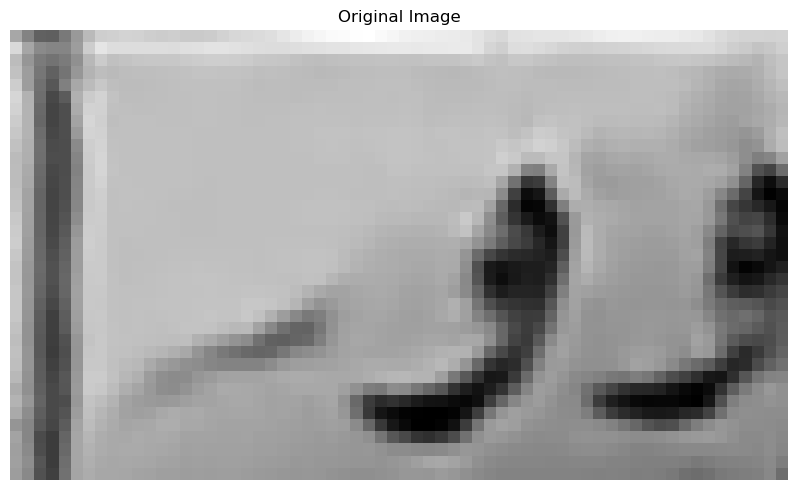

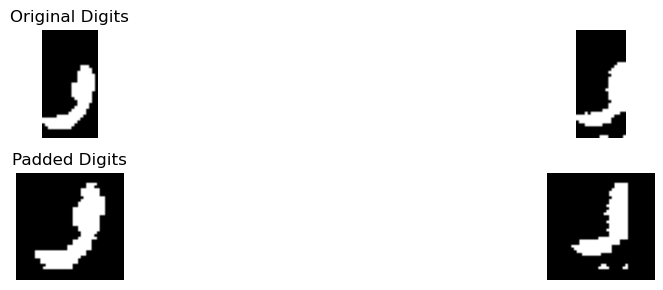

Best match: و
Full comparison results: {'أ': 0.11538461538461539, 'ب': 0.5410311671087533, 'ج': 0.5404202279202279, 'د': 3.5684650997151, 'ر': 3.724801061007958, 'س': 3.78125, 'ص': 2.824198717948718, 'ط': 2.4038461538461537, 'ع': 0.8197115384615385, 'ف': 3.6425900488400487, 'ق': 2.9839743589743586, 'ك': 2.4423076923076925, 'ل': 2.8197115384615388, 'م': 0.038461538461538464, 'ن': 2.3605769230769234, 'ه': 2.65625, 'و': 4.2675391737891735, 'ي': 3.5326923076923076}
Confidence :  0.24314458689458673
Best match: و
Full comparison results: {'أ': 0.0625, 'ب': 0.06350806451612903, 'ج': 0.1841931216931217, 'د': 1.0787632275132275, 'ر': 1.1772500356964375, 'س': 1.2276785714285714, 'ص': 1.1811417447958048, 'ط': 0.42605401844532276, 'ع': 0.12648809523809523, 'ف': 1.7210648148148149, 'ق': 1.148313492063492, 'ك': 0.4488636363636363, 'ل': 0.5550595238095237, 'م': 0.13852813852813853, 'ن': 0.6739285714285714, 'ه': 1.7634408602150538, 'و': 2.0514219576719577, 'ي': 1.083362199394808}
Confidence :  0.1439

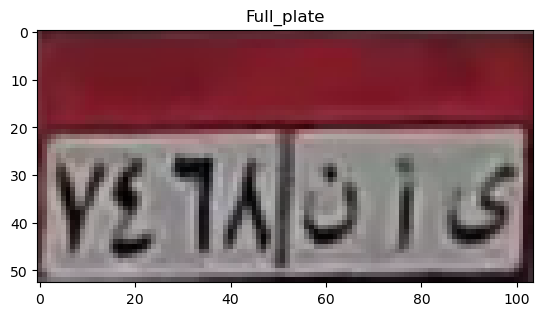

top
[0.20849155 0.19600452 0.19024225 0.20905517 0.21988318 0.24268377
 0.22392696 0.20264151 0.1970307  0.20469431 0.20464124 0.19801914
 0.20876458 0.21267007 0.20930848 0.19685694 0.20306526 0.19804583
 0.19685041 0.19212464 0.20408348 0.21740509 0.21783265 0.23145118
 0.24891082 0.2599075  0.26342306 0.26766652 0.27490926 0.27198695
 0.27617722 0.28556533 0.30378473 0.30491221 0.32428484 0.34211406
 0.34306569 0.34522559 0.35543566 0.36336108 0.36610979 0.37265447
 0.38420769 0.38528626 0.38159758 0.371052   0.418799   0.4445421
 0.45967464 0.46333387 0.35290241 0.2541098 ]
[0.18281074 0.21511865 0.26868447 0.35513504 0.43898684 0.49268041
 0.48176282 0.46105664 0.46277126 0.48405461 0.48185733 0.49470129
 0.51205959 0.50773055 0.49673702 0.48041012 0.49522812 0.49333816
 0.48162707 0.47006534 0.4896482  0.51046504 0.51160627 0.5260977
 0.54538786 0.55169382 0.54661617 0.54624051 0.54748744 0.5468387
 0.5507618  0.5515982  0.55470788 0.55116928 0.54532475 0.5503611
 0.57130167 0.58

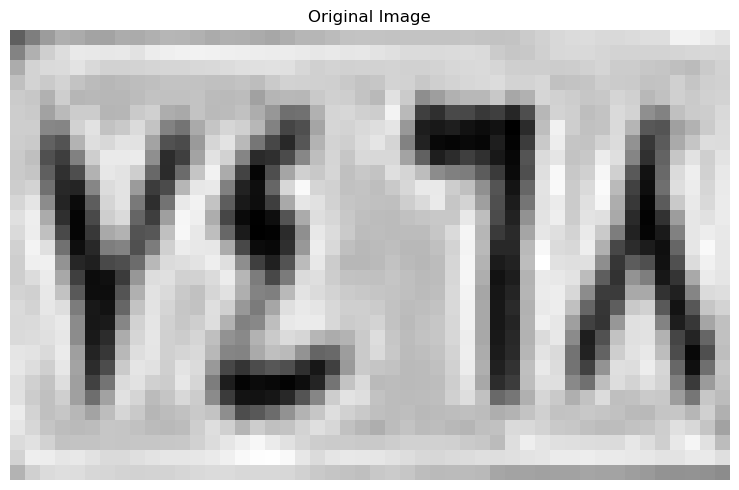

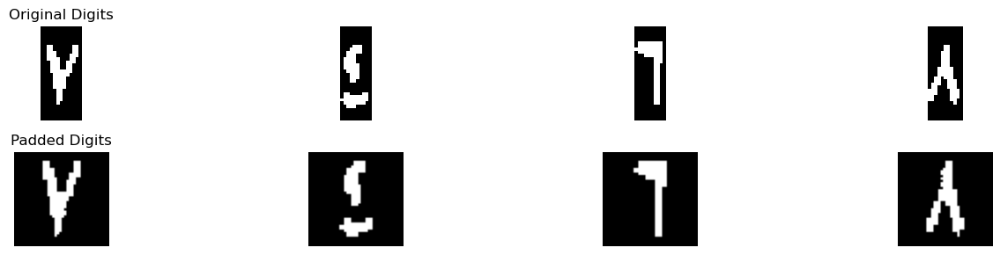

Best match: ٧
Full comparison results: {'١': 0.125, '٢': 1.71875, '٣': 3.2370356037151704, '٤': 1.8125, '٥': 0.47087848297213625, '٦': 0.7125, '٧': 4.526838235294118, '٨': 1.0548611111111112, '٩': 1.1758578431372548}
Confidence :  0.6449013157894739
Best match: ٤
Full comparison results: {'١': 2.78125, '٢': 2.1339285714285716, '٣': 1.9770704334365325, '٤': 4.474980798771122, '٥': 2.966510946483856, '٦': 0.31220238095238095, '٧': 0.3738970588235294, '٨': 2.51875, '٩': 1.965919701213819}
Confidence :  0.7542349261436327
Best match: ٦
Full comparison results: {'١': 2.3794642857142856, '٢': 1.0580357142857142, '٣': 1.594717492260062, '٤': 0.0, '٥': 1.6708314904909334, '٦': 5.9086309523809515, '٧': 0.7544117647058823, '٨': 0.43472222222222223, '٩': 2.5648342670401494}
Confidence :  1.671898342670401
Best match: ٨
Full comparison results: {'١': 2.3125, '٢': 0.25, '٣': 0.5625, '٤': 0.78125, '٥': 0.9681464691139614, '٦': 1.16875, '٧': 0.7268382352941177, '٨': 6.010416666666666, '٩': 2.78860294

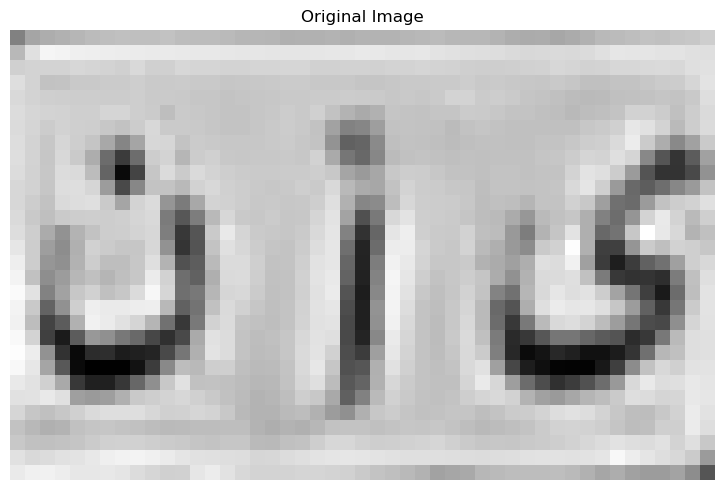

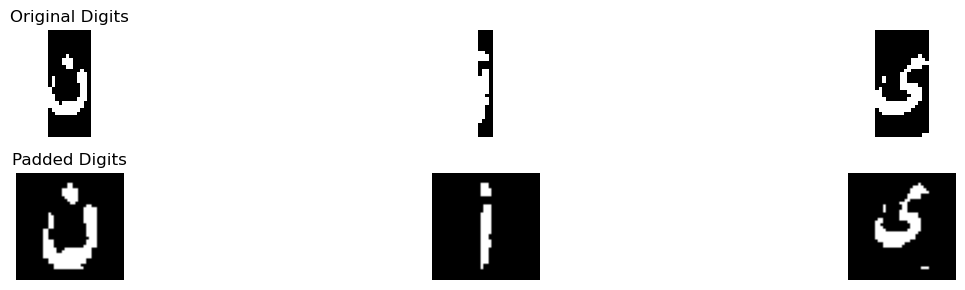

Best match: ن
Full comparison results: {'أ': 0.55, 'ب': 0.20764257294429708, 'ج': 2.230002012882448, 'د': 4.7428367003367, 'ر': 2.678787927464839, 'س': 1.1919642857142856, 'ص': 0.6193452380952381, 'ط': 2.79689558629776, 'ع': 1.8875000000000002, 'ف': 3.4877314814814815, 'ق': 2.8566798941798943, 'ك': 1.3418560606060608, 'ل': 2.4875, 'م': 0.9647727272727272, 'ن': 4.7977976190476195, 'ه': 1.5820564516129032, 'و': 3.022453703703704, 'ي': 2.1949763099219624}
Confidence :  0.02748045935545962
Best match: أ
Full comparison results: {'أ': 3.3667781814959232, 'ب': 0.0625, 'ج': 0.2881728778467909, 'د': 0.3651386413151119, 'ر': 0.0, 'س': 0.03125, 'ص': 0.6654761904761904, 'ط': 1.1362497728408525, 'ع': 0.09375, 'ف': 0.2926747311827957, 'ق': 0.05263157894736842, 'ك': 0.03125, 'ل': 0.0, 'م': 0.20170454545454547, 'ن': 0.3905913978494624, 'ه': 0.3186827956989247, 'و': 0.4720238095238095, 'ي': 0.4993742368742369}
Confidence :  1.1152642043275354
Best match: ص
Full comparison results: {'أ': 0.08125, 'ب': 

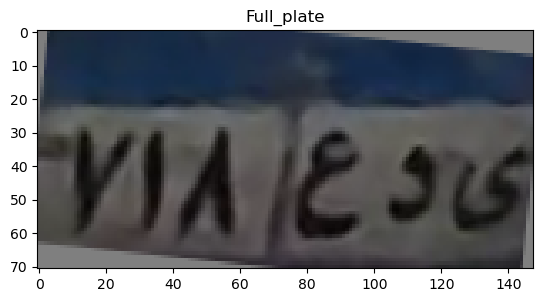

top
[0.38390012 0.33933312 0.35144088 0.36376436 0.37800955 0.39304554
 0.40919107 0.42372759 0.43334441 0.43800963 0.42547663 0.40040544
 0.36742759 0.33968757 0.34555238 0.36623277 0.37757964 0.38258703
 0.38136814 0.37171435 0.36880874 0.37352011 0.38108452 0.39001714
 0.38874497 0.38046965 0.37612263 0.37877136 0.37962355 0.37881309
 0.37912882 0.37834229 0.37471275 0.37305634 0.36838303 0.35823094
 0.35629725 0.3601404  0.36364653 0.36395787 0.36757029 0.37249678
 0.37683373 0.38263373 0.38722375 0.39232209 0.39888606 0.40534542
 0.40816897 0.41190149 0.41837523 0.42511517 0.42342662 0.40307883
 0.38298691 0.38780025 0.40159467 0.41119061 0.41475922 0.4111339
 0.40479167 0.4040905  0.40463682 0.40234441 0.40067825 0.39798121
 0.39469392 0.39028836 0.38509206 0.38152857 0.38153711 0.38027701
 0.3668273  0.34576165]
[0.36433441 0.3340043  0.34437775 0.36004865 0.37672786 0.38785355
 0.4052086  0.41656846 0.42779978 0.42979426 0.40345618 0.36962679
 0.32187303 0.26732266 0.26857743 0

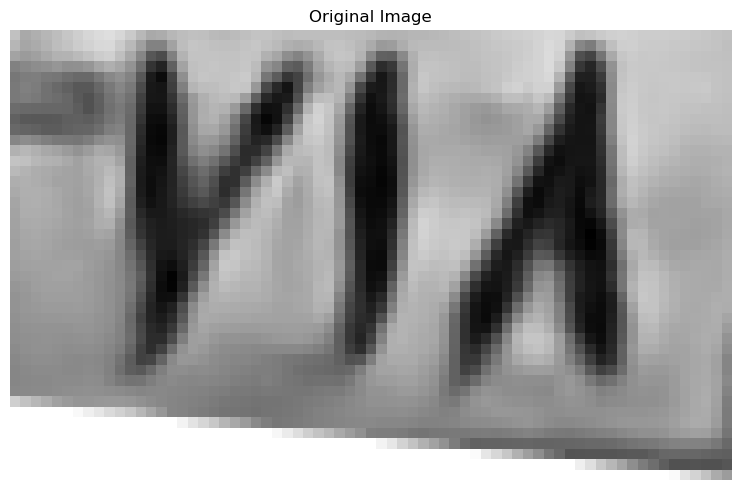

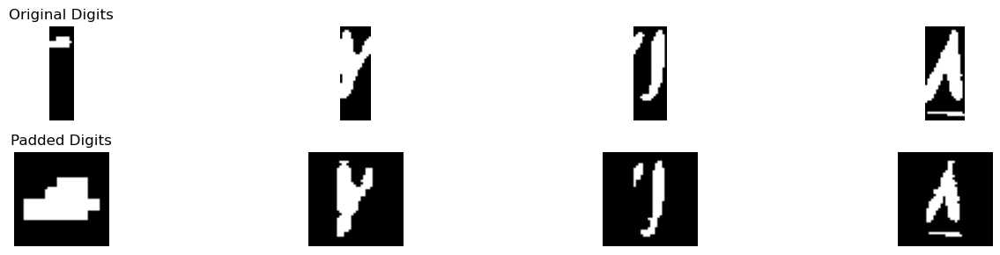

Best match: ٥
Full comparison results: {'١': 0.625, '٢': 0.59375, '٣': 0.46875, '٤': 0.1875, '٥': 1.65625, '٦': 0.5625, '٧': 0.71875, '٨': 1.4375, '٩': 0.78125}
Confidence :  0.109375
Best match: ٧
Full comparison results: {'١': 0.4666666666666667, '٢': 1.2, '٣': 1.3031153250773992, '٤': 1.4104166666666667, '٥': 1.604268022998673, '٦': 0.09791666666666667, '٧': 3.3227941176470592, '٨': 1.117361111111111, '٩': 1.197998366013072}
Confidence :  0.8592630473241931
Best match: ٦
Full comparison results: {'١': 1.752403846153846, '٢': 1.1346153846153846, '٣': 1.1077786377708978, '٤': 0.22767857142857142, '٥': 1.2951358174848886, '٦': 3.4187499999999997, '٧': 1.4897058823529412, '٨': 0.6965277777777777, '٩': 1.1484257164404224}
Confidence :  0.8331730769230768
Best match: ٨
Full comparison results: {'١': 2.1354166666666665, '٢': 0.4, '٣': 0.5526315789473684, '٤': 0.5666666666666667, '٥': 0.8690568332596196, '٦': 1.0479166666666666, '٧': 0.7981617647058824, '٨': 5.033333333333333, '٩': 2.384477

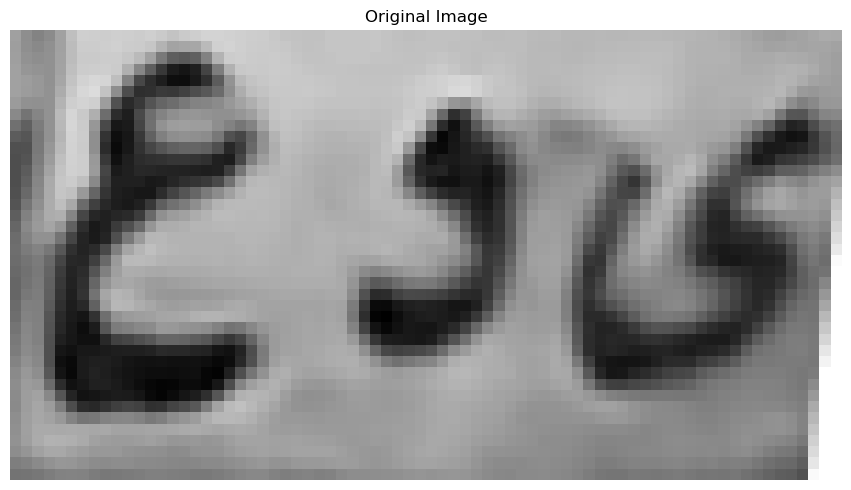

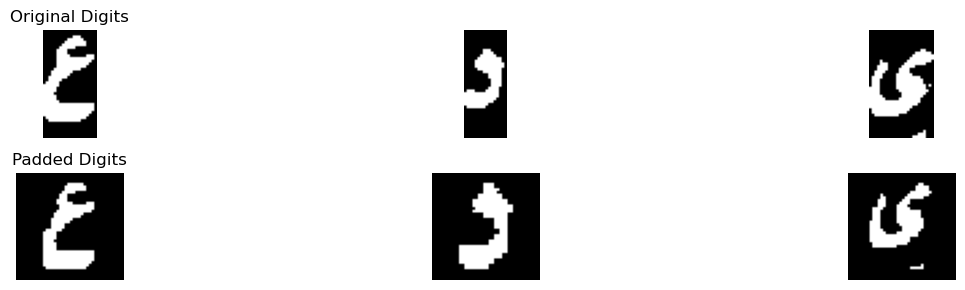

Best match: د
Full comparison results: {'أ': 0.5674342105263157, 'ب': 0.034482758620689655, 'ج': 3.000992820214788, 'د': 3.5803451178451176, 'ر': 0.6824175412293854, 'س': 0.6517857142857143, 'ص': 0.32172619047619044, 'ط': 1.408679183135705, 'ع': 2.174671052631579, 'ف': 2.833568295739348, 'ق': 1.8150393344472293, 'ك': 1.9119318181818181, 'ل': 0.9111842105263157, 'م': 1.4935705741626792, 'ن': 1.9319893483709274, 'ه': 1.4602150537634409, 'و': 1.6749686716791978, 'ي': 0.9112322507774453}
Confidence :  0.2896761488151647
Best match: د
Full comparison results: {'أ': 0.79375, 'ب': 0.0, 'ج': 2.246337991718426, 'د': 4.993421717171717, 'ر': 1.479192546583851, 'س': 2.540178571428571, 'ص': 1.0497023809523809, 'ط': 1.9497694334650855, 'ع': 1.3687500000000001, 'ف': 3.3198412698412696, 'ق': 2.034424603174603, 'ك': 1.4469696969696968, 'ل': 2.35, 'م': 2.264772727272727, 'ن': 2.485952380952381, 'ه': 3.5535618279569894, 'و': 3.067857142857143, 'ي': 1.9489966555183946}
Confidence :  0.7199299446073639
Bes

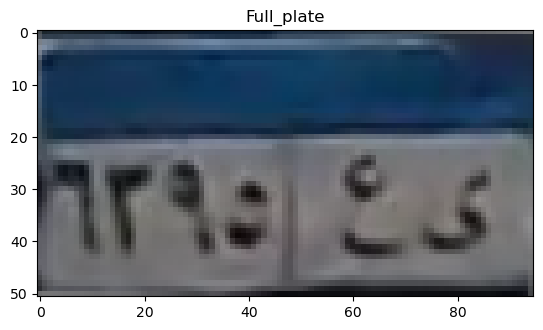

top
[0.30570924 0.24302107 0.17979559 0.15811869 0.15459833 0.15212827
 0.15252366 0.14737555 0.15174429 0.15615877 0.16704082 0.17858759
 0.19006537 0.20909493 0.21183314 0.22064135 0.21994818 0.20998146
 0.20555775 0.21107245 0.20740747 0.22035171 0.22469837 0.23600665
 0.25500498 0.23701589 0.2401726  0.23155935 0.23257774 0.27077439
 0.28617314 0.28674759 0.28402853 0.28762145 0.28434386 0.28920369
 0.28147162 0.28199746 0.27732039 0.28311536 0.28654733 0.28748176
 0.25178936 0.23828627 0.23457471 0.22555203 0.23161438]
[0.32174345 0.28834916 0.28304422 0.29234884 0.30409804 0.32528186
 0.33003262 0.32543292 0.33041453 0.32819527 0.33487453 0.33436047
 0.34717701 0.36307373 0.36625598 0.38309115 0.38926054 0.39596728
 0.39723314 0.41059098 0.40851859 0.41820619 0.4231098  0.43269779
 0.46441387 0.44706782 0.44521471 0.43231785 0.43295751 0.49085746
 0.50482436 0.50859343 0.50534657 0.50502172 0.51339811 0.51965469
 0.50985598 0.49337675 0.49073047 0.48970871 0.49366961 0.49923776
 

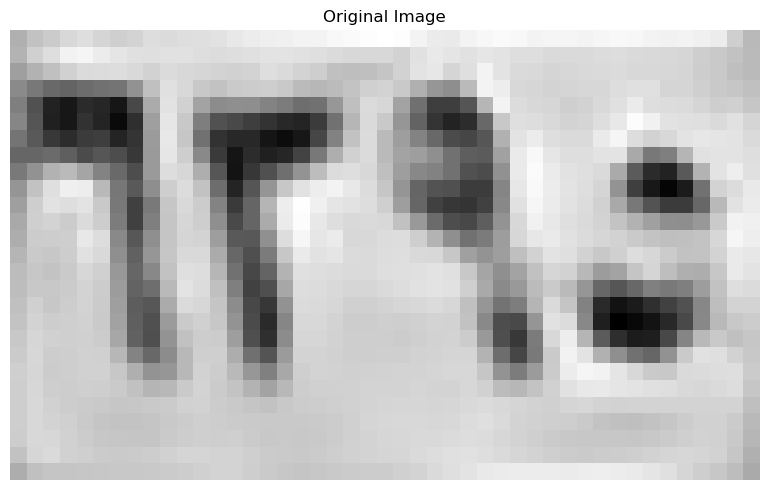

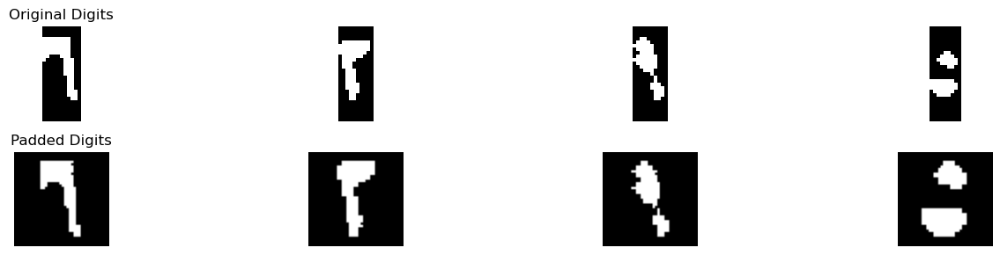

Best match: ٦
Full comparison results: {'١': 1.7058823529411764, '٢': 0.5790441176470589, '٣': 2.3647445820433437, '٤': 0.11764705882352941, '٥': 2.7407166814094057, '٦': 5.52720588235294, '٧': 0.9147058823529413, '٨': 2.0096813725490192, '٩': 3.7738970588235294}
Confidence :  0.8766544117647055
Best match: ٣
Full comparison results: {'١': 0.28125, '٢': 4.5625, '٣': 6.0015479876160995, '٤': 2.75, '٥': 2.522666961521451, '٦': 1.9375, '٧': 2.7301470588235297, '٨': 0.5368055555555555, '٩': 0.9152369281045751}
Confidence :  0.7195239938080498
Best match: ٩
Full comparison results: {'١': 2.75, '٢': 1.84375, '٣': 1.9396284829721362, '٤': 1.90625, '٥': 1.4010992554916701, '٦': 1.61875, '٧': 0.7941176470588236, '٨': 3.5493055555555557, '٩': 4.787173202614379}
Confidence :  0.6189338235294115
Best match: ٥
Full comparison results: {'١': 0.5263157894736842, '٢': 1.7088815789473684, '٣': 1.1529605263157894, '٤': 2.245065789473684, '٥': 6.336779448621554, '٦': 1.6572368421052632, '٧': 0.8342105263

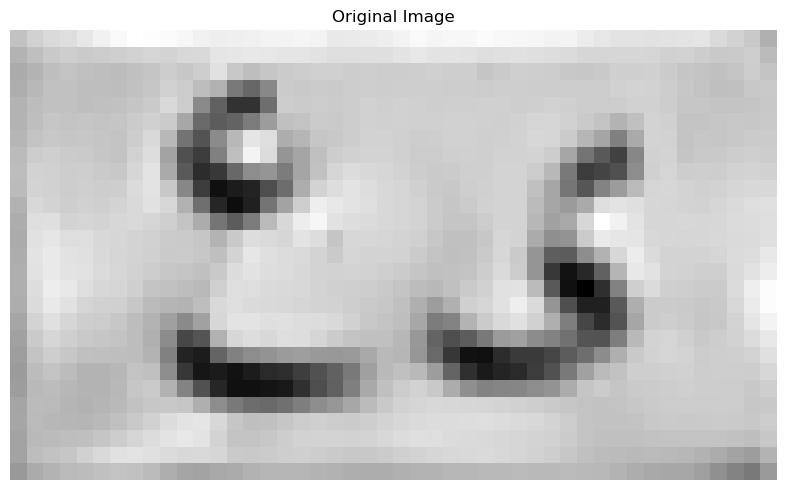

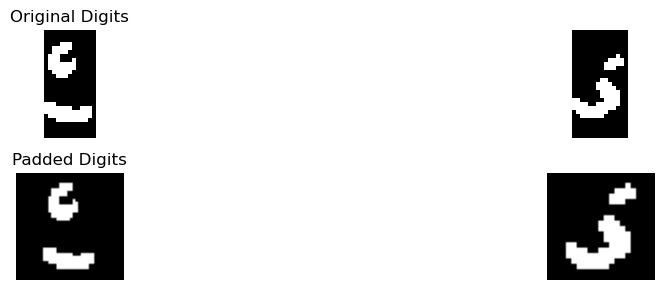

Best match: ع
Full comparison results: {'أ': 0.3569078947368421, 'ب': 0.1778846153846154, 'ج': 2.8225488994224692, 'د': 2.8916406532911108, 'ر': 0.7871681520350935, 'س': 0.6517857142857143, 'ص': 0.44672619047619044, 'ط': 2.252256258234519, 'ع': 5.094241984278062, 'ف': 1.8052627648871282, 'ق': 1.2921896778861388, 'ك': 2.6297348484848486, 'ل': 1.2171650717703348, 'م': 1.2991925837320575, 'ن': 2.7777036340852126, 'ه': 0.8300403225806452, 'و': 1.0281471758899163, 'ي': 0.7699693422519509}
Confidence :  1.1013006654934756
Best match: ي
Full comparison results: {'أ': 0.2692307692307693, 'ب': 0.5305868700265253, 'ج': 1.7977386039886039, 'د': 3.236734330484331, 'ر': 3.052635941644562, 'س': 2.138392857142857, 'ص': 2.0232371794871797, 'ط': 3.298076923076923, 'ع': 1.0, 'ف': 3.9454746642246645, 'ق': 2.7385092133076006, 'ك': 2.911057692307692, 'ل': 2.404876373626373, 'م': 0.11538461538461539, 'ن': 2.5168269230769234, 'ه': 1.84375, 'و': 3.3261217948717947, 'ي': 4.601654259718776}
Confidence :  0.3280

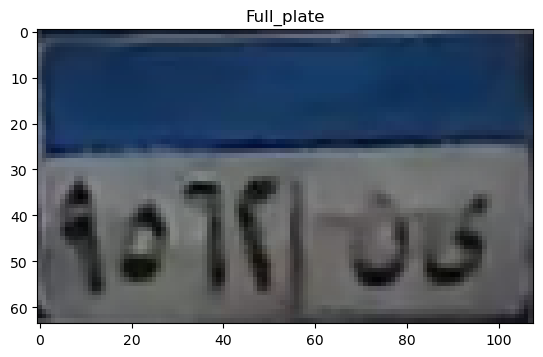

top
[0.43997923 0.29213593 0.13942867 0.14018525 0.14984608 0.16791559
 0.18444616 0.1830763  0.17702445 0.187775   0.21133884 0.2127451
 0.16098154 0.15589871 0.16210655 0.19091348 0.18908132 0.20407353
 0.21572562 0.24355206 0.24507946 0.22565028 0.19761562 0.17123735
 0.22715113 0.27245892 0.26830074 0.25497206 0.24465022 0.21314882
 0.19189423 0.17394135 0.16139439 0.16797316 0.17558652 0.18045038
 0.17358763 0.16034468 0.13722415 0.11201549 0.09401771 0.09292407
 0.0835138  0.08313306 0.08061372 0.07588751 0.06640293 0.06113332
 0.0617399  0.06755934 0.07430738 0.07785374 0.0834164  0.08280142]
[0.43334522 0.29114881 0.12800335 0.08526373 0.09090429 0.1139376
 0.16092884 0.16995211 0.16443109 0.19655026 0.26038402 0.26609436
 0.19371385 0.1955383  0.21106373 0.24363879 0.22157396 0.23543436
 0.25766169 0.31236451 0.32763718 0.31301555 0.28989674 0.25623794
 0.29712936 0.34629745 0.34829353 0.33535471 0.34302168 0.31428393
 0.29266935 0.27542824 0.25194478 0.25847051 0.28037615 0.2

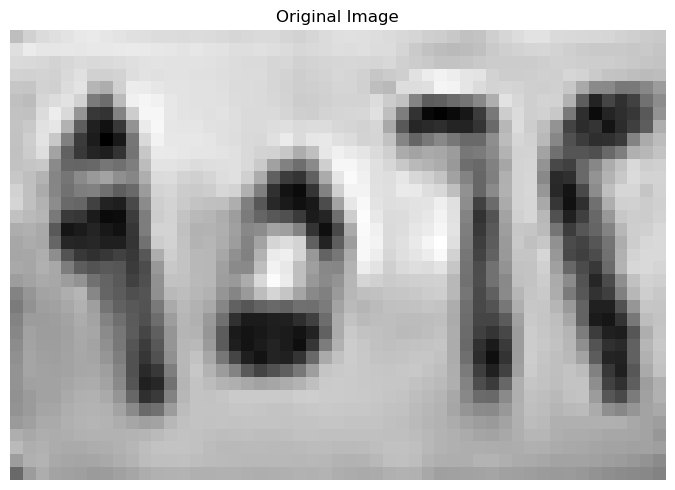

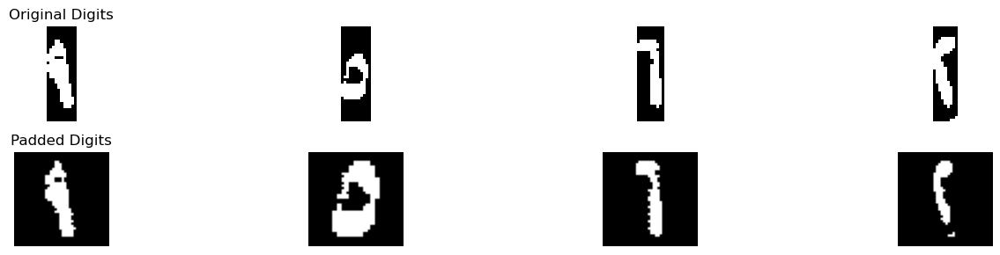

Best match: ٩
Full comparison results: {'١': 3.1225961538461537, '٢': 3.625, '٣': 1.9297600619195046, '٤': 3.29114010989011, '٥': 0.9144875055285272, '٦': 0.5732142857142857, '٧': 2.264705882352941, '٨': 2.3819444444444446, '٩': 3.638166163901458}
Confidence :  0.006583081950729097
Best match: ٥
Full comparison results: {'١': 0.4, '٢': 2.18125, '٣': 1.5374999999999999, '٤': 2.3375, '٥': 7.493154761904762, '٦': 1.7874999999999999, '٧': 1.05, '٨': 0.8624999999999999, '٩': 0.51875}
Confidence :  2.577827380952381
Best match: ١
Full comparison results: {'١': 3.332386363636364, '٢': 2.2210081585081585, '٣': 0.5802051083591331, '٤': 0.5453754578754579, '٥': 1.6388858174848886, '٦': 3.1068452380952385, '٧': 0.6654411764705882, '٨': 0.9833333333333333, '٩': 2.3454468325791855}
Confidence :  0.11277056277056285
Best match: ٢
Full comparison results: {'١': 1.3152777777777778, '٢': 5.6716200466200455, '٣': 3.1760835913312695, '٤': 1.9596153846153848, '٥': 1.445737505528527, '٦': 0.264285714285714

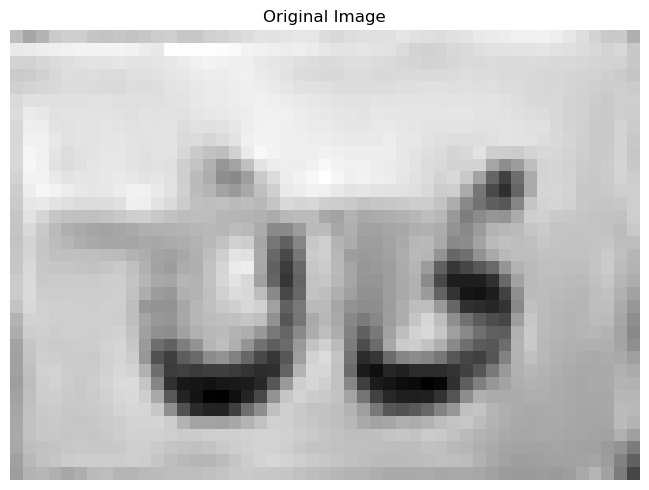

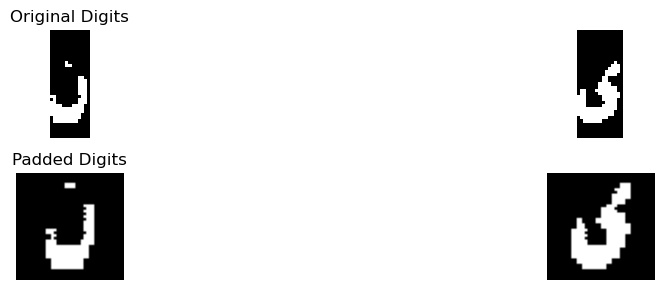

Best match: ن
Full comparison results: {'أ': 0.29469086021505375, 'ب': 0.6347811671087533, 'ج': 1.2779431216931216, 'د': 4.311799796207691, 'ر': 2.742966463196973, 'س': 1.2455357142857144, 'ص': 0.7961309523809523, 'ط': 2.393110060229626, 'ع': 1.936924027021577, 'ف': 3.165094916951878, 'ق': 2.704179277758108, 'ك': 1.206439393939394, 'ل': 3.736025042444822, 'م': 0.4965277777777778, 'ن': 4.697691372247824, 'ه': 1.1122983870967742, 'و': 2.1885240655401947, 'ي': 2.0526964882943144}
Confidence :  0.1929457880200669
Best match: ي
Full comparison results: {'أ': 0.36363636363636365, 'ب': 0.46734084880636606, 'ج': 1.3642768262333478, 'د': 3.3824410774410776, 'ر': 2.487457918767889, 'س': 1.9508928571428572, 'ص': 2.109469696969697, 'ط': 1.2760210803689065, 'ع': 1.3039772727272727, 'ف': 3.0584716209716207, 'ق': 2.1172138047138045, 'ك': 2.1032196969696972, 'ل': 2.5994318181818183, 'م': 0.4403409090909091, 'ن': 2.6126136363636365, 'ه': 1.6778897849462366, 'و': 3.3451178451178447, 'ي': 3.5560283014087

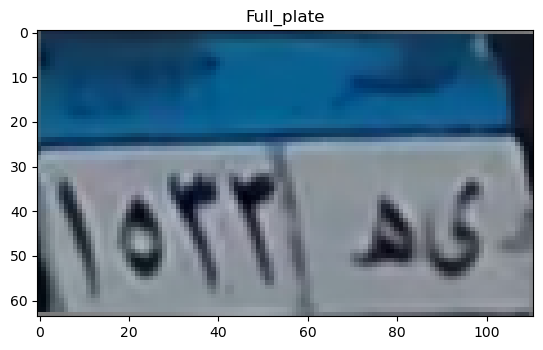

top
[0.2239116  0.16358051 0.159925   0.15706698 0.16479719 0.17607467
 0.18899886 0.196239   0.19035973 0.18798191 0.19200213 0.19920417
 0.2120695  0.23210207 0.24343    0.24795164 0.25432294 0.24192922
 0.25017159 0.25427334 0.2643949  0.26744564 0.26835326 0.2831543
 0.29210024 0.29183272 0.28610551 0.28754044 0.28160002 0.29366309
 0.30571909 0.3127179  0.33052769 0.33580512 0.34196195 0.34528349
 0.3547424  0.35297627 0.36368291 0.37472624 0.39640555 0.41744435
 0.41518987 0.42107985 0.42247124 0.43140911 0.42684988 0.42932042
 0.43581593 0.47209121 0.44327101 0.39500237 0.374315   0.37285303
 0.38969631]
[0.20495335 0.33292002 0.34858457 0.36238625 0.38480819 0.37912835
 0.38619806 0.40731423 0.40266659 0.41406373 0.41613007 0.42823138
 0.43483578 0.45978599 0.47413872 0.4849371  0.49984028 0.48336756
 0.49504703 0.49798347 0.50530436 0.50593972 0.50600173 0.52578204
 0.54298231 0.52709503 0.52118059 0.52623497 0.52392632 0.53469108
 0.54127836 0.55015252 0.55672941 0.55904958 0

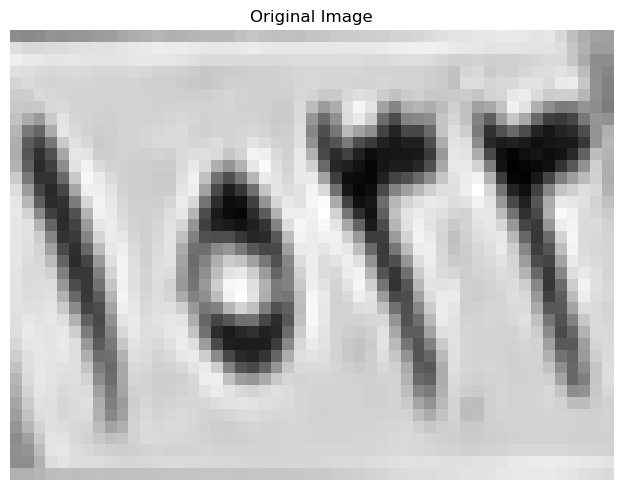

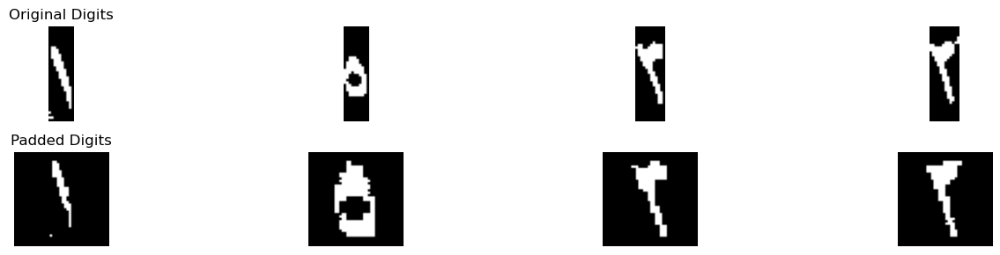

Best match: ١
Full comparison results: {'١': 5.172916666666667, '٢': 0.0, '٣': 0.058823529411764705, '٤': 0.34375, '٥': 0.2593247825445968, '٦': 1.167857142857143, '٧': 0.2801470588235294, '٨': 1.8729166666666666, '٩': 2.608314479638009}
Confidence :  1.2823010935143289
Best match: ٥
Full comparison results: {'١': 1.772058823529412, '٢': 1.9393382352941178, '٣': 1.6817917956656347, '٤': 2.8051470588235294, '٥': 5.877662907268171, '٦': 1.3511029411764706, '٧': 0.693014705882353, '٨': 1.8107843137254902, '٩': 2.992851307189542}
Confidence :  1.4424058000393143
Best match: ١
Full comparison results: {'١': 3.7458333333333327, '٢': 1.66875, '٣': 3.0243808049535605, '٤': 0.99375, '٥': 2.1240048651039363, '٦': 2.814583333333333, '٧': 0.8106617647058824, '٨': 2.1180555555555554, '٩': 3.406168300653595}
Confidence :  0.16983251633986884
Best match: ٢
Full comparison results: {'١': 2.7062500000000003, '٢': 4.335416666666667, '٣': 4.016157120743034, '٤': 1.7375, '٥': 2.357092178976854, '٦': 2.031

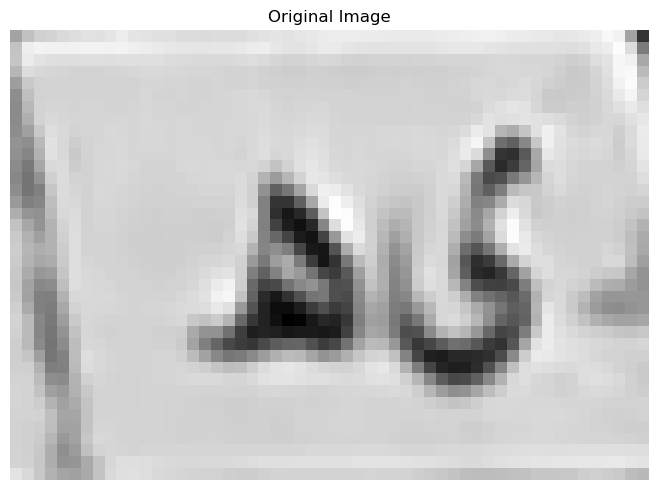

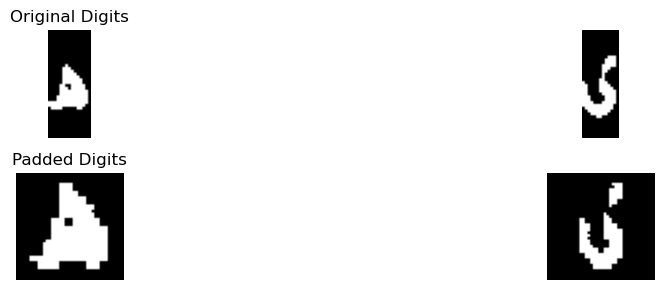

Best match: ه
Full comparison results: {'أ': 0.5107758620689655, 'ب': 0.5, 'ج': 1.0959051724137931, 'د': 3.2747844827586206, 'ر': 0.6422413793103449, 'س': 1.1411637931034484, 'ص': 1.2913793103448277, 'ط': 1.4935344827586208, 'ع': 0.5193965517241379, 'ف': 2.8814655172413794, 'ق': 1.1594827586206897, 'ك': 1.146551724137931, 'ل': 0.5517241379310345, 'م': 1.8890086206896552, 'ن': 1.2553879310344827, 'ه': 5.84375, 'و': 1.7413793103448278, 'ي': 1.3247844827586208}
Confidence :  1.2844827586206897
Best match: ي
Full comparison results: {'أ': 0.25, 'ب': 0.8808023872679045, 'ج': 1.450448075053615, 'د': 1.7281928026393971, 'ر': 1.9962443778110943, 'س': 0.6473214285714286, 'ص': 0.5702380952380952, 'ط': 0.7535902503293808, 'ع': 0.8016447368421054, 'ف': 2.0865618908382064, 'ق': 1.705353661932609, 'ك': 0.38920454545454547, 'ل': 2.519465944272446, 'م': 0.5625, 'ن': 1.7707142857142857, 'ه': 0.7290322580645161, 'و': 2.039186507936508, 'ي': 2.703862561585212}
Confidence :  0.09219830865638312
[['١', '٥'

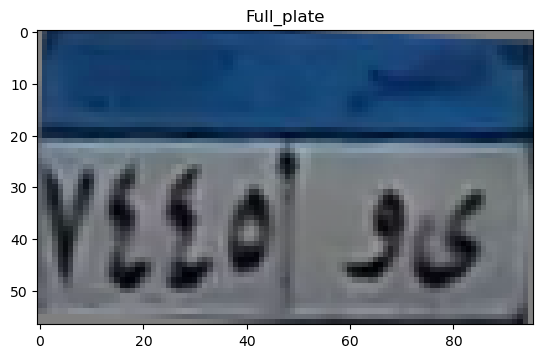

top
[0.46234058 0.53138913 0.57610939 0.58070462 0.58126703 0.58459522
 0.59679027 0.60580826 0.60995543 0.61745157 0.62458784 0.61276667
 0.6074476  0.59720971 0.59087632 0.59133077 0.59135974 0.59125201
 0.59287759 0.5902318  0.583283   0.57913548 0.5880739  0.58065866
 0.58380525 0.58848126 0.59707118 0.6052373  0.6114595  0.60907745
 0.58807321 0.58141721 0.57507763 0.5751863  0.57752088 0.57147118
 0.56124093 0.55712012 0.55145324 0.54849548 0.55854044 0.58391879
 0.60345417 0.60541642 0.61098343 0.60851959 0.60260103 0.52198256]
[0.47895147 0.50677493 0.52079054 0.50269306 0.50846912 0.52381848
 0.53984297 0.54219162 0.50732565 0.52285629 0.54014451 0.55907357
 0.56690045 0.56880448 0.56279054 0.55841753 0.55397237 0.5674731
 0.54820036 0.54100446 0.55905643 0.55438045 0.55627777 0.52751473
 0.5180927  0.51409545 0.51829581 0.52697496 0.53590841 0.53910196
 0.54290098 0.54461667 0.5487527  0.5530848  0.55929804 0.56476265
 0.56715608 0.56766093 0.57153632 0.57353147 0.57563647 0.

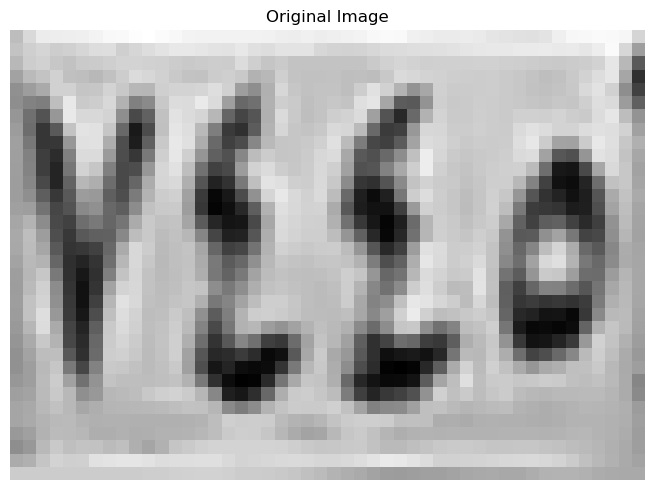

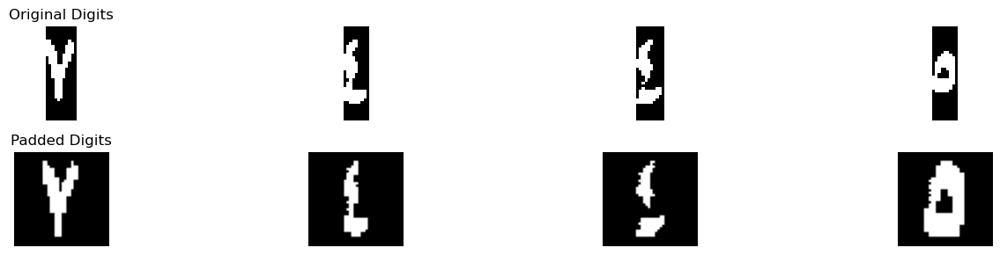

Best match: ٣
Full comparison results: {'١': 0.6666666666666666, '٢': 1.9124999999999999, '٣': 3.8369775541795663, '٤': 2.225, '٥': 1.3797176765443018, '٦': 0.7645833333333334, '٧': 3.3941176470588235, '٨': 1.6715277777777777, '٩': 2.296364379084967}
Confidence :  0.22142995356037143
Best match: ٤
Full comparison results: {'١': 1.2937500000000002, '٢': 2.8656031468531475, '٣': 1.7854102167182662, '٤': 5.389194139194139, '٥': 1.8208296476485328, '٦': 0.0, '٧': 0.8102941176470588, '٨': 1.6729166666666666, '٩': 0.8970274007038714}
Confidence :  1.2617954961704956
Best match: ٤
Full comparison results: {'١': 1.2916666666666663, '٢': 2.065705128205128, '٣': 1.84171826625387, '٤': 5.705162915041947, '٥': 2.1525228512457613, '٦': 0.03125, '٧': 0.6441176470588236, '٨': 1.0979166666666667, '٩': 1.5321612619406737}
Confidence :  1.7763200318980927
Best match: ٥
Full comparison results: {'١': 1.0, '٢': 1.9503676470588238, '٣': 1.6829527863777092, '٤': 2.597426470588235, '٥': 7.204652255639098, '٦

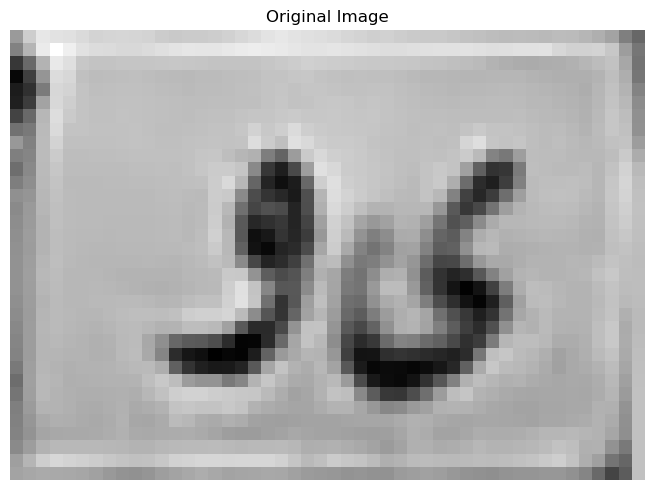

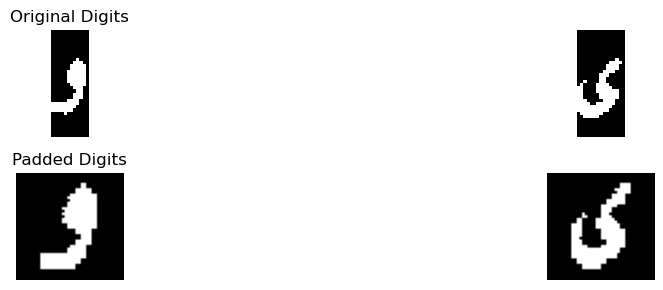

Best match: و
Full comparison results: {'أ': 0.47619047619047616, 'ب': 0.2941810344827586, 'ج': 1.1548913043478262, 'د': 3.593169793169793, 'ر': 3.3973556971514243, 'س': 3.0892857142857144, 'ص': 2.841964285714286, 'ط': 2.7628046772068515, 'ع': 1.0892857142857142, 'ف': 2.898313492063492, 'ق': 2.883101851851852, 'ك': 2.778409090909091, 'ل': 2.6547619047619047, 'م': 0.7414772727272727, 'ن': 2.1053571428571427, 'ه': 2.8214381720430106, 'و': 5.040013227513228, 'ي': 3.392429128842172}
Confidence :  0.7234217171717174
Best match: ي
Full comparison results: {'أ': 0.53125, 'ب': 0.3879310344827586, 'ج': 1.210995827843654, 'د': 3.2429040404040403, 'ر': 2.3626836581709147, 'س': 1.9151785714285714, 'ص': 1.675, 'ط': 1.435729578392622, 'ع': 1.0227272727272727, 'ف': 2.592111592111592, 'ق': 1.7334806397306397, 'ك': 1.706439393939394, 'ل': 2.2613636363636367, 'م': 0.18181818181818182, 'ن': 1.8593181818181816, 'ه': 1.360215053763441, 'و': 2.714330808080808, 'ي': 3.3212970001013478}
Confidence :  0.039196

In [25]:
def compare_result_with_answer(result, answer):
    # Step 1: Flatten the result and join all characters into a single string
    flattened = [char for sublist in result for char in sublist]
    
    # Separate characters and digits
    characters = [char for char in flattened if not char.isdigit()]
    digits = [char for char in flattened if char.isdigit()]
    
    # Reverse characters and concatenate with digits
    reconstructed_result = ''.join(characters[::-1] + digits)
    
    print(reconstructed_result, answer)
    
    # Step 2: Compare the reconstructed result with the answer
    is_match = reconstructed_result == answer
    
    # Step 3: Calculate percentage match
    length = max(len(reconstructed_result), len(answer))
    matches = sum(1 for a, b in zip(reconstructed_result, answer) if a == b)
    percentage_match = (matches / length) * 100
    print(percentage_match)
    
    return is_match, percentage_match


def load_dataset(path_to_dataset):
    features = []
    labels = []
    img_filenames = os.listdir(path_to_dataset)

    for i, fn in enumerate(img_filenames):
        if fn.split('.')[-1] != 'png':
            continue

        label = fn.split('.')[0]
        labels.append(label)

        path = os.path.join(path_to_dataset, fn)
        result = []
        img = rgba2rgb(io.imread(path)) #if not read try to replace io to cv2
        img = fix_tilt(img)
        show_images([img],["Full_plate"])
        image1,image1_it,image2,image2_it = split_plate(img)
        padded_digits = character_extraction(image1,image1_it,1)
        answer = test_half(1,padded_digits)
        result.append(answer)
        padded_digits = character_extraction(image2,image2_it,2)
        answer = test_half(2,padded_digits)
        result.append(answer)
        print(result)
        features.append(result)
        
    return features, labels
def getaccuracy(features,labels):
    right = 0
    percentage_right = 0
    for i in range(len(labels)):
        x,y = compare_result_with_answer(features[i],labels[i])
        if x:
            right += 1
        percentage_right += y
            
    return 100*right/len(labels), (percentage_right / len(labels))

path_to_dataset = r'./Tests'
features,labels = load_dataset(path_to_dataset)
accuracy,character_accuracy = getaccuracy(features,labels)
print(accuracy)
print(character_accuracy)

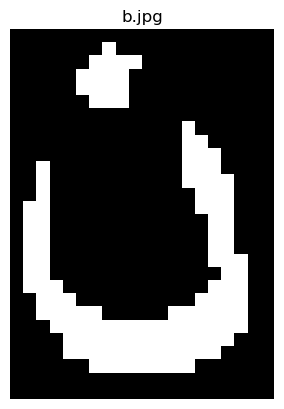

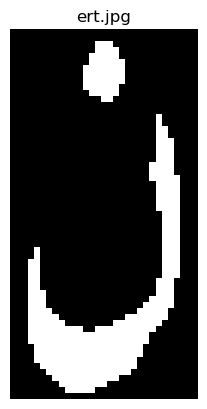

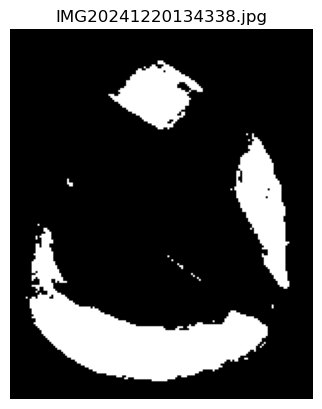

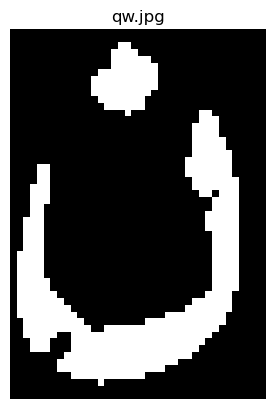

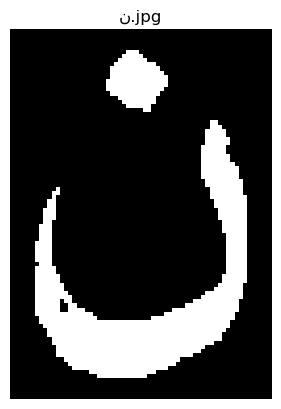

In [37]:
# Path to the folder containing the images
folder_path = "./Reference_Letters/ن"

# Get a list of all files in the folder
image_files = [file for file in os.listdir(folder_path) if file.endswith(('.jpg'))]

# Loop through each file, read it, and display it
for image_file in image_files:
    # Construct the full file path
    image_path = os.path.join(folder_path, image_file)
    
    # Read the image
    img = io.imread(image_path)
    img_g = rgb2gray(img)
    img_it = iterativeThreshold(img_g)
    
    # Display the image
    plt.imshow(img_it)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

In [17]:
def bounding(img_it):
    # # Find contours
    contours = find_contours(img_it, 0.)
    bounding_boxes = []
    for contour in contours:
        Ymin = np.min(contour[:,0])
        Ymax = np.max(contour[:,0])
        Xmin = np.min(contour[:,1])
        Xmax = np.max(contour[:,1])
        aspect_ratio = (Xmax-Xmin)/(Ymax-Ymin)
        print(Xmin, Xmax, Ymin, Ymax)
        if 0.5 <= aspect_ratio <= 3 and (Xmax-Xmin) > 6 or (Ymax-Ymin) > 6:
            bounding_boxes.append([Xmin, Xmax, Ymin, Ymax])
    
    
    return bounding_boxes

def rectangular_distance(shape, step=0.1):
    """
    Calculate a rectangular distance matrix where distance is based on layers moving inward.
    
    Args:
        shape (tuple): The shape of the matrix (height, width).
        step (float): The decrement for each inward layer of distance.
        
    Returns:
        numpy.ndarray: Matrix of distances based on rectangular layers.
    """
    height, width = shape
    distance_matrix = np.zeros((height, width), dtype=float)
    
    # Calculate the number of layers
    num_layers = min(height, width) // 2
    
    # Assign distances for each layer
    for layer in range(num_layers):
        distance = 1 - layer * step
        # Stop assigning if distance is less than zero
        if distance < 0:
            break
        # Assign distance to the current layer
        distance_matrix[layer:height-layer, layer:width-layer] = distance 
    
    return distance_matrix

In [19]:
def sub_horizontal_segmentation(image, binary_image_original, min_width=1, max_width=20, min_height=4, offset = 0):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    print("In sub_horizontal_segmentation")
    
    binary_image_new = iterativeThreshold(image)
    eroded = binary_erosion(binary_image_new,np.ones([3,2]))
    dilated = binary_dilation(eroded,np.ones([2,2]))

    #show_images([image,binary_image_new,eroded,dilated],["image","binary","eroded","dilated"])

    binary_image = dilated
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)

            if (end - start) > max_width:
                digit_region = binary_image_original[:,start:int((end+start)/2)+1]
                
                digit_regions.append((start + offset, int((end+start)/2) + offset, digit_region))
    
                digit_region = binary_image_original[:,int((end+start)/2):end+1]
                
                digit_regions.append((int((end+start)/2) + offset, end + offset, digit_region))


            '''
            if (end - start) > max_width:
                boxes = bounding(binary_image)
                if len(boxes) == 1:
                    digit_region = binary_image_original[:,start:int((end+start)/2)+1]
                    
                    digit_regions.append((start + offset, int((end+start)/2) + offset, digit_region))
    
                    digit_region = binary_image_original[:,int((end+start)/2):end+1]
                    
                    digit_regions.append((int((end+start)/2) + offset, end + offset, digit_region))
                else:
                    for box in boxes:
                        digit_region = binary_image_original[:,int(box[0]):int(box[1])+1]
                    
                        digit_regions.append((int(box[0]) + offset, int(box[1]) + offset, digit_region))  
                '''               
            
            #filtering
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image_new[:,start:end+1]) > min_height * (end - start)):
        
                # Extract potential digit
                #digit_region = image[:, start:end]
                #digit_region = iterativeThreshold(digit_region)
                digit_region = binary_image_original[:,start:end+1]
                
                digit_regions.append((start + offset, end + offset, digit_region))
            
            in_digit = False
    
    return digit_regions


def horizontal_segmentation_1(image, binary_image_original, min_width=1, max_width=20, min_height=4):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    print("In horizontal_segmentation_1")
    
    binary_image_new = iterativeThreshold(image)

    #show_images([image,binary_image_new],["image","binary"])
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image_new, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)
            
            #filtering
            
            while (end - start > max_width):
                sub_regions = sub_horizontal_segmentation(image[:,start:end+1], binary_image_original[:,start:end+1] , min_width, max_width, min_height, start)
                if len(sub_regions) == 0:
                    digit_region = binary_image_original[:,start:end+1]
                
                    digit_regions.append((start, end, digit_region))
                    break
                for x in range(len(sub_regions)):
                    digit_regions.append(sub_regions[x])
                    start = sub_regions[x][1]
                    
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image_new[:,start:end+1]) > min_height * (end - start) and ((end+start)/2 > len(horizontal_projection)/16 and (end+start)/2 < (len(horizontal_projection) - (len(horizontal_projection)/16)))):
        
                # Extract potential digit
                #digit_region = image[:, start:end]
                #digit_region = iterativeThreshold(digit_region)
                digit_region = binary_image_original[:,start:end+1]
                
                digit_regions.append((start, end, digit_region))
            
            in_digit = False
    #print(digit_regions)
    return digit_regions

def refine_segmentation_1(digit_regions, max_digits=4, min_separation=1, max_width = 14):
    """
    Refine segmentation by merging or filtering regions
    
    Args:
        digit_regions (list): List of detected digit regions
        max_digits (int): Maximum number of expected digits
        min_separation (int): Minimum separation between digits
    
    Returns:
        list: Refined list of digit regions
    """

    print("In refine_segmentation_1")
    
    # Sort regions from left to right
    sorted_regions = sorted(digit_regions, key=lambda x: x[0])
    
    # Merge closely connected regions
    refined_regions = []
    i = 0
    while i < len(sorted_regions):
        current = sorted_regions[i]
        
        # Look ahead to see if next region is close
        if i + 1 < len(sorted_regions):
            next_region = sorted_regions[i + 1]
            
            # If regions are close, merge them
            #also check connection????
            if i + 2 < len(sorted_regions):
                after_next_region = sorted_regions[i + 2]
                if next_region[0] - current[1] < min_separation and next_region[1] - current[0] <= max_width and (after_next_region[0] - next_region[1]) > (next_region[0] - current[1]):
                    # Merge the two regions
                    merged_region = (
                        current[0], 
                        next_region[1], 
                        np.hstack((current[2], next_region[2]))
                    )
                    refined_regions.append(merged_region)
                    i += 2
                    continue
            else:
                if next_region[0] - current[1] < min_separation and next_region[1] - current[0] <= max_width:
                    # Merge the two regions
                    merged_region = (
                        current[0], 
                        next_region[1], 
                        np.hstack((current[2], next_region[2]))
                    )
                    refined_regions.append(merged_region)
                    i += 2
                    continue
        
        refined_regions.append(current)
        i += 1
    refined_regions = sorted(refined_regions, key=lambda x: (x[0] - x[1]))
    refined_regions = refined_regions[:max_digits]
    refined_regions = sorted(refined_regions, key=lambda x: x[0])
    # Limit to max expected digits
    return refined_regions[:max_digits]

def vertical_segmentation(image):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    height, width = image.shape
    
    # Find horizontal projection
    vertical_projection = np.sum(image, axis=1)

    vert_max = max(vertical_projection) 
    print(vert_max)
    
    # Find potential digit regions
    regions = []
    in_digit = False
    prev = -1
    start = 0
    
    for x in range(len(vertical_projection)):

        if not in_digit and (vertical_projection[x] > (0.1 * vert_max)):
            in_digit = True
            start = x
            
        if in_digit and (vertical_projection[x] < (0.4 * prev)):
            end = x
            in_digit = False
            regions.append((start, end))

        prev = vertical_projection[x]

    refined_regions = sorted(regions, key=lambda x: x[0])
    if len(refined_regions) > 1:
        if refined_regions[0][1] >= int(0.25 * height) and refined_regions[0][1] <= int(height - (0.25 * height)):
            if refined_regions[1][0] >= int(0.25 * height) and refined_regions[1][0] <= int(height - (0.25 * height)):
                return [(refined_regions[0][0], refined_regions[1][1])]
    return regions

def character_extraction(image_n,image_n_it,current_half):
    #show_images([image_n_it],["character_extraction"])
    height, width = image_n.shape
    #image_it = iterativeThreshold(image_n)
    #rectangle = 1 - rectangular_distance(np.shape(image_it),0.1)
    #image_it_new = image_it * rectangle
    #show_images([image_it,image_it_new],["1","2"])
    #vertical_regions = vertical_segmentation(image_it_new)
    #print(vertical_regions)
    #choosen_region = (sorted(vertical_regions, key=lambda x: x[0]-x[1]))[0]
    #print(choosen_region)
    #image_new = image_n[int(choosen_region[0]):int(choosen_region[1]),:]
    #show_images([image_n,image_new],["3","4"])
    if current_half == 1:
        digit_regions = horizontal_segmentation_1(image_n,image_n_it,3,int(0.35*width),3)
    if current_half == 2:
        digit_regions = horizontal_segmentation_1(image_n,image_n_it,2,int(0.35*width),3)

    #print(digit_regions)
        
    # Refine segmentation
    if current_half == 1:
        refined_regions = refine_segmentation_1(digit_regions,4,4,int(0.35*width))
        after_outliers=remove_outliers(refined_regions,5)
    if current_half == 2:
        refined_regions = refine_segmentation_1(digit_regions,4,4,int(0.35*width))
        after_outliers=remove_outliers_letters(refined_regions,4)
        
    # Pad and center digits
    padded_digits = [
        resize(after_outlier[2]) 
        for after_outlier in after_outliers
    ]
    # Visualize segmentation
    visualize_segmentation(image_n, refined_regions,padded_digits)

    return padded_digits


In [21]:
def horizontal_cutting(binary_image_original):
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image_original, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)
            digit_region = binary_image_original[:,start:end+1]    
            digit_regions.append((start, end, digit_region))
            in_digit = False
    #print(digit_regions)
    return digit_regions

In [23]:
def remove_outliers(refined_regions,thresh):
    #thresh*=255
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        print(height,increment)
        print(np.sum(refined_region[2][4*increment:5*increment,:]))
        if np.sum(refined_region[2][:increment,:])<thresh:
            refined_region[2][:increment,:]=0
        if np.sum(refined_region[2][increment:2*increment,:])<thresh:
            refined_region[2][increment:2*increment,:]=0
        if np.sum(refined_region[2][2*increment:3*increment,:])<thresh:
            refined_region[2][2*increment:3*increment,:]=0
        if np.sum(refined_region[2][3*increment:4*increment,:])<thresh:
            refined_region[2][3*increment:4*increment,:]=0
        if np.sum(refined_region[2][4*increment:5*increment,:])<thresh:
            refined_region[2][4*increment:5*increment,:]=0
        if np.sum(refined_region[2][5*increment:6*increment,:])<thresh:
            refined_region[2][5*increment:6*increment,:]=0
        if np.sum(refined_region[2][6*increment:7*increment,:])<thresh:
            refined_region[2][6*increment:7*increment,:]=0
        if np.sum(refined_region[2][7*increment:,:])<thresh:
            refined_region[2][7*increment:,:]=0
    '''
    thresh -=(3*255)
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        if np.sum(refined_region[2][:,:increment])<thresh:
            refined_region[2][:,:increment]=0
        if np.sum(refined_region[2][:,increment:2*increment])<thresh:
            refined_region[2][:,increment:2*increment]=0
        if np.sum(refined_region[2][:,2*increment:3*increment])<thresh:
            refined_region[2][:,2*increment:3*increment]=0
        if np.sum(refined_region[2][:,3*increment:4*increment])<thresh:
            refined_region[2][:,3*increment:4*increment]=0
        if np.sum(refined_region[2][:,4*increment:5*increment])<thresh:
            refined_region[2][:,4*increment:5*increment]=0
        if np.sum(refined_region[2][:,5*increment:6*increment])<thresh:
            refined_region[2][:,5*increment:6*increment]=0
        if np.sum(refined_region[2][:,6*increment:7*increment])<thresh:
            refined_region[2][:,6*increment:7*increment]=0
        if np.sum(refined_region[2][:,7*increment:])<thresh:
            refined_region[2][:,7*increment:]=0
    '''
    return refined_regions

def remove_outliers_letters(refined_regions,thresh):
    #thresh*=255
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        if np.sum(refined_region[2][:increment,:])<thresh:
            refined_region[2][:increment,:]=0
        if np.sum(refined_region[2][4*increment:5*increment,:])<thresh:
            refined_region[2][4*increment:5*increment,:]=0
        if np.sum(refined_region[2][5*increment:6*increment,:])<thresh:
            refined_region[2][5*increment:6*increment,:]=0
        if np.sum(refined_region[2][6*increment:7*increment,:])<thresh:
            refined_region[2][6*increment:7*increment,:]=0
        if np.sum(refined_region[2][7*increment:,:])<thresh:
            refined_region[2][7*increment:,:]=0

    return refined_regions